# Assignment answer part 1

### Please note that (row,col) format is used at first

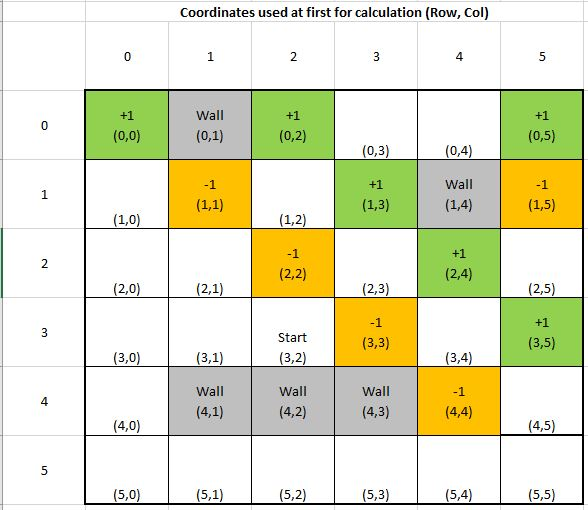

In [30]:
from IPython.display import Image
Image(filename = "coordinates_used_first_row,col.JPG", width = 600, height = 300)

# Defining the grid and helper functions

In [1]:
import numpy as np
import matplotlib
import matplotlib.pyplot as plt

class Grid:
    def __init__(self, width, height, start):  #start is a tuple of 2 integars
        self.width = width
        self.height = height
        self.i = start[0]
        self.j = start[1]
        
    def set(self, rewards, actions):  #set the rewards and actions of the environment
        #rewards in dict of: (i, j): (row, col): reward
        #actions in dict of: (i, j): A (row, col): list of possible actions
        self.rewards = rewards
        self.actions = actions  #enumerate all the possible actions that can take you to new state
    
    def set_state(self, s):
        self.i = s[0]
        self.j = s[1]
        
    def current_state(self):
        return (self.i, self.j)

    def is_terminal(self, s):
        return s not in self.actions
    
    def move(self, action):
        #check if legal move first
        if action in self.actions[(self.i, self.j)]:
            if action == 'U':
                self.i -= 1
            elif action == 'D':
                self.i += 1
            elif action == 'R':
                self.j += 1
            elif action == 'L':
                self.j -= 1
        else:
            pass
        return self.rewards.get((self.i, self.j), 0)
    
    def undo_move(self, action):
        if action == 'U':
            self.i += 1
        elif action == 'D':
            self.i -= 1
        elif action == 'R':
            self.j -= 1
        elif action == 'L':
            self.j += 1
            
        #raise an exception if we arrive somewhere we should not be in
        assert(self.current_state() in self.all_states())
    
    def game_over(self):
        #returns true if game is over, else false
        return (self.i, self.j) not in self.actions
    
    def all_states(self):
        return set(list(self.actions.keys()) + list(self.rewards.keys()))
    
def standard_grid():
    #define a grid that describes the reward for arriving at each state
    g = Grid(6, 6, (3, 2))
    rewards = {(0,0):1, (0,2):1, (0,5):1, (1,3):1, (2,4):1, (3,5):1, (1,1):-1, (1,5):-1, (2,2):-1, (3,3):-1, (4,4):-1}
    actions = {
        (0,0): ('D'),
        (0,2): ('R', 'D'),
        (0,3): ('R', 'D', 'L'),
        (0,4): ('R', 'L'),
        (0,5): ('D', 'L'),
        (1,0): ('U', 'R', 'D'),
        (1,1): ('R', 'D', 'L'),
        (1,2): ('U', 'R', 'D', 'L'),
        (1,3): ('U', 'D', 'L'),
        (1,5): ('U', 'D'),
        (2,0): ('U', 'R', 'D'),
        (2,1): ('U', 'R', 'D', 'L'),
        (2,2): ('U', 'R', 'D', 'L'),
        (2,3): ('U', 'R', 'D', 'L'),
        (2,4): ('R', 'D', 'L'),
        (2,5): ('U', 'D', 'L'),
        (3,0): ('U', 'R', 'D'),
        (3,1): ('U', 'R', 'L'),
        (3,2): ('U', 'R', 'L'),
        (3,3): ('U', 'R', 'L'),
        (3,4): ('U', 'R', 'D', 'L'),
        (3,5): ('U', 'D', 'L'),
        (4,0): ('U', 'D'),
        (4,4): ('U', 'R', 'D'),
        (4,5): ('U', 'D', 'L'),
        (5,0): ('U', 'R'),
        (5,1): ('R', 'L'),
        (5,2): ('R', 'L'),
        (5,3): ('R', 'L'),
        (5,4): ('U', 'R', 'L'),
        (5,5): ('U', 'L')           
    }
    g.set(rewards, actions)
    return g

def negative_grid(step_cost=-0.04):
    g = standard_grid()
    g.rewards.update({
        (0,3): step_cost,
        (0,4): step_cost,
        (1,0): step_cost,
        (1,2): step_cost,
        (2,0): step_cost,
        (2,1): step_cost,
        (2,3): step_cost,
        (2,5): step_cost,
        (3,0): step_cost,
        (3,1): step_cost,
        (3,2): step_cost,
        (3,4): step_cost,
        (4,0): step_cost,
        (4,5): step_cost,
        (5,0): step_cost,
        (5,1): step_cost,
        (5,2): step_cost,
        (5,3): step_cost,
        (5,4): step_cost,
        (5,5): step_cost,     
    })
    return g

def play_game(agent, env):
    pass

In [2]:
SMALL_ENOUGH = 10e-4 #threshold for convergence

hist = []

def print_values(V, g):
    for i in range(g.width):
        print("--------------------------")
        for j in range(g.height):
            v = V.get((i,j), 0)
            if v >= 0:
                print(' {:.5f}|'.format(v), end = ' ')
                #print("%.2f|") % v,
            else:
                print('{:.5f}|'.format(v), end = ' ') # -ve sign takes up an extra space
                
            hist.append(v)
                
        print ("")

def print_policy(P,g):
    for i in range(g.width):
        print("--------------------------")
        for j in range(g.height):
            a = P.get((i,j), ' ')
            print('    {}   |'.format(a), end = ' ')
            #print(" %s | ") % a,
        print ("")

# Section 2: Policy Iteration

In [5]:
SMALL_ENOUGH = 10e-4
GAMMA = 0.99
ALL_POSSIBLE_ACTIONS = ('U', 'D', 'L', 'R')

if __name__ == '__main__':
    
    
    grid = negative_grid()
    
    #print rewards
    print("rewards:")
    print_values(grid.rewards, grid)
    
    #we'll randomly choose an action and update as we learn
    policy = {}
    for s in grid.actions.keys():
        policy[s] = np.random.choice(ALL_POSSIBLE_ACTIONS)
        
    #initial policy
    print('initial policy:')
    print_policy(policy, grid)
    
    
    hist = []
    
    
    #initilize V(s)
    V = {}
    states = grid.all_states()
    for s in states: 
        V[s] = 0
        if s in grid.actions:
            V[s] = 0
        else:
            V[s] = 0
            
    print_values(V, grid)
    
    #repeat until convergence 
    ind = 0
    while True:
        ind = ind + 1
        print('#######' + 'iteration: ' + str(ind) + '#######')
        
        #policy evaluation step 
        while True:
            biggest_change = 0
            for s in states:
                old_v = V[s]
                
                if s in policy:
                    a = policy[s]
                    grid.set_state(s)
                    try:
                        r = grid.move(a)
                    except KeyError:
                        continue
                    
                    
                    grid.set_state(s)
                    #r = grid.move(a) #move only when legal / possible. Returns reward. 
                    r = grid.rewards.get(grid.current_state(), 0)
                    
                    
                    _ = grid.move(a)
                    v_correct = V[grid.current_state()]
                    
                    grid.set_state(s)
                    if a == 'U':
                        r_clockwise = grid.move('R')
                        v_clockwise = V[grid.current_state()]
                        grid.set_state(s)
                        r_anticlockwise = grid.move('L')
                    elif a == 'R':
                        r_clockwise = grid.move('D')
                        v_clockwise = V[grid.current_state()]
                        grid.set_state(s)
                        r_anticlockwise = grid.move('U')
                    elif a == 'D':
                        r_clockwise = grid.move('L')
                        v_clockwise = V[grid.current_state()]
                        grid.set_state(s)
                        r_anticlockwise = grid.move('R')
                    elif a == 'L':
                        r_clockwise = grid.move('U')
                        v_clockwise = V[grid.current_state()]
                        grid.set_state(s)
                        r_anticlockwise = grid.move('D')
                        
                    v_anticlockwise = V[grid.current_state()]
                        
                        
                    v = r + GAMMA * (0.8*v_correct + 0.1*v_clockwise + 0.1*v_anticlockwise)
                    V[s] = v
                    
                    biggest_change = max(biggest_change, np.abs(old_v - V[s]))
                    

                    
            if biggest_change < SMALL_ENOUGH:
                break
        
            
            print('values:')
            print_values(V, grid)
            print('policy:')
            print_policy(policy, grid)
        
        
        #policy improvement step
        is_policy_converged = True
        for s in states:
            if s in policy:
                old_a = policy[s]
                new_a = None
                best_value = float('-inf')
                # loop through all possible actions to find the best current action
                for a in ALL_POSSIBLE_ACTIONS:
                    grid.set_state(s)
                    try:
                        r = grid.move(a)
                    except KeyError:
                        continue
                    
                    grid.set_state(s)
                    #r = grid.move(a) #move only when legal / possible. Returns reward. 
                    r = grid.rewards.get(grid.current_state(), 0)
                    
                    
                    _ = grid.move(a)
                    v_correct = V[grid.current_state()]
                    
                    grid.set_state(s)
                    if a == 'U':
                        r_clockwise = grid.move('R')
                        v_clockwise = V[grid.current_state()]
                        grid.set_state(s)
                        r_anticlockwise = grid.move('L')
                    elif a == 'R':
                        r_clockwise = grid.move('D')
                        v_clockwise = V[grid.current_state()]
                        grid.set_state(s)
                        r_anticlockwise = grid.move('U')
                    elif a == 'D':
                        r_clockwise = grid.move('L')
                        v_clockwise = V[grid.current_state()]
                        grid.set_state(s)
                        r_anticlockwise = grid.move('R')
                    elif a == 'L':
                        r_clockwise = grid.move('U')
                        v_clockwise = V[grid.current_state()]
                        grid.set_state(s)
                        r_anticlockwise = grid.move('D')
                        
                    v_anticlockwise = V[grid.current_state()]
                        
                        
                    v = r + GAMMA * (0.8*v_correct + 0.1*v_clockwise + 0.1*v_anticlockwise)
                    
                    
                    
                    if v > best_value:
                        best_value = v
                        new_a = a
            policy[s] = new_a
            if new_a != old_a:
                is_policy_converged = False
        
        if is_policy_converged:
            break
    
    print('final values:')
    print_values(V, grid)
    print('final policy:')
    print_policy(policy, grid)

rewards:
--------------------------
 1.00000|  0.00000|  1.00000| -0.04000| -0.04000|  1.00000| 
--------------------------
-0.04000| -1.00000| -0.04000|  1.00000|  0.00000| -1.00000| 
--------------------------
-0.04000| -0.04000| -1.00000| -0.04000|  1.00000| -0.04000| 
--------------------------
-0.04000| -0.04000| -0.04000| -1.00000| -0.04000|  1.00000| 
--------------------------
-0.04000|  0.00000|  0.00000|  0.00000| -1.00000| -0.04000| 
--------------------------
-0.04000| -0.04000| -0.04000| -0.04000| -0.04000| -0.04000| 
initial policy:
--------------------------
    D   |         |     D   |     D   |     D   |     L   | 
--------------------------
    R   |     R   |     D   |     D   |         |     R   | 
--------------------------
    D   |     U   |     U   |     U   |     D   |     D   | 
--------------------------
    U   |     U   |     L   |     L   |     R   |     L   | 
--------------------------
    D   |         |         |         |     L   |     U   | 
-------

-2.40684|  0.00000| -0.98443|  2.57934|  2.12468|  2.84538| 
--------------------------
-3.70218| -3.88951| -2.68681|  3.17237|  0.00000| -1.13568| 
--------------------------
-3.52926| -3.79335| -3.23729|  2.73825|  6.06651|  5.87742| 
--------------------------
-3.49786| -3.75606| -3.69130| -4.04503|  5.32015|  6.17569| 
--------------------------
 1.02799|  0.00000|  0.00000|  0.00000| -1.18408|  5.09648| 
--------------------------
 1.28218|  3.19294|  3.49196|  3.79034|  3.92929|  4.68899| 
policy:
--------------------------
    D   |         |     D   |     D   |     D   |     L   | 
--------------------------
    R   |     R   |     D   |     D   |         |     R   | 
--------------------------
    D   |     U   |     U   |     U   |     D   |     D   | 
--------------------------
    U   |     U   |     L   |     L   |     R   |     L   | 
--------------------------
    D   |         |         |         |     L   |     U   | 
--------------------------
    D   |     R   |     

 3.15803|  0.00000|  0.00000|  0.00000|  0.95049|  7.15133| 
--------------------------
 3.40848|  5.30740|  5.57503|  5.84425|  5.99815|  6.77025| 
policy:
--------------------------
    D   |         |     D   |     D   |     D   |     L   | 
--------------------------
    R   |     R   |     D   |     D   |         |     R   | 
--------------------------
    D   |     U   |     U   |     U   |     D   |     D   | 
--------------------------
    U   |     U   |     L   |     L   |     R   |     L   | 
--------------------------
    D   |         |         |         |     L   |     U   | 
--------------------------
    D   |     R   |     R   |     R   |     R   |     U   | 
values:
--------------------------
-1.98625|  0.00000| -0.40378|  3.43921|  3.01403|  3.80338| 
--------------------------
-3.21577| -3.31455| -2.08636|  4.07365|  0.00000|  0.46014| 
--------------------------
-3.54586| -3.32354| -2.62039|  3.71337|  8.05210|  8.02299| 
--------------------------
-3.56417| -3.354

    R   |     R   |     D   |     D   |         |     R   | 
--------------------------
    D   |     U   |     U   |     U   |     D   |     D   | 
--------------------------
    U   |     U   |     L   |     L   |     R   |     L   | 
--------------------------
    D   |         |         |         |     L   |     U   | 
--------------------------
    D   |     R   |     R   |     R   |     R   |     U   | 
values:
--------------------------
-1.21892|  0.00000|  0.42815|  4.36803|  3.87208|  4.68820| 
--------------------------
-2.42934| -2.49344| -1.25013|  5.03533|  0.00000|  1.64809| 
--------------------------
-2.92092| -2.53495| -1.78201|  4.70042|  9.46547|  9.51553| 
--------------------------
-2.94962| -2.59445| -2.57331| -2.91476|  8.91173|  9.80054| 
--------------------------
 4.93957|  0.00000|  0.00000|  0.00000|  2.63490|  8.77406| 
--------------------------
 5.17241|  6.96082|  7.20997|  7.46110|  7.62769|  8.40962| 
policy:
--------------------------
    D   |       

    D   |     R   |     R   |     R   |     R   |     U   | 
values:
--------------------------
-0.43927|  0.00000|  1.24363|  5.22432|  4.69888|  5.52427| 
--------------------------
-1.64547| -1.69078| -0.43663|  5.91061|  0.00000|  2.63711| 
--------------------------
-2.20471| -1.74319| -0.97099|  5.58357|  10.55397|  10.65119| 
--------------------------
-2.23390| -1.81992| -1.79956| -2.13303|  10.03375|  10.93096| 
--------------------------
 6.19609|  0.00000|  0.00000|  0.00000|  3.81753|  9.91800| 
--------------------------
 6.41587|  8.12212|  8.35950|  8.59905|  8.77480|  9.56415| 
policy:
--------------------------
    D   |         |     D   |     D   |     D   |     L   | 
--------------------------
    R   |     R   |     D   |     D   |         |     R   | 
--------------------------
    D   |     U   |     U   |     U   |     D   |     D   | 
--------------------------
    U   |     U   |     L   |     L   |     R   |     L   | 
--------------------------
    D   |   

-1.55204| -1.05250| -0.27351|  6.31840|  11.39380|  11.52141| 
--------------------------
-1.57853| -1.14056| -1.11819| -1.44477|  10.89351|  11.79681| 
--------------------------
 7.15192|  0.00000|  0.00000|  0.00000|  4.72069|  10.79358| 
--------------------------
 7.36221|  9.00920|  9.23810|  9.46928|  9.65212|  10.44737| 
policy:
--------------------------
    D   |         |     D   |     D   |     D   |     L   | 
--------------------------
    R   |     R   |     D   |     D   |         |     R   | 
--------------------------
    D   |     U   |     U   |     U   |     D   |     D   | 
--------------------------
    U   |     U   |     L   |     L   |     R   |     L   | 
--------------------------
    D   |         |         |         |     L   |     U   | 
--------------------------
    D   |     R   |     R   |     R   |     R   |     U   | 
values:
--------------------------
 0.28510|  0.00000|  1.99133|  5.99107|  5.46716|  6.29460| 
--------------------------
-0.92249| 

-0.90834| -0.38515|  0.39567|  7.01155|  12.15325|  12.30511| 
--------------------------
-0.93074| -0.48241| -0.45684| -0.77679|  11.66780|  12.57640| 
--------------------------
 8.00766|  0.00000|  0.00000|  0.00000|  5.53243|  11.58160| 
--------------------------
 8.20984|  9.80661|  10.02815|  10.25205|  10.44134|  11.24201| 
policy:
--------------------------
    D   |         |     D   |     D   |     D   |     L   | 
--------------------------
    R   |     R   |     D   |     D   |         |     R   | 
--------------------------
    D   |     U   |     U   |     U   |     D   |     D   | 
--------------------------
    U   |     U   |     L   |     L   |     R   |     L   | 
--------------------------
    D   |         |         |         |     L   |     U   | 
--------------------------
    D   |     R   |     R   |     R   |     R   |     U   | 
values:
--------------------------
 0.93712|  0.00000|  2.66009|  6.66918|  6.16254|  6.98896| 
--------------------------
-0.2740

    D   |     R   |     R   |     R   |     R   |     U   | 
values:
--------------------------
 1.40916|  0.00000|  3.14279|  7.15596|  6.66801|  7.49267| 
--------------------------
 0.19460|  0.17473|  1.44912|  7.86273|  0.00000|  4.77179| 
--------------------------
-0.41330|  0.12272|  0.90308|  7.53240|  12.71066|  12.87898| 
--------------------------
-0.43201|  0.01914|  0.04766| -0.26726|  12.23477|  13.14718| 
--------------------------
 8.63189|  0.00000|  0.00000|  0.00000|  6.12612|  12.15840| 
--------------------------
 8.82836|  10.38988|  10.60615|  10.82484|  11.01887|  11.82354| 
policy:
--------------------------
    D   |         |     D   |     D   |     D   |     L   | 
--------------------------
    R   |     R   |     D   |     D   |         |     R   | 
--------------------------
    D   |     U   |     U   |     U   |     D   |     D   | 
--------------------------
    U   |     U   |     L   |     L   |     R   |     L   | 
--------------------------
    D 

 9.13134|  0.00000|  0.00000|  0.00000|  6.60182|  12.62076| 
--------------------------
 9.32332|  10.85725|  11.06935|  11.28391|  11.48174|  12.28965| 
policy:
--------------------------
    D   |         |     D   |     D   |     D   |     L   | 
--------------------------
    R   |     R   |     D   |     D   |         |     R   | 
--------------------------
    D   |     U   |     U   |     U   |     D   |     D   | 
--------------------------
    U   |     U   |     L   |     L   |     R   |     L   | 
--------------------------
    D   |         |         |         |     L   |     U   | 
--------------------------
    D   |     R   |     R   |     R   |     R   |     U   | 
values:
--------------------------
 1.83848|  0.00000|  3.58112|  7.59681|  7.12879|  7.95139| 
--------------------------
 0.62047|  0.60494|  1.88358|  8.30602|  0.00000|  5.25274| 
--------------------------
 0.01039|  0.55518|  1.33435|  7.97312|  13.17670|  13.35819| 
--------------------------
-0.00494

    D   |     R   |     R   |     R   |     R   |     U   | 
values:
--------------------------
 2.11640|  0.00000|  3.86465|  7.88159|  7.42744|  8.24855| 
--------------------------
 0.89602|  0.88319|  2.16455|  8.59218|  0.00000|  5.56300| 
--------------------------
 0.28526|  0.83505|  1.61322|  8.25747|  13.47564|  13.66539| 
--------------------------
 0.27219|  0.72317|  0.75622|  0.44835|  13.01171|  13.92927| 
--------------------------
 9.48520|  0.00000|  0.00000|  0.00000|  6.93910|  12.94863| 
--------------------------
 9.67402|  11.18862|  11.39778|  11.60943|  11.80996|  12.62017| 
policy:
--------------------------
    D   |         |     D   |     D   |     D   |     L   | 
--------------------------
    R   |     R   |     D   |     D   |         |     R   | 
--------------------------
    D   |     U   |     U   |     U   |     D   |     D   | 
--------------------------
    U   |     U   |     L   |     L   |     R   |     L   | 
--------------------------
    D 

    D   |     R   |     R   |     R   |     R   |     U   | 
values:
--------------------------
 2.24088|  0.00000|  3.99162|  8.00905|  7.56127|  8.38169| 
--------------------------
 1.01943|  1.00778|  2.29035|  8.72022|  0.00000|  5.70178| 
--------------------------
 0.40848|  0.96039|  1.73807|  8.38468|  13.60907|  13.80247| 
--------------------------
 0.39644|  0.84710|  0.88097|  0.57434|  13.14715|  14.06560| 
--------------------------
 9.63380|  0.00000|  0.00000|  0.00000|  7.08077|  13.08637| 
--------------------------
 9.82130|  11.32782|  11.53575|  11.74617|  11.94784|  12.75902| 
policy:
--------------------------
    D   |         |     D   |     D   |     D   |     L   | 
--------------------------
    R   |     R   |     D   |     D   |         |     R   | 
--------------------------
    D   |     U   |     U   |     U   |     D   |     D   | 
--------------------------
    U   |     U   |     L   |     L   |     R   |     L   | 
--------------------------
    D 

--------------------------
 0.53247|  0.98272|  1.01750|  0.71223|  13.29512|  14.21455| 
--------------------------
 9.79611|  0.00000|  0.00000|  0.00000|  7.23555|  13.23685| 
--------------------------
 9.98218|  11.47989|  11.68647|  11.89556|  12.09847|  12.91070| 
policy:
--------------------------
    D   |         |     D   |     D   |     D   |     L   | 
--------------------------
    R   |     R   |     D   |     D   |         |     R   | 
--------------------------
    D   |     U   |     U   |     U   |     D   |     D   | 
--------------------------
    U   |     U   |     L   |     L   |     R   |     L   | 
--------------------------
    D   |         |         |         |     L   |     U   | 
--------------------------
    D   |     R   |     R   |     R   |     R   |     U   | 
values:
--------------------------
 2.38501|  0.00000|  4.13860|  8.15656|  7.71627|  8.53587| 
--------------------------
 1.16231|  1.15201|  2.43599|  8.86840|  0.00000|  5.86238| 
--------

    D   |         |     D   |     D   |     D   |     L   | 
--------------------------
    R   |     R   |     D   |     D   |         |     R   | 
--------------------------
    D   |     U   |     U   |     U   |     D   |     D   | 
--------------------------
    U   |     U   |     L   |     L   |     R   |     L   | 
--------------------------
    D   |         |         |         |     L   |     U   | 
--------------------------
    D   |     R   |     R   |     R   |     R   |     U   | 
values:
--------------------------
 2.48868|  0.00000|  4.24432|  8.26265|  7.82777|  8.64679| 
--------------------------
 1.26507|  1.25575|  2.54073|  8.97495|  0.00000|  5.97784| 
--------------------------
 0.65390|  1.20991|  1.98655|  8.63772|  13.87414|  14.07476| 
--------------------------
 0.64391|  1.09380|  1.12933|  0.82517|  13.41616|  14.33639| 
--------------------------
 9.92887|  0.00000|  0.00000|  0.00000|  7.36216|  13.35995| 
--------------------------
 10.11377|  11.6042

 0.71906|  1.27614|  2.05250|  8.70486|  13.94441|  14.14694| 
--------------------------
 0.70963|  1.15928|  1.19526|  0.89175|  13.48748|  14.40817| 
--------------------------
 10.00708|  0.00000|  0.00000|  0.00000|  7.43675|  13.43248| 
--------------------------
 10.19129|  11.67757|  11.88240|  12.08976|  12.29428|  13.10790| 
policy:
--------------------------
    D   |         |     D   |     D   |     D   |     L   | 
--------------------------
    R   |     R   |     D   |     D   |         |     R   | 
--------------------------
    D   |     U   |     U   |     U   |     D   |     D   | 
--------------------------
    U   |     U   |     L   |     L   |     R   |     L   | 
--------------------------
    D   |         |         |         |     L   |     U   | 
--------------------------
    D   |     R   |     R   |     R   |     R   |     U   | 
values:
--------------------------
 2.55936|  0.00000|  4.31638|  8.33495|  7.90379|  8.72240| 
--------------------------
 1.3

 1.40609|  1.39810|  2.68445|  9.12113|  0.00000|  6.13625| 
--------------------------
 0.79484|  1.35315|  2.12919|  8.78293|  14.02610|  14.23085| 
--------------------------
 0.78605|  1.23544|  1.27193|  0.96918|  13.57038|  14.49161| 
--------------------------
 10.09800|  0.00000|  0.00000|  0.00000|  7.52346|  13.51678| 
--------------------------
 10.28140|  11.76276|  11.96684|  12.17346|  12.37867|  13.19288| 
policy:
--------------------------
    D   |         |     D   |     D   |     D   |     L   | 
--------------------------
    R   |     R   |     D   |     D   |         |     R   | 
--------------------------
    D   |     U   |     U   |     U   |     D   |     D   | 
--------------------------
    U   |     U   |     L   |     L   |     R   |     L   | 
--------------------------
    D   |         |         |         |     L   |     U   | 
--------------------------
    D   |     R   |     R   |     R   |     R   |     U   | 
values:
--------------------------
 2.6

 10.33793|  11.81620|  12.01981|  12.22596|  12.43161|  13.24619| 
policy:
--------------------------
    D   |         |     D   |     D   |     D   |     L   | 
--------------------------
    R   |     R   |     D   |     D   |         |     R   | 
--------------------------
    D   |     U   |     U   |     U   |     D   |     D   | 
--------------------------
    U   |     U   |     L   |     L   |     R   |     L   | 
--------------------------
    D   |         |         |         |     L   |     U   | 
--------------------------
    D   |     R   |     R   |     R   |     R   |     U   | 
values:
--------------------------
 2.68173|  0.00000|  4.44115|  8.46014|  8.03542|  8.85332| 
--------------------------
 1.45642|  1.44890|  2.73575|  9.17330|  0.00000|  6.19278| 
--------------------------
 0.84515|  1.40428|  2.18009|  8.83474|  14.08032|  14.28654| 
--------------------------
 0.83678|  1.28599|  1.32282|  1.02058|  13.62540|  14.54699| 
--------------------------
 10.15

    U   |     U   |     L   |     L   |     R   |     L   | 
--------------------------
    D   |         |         |         |     L   |     U   | 
--------------------------
    D   |     R   |     R   |     R   |     R   |     U   | 
values:
--------------------------
 2.71822|  0.00000|  4.47835|  8.49746|  8.07467|  8.89236| 
--------------------------
 1.49258|  1.48541|  2.77261|  9.21079|  0.00000|  6.23340| 
--------------------------
 0.88130|  1.44101|  2.21667|  8.87197|  14.11927|  14.32655| 
--------------------------
 0.87324|  1.32231|  1.35939|  1.05752|  13.66493|  14.58678| 
--------------------------
 10.20169|  0.00000|  0.00000|  0.00000|  7.62234|  13.61293| 
--------------------------
 10.38417|  11.85992|  12.06315|  12.26891|  12.47492|  13.28980| 
policy:
--------------------------
    D   |         |     D   |     D   |     D   |     L   | 
--------------------------
    R   |     R   |     D   |     D   |         |     R   | 
--------------------------
    

 0.90306|  1.35203|  1.38931|  1.08773|  13.69727|  14.61934| 
--------------------------
 10.23715|  0.00000|  0.00000|  0.00000|  7.65617|  13.64582| 
--------------------------
 10.41933|  11.89316|  12.09609|  12.30156|  12.50784|  13.32295| 
policy:
--------------------------
    D   |         |     D   |     D   |     D   |     L   | 
--------------------------
    R   |     R   |     D   |     D   |         |     R   | 
--------------------------
    D   |     U   |     U   |     U   |     D   |     D   | 
--------------------------
    U   |     U   |     L   |     L   |     R   |     L   | 
--------------------------
    D   |         |         |         |     L   |     U   | 
--------------------------
    D   |     R   |     R   |     R   |     R   |     U   | 
values:
--------------------------
 2.74968|  0.00000|  4.51043|  8.52965|  8.10851|  8.92602| 
--------------------------
 1.52377|  1.51688|  2.80439|  9.24311|  0.00000|  6.26842| 
--------------------------
 0.912

 10.26113|  0.00000|  0.00000|  0.00000|  7.67904|  13.66806| 
--------------------------
 10.44309|  11.91563|  12.11836|  12.32364|  12.53010|  13.34537| 
policy:
--------------------------
    D   |         |     D   |     D   |     D   |     L   | 
--------------------------
    R   |     R   |     D   |     D   |         |     R   | 
--------------------------
    D   |     U   |     U   |     U   |     D   |     D   | 
--------------------------
    U   |     U   |     L   |     L   |     R   |     L   | 
--------------------------
    D   |         |         |         |     L   |     U   | 
--------------------------
    D   |     R   |     R   |     R   |     R   |     U   | 
values:
--------------------------
 2.76952|  0.00000|  4.53066|  8.54994|  8.12986|  8.94725| 
--------------------------
 1.54343|  1.53673|  2.82443|  9.26349|  0.00000|  6.29051| 
--------------------------
 0.93213|  1.49266|  2.26810|  8.92432|  14.17404|  14.38280| 
--------------------------
 0.924

    D   |         |     D   |     D   |     D   |     L   | 
--------------------------
    R   |     R   |     D   |     D   |         |     R   | 
--------------------------
    D   |     U   |     U   |     U   |     D   |     D   | 
--------------------------
    U   |     U   |     L   |     L   |     R   |     L   | 
--------------------------
    D   |         |         |         |     L   |     U   | 
--------------------------
    D   |     R   |     R   |     R   |     R   |     U   | 
values:
--------------------------
 2.78802|  0.00000|  4.54952|  8.56886|  8.14975|  8.96704| 
--------------------------
 1.56176|  1.55524|  2.84311|  9.28249|  0.00000|  6.31110| 
--------------------------
 0.95046|  1.51129|  2.28664|  8.94320|  14.19379|  14.40308| 
--------------------------
 0.94298|  1.39180|  1.42935|  1.12817|  13.74054|  14.66289| 
--------------------------
 10.28460|  0.00000|  0.00000|  0.00000|  7.70143|  13.68983| 
--------------------------
 10.46636|  11.937

    R   |     R   |     R   |     R   |     R   |     U   | 
values:
--------------------------
 9.39784|  0.00000|  15.83581|  15.92595|  13.65196|  14.89621| 
--------------------------
 9.72246|  14.61316|  16.16243|  16.57529|  0.00000|  17.13082| 
--------------------------
 10.02195|  14.72145|  15.98314|  18.29255|  19.65550|  18.78632| 
--------------------------
 12.26634|  14.38325|  15.65138|  16.99769|  19.19826|  19.85441| 
--------------------------
 12.88380|  0.00000|  0.00000|  0.00000|  16.54003|  18.52148| 
--------------------------
 13.85548|  14.28072|  15.36548|  16.48049|  16.91357|  17.31254| 
policy:
--------------------------
    U   |         |     R   |     D   |     R   |     U   | 
--------------------------
    U   |     R   |     R   |     R   |         |     D   | 
--------------------------
    U   |     R   |     R   |     R   |     R   |     D   | 
--------------------------
    D   |     U   |     U   |     R   |     R   |     R   | 
--------------

 22.67822|  25.48993|  26.67320|  27.80407|  29.95313|  30.71355| 
--------------------------
 23.37429|  0.00000|  0.00000|  0.00000|  27.41508|  29.39397| 
--------------------------
 24.42735|  24.98862|  26.06773|  27.15852|  27.69409|  28.20090| 
policy:
--------------------------
    U   |         |     R   |     D   |     R   |     U   | 
--------------------------
    U   |     R   |     R   |     R   |         |     D   | 
--------------------------
    U   |     R   |     R   |     R   |     R   |     D   | 
--------------------------
    D   |     U   |     U   |     R   |     R   |     R   | 
--------------------------
    D   |         |         |         |     R   |     U   | 
--------------------------
    R   |     R   |     R   |     R   |     R   |     U   | 
values:
--------------------------
 24.39125|  0.00000|  29.36096|  29.24096|  26.93164|  28.15969| 
--------------------------
 24.34019|  27.53210|  29.32792|  30.01817|  0.00000|  28.46837| 
------------------

    U   |         |     R   |     D   |     R   |     U   | 
--------------------------
    U   |     R   |     R   |     R   |         |     D   | 
--------------------------
    U   |     R   |     R   |     R   |     R   |     D   | 
--------------------------
    D   |     U   |     U   |     R   |     R   |     R   | 
--------------------------
    D   |         |         |         |     R   |     U   | 
--------------------------
    R   |     R   |     R   |     R   |     R   |     U   | 
values:
--------------------------
 33.65173|  0.00000|  36.58679|  36.44354|  35.00941|  36.22761| 
--------------------------
 33.25848|  34.52000|  36.40696|  37.18819|  0.00000|  35.23626| 
--------------------------
 32.80393|  33.50556|  34.54525|  36.62422|  37.73338|  37.06460| 
--------------------------
 29.95953|  32.82861|  34.00211|  35.15072|  37.27663|  38.10803| 
--------------------------
 30.62775|  0.00000|  0.00000|  0.00000|  34.82054|  36.79757| 
--------------------------

    D   |         |         |         |     R   |     U   | 
--------------------------
    R   |     R   |     R   |     R   |     R   |     U   | 
values:
--------------------------
 41.18990|  0.00000|  42.21511|  42.06755|  41.50493|  42.71521| 
--------------------------
 40.49158|  39.96846|  41.92108|  42.76473|  0.00000|  40.59718| 
--------------------------
 39.76375|  38.90895|  39.93569|  41.99934|  43.08618|  42.47673| 
--------------------------
 35.27787|  38.16281|  39.33750|  40.51914|  42.62957|  43.51286| 
--------------------------
 35.92950|  0.00000|  0.00000|  0.00000|  40.23339|  42.20906| 
--------------------------
 36.94842|  37.64426|  38.68895|  39.74542|  40.40120|  41.03501| 
policy:
--------------------------
    U   |         |     R   |     D   |     R   |     U   | 
--------------------------
    U   |     R   |     R   |     R   |         |     D   | 
--------------------------
    U   |     R   |     R   |     R   |     R   |     D   | 
------------

    D   |         |         |         |     R   |     U   | 
--------------------------
    R   |     R   |     R   |     R   |     R   |     U   | 
values:
--------------------------
 46.27596|  0.00000|  45.91820|  45.77053|  45.84258|  47.04756| 
--------------------------
 45.36145|  43.55062|  45.54582|  46.42910|  0.00000|  44.13202| 
--------------------------
 44.44089|  42.46778|  43.48742|  45.54227|  46.61565|  46.04532| 
--------------------------
 38.78417|  41.67657|  42.85305|  44.05876|  46.15913|  47.07663| 
--------------------------
 39.42531|  0.00000|  0.00000|  0.00000|  43.80246|  45.77723| 
--------------------------
 40.43473|  41.16804|  42.20315|  43.25006|  43.93931|  44.60848| 
policy:
--------------------------
    U   |         |     R   |     D   |     R   |     U   | 
--------------------------
    U   |     R   |     R   |     R   |         |     D   | 
--------------------------
    U   |     R   |     R   |     R   |     R   |     D   | 
------------

    R   |     R   |     R   |     R   |     R   |     U   | 
values:
--------------------------
 51.41294|  0.00000|  49.58597|  49.43934|  50.18328|  51.38297| 
--------------------------
 50.27195|  47.09483|  49.13229|  50.05436|  0.00000|  47.62927| 
--------------------------
 49.14959|  45.98856|  47.00134|  49.04751|  50.10759|  49.57597| 
--------------------------
 42.25314|  45.15279|  46.33114|  47.56073|  49.65117|  50.60252| 
--------------------------
 42.88396|  0.00000|  0.00000|  0.00000|  47.33358|  49.30747| 
--------------------------
 43.88397|  44.65435|  45.67998|  46.71743|  47.43980|  48.14396| 
policy:
--------------------------
    U   |         |     R   |     D   |     R   |     U   | 
--------------------------
    U   |     R   |     R   |     R   |         |     D   | 
--------------------------
    U   |     R   |     R   |     R   |     R   |     D   | 
--------------------------
    D   |     U   |     U   |     R   |     R   |     R   | 
------------

    U   |     R   |     R   |     R   |         |     D   | 
--------------------------
    U   |     R   |     R   |     R   |     R   |     D   | 
--------------------------
    D   |     U   |     U   |     R   |     R   |     R   | 
--------------------------
    D   |         |         |         |     R   |     U   | 
--------------------------
    R   |     R   |     R   |     R   |     R   |     U   | 
values:
--------------------------
 59.04387|  0.00000|  54.89473|  54.75109|  56.54794|  57.73987| 
--------------------------
 57.55063|  52.21607|  54.31525|  55.29312|  0.00000|  52.67580| 
--------------------------
 56.11414|  51.07097|  52.07337|  54.10632|  55.14646|  54.67070| 
--------------------------
 47.25905|  50.17063|  51.35134|  52.61414|  54.69018|  55.69037| 
--------------------------
 47.87478|  0.00000|  0.00000|  0.00000|  52.42898|  54.40159| 
--------------------------
 48.86122|  49.68509|  50.69704|  51.72085|  52.49100|  53.24564| 
policy:
------------

    U   |         |     R   |     D   |     R   |     U   | 
--------------------------
    U   |     R   |     R   |     R   |         |     D   | 
--------------------------
    U   |     R   |     R   |     R   |     R   |     D   | 
--------------------------
    D   |     U   |     U   |     R   |     R   |     R   | 
--------------------------
    D   |         |         |         |     R   |     U   | 
--------------------------
    R   |     R   |     R   |     R   |     R   |     U   | 
values:
--------------------------
 65.12758|  0.00000|  58.99575|  58.85555|  61.54091|  62.72675| 
--------------------------
 63.33862|  56.16348|  58.31102|  59.33185|  0.00000|  56.55684| 
--------------------------
 61.63800|  54.98224|  55.97596|  57.99780|  59.02161|  58.58881| 
--------------------------
 51.10911|  54.03191|  55.21391|  56.50059|  58.56545|  59.60320| 
--------------------------
 51.71298|  0.00000|  0.00000|  0.00000|  56.34762|  58.31924| 
--------------------------

--------------------------
 54.86913|  0.00000|  0.00000|  0.00000|  59.56991|  61.54072| 
--------------------------
 55.83655|  56.73539|  57.72817|  58.73286|  59.56998|  60.39537| 
policy:
--------------------------
    U   |         |     R   |     D   |     R   |     U   | 
--------------------------
    U   |     R   |     R   |     R   |         |     D   | 
--------------------------
    U   |     R   |     R   |     R   |     R   |     D   | 
--------------------------
    D   |     U   |     U   |     R   |     R   |     R   | 
--------------------------
    D   |         |         |         |     R   |     U   | 
--------------------------
    R   |     R   |     R   |     R   |     R   |     U   | 
values:
--------------------------
 70.60453|  0.00000|  62.57443|  62.43815|  65.96420|  67.14464| 
--------------------------
 68.53647|  59.60036|  61.79073|  62.84897|  0.00000|  59.92770| 
--------------------------
 66.58624|  58.38188|  59.36735|  61.37865|  62.38736|  61

 74.20486|  0.00000|  64.86078|  64.72756|  68.82933|  70.00627| 
--------------------------
 71.94584|  61.79152|  64.00963|  65.09172|  0.00000|  62.07183| 
--------------------------
 69.82462|  60.54582|  61.52564|  63.52969|  64.52824|  64.15647| 
--------------------------
 56.58061|  59.52370|  60.70637|  62.02350|  64.07222|  65.16335| 
--------------------------
 57.16710|  0.00000|  0.00000|  0.00000|  61.91603|  63.88625| 
--------------------------
 58.12827|  59.05174|  60.03821|  61.03663|  61.89575|  62.74438| 
policy:
--------------------------
    U   |         |     R   |     D   |     R   |     U   | 
--------------------------
    U   |     R   |     R   |     R   |         |     D   | 
--------------------------
    U   |     R   |     R   |     R   |     R   |     D   | 
--------------------------
    D   |     U   |     U   |     R   |     R   |     R   | 
--------------------------
    D   |         |         |         |     R   |     U   | 
--------------------

 60.30927|  61.25618|  62.23666|  63.22909|  64.10915|  64.97991| 
policy:
--------------------------
    U   |         |     R   |     D   |     R   |     U   | 
--------------------------
    U   |     R   |     R   |     R   |         |     D   | 
--------------------------
    U   |     R   |     R   |     R   |     R   |     D   | 
--------------------------
    D   |     U   |     U   |     R   |     R   |     R   | 
--------------------------
    D   |         |         |         |     R   |     U   | 
--------------------------
    R   |     R   |     R   |     R   |     R   |     U   | 
values:
--------------------------
 78.25616|  0.00000|  67.36240|  67.23310|  72.00679|  73.17986| 
--------------------------
 75.77422|  64.18399|  66.43286|  67.54099|  0.00000|  64.40756| 
--------------------------
 73.45319|  62.90478|  63.87798|  65.87356|  66.86041|  66.51450| 
--------------------------
 58.89817|  61.85190|  63.03433|  64.36268|  66.40446|  67.51820| 
---------------

--------------------------
 81.48604|  0.00000|  69.29583|  69.17007|  74.49946|  75.66949| 
--------------------------
 78.81948|  66.02871|  68.30172|  69.42995|  0.00000|  66.20385| 
--------------------------
 76.33282|  64.72039|  65.68810|  67.67665|  68.65398|  68.32795| 
--------------------------
 60.68063|  63.64366|  64.82561|  66.16170|  68.19808|  69.32920| 
--------------------------
 61.25350|  0.00000|  0.00000|  0.00000|  66.08806|  68.05723| 
--------------------------
 62.20356|  63.17083|  64.14610|  65.13335|  66.03159|  66.92156| 
policy:
--------------------------
    U   |         |     R   |     D   |     R   |     U   | 
--------------------------
    U   |     R   |     R   |     R   |         |     D   | 
--------------------------
    U   |     R   |     R   |     R   |     R   |     D   | 
--------------------------
    D   |     U   |     U   |     R   |     R   |     R   | 
--------------------------
    D   |         |         |         |     R   |     

 62.63112|  0.00000|  0.00000|  0.00000|  67.49455|  69.46337| 
--------------------------
 63.57743|  64.55947|  65.53096|  66.51444|  67.42587|  68.32978| 
policy:
--------------------------
    U   |         |     R   |     D   |     R   |     U   | 
--------------------------
    U   |     R   |     R   |     R   |         |     D   | 
--------------------------
    U   |     R   |     R   |     R   |     R   |     D   | 
--------------------------
    D   |     U   |     U   |     R   |     R   |     R   | 
--------------------------
    D   |         |         |         |     R   |     U   | 
--------------------------
    R   |     R   |     R   |     R   |     R   |     U   | 
values:
--------------------------
 84.23615|  0.00000|  70.89343|  70.77101|  76.58896|  77.75644| 
--------------------------
 81.40690|  67.54952|  69.84276|  70.98755|  0.00000|  67.68094| 
--------------------------
 78.77418|  66.21453|  67.17741|  69.15977|  70.12883|  69.81915| 
------------------

 80.10767|  67.01087|  67.97103|  69.94990|  70.91437|  70.61339| 
--------------------------
 62.92724|  65.90378|  67.08464|  68.42904|  70.45853|  71.61156| 
--------------------------
 63.49234|  0.00000|  0.00000|  0.00000|  68.37381|  70.34241| 
--------------------------
 64.43630|  65.42757|  66.39671|  67.37783|  68.29751|  69.21013| 
policy:
--------------------------
    U   |         |     R   |     D   |     R   |     U   | 
--------------------------
    U   |     R   |     R   |     R   |         |     D   | 
--------------------------
    U   |     R   |     R   |     R   |     R   |     D   | 
--------------------------
    D   |     U   |     U   |     R   |     R   |     R   | 
--------------------------
    D   |         |         |         |     R   |     U   | 
--------------------------
    R   |     R   |     R   |     R   |     R   |     U   | 
values:
--------------------------
 85.88602|  0.00000|  71.82778|  71.70752|  77.82596|  78.99194| 
-----------------

values:
--------------------------
 87.86115|  0.00000|  72.91971|  72.80220|  79.28829|  80.45248| 
--------------------------
 84.80849|  69.47262|  71.79198|  72.95774|  0.00000|  69.54248| 
--------------------------
 81.97502|  68.09950|  69.05575|  71.02961|  71.98754|  71.69846| 
--------------------------
 63.99399|  66.97785|  68.15796|  69.50557|  71.53173|  72.69517| 
--------------------------
 64.55528|  0.00000|  0.00000|  0.00000|  69.45903|  71.42735| 
--------------------------
 65.49635|  66.49901|  67.46523|  68.44345|  69.37331|  70.29668| 
policy:
--------------------------
    U   |         |     R   |     D   |     R   |     U   | 
--------------------------
    U   |     R   |     R   |     R   |         |     D   | 
--------------------------
    U   |     R   |     R   |     R   |     R   |     D   | 
--------------------------
    D   |     U   |     U   |     R   |     R   |     R   | 
--------------------------
    D   |         |         |         |     R 

    D   |     U   |     U   |     R   |     R   |     R   | 
--------------------------
    D   |         |         |         |     R   |     U   | 
--------------------------
    R   |     R   |     R   |     R   |     R   |     U   | 
values:
--------------------------
 89.34791|  0.00000|  73.72041|  73.60510|  80.37403|  81.53690| 
--------------------------
 86.20020|  70.23031|  72.56018|  73.73420|  0.00000|  70.27347| 
--------------------------
 83.28126|  68.84045|  69.79389|  71.76415|  72.71742|  72.43644| 
--------------------------
 64.71956|  67.70882|  68.88831|  70.23776|  72.26164|  73.43215| 
--------------------------
 65.27820|  0.00000|  0.00000|  0.00000|  70.19710|  72.16523| 
--------------------------
 66.21731|  67.22772|  68.19196|  69.16820|  70.10498|  71.03566| 
policy:
--------------------------
    U   |         |     R   |     D   |     R   |     U   | 
--------------------------
    U   |     R   |     R   |     R   |         |     D   | 
------------

 87.41956|  70.87806|  73.21704|  74.39812|  0.00000|  70.89702| 
--------------------------
 84.42391|  69.47293|  70.42386|  72.39088|  73.34003|  73.06595| 
--------------------------
 65.33853|  68.33272|  69.51160|  70.86235|  72.88426|  74.06081| 
--------------------------
 65.89487|  0.00000|  0.00000|  0.00000|  70.82669|  72.79467| 
--------------------------
 66.83231|  67.84932|  68.81187|  69.78643|  70.72911|  71.66603| 
policy:
--------------------------
    U   |         |     R   |     D   |     R   |     U   | 
--------------------------
    U   |     R   |     R   |     R   |         |     D   | 
--------------------------
    U   |     R   |     R   |     R   |     R   |     D   | 
--------------------------
    D   |     U   |     U   |     R   |     R   |     R   | 
--------------------------
    D   |         |         |         |     R   |     U   | 
--------------------------
    R   |     R   |     R   |     R   |     R   |     U   | 
values:
-----------------

 85.70517|  70.16247|  71.11051|  73.07382|  74.01828|  73.75171| 
--------------------------
 66.01286|  69.01285|  70.19094|  71.54277|  73.56252|  74.74564| 
--------------------------
 66.56665|  0.00000|  0.00000|  0.00000|  71.51255|  73.48035| 
--------------------------
 67.50226|  68.52647|  69.48718|  70.45990|  71.40901|  72.35273| 
policy:
--------------------------
    U   |         |     R   |     D   |     R   |     U   | 
--------------------------
    U   |     R   |     R   |     R   |         |     D   | 
--------------------------
    U   |     R   |     R   |     R   |     R   |     D   | 
--------------------------
    D   |     U   |     U   |     R   |     R   |     R   | 
--------------------------
    D   |         |         |         |     R   |     U   | 
--------------------------
    R   |     R   |     R   |     R   |     R   |     U   | 
values:
--------------------------
 92.19944|  0.00000|  75.19663|  75.08590|  82.41358|  83.57396| 
-----------------

 66.99395|  0.00000|  0.00000|  0.00000|  71.94880|  73.91650| 
--------------------------
 67.92839|  68.95719|  69.91673|  70.88828|  71.84148|  72.78952| 
policy:
--------------------------
    U   |         |     R   |     D   |     R   |     U   | 
--------------------------
    U   |     R   |     R   |     R   |         |     D   | 
--------------------------
    U   |     R   |     R   |     R   |     R   |     D   | 
--------------------------
    D   |     U   |     U   |     R   |     R   |     R   | 
--------------------------
    D   |         |         |         |     R   |     U   | 
--------------------------
    R   |     R   |     R   |     R   |     R   |     U   | 
values:
--------------------------
 93.15484|  0.00000|  75.67085|  75.56178|  83.08196|  84.24152| 
--------------------------
 89.75255|  72.06855|  74.42463|  75.61870|  0.00000|  72.03885| 
--------------------------
 86.60453|  70.63241|  71.57836|  73.53901|  74.48012|  74.21867| 
------------------

 67.38416|  0.00000|  0.00000|  0.00000|  72.34719|  74.31478| 
--------------------------
 68.31754|  69.35052|  70.30899|  71.27947|  72.23642|  73.18840| 
policy:
--------------------------
    U   |         |     R   |     D   |     R   |     U   | 
--------------------------
    U   |     R   |     R   |     R   |         |     D   | 
--------------------------
    U   |     R   |     R   |     R   |     R   |     D   | 
--------------------------
    D   |     U   |     U   |     R   |     R   |     R   | 
--------------------------
    D   |         |         |         |     R   |     U   | 
--------------------------
    R   |     R   |     R   |     R   |     R   |     U   | 
values:
--------------------------
 94.05330|  0.00000|  76.10586|  75.99840|  83.70228|  84.86108| 
--------------------------
 90.58809|  72.47660|  74.83869|  76.03722|  0.00000|  72.42862| 
--------------------------
 87.38342|  71.02870|  71.97283|  73.93112|  74.86930|  74.61217| 
------------------

    U   |     R   |     R   |     R   |     R   |     D   | 
--------------------------
    D   |     U   |     U   |     R   |     R   |     R   | 
--------------------------
    D   |         |         |         |     R   |     U   | 
--------------------------
    R   |     R   |     R   |     R   |     R   |     U   | 
values:
--------------------------
 94.67569|  0.00000|  76.40030|  76.29400|  84.12676|  85.28504| 
--------------------------
 91.16612|  72.75227|  75.11846|  76.32000|  0.00000|  72.69133| 
--------------------------
 87.92151|  71.29601|  72.23884|  74.19548|  75.13162|  74.87739| 
--------------------------
 67.11994|  70.13072|  71.30719|  72.65976|  74.67590|  75.86981| 
--------------------------
 67.66937|  0.00000|  0.00000|  0.00000|  72.63838|  74.60590| 
--------------------------
 68.60198|  69.63802|  70.59570|  71.56541|  72.52508|  73.47995| 
policy:
--------------------------
    U   |         |     R   |     D   |     R   |     U   | 
------------

    D   |         |         |         |     R   |     U   | 
--------------------------
    R   |     R   |     R   |     R   |     R   |     U   | 
values:
--------------------------
 95.60122|  0.00000|  76.82642|  76.72191|  84.74893|  85.90646| 
--------------------------
 92.02438|  73.15028|  75.52250|  76.72838|  0.00000|  73.06963| 
--------------------------
 88.71917|  71.68124|  72.62213|  74.57627|  75.50934|  75.25930| 
--------------------------
 67.49560|  70.51055|  71.68634|  73.03875|  75.05363|  76.25121| 
--------------------------
 68.04350|  0.00000|  0.00000|  0.00000|  73.02034|  74.98777| 
--------------------------
 68.97509|  70.01513|  70.97180|  71.94048|  72.90373|  73.86239| 
policy:
--------------------------
    U   |         |     R   |     D   |     R   |     U   | 
--------------------------
    U   |     R   |     R   |     R   |         |     D   | 
--------------------------
    U   |     R   |     R   |     R   |     R   |     D   | 
------------

--------------------------
 89.24783|  71.92832|  72.86789|  74.82036|  75.75137|  75.50401| 
--------------------------
 67.73633|  70.75414|  71.92944|  73.28160|  75.29567|  76.49559| 
--------------------------
 68.28322|  0.00000|  0.00000|  0.00000|  73.26509|  75.23245| 
--------------------------
 69.21416|  70.25677|  71.21278|  72.18080|  73.14635|  74.10743| 
policy:
--------------------------
    U   |         |     R   |     D   |     R   |     U   | 
--------------------------
    U   |     R   |     R   |     R   |         |     D   | 
--------------------------
    U   |     R   |     R   |     R   |     R   |     D   | 
--------------------------
    D   |     U   |     U   |     R   |     R   |     R   | 
--------------------------
    D   |         |         |         |     R   |     U   | 
--------------------------
    R   |     R   |     R   |     R   |     R   |     U   | 
values:
--------------------------
 96.25463|  0.00000|  77.11770|  77.01450|  85.18069|  8

 69.41316|  70.45792|  71.41337|  72.38085|  73.34831|  74.31141| 
policy:
--------------------------
    U   |         |     R   |     D   |     R   |     U   | 
--------------------------
    U   |     R   |     R   |     R   |         |     D   | 
--------------------------
    U   |     R   |     R   |     R   |     R   |     D   | 
--------------------------
    D   |     U   |     U   |     R   |     R   |     R   | 
--------------------------
    D   |         |         |         |     R   |     U   | 
--------------------------
    R   |     R   |     R   |     R   |     R   |     U   | 
values:
--------------------------
 96.77876|  0.00000|  77.34481|  77.24269|  85.52182|  86.67841| 
--------------------------
 93.11368|  73.63260|  76.01230|  77.22345|  0.00000|  73.52598| 
--------------------------
 89.72897|  72.14660|  73.08497|  75.03587|  75.96500|  75.72001| 
--------------------------
 67.94884|  70.96931|  72.14414|  73.49597|  75.50931|  76.71129| 
---------------

    D   |     U   |     U   |     R   |     R   |     R   | 
--------------------------
    D   |         |         |         |     R   |     U   | 
--------------------------
    R   |     R   |     R   |     R   |     R   |     U   | 
values:
--------------------------
 97.22955|  0.00000|  77.53487|  77.43370|  85.81095|  86.96719| 
--------------------------
 93.52976|  73.80876|  76.19125|  77.40433|  0.00000|  73.69190| 
--------------------------
 90.11376|  72.31604|  73.25342|  75.20306|  76.13067|  75.88752| 
--------------------------
 68.11364|  71.13632|  72.31075|  73.66221|  75.67498|  76.87857| 
--------------------------
 68.65890|  0.00000|  0.00000|  0.00000|  73.64864|  75.61591| 
--------------------------
 69.58882|  70.63546|  71.59043|  72.55743|  73.52658|  74.49146| 
policy:
--------------------------
    U   |         |     R   |     D   |     R   |     U   | 
--------------------------
    U   |     R   |     R   |     R   |         |     D   | 
------------

 97.61725|  0.00000|  77.69393|  77.59360|  86.05600|  87.21194| 
--------------------------
 93.88712|  73.95582|  76.34069|  77.55537|  0.00000|  73.83002| 
--------------------------
 90.44377|  72.45721|  73.39373|  75.34228|  76.26857|  76.02695| 
--------------------------
 68.25085|  71.27544|  72.44952|  73.80059|  75.81288|  77.01781| 
--------------------------
 68.79549|  0.00000|  0.00000|  0.00000|  73.78809|  75.75532| 
--------------------------
 69.72503|  70.77314|  71.72774|  72.69436|  73.66482|  74.63108| 
policy:
--------------------------
    U   |         |     R   |     D   |     R   |     U   | 
--------------------------
    U   |     R   |     R   |     R   |         |     D   | 
--------------------------
    U   |     R   |     R   |     R   |     R   |     D   | 
--------------------------
    D   |     U   |     U   |     R   |     R   |     R   | 
--------------------------
    D   |         |         |         |     R   |     U   | 
--------------------

    U   |     R   |     R   |     R   |     R   |     D   | 
--------------------------
    D   |     U   |     U   |     R   |     R   |     R   | 
--------------------------
    D   |         |         |         |     R   |     U   | 
--------------------------
    R   |     R   |     R   |     R   |     R   |     U   | 
values:
--------------------------
 98.01156|  0.00000|  77.85096|  77.75151|  86.30127|  87.45691| 
--------------------------
 94.25004|  74.10061|  76.48785|  77.70412|  0.00000|  73.96555| 
--------------------------
 90.77840|  72.59588|  73.53153|  75.47895|  76.40390|  76.16378| 
--------------------------
 68.38550|  71.41210|  72.58580|  73.93641|  75.94822|  77.15446| 
--------------------------
 68.92953|  0.00000|  0.00000|  0.00000|  73.92494|  75.89214| 
--------------------------
 69.85871|  70.90825|  71.86248|  72.82874|  73.80048|  74.76810| 
policy:
--------------------------
    U   |         |     R   |     D   |     R   |     U   | 
------------

values:
--------------------------
 98.25510|  0.00000|  77.94523|  77.84634|  86.45046|  87.60592| 
--------------------------
 94.47390|  74.18731|  76.57599|  77.79322|  0.00000|  74.04646| 
--------------------------
 90.98451|  72.67875|  73.61385|  75.56057|  76.48469|  76.24546| 
--------------------------
 68.46589|  71.49375|  72.66721|  74.01748|  76.02901|  77.23603| 
--------------------------
 69.00954|  0.00000|  0.00000|  0.00000|  74.00663|  75.97381| 
--------------------------
 69.93851|  70.98891|  71.94292|  72.90896|  73.88147|  74.84989| 
policy:
--------------------------
    U   |         |     R   |     D   |     R   |     U   | 
--------------------------
    U   |     R   |     R   |     R   |         |     D   | 
--------------------------
    U   |     R   |     R   |     R   |     R   |     D   | 
--------------------------
    D   |     U   |     U   |     R   |     R   |     R   | 
--------------------------
    D   |         |         |         |     R 

    R   |     R   |     R   |     R   |     R   |     U   | 
values:
--------------------------
 98.49929|  0.00000|  78.03741|  77.93908|  86.59802|  87.75330| 
--------------------------
 94.69808|  74.27188|  76.66199|  77.88014|  0.00000|  74.12516| 
--------------------------
 91.19068|  72.75942|  73.69397|  75.63998|  76.56327|  76.32491| 
--------------------------
 68.54409|  71.57322|  72.74643|  74.09634|  76.10759|  77.31537| 
--------------------------
 69.08737|  0.00000|  0.00000|  0.00000|  74.08609|  76.05325| 
--------------------------
 70.01612|  71.06736|  72.02116|  72.98698|  73.96023|  74.92945| 
policy:
--------------------------
    U   |         |     R   |     D   |     R   |     U   | 
--------------------------
    U   |     R   |     R   |     R   |         |     D   | 
--------------------------
    U   |     R   |     R   |     R   |     R   |     D   | 
--------------------------
    D   |     U   |     U   |     R   |     R   |     R   | 
------------

 68.60919|  71.63943|  72.81242|  74.16199|  76.17299|  77.38142| 
--------------------------
 69.15215|  0.00000|  0.00000|  0.00000|  74.15223|  76.11937| 
--------------------------
 70.08073|  71.13266|  72.08628|  73.05193|  74.02580|  74.99567| 
policy:
--------------------------
    U   |         |     R   |     D   |     R   |     U   | 
--------------------------
    U   |     R   |     R   |     R   |         |     D   | 
--------------------------
    U   |     R   |     R   |     R   |     R   |     D   | 
--------------------------
    D   |     U   |     U   |     R   |     R   |     R   | 
--------------------------
    D   |         |         |         |     R   |     U   | 
--------------------------
    R   |     R   |     R   |     R   |     R   |     U   | 
values:
--------------------------
 98.72221|  0.00000|  78.11924|  78.02144|  86.73071|  87.88583| 
--------------------------
 94.90249|  74.34677|  76.73816|  77.95713|  0.00000|  74.19462| 
------------------

 70.11767|  71.16999|  72.12351|  73.08906|  74.06329|  75.03353| 
policy:
--------------------------
    U   |         |     R   |     D   |     R   |     U   | 
--------------------------
    U   |     R   |     R   |     R   |         |     D   | 
--------------------------
    U   |     R   |     R   |     R   |     R   |     D   | 
--------------------------
    D   |     U   |     U   |     R   |     R   |     R   | 
--------------------------
    D   |         |         |         |     R   |     U   | 
--------------------------
    R   |     R   |     R   |     R   |     R   |     U   | 
values:
--------------------------
 98.84439|  0.00000|  78.16305|  78.06554|  86.80251|  87.95754| 
--------------------------
 95.01441|  74.38677|  76.77885|  77.99826|  0.00000|  74.23161| 
--------------------------
 91.48107|  72.86869|  73.80246|  75.74745|  76.66956|  76.43238| 
--------------------------
 68.64989|  71.68086|  72.85370|  74.20303|  76.21388|  77.42270| 
---------------

--------------------------
    U   |     R   |     R   |     R   |     R   |     D   | 
--------------------------
    D   |     U   |     U   |     R   |     R   |     R   | 
--------------------------
    D   |         |         |         |     R   |     U   | 
--------------------------
    R   |     R   |     R   |     R   |     R   |     U   | 
values:
--------------------------
 98.95488|  0.00000|  78.20197|  78.10472|  86.86682|  88.02176| 
--------------------------
 95.11555|  74.42224|  76.81494|  78.03474|  0.00000|  74.26435| 
--------------------------
 91.57378|  72.90234|  73.83585|  75.78052|  76.70225|  76.46543| 
--------------------------
 68.68243|  71.71400|  72.88672|  74.23584|  76.24657|  77.45571| 
--------------------------
 69.22503|  0.00000|  0.00000|  0.00000|  74.22663|  76.19376| 
--------------------------
 70.15341|  71.20612|  72.15954|  73.12499|  74.09956|  75.07017| 
policy:
--------------------------
    U   |         |     R   |     D   |     R 

    R   |     R   |     R   |     R   |     R   |     U   | 
values:
--------------------------
 99.10114|  0.00000|  78.25234|  78.15545|  86.95091|  88.10575| 
--------------------------
 95.24930|  74.46805|  76.86158|  78.08187|  0.00000|  74.30653| 
--------------------------
 91.69625|  72.94572|  73.87890|  75.82314|  76.74437|  76.50802| 
--------------------------
 68.72436|  71.75672|  72.92928|  74.27812|  76.28869|  77.49823| 
--------------------------
 69.26674|  0.00000|  0.00000|  0.00000|  74.26922|  76.23633| 
--------------------------
 70.19501|  71.24816|  72.20147|  73.16681|  74.14178|  75.11281| 
policy:
--------------------------
    U   |         |     R   |     D   |     R   |     U   | 
--------------------------
    U   |     R   |     R   |     R   |         |     D   | 
--------------------------
    U   |     R   |     R   |     R   |     R   |     D   | 
--------------------------
    D   |     U   |     U   |     R   |     R   |     R   | 
------------

    U   |     R   |     R   |     R   |     R   |     D   | 
--------------------------
    D   |     U   |     U   |     R   |     R   |     R   | 
--------------------------
    D   |         |         |         |     R   |     U   | 
--------------------------
    R   |     R   |     R   |     R   |     R   |     U   | 
values:
--------------------------
 99.25739|  0.00000|  78.30457|  78.20806|  87.03927|  88.19401| 
--------------------------
 95.39201|  74.51541|  76.90979|  78.13060|  0.00000|  74.34997| 
--------------------------
 91.82675|  72.99045|  73.92327|  75.86704|  76.78774|  76.55187| 
--------------------------
 68.76754|  71.80076|  72.97314|  74.32165|  76.33206|  77.54202| 
--------------------------
 69.30970|  0.00000|  0.00000|  0.00000|  74.31308|  76.28018| 
--------------------------
 70.23785|  71.29146|  72.24466|  73.20987|  74.18525|  75.15672| 
policy:
--------------------------
    U   |         |     R   |     D   |     R   |     U   | 
------------

    U   |     R   |     R   |     R   |     R   |     D   | 
--------------------------
    D   |     U   |     U   |     R   |     R   |     R   | 
--------------------------
    D   |         |         |         |     R   |     U   | 
--------------------------
    R   |     R   |     R   |     R   |     R   |     U   | 
values:
--------------------------
 99.37402|  0.00000|  78.34232|  78.24610|  87.10408|  88.25874| 
--------------------------
 95.49840|  74.54953|  76.94454|  78.16573|  0.00000|  74.38114| 
--------------------------
 91.92392|  73.02259|  73.95514|  75.89857|  76.81886|  76.58334| 
--------------------------
 68.79853|  71.83241|  73.00465|  74.35290|  76.36319|  77.57345| 
--------------------------
 69.34053|  0.00000|  0.00000|  0.00000|  74.34455|  76.31165| 
--------------------------
 70.26859|  71.32254|  72.27564|  73.24078|  74.21645|  75.18823| 
policy:
--------------------------
    U   |         |     R   |     D   |     R   |     U   | 
------------

 95.59278|  74.57882|  76.97437|  78.19588|  0.00000|  74.40779| 
--------------------------
 92.01000|  73.05011|  73.98242|  75.92554|  76.84547|  76.61024| 
--------------------------
 68.82503|  71.85949|  73.03161|  74.37961|  76.38980|  77.60032| 
--------------------------
 69.36689|  0.00000|  0.00000|  0.00000|  74.37146|  76.33855| 
--------------------------
 70.29488|  71.34911|  72.30214|  73.26720|  74.24313|  75.21517| 
policy:
--------------------------
    U   |         |     R   |     D   |     R   |     U   | 
--------------------------
    U   |     R   |     R   |     R   |         |     D   | 
--------------------------
    U   |     R   |     R   |     R   |     R   |     D   | 
--------------------------
    D   |     U   |     U   |     R   |     R   |     R   | 
--------------------------
    D   |         |         |         |     R   |     U   | 
--------------------------
    R   |     R   |     R   |     R   |     R   |     U   | 
values:
-----------------

values:
--------------------------
 99.55072|  0.00000|  78.39710|  78.30134|  87.19997|  88.35450| 
--------------------------
 95.65931|  74.59883|  76.99476|  78.21650|  0.00000|  74.42593| 
--------------------------
 92.07061|  73.06886|  74.00100|  75.94390|  76.86359|  76.62856| 
--------------------------
 68.84307|  71.87795|  73.04998|  74.39780|  76.40791|  77.61861| 
--------------------------
 69.38483|  0.00000|  0.00000|  0.00000|  74.38978|  76.35686| 
--------------------------
 70.31277|  71.36719|  72.32018|  73.28519|  74.26129|  75.23351| 
policy:
--------------------------
    U   |         |     R   |     D   |     R   |     U   | 
--------------------------
    U   |     R   |     R   |     R   |         |     D   | 
--------------------------
    U   |     R   |     R   |     R   |     R   |     D   | 
--------------------------
    D   |     U   |     U   |     R   |     R   |     R   | 
--------------------------
    D   |         |         |         |     R 

 69.39885|  0.00000|  0.00000|  0.00000|  74.40410|  76.37117| 
--------------------------
 70.32675|  71.38133|  72.33427|  73.29925|  74.27548|  75.24785| 
policy:
--------------------------
    U   |         |     R   |     D   |     R   |     U   | 
--------------------------
    U   |     R   |     R   |     R   |         |     D   | 
--------------------------
    U   |     R   |     R   |     R   |     R   |     D   | 
--------------------------
    D   |     U   |     U   |     R   |     R   |     R   | 
--------------------------
    D   |         |         |         |     R   |     U   | 
--------------------------
    R   |     R   |     R   |     R   |     R   |     U   | 
values:
--------------------------
 99.61359|  0.00000|  78.41576|  78.32016|  87.23327|  88.38777| 
--------------------------
 95.71648|  74.61555|  77.01180|  78.23372|  0.00000|  74.44103| 
--------------------------
 92.12264|  73.08449|  74.01648|  75.95919|  76.87866|  76.64380| 
------------------

--------------------------
    R   |     R   |     R   |     R   |     R   |     U   | 
values:
--------------------------
 99.67753|  0.00000|  78.43420|  78.33876|  87.26660|  88.42106| 
--------------------------
 95.77457|  74.63202|  77.02859|  78.25069|  0.00000|  74.45585| 
--------------------------
 92.17544|  73.09984|  74.03168|  75.97421|  76.89346|  76.65876| 
--------------------------
 68.87284|  71.90843|  73.08031|  74.42779|  76.43779|  77.64878| 
--------------------------
 69.41442|  0.00000|  0.00000|  0.00000|  74.41999|  76.38706| 
--------------------------
 70.34228|  71.39702|  72.34992|  73.31486|  74.29124|  75.26376| 
policy:
--------------------------
    U   |         |     R   |     D   |     R   |     U   | 
--------------------------
    U   |     R   |     R   |     R   |         |     D   | 
--------------------------
    U   |     R   |     R   |     R   |     R   |     D   | 
--------------------------
    D   |     U   |     U   |     R   |     R 

    D   |     U   |     U   |     R   |     R   |     R   | 
--------------------------
    D   |         |         |         |     R   |     U   | 
--------------------------
    R   |     R   |     R   |     R   |     R   |     U   | 
values:
--------------------------
 99.72266|  0.00000|  78.44684|  78.35152|  87.28975|  88.44418| 
--------------------------
 95.81552|  74.64327|  77.04007|  78.26229|  0.00000|  74.46594| 
--------------------------
 92.21263|  73.11030|  74.04204|  75.98443|  76.90353|  76.66895| 
--------------------------
 68.88287|  71.91873|  73.09054|  74.43791|  76.44786|  77.65895| 
--------------------------
 69.42439|  0.00000|  0.00000|  0.00000|  74.43017|  76.39725| 
--------------------------
 70.35223|  71.40707|  72.35995|  73.32486|  74.30133|  75.27396| 
policy:
--------------------------
    U   |         |     R   |     D   |     R   |     U   | 
--------------------------
    U   |     R   |     R   |     R   |         |     D   | 
------------

 70.36000|  71.41493|  72.36779|  73.33267|  74.30922|  75.28193| 
policy:
--------------------------
    U   |         |     R   |     D   |     R   |     U   | 
--------------------------
    U   |     R   |     R   |     R   |         |     D   | 
--------------------------
    U   |     R   |     R   |     R   |     R   |     D   | 
--------------------------
    D   |     U   |     U   |     R   |     R   |     R   | 
--------------------------
    D   |         |         |         |     R   |     U   | 
--------------------------
    R   |     R   |     R   |     R   |     R   |     U   | 
values:
--------------------------
 99.76147|  0.00000|  78.45743|  78.36221|  87.30936|  88.46377| 
--------------------------
 95.85070|  74.65268|  77.04966|  78.27199|  0.00000|  74.47434| 
--------------------------
 92.24456|  73.11902|  74.05067|  75.99295|  76.91192|  76.67742| 
--------------------------
 68.89123|  71.92731|  73.09907|  74.44633|  76.45625|  77.66741| 
---------------

    U   |     R   |     R   |     R   |     R   |     D   | 
--------------------------
    D   |     U   |     U   |     R   |     R   |     R   | 
--------------------------
    D   |         |         |         |     R   |     U   | 
--------------------------
    R   |     R   |     R   |     R   |     R   |     U   | 
values:
--------------------------
 99.78644|  0.00000|  78.46409|  78.36893|  87.32182|  88.47621| 
--------------------------
 95.87332|  74.65857|  77.05568|  78.27807|  0.00000|  74.47959| 
--------------------------
 92.26506|  73.12448|  74.05607|  75.99827|  76.91716|  76.68272| 
--------------------------
 68.89645|  71.93267|  73.10441|  74.45159|  76.46149|  77.67270| 
--------------------------
 69.43789|  0.00000|  0.00000|  0.00000|  74.44395|  76.41102| 
--------------------------
 70.36569|  71.42068|  72.37352|  73.33838|  74.31499|  75.28775| 
policy:
--------------------------
    U   |         |     R   |     D   |     R   |     U   | 
------------

--------------------------
 95.90038|  74.66546|  77.06271|  78.28517|  0.00000|  74.48569| 
--------------------------
 92.28957|  73.13084|  74.06236|  76.00447|  76.92326|  76.68889| 
--------------------------
 68.90253|  71.93893|  73.11062|  74.45772|  76.46759|  77.67886| 
--------------------------
 69.44393|  0.00000|  0.00000|  0.00000|  74.45012|  76.41719| 
--------------------------
 70.37171|  71.42677|  72.37959|  73.34444|  74.32111|  75.29393| 
policy:
--------------------------
    U   |         |     R   |     D   |     R   |     U   | 
--------------------------
    U   |     R   |     R   |     R   |         |     D   | 
--------------------------
    U   |     R   |     R   |     R   |     R   |     D   | 
--------------------------
    D   |     U   |     U   |     R   |     R   |     R   | 
--------------------------
    D   |         |         |         |     R   |     U   | 
--------------------------
    R   |     R   |     R   |     R   |     R   |     U   |

 95.92506|  74.67156|  77.06894|  78.29147|  0.00000|  74.49109| 
--------------------------
 92.31191|  73.13646|  74.06792|  76.00995|  76.92864|  76.69433| 
--------------------------
 68.90790|  71.94445|  73.11611|  74.46312|  76.47297|  77.68430| 
--------------------------
 69.44926|  0.00000|  0.00000|  0.00000|  74.45557|  76.42263| 
--------------------------
 70.37703|  71.43214|  72.38495|  73.34979|  74.32650|  75.29938| 
policy:
--------------------------
    U   |         |     R   |     D   |     R   |     U   | 
--------------------------
    U   |     R   |     R   |     R   |         |     D   | 
--------------------------
    U   |     R   |     R   |     R   |     R   |     D   | 
--------------------------
    D   |     U   |     U   |     R   |     R   |     R   | 
--------------------------
    D   |         |         |         |     R   |     U   | 
--------------------------
    R   |     R   |     R   |     R   |     R   |     U   | 
values:
-----------------

 70.38165|  71.43681|  72.38961|  73.35443|  74.33119|  75.30412| 
policy:
--------------------------
    U   |         |     R   |     D   |     R   |     U   | 
--------------------------
    U   |     R   |     R   |     R   |         |     D   | 
--------------------------
    U   |     R   |     R   |     R   |     R   |     D   | 
--------------------------
    D   |     U   |     U   |     R   |     R   |     R   | 
--------------------------
    D   |         |         |         |     R   |     U   | 
--------------------------
    R   |     R   |     R   |     R   |     R   |     U   | 
values:
--------------------------
 99.86949|  0.00000|  78.48519|  78.39025|  87.36214|  88.51649| 
--------------------------
 95.94845|  74.67716|  77.07466|  78.29726|  0.00000|  74.49602| 
--------------------------
 92.33306|  73.14161|  74.07301|  76.01496|  76.93357|  76.69931| 
--------------------------
 68.91281|  71.94951|  73.12114|  74.46807|  76.47790|  77.68927| 
---------------

 95.96596|  74.68122|  77.07881|  78.30145|  0.00000|  74.49958| 
--------------------------
 92.34888|  73.14533|  74.07668|  76.01857|  76.93712|  76.70290| 
--------------------------
 68.91635|  71.95317|  73.12477|  74.47164|  76.48145|  77.69286| 
--------------------------
 69.45766|  0.00000|  0.00000|  0.00000|  74.46414|  76.43120| 
--------------------------
 70.38540|  71.44061|  72.39339|  73.35821|  74.33500|  75.30796| 
policy:
--------------------------
    U   |         |     R   |     D   |     R   |     U   | 
--------------------------
    U   |     R   |     R   |     R   |         |     D   | 
--------------------------
    U   |     R   |     R   |     R   |     R   |     D   | 
--------------------------
    D   |     U   |     U   |     R   |     R   |     R   | 
--------------------------
    D   |         |         |         |     R   |     U   | 
--------------------------
    R   |     R   |     R   |     R   |     R   |     U   | 
values:
-----------------

    U   |     R   |     R   |     R   |     R   |     R   | 
--------------------------
    D   |         |         |         |     U   |     U   | 
--------------------------
    R   |     R   |     R   |     R   |     R   |     U   | 
values:
--------------------------
 99.90633|  0.00000|  81.79183|  86.19435|  87.37931|  88.53363| 
--------------------------
 98.27007|  95.52112|  82.68887|  85.85475|  0.00000|  86.17875| 
--------------------------
 96.59972|  93.43121|  82.02020|  83.90037|  79.51172|  76.95228| 
--------------------------
 93.19080|  76.36946|  75.27754|  75.46061|  76.75317|  77.74818| 
--------------------------
 69.46507|  0.00000|  0.00000|  0.00000|  74.67872|  76.48094| 
--------------------------
 70.39751|  71.45393|  72.41560|  73.39848|  74.37975|  75.33429| 
policy:
--------------------------
    U   |         |     U   |     R   |     R   |     U   | 
--------------------------
    U   |     L   |     U   |     U   |         |     U   | 
------------

 69.85006|  0.00000|  0.00000|  0.00000|  75.49974|  77.05661| 
--------------------------
 70.83528|  71.90862|  72.92142|  73.94753|  74.94271|  75.87540| 
policy:
--------------------------
    U   |         |     U   |     R   |     R   |     U   | 
--------------------------
    U   |     L   |     U   |     U   |         |     U   | 
--------------------------
    U   |     L   |     U   |     U   |     U   |     D   | 
--------------------------
    U   |     R   |     R   |     R   |     R   |     R   | 
--------------------------
    D   |         |         |         |     U   |     U   | 
--------------------------
    R   |     R   |     R   |     R   |     R   |     U   | 
values:
--------------------------
 99.91944|  0.00000|  86.49639|  86.26520|  87.38527|  88.53959| 
--------------------------
 98.28853|  95.57437|  86.48316|  86.42718|  0.00000|  86.18827| 
--------------------------
 96.64062|  93.62446|  85.17200|  84.96060|  82.06031|  77.81042| 
------------------

    D   |         |         |         |     U   |     U   | 
--------------------------
    R   |     R   |     R   |     R   |     R   |     U   | 
values:
--------------------------
 99.92859|  0.00000|  87.27382|  86.27903|  87.38938|  88.54369| 
--------------------------
 98.29822|  95.58917|  87.10943|  86.51864|  0.00000|  86.19238| 
--------------------------
 96.65532|  93.68043|  85.69221|  85.13100|  82.49786|  78.30505| 
--------------------------
 93.47035|  77.87799|  76.94011|  76.87210|  78.11481|  78.86625| 
--------------------------
 70.37593|  0.00000|  0.00000|  0.00000|  76.04073|  77.59830| 
--------------------------
 71.36223|  72.44177|  73.45435|  74.47940|  75.47970|  76.41785| 
policy:
--------------------------
    U   |         |     U   |     R   |     R   |     U   | 
--------------------------
    U   |     L   |     U   |     U   |         |     U   | 
--------------------------
    U   |     L   |     U   |     U   |     U   |     D   | 
------------

 99.93670|  0.00000|  87.47431|  86.28512|  87.39298|  88.54729| 
--------------------------
 98.30668|  95.60120|  87.27199|  86.54455|  0.00000|  86.19597| 
--------------------------
 96.66727|  93.72128|  85.83139|  85.19087|  82.74772|  78.70282| 
--------------------------
 93.51446|  78.17429|  77.27119|  77.23036|  78.50633|  79.27863| 
--------------------------
 70.78812|  0.00000|  0.00000|  0.00000|  76.43807|  78.01132| 
--------------------------
 71.77131|  72.85480|  73.86411|  74.88582|  75.88955|  76.83358| 
policy:
--------------------------
    U   |         |     U   |     R   |     R   |     U   | 
--------------------------
    U   |     L   |     U   |     U   |         |     U   | 
--------------------------
    U   |     L   |     U   |     U   |     U   |     D   | 
--------------------------
    U   |     R   |     R   |     R   |     R   |     R   | 
--------------------------
    D   |         |         |         |     U   |     U   | 
--------------------

 96.68116|  93.76525|  85.88055|  85.22933|  82.99392|  79.13860| 
--------------------------
 93.56179|  78.48554|  77.61902|  77.61907|  78.93489|  79.73387| 
--------------------------
 71.24558|  0.00000|  0.00000|  0.00000|  76.87344|  78.46733| 
--------------------------
 72.22455|  73.31224|  74.31728|  75.33474|  76.34215|  77.29304| 
policy:
--------------------------
    U   |         |     U   |     R   |     R   |     U   | 
--------------------------
    U   |     L   |     U   |     U   |         |     U   | 
--------------------------
    U   |     L   |     U   |     U   |     U   |     D   | 
--------------------------
    U   |     R   |     R   |     R   |     R   |     R   | 
--------------------------
    D   |         |         |         |     U   |     U   | 
--------------------------
    R   |     R   |     R   |     R   |     R   |     U   | 
values:
--------------------------
 99.94718|  0.00000|  87.53754|  86.29045|  87.39756|  88.55186| 
-----------------

 96.69178|  93.79656|  85.89431|  85.25110|  83.16154|  79.44391| 
--------------------------
 93.59542|  78.70104|  77.85977|  77.89068|  79.23507|  80.05342| 
--------------------------
 71.56710|  0.00000|  0.00000|  0.00000|  77.17847|  78.78741| 
--------------------------
 72.54297|  73.63357|  74.63551|  75.64989|  76.65987|  77.61564| 
policy:
--------------------------
    U   |         |     U   |     R   |     R   |     U   | 
--------------------------
    U   |     L   |     U   |     U   |         |     U   | 
--------------------------
    U   |     L   |     U   |     U   |     U   |     D   | 
--------------------------
    U   |     R   |     R   |     R   |     R   |     R   | 
--------------------------
    D   |         |         |         |     U   |     U   | 
--------------------------
    R   |     R   |     R   |     R   |     R   |     U   | 
values:
--------------------------
 99.95502|  0.00000|  87.54820|  86.29392|  87.40094|  88.55523| 
-----------------

values:
--------------------------
 99.95973|  0.00000|  87.55122|  86.29594|  87.40293|  88.55723| 
--------------------------
 98.33041|  95.63264|  87.33781|  86.56232|  0.00000|  86.20593| 
--------------------------
 96.69849|  93.81526|  85.90024|  85.26338|  83.25884|  79.62194| 
--------------------------
 93.61546|  78.82650|  77.99988|  78.04901|  79.41011|  80.23981| 
--------------------------
 71.75469|  0.00000|  0.00000|  0.00000|  77.35635|  78.97412| 
--------------------------
 72.72873|  73.82104|  74.82115|  75.83373|  76.84520|  77.80382| 
policy:
--------------------------
    U   |         |     U   |     R   |     R   |     U   | 
--------------------------
    U   |     L   |     U   |     U   |         |     U   | 
--------------------------
    U   |     L   |     U   |     U   |     U   |     D   | 
--------------------------
    U   |     R   |     R   |     R   |     R   |     R   | 
--------------------------
    D   |         |         |         |     U 

 99.96571|  0.00000|  87.55409|  86.29845|  87.40544|  88.55973| 
--------------------------
 98.33651|  95.64027|  87.34111|  86.56493|  0.00000|  86.20843| 
--------------------------
 96.70606|  93.83524|  85.90612|  85.27622|  83.36000|  79.80708| 
--------------------------
 93.63683|  78.95700|  78.14554|  78.21365|  79.59213|  80.43364| 
--------------------------
 71.94977|  0.00000|  0.00000|  0.00000|  77.54132|  79.16828| 
--------------------------
 72.92191|  74.01598|  75.01420|  76.02490|  77.03792|  77.99951| 
policy:
--------------------------
    U   |         |     U   |     R   |     R   |     U   | 
--------------------------
    U   |     L   |     U   |     U   |         |     U   | 
--------------------------
    U   |     L   |     U   |     U   |     U   |     D   | 
--------------------------
    U   |     R   |     R   |     R   |     R   |     R   | 
--------------------------
    D   |         |         |         |     U   |     U   | 
--------------------

 73.04292|  74.13809|  75.13513|  76.14465|  77.15864|  78.12210| 
policy:
--------------------------
    U   |         |     U   |     R   |     R   |     U   | 
--------------------------
    U   |     L   |     U   |     U   |         |     U   | 
--------------------------
    U   |     L   |     U   |     U   |     U   |     D   | 
--------------------------
    U   |     R   |     R   |     R   |     R   |     R   | 
--------------------------
    D   |         |         |         |     U   |     U   | 
--------------------------
    R   |     R   |     R   |     R   |     R   |     U   | 
values:
--------------------------
 99.97021|  0.00000|  87.55602|  86.30032|  87.40730|  88.56158| 
--------------------------
 98.34109|  95.64586|  87.34339|  86.56684|  0.00000|  86.21029| 
--------------------------
 96.71161|  93.84905|  85.91018|  85.28496|  83.42772|  79.93091| 
--------------------------
 93.65156|  79.04435|  78.24300|  78.32379|  79.71388|  80.56328| 
---------------

--------------------------
 99.97412|  0.00000|  87.55764|  86.30191|  87.40889|  88.56317| 
--------------------------
 98.34505|  95.65060|  87.34531|  86.56847|  0.00000|  86.21188| 
--------------------------
 96.71632|  93.86016|  85.91350|  85.29191|  83.48054|  80.02736| 
--------------------------
 93.66338|  79.11246|  78.31894|  78.40960|  79.80871|  80.66426| 
--------------------------
 72.18185|  0.00000|  0.00000|  0.00000|  77.76140|  79.39929| 
--------------------------
 73.15174|  74.24791|  75.24388|  76.25235|  77.26722|  78.23234| 
policy:
--------------------------
    U   |         |     U   |     R   |     R   |     U   | 
--------------------------
    U   |     L   |     U   |     U   |         |     U   | 
--------------------------
    U   |     L   |     U   |     U   |     U   |     D   | 
--------------------------
    U   |     R   |     R   |     R   |     R   |     R   | 
--------------------------
    D   |         |         |         |     U   |     

 96.72059|  93.86970|  85.91642|  85.29779|  83.52431|  80.10718| 
--------------------------
 93.67351|  79.16889|  78.38181|  78.48062|  79.88719|  80.74781| 
--------------------------
 72.26594|  0.00000|  0.00000|  0.00000|  77.84115|  79.48299| 
--------------------------
 73.23501|  74.33194|  75.32710|  76.33476|  77.35029|  78.31670| 
policy:
--------------------------
    U   |         |     U   |     R   |     R   |     U   | 
--------------------------
    U   |     L   |     U   |     U   |         |     U   | 
--------------------------
    U   |     L   |     U   |     U   |     U   |     D   | 
--------------------------
    U   |     R   |     R   |     R   |     R   |     R   | 
--------------------------
    D   |         |         |         |     U   |     U   | 
--------------------------
    R   |     R   |     R   |     R   |     R   |     U   | 
values:
--------------------------
 99.97797|  0.00000|  87.55921|  86.30346|  87.41043|  88.56471| 
-----------------

    U   |     R   |     R   |     R   |     R   |     R   | 
--------------------------
    D   |         |         |         |     U   |     U   | 
--------------------------
    R   |     R   |     R   |     R   |     R   |     U   | 
values:
--------------------------
 99.98105|  0.00000|  87.56044|  86.30468|  87.41165|  88.56593| 
--------------------------
 98.35204|  95.65876|  87.34863|  86.57130|  0.00000|  86.21464| 
--------------------------
 96.72441|  93.87776|  85.91895|  85.30268|  83.55981|  80.17180| 
--------------------------
 93.68204|  79.21463|  78.43274|  78.53813|  79.95072|  80.81544| 
--------------------------
 72.33399|  0.00000|  0.00000|  0.00000|  77.90570|  79.55073| 
--------------------------
 73.30240|  74.39995|  75.39445|  76.40146|  77.41754|  78.38497| 
policy:
--------------------------
    U   |         |     U   |     R   |     R   |     U   | 
--------------------------
    U   |     L   |     U   |     U   |         |     U   | 
------------

 96.72760|  93.88410|  85.92100|  85.30647|  83.58655|  80.22039| 
--------------------------
 93.68874|  79.24909|  78.47107|  78.58139|  79.99850|  80.86629| 
--------------------------
 72.38516|  0.00000|  0.00000|  0.00000|  77.95425|  79.60167| 
--------------------------
 73.35308|  74.45109|  75.44509|  76.45161|  77.46810|  78.43631| 
policy:
--------------------------
    U   |         |     U   |     R   |     R   |     U   | 
--------------------------
    U   |     L   |     U   |     U   |         |     U   | 
--------------------------
    U   |     L   |     U   |     U   |     U   |     D   | 
--------------------------
    U   |     R   |     R   |     R   |     R   |     R   | 
--------------------------
    D   |         |         |         |     U   |     U   | 
--------------------------
    R   |     R   |     R   |     R   |     R   |     U   | 
values:
--------------------------
 99.98403|  0.00000|  87.56162|  86.30584|  87.41281|  88.56709| 
-----------------

 73.39118|  74.48955|  75.48318|  76.48933|  77.50612|  78.47492| 
policy:
--------------------------
    U   |         |     U   |     R   |     R   |     U   | 
--------------------------
    U   |     L   |     U   |     U   |         |     U   | 
--------------------------
    U   |     L   |     U   |     U   |     U   |     D   | 
--------------------------
    U   |     R   |     R   |     R   |     R   |     R   | 
--------------------------
    D   |         |         |         |     U   |     U   | 
--------------------------
    R   |     R   |     R   |     R   |     R   |     U   | 
values:
--------------------------
 99.98640|  0.00000|  87.56254|  86.30675|  87.41372|  88.56799| 
--------------------------
 98.35742|  95.66482|  87.35110|  86.57342|  0.00000|  86.21671| 
--------------------------
 96.73042|  93.88940|  85.92275|  85.30957|  83.60780|  80.25889| 
--------------------------
 93.69431|  79.27644|  78.50147|  78.61568|  80.03636|  80.90658| 
---------------

    R   |     R   |     R   |     R   |     R   |     U   | 
values:
--------------------------
 99.98830|  0.00000|  87.56326|  86.30747|  87.41443|  88.56871| 
--------------------------
 98.35932|  95.66692|  87.35196|  86.57416|  0.00000|  86.21743| 
--------------------------
 96.73251|  93.89312|  85.92401|  85.31170|  83.62192|  80.28444| 
--------------------------
 93.69820|  79.29462|  78.52165|  78.63844|  80.06147|  80.93331| 
--------------------------
 72.45258|  0.00000|  0.00000|  0.00000|  78.01823|  79.66880| 
--------------------------
 73.41985|  74.51848|  75.51183|  76.51770|  77.53473|  78.50396| 
policy:
--------------------------
    U   |         |     U   |     R   |     R   |     U   | 
--------------------------
    U   |     L   |     U   |     U   |         |     U   | 
--------------------------
    U   |     L   |     U   |     U   |     U   |     D   | 
--------------------------
    U   |     R   |     R   |     R   |     R   |     R   | 
------------

    D   |         |         |         |     U   |     U   | 
--------------------------
    R   |     R   |     R   |     R   |     R   |     U   | 
values:
--------------------------
 99.99072|  0.00000|  87.56417|  86.30837|  87.41533|  88.56960| 
--------------------------
 98.36174|  95.66955|  87.35303|  86.57508|  0.00000|  86.21832| 
--------------------------
 96.73511|  93.89748|  85.92554|  85.31415|  83.63749|  80.31250| 
--------------------------
 93.70277|  79.31465|  78.54384|  78.66345|  80.08906|  80.96266| 
--------------------------
 72.48211|  0.00000|  0.00000|  0.00000|  78.04626|  79.69820| 
--------------------------
 73.44909|  74.54799|  75.54105|  76.54665|  77.56391|  78.53359| 
policy:
--------------------------
    U   |         |     U   |     R   |     R   |     U   | 
--------------------------
    U   |     L   |     U   |     U   |         |     U   | 
--------------------------
    U   |     L   |     U   |     U   |     U   |     D   | 
------------

 96.93746|  95.55143|  93.11930|  92.72245|  92.56792|  85.90931| 
--------------------------
 95.51620|  94.20015|  91.99306|  90.47322|  90.62784|  85.19504| 
--------------------------
 94.27530|  0.00000|  0.00000|  0.00000|  87.73523|  84.31832| 
--------------------------
 79.47839|  78.71207|  80.04436|  81.35365|  82.47947|  82.93799| 
policy:
--------------------------
    U   |         |     L   |     L   |     R   |     U   | 
--------------------------
    U   |     L   |     L   |     L   |         |     U   | 
--------------------------
    U   |     L   |     L   |     U   |     L   |     U   | 
--------------------------
    U   |     U   |     U   |     U   |     U   |     R   | 
--------------------------
    U   |         |         |         |     U   |     U   | 
--------------------------
    R   |     R   |     R   |     R   |     R   |     U   | 
values:
--------------------------
 99.99217|  0.00000|  93.08160|  92.07966|  87.41586|  88.57013| 
-----------------

 80.97690|  80.39213|  81.50637|  82.62854|  83.73060|  84.26911| 
policy:
--------------------------
    U   |         |     L   |     L   |     R   |     U   | 
--------------------------
    U   |     L   |     L   |     L   |         |     U   | 
--------------------------
    U   |     L   |     L   |     U   |     L   |     U   | 
--------------------------
    U   |     U   |     U   |     U   |     U   |     R   | 
--------------------------
    U   |         |         |         |     U   |     U   | 
--------------------------
    R   |     R   |     R   |     R   |     R   |     U   | 
values:
--------------------------
 99.99327|  0.00000|  94.61684|  93.48153|  87.41625|  88.57052| 
--------------------------
 98.38635|  95.87315|  94.47977|  94.28648|  0.00000|  86.21924| 
--------------------------
 96.93870|  95.55333|  93.14434|  93.05366|  92.91260|  85.95226| 
--------------------------
 95.51818|  94.20729|  92.04799|  90.81991|  91.07705|  86.32379| 
---------------

    U   |     U   |     U   |     U   |     U   |     R   | 
--------------------------
    U   |         |         |         |     U   |     U   | 
--------------------------
    R   |     R   |     R   |     R   |     R   |     U   | 
values:
--------------------------
 99.99421|  0.00000|  94.93870|  93.77548|  87.41658|  88.57086| 
--------------------------
 98.38729|  95.87410|  94.51297|  94.35462|  0.00000|  86.21957| 
--------------------------
 96.93963|  95.55439|  93.14964|  93.11512|  92.97605|  85.96038| 
--------------------------
 95.51926|  94.20929|  92.05871|  90.88372|  91.15588|  86.49328| 
--------------------------
 94.27835|  0.00000|  0.00000|  0.00000|  88.43170|  85.69747| 
--------------------------
 81.24159|  80.68904|  81.76600|  82.85561|  83.95358|  84.50498| 
policy:
--------------------------
    U   |         |     L   |     L   |     R   |     U   | 
--------------------------
    U   |     L   |     L   |     L   |         |     U   | 
------------

 81.28468|  80.73729|  81.80833|  82.89276|  83.99009|  84.54331| 
policy:
--------------------------
    U   |         |     L   |     L   |     R   |     U   | 
--------------------------
    U   |     L   |     L   |     L   |         |     U   | 
--------------------------
    U   |     L   |     L   |     U   |     L   |     U   | 
--------------------------
    U   |     U   |     U   |     U   |     U   |     R   | 
--------------------------
    U   |         |         |         |     U   |     U   | 
--------------------------
    R   |     R   |     R   |     R   |     R   |     U   | 
values:
--------------------------
 99.99517|  0.00000|  95.01155|  93.84207|  87.41691|  88.57119| 
--------------------------
 98.38823|  95.87505|  94.52114|  94.37062|  0.00000|  86.21990| 
--------------------------
 96.94057|  95.55535|  93.15154|  93.12960|  92.99089|  85.96250| 
--------------------------
 95.52022|  94.21046|  92.06182|  90.89865|  91.17351|  86.52543| 
---------------

 92.13830|  84.48684|  85.60519|  86.73732|  87.88314|  87.27660| 
policy:
--------------------------
    U   |         |     L   |     L   |     L   |     U   | 
--------------------------
    U   |     L   |     L   |     L   |         |     U   | 
--------------------------
    U   |     L   |     L   |     U   |     L   |     L   | 
--------------------------
    U   |     L   |     L   |     U   |     U   |     L   | 
--------------------------
    U   |         |         |         |     U   |     L   | 
--------------------------
    U   |     R   |     R   |     R   |     U   |     U   | 
values:
--------------------------
 99.99601|  0.00000|  95.03489|  93.86505|  92.64461|  92.44857| 
--------------------------
 98.38942|  95.87908|  94.54041|  94.39236|  0.00000|  89.91373| 
--------------------------
 96.94460|  95.58253|  93.29050|  93.17061|  93.09210|  91.63632| 
--------------------------
 95.54994|  94.44864|  93.22868|  91.10546|  91.76652|  91.49791| 
---------------

    U   |     L   |     L   |     U   |     U   |     L   | 
--------------------------
    U   |         |         |         |     U   |     L   | 
--------------------------
    U   |     R   |     R   |     R   |     U   |     U   | 
values:
--------------------------
 99.99657|  0.00000|  95.04070|  93.87039|  92.65002|  93.16831| 
--------------------------
 98.38997|  95.87963|  94.54149|  94.39401|  0.00000|  90.73550| 
--------------------------
 96.94515|  95.58307|  93.29109|  93.17215|  93.09378|  91.73035| 
--------------------------
 95.55049|  94.44918|  93.22923|  91.10714|  91.76933|  91.51009| 
--------------------------
 94.30920|  0.00000|  0.00000|  0.00000|  89.26611|  88.35915| 
--------------------------
 92.13942|  84.49224|  85.60973|  86.74131|  87.88706|  87.28205| 
policy:
--------------------------
    U   |         |     L   |     L   |     L   |     U   | 
--------------------------
    U   |     L   |     L   |     L   |         |     U   | 
------------

 96.94576|  95.58368|  93.29171|  93.17298|  93.09464|  91.74931| 
--------------------------
 95.55110|  94.44978|  93.22983|  91.10800|  91.77041|  91.51301| 
--------------------------
 94.30981|  0.00000|  0.00000|  0.00000|  89.26729|  88.36054| 
--------------------------
 92.14010|  84.49363|  85.61102|  86.74252|  87.88826|  87.28352| 
policy:
--------------------------
    U   |         |     L   |     L   |     L   |     U   | 
--------------------------
    U   |     L   |     L   |     L   |         |     U   | 
--------------------------
    U   |     L   |     L   |     U   |     L   |     L   | 
--------------------------
    U   |     L   |     L   |     U   |     U   |     L   | 
--------------------------
    U   |         |         |         |     U   |     L   | 
--------------------------
    U   |     R   |     R   |     R   |     U   |     U   | 
values:
--------------------------
 99.99722|  0.00000|  95.04257|  93.87215|  92.65179|  93.31168| 
-----------------

--------------------------
 99.99775|  0.00000|  95.04323|  93.87280|  92.65243|  93.32507| 
--------------------------
 98.39114|  95.88080|  94.54278|  94.39550|  0.00000|  90.91431| 
--------------------------
 96.94630|  95.58423|  93.29225|  93.17409|  93.10021|  91.79253| 
--------------------------
 95.55164|  94.45032|  93.23037|  91.11308|  91.81224|  91.88578| 
--------------------------
 94.31034|  0.00000|  0.00000|  0.00000|  89.54622|  90.56446| 
--------------------------
 92.93532|  91.72663|  90.52615|  87.19976|  88.35128|  89.27169| 
policy:
--------------------------
    U   |         |     L   |     L   |     L   |     U   | 
--------------------------
    U   |     L   |     L   |     L   |         |     U   | 
--------------------------
    U   |     L   |     L   |     U   |     L   |     L   | 
--------------------------
    U   |     L   |     L   |     U   |     U   |     U   | 
--------------------------
    U   |         |         |         |     U   |     

### Please note that for the below, (col,row) format specified in the assignment is used

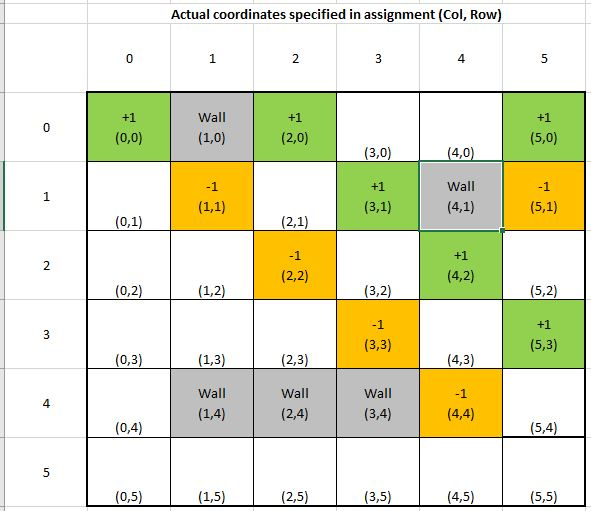

In [34]:
Image(filename = "coordinates_used_second_col,row.JPG", width = 600, height = 300)

In [35]:
iterations = int(len(hist)/36)
print(iterations)

hist_0_0 = []
hist_0_1 = []
hist_0_2 = []
hist_0_3 = [] 
hist_0_4 = [] 
hist_0_5 = [] 

hist_1_0 = []
hist_1_1 = [] 
hist_1_2 = []
hist_1_3 = [] 
hist_1_4 = [] 
hist_1_5 = [] 

hist_2_0 = []
hist_2_1 = []
hist_2_2 = []
hist_2_3 = []
hist_2_4 = []
hist_2_5 = []

hist_3_0 = []
hist_3_1 = []
hist_3_2 = []
hist_3_3 = []
hist_3_4 = []
hist_3_5 = []

hist_4_0 = []
hist_4_1 = []
hist_4_2 = []
hist_4_3 = []
hist_4_4 = []
hist_4_5 = []

hist_5_0 = []
hist_5_1 = []
hist_5_2 = []
hist_5_3 = []
hist_5_4 = []
hist_5_5 = []

#change coordinates
for i in range(iterations):
    hist_0_0.append(hist[0+i*36])
    hist_1_0.append(hist[1+i*36])
    hist_2_0.append(hist[2+i*36])
    hist_3_0.append(hist[3+i*36]) 
    hist_4_0.append(hist[4+i*36])
    hist_5_0.append(hist[5+i*36]) 

    hist_0_1.append(hist[6+i*36])
    hist_1_1.append(hist[7+i*36]) 
    hist_2_1.append(hist[8+i*36]) 
    hist_3_1.append(hist[9+i*36]) 
    hist_4_1.append(hist[10+i*36]) 
    hist_5_1.append(hist[11+i*36]) 
    
    hist_0_2.append(hist[12+i*36])
    hist_1_2.append(hist[13+i*36]) 
    hist_2_2.append(hist[14+i*36])
    hist_3_2.append(hist[15+i*36])
    hist_4_2.append(hist[16+i*36])
    hist_5_2.append(hist[17+i*36])
    
    hist_0_3.append(hist[18+i*36])
    hist_1_3.append(hist[19+i*36]) 
    hist_2_3.append(hist[20+i*36])
    hist_3_3.append(hist[21+i*36])
    hist_4_3.append(hist[22+i*36])
    hist_5_3.append(hist[23+i*36])
    
    hist_0_4.append(hist[24+i*36])
    hist_1_4.append(hist[25+i*36]) 
    hist_2_4.append(hist[26+i*36])
    hist_3_4.append(hist[27+i*36])
    hist_4_4.append(hist[28+i*36])
    hist_5_4.append(hist[29+i*36])
    
    hist_0_5.append(hist[30+i*36])
    hist_1_5.append(hist[31+i*36]) 
    hist_2_5.append(hist[32+i*36])
    hist_3_5.append(hist[33+i*36])
    hist_4_5.append(hist[34+i*36])
    hist_5_5.append(hist[35+i*36])

1181


In [36]:
list_of_tuples = [str((i,j)) for i in range(6) for j in range (6)]
print(list_of_tuples)

['(0, 0)', '(0, 1)', '(0, 2)', '(0, 3)', '(0, 4)', '(0, 5)', '(1, 0)', '(1, 1)', '(1, 2)', '(1, 3)', '(1, 4)', '(1, 5)', '(2, 0)', '(2, 1)', '(2, 2)', '(2, 3)', '(2, 4)', '(2, 5)', '(3, 0)', '(3, 1)', '(3, 2)', '(3, 3)', '(3, 4)', '(3, 5)', '(4, 0)', '(4, 1)', '(4, 2)', '(4, 3)', '(4, 4)', '(4, 5)', '(5, 0)', '(5, 1)', '(5, 2)', '(5, 3)', '(5, 4)', '(5, 5)']


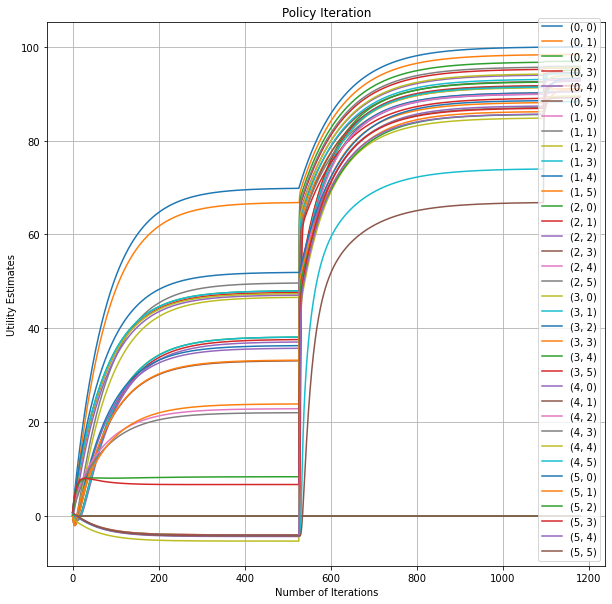

In [37]:
from matplotlib.pyplot import figure
x = [i for i in range(iterations)]

fig, ax = plt.subplots()
ax.plot(x, hist_0_0)
ax.plot(x, hist_0_1)
ax.plot(x, hist_0_2)
ax.plot(x, hist_0_3)
ax.plot(x, hist_0_4)
ax.plot(x, hist_0_5)

ax.plot(x, hist_1_0)
ax.plot(x, hist_1_1)
ax.plot(x, hist_1_2)
ax.plot(x, hist_1_3)
ax.plot(x, hist_1_4)
ax.plot(x, hist_1_5)

ax.plot(x, hist_2_0)
ax.plot(x, hist_2_1)
ax.plot(x, hist_2_2)
ax.plot(x, hist_2_3)
ax.plot(x, hist_2_4)
ax.plot(x, hist_2_5)

ax.plot(x, hist_3_0)
ax.plot(x, hist_3_1)
ax.plot(x, hist_3_2)
ax.plot(x, hist_3_3)
ax.plot(x, hist_3_4)
ax.plot(x, hist_3_5)

ax.plot(x, hist_4_0)
ax.plot(x, hist_4_1)
ax.plot(x, hist_4_2)
ax.plot(x, hist_4_3)
ax.plot(x, hist_4_4)
ax.plot(x, hist_4_5)

ax.plot(x, hist_5_0)
ax.plot(x, hist_5_1)
ax.plot(x, hist_5_2)
ax.plot(x, hist_5_3)
ax.plot(x, hist_5_4)
ax.plot(x, hist_5_5)

plt.legend(list_of_tuples, loc ="lower right")

plt.rcParams["figure.figsize"]=10,10

ax.set(xlabel='Number of Iterations', ylabel='Utility Estimates', title='Policy Iteration')
ax.grid()

fig.savefig("test.png")
plt.show()

# Printing column by column for a better view

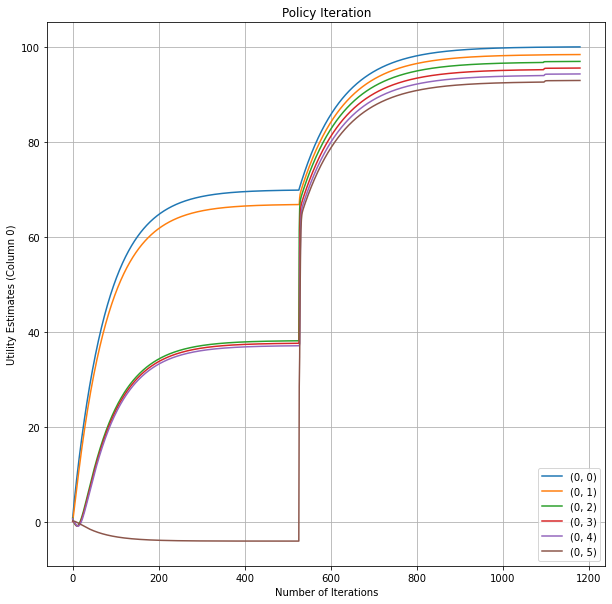

In [38]:
#Column 0

fig, ax = plt.subplots()
ax.plot(x, hist_0_0)
ax.plot(x, hist_0_1)
ax.plot(x, hist_0_2)
ax.plot(x, hist_0_3)
ax.plot(x, hist_0_4)
ax.plot(x, hist_0_5)

plt.legend(list_of_tuples, loc ="lower right")

ax.set(xlabel='Number of Iterations', ylabel='Utility Estimates (Column 0)', title='Policy Iteration')
ax.grid()

fig.savefig("test.png")
plt.show()

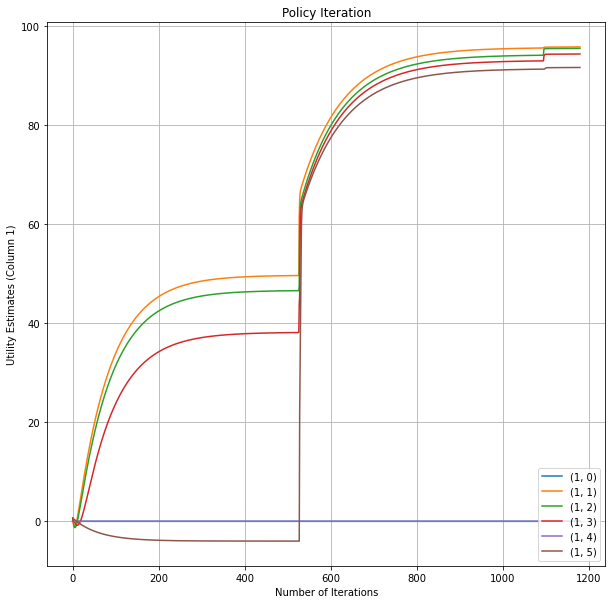

In [39]:
#Column 1

fig, ax = plt.subplots()
ax.plot(x, hist_1_0)
ax.plot(x, hist_1_1)
ax.plot(x, hist_1_2)
ax.plot(x, hist_1_3)
ax.plot(x, hist_1_4)
ax.plot(x, hist_1_5)

plt.legend(list_of_tuples[6:12], loc ="lower right")

ax.set(xlabel='Number of Iterations', ylabel='Utility Estimates (Column 1)', title='Policy Iteration')
ax.grid()

fig.savefig("test.png")
plt.show()

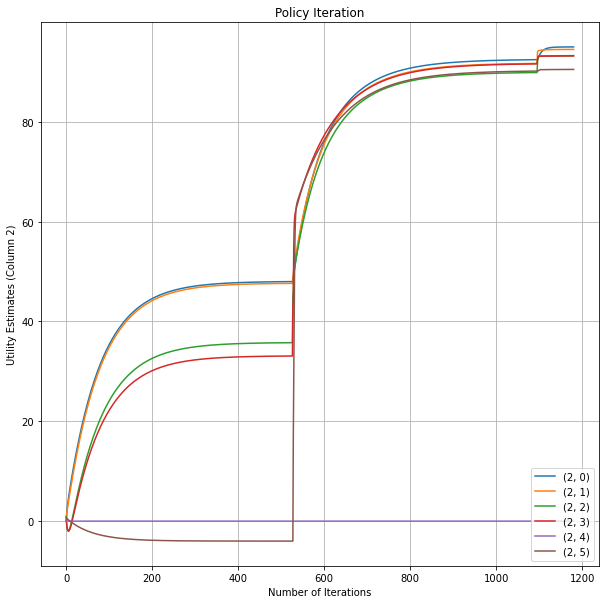

In [40]:
#Column 2

fig, ax = plt.subplots()
ax.plot(x, hist_2_0)
ax.plot(x, hist_2_1)
ax.plot(x, hist_2_2)
ax.plot(x, hist_2_3)
ax.plot(x, hist_2_4)
ax.plot(x, hist_2_5)

plt.legend(list_of_tuples[12:18], loc ="lower right")

ax.set(xlabel='Number of Iterations', ylabel='Utility Estimates (Column 2)', title='Policy Iteration')
ax.grid()

fig.savefig("test.png")
plt.show()

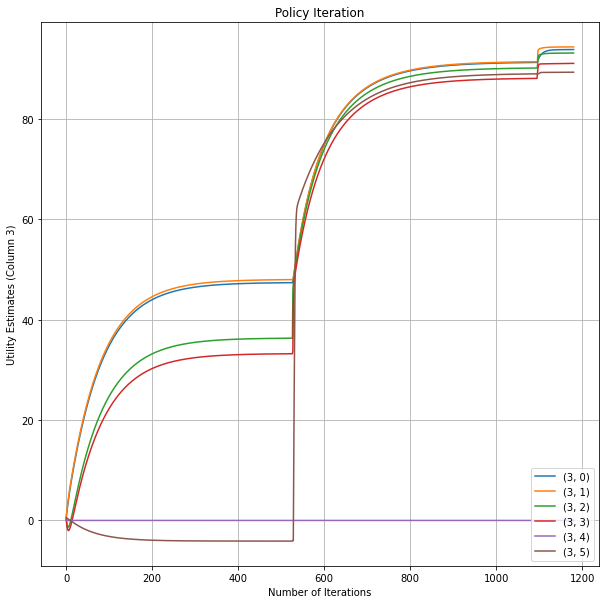

In [41]:
#Column 3

fig, ax = plt.subplots()
ax.plot(x, hist_3_0)
ax.plot(x, hist_3_1)
ax.plot(x, hist_3_2)
ax.plot(x, hist_3_3)
ax.plot(x, hist_3_4)
ax.plot(x, hist_3_5)

plt.legend(list_of_tuples[18:24], loc ="lower right")

ax.set(xlabel='Number of Iterations', ylabel='Utility Estimates (Column 3)', title='Policy Iteration')
ax.grid()

fig.savefig("test.png")
plt.show()

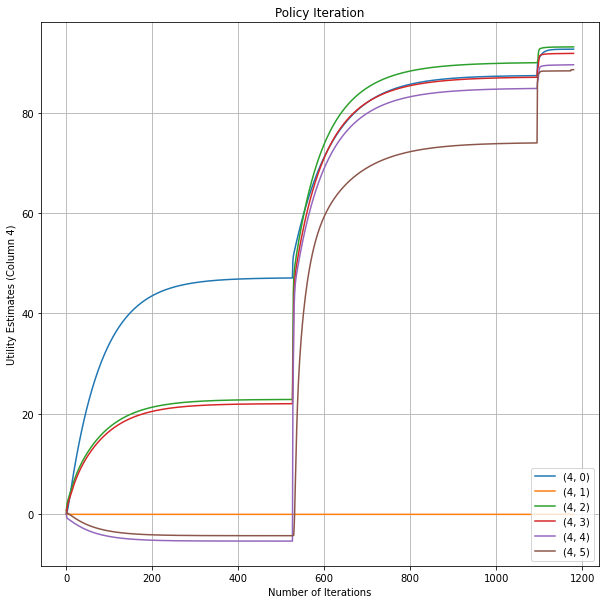

In [42]:
#Column 4

fig, ax = plt.subplots()
ax.plot(x, hist_4_0)
ax.plot(x, hist_4_1)
ax.plot(x, hist_4_2)
ax.plot(x, hist_4_3)
ax.plot(x, hist_4_4)
ax.plot(x, hist_4_5)

plt.legend(list_of_tuples[24:30], loc ="lower right")

ax.set(xlabel='Number of Iterations', ylabel='Utility Estimates (Column 4)', title='Policy Iteration')
ax.grid()

fig.savefig("test.png")
plt.show()

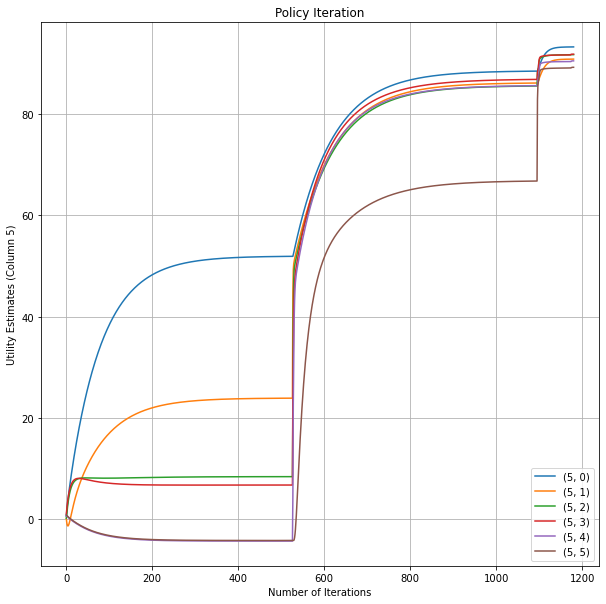

In [43]:
#Column 5

fig, ax = plt.subplots()
ax.plot(x, hist_5_0)
ax.plot(x, hist_5_1)
ax.plot(x, hist_5_2)
ax.plot(x, hist_5_3)
ax.plot(x, hist_5_4)
ax.plot(x, hist_5_5)

plt.legend(list_of_tuples[30:36], loc ="lower right")

ax.set(xlabel='Number of Iterations', ylabel='Utility Estimates (Column 5)', title='Policy Iteration')
ax.grid()

fig.savefig("test.png")
plt.show()

# Section 1: Value Iteration

### Please note that (row,col) format is used at first

In [6]:
#value iteration
import numpy as np
import matplotlib.pyplot as plt

SMALL_ENOUGH = 10e-4
GAMMA = 0.99
ALL_POSSIBLE_ACTIONS = ('U', 'D', 'L', 'R')


if __name__ == '__main__':
    grid = negative_grid()

    
    #print rewards
    print("rewards:")
    print_values(grid.rewards, grid)
    
    
    #we will randomly choose an action and update as we learn
    policy = {}
    for s in grid.actions.keys():
        policy[s] = np.random.choice(ALL_POSSIBLE_ACTIONS)
    
    
    #initial policy
    print("initial policy:")
    print_policy(policy, grid)
    
    hist = []
    
    #initialize V(s)
    V = {}
    states = grid.all_states()
    for s in states:
        if s in grid.actions:
            V[s] = 0
            #V[s] = np.random.random()
        else:
            V[s] = 0

    
    #repeat until convergenece
    ind = 0
    while True:
        ind = ind + 1
        print('#######' + ' iteration: ' + str(ind) + ' ######')
        
        biggest_change = 0
        for s in states: 
            old_v = V[s]
            
            if s in policy: 
                new_v = float('-inf')
                for a in ALL_POSSIBLE_ACTIONS:
                    
                    grid.set_state(s)
                    #r = grid.move(a) #move only when legal / possible. Returns reward. 
                    r = grid.rewards.get(grid.current_state(), 0)
                    
                    
                    _ = grid.move(a)
                    v_correct = V[grid.current_state()]
                    
                    grid.set_state(s)
                    if a == 'U':
                        r_clockwise = grid.move('R')
                        v_clockwise = V[grid.current_state()]
                        grid.set_state(s)
                        r_anticlockwise = grid.move('L')
                    elif a == 'R':
                        r_clockwise = grid.move('D')
                        v_clockwise = V[grid.current_state()]
                        grid.set_state(s)
                        r_anticlockwise = grid.move('U')
                    elif a == 'D':
                        r_clockwise = grid.move('L')
                        v_clockwise = V[grid.current_state()]
                        grid.set_state(s)
                        r_anticlockwise = grid.move('R')
                    elif a == 'L':
                        r_clockwise = grid.move('U')
                        v_clockwise = V[grid.current_state()]
                        grid.set_state(s)
                        r_anticlockwise = grid.move('D')
                        
                    v_anticlockwise = V[grid.current_state()]
                        
                        
                    v = r + GAMMA * (0.8*v_correct + 0.1*v_clockwise + 0.1*v_anticlockwise)
                    
                    if v > new_v:
                        new_v = v
                V[s] = new_v #update value if needed to
                biggest_change = max(biggest_change, np.abs(old_v - V[s]))
                
                
                print('Values:')
                print_values(V, grid)

                
        if biggest_change < SMALL_ENOUGH:
            break
            
            
    #find a policy that leads to optimal value function
    for s in policy.keys():
        best_a = None
        best_value = float('-inf')
        #loop through all possible actions to ind the best current action
        for a in ALL_POSSIBLE_ACTIONS:
            
            grid.set_state(s)
            r = grid.rewards.get(grid.current_state(), 0)
                    
                    
            _ = grid.move(a)
            v_correct = V[grid.current_state()]
                    
            grid.set_state(s)
            if a == 'U':
                r_clockwise = grid.move('R')
                v_clockwise = V[grid.current_state()]
                grid.set_state(s)
                r_anticlockwise = grid.move('L')
            elif a == 'R':
                r_clockwise = grid.move('D')
                v_clockwise = V[grid.current_state()]
                grid.set_state(s)
                r_anticlockwise = grid.move('U')
            elif a == 'D':
                r_clockwise = grid.move('L')
                v_clockwise = V[grid.current_state()]
                grid.set_state(s)
                r_anticlockwise = grid.move('R')
            elif a == 'L':
                r_clockwise = grid.move('U')
                v_clockwise = V[grid.current_state()]
                grid.set_state(s)
                r_anticlockwise = grid.move('D')
                        
            v_anticlockwise = V[grid.current_state()] 
                        
            v = r + GAMMA * (0.8*v_correct + 0.1*v_clockwise + 0.1*v_anticlockwise)
            
            
            if v > best_value:
                best_value = v
                best_a = a
        policy[s] = best_a
        
    print('#####################')
    print('final values:')
    print_values(V, grid)
    print('final policy:')
    print_policy(policy, grid)

rewards:
--------------------------
 1.00000|  0.00000|  1.00000| -0.04000| -0.04000|  1.00000| 
--------------------------
-0.04000| -1.00000| -0.04000|  1.00000|  0.00000| -1.00000| 
--------------------------
-0.04000| -0.04000| -1.00000| -0.04000|  1.00000| -0.04000| 
--------------------------
-0.04000| -0.04000| -0.04000| -1.00000| -0.04000|  1.00000| 
--------------------------
-0.04000|  0.00000|  0.00000|  0.00000| -1.00000| -0.04000| 
--------------------------
-0.04000| -0.04000| -0.04000| -0.04000| -0.04000| -0.04000| 
initial policy:
--------------------------
    L   |         |     D   |     L   |     L   |     L   | 
--------------------------
    R   |     D   |     D   |     L   |         |     R   | 
--------------------------
    R   |     U   |     D   |     U   |     D   |     U   | 
--------------------------
    U   |     L   |     U   |     U   |     R   |     L   | 
--------------------------
    D   |         |         |         |     D   |     D   | 
-------

-0.04396| -0.04000| -0.04000| -0.04831| -0.04396| -0.04000| 
Values:
--------------------------
 1.00000|  0.00000|  1.00000|  0.85100|  0.63399|  1.40312| 
--------------------------
 0.71933| -0.32997|  0.85100|  1.94746|  0.00000| -1.00000| 
--------------------------
 0.52575| -0.04000| -0.32997|  0.71933|  1.63371| -0.04000| 
--------------------------
 0.36737| -0.05115| -0.07267| -1.00000|  0.64642|  0.99169| 
--------------------------
-0.04000|  0.00000|  0.00000|  0.00000| -1.00000| -0.04396| 
--------------------------
-0.04396| -0.04000| -0.04000| -0.04831| -0.04396| -0.04000| 
Values:
--------------------------
 1.00000|  0.00000|  1.97525|  0.85100|  0.63399|  1.40312| 
--------------------------
 0.71933| -0.32997|  0.85100|  1.94746|  0.00000| -1.00000| 
--------------------------
 0.52575| -0.04000| -0.32997|  0.71933|  1.63371| -0.04000| 
--------------------------
 0.36737| -0.05115| -0.07267| -1.00000|  0.64642|  0.99169| 
--------------------------
-0.04000|  0.000

 0.36737|  0.29088|  0.26556| -0.37349|  1.76964|  2.15461| 
--------------------------
 0.24304|  0.00000|  0.00000|  0.00000| -0.59139|  0.68252| 
--------------------------
 0.14025| -0.07960| -0.08434| -0.09528| -0.08752| -0.07999| 
Values:
--------------------------
 1.99000|  0.00000|  1.97525|  1.80145|  1.51227|  2.39990| 
--------------------------
 1.64046|  0.33501|  1.68453|  2.88978|  0.00000| -0.08673| 
--------------------------
 1.34482|  0.33866|  0.43889|  1.70758|  2.69466|  1.25307| 
--------------------------
 1.09027|  0.29088|  0.26556| -0.37349|  1.76964|  2.15461| 
--------------------------
 0.24304|  0.00000|  0.00000|  0.00000| -0.59139|  0.68252| 
--------------------------
 0.14025| -0.07960| -0.08434| -0.09528| -0.08752| -0.07999| 
Values:
--------------------------
 1.99000|  0.00000|  2.93829|  1.80145|  1.51227|  2.39990| 
--------------------------
 1.64046|  0.33501|  1.68453|  2.88978|  0.00000| -0.08673| 
--------------------------
 1.34482|  0.338

 2.97010|  0.00000|  2.93829|  2.75156|  2.43866|  3.37974| 
--------------------------
 2.59402|  1.20504|  2.60638|  3.82329|  0.00000|  0.88355| 
--------------------------
 2.25522|  1.08706|  1.34092|  2.64823|  3.71459|  2.29889| 
--------------------------
 1.09027|  1.03835|  1.10564|  0.55389|  2.80912|  3.20922| 
--------------------------
 0.87161|  0.00000|  0.00000|  0.00000|  0.41057|  1.77466| 
--------------------------
 0.66968|  0.05532| -0.01289|  0.23836|  0.37529|  0.48397| 
Values:
--------------------------
 2.97010|  0.00000|  2.93829|  2.75156|  2.43866|  3.37974| 
--------------------------
 2.59402|  1.20504|  2.60638|  3.82329|  0.00000|  0.88355| 
--------------------------
 2.25522|  1.08706|  1.34092|  2.64823|  3.71459|  2.29889| 
--------------------------
 1.95687|  1.03835|  1.10564|  0.55389|  2.80912|  3.20922| 
--------------------------
 0.87161|  0.00000|  0.00000|  0.00000|  0.41057|  1.77466| 
--------------------------
 0.66968|  0.05532| -0.0

 1.68242|  0.00000|  0.00000|  0.00000|  1.44116|  2.82007| 
--------------------------
 1.40841|  0.50134|  0.35451|  1.02785|  1.28870|  1.45060| 
####### iteration: 5 ######
Values:
--------------------------
 3.94040|  0.00000|  3.89042|  3.69212|  3.36702|  4.34468| 
--------------------------
 3.54719|  2.11706|  3.53902|  4.74794|  0.00000|  1.85169| 
--------------------------
 3.18750|  1.96823|  2.25993|  3.57952|  4.69831|  3.30714| 
--------------------------
 1.95687|  1.91109|  2.00530|  1.54183|  3.80875|  4.21507| 
--------------------------
 1.68242|  0.00000|  0.00000|  0.00000|  1.44116|  2.82007| 
--------------------------
 1.40841|  0.50134|  0.35451|  1.02785|  1.28870|  1.45060| 
Values:
--------------------------
 3.94040|  0.00000|  3.89042|  3.69212|  3.36702|  4.34468| 
--------------------------
 3.54719|  2.11706|  3.53902|  4.74794|  0.00000|  1.85169| 
--------------------------
 3.18750|  1.96823|  2.25993|  3.57952|  4.69831|  3.30714| 
---------------

 2.56412|  0.00000|  0.00000|  0.00000|  2.43839|  3.81892| 
--------------------------
 2.24651|  1.17472|  0.35451|  1.02785|  2.28101|  2.46469| 
Values:
--------------------------
 4.90100|  0.00000|  4.83188|  4.62242|  4.28762|  4.34468| 
--------------------------
 3.54719|  3.03249|  4.46649|  4.74794|  0.00000|  2.80762| 
--------------------------
 3.18750|  2.88329|  3.17728|  3.57952|  4.69831|  4.28167| 
--------------------------
 2.86743|  1.91109|  2.91543|  2.52355|  3.80875|  4.21507| 
--------------------------
 2.56412|  0.00000|  0.00000|  0.00000|  2.43839|  3.81892| 
--------------------------
 2.24651|  1.17472|  0.96057|  1.02785|  2.28101|  2.46469| 
Values:
--------------------------
 4.90100|  0.00000|  4.83188|  4.62242|  4.28762|  5.29558| 
--------------------------
 3.54719|  3.03249|  4.46649|  4.74794|  0.00000|  2.80762| 
--------------------------
 3.18750|  2.88329|  3.17728|  3.57952|  4.69831|  4.28167| 
--------------------------
 2.86743|  1.911

 3.12239|  1.97183|  1.71189|  2.93066|  3.25831|  3.45441| 
Values:
--------------------------
 5.85199|  0.00000|  5.76283|  5.54247|  5.19858|  6.23302| 
--------------------------
 5.42979|  3.94155|  5.38506|  5.66349|  0.00000|  3.75001| 
--------------------------
 5.04458|  3.80161|  4.08683|  5.40942|  6.57279|  5.22606| 
--------------------------
 3.78527|  3.72376|  3.81967|  3.47587|  5.70691|  6.12496| 
--------------------------
 3.46563|  0.00000|  0.00000|  0.00000|  3.40001|  4.78155| 
--------------------------
 3.12239|  1.97183|  1.71189|  2.93066|  3.25831|  3.45441| 
####### iteration: 7 ######
Values:
--------------------------
 5.85199|  0.00000|  5.76283|  5.54247|  5.19858|  6.23302| 
--------------------------
 5.42979|  3.94155|  5.38506|  6.56972|  0.00000|  3.75001| 
--------------------------
 5.04458|  3.80161|  4.08683|  5.40942|  6.57279|  5.22606| 
--------------------------
 3.78527|  3.72376|  3.81967|  3.47587|  5.70691|  6.12496| 
---------------

--------------------------
 5.26337|  0.00000|  0.00000|  0.00000|  4.32985|  5.71300| 
--------------------------
 4.00774|  3.69316|  2.62004|  3.87077|  4.20517|  4.41154| 
Values:
--------------------------
 6.79347|  0.00000|  7.59368|  7.35215|  6.09958|  7.15748| 
--------------------------
 6.35730|  4.84165|  7.19270|  7.46646|  0.00000|  4.67906| 
--------------------------
 5.96110|  5.61843|  4.98697|  6.30764|  7.46976|  7.03592| 
--------------------------
 5.60428|  4.62547|  4.71389|  5.29713|  6.61253|  7.03683| 
--------------------------
 5.26337|  0.00000|  0.00000|  0.00000|  4.32985|  5.71300| 
--------------------------
 4.00774|  3.69316|  2.62004|  3.87077|  4.20517|  4.41154| 
Values:
--------------------------
 6.79347|  0.00000|  7.59368|  7.35215|  6.09958|  7.15748| 
--------------------------
 6.35730|  4.84165|  7.19270|  7.46646|  0.00000|  4.67906| 
--------------------------
 5.96110|  5.61843|  4.98697|  6.30764|  7.46976|  7.03592| 
----------------

 7.72553|  0.00000|  8.49383|  8.24198|  6.99062|  8.06939| 
--------------------------
 7.27548|  5.73216|  8.08160|  8.35358|  0.00000|  5.59518| 
--------------------------
 6.86855|  6.51373|  5.87730|  7.19479|  8.34395|  7.90689| 
--------------------------
 6.50107|  5.51874|  5.59716|  6.17181|  7.49383|  7.92477| 
--------------------------
 6.15100|  0.00000|  0.00000|  0.00000|  5.23136|  6.61666| 
--------------------------
 4.89098|  4.56490|  3.54441|  4.78281|  5.12171|  6.23588| 
Values:
--------------------------
 7.72553|  0.00000|  8.49383|  8.24198|  6.99062|  8.06939| 
--------------------------
 7.27548|  5.73216|  8.08160|  8.35358|  0.00000|  5.59518| 
--------------------------
 6.86855|  6.51373|  5.87730|  7.19479|  8.34395|  7.90689| 
--------------------------
 6.50107|  5.51874|  5.59716|  6.17181|  7.49383|  7.92477| 
--------------------------
 6.15100|  0.00000|  0.00000|  0.00000|  6.10807|  6.61666| 
--------------------------
 4.89098|  4.56490|  3.5

--------------------------
 5.76772|  5.43188|  4.44978|  5.66736|  6.01057|  6.23588| 
Values:
--------------------------
 8.64828|  0.00000|  9.38396|  9.12192|  7.87179|  8.96913| 
--------------------------
 8.18439|  6.61297|  8.96065|  9.23103|  0.00000|  6.49880| 
--------------------------
 7.76688|  7.39995|  6.75777|  8.07111|  9.20405|  8.76432| 
--------------------------
 7.38887|  6.40296|  6.46952|  6.17181|  8.36140|  8.80132| 
--------------------------
 7.02988|  0.00000|  0.00000|  0.00000|  6.10807|  7.49617| 
--------------------------
 5.76772|  5.43188|  4.44978|  5.66736|  6.01057|  6.23588| 
Values:
--------------------------
 8.64828|  0.00000|  9.38396|  9.12192|  7.87179|  8.96913| 
--------------------------
 8.18439|  6.61297|  8.96065|  9.23103|  0.00000|  6.49880| 
--------------------------
 7.76688|  7.39995|  6.75777|  8.07111|  9.20405|  8.76432| 
--------------------------
 7.38887|  6.40296|  6.46952|  7.03228|  8.36140|  8.80132| 
----------------

 8.65614|  8.27712|  7.62847|  8.93740|  10.05216|  9.60991| 
--------------------------
 8.26769|  7.27811|  7.33184|  7.03228|  9.21678|  9.66622| 
--------------------------
 7.89993|  0.00000|  0.00000|  0.00000|  6.96905|  8.36270| 
--------------------------
 6.63643|  6.29156|  5.32961|  6.52761|  6.87560|  7.10936| 
Values:
--------------------------
 9.56179|  0.00000|  10.26418|  9.99209|  8.74318|  9.85707| 
--------------------------
 9.08412|  7.48412|  9.82994|  10.09885|  0.00000|  7.39032| 
--------------------------
 8.65614|  8.27712|  7.62847|  8.93740|  10.05216|  9.60991| 
--------------------------
 8.26769|  7.27811|  7.33184|  7.03228|  9.21678|  9.66622| 
--------------------------
 7.89993|  0.00000|  0.00000|  0.00000|  6.96905|  8.36270| 
--------------------------
 6.63643|  6.29156|  5.32961|  6.52761|  6.87560|  7.10936| 
Values:
--------------------------
 9.56179|  0.00000|  10.26418|  9.99209|  8.74318|  9.85707| 
--------------------------
 9.08412|  

Values:
--------------------------
 10.46617|  0.00000|  11.13460|  10.85257|  9.60488|  10.73353| 
--------------------------
 9.97476|  8.34568|  9.82994|  10.95710|  0.00000|  8.27008| 
--------------------------
 9.53640|  9.14533|  8.48955|  9.79392|  10.88897|  10.44424| 
--------------------------
 9.13761|  8.14424|  8.18445|  7.88069|  10.06059|  10.51956| 
--------------------------
 8.76118|  0.00000|  0.00000|  0.00000|  7.81754|  9.21749| 
--------------------------
 7.49662|  7.14305|  6.18513|  7.37074|  7.72510|  7.96777| 
Values:
--------------------------
 10.46617|  0.00000|  11.13460|  10.85257|  9.60488|  10.73353| 
--------------------------
 9.97476|  8.34568|  10.68958|  10.95710|  0.00000|  8.27008| 
--------------------------
 9.53640|  9.14533|  8.48955|  9.79392|  10.88897|  10.44424| 
--------------------------
 9.13761|  8.14424|  8.18445|  7.88069|  10.06059|  10.51956| 
--------------------------
 8.76118|  0.00000|  0.00000|  0.00000|  7.81754|  9.21749

 9.61369|  0.00000|  0.00000|  0.00000|  9.48015|  10.06081| 
--------------------------
 9.19114|  7.98608|  7.02228|  8.20062|  8.56214|  9.64839| 
Values:
--------------------------
 11.36151|  0.00000|  11.99533|  11.70349|  11.29965|  11.59882| 
--------------------------
 10.85640|  10.04045|  11.53966|  11.80587|  0.00000|  9.99568| 
--------------------------
 10.40776|  10.00467|  10.18331|  10.64081|  11.71476|  11.26758| 
--------------------------
 9.99871|  9.00145|  9.86117|  9.54384|  10.89310|  11.36149| 
--------------------------
 9.61369|  0.00000|  0.00000|  0.00000|  9.48015|  10.06081| 
--------------------------
 9.19114|  7.98608|  7.02228|  8.20062|  8.56214|  9.64839| 
Values:
--------------------------
 12.24790|  0.00000|  11.99533|  11.70349|  11.29965|  11.59882| 
--------------------------
 10.85640|  10.04045|  11.53966|  11.80587|  0.00000|  9.99568| 
--------------------------
 10.40776|  10.00467|  10.18331|  10.64081|  11.71476|  11.26758| 
---------

 11.27030|  10.85521|  11.01620|  11.47816|  12.52991|  12.08029| 
--------------------------
 10.85108|  9.84982|  9.86117|  10.35907|  11.71451|  12.19218| 
--------------------------
 10.45757|  0.00000|  0.00000|  0.00000|  10.29482|  10.89286| 
--------------------------
 10.02556|  8.82062|  7.84531|  9.01879|  9.38771|  10.47172| 
Values:
--------------------------
 12.24790|  0.00000|  12.84649|  12.54494|  12.13292|  12.45322| 
--------------------------
 11.72912|  10.87387|  12.38030|  12.64523|  0.00000|  10.84209| 
--------------------------
 11.27030|  10.85521|  11.01620|  11.47816|  12.52991|  12.08029| 
--------------------------
 10.85108|  9.84982|  10.68551|  10.35907|  11.71451|  12.19218| 
--------------------------
 10.45757|  0.00000|  0.00000|  0.00000|  10.29482|  10.89286| 
--------------------------
 10.02556|  8.82062|  7.84531|  9.01879|  9.38771|  10.47172| 
Values:
--------------------------
 13.12542|  0.00000|  12.84649|  12.54494|  12.13292|  12.45322

 10.85152|  9.64672|  8.65625|  9.82584|  10.20217|  11.28404| 
Values:
--------------------------
 13.12542|  0.00000|  13.68817|  13.37703|  12.95693|  13.29698| 
--------------------------
 12.59303|  11.69811|  13.21160|  13.47528|  0.00000|  11.67794| 
--------------------------
 12.12410|  11.69706|  11.83989|  12.30609|  13.33794|  12.88519| 
--------------------------
 11.69480|  10.68945|  10.68551|  11.16366|  12.52501|  13.01182| 
--------------------------
 11.29288|  0.00000|  0.00000|  0.00000|  11.09866|  11.71379| 
--------------------------
 10.85152|  9.64672|  8.65625|  9.82584|  10.20217|  11.28404| 
Values:
--------------------------
 13.12542|  0.00000|  13.68817|  13.37703|  12.95693|  13.29698| 
--------------------------
 12.59303|  11.69811|  13.21160|  13.47528|  0.00000|  11.67794| 
--------------------------
 12.12410|  11.69706|  11.83989|  12.30609|  13.33794|  12.88519| 
--------------------------
 11.69480|  10.68945|  11.50065|  11.16366|  12.52501|  1

 12.96927|  12.53030|  12.65453|  13.12503|  14.13866|  13.68220| 
--------------------------
 12.52997|  11.52042|  12.30678|  11.95825|  13.32534|  13.82085| 
--------------------------
 12.11973|  0.00000|  0.00000|  0.00000|  11.89229|  13.32331| 
--------------------------
 11.66910|  10.46445|  10.24496|  10.62206|  11.79865|  12.08554| 
Values:
--------------------------
 14.85422|  0.00000|  14.52048|  14.19987|  13.77177|  14.95354| 
--------------------------
 13.44820|  12.51326|  14.03365|  14.29612|  0.00000|  12.50346| 
--------------------------
 12.96927|  12.53030|  12.65453|  13.12503|  14.13866|  13.68220| 
--------------------------
 12.52997|  11.52042|  12.30678|  11.95825|  13.32534|  13.82085| 
--------------------------
 12.11973|  0.00000|  0.00000|  0.00000|  11.89229|  13.32331| 
--------------------------
 11.66910|  10.46445|  10.24496|  10.62206|  11.79865|  12.08554| 
Values:
--------------------------
 14.85422|  0.00000|  14.52048|  14.19987|  13.77177

 15.13270|  13.31945|  14.84658|  15.10789|  0.00000|  13.31889| 
--------------------------
 13.80588|  13.35501|  13.46021|  14.73627|  14.93193|  14.47128| 
--------------------------
 13.35667|  12.34283|  13.10400|  12.74318|  14.11584|  15.40859| 
--------------------------
 12.93819|  0.00000|  0.00000|  0.00000|  12.67609|  14.11271| 
--------------------------
 12.47840|  11.27389|  11.02340|  11.40770|  12.58126|  12.87660| 
Values:
--------------------------
 15.70568|  0.00000|  15.34354|  15.01355|  14.57754|  15.76678| 
--------------------------
 15.13270|  13.31945|  14.84658|  15.10789|  0.00000|  13.31889| 
--------------------------
 13.80588|  13.35501|  13.46021|  14.73627|  14.93193|  14.47128| 
--------------------------
 13.35667|  12.34283|  13.10400|  12.74318|  14.11584|  15.40859| 
--------------------------
 12.93819|  0.00000|  0.00000|  0.00000|  12.67609|  14.11271| 
--------------------------
 12.47840|  11.27389|  11.02340|  12.18308|  12.58126|  12.87

 14.17498|  13.96234|  13.89244|  13.51873|  15.66847|  16.18793| 
--------------------------
 13.74835|  0.00000|  0.00000|  0.00000|  13.45035|  14.89234| 
--------------------------
 13.27949|  12.07512|  11.79164|  12.94858|  13.35395|  13.65760| 
Values:
--------------------------
 16.54862|  0.00000|  16.15743|  15.81819|  15.37436|  16.57026| 
--------------------------
 15.96221|  14.11676|  15.65047|  16.70460|  0.00000|  14.12443| 
--------------------------
 15.45379|  14.17130|  14.25702|  15.52875|  16.49570|  15.25239| 
--------------------------
 14.98500|  13.96234|  13.89244|  13.51873|  15.66847|  16.18793| 
--------------------------
 13.74835|  0.00000|  0.00000|  0.00000|  13.45035|  14.89234| 
--------------------------
 13.27949|  12.07512|  11.79164|  12.94858|  13.35395|  13.65760| 
Values:
--------------------------
 16.54862|  0.00000|  16.96227|  15.81819|  15.37436|  16.57026| 
--------------------------
 15.96221|  14.11676|  15.65047|  16.70460|  0.00000|

--------------------------
 17.38314|  0.00000|  17.75816|  16.61388|  16.16231|  17.36417| 
--------------------------
 16.78333|  14.90529|  16.44544|  17.48977|  0.00000|  14.92028| 
--------------------------
 16.26527|  15.77892|  15.04508|  16.31258|  17.26607|  16.02552| 
--------------------------
 15.78681|  14.75962|  14.67220|  14.28513|  16.43109|  16.95795| 
--------------------------
 14.55029|  0.00000|  0.00000|  0.00000|  14.21536|  15.66250| 
--------------------------
 14.07246|  12.86823|  12.55002|  13.70451|  14.11703|  14.42888| 
Values:
--------------------------
 17.38314|  0.00000|  17.75816|  16.61388|  16.16231|  17.36417| 
--------------------------
 16.78333|  14.90529|  16.44544|  17.48977|  0.00000|  14.92028| 
--------------------------
 16.26527|  15.77892|  15.04508|  16.31258|  17.26607|  16.02552| 
--------------------------
 15.78681|  14.75962|  14.67220|  14.28513|  16.43109|  16.95795| 
--------------------------
 14.55029|  0.00000|  0.00000|  

 17.06852|  15.77892|  15.82446|  17.08786|  18.02870|  16.79067| 
--------------------------
 16.58049|  15.54869|  15.44340|  15.04260|  17.18487|  17.71890| 
--------------------------
 15.34411|  0.00000|  0.00000|  0.00000|  14.97133|  16.42345| 
--------------------------
 14.85738|  13.65329|  13.29887|  14.45118|  14.87082|  15.19075| 
Values:
--------------------------
 18.20931|  0.00000|  18.54519|  17.40072|  16.94151|  18.14869| 
--------------------------
 17.59615|  15.68514|  17.23157|  18.26626|  0.00000|  15.70664| 
--------------------------
 17.06852|  16.57042|  15.82446|  17.08786|  18.02870|  16.79067| 
--------------------------
 16.58049|  15.54869|  15.44340|  15.04260|  17.18487|  17.71890| 
--------------------------
 15.34411|  0.00000|  0.00000|  0.00000|  14.97133|  16.42345| 
--------------------------
 14.85738|  13.65329|  13.29887|  14.45118|  14.87082|  15.19075| 
Values:
--------------------------
 18.20931|  0.00000|  18.54519|  17.40072|  16.94151

 19.02721|  0.00000|  19.32347|  18.17882|  17.71205|  18.92397| 
--------------------------
 18.40076|  16.45641|  18.00898|  19.03420|  0.00000|  16.48368| 
--------------------------
 17.86365|  16.57042|  16.59528|  17.85465|  18.78358|  17.54786| 
--------------------------
 17.36612|  16.32965|  16.20613|  15.79133|  17.92998|  18.47097| 
--------------------------
 16.12988|  0.00000|  0.00000|  0.00000|  15.71850|  17.17542| 
--------------------------
 15.63435|  14.43040|  14.03851|  15.18886|  15.61557|  15.94347| 
Values:
--------------------------
 19.02721|  0.00000|  19.32347|  18.17882|  17.71205|  18.92397| 
--------------------------
 18.40076|  16.45641|  18.00898|  19.03420|  0.00000|  16.48368| 
--------------------------
 17.86365|  17.35383|  16.59528|  17.85465|  18.78358|  17.54786| 
--------------------------
 17.36612|  16.32965|  16.20613|  15.79133|  17.92998|  18.47097| 
--------------------------
 16.12988|  0.00000|  0.00000|  0.00000|  15.71850|  17.175

 18.65074|  17.35383|  17.35763|  18.61306|  19.53070|  18.29710| 
--------------------------
 18.14379|  17.10257|  16.96049|  16.53150|  18.66660|  19.21437| 
--------------------------
 16.90768|  0.00000|  0.00000|  0.00000|  16.45704|  17.91862| 
--------------------------
 16.40345|  15.19963|  14.77773|  15.91779|  16.35151|  16.68728| 
Values:
--------------------------
 19.83694|  0.00000|  20.09309|  18.94828|  18.47402|  19.69019| 
--------------------------
 19.19723|  17.21920|  18.77776|  19.79366|  0.00000|  17.25155| 
--------------------------
 18.65074|  18.12924|  17.35763|  18.61306|  19.53070|  18.29710| 
--------------------------
 18.14379|  17.10257|  16.96049|  16.53150|  18.66660|  19.21437| 
--------------------------
 16.90768|  0.00000|  0.00000|  0.00000|  16.45704|  17.91862| 
--------------------------
 16.40345|  15.19963|  14.77773|  15.91779|  16.35151|  16.68728| 
Values:
--------------------------
 19.83694|  0.00000|  20.09309|  18.94828|  18.47402

 17.16474|  15.96106|  15.52715|  16.63818|  17.07886|  17.42239| 
Values:
--------------------------
 20.63857|  0.00000|  20.85415|  19.70918|  19.22753|  20.44748| 
--------------------------
 19.98566|  17.97359|  19.53800|  20.54474|  0.00000|  18.01044| 
--------------------------
 19.42986|  18.12924|  18.11158|  19.36316|  20.27007|  19.03844| 
--------------------------
 18.91358|  17.86760|  17.70712|  17.26863|  19.39488|  19.94926| 
--------------------------
 17.67760|  0.00000|  0.00000|  0.00000|  17.18714|  18.65325| 
--------------------------
 17.16474|  15.96106|  15.52715|  16.63818|  17.07886|  17.42239| 
Values:
--------------------------
 20.63857|  0.00000|  20.85415|  19.70918|  19.22753|  20.44748| 
--------------------------
 19.98566|  17.97359|  19.53800|  20.54474|  0.00000|  18.01044| 
--------------------------
 19.42986|  18.89673|  18.11158|  19.36316|  20.27007|  19.03844| 
--------------------------
 18.91358|  17.86760|  17.70712|  17.26863|  19.394

 18.43972|  0.00000|  0.00000|  0.00000|  17.90894|  19.37947| 
--------------------------
 17.91833|  16.71477|  16.27247|  17.35022|  17.79780|  18.14900| 
Values:
--------------------------
 21.43219|  0.00000|  20.85415|  20.46163|  19.97266|  21.19600| 
--------------------------
 20.76612|  18.71969|  20.28980|  20.54474|  0.00000|  18.76047| 
--------------------------
 20.20110|  18.89673|  18.85725|  20.10504|  20.27007|  19.77191| 
--------------------------
 18.91358|  18.62488|  18.44670|  18.00872|  20.11495|  20.67580| 
--------------------------
 18.43972|  0.00000|  0.00000|  0.00000|  17.90894|  19.37947| 
--------------------------
 17.91833|  16.71477|  16.27247|  17.35022|  17.79780|  18.14900| 
Values:
--------------------------
 21.43219|  0.00000|  20.85415|  20.46163|  19.97266|  21.19600| 
--------------------------
 20.76612|  18.71969|  20.28980|  20.54474|  0.00000|  18.76047| 
--------------------------
 20.20110|  18.89673|  18.85725|  20.10504|  21.00172|

 22.21786|  0.00000|  21.60675|  21.20571|  20.70951|  21.93588| 
--------------------------
 21.53869|  19.45757|  21.03326|  21.28753|  0.00000|  19.50181| 
--------------------------
 20.20110|  19.65638|  19.59472|  20.83877|  21.00172|  20.49755| 
--------------------------
 19.67558|  18.62488|  19.17822|  18.74079|  20.11495|  21.39413| 
--------------------------
 19.19412|  0.00000|  0.00000|  0.00000|  18.62260|  20.09743| 
--------------------------
 18.66428|  17.46084|  17.01093|  18.05407|  18.50850|  18.86727| 
Values:
--------------------------
 22.21786|  0.00000|  21.60675|  21.20571|  20.70951|  21.93588| 
--------------------------
 21.53869|  19.45757|  21.03326|  21.28753|  0.00000|  19.50181| 
--------------------------
 20.20110|  19.65638|  19.59472|  20.83877|  21.00172|  20.49755| 
--------------------------
 19.67558|  19.37438|  19.17822|  18.74079|  20.11495|  21.39413| 
--------------------------
 19.19412|  0.00000|  0.00000|  0.00000|  18.62260|  20.097

 20.42986|  19.37438|  19.90176|  19.46482|  20.82696|  21.39413| 
--------------------------
 19.94088|  0.00000|  0.00000|  0.00000|  19.32824|  20.80730| 
--------------------------
 19.40268|  18.19936|  17.74206|  18.05407|  19.21111|  19.57737| 
Values:
--------------------------
 22.99569|  0.00000|  22.35098|  21.94153|  21.43818|  22.66725| 
--------------------------
 21.53869|  20.18735|  21.76847|  22.02213|  0.00000|  20.23457| 
--------------------------
 20.96454|  20.40828|  20.32408|  20.83877|  21.72565|  21.21542| 
--------------------------
 20.42986|  19.37438|  19.90176|  19.46482|  20.82696|  21.39413| 
--------------------------
 19.94088|  0.00000|  0.00000|  0.00000|  19.32824|  20.80730| 
--------------------------
 19.40268|  18.19936|  17.74206|  18.05407|  19.21111|  19.57737| 
Values:
--------------------------
 22.99569|  0.00000|  22.35098|  21.94153|  21.43818|  22.66725| 
--------------------------
 21.53869|  20.18735|  21.76847|  22.02213|  0.00000|

 20.68008|  0.00000|  0.00000|  0.00000|  20.02599|  20.80730| 
--------------------------
 20.13360|  18.93040|  17.74206|  18.74991|  19.21111|  20.27944| 
Values:
--------------------------
 23.76573|  0.00000|  23.08694|  22.66918|  22.15875|  22.66725| 
--------------------------
 22.30346|  20.90909|  22.49551|  22.74862|  0.00000|  20.95890| 
--------------------------
 21.72025|  21.15249|  21.04542|  21.56445|  22.44192|  21.92556| 
--------------------------
 21.17650|  20.11618|  20.61739|  20.18089|  21.53102|  22.10440| 
--------------------------
 20.68008|  0.00000|  0.00000|  0.00000|  20.02599|  20.80730| 
--------------------------
 20.13360|  18.93040|  17.74206|  18.74991|  19.90579|  20.27944| 
Values:
--------------------------
 23.76573|  0.00000|  23.08694|  22.66918|  22.15875|  22.66725| 
--------------------------
 22.30346|  20.90909|  22.49551|  22.74862|  0.00000|  20.95890| 
--------------------------
 21.72025|  21.15249|  21.04542|  21.56445|  22.44192|

 24.52807|  0.00000|  23.81471|  23.38874|  22.87250|  23.39023| 
--------------------------
 23.06050|  21.62290|  23.21449|  23.46709|  0.00000|  21.67493| 
--------------------------
 22.46832|  21.88909|  21.75883|  22.28215|  23.15057|  22.62805| 
--------------------------
 21.91557|  20.85036|  21.32520|  20.88908|  22.22725|  22.80673| 
--------------------------
 21.41178|  0.00000|  0.00000|  0.00000|  20.71596|  21.50918| 
--------------------------
 20.85711|  19.65403|  18.46580|  19.43787|  20.59265|  20.97361| 
Values:
--------------------------
 24.52807|  0.00000|  23.81471|  23.38874|  22.87250|  23.39023| 
--------------------------
 23.06050|  21.62290|  23.21449|  23.46709|  0.00000|  21.67493| 
--------------------------
 22.46832|  21.88909|  21.75883|  22.28215|  23.15057|  22.62805| 
--------------------------
 21.91557|  20.85036|  21.32520|  20.88908|  22.22725|  22.80673| 
--------------------------
 21.41178|  0.00000|  0.00000|  0.00000|  20.71596|  22.203

 24.52807|  0.00000|  24.53439|  24.10031|  23.57997|  24.10507| 
--------------------------
 23.80989|  22.32885|  23.92549|  24.17762|  0.00000|  22.38285| 
--------------------------
 23.20882|  22.61817|  22.46439|  22.99196|  23.85163|  23.32293| 
--------------------------
 22.64715|  21.57700|  22.02528|  21.58949|  22.91576|  23.50122| 
--------------------------
 22.13607|  0.00000|  0.00000|  0.00000|  21.39828|  22.20322| 
--------------------------
 21.57329|  20.37033|  19.18222|  20.11808|  20.59265|  21.66001| 
Values:
--------------------------
 25.28279|  0.00000|  24.53439|  24.10031|  23.57997|  24.10507| 
--------------------------
 23.80989|  22.32885|  23.92549|  24.17762|  0.00000|  22.38285| 
--------------------------
 23.20882|  22.61817|  22.46439|  22.99196|  23.85163|  23.32293| 
--------------------------
 22.64715|  21.57700|  22.02528|  21.58949|  22.91576|  23.50122| 
--------------------------
 22.13607|  0.00000|  0.00000|  0.00000|  21.39828|  22.203

--------------------------
 25.28279|  0.00000|  25.24607|  24.80397|  23.57997|  24.81204| 
--------------------------
 24.55171|  22.32885|  24.62860|  24.88031|  0.00000|  23.08294| 
--------------------------
 23.94182|  23.33980|  23.16219|  23.69396|  24.54516|  24.01029| 
--------------------------
 23.37131|  22.29616|  22.02528|  22.28219|  23.59664|  24.18800| 
--------------------------
 22.85302|  0.00000|  0.00000|  0.00000|  22.07303|  22.88952| 
--------------------------
 22.28220|  21.07937|  19.89138|  20.79067|  21.27183|  22.33875| 
Values:
--------------------------
 25.28279|  0.00000|  25.24607|  24.80397|  24.27997|  24.81204| 
--------------------------
 24.55171|  22.32885|  24.62860|  24.88031|  0.00000|  23.08294| 
--------------------------
 23.94182|  23.33980|  23.16219|  23.69396|  24.54516|  24.01029| 
--------------------------
 23.37131|  22.29616|  22.02528|  22.28219|  23.59664|  24.18800| 
--------------------------
 22.85302|  0.00000|  0.00000|  

 24.66741|  24.05405|  23.16219|  24.38823|  25.23122|  24.69019| 
--------------------------
 24.08814|  23.00793|  22.71771|  22.96726|  24.27000|  24.86717| 
--------------------------
 23.56270|  0.00000|  0.00000|  0.00000|  22.74032|  23.56819| 
--------------------------
 22.28220|  21.78122|  20.59335|  21.45575|  21.94343|  23.00994| 
Values:
--------------------------
 26.02996|  0.00000|  25.94984|  25.49982|  24.27997|  25.51124| 
--------------------------
 25.28603|  23.02705|  25.32390|  25.57523|  0.00000|  23.77533| 
--------------------------
 24.66741|  24.05405|  23.16219|  24.38823|  25.23122|  24.69019| 
--------------------------
 24.08814|  23.00793|  22.71771|  22.96726|  24.27000|  24.86717| 
--------------------------
 23.56270|  0.00000|  0.00000|  0.00000|  22.74032|  23.56819| 
--------------------------
 22.28220|  21.78122|  20.59335|  21.45575|  21.94343|  23.00994| 
Values:
--------------------------
 26.02996|  0.00000|  25.94984|  25.49982|  24.27997

--------------------------
 26.76966|  0.00000|  26.64579|  25.49982|  24.97234|  26.20278| 
--------------------------
 26.01293|  23.71756|  25.32390|  26.26248|  0.00000|  23.77533| 
--------------------------
 25.38566|  24.76101|  23.85232|  25.07486|  25.90987|  24.69019| 
--------------------------
 24.79770|  23.71239|  23.40258|  22.96726|  24.93593|  25.53882| 
--------------------------
 23.56270|  0.00000|  0.00000|  0.00000|  22.74032|  24.23934| 
--------------------------
 22.98394|  22.47596|  21.28821|  22.11343|  22.60756|  23.00994| 
Values:
--------------------------
 26.76966|  0.00000|  26.64579|  25.49982|  24.97234|  26.20278| 
--------------------------
 26.01293|  23.71756|  25.32390|  26.26248|  0.00000|  23.77533| 
--------------------------
 25.38566|  24.76101|  23.85232|  25.07486|  25.90987|  25.36272| 
--------------------------
 24.79770|  23.71239|  23.40258|  22.96726|  24.93593|  25.53882| 
--------------------------
 23.56270|  0.00000|  0.00000|  

 26.73260|  24.40162|  26.01149|  26.26248|  0.00000|  24.46012| 
--------------------------
 26.09674|  24.76101|  24.53485|  25.75391|  25.90987|  25.36272| 
--------------------------
 24.79770|  24.40961|  24.07996|  23.64480|  25.59452|  26.20306| 
--------------------------
 24.26519|  0.00000|  0.00000|  0.00000|  23.40024|  24.90306| 
--------------------------
 23.67856|  22.47596|  21.97603|  22.76381|  23.26433|  23.67369| 
Values:
--------------------------
 27.50197|  0.00000|  26.64579|  26.18794|  25.65712|  26.88673| 
--------------------------
 26.73260|  24.40162|  26.01149|  26.26248|  0.00000|  24.46012| 
--------------------------
 26.09674|  24.76101|  24.53485|  25.75391|  26.58116|  25.36272| 
--------------------------
 24.79770|  24.40961|  24.07996|  23.64480|  25.59452|  26.20306| 
--------------------------
 24.26519|  0.00000|  0.00000|  0.00000|  23.40024|  24.90306| 
--------------------------
 23.67856|  22.47596|  21.97603|  22.76381|  23.26433|  23.67

--------------------------
 28.22695|  0.00000|  27.33401|  26.86841|  26.33440|  26.88673| 
--------------------------
 26.73260|  25.10861|  26.69156|  26.94213|  0.00000|  25.13739| 
--------------------------
 26.09674|  25.46093|  25.20999|  25.75391|  26.58116|  26.02793| 
--------------------------
 25.50014|  24.40961|  24.75003|  24.31487|  25.59452|  26.20306| 
--------------------------
 24.96062|  0.00000|  0.00000|  0.00000|  24.05289|  24.90306| 
--------------------------
 24.36619|  23.16366|  21.97603|  22.76381|  23.91384|  24.33009| 
Values:
--------------------------
 28.22695|  0.00000|  27.33401|  26.86841|  26.33440|  26.88673| 
--------------------------
 26.73260|  25.10861|  26.69156|  26.94213|  0.00000|  25.13739| 
--------------------------
 26.09674|  25.46093|  25.20999|  25.75391|  26.58116|  26.02793| 
--------------------------
 25.50014|  24.40961|  24.75003|  24.31487|  25.59452|  26.20306| 
--------------------------
 24.96062|  0.00000|  0.00000|  

--------------------------
 27.44802|  25.81429|  27.36711|  27.61426|  0.00000|  25.80725| 
--------------------------
 26.80304|  26.15864|  25.88058|  26.42549|  27.24517|  26.68591| 
--------------------------
 26.19741|  25.09982|  25.41508|  24.97758|  26.24587|  26.85997| 
--------------------------
 25.65055|  0.00000|  0.00000|  0.00000|  24.69835|  25.55946| 
--------------------------
 25.04808|  23.84443|  22.65687|  23.40699|  23.91384|  24.97924| 
Values:
--------------------------
 28.94468|  0.00000|  28.01457|  27.54133|  27.00425|  27.56318| 
--------------------------
 27.44802|  25.81429|  27.36711|  27.61426|  0.00000|  25.80725| 
--------------------------
 26.80304|  26.15864|  25.88058|  26.42549|  27.24517|  26.68591| 
--------------------------
 26.19741|  25.09982|  25.41508|  24.97758|  26.24587|  26.85997| 
--------------------------
 25.65055|  0.00000|  0.00000|  0.00000|  24.69835|  25.55946| 
--------------------------
 25.04808|  23.84443|  22.65687|  

 25.04808|  24.51928|  23.33085|  24.04307|  24.55616|  25.62123| 
Values:
--------------------------
 28.94468|  0.00000|  28.68758|  28.20677|  27.00425|  28.23222| 
--------------------------
 28.15715|  25.81429|  28.03579|  28.27899|  0.00000|  25.80725| 
--------------------------
 27.50367|  26.85146|  25.88058|  27.08994|  27.90198|  27.33674| 
--------------------------
 26.88939|  25.78728|  25.41508|  25.63344|  26.89006|  27.50966| 
--------------------------
 26.33521|  0.00000|  0.00000|  0.00000|  25.33672|  26.20862| 
--------------------------
 25.04808|  24.51928|  23.33085|  24.04307|  24.55616|  25.62123| 
Values:
--------------------------
 28.94468|  0.00000|  28.68758|  28.20677|  27.00425|  28.23222| 
--------------------------
 28.15715|  25.81429|  28.03579|  28.27899|  0.00000|  26.46975| 
--------------------------
 27.50367|  26.85146|  25.88058|  27.08994|  27.90198|  27.33674| 
--------------------------
 26.88939|  25.78728|  25.41508|  25.63344|  26.890

 28.85942|  26.51438|  28.03579|  28.93640|  0.00000|  26.46975| 
--------------------------
 28.19782|  27.53810|  26.54455|  27.74717|  28.55168|  27.98050| 
--------------------------
 27.57523|  26.46973|  26.07393|  25.63344|  27.52717|  28.15220| 
--------------------------
 26.33521|  0.00000|  0.00000|  0.00000|  25.33672|  26.85064| 
--------------------------
 25.72465|  25.18874|  23.99878|  24.67213|  25.19141|  25.62123| 
Values:
--------------------------
 29.65523|  0.00000|  29.35310|  28.86483|  27.66676|  28.89392| 
--------------------------
 28.85942|  26.51438|  28.03579|  28.93640|  0.00000|  26.46975| 
--------------------------
 28.19782|  27.53810|  26.54455|  27.74717|  28.55168|  27.98050| 
--------------------------
 27.57523|  26.46973|  26.07393|  25.63344|  27.52717|  28.15220| 
--------------------------
 27.01395|  0.00000|  0.00000|  0.00000|  25.33672|  26.85064| 
--------------------------
 25.72465|  25.18874|  23.99878|  24.67213|  25.19141|  25.62

 26.39548|  25.18874|  24.66124|  24.67213|  25.81966|  26.25616| 
Values:
--------------------------
 30.35868|  0.00000|  29.35310|  28.86483|  28.32200|  29.54836| 
--------------------------
 29.55473|  27.20786|  28.69728|  28.93640|  0.00000|  27.12499| 
--------------------------
 28.19782|  27.53810|  27.20149|  28.39719|  28.55168|  27.98050| 
--------------------------
 27.57523|  26.46973|  26.72603|  26.28226|  27.52717|  28.78769| 
--------------------------
 27.01395|  0.00000|  0.00000|  0.00000|  25.96807|  27.48559| 
--------------------------
 26.39548|  25.18874|  24.66124|  25.29425|  25.81966|  26.25616| 
Values:
--------------------------
 30.35868|  0.00000|  29.35310|  28.86483|  28.32200|  29.54836| 
--------------------------
 29.55473|  27.20786|  28.69728|  28.93640|  0.00000|  27.12499| 
--------------------------
 28.19782|  27.53810|  27.20149|  28.39719|  28.55168|  27.98050| 
--------------------------
 27.57523|  27.14636|  26.72603|  26.28226|  27.527

 29.55473|  27.89452|  29.35154|  29.58657|  0.00000|  27.77305| 
--------------------------
 28.88521|  28.21815|  27.85134|  28.39719|  29.19432|  28.61726| 
--------------------------
 28.25452|  27.14636|  27.37123|  26.92402|  28.15730|  28.78769| 
--------------------------
 27.68634|  0.00000|  0.00000|  0.00000|  26.59250|  28.11358| 
--------------------------
 27.06014|  25.85259|  25.31818|  25.29425|  26.44101|  26.88410| 
Values:
--------------------------
 31.05509|  0.00000|  30.01123|  29.51558|  28.97005|  30.19562| 
--------------------------
 29.55473|  27.89452|  29.35154|  29.58657|  0.00000|  27.77305| 
--------------------------
 28.88521|  28.21815|  27.85134|  28.39719|  29.19432|  28.61726| 
--------------------------
 28.25452|  27.14636|  27.37123|  26.92402|  28.15730|  28.78769| 
--------------------------
 27.68634|  0.00000|  0.00000|  0.00000|  26.59250|  28.11358| 
--------------------------
 27.06014|  25.85259|  25.31818|  25.29425|  26.44101|  26.88

 28.92734|  27.81867|  28.00974|  27.55877|  28.78052|  29.41620| 
--------------------------
 28.35235|  0.00000|  0.00000|  0.00000|  27.21008|  28.11358| 
--------------------------
 27.71855|  26.51044|  25.31818|  25.90954|  27.05553|  27.50514| 
Values:
--------------------------
 31.74454|  0.00000|  30.66205|  30.15911|  29.61100|  30.19562| 
--------------------------
 30.24311|  28.57438|  29.99863|  30.22957|  0.00000|  28.41400| 
--------------------------
 29.56577|  28.89170|  28.49416|  29.04008|  29.82998|  29.24708| 
--------------------------
 28.92734|  27.81867|  28.00974|  27.55877|  28.78052|  29.41620| 
--------------------------
 28.35235|  0.00000|  0.00000|  0.00000|  27.21008|  28.73467| 
--------------------------
 27.71855|  26.51044|  25.31818|  25.90954|  27.05553|  27.50514| 
Values:
--------------------------
 31.74454|  0.00000|  30.66205|  30.15911|  29.61100|  30.19562| 
--------------------------
 30.24311|  28.57438|  29.99863|  30.22957|  0.00000|

 29.59355|  28.48478|  28.64142|  28.18658|  29.39692|  30.03782| 
--------------------------
 29.01185|  0.00000|  0.00000|  0.00000|  27.82089|  29.34896| 
--------------------------
 28.37058|  27.16216|  26.61434|  26.51807|  27.66330|  28.11937| 
Values:
--------------------------
 32.42710|  0.00000|  31.30564|  30.79550|  30.24492|  31.46893| 
--------------------------
 30.92461|  29.24745|  30.63861|  30.86549|  0.00000|  29.04791| 
--------------------------
 30.23958|  29.55860|  29.13000|  29.67591|  30.45872|  29.87004| 
--------------------------
 29.59355|  28.48478|  28.64142|  28.18658|  29.39692|  30.03782| 
--------------------------
 29.01185|  0.00000|  0.00000|  0.00000|  27.82089|  29.34896| 
--------------------------
 28.37058|  27.16216|  26.61434|  26.51807|  27.66330|  28.11937| 
Values:
--------------------------
 32.42710|  0.00000|  31.30564|  30.79550|  30.24492|  31.46893| 
--------------------------
 30.92461|  29.24745|  30.63861|  30.86549|  0.00000|

Values:
--------------------------
 32.42710|  0.00000|  31.94208|  31.42482|  30.87189|  31.46893| 
--------------------------
 31.59929|  29.91381|  31.27157|  31.49439|  0.00000|  29.67488| 
--------------------------
 30.90666|  30.21887|  29.75892|  30.30475|  31.08061|  30.48620| 
--------------------------
 30.25313|  29.14438|  29.26630|  28.80751|  30.00657|  30.65264| 
--------------------------
 29.66483|  0.00000|  0.00000|  0.00000|  28.42502|  29.34896| 
--------------------------
 29.01618|  27.80760|  26.61434|  27.11991|  27.66330|  28.72686| 
Values:
--------------------------
 33.10282|  0.00000|  31.94208|  31.42482|  30.87189|  31.46893| 
--------------------------
 31.59929|  29.91381|  31.27157|  31.49439|  0.00000|  29.67488| 
--------------------------
 30.90666|  30.21887|  29.75892|  30.30475|  31.08061|  30.48620| 
--------------------------
 30.25313|  29.14438|  29.26630|  28.80751|  30.00657|  30.65264| 
--------------------------
 29.66483|  0.00000|  0.

--------------------------
 31.56708|  30.87254|  29.75892|  30.92667|  31.69572|  31.09563| 
--------------------------
 30.90613|  29.79744|  29.26630|  29.42163|  30.60954|  31.26072| 
--------------------------
 30.31129|  0.00000|  0.00000|  0.00000|  29.02253|  29.95651| 
--------------------------
 29.65537|  28.44672|  27.25326|  27.71516|  28.26442|  29.32769| 
Values:
--------------------------
 33.10282|  0.00000|  32.57145|  32.04716|  30.87189|  32.09514| 
--------------------------
 32.26723|  29.91381|  31.89757|  32.11636|  0.00000|  30.29498| 
--------------------------
 31.56708|  30.87254|  30.38100|  30.92667|  31.69572|  31.09563| 
--------------------------
 30.90613|  29.79744|  29.26630|  29.42163|  30.60954|  31.26072| 
--------------------------
 30.31129|  0.00000|  0.00000|  0.00000|  29.02253|  29.95651| 
--------------------------
 29.65537|  28.44672|  27.25326|  27.71516|  28.26442|  29.32769| 
Values:
--------------------------
 33.10282|  0.00000|  32.

 31.55261|  30.44398|  30.49590|  30.02901|  31.20592|  31.86214| 
--------------------------
 30.95130|  0.00000|  0.00000|  0.00000|  29.61350|  31.15173| 
--------------------------
 30.28818|  29.07950|  28.51239|  28.30388|  29.44695|  29.92195| 
Values:
--------------------------
 34.43408|  0.00000|  33.19383|  32.66260|  32.10528|  33.32702| 
--------------------------
 32.92849|  31.22659|  32.51670|  32.73146|  0.00000|  30.90827| 
--------------------------
 32.22089|  31.51968|  30.99631|  31.54175|  32.30411|  31.69841| 
--------------------------
 31.55261|  30.44398|  30.49590|  30.02901|  31.20592|  31.86214| 
--------------------------
 30.95130|  0.00000|  0.00000|  0.00000|  29.61350|  31.15173| 
--------------------------
 30.28818|  29.07950|  28.51239|  28.30388|  29.44695|  29.92195| 
Values:
--------------------------
 34.43408|  0.00000|  33.19383|  32.66260|  32.10528|  33.32702| 
--------------------------
 32.92849|  31.22659|  32.51670|  32.73146|  0.00000|

 34.43408|  0.00000|  33.80930|  33.27120|  32.10528|  33.32702| 
--------------------------
 33.58314|  31.22659|  33.12903|  33.33977|  0.00000|  30.90827| 
--------------------------
 32.86817|  32.16034|  30.99631|  32.15006|  32.90585|  32.29459| 
--------------------------
 32.19262|  31.08407|  30.49590|  30.62972|  31.79577|  32.45698| 
--------------------------
 31.58491|  0.00000|  0.00000|  0.00000|  29.61350|  31.15173| 
--------------------------
 30.28818|  29.70598|  28.51239|  28.88616|  29.44695|  29.92195| 
Values:
--------------------------
 34.43408|  0.00000|  33.80930|  33.27120|  32.10528|  33.32702| 
--------------------------
 33.58314|  31.22659|  33.12903|  33.33977|  0.00000|  30.90827| 
--------------------------
 32.86817|  32.16034|  30.99631|  32.15006|  32.90585|  32.29459| 
--------------------------
 32.19262|  31.08407|  30.49590|  30.62972|  31.79577|  32.45698| 
--------------------------
 31.58491|  0.00000|  0.00000|  0.00000|  29.61350|  31.151

 34.23125|  31.87316|  33.12903|  33.94136|  0.00000|  31.51484| 
--------------------------
 33.50897|  32.79460|  31.60493|  32.75166|  33.50101|  32.29459| 
--------------------------
 32.82623|  31.71775|  31.10077|  30.62972|  32.37916|  33.04531| 
--------------------------
 31.58491|  0.00000|  0.00000|  0.00000|  30.19801|  31.73955| 
--------------------------
 30.91467|  30.32620|  29.13259|  29.46205|  30.02853|  30.50969| 
Values:
--------------------------
 35.08974|  0.00000|  34.41793|  33.27120|  32.71184|  33.93285| 
--------------------------
 34.23125|  31.87316|  33.12903|  33.94136|  0.00000|  31.51484| 
--------------------------
 33.50897|  32.79460|  31.60493|  32.75166|  33.50101|  32.88426| 
--------------------------
 32.82623|  31.71775|  31.10077|  30.62972|  32.37916|  33.04531| 
--------------------------
 31.58491|  0.00000|  0.00000|  0.00000|  30.19801|  31.73955| 
--------------------------
 30.91467|  30.32620|  29.13259|  29.46205|  30.02853|  30.50

 33.45351|  32.34510|  31.69909|  31.81141|  32.95618|  33.62720| 
--------------------------
 32.83319|  0.00000|  0.00000|  0.00000|  31.34790|  32.32093| 
--------------------------
 32.14892|  30.94023|  29.74661|  30.03165|  30.60374|  31.66596| 
Values:
--------------------------
 35.73884|  0.00000|  35.01981|  34.46822|  33.31176|  34.53203| 
--------------------------
 34.87287|  32.51325|  34.33360|  34.53630|  0.00000|  32.70809| 
--------------------------
 34.14336|  33.42252|  32.80236|  33.34664|  34.08966|  33.46746| 
--------------------------
 33.45351|  32.34510|  31.69909|  31.81141|  32.95618|  33.62720| 
--------------------------
 32.83319|  0.00000|  0.00000|  0.00000|  31.34790|  32.32093| 
--------------------------
 32.14892|  30.94023|  29.74661|  30.03165|  30.60374|  31.66596| 
Values:
--------------------------
 35.73884|  0.00000|  35.01981|  34.46822|  33.90510|  34.53203| 
--------------------------
 34.87287|  32.51325|  34.33360|  34.53630|  0.00000|

 36.38145|  0.00000|  35.61501|  35.05678|  33.90510|  35.12464| 
--------------------------
 35.50807|  33.14695|  34.92598|  35.12468|  0.00000|  33.29492| 
--------------------------
 34.77142|  34.04416|  32.80236|  33.93506|  34.67186|  34.04428| 
--------------------------
 34.07451|  32.96617|  32.29096|  32.39254|  33.52687|  34.20272| 
--------------------------
 33.44798|  0.00000|  0.00000|  0.00000|  31.91342|  32.89595| 
--------------------------
 32.75681|  31.54811|  30.35449|  30.59501|  31.17265|  32.23462| 
Values:
--------------------------
 36.38145|  0.00000|  35.61501|  35.05678|  33.90510|  35.12464| 
--------------------------
 35.50807|  33.14695|  34.92598|  35.12468|  0.00000|  33.29492| 
--------------------------
 34.77142|  34.04416|  33.39132|  33.93506|  34.67186|  34.04428| 
--------------------------
 34.07451|  32.96617|  32.29096|  32.39254|  33.52687|  34.20272| 
--------------------------
 33.44798|  0.00000|  0.00000|  0.00000|  31.91342|  32.895

 34.05663|  0.00000|  0.00000|  0.00000|  32.47276|  33.46468| 
--------------------------
 32.75681|  32.14992|  30.95629|  31.15220|  31.73534|  32.79705| 
Values:
--------------------------
 37.01764|  0.00000|  36.20359|  35.63881|  34.49193|  35.71076| 
--------------------------
 36.13692|  33.77431|  35.51185|  35.70655|  0.00000|  33.87531| 
--------------------------
 35.39319|  34.65958|  33.39132|  34.51700|  35.24768|  34.61478| 
--------------------------
 34.68930|  33.58103|  32.87643|  32.96727|  34.09132|  34.77194| 
--------------------------
 34.05663|  0.00000|  0.00000|  0.00000|  32.47276|  33.46468| 
--------------------------
 33.35862|  32.14992|  30.95629|  31.15220|  31.73534|  32.79705| 
Values:
--------------------------
 37.01764|  0.00000|  36.20359|  35.63881|  34.49193|  35.71076| 
--------------------------
 36.13692|  33.77431|  35.51185|  35.70655|  0.00000|  33.87531| 
--------------------------
 35.39319|  34.65958|  33.97387|  34.51700|  35.24768|

 36.75949|  34.39540|  36.09129|  36.28199|  0.00000|  34.44934| 
--------------------------
 36.00874|  35.26885|  33.97387|  35.09252|  35.81719|  35.17903| 
--------------------------
 35.29795|  34.18975|  33.45558|  33.53569|  34.64959|  35.33493| 
--------------------------
 34.65919|  0.00000|  0.00000|  0.00000|  33.02597|  34.02718| 
--------------------------
 33.35862|  32.74571|  31.55208|  31.70329|  32.29187|  33.35333| 
Values:
--------------------------
 37.64746|  0.00000|  36.78564|  36.21439|  35.07232|  36.29045| 
--------------------------
 36.75949|  34.39540|  36.09129|  36.28199|  0.00000|  34.44934| 
--------------------------
 36.00874|  35.26885|  33.97387|  35.09252|  35.81719|  35.17903| 
--------------------------
 35.29795|  34.18975|  33.45558|  33.53569|  34.64959|  35.33493| 
--------------------------
 34.65919|  0.00000|  0.00000|  0.00000|  33.02597|  34.02718| 
--------------------------
 33.95440|  32.74571|  31.55208|  31.70329|  32.29187|  33.35

 38.88828|  0.00000|  37.36123|  36.78358|  36.21409|  37.43082| 
--------------------------
 37.37583|  35.61900|  36.66437|  36.85107|  0.00000|  35.01708| 
--------------------------
 36.61814|  35.87203|  35.12002|  35.66169|  36.38044|  35.73708| 
--------------------------
 35.90051|  34.79238|  34.59519|  34.09785|  35.20175|  35.89176| 
--------------------------
 35.25572|  0.00000|  0.00000|  0.00000|  33.57312|  35.13378| 
--------------------------
 34.54423|  33.33554|  32.72584|  32.24836|  33.38672|  33.90352| 
Values:
--------------------------
 38.88828|  0.00000|  37.36123|  36.78358|  36.21409|  37.43082| 
--------------------------
 37.37583|  35.61900|  36.66437|  36.85107|  0.00000|  35.01708| 
--------------------------
 36.61814|  35.87203|  35.12002|  36.22459|  36.38044|  35.73708| 
--------------------------
 35.90051|  34.79238|  34.59519|  34.09785|  35.20175|  35.89176| 
--------------------------
 35.25572|  0.00000|  0.00000|  0.00000|  33.57312|  35.133

 35.84629|  0.00000|  0.00000|  0.00000|  34.12137|  35.67871| 
--------------------------
 35.12817|  33.91947|  33.30394|  32.78745|  33.92587|  34.44769| 
Values:
--------------------------
 39.49939|  0.00000|  37.93043|  37.34645|  36.77560|  37.99164| 
--------------------------
 37.98600|  36.22164|  37.23115|  37.41385|  0.00000|  35.57859| 
--------------------------
 37.22144|  36.46917|  35.68376|  36.22459|  36.93752|  36.28901| 
--------------------------
 36.49704|  35.38898|  35.15586|  34.65472|  35.75681|  36.44249| 
--------------------------
 35.84629|  0.00000|  0.00000|  0.00000|  34.12137|  35.67871| 
--------------------------
 35.12817|  33.91947|  33.30394|  32.78745|  33.92587|  34.44769| 
Values:
--------------------------
 39.49939|  0.00000|  37.93043|  37.34645|  36.77560|  37.99164| 
--------------------------
 37.98600|  36.22164|  37.23115|  37.41385|  0.00000|  35.57859| 
--------------------------
 37.22144|  36.46917|  35.68376|  36.78128|  36.93752|

 38.59008|  36.81826|  37.79172|  37.97042|  0.00000|  36.13394| 
--------------------------
 37.81871|  37.06034|  36.24136|  36.78128|  37.48847|  36.83489| 
--------------------------
 37.08761|  35.97961|  35.71049|  35.20560|  36.30707|  36.98726| 
--------------------------
 36.43095|  0.00000|  0.00000|  0.00000|  34.66541|  36.21797| 
--------------------------
 35.70626|  34.49756|  33.87625|  33.32121|  34.45986|  34.98652| 
Values:
--------------------------
 40.10440|  0.00000|  38.49331|  37.90307|  37.33095|  38.54632| 
--------------------------
 38.59008|  36.81826|  37.79172|  37.97042|  0.00000|  36.13394| 
--------------------------
 37.81871|  37.06034|  36.24136|  36.78128|  37.48847|  36.83489| 
--------------------------
 37.08761|  35.97961|  35.71049|  35.20560|  36.30707|  36.98726| 
--------------------------
 36.43095|  0.00000|  0.00000|  0.00000|  34.66541|  36.21797| 
--------------------------
 35.70626|  34.49756|  33.87625|  33.32121|  34.45986|  34.98

 36.27857|  35.06988|  33.87625|  33.84981|  34.98840|  35.51983| 
Values:
--------------------------
 40.70336|  0.00000|  39.04995|  38.45352|  37.88021|  38.54632| 
--------------------------
 39.18811|  37.40890|  38.34613|  38.52083|  0.00000|  36.68320| 
--------------------------
 38.41001|  37.64560|  36.79290|  37.33182|  38.03337|  37.37478| 
--------------------------
 37.67227|  36.56434|  36.25914|  35.75042|  36.85131|  37.52614| 
--------------------------
 37.00977|  0.00000|  0.00000|  0.00000|  35.20369|  36.75145| 
--------------------------
 36.27857|  35.06988|  34.44284|  33.84981|  34.98840|  35.51983| 
Values:
--------------------------
 40.70336|  0.00000|  39.04995|  38.45352|  37.88021|  39.09491| 
--------------------------
 39.18811|  37.40890|  38.34613|  38.52083|  0.00000|  36.68320| 
--------------------------
 38.41001|  37.64560|  36.79290|  37.33182|  38.03337|  37.37478| 
--------------------------
 37.67227|  36.56434|  36.25914|  35.75042|  36.851

 38.99539|  38.22501|  37.33843|  37.87629|  38.57229|  37.90875| 
--------------------------
 38.25109|  37.14322|  36.80185|  36.28925|  37.38959|  38.05920| 
--------------------------
 37.58279|  0.00000|  0.00000|  0.00000|  35.73611|  37.27915| 
--------------------------
 36.84516|  35.63646|  34.44284|  34.37307|  35.51131|  36.04746| 
Values:
--------------------------
 41.29632|  0.00000|  39.60040|  38.99787|  38.42345|  39.09491| 
--------------------------
 39.78016|  37.99365|  38.89445|  39.06515|  0.00000|  37.22644| 
--------------------------
 38.99539|  38.22501|  37.33843|  37.87629|  38.57229|  37.90875| 
--------------------------
 38.25109|  37.14322|  36.80185|  36.28925|  37.38959|  38.05920| 
--------------------------
 37.58279|  0.00000|  0.00000|  0.00000|  35.73611|  37.27915| 
--------------------------
 36.84516|  35.63646|  35.00376|  34.37307|  35.51131|  36.04746| 
Values:
--------------------------
 41.29632|  0.00000|  39.60040|  38.99787|  38.42345

 40.94656|  38.57254|  39.43684|  39.60431|  0.00000|  37.76373| 
--------------------------
 40.14866|  38.79863|  37.87810|  38.94797|  39.63248|  38.43686| 
--------------------------
 38.82411|  38.28368|  37.33876|  36.82214|  38.44847|  39.10806| 
--------------------------
 38.15009|  0.00000|  0.00000|  0.00000|  36.26270|  37.80114| 
--------------------------
 37.40608|  36.19739|  35.55908|  35.40303|  36.02860|  36.56941| 
####### iteration: 55 ######
Values:
--------------------------
 41.88336|  0.00000|  40.14475|  39.53625|  38.96073|  40.17411| 
--------------------------
 40.94656|  38.57254|  39.43684|  40.13779|  0.00000|  37.76373| 
--------------------------
 40.14866|  38.79863|  37.87810|  38.94797|  39.63248|  38.43686| 
--------------------------
 38.82411|  38.28368|  37.33876|  36.82214|  38.44847|  39.10806| 
--------------------------
 38.15009|  0.00000|  0.00000|  0.00000|  36.26270|  37.80114| 
--------------------------
 37.40608|  36.19739|  35.55908|

 42.46453|  0.00000|  41.21541|  40.59528|  39.49212|  40.70486| 
--------------------------
 41.52103|  39.14564|  39.97330|  40.66542|  0.00000|  38.29512| 
--------------------------
 40.71666|  39.92870|  38.41199|  39.47553|  40.15397|  39.47593| 
--------------------------
 39.95303|  38.84537|  37.87000|  37.34973|  38.96932|  39.62398| 
--------------------------
 39.26772|  0.00000|  0.00000|  0.00000|  36.78351|  38.31746| 
--------------------------
 37.96140|  37.30246|  36.10884|  35.90970|  36.54028|  37.08571| 
Values:
--------------------------
 42.46453|  0.00000|  41.21541|  40.59528|  39.49212|  40.70486| 
--------------------------
 41.52103|  39.14564|  40.50390|  40.66542|  0.00000|  38.29512| 
--------------------------
 40.71666|  39.92870|  38.41199|  39.47553|  40.15397|  39.47593| 
--------------------------
 39.95303|  38.84537|  37.87000|  37.34973|  38.96932|  39.62398| 
--------------------------
 39.26772|  0.00000|  0.00000|  0.00000|  36.78351|  38.317

 39.26772|  0.00000|  0.00000|  0.00000|  37.29870|  38.82819| 
--------------------------
 38.51116|  37.84673|  36.65310|  36.41088|  37.04641|  37.59640| 
Values:
--------------------------
 43.03988|  0.00000|  41.74186|  41.11602|  40.01769|  41.22978| 
--------------------------
 42.08976|  39.71302|  40.50390|  41.18722|  0.00000|  38.82068| 
--------------------------
 41.27898|  40.48528|  38.94011|  39.99732|  40.66979|  39.98702| 
--------------------------
 40.50904|  39.40144|  38.39555|  37.87171|  39.48454|  40.13430| 
--------------------------
 39.81817|  0.00000|  0.00000|  0.00000|  37.29870|  38.82819| 
--------------------------
 38.51116|  37.84673|  36.65310|  36.41088|  37.04641|  37.59640| 
Values:
--------------------------
 43.03988|  0.00000|  41.74186|  41.11602|  40.01769|  41.22978| 
--------------------------
 42.08976|  39.71302|  41.02868|  41.18722|  0.00000|  38.82068| 
--------------------------
 41.27898|  40.48528|  38.94011|  39.99732|  40.66979|

--------------------------
 41.83567|  41.03629|  39.46249|  40.51338|  41.18002|  40.49255| 
--------------------------
 41.05949|  39.95195|  38.91545|  38.38801|  39.99416|  40.63908| 
--------------------------
 39.81817|  0.00000|  0.00000|  0.00000|  37.80831|  39.33338| 
--------------------------
 39.05542|  38.38555|  37.19192|  36.90662|  37.54706|  38.10157| 
Values:
--------------------------
 43.60948|  0.00000|  42.26248|  41.63100|  40.53749|  41.74894| 
--------------------------
 42.65279|  40.27472|  41.02868|  41.70326|  0.00000|  39.34048| 
--------------------------
 41.83567|  41.03629|  39.46249|  40.51338|  41.18002|  40.49255| 
--------------------------
 41.05949|  39.95195|  38.91545|  38.38801|  39.99416|  40.63908| 
--------------------------
 40.36311|  0.00000|  0.00000|  0.00000|  37.80831|  39.33338| 
--------------------------
 39.05542|  38.38555|  37.19192|  36.90662|  37.54706|  38.10157| 
Values:
--------------------------
 43.60948|  0.00000|  42.

 43.21020|  40.83080|  41.54771|  41.70326|  0.00000|  39.85458| 
--------------------------
 41.83567|  41.03629|  39.97920|  41.02375|  41.18002|  40.49255| 
--------------------------
 41.05949|  39.95195|  39.42974|  38.89865|  39.99416|  41.13839| 
--------------------------
 40.36311|  0.00000|  0.00000|  0.00000|  38.31240|  39.83309| 
--------------------------
 39.59424|  38.38555|  37.72535|  37.39699|  38.04228|  38.60125| 
Values:
--------------------------
 44.17339|  0.00000|  42.26248|  41.63100|  41.05158|  42.26241| 
--------------------------
 43.21020|  40.83080|  41.54771|  41.70326|  0.00000|  39.85458| 
--------------------------
 41.83567|  41.03629|  39.97920|  41.02375|  41.18002|  40.49255| 
--------------------------
 41.05949|  40.49695|  39.42974|  38.89865|  39.99416|  41.13839| 
--------------------------
 40.36311|  0.00000|  0.00000|  0.00000|  38.31240|  39.83309| 
--------------------------
 39.59424|  38.38555|  37.72535|  37.39699|  38.04228|  38.60

 40.12767|  38.91898|  38.25345|  37.88204|  38.53212|  39.09551| 
Values:
--------------------------
 44.73165|  0.00000|  42.77734|  42.14027|  41.56005|  42.77026| 
--------------------------
 43.76203|  41.38132|  42.06105|  42.21360|  0.00000|  40.36304| 
--------------------------
 42.93242|  41.58179|  40.49030|  41.52849|  41.68469|  40.99257| 
--------------------------
 41.60443|  41.03651|  39.94567|  39.40368|  40.49824|  41.63228| 
--------------------------
 40.90261|  0.00000|  0.00000|  0.00000|  38.81101|  40.32737| 
--------------------------
 40.12767|  38.91898|  38.25345|  37.88204|  38.53212|  39.09551| 
Values:
--------------------------
 44.73165|  0.00000|  42.77734|  42.14027|  41.56005|  42.77026| 
--------------------------
 43.76203|  41.38132|  42.06105|  42.21360|  0.00000|  40.36304| 
--------------------------
 42.93242|  41.58179|  40.49030|  41.52849|  41.68469|  40.99257| 
--------------------------
 41.60443|  41.03651|  39.94567|  39.40368|  40.996

 41.43671|  0.00000|  0.00000|  0.00000|  39.30419|  40.81629| 
--------------------------
 40.65577|  39.44708|  38.77627|  38.36183|  39.01665|  39.58441| 
Values:
--------------------------
 45.28434|  0.00000|  43.28650|  42.64390|  42.06293|  43.27253| 
--------------------------
 44.30834|  41.92634|  42.56877|  42.71828|  0.00000|  40.86592| 
--------------------------
 43.47258|  42.12184|  40.99585|  42.02767|  42.18386|  41.48715| 
--------------------------
 42.14393|  41.57067|  40.47412|  39.90387|  40.99683|  42.12081| 
--------------------------
 41.43671|  0.00000|  0.00000|  0.00000|  39.30419|  40.81629| 
--------------------------
 40.65577|  39.44708|  38.77627|  38.36183|  39.01665|  39.58441| 
Values:
--------------------------
 45.28434|  0.00000|  43.28650|  42.64390|  42.06293|  43.27253| 
--------------------------
 44.30834|  41.92634|  42.56877|  42.71828|  0.00000|  40.86592| 
--------------------------
 43.47258|  42.12184|  40.99585|  42.02767|  42.18386|

 44.84919|  42.46591|  43.07092|  43.21739|  0.00000|  41.36330| 
--------------------------
 44.00734|  42.65649|  41.49590|  42.52135|  42.67758|  41.97633| 
--------------------------
 42.67803|  42.09949|  40.99900|  40.40037|  41.97808|  42.60403| 
--------------------------
 41.96547|  0.00000|  0.00000|  0.00000|  39.79205|  41.29991| 
--------------------------
 41.17859|  39.96989|  39.29386|  38.83641|  39.49592|  40.06801| 
Values:
--------------------------
 45.83149|  0.00000|  43.79002|  43.14196|  42.56030|  43.76929| 
--------------------------
 44.84919|  42.46591|  43.07092|  43.21739|  0.00000|  41.36330| 
--------------------------
 44.00734|  42.65649|  41.49590|  42.52135|  43.16591|  41.97633| 
--------------------------
 42.67803|  42.09949|  40.99900|  40.40037|  41.97808|  42.60403| 
--------------------------
 41.96547|  0.00000|  0.00000|  0.00000|  39.79205|  41.29991| 
--------------------------
 41.17859|  39.96989|  39.29386|  38.83641|  39.49592|  40.06

 46.37318|  0.00000|  44.28796|  43.63450|  43.05222|  43.76929| 
--------------------------
 44.84919|  43.00008|  43.56757|  43.71098|  0.00000|  41.85521| 
--------------------------
 44.00734|  43.18579|  41.99053|  42.52135|  43.16591|  42.46017| 
--------------------------
 43.20679|  42.09949|  41.51876|  40.89164|  41.97808|  42.60403| 
--------------------------
 42.48894|  0.00000|  0.00000|  0.00000|  40.27474|  41.77828| 
--------------------------
 41.69618|  40.48748|  39.29386|  38.83641|  39.97001|  40.54635| 
Values:
--------------------------
 46.37318|  0.00000|  44.28796|  43.63450|  43.05222|  43.76929| 
--------------------------
 44.84919|  43.00008|  43.56757|  43.71098|  0.00000|  41.85521| 
--------------------------
 44.00734|  43.18579|  41.99053|  42.52135|  43.16591|  42.46017| 
--------------------------
 43.20679|  42.09949|  41.51876|  40.89164|  41.97808|  42.60403| 
--------------------------
 42.48894|  0.00000|  0.00000|  0.00000|  40.27474|  41.778

 44.53675|  43.70979|  42.47978|  43.49243|  43.64891|  42.93872| 
--------------------------
 43.73026|  42.62302|  42.03328|  41.37756|  42.46079|  43.55477| 
--------------------------
 43.00717|  0.00000|  0.00000|  0.00000|  40.75220|  42.25146| 
--------------------------
 42.20859|  40.99990|  40.31356|  39.77021|  40.43896|  41.01952| 
Values:
--------------------------
 46.90945|  0.00000|  44.78039|  44.12159|  43.53874|  44.74654| 
--------------------------
 45.91472|  43.52891|  44.05879|  44.19910|  0.00000|  42.34173| 
--------------------------
 44.53675|  43.70979|  42.47978|  43.49243|  43.64891|  42.93872| 
--------------------------
 43.73026|  43.14131|  42.03328|  41.37756|  42.46079|  43.55477| 
--------------------------
 43.00717|  0.00000|  0.00000|  0.00000|  40.75220|  42.25146| 
--------------------------
 42.20859|  40.99990|  40.31356|  39.77021|  40.43896|  41.01952| 
Values:
--------------------------
 46.90945|  0.00000|  44.78039|  44.12159|  43.53874

 47.44035|  0.00000|  45.26736|  44.60329|  44.01993|  45.22714| 
--------------------------
 46.43951|  44.05245|  44.54461|  44.68183|  0.00000|  42.82292| 
--------------------------
 45.06087|  44.22856|  42.96371|  43.96995|  44.12662|  43.41204| 
--------------------------
 44.24849|  43.14131|  42.54262|  41.85818|  42.93824|  44.02240| 
--------------------------
 43.52023|  0.00000|  0.00000|  0.00000|  41.22445|  42.71949| 
--------------------------
 42.71588|  41.50718|  40.81577|  40.22953|  40.90281|  41.48754| 
Values:
--------------------------
 47.44035|  0.00000|  45.26736|  44.60329|  44.01993|  45.22714| 
--------------------------
 46.43951|  44.05245|  44.54461|  44.68183|  0.00000|  42.82292| 
--------------------------
 45.06087|  44.22856|  42.96371|  43.96995|  44.12662|  43.41204| 
--------------------------
 44.24849|  43.65442|  42.54262|  41.85818|  42.93824|  44.02240| 
--------------------------
 43.52023|  0.00000|  0.00000|  0.00000|  41.22445|  42.719

 44.76155|  43.65442|  43.04682|  42.33356|  43.41046|  44.48494| 
--------------------------
 44.02815|  0.00000|  0.00000|  0.00000|  41.69153|  43.18243| 
--------------------------
 43.21810|  42.00940|  41.31297|  40.22953|  41.36162|  41.95048| 
Values:
--------------------------
 47.96595|  0.00000|  45.74895|  45.07965|  44.49584|  45.70247| 
--------------------------
 46.95905|  44.57075|  45.02512|  45.15922|  0.00000|  43.29883| 
--------------------------
 45.57974|  44.74214|  43.44239|  44.44221|  44.59910|  43.88017| 
--------------------------
 44.76155|  43.65442|  43.04682|  42.33356|  43.41046|  44.48494| 
--------------------------
 44.02815|  0.00000|  0.00000|  0.00000|  41.69153|  43.18243| 
--------------------------
 43.21810|  42.00940|  41.31297|  40.68385|  41.36162|  41.95048| 
Values:
--------------------------
 47.96595|  0.00000|  45.74895|  45.07965|  44.49584|  45.70247| 
--------------------------
 46.95905|  44.57075|  45.02512|  45.15922|  0.00000|

 43.71529|  42.50659|  41.31297|  40.68385|  41.36162|  42.40838| 
Values:
--------------------------
 47.96595|  0.00000|  46.22520|  45.55074|  44.96653|  45.70247| 
--------------------------
 46.95905|  45.08388|  45.50036|  45.63134|  0.00000|  43.76952| 
--------------------------
 46.09343|  45.25058|  43.91587|  44.44221|  45.06640|  44.34319| 
--------------------------
 45.26947|  44.16240|  43.54593|  42.80374|  43.87752|  44.48494| 
--------------------------
 44.53099|  0.00000|  0.00000|  0.00000|  42.15352|  43.18243| 
--------------------------
 43.71529|  42.50659|  41.31297|  40.68385|  41.36162|  42.40838| 
Values:
--------------------------
 48.48629|  0.00000|  46.22520|  45.55074|  44.96653|  45.70247| 
--------------------------
 46.95905|  45.08388|  45.50036|  45.63134|  0.00000|  43.76952| 
--------------------------
 46.09343|  45.25058|  43.91587|  44.44221|  45.06640|  44.34319| 
--------------------------
 45.26947|  44.16240|  43.54593|  42.80374|  43.877

 45.77231|  44.66530|  43.54593|  43.26879|  44.33946|  44.94244| 
--------------------------
 45.02881|  0.00000|  0.00000|  0.00000|  42.61045|  43.64033| 
--------------------------
 44.20751|  42.99882|  41.80519|  41.13323|  41.81544|  42.86130| 
Values:
--------------------------
 48.48629|  0.00000|  46.69617|  46.01662|  45.43206|  46.17259| 
--------------------------
 47.47339|  45.08388|  45.97040|  46.09823|  0.00000|  44.23505| 
--------------------------
 46.60198|  45.75394|  44.38421|  44.90926|  45.52858|  44.80112| 
--------------------------
 45.77231|  44.66530|  43.54593|  43.26879|  44.33946|  44.94244| 
--------------------------
 45.02881|  0.00000|  0.00000|  0.00000|  42.61045|  43.64033| 
--------------------------
 44.20751|  42.99882|  41.80519|  41.13323|  41.81544|  42.86130| 
Values:
--------------------------
 48.48629|  0.00000|  46.69617|  46.01662|  45.43206|  46.17259| 
--------------------------
 47.47339|  45.59187|  45.97040|  46.09823|  0.00000|

 49.00143|  0.00000|  47.16194|  46.47733|  45.43206|  46.63755| 
--------------------------
 47.98259|  45.59187|  46.43528|  46.55995|  0.00000|  44.69548| 
--------------------------
 47.10545|  46.25226|  44.84746|  45.37116|  45.98570|  45.25404| 
--------------------------
 46.27013|  45.16318|  44.04001|  43.72876|  44.79635|  45.39495| 
--------------------------
 45.52164|  0.00000|  0.00000|  0.00000|  43.06237|  44.09324| 
--------------------------
 44.69481|  43.48612|  42.29249|  41.60003|  42.26431|  43.30928| 
Values:
--------------------------
 49.00143|  0.00000|  47.16194|  46.47733|  45.89249|  46.63755| 
--------------------------
 47.98259|  45.59187|  46.43528|  46.55995|  0.00000|  44.69548| 
--------------------------
 47.10545|  46.25226|  44.84746|  45.37116|  45.98570|  45.25404| 
--------------------------
 46.27013|  45.16318|  44.04001|  43.72876|  44.79635|  45.39495| 
--------------------------
 45.52164|  0.00000|  0.00000|  0.00000|  43.06237|  44.093

 46.00955|  0.00000|  0.00000|  0.00000|  43.50935|  44.54121| 
--------------------------
 45.17724|  43.96854|  42.77492|  42.07454|  42.70829|  43.75238| 
Values:
--------------------------
 49.51141|  0.00000|  47.62254|  46.93295|  45.89249|  47.09741| 
--------------------------
 48.48670|  46.09478|  46.89508|  47.01658|  0.00000|  45.15086| 
--------------------------
 47.60388|  46.74561|  45.30568|  45.82797|  46.43779|  45.70199| 
--------------------------
 46.76296|  45.65607|  44.52909|  44.18370|  45.24823|  45.84253| 
--------------------------
 46.00955|  0.00000|  0.00000|  0.00000|  43.50935|  44.54121| 
--------------------------
 45.17724|  43.96854|  42.77492|  42.07454|  42.70829|  43.75238| 
Values:
--------------------------
 49.51141|  0.00000|  47.62254|  46.93295|  46.34786|  47.09741| 
--------------------------
 48.48670|  46.09478|  46.89508|  47.01658|  0.00000|  45.15086| 
--------------------------
 47.60388|  46.74561|  45.30568|  45.82797|  46.43779|

 48.98576|  46.59266|  47.34983|  47.46815|  0.00000|  45.60124| 
--------------------------
 48.09732|  47.23401|  45.30568|  46.27973|  46.88492|  46.14503| 
--------------------------
 47.25087|  46.14403|  45.01325|  44.63368|  45.69515|  46.28523| 
--------------------------
 46.49258|  0.00000|  0.00000|  0.00000|  43.95143|  44.98429| 
--------------------------
 45.65484|  44.44614|  43.25252|  42.54675|  43.14743|  44.19064| 
Values:
--------------------------
 50.01630|  0.00000|  48.07805|  47.38352|  46.34786|  47.55223| 
--------------------------
 48.98576|  46.59266|  47.34983|  47.46815|  0.00000|  45.60124| 
--------------------------
 48.09732|  47.23401|  45.75893|  46.27973|  46.88492|  46.14503| 
--------------------------
 47.25087|  46.14403|  45.01325|  44.63368|  45.69515|  46.28523| 
--------------------------
 46.49258|  0.00000|  0.00000|  0.00000|  43.95143|  44.98429| 
--------------------------
 45.65484|  44.44614|  43.25252|  42.54675|  43.14743|  44.19

 47.73390|  46.62712|  45.49252|  44.63368|  46.13718|  46.72309| 
--------------------------
 46.97078|  0.00000|  0.00000|  0.00000|  43.95143|  45.42254| 
--------------------------
 45.65484|  44.91897|  43.72534|  43.01473|  43.58177|  44.19064| 
Values:
--------------------------
 50.51613|  0.00000|  48.52851|  47.82910|  46.79825|  48.00207| 
--------------------------
 49.47984|  47.08557|  47.79961|  47.91473|  0.00000|  45.60124| 
--------------------------
 48.58584|  47.71754|  45.75893|  46.72652|  47.32714|  46.58320| 
--------------------------
 47.73390|  46.62712|  45.49252|  44.63368|  46.13718|  46.72309| 
--------------------------
 46.97078|  0.00000|  0.00000|  0.00000|  43.95143|  45.42254| 
--------------------------
 45.65484|  44.91897|  43.72534|  43.01473|  43.58177|  44.19064| 
Values:
--------------------------
 50.51613|  0.00000|  48.52851|  47.82910|  46.79825|  48.00207| 
--------------------------
 49.47984|  47.08557|  47.79961|  47.91473|  0.00000|

 49.06946|  48.19623|  46.20725|  47.16837|  47.76450|  47.01657| 
--------------------------
 48.21210|  47.10537|  45.96695|  45.07874|  46.57435|  47.15617| 
--------------------------
 46.97078|  0.00000|  0.00000|  0.00000|  44.38867|  45.85600| 
--------------------------
 46.12767|  45.38707|  44.19344|  43.47812|  44.01137|  44.62412| 
Values:
--------------------------
 51.01097|  0.00000|  48.97398|  48.26976|  47.24369|  48.44697| 
--------------------------
 49.96898|  47.57354|  47.79961|  48.35637|  0.00000|  46.04668| 
--------------------------
 49.06946|  48.19623|  46.20725|  47.16837|  47.76450|  47.01657| 
--------------------------
 48.21210|  47.10537|  45.96695|  45.07874|  46.57435|  47.15617| 
--------------------------
 47.44420|  0.00000|  0.00000|  0.00000|  44.38867|  45.85600| 
--------------------------
 46.12767|  45.38707|  44.19344|  43.47812|  44.01137|  44.62412| 
Values:
--------------------------
 51.01097|  0.00000|  48.97398|  48.26976|  47.24369

 47.44420|  0.00000|  0.00000|  0.00000|  44.82111|  46.28472| 
--------------------------
 46.59577|  45.85049|  44.65686|  43.93690|  44.43628|  45.05286| 
Values:
--------------------------
 51.50086|  0.00000|  49.41452|  48.70553|  47.68425|  48.88699| 
--------------------------
 50.45322|  48.05664|  48.24445|  48.79313|  0.00000|  46.48724| 
--------------------------
 49.54825|  48.67013|  46.65070|  47.60535|  48.19705|  47.44517| 
--------------------------
 48.68552|  47.57884|  46.43660|  45.51894|  47.00673|  47.58451| 
--------------------------
 47.44420|  0.00000|  0.00000|  0.00000|  44.82111|  46.28472| 
--------------------------
 46.59577|  45.85049|  44.65686|  43.93690|  44.43628|  45.05286| 
Values:
--------------------------
 51.50086|  0.00000|  49.41452|  48.70553|  47.68425|  48.88699| 
--------------------------
 50.45322|  48.05664|  48.24445|  48.79313|  0.00000|  46.48724| 
--------------------------
 49.54825|  48.67013|  46.65070|  47.60535|  48.19705|

 51.98585|  0.00000|  49.85019|  48.70553|  48.11997|  49.32218| 
--------------------------
 50.93262|  48.53490|  48.68443|  49.22506|  0.00000|  46.92297| 
--------------------------
 50.02225|  49.13929|  47.08934|  48.03751|  48.62485|  47.86907| 
--------------------------
 49.15420|  48.04758|  46.90151|  45.95433|  47.43435|  48.00817| 
--------------------------
 47.91288|  0.00000|  0.00000|  0.00000|  45.24880|  46.70875| 
--------------------------
 47.05918|  46.30927|  45.11564|  44.39110|  44.85655|  45.47692| 
Values:
--------------------------
 51.98585|  0.00000|  49.85019|  49.13648|  48.11997|  49.32218| 
--------------------------
 50.93262|  48.53490|  48.68443|  49.22506|  0.00000|  46.92297| 
--------------------------
 50.02225|  49.13929|  47.08934|  48.03751|  48.62485|  47.86907| 
--------------------------
 49.15420|  48.04758|  46.90151|  45.95433|  47.43435|  48.00817| 
--------------------------
 47.91288|  0.00000|  0.00000|  0.00000|  45.24880|  46.708

 48.83624|  0.00000|  0.00000|  0.00000|  45.67181|  47.12815| 
--------------------------
 47.51797|  46.76346|  45.56984|  44.84075|  45.27221|  45.89634| 
Values:
--------------------------
 52.46600|  0.00000|  50.28103|  49.56265|  48.55092|  49.75261| 
--------------------------
 51.40723|  49.00838|  49.54997|  49.65221|  0.00000|  47.35392| 
--------------------------
 50.49152|  49.60376|  47.52321|  48.46490|  49.04795|  48.28830| 
--------------------------
 49.61820|  48.51163|  47.36173|  46.38496|  47.85729|  48.42720| 
--------------------------
 48.83624|  0.00000|  0.00000|  0.00000|  45.67181|  47.12815| 
--------------------------
 47.51797|  46.76346|  45.56984|  44.84075|  45.27221|  45.89634| 
Values:
--------------------------
 52.46600|  0.00000|  50.28103|  49.56265|  48.55092|  49.75261| 
--------------------------
 51.40723|  49.00838|  49.54997|  49.65221|  0.00000|  47.35392| 
--------------------------
 50.49152|  49.60376|  47.52321|  48.46490|  49.04795|

 51.87709|  49.47713|  49.54997|  50.07464|  0.00000|  47.78014| 
--------------------------
 50.95609|  50.06359|  47.95238|  48.88758|  49.46639|  48.70293| 
--------------------------
 50.07756|  48.97104|  47.81731|  46.81089|  48.27557|  48.84163| 
--------------------------
 48.83624|  0.00000|  0.00000|  0.00000|  46.09017|  47.54295| 
--------------------------
 47.97216|  47.21312|  46.01949|  45.28591|  45.68333|  46.31118| 
Values:
--------------------------
 52.94134|  0.00000|  50.70710|  49.98411|  48.97715|  50.17831| 
--------------------------
 51.87709|  49.47713|  49.54997|  50.07464|  0.00000|  47.78014| 
--------------------------
 50.95609|  50.06359|  47.95238|  48.88758|  49.46639|  48.70293| 
--------------------------
 50.07756|  48.97104|  47.81731|  46.81089|  48.27557|  48.84163| 
--------------------------
 49.29100|  0.00000|  0.00000|  0.00000|  46.09017|  47.54295| 
--------------------------
 47.97216|  47.21312|  46.01949|  45.28591|  45.68333|  46.31

 48.42181|  47.21312|  46.46465|  45.72661|  46.08995|  46.72147| 
Values:
--------------------------
 53.41192|  0.00000|  51.12845|  49.98411|  49.39870|  50.59934| 
--------------------------
 52.34225|  49.94119|  49.97565|  50.49240|  0.00000|  48.20169| 
--------------------------
 51.41601|  50.51882|  48.37688|  49.30560|  49.88022|  48.70293| 
--------------------------
 50.53232|  49.42585|  48.26829|  47.23216|  48.68926|  49.25153| 
--------------------------
 49.29100|  0.00000|  0.00000|  0.00000|  46.50393|  47.95322| 
--------------------------
 48.42181|  47.65827|  46.46465|  45.72661|  46.08995|  46.72147| 
Values:
--------------------------
 53.41192|  0.00000|  51.12845|  49.98411|  49.39870|  50.59934| 
--------------------------
 52.34225|  49.94119|  49.97565|  50.49240|  0.00000|  48.20169| 
--------------------------
 51.41601|  50.51882|  48.37688|  49.30560|  49.88022|  49.11300| 
--------------------------
 50.53232|  49.42585|  48.26829|  47.23216|  48.689

 49.74121|  0.00000|  0.00000|  0.00000|  46.91315|  48.35898| 
--------------------------
 48.86697|  47.65827|  46.90535|  46.16291|  46.49211|  47.12728| 
Values:
--------------------------
 53.87780|  0.00000|  51.12845|  50.40091|  49.81562|  51.01576| 
--------------------------
 52.80276|  50.40060|  50.39666|  50.49240|  0.00000|  48.61862| 
--------------------------
 51.41601|  50.51882|  48.79677|  49.71900|  49.88022|  49.11300| 
--------------------------
 50.53232|  49.87612|  48.71472|  47.64883|  48.68926|  49.65694| 
--------------------------
 49.74121|  0.00000|  0.00000|  0.00000|  46.91315|  48.35898| 
--------------------------
 48.86697|  47.65827|  46.90535|  46.16291|  46.49211|  47.12728| 
Values:
--------------------------
 53.87780|  0.00000|  51.12845|  50.40091|  49.81562|  51.01576| 
--------------------------
 52.80276|  50.40060|  50.39666|  50.49240|  0.00000|  48.61862| 
--------------------------
 51.87134|  50.51882|  48.79677|  49.71900|  49.88022|

 50.18693|  0.00000|  0.00000|  0.00000|  47.31788|  48.35898| 
--------------------------
 49.30768|  48.09898|  46.90535|  46.16291|  46.49211|  47.52863| 
Values:
--------------------------
 53.87780|  0.00000|  51.54514|  50.81309|  49.81562|  51.01576| 
--------------------------
 52.80276|  50.40060|  50.81306|  50.90554|  0.00000|  49.03097| 
--------------------------
 51.87134|  50.96949|  49.22109|  49.71900|  50.28950|  49.51857| 
--------------------------
 50.98253|  49.87612|  48.71472|  48.06095|  49.09841|  49.65694| 
--------------------------
 50.18693|  0.00000|  0.00000|  0.00000|  47.31788|  48.35898| 
--------------------------
 49.30768|  48.09898|  46.90535|  46.16291|  46.49211|  47.52863| 
Values:
--------------------------
 53.87780|  0.00000|  51.54514|  50.81309|  50.22798|  51.01576| 
--------------------------
 52.80276|  50.40060|  50.81306|  50.90554|  0.00000|  49.03097| 
--------------------------
 51.87134|  50.96949|  49.22109|  49.71900|  50.28950|

 51.42825|  50.32188|  49.15753|  48.46935|  49.50305|  50.05791| 
--------------------------
 50.62818|  0.00000|  0.00000|  0.00000|  47.31788|  48.76031| 
--------------------------
 49.30768|  48.53528|  47.34165|  46.59484|  46.88987|  47.52863| 
Values:
--------------------------
 54.33903|  0.00000|  51.95722|  51.22071|  50.22798|  51.42761| 
--------------------------
 53.25867|  50.85543|  51.22490|  51.31411|  0.00000|  49.03097| 
--------------------------
 52.32211|  51.41566|  49.22109|  50.12873|  50.69437|  49.91974| 
--------------------------
 51.42825|  50.32188|  49.15753|  48.46935|  49.50305|  50.05791| 
--------------------------
 50.62818|  0.00000|  0.00000|  0.00000|  47.31788|  48.76031| 
--------------------------
 49.30768|  48.53528|  47.34165|  46.59484|  46.88987|  47.92559| 
Values:
--------------------------
 54.33903|  0.00000|  51.95722|  51.22071|  50.22798|  51.42761| 
--------------------------
 53.25867|  50.85543|  51.22490|  51.31411|  0.00000|

 54.79563|  0.00000|  52.36515|  51.62414|  50.63581|  51.83495| 
--------------------------
 53.71002|  51.30570|  51.63256|  51.71816|  0.00000|  49.43880| 
--------------------------
 52.76837|  51.85737|  49.65907|  50.53576|  51.09504|  50.31670| 
--------------------------
 51.86950|  50.76319|  49.59777|  48.87494|  49.90340|  50.45448| 
--------------------------
 51.06503|  0.00000|  0.00000|  0.00000|  47.71816|  49.15723| 
--------------------------
 49.74397|  48.96721|  47.77359|  47.02246|  47.28327|  47.92559| 
Values:
--------------------------
 54.79563|  0.00000|  52.36515|  51.62414|  50.63581|  51.83495| 
--------------------------
 53.71002|  51.30570|  51.63256|  51.71816|  0.00000|  49.43880| 
--------------------------
 52.76837|  51.85737|  49.65907|  50.53576|  51.09504|  50.31670| 
--------------------------
 51.86950|  50.76319|  49.59777|  48.87494|  49.90340|  50.45448| 
--------------------------
 51.06503|  0.00000|  0.00000|  0.00000|  47.71816|  49.157

 51.49750|  0.00000|  0.00000|  0.00000|  48.11416|  49.54982| 
--------------------------
 50.17591|  49.39483|  48.20120|  47.44580|  47.67236|  48.31820| 
Values:
--------------------------
 55.24768|  0.00000|  52.76897|  52.02350|  51.03917|  52.23782| 
--------------------------
 54.15685|  51.75148|  52.03610|  52.11804|  0.00000|  49.84216| 
--------------------------
 53.21017|  52.29466|  50.09284|  50.93838|  51.49152|  50.70949| 
--------------------------
 52.30635|  51.20008|  50.03382|  49.27622|  50.29971|  50.84673| 
--------------------------
 51.49750|  0.00000|  0.00000|  0.00000|  48.11416|  49.54982| 
--------------------------
 50.17591|  49.39483|  48.20120|  47.44580|  47.67236|  48.31820| 
Values:
--------------------------
 55.24768|  0.00000|  52.76897|  52.02350|  51.03917|  52.23782| 
--------------------------
 54.15685|  51.75148|  52.03610|  52.11804|  0.00000|  49.84216| 
--------------------------
 53.21017|  52.29466|  50.09284|  50.93838|  51.49152|

Values:
--------------------------
 55.69520|  0.00000|  53.16872|  52.41883|  51.43811|  52.63627| 
--------------------------
 54.59921|  52.19279|  52.43559|  52.51387|  0.00000|  50.63566| 
--------------------------
 53.64756|  52.72758|  50.52229|  51.33686|  51.88387|  51.09814| 
--------------------------
 52.73882|  51.63261|  50.46552|  49.67337|  50.69187|  51.23473| 
--------------------------
 51.92565|  0.00000|  0.00000|  0.00000|  48.89394|  49.93815| 
--------------------------
 51.02686|  49.81817|  48.62454|  47.86490|  48.05723|  49.09063| 
Values:
--------------------------
 55.69520|  0.00000|  53.16872|  52.41883|  51.43811|  52.63627| 
--------------------------
 54.59921|  52.19279|  52.43559|  52.51387|  0.00000|  50.63566| 
--------------------------
 53.64756|  52.72758|  50.94745|  51.33686|  51.88387|  51.09814| 
--------------------------
 52.73882|  51.63261|  50.46552|  49.67337|  50.69187|  51.23473| 
--------------------------
 51.92565|  0.00000|  0.

 51.44597|  50.23727|  49.04365|  48.27982|  48.43794|  49.47058| 
Values:
--------------------------
 56.13825|  0.00000|  53.56446|  52.81018|  52.22291|  53.03035| 
--------------------------
 55.03716|  53.06223|  52.83105|  52.90571|  0.00000|  51.02590| 
--------------------------
 54.08057|  53.15617|  51.36836|  51.73129|  52.27214|  51.48270| 
--------------------------
 53.16697|  52.06080|  51.31602|  50.06649|  51.07993|  51.61853| 
--------------------------
 52.34952|  0.00000|  0.00000|  0.00000|  49.27771|  50.32228| 
--------------------------
 51.44597|  50.23727|  49.04365|  48.27982|  48.43794|  49.47058| 
Values:
--------------------------
 56.57687|  0.00000|  53.56446|  52.81018|  52.22291|  53.03035| 
--------------------------
 55.03716|  53.06223|  52.83105|  52.90571|  0.00000|  51.02590| 
--------------------------
 54.08057|  53.15617|  51.36836|  51.73129|  52.27214|  51.48270| 
--------------------------
 53.16697|  52.06080|  51.31602|  50.06649|  51.079

 54.50925|  53.58047|  51.36836|  52.12173|  52.65637|  51.86323| 
--------------------------
 53.59084|  52.48472|  51.31602|  50.06649|  51.46394|  51.99819| 
--------------------------
 52.76915|  0.00000|  0.00000|  0.00000|  49.27771|  50.70227| 
--------------------------
 51.44597|  50.65219|  49.45856|  48.69059|  48.81455|  49.47058| 
Values:
--------------------------
 56.57687|  0.00000|  53.95621|  53.19759|  52.22291|  53.42011| 
--------------------------
 55.47072|  53.06223|  53.22254|  53.29360|  0.00000|  51.02590| 
--------------------------
 54.50925|  53.58047|  51.36836|  52.12173|  52.65637|  51.86323| 
--------------------------
 53.59084|  52.48472|  51.31602|  50.06649|  51.46394|  51.99819| 
--------------------------
 52.76915|  0.00000|  0.00000|  0.00000|  49.27771|  50.70227| 
--------------------------
 51.44597|  50.65219|  49.45856|  48.69059|  48.81455|  49.47058| 
Values:
--------------------------
 56.57687|  0.00000|  53.95621|  53.19759|  52.22291

 53.18458|  0.00000|  0.00000|  0.00000|  49.65746|  51.07818| 
--------------------------
 51.86088|  51.06295|  49.86933|  49.09724|  49.18710|  49.84643| 
Values:
--------------------------
 57.01110|  0.00000|  54.34401|  53.58110|  52.60886|  53.80559| 
--------------------------
 55.89994|  53.49044|  53.61009|  53.67759|  0.00000|  51.41185| 
--------------------------
 54.93364|  54.00053|  51.78505|  52.50823|  53.03662|  52.23978| 
--------------------------
 54.01047|  52.90440|  51.73491|  50.84083|  51.84396|  52.37376| 
--------------------------
 53.18458|  0.00000|  0.00000|  0.00000|  49.65746|  51.07818| 
--------------------------
 51.86088|  51.06295|  49.86933|  49.09724|  49.18710|  50.21823| 
Values:
--------------------------
 57.01110|  0.00000|  54.34401|  53.58110|  52.60886|  53.80559| 
--------------------------
 55.89994|  53.49044|  53.61009|  53.67759|  0.00000|  51.41185| 
--------------------------
 54.93364|  54.00053|  51.78505|  52.50823|  53.03662|

 54.42590|  53.31988|  52.14960|  50.84083|  52.22003|  52.74531| 
--------------------------
 53.18458|  0.00000|  0.00000|  0.00000|  50.03324|  51.45005| 
--------------------------
 52.27165|  51.46961|  50.27599|  49.49984|  49.55566|  50.21823| 
Values:
--------------------------
 57.44099|  0.00000|  54.72791|  53.96075|  52.99059|  54.18685| 
--------------------------
 56.32488|  53.91436|  53.61009|  54.05771|  0.00000|  51.79358| 
--------------------------
 55.35379|  54.41639|  52.19757|  52.89084|  53.41294|  52.61240| 
--------------------------
 54.42590|  53.31988|  52.14960|  50.84083|  52.22003|  52.74531| 
--------------------------
 53.59586|  0.00000|  0.00000|  0.00000|  50.03324|  51.45005| 
--------------------------
 52.27165|  51.46961|  50.27599|  49.49984|  49.55566|  50.21823| 
Values:
--------------------------
 57.44099|  0.00000|  54.72791|  53.96075|  52.99059|  54.18685| 
--------------------------
 56.32488|  53.91436|  53.99374|  54.05771|  0.00000|

 54.00303|  0.00000|  0.00000|  0.00000|  50.77312|  51.81795| 
--------------------------
 52.67831|  51.87220|  50.67858|  49.89840|  49.92027|  50.94994| 
Values:
--------------------------
 57.86658|  0.00000|  55.10795|  54.33658|  53.36812|  54.56393| 
--------------------------
 56.74556|  54.33405|  54.37353|  54.43401|  0.00000|  52.54451| 
--------------------------
 55.76973|  54.82809|  52.60597|  53.26958|  53.78536|  52.98112| 
--------------------------
 54.83718|  53.73121|  52.56015|  51.59959|  52.59221|  53.11289| 
--------------------------
 54.00303|  0.00000|  0.00000|  0.00000|  50.77312|  51.81795| 
--------------------------
 52.67831|  51.87220|  50.67858|  49.89840|  49.92027|  50.94994| 
Values:
--------------------------
 57.86658|  0.00000|  55.10795|  54.33658|  53.36812|  54.56393| 
--------------------------
 56.74556|  54.33405|  54.37353|  54.43401|  0.00000|  52.54451| 
--------------------------
 55.76973|  54.82809|  52.60597|  53.26958|  53.78536|

 53.47947|  52.27077|  51.07714|  50.29298|  50.28100|  51.30995| 
Values:
--------------------------
 58.28791|  0.00000|  55.48416|  54.70862|  54.11082|  54.93687| 
--------------------------
 57.16204|  55.16087|  54.74951|  54.80652|  0.00000|  52.91382| 
--------------------------
 56.18152|  55.23567|  53.41055|  53.64450|  54.15394|  53.34601| 
--------------------------
 55.24435|  54.13842|  52.96659|  51.97323|  52.96054|  53.47655| 
--------------------------
 54.40612|  0.00000|  0.00000|  0.00000|  51.13730|  52.18193| 
--------------------------
 53.47947|  52.27077|  51.07714|  50.29298|  50.28100|  51.30995| 
Values:
--------------------------
 58.28791|  0.00000|  55.48416|  54.70862|  54.11082|  54.93687| 
--------------------------
 57.16204|  55.16087|  54.74951|  54.80652|  0.00000|  52.91382| 
--------------------------
 56.18152|  55.23567|  53.41055|  53.64450|  54.15394|  53.34601| 
--------------------------
 55.24435|  54.13842|  53.36896|  51.97323|  52.960

 55.64744|  54.54156|  53.36896|  52.34310|  53.32507|  53.83635| 
--------------------------
 54.80519|  0.00000|  0.00000|  0.00000|  51.49771|  52.54203| 
--------------------------
 53.87405|  52.66535|  51.47172|  50.68362|  50.63789|  51.66613| 
Values:
--------------------------
 58.70503|  0.00000|  55.85659|  55.07693|  54.47608|  55.30572| 
--------------------------
 57.57435|  55.56809|  55.12170|  55.17528|  0.00000|  53.27907| 
--------------------------
 56.58919|  55.63918|  53.80681|  54.01565|  54.51873|  53.70710| 
--------------------------
 55.64744|  54.54156|  53.36896|  52.34310|  53.32507|  53.83635| 
--------------------------
 54.80519|  0.00000|  0.00000|  0.00000|  51.49771|  52.54203| 
--------------------------
 53.87405|  52.66535|  51.47172|  50.68362|  50.63789|  51.66613| 
Values:
--------------------------
 58.70503|  0.00000|  55.85659|  55.07693|  54.47608|  55.30572| 
--------------------------
 57.57435|  55.56809|  55.12170|  55.17528|  0.00000|

 57.98254|  55.97124|  55.49015|  55.54033|  0.00000|  53.64032| 
--------------------------
 56.99278|  56.03865|  54.19910|  54.74675|  54.87976|  54.06443| 
--------------------------
 56.04651|  54.94067|  54.16169|  52.70924|  53.68584|  54.19232| 
--------------------------
 55.20026|  0.00000|  0.00000|  0.00000|  51.85439|  53.25084| 
--------------------------
 54.26468|  53.05598|  52.24909|  51.07034|  51.34037|  52.01853| 
Values:
--------------------------
 59.52680|  0.00000|  56.22527|  55.44152|  54.83732|  56.03134| 
--------------------------
 58.38665|  55.97124|  55.49015|  55.54033|  0.00000|  53.64032| 
--------------------------
 56.99278|  56.03865|  54.19910|  54.74675|  54.87976|  54.06443| 
--------------------------
 56.04651|  54.94067|  54.16169|  52.70924|  53.68584|  54.19232| 
--------------------------
 55.20026|  0.00000|  0.00000|  0.00000|  51.85439|  53.25084| 
--------------------------
 54.26468|  53.05598|  52.24909|  51.07034|  51.34037|  52.01

 54.65141|  53.44271|  52.63195|  51.45320|  51.68604|  52.36719| 
Values:
--------------------------
 59.93153|  0.00000|  56.59024|  55.80245|  55.19461|  56.38819| 
--------------------------
 58.78672|  56.37036|  55.85489|  55.90170|  0.00000|  53.99760| 
--------------------------
 57.39234|  56.43413|  54.58747|  55.10678|  55.23707|  54.41806| 
--------------------------
 56.44158|  55.33579|  54.55211|  53.07168|  54.04289|  54.89302| 
--------------------------
 55.59138|  0.00000|  0.00000|  0.00000|  52.20739|  53.59963| 
--------------------------
 54.65141|  53.44271|  52.63195|  51.45320|  51.68604|  52.36719| 
Values:
--------------------------
 59.93153|  0.00000|  56.59024|  55.80245|  55.19461|  56.38819| 
--------------------------
 58.78672|  56.37036|  55.85489|  55.90170|  0.00000|  53.99760| 
--------------------------
 57.39234|  56.43413|  54.58747|  55.10678|  55.23707|  54.41806| 
--------------------------
 56.44158|  55.33579|  54.55211|  53.07168|  54.042

 55.03427|  53.82557|  53.01098|  51.83224|  52.02808|  52.71218| 
Values:
--------------------------
 60.33222|  0.00000|  56.95154|  56.15975|  55.54798|  56.74113| 
--------------------------
 59.18279|  56.76549|  56.21597|  56.25944|  0.00000|  54.35097| 
--------------------------
 57.78790|  56.82565|  54.97196|  55.46318|  55.59072|  54.76802| 
--------------------------
 56.83270|  55.72695|  54.93863|  53.43046|  54.39627|  55.23784| 
--------------------------
 55.97860|  0.00000|  0.00000|  0.00000|  52.55674|  53.94475| 
--------------------------
 55.03427|  53.82557|  53.01098|  52.20748|  52.02808|  52.71218| 
Values:
--------------------------
 60.33222|  0.00000|  56.95154|  56.15975|  55.54798|  56.74113| 
--------------------------
 59.18279|  56.76549|  56.21597|  56.25944|  0.00000|  54.35097| 
--------------------------
 57.78790|  56.82565|  54.97196|  55.46318|  55.59072|  54.76802| 
--------------------------
 56.83270|  56.11421|  54.93863|  53.43046|  54.396

 60.72890|  0.00000|  57.30920|  56.51345|  55.89747|  57.09019| 
--------------------------
 59.57489|  57.15666|  56.57342|  56.61359|  0.00000|  54.70047| 
--------------------------
 58.17951|  57.21326|  55.35260|  55.81600|  55.94074|  55.11436| 
--------------------------
 57.21992|  56.11421|  55.32129|  53.78562|  54.74601|  55.23784| 
--------------------------
 56.36193|  0.00000|  0.00000|  0.00000|  52.90249|  54.28624| 
--------------------------
 55.41330|  54.20460|  53.38622|  52.20748|  52.36652|  53.05353| 
Values:
--------------------------
 60.72890|  0.00000|  57.30920|  56.51345|  55.89747|  57.09019| 
--------------------------
 59.57489|  57.15666|  56.57342|  56.61359|  0.00000|  54.70047| 
--------------------------
 58.17951|  57.21326|  55.35260|  55.81600|  55.94074|  55.11436| 
--------------------------
 57.21992|  56.11421|  55.32129|  53.78562|  54.74601|  55.57903| 
--------------------------
 56.36193|  0.00000|  0.00000|  0.00000|  52.90249|  54.286

 56.74144|  0.00000|  0.00000|  0.00000|  53.24468|  54.62415| 
--------------------------
 55.78854|  54.57985|  53.75771|  52.57897|  52.70141|  53.39129| 
Values:
--------------------------
 61.12161|  0.00000|  57.66327|  56.86359|  56.24313|  57.43543| 
--------------------------
 59.96308|  57.54393|  56.92727|  56.96416|  0.00000|  55.04613| 
--------------------------
 58.56720|  57.59699|  55.72943|  56.16526|  56.28717|  55.45711| 
--------------------------
 57.60325|  56.49759|  55.70011|  54.13720|  55.09217|  55.57903| 
--------------------------
 56.74144|  0.00000|  0.00000|  0.00000|  53.24468|  54.62415| 
--------------------------
 55.78854|  54.57985|  53.75771|  52.57897|  52.70141|  53.39129| 
Values:
--------------------------
 61.12161|  0.00000|  57.66327|  56.86359|  56.24313|  57.43543| 
--------------------------
 59.96308|  57.54393|  56.92727|  56.96416|  0.00000|  55.04613| 
--------------------------
 58.56720|  57.59699|  55.72943|  56.16526|  56.28717|

 59.96308|  57.92732|  57.27757|  57.31122|  0.00000|  55.38800| 
--------------------------
 58.95101|  57.97689|  56.10248|  56.51100|  56.63006|  55.79632| 
--------------------------
 57.98276|  56.87714|  56.07515|  54.48524|  55.43477|  55.91663| 
--------------------------
 57.11715|  0.00000|  0.00000|  0.00000|  53.58335|  54.95852| 
--------------------------
 56.16003|  54.95134|  54.12548|  52.94674|  53.03279|  53.72550| 
Values:
--------------------------
 61.51039|  0.00000|  58.01377|  57.21021|  56.58500|  57.77689| 
--------------------------
 60.34738|  57.92732|  57.27757|  57.31122|  0.00000|  55.38800| 
--------------------------
 58.95101|  57.97689|  56.10248|  56.51100|  56.63006|  55.79632| 
--------------------------
 57.98276|  56.87714|  56.07515|  54.48524|  55.43477|  55.91663| 
--------------------------
 57.11715|  0.00000|  0.00000|  0.00000|  53.58335|  54.95852| 
--------------------------
 56.16003|  54.95134|  54.12548|  52.94674|  53.03279|  53.72

 56.52781|  55.31911|  54.48958|  53.31084|  53.36071|  54.05622| 
Values:
--------------------------
 61.89529|  0.00000|  58.36075|  57.55335|  56.92312|  58.11460| 
--------------------------
 60.72784|  58.30687|  57.62434|  57.65478|  0.00000|  55.72612| 
--------------------------
 59.33099|  58.35298|  56.47181|  56.85327|  56.96943|  56.13202| 
--------------------------
 58.35847|  57.25290|  56.44644|  54.82977|  55.77386|  56.25070| 
--------------------------
 57.48911|  0.00000|  0.00000|  0.00000|  53.91854|  55.28939| 
--------------------------
 56.52781|  55.31911|  54.48958|  53.31084|  53.36071|  54.05622| 
Values:
--------------------------
 61.89529|  0.00000|  58.36075|  57.55335|  56.92312|  58.11460| 
--------------------------
 60.72784|  58.30687|  57.62434|  57.65478|  0.00000|  55.72612| 
--------------------------
 59.33099|  58.35298|  56.47181|  56.85327|  56.96943|  56.13202| 
--------------------------
 58.35847|  57.25290|  56.44644|  54.82977|  55.773

Values:
--------------------------
 62.27634|  0.00000|  58.70424|  57.89303|  57.25754|  58.44860| 
--------------------------
 61.10449|  58.68264|  57.96763|  57.99488|  0.00000|  56.06053| 
--------------------------
 59.70716|  58.72532|  56.83744|  57.19208|  57.30533|  56.46425| 
--------------------------
 58.73042|  57.99317|  56.81402|  55.17082|  56.10948|  56.90839| 
--------------------------
 57.85734|  0.00000|  0.00000|  0.00000|  54.25029|  55.61680| 
--------------------------
 56.89190|  55.68321|  54.85004|  54.02815|  53.68520|  54.38347| 
Values:
--------------------------
 62.27634|  0.00000|  58.70424|  57.89303|  57.25754|  58.44860| 
--------------------------
 61.10449|  58.68264|  57.96763|  57.99488|  0.00000|  56.06053| 
--------------------------
 60.07958|  58.72532|  56.83744|  57.19208|  57.30533|  56.46425| 
--------------------------
 58.73042|  57.99317|  56.81402|  55.17082|  56.10948|  56.90839| 
--------------------------
 57.85734|  0.00000|  0.

--------------------------
 61.47738|  59.05464|  58.30747|  58.66487|  0.00000|  56.39128| 
--------------------------
 60.44826|  59.09393|  57.19942|  57.52749|  57.96687|  56.79306| 
--------------------------
 59.46321|  58.35776|  57.17792|  55.50844|  56.77045|  57.23210| 
--------------------------
 58.22189|  0.00000|  0.00000|  0.00000|  54.57864|  55.94080| 
--------------------------
 57.25236|  56.04366|  55.20689|  54.38143|  54.00630|  54.70730| 
Values:
--------------------------
 62.65357|  0.00000|  59.38088|  58.22930|  57.58828|  58.77894| 
--------------------------
 61.47738|  59.05464|  58.30747|  58.66487|  0.00000|  56.39128| 
--------------------------
 60.44826|  59.09393|  57.19942|  57.52749|  57.96687|  56.79306| 
--------------------------
 59.46321|  58.35776|  57.17792|  55.50844|  56.77045|  57.23210| 
--------------------------
 58.22189|  0.00000|  0.00000|  0.00000|  54.57864|  55.94080| 
--------------------------
 57.25236|  56.04366|  55.20689|  

 60.81327|  59.82013|  57.55777|  57.85952|  58.29258|  57.44054| 
--------------------------
 59.82412|  58.71871|  57.53818|  55.84266|  57.09588|  57.55243| 
--------------------------
 58.94009|  0.00000|  0.00000|  0.00000|  54.90362|  56.26142| 
--------------------------
 57.60921|  56.75380|  55.56017|  54.73118|  54.32407|  55.02776| 
Values:
--------------------------
 63.02704|  0.00000|  59.71411|  58.89172|  57.91540|  59.10566| 
--------------------------
 61.84654|  59.42292|  58.97693|  58.99482|  0.00000|  56.71840| 
--------------------------
 60.81327|  59.82013|  57.55777|  57.85952|  58.29258|  57.44054| 
--------------------------
 59.82412|  58.71871|  57.53818|  55.84266|  57.09588|  57.55243| 
--------------------------
 58.94009|  0.00000|  0.00000|  0.00000|  54.90362|  56.26142| 
--------------------------
 57.60921|  56.75380|  55.56017|  54.73118|  54.32407|  55.02776| 
Values:
--------------------------
 63.02704|  0.00000|  59.71411|  58.89172|  57.91540

--------------------------
 60.18141|  59.07605|  57.89484|  56.50102|  57.41798|  57.86943| 
--------------------------
 59.29382|  0.00000|  0.00000|  0.00000|  55.22527|  56.57871| 
--------------------------
 57.96249|  57.10355|  55.90992|  55.07743|  54.63853|  55.34488| 
Values:
--------------------------
 63.39677|  0.00000|  60.04399|  59.21794|  58.23894|  59.42880| 
--------------------------
 62.21201|  59.78752|  59.30663|  59.32145|  0.00000|  57.04193| 
--------------------------
 61.17462|  60.17779|  57.91254|  58.18820|  58.61497|  57.75928| 
--------------------------
 60.18141|  59.07605|  57.89484|  56.50102|  57.41798|  57.86943| 
--------------------------
 59.29382|  0.00000|  0.00000|  0.00000|  55.22527|  56.57871| 
--------------------------
 57.96249|  57.10355|  55.90992|  55.07743|  54.63853|  55.65869| 
Values:
--------------------------
 63.39677|  0.00000|  60.04399|  59.21794|  58.23894|  59.42880| 
--------------------------
 62.21201|  59.78752|  59.

 63.76280|  0.00000|  60.37055|  59.54089|  58.55892|  59.74839| 
--------------------------
 62.57382|  60.14848|  59.63301|  59.64479|  0.00000|  57.36191| 
--------------------------
 61.53236|  60.53188|  58.26376|  58.51358|  58.93407|  58.07474| 
--------------------------
 60.53514|  59.42981|  58.24793|  56.82524|  57.73679|  58.18314| 
--------------------------
 59.64401|  0.00000|  0.00000|  0.00000|  55.54363|  56.89270| 
--------------------------
 58.31224|  57.44980|  56.25617|  55.42022|  54.94972|  55.96925| 
Values:
--------------------------
 63.76280|  0.00000|  60.37055|  59.54089|  58.55892|  59.74839| 
--------------------------
 62.57382|  60.14848|  59.63301|  59.64479|  0.00000|  57.36191| 
--------------------------
 61.53236|  60.53188|  58.26376|  58.51358|  58.93407|  58.07474| 
--------------------------
 60.53514|  59.42981|  58.24793|  56.82524|  57.73679|  58.18314| 
--------------------------
 59.64401|  0.00000|  0.00000|  0.00000|  55.85873|  56.892

 58.65849|  57.79259|  56.59896|  55.75958|  55.25769|  56.27659| 
Values:
--------------------------
 64.12517|  0.00000|  60.69383|  59.86059|  58.87539|  60.06448| 
--------------------------
 62.93202|  60.50582|  59.95611|  59.96489|  0.00000|  57.99139| 
--------------------------
 61.88652|  60.88242|  58.61146|  58.83568|  59.24992|  58.38696| 
--------------------------
 60.88533|  59.78004|  58.59749|  57.14619|  58.05235|  58.49358| 
--------------------------
 59.99069|  0.00000|  0.00000|  0.00000|  56.17061|  57.20344| 
--------------------------
 58.65849|  57.79259|  56.59896|  55.75958|  55.25769|  56.27659| 
Values:
--------------------------
 64.12517|  0.00000|  60.69383|  59.86059|  58.87539|  60.06448| 
--------------------------
 62.93202|  60.50582|  59.95611|  59.96489|  0.00000|  57.99139| 
--------------------------
 61.88652|  60.88242|  58.61146|  58.83568|  59.24992|  58.38696| 
--------------------------
 60.88533|  59.78004|  58.59749|  57.14619|  58.052

 63.28663|  60.85960|  60.27597|  60.28176|  0.00000|  58.30096| 
--------------------------
 62.23714|  61.22946|  58.95569|  59.15454|  59.56254|  58.69596| 
--------------------------
 61.23201|  60.12676|  58.94355|  57.46392|  58.36469|  58.80081| 
--------------------------
 60.33391|  0.00000|  0.00000|  0.00000|  56.47931|  57.51095| 
--------------------------
 59.00128|  58.13195|  56.93832|  56.09555|  55.56246|  56.58074| 
Values:
--------------------------
 64.48392|  0.00000|  61.01386|  60.17707|  59.18840|  60.37711| 
--------------------------
 63.28663|  60.85960|  60.27597|  60.28176|  0.00000|  58.30096| 
--------------------------
 62.23714|  61.22946|  58.95569|  59.15454|  59.56254|  58.69596| 
--------------------------
 61.23201|  60.12676|  58.94355|  57.46392|  58.36469|  58.80081| 
--------------------------
 60.33391|  0.00000|  0.00000|  0.00000|  56.47931|  57.51095| 
--------------------------
 59.34065|  58.13195|  56.93832|  56.09555|  55.56246|  56.58

 61.57523|  60.47002|  59.28616|  57.77844|  58.67384|  59.10486| 
--------------------------
 60.67370|  0.00000|  0.00000|  0.00000|  56.78485|  57.81528| 
--------------------------
 59.67661|  58.46792|  57.27429|  56.42816|  55.86408|  56.88174| 
Values:
--------------------------
 64.83908|  0.00000|  61.33067|  60.49037|  59.49797|  60.68630| 
--------------------------
 63.63770|  61.20983|  60.59261|  60.59545|  0.00000|  58.60714| 
--------------------------
 62.58425|  61.57303|  59.63384|  59.47020|  59.87198|  59.00179| 
--------------------------
 61.57523|  60.47002|  59.28616|  57.77844|  58.67384|  59.10486| 
--------------------------
 60.67370|  0.00000|  0.00000|  0.00000|  56.78485|  57.81528| 
--------------------------
 59.67661|  58.46792|  57.27429|  56.42816|  55.86408|  56.88174| 
Values:
--------------------------
 64.83908|  0.00000|  61.33067|  60.49037|  59.80415|  60.68630| 
--------------------------
 63.63770|  61.20983|  60.59261|  60.59545|  0.00000|

 61.01008|  0.00000|  0.00000|  0.00000|  56.78485|  58.11646| 
--------------------------
 59.67661|  58.80053|  57.60690|  56.75744|  56.16258|  57.17962| 
Values:
--------------------------
 65.19069|  0.00000|  61.64429|  60.80052|  59.80415|  60.99210| 
--------------------------
 63.98526|  61.55656|  60.90607|  60.90599|  0.00000|  58.60714| 
--------------------------
 62.92790|  61.91317|  59.63384|  59.78268|  60.17827|  59.30447| 
--------------------------
 61.91502|  60.80984|  59.62533|  58.08979|  58.97985|  59.40575| 
--------------------------
 61.01008|  0.00000|  0.00000|  0.00000|  57.08727|  58.11646| 
--------------------------
 59.67661|  58.80053|  57.60690|  56.75744|  56.16258|  57.17962| 
Values:
--------------------------
 65.19069|  0.00000|  61.64429|  60.80052|  59.80415|  60.99210| 
--------------------------
 63.98526|  61.55656|  60.90607|  60.90599|  0.00000|  58.90996| 
--------------------------
 62.92790|  61.91317|  59.63384|  59.78268|  60.17827|

 64.32934|  61.89983|  61.21639|  61.21341|  0.00000|  58.90996| 
--------------------------
 63.26810|  62.24990|  59.96784|  60.09201|  60.48144|  59.60404| 
--------------------------
 62.25140|  61.14627|  59.96112|  58.39801|  59.28273|  59.70354| 
--------------------------
 61.34311|  0.00000|  0.00000|  0.00000|  57.38660|  58.41452| 
--------------------------
 60.00922|  59.12981|  57.93618|  57.08343|  56.45800|  57.47443| 
Values:
--------------------------
 65.53878|  0.00000|  61.95477|  61.10756|  60.10697|  61.29456| 
--------------------------
 64.32934|  61.89983|  61.21639|  61.21341|  0.00000|  59.20946| 
--------------------------
 63.26810|  62.24990|  59.96784|  60.09201|  60.48144|  59.60404| 
--------------------------
 62.25140|  61.14627|  59.96112|  58.39801|  59.28273|  59.70354| 
--------------------------
 61.34311|  0.00000|  0.00000|  0.00000|  57.38660|  58.41452| 
--------------------------
 60.00922|  59.12981|  57.93618|  57.08343|  56.45800|  57.47

 65.88339|  0.00000|  62.26212|  61.41150|  60.70268|  61.59369| 
--------------------------
 64.66998|  62.23966|  61.52358|  61.51773|  0.00000|  59.50567| 
--------------------------
 63.60491|  62.58327|  60.62584|  60.39823|  60.78153|  59.90053| 
--------------------------
 62.58443|  61.47933|  60.29355|  58.70313|  59.58253|  59.99824| 
--------------------------
 61.67280|  0.00000|  0.00000|  0.00000|  57.68288|  58.70951| 
--------------------------
 60.66450|  59.45580|  58.26217|  57.40616|  56.75142|  57.76629| 
Values:
--------------------------
 65.88339|  0.00000|  62.26212|  61.41150|  60.70268|  61.59369| 
--------------------------
 64.66998|  62.57609|  61.52358|  61.51773|  0.00000|  59.50567| 
--------------------------
 63.60491|  62.58327|  60.62584|  60.39823|  60.78153|  59.90053| 
--------------------------
 62.58443|  61.47933|  60.29355|  58.70313|  59.58253|  59.99824| 
--------------------------
 61.67280|  0.00000|  0.00000|  0.00000|  57.68288|  58.709

 65.00721|  62.57609|  61.82769|  61.81900|  0.00000|  59.79864| 
--------------------------
 63.93834|  62.91330|  60.94991|  60.70137|  61.07856|  60.19398| 
--------------------------
 62.91412|  61.80906|  60.62265|  59.00518|  59.87928|  60.28990| 
--------------------------
 61.99920|  0.00000|  0.00000|  0.00000|  57.97614|  59.00145| 
--------------------------
 60.98723|  59.77853|  58.58490|  57.72566|  57.04691|  58.05566| 
Values:
--------------------------
 66.22456|  0.00000|  62.56638|  61.71240|  60.99565|  61.88954| 
--------------------------
 65.00721|  62.57609|  61.82769|  61.81900|  0.00000|  59.79864| 
--------------------------
 63.93834|  62.91330|  60.94991|  60.70137|  61.07856|  60.19398| 
--------------------------
 62.91412|  61.80906|  60.62265|  59.00518|  59.87928|  60.28990| 
--------------------------
 61.99920|  0.00000|  0.00000|  0.00000|  57.97614|  59.00145| 
--------------------------
 60.98723|  59.77853|  58.58490|  57.72566|  57.04691|  58.05

 66.56231|  0.00000|  62.86759|  62.01026|  60.99565|  62.18215| 
--------------------------
 65.34107|  62.90916|  62.12874|  62.11724|  0.00000|  60.08839| 
--------------------------
 64.26844|  63.24003|  61.27075|  61.00147|  61.37257|  60.48442| 
--------------------------
 63.24052|  62.13550|  60.94846|  59.30419|  60.17301|  60.57856| 
--------------------------
 62.32233|  0.00000|  0.00000|  0.00000|  58.26641|  59.29039| 
--------------------------
 61.30673|  60.09803|  58.90441|  58.04197|  57.33945|  58.34210| 
Values:
--------------------------
 66.56231|  0.00000|  62.86759|  62.01026|  61.28540|  62.18215| 
--------------------------
 65.34107|  62.90916|  62.12874|  62.11724|  0.00000|  60.08839| 
--------------------------
 64.26844|  63.24003|  61.27075|  61.00147|  61.37257|  60.48442| 
--------------------------
 63.24052|  62.13550|  60.94846|  59.30419|  60.17301|  60.57856| 
--------------------------
 62.32233|  0.00000|  0.00000|  0.00000|  58.26641|  59.290

 64.59524|  63.56349|  61.27075|  61.29854|  61.66359|  60.77187| 
--------------------------
 63.56365|  62.45867|  61.27102|  59.60019|  60.46375|  60.86423| 
--------------------------
 62.64223|  0.00000|  0.00000|  0.00000|  58.26641|  59.57634| 
--------------------------
 61.30673|  60.41434|  59.22071|  58.35511|  57.62902|  58.62560| 
Values:
--------------------------
 66.89669|  0.00000|  63.16577|  62.30524|  61.28540|  62.47155| 
--------------------------
 65.67160|  63.23890|  62.42688|  62.41354|  0.00000|  60.08839| 
--------------------------
 64.59524|  63.56349|  61.27075|  61.29854|  61.66359|  60.77187| 
--------------------------
 63.56365|  62.45867|  61.27102|  59.60019|  60.46375|  60.86423| 
--------------------------
 62.64223|  0.00000|  0.00000|  0.00000|  58.55372|  59.57634| 
--------------------------
 61.30673|  60.41434|  59.22071|  58.35511|  57.62902|  58.62560| 
Values:
--------------------------
 66.89669|  0.00000|  63.16577|  62.30524|  61.28540

Values:
--------------------------
 67.22772|  0.00000|  63.46096|  62.59740|  61.57198|  62.75778| 
--------------------------
 65.99881|  63.56534|  62.72215|  62.70806|  0.00000|  60.37497| 
--------------------------
 64.91878|  63.88372|  61.58838|  61.59347|  61.95173|  61.05644| 
--------------------------
 63.88355|  62.77861|  61.59035|  59.89387|  60.75153|  61.14696| 
--------------------------
 62.95894|  0.00000|  0.00000|  0.00000|  58.55372|  59.85935| 
--------------------------
 61.62304|  60.72748|  59.53386|  58.66513|  57.91564|  58.90619| 
Values:
--------------------------
 67.22772|  0.00000|  63.46096|  62.59740|  61.57198|  62.75778| 
--------------------------
 65.99881|  63.56534|  62.72215|  62.70806|  0.00000|  60.37497| 
--------------------------
 64.91878|  63.88372|  61.58838|  61.59347|  61.95173|  61.05644| 
--------------------------
 63.88355|  62.77861|  61.59035|  59.89387|  60.75153|  61.14696| 
--------------------------
 62.95894|  0.00000|  0.

 64.91878|  63.88372|  61.90284|  61.88639|  61.95173|  61.05644| 
--------------------------
 63.88355|  63.09535|  61.90648|  59.89387|  60.75153|  61.42679| 
--------------------------
 62.95894|  0.00000|  0.00000|  0.00000|  58.83810|  60.13944| 
--------------------------
 61.93618|  60.72748|  59.84387|  58.97204|  58.19934|  58.90619| 
Values:
--------------------------
 67.55545|  0.00000|  63.46096|  62.59740|  61.85541|  63.04087| 
--------------------------
 66.32276|  63.88852|  62.72215|  62.70806|  0.00000|  60.65840| 
--------------------------
 65.23907|  63.88372|  61.90284|  61.88639|  61.95173|  61.05644| 
--------------------------
 63.88355|  63.09535|  61.90648|  59.89387|  60.75153|  61.42679| 
--------------------------
 62.95894|  0.00000|  0.00000|  0.00000|  58.83810|  60.13944| 
--------------------------
 61.93618|  60.72748|  59.84387|  58.97204|  58.19934|  58.90619| 
Values:
--------------------------
 67.55545|  0.00000|  63.46096|  62.59740|  61.85541

 65.23907|  64.20075|  62.21417|  61.88639|  62.23711|  61.33822| 
--------------------------
 64.20026|  63.09535|  62.21946|  60.18538|  61.03651|  61.42679| 
--------------------------
 63.27247|  0.00000|  0.00000|  0.00000|  59.11970|  60.13944| 
--------------------------
 62.24619|  61.03750|  59.84387|  58.97204|  58.48024|  59.18388| 
Values:
--------------------------
 67.87989|  0.00000|  63.75321|  62.88667|  62.13574|  63.04087| 
--------------------------
 66.32276|  64.20846|  63.01449|  62.99984|  0.00000|  60.93873| 
--------------------------
 65.23907|  64.20075|  62.21417|  61.88639|  62.23711|  61.33822| 
--------------------------
 64.20026|  63.09535|  62.21946|  60.18538|  61.03651|  61.42679| 
--------------------------
 63.27247|  0.00000|  0.00000|  0.00000|  59.11970|  60.41667| 
--------------------------
 62.24619|  61.03750|  59.84387|  58.97204|  58.48024|  59.18388| 
Values:
--------------------------
 67.87989|  0.00000|  63.75321|  62.88667|  62.13574

 63.58287|  0.00000|  0.00000|  0.00000|  59.39860|  60.69108| 
--------------------------
 62.55311|  61.34441|  60.45463|  59.27588|  58.75842|  59.45875| 
Values:
--------------------------
 68.20109|  0.00000|  64.04254|  63.17306|  62.41299|  63.59776| 
--------------------------
 66.96096|  64.52521|  63.31252|  63.28873|  0.00000|  61.21598| 
--------------------------
 65.55617|  64.51461|  62.52323|  62.46393|  62.51975|  61.61725| 
--------------------------
 64.51379|  63.40892|  62.52939|  60.47411|  61.31881|  61.98010| 
--------------------------
 63.58287|  0.00000|  0.00000|  0.00000|  59.39860|  60.69108| 
--------------------------
 62.55311|  61.34441|  60.45463|  59.57669|  58.75842|  59.45875| 
Values:
--------------------------
 68.20109|  0.00000|  64.04254|  63.17306|  62.41299|  63.59776| 
--------------------------
 66.96096|  64.52521|  63.31252|  63.28873|  0.00000|  61.21598| 
--------------------------
 65.55617|  64.51461|  62.52323|  62.46393|  62.51975|

 68.51908|  0.00000|  64.32984|  63.45795|  62.68720|  63.87164| 
--------------------------
 67.27529|  64.83879|  63.62242|  63.58158|  0.00000|  61.49019| 
--------------------------
 66.18087|  64.82532|  62.83069|  62.75401|  62.79968|  61.89376| 
--------------------------
 64.82419|  64.02668|  62.83637|  60.76011|  61.59861|  62.25415| 
--------------------------
 63.89017|  0.00000|  0.00000|  0.00000|  59.67498|  60.96448| 
--------------------------
 62.85695|  61.64825|  60.75543|  59.87449|  59.03403|  59.73084| 
Values:
--------------------------
 68.51908|  0.00000|  64.32984|  63.45795|  62.68720|  63.87164| 
--------------------------
 67.27529|  64.83879|  63.62242|  63.58158|  0.00000|  61.49019| 
--------------------------
 66.18087|  64.82532|  62.83069|  62.75401|  62.79968|  61.89376| 
--------------------------
 64.82419|  64.02668|  62.83637|  60.76011|  61.87576|  62.25415| 
--------------------------
 63.89017|  0.00000|  0.00000|  0.00000|  59.67498|  60.964

 64.19439|  0.00000|  0.00000|  0.00000|  59.94891|  61.23571| 
--------------------------
 63.15775|  61.94906|  61.05323|  60.16931|  59.30727|  60.00159| 
Values:
--------------------------
 68.83389|  0.00000|  64.61651|  63.74312|  62.95840|  64.14251| 
--------------------------
 67.58647|  65.14923|  63.92959|  64.18487|  0.00000|  61.76140| 
--------------------------
 66.48855|  65.13293|  63.13511|  63.05113|  63.35406|  62.16805| 
--------------------------
 65.43571|  64.33094|  63.14031|  61.04768|  62.15115|  62.52596| 
--------------------------
 64.19439|  0.00000|  0.00000|  0.00000|  59.94891|  61.23571| 
--------------------------
 63.15775|  61.94906|  61.05323|  60.16931|  59.30727|  60.00159| 
Values:
--------------------------
 68.83389|  0.00000|  64.90234|  63.74312|  62.95840|  64.14251| 
--------------------------
 67.58647|  65.14923|  63.92959|  64.18487|  0.00000|  61.76140| 
--------------------------
 66.48855|  65.13293|  63.13511|  63.05113|  63.35406|

 67.89454|  65.45657|  64.23390|  64.18487|  0.00000|  62.02963| 
--------------------------
 66.48855|  65.43747|  63.43652|  63.34668|  63.35406|  62.44086| 
--------------------------
 65.43571|  64.63216|  63.44121|  61.34035|  62.15115|  62.79620| 
--------------------------
 64.49557|  0.00000|  0.00000|  0.00000|  60.22099|  61.50477| 
--------------------------
 63.45555|  62.24685|  61.34805|  60.46118|  59.57854|  60.27026| 
Values:
--------------------------
 69.14555|  0.00000|  64.90234|  64.02753|  63.22663|  64.41042| 
--------------------------
 67.89454|  65.45657|  64.23390|  64.18487|  0.00000|  62.02963| 
--------------------------
 66.79315|  65.43747|  63.43652|  63.34668|  63.35406|  62.44086| 
--------------------------
 65.43571|  64.63216|  63.44121|  61.34035|  62.15115|  62.79620| 
--------------------------
 64.49557|  0.00000|  0.00000|  0.00000|  60.22099|  61.50477| 
--------------------------
 63.45555|  62.24685|  61.34805|  60.46118|  59.57854|  60.27

--------------------------
 69.45410|  0.00000|  65.47074|  64.31079|  63.49192|  64.67538| 
--------------------------
 68.19953|  65.76083|  64.53534|  64.77910|  0.00000|  62.29492| 
--------------------------
 67.09470|  66.03743|  63.73493|  63.63984|  63.90930|  62.71223| 
--------------------------
 66.03506|  64.93036|  63.73911|  61.63142|  62.69942|  63.06508| 
--------------------------
 64.79374|  0.00000|  0.00000|  0.00000|  60.49219|  61.77229| 
--------------------------
 63.75037|  62.54167|  61.63992|  60.75013|  59.84862|  60.53681| 
Values:
--------------------------
 69.45410|  0.00000|  65.47074|  64.31079|  63.49192|  64.67538| 
--------------------------
 68.19953|  65.76083|  64.53534|  64.77910|  0.00000|  62.29492| 
--------------------------
 67.09470|  66.03743|  63.73493|  63.63984|  63.90930|  62.71223| 
--------------------------
 66.03506|  64.93036|  63.73911|  61.63142|  62.69942|  63.06508| 
--------------------------
 64.79374|  0.00000|  0.00000|  

 67.09470|  66.03743|  64.03038|  63.93108|  63.90930|  62.98681| 
--------------------------
 66.03506|  64.93036|  64.03403|  61.92016|  62.69942|  63.06508| 
--------------------------
 65.08893|  0.00000|  0.00000|  0.00000|  60.76213|  62.03845| 
--------------------------
 64.04224|  62.83355|  61.92887|  60.75013|  60.11725|  60.80181| 
Values:
--------------------------
 69.75956|  0.00000|  65.47074|  64.59273|  63.75430|  64.93744| 
--------------------------
 68.50147|  66.06205|  64.83394|  64.77910|  0.00000|  62.55730| 
--------------------------
 67.09470|  66.03743|  64.03038|  63.93108|  63.90930|  62.98681| 
--------------------------
 66.03506|  64.93036|  64.03403|  61.92016|  62.69942|  63.06508| 
--------------------------
 65.08893|  0.00000|  0.00000|  0.00000|  60.76213|  62.03845| 
--------------------------
 64.04224|  62.83355|  61.92887|  60.75013|  60.11725|  60.80181| 
Values:
--------------------------
 69.75956|  0.00000|  65.47074|  64.59273|  63.75430

Values:
--------------------------
 70.06196|  0.00000|  65.75299|  64.87321|  64.01380|  65.19663| 
--------------------------
 68.50147|  66.36026|  65.12970|  65.07234|  0.00000|  62.81680| 
--------------------------
 67.39324|  66.33292|  64.32288|  64.22057|  64.19511|  63.26599| 
--------------------------
 66.33025|  65.22558|  64.32600|  62.20746|  62.97655|  63.33624| 
--------------------------
 65.38117|  0.00000|  0.00000|  0.00000|  61.03469|  62.30654| 
--------------------------
 64.33119|  63.12250|  62.21493|  61.03619|  60.38753|  61.06544| 
Values:
--------------------------
 70.06196|  0.00000|  65.75299|  64.87321|  64.01380|  65.19663| 
--------------------------
 68.80038|  66.36026|  65.12970|  65.07234|  0.00000|  62.81680| 
--------------------------
 67.39324|  66.33292|  64.32288|  64.22057|  64.19511|  63.26599| 
--------------------------
 66.33025|  65.22558|  64.32600|  62.20746|  62.97655|  63.33624| 
--------------------------
 65.38117|  0.00000|  0.

 66.62249|  65.51785|  64.61505|  62.49357|  63.25862|  63.61163| 
--------------------------
 65.67048|  0.00000|  0.00000|  0.00000|  61.31161|  62.57861| 
--------------------------
 64.61726|  63.40856|  62.49814|  61.31939|  60.66115|  61.33062| 
Values:
--------------------------
 70.36134|  0.00000|  66.03376|  65.15212|  64.27046|  65.45297| 
--------------------------
 68.80038|  66.65549|  65.42264|  65.36301|  0.00000|  63.07345| 
--------------------------
 67.68879|  66.62546|  64.61248|  64.50772|  64.48061|  63.54506| 
--------------------------
 66.62249|  65.51785|  64.61505|  62.49357|  63.25862|  63.61163| 
--------------------------
 65.67048|  0.00000|  0.00000|  0.00000|  61.31161|  62.57861| 
--------------------------
 64.61726|  63.40856|  62.49814|  61.31939|  60.66115|  61.33062| 
Values:
--------------------------
 70.36134|  0.00000|  66.03376|  65.15212|  64.27046|  65.45297| 
--------------------------
 69.09631|  66.65549|  65.42264|  65.36301|  0.00000|

 70.65773|  0.00000|  66.31292|  65.42934|  64.52430|  65.70650| 
--------------------------
 69.09631|  66.94777|  65.71276|  65.65105|  0.00000|  63.32730| 
--------------------------
 67.98139|  66.91507|  64.89919|  64.50772|  64.76419|  63.82241| 
--------------------------
 66.91180|  65.80720|  64.90121|  62.77750|  63.54041|  63.88784| 
--------------------------
 65.95690|  0.00000|  0.00000|  0.00000|  61.58913|  62.85178| 
--------------------------
 64.90046|  63.69176|  62.77851|  61.59976|  60.93531|  61.59944| 
Values:
--------------------------
 70.65773|  0.00000|  66.31292|  65.42934|  64.52430|  65.70650| 
--------------------------
 69.09631|  66.94777|  65.71276|  65.65105|  0.00000|  63.32730| 
--------------------------
 67.98139|  66.91507|  64.89919|  64.79231|  64.76419|  63.82241| 
--------------------------
 66.91180|  65.80720|  64.90121|  62.77750|  63.54041|  63.88784| 
--------------------------
 65.95690|  0.00000|  0.00000|  0.00000|  61.58913|  62.851

 66.24046|  0.00000|  0.00000|  0.00000|  61.86535|  63.12389| 
--------------------------
 65.18083|  63.97213|  63.05607|  61.87733|  61.20830|  61.86955| 
Values:
--------------------------
 70.95115|  0.00000|  66.59037|  65.70479|  64.77536|  65.95725| 
--------------------------
 69.38928|  67.23712|  66.00010|  65.93645|  0.00000|  63.57835| 
--------------------------
 68.27106|  67.20178|  65.18304|  64.79231|  65.04537|  64.09745| 
--------------------------
 67.19822|  66.09365|  65.18451|  63.05894|  63.82033|  64.16274| 
--------------------------
 66.24046|  0.00000|  0.00000|  0.00000|  61.86535|  63.12389| 
--------------------------
 65.18083|  63.97213|  63.05607|  61.87733|  61.20830|  61.86955| 
Values:
--------------------------
 70.95115|  0.00000|  66.59037|  65.70479|  64.77536|  65.95725| 
--------------------------
 69.38928|  67.23712|  66.00010|  65.93645|  0.00000|  63.57835| 
--------------------------
 68.27106|  67.20178|  65.18304|  65.07428|  65.04537|

 69.67933|  67.52358|  66.28466|  66.21921|  0.00000|  63.82666| 
--------------------------
 68.55784|  67.48563|  65.46407|  65.07428|  65.32401|  64.36999| 
--------------------------
 67.48178|  66.37724|  65.46498|  63.33779|  64.09789|  64.43551| 
--------------------------
 66.52118|  0.00000|  0.00000|  0.00000|  62.13946|  63.39399| 
--------------------------
 65.45840|  64.24970|  63.33086|  62.15212|  61.47926|  62.13883| 
Values:
--------------------------
 71.24164|  0.00000|  66.86603|  65.97837|  65.04039|  66.20691| 
--------------------------
 69.67933|  67.52358|  66.28466|  66.21921|  0.00000|  63.82666| 
--------------------------
 68.55784|  67.48563|  65.46407|  65.07428|  65.32401|  64.36999| 
--------------------------
 67.48178|  66.37724|  65.46498|  63.33779|  64.09789|  64.43551| 
--------------------------
 66.52118|  0.00000|  0.00000|  0.00000|  62.13946|  63.39399| 
--------------------------
 65.45840|  64.24970|  63.33086|  62.15212|  61.47926|  62.13

 65.73319|  64.52449|  63.33086|  62.42416|  61.74786|  62.40623| 
Values:
--------------------------
 71.52922|  0.00000|  67.13982|  66.25002|  65.30802|  66.20691| 
--------------------------
 69.96647|  67.80717|  66.56646|  66.49932|  0.00000|  64.07355| 
--------------------------
 68.84174|  67.76664|  65.74229|  65.35363|  65.60007|  64.63998| 
--------------------------
 67.76250|  66.65799|  65.74265|  63.61403|  64.37294|  64.70584| 
--------------------------
 66.79909|  0.00000|  0.00000|  0.00000|  62.41118|  63.66174| 
--------------------------
 65.73319|  64.52449|  63.60291|  62.42416|  61.74786|  62.40623| 
Values:
--------------------------
 71.52922|  0.00000|  67.13982|  66.25002|  65.30802|  66.45585| 
--------------------------
 69.96647|  67.80717|  66.56646|  66.49932|  0.00000|  64.07355| 
--------------------------
 68.84174|  67.76664|  65.74229|  65.35363|  65.60007|  64.63998| 
--------------------------
 67.76250|  66.65799|  65.74265|  63.61403|  64.372

Values:
--------------------------
 71.81393|  0.00000|  67.41165|  66.51969|  65.57458|  66.70405| 
--------------------------
 70.25073|  68.08793|  66.84552|  66.77679|  0.00000|  64.31960| 
--------------------------
 69.12281|  68.04483|  66.01774|  65.90446|  65.87354|  64.90752| 
--------------------------
 68.04041|  66.93594|  66.01754|  63.88766|  64.64544|  64.97366| 
--------------------------
 67.07423|  0.00000|  0.00000|  0.00000|  62.68041|  63.92701| 
--------------------------
 66.00523|  64.79653|  63.87223|  62.69349|  62.01400|  62.67135| 
Values:
--------------------------
 71.81393|  0.00000|  67.41165|  66.51969|  65.57458|  66.70405| 
--------------------------
 70.53216|  68.08793|  66.84552|  66.77679|  0.00000|  64.31960| 
--------------------------
 69.12281|  68.04483|  66.01774|  65.90446|  65.87354|  64.90752| 
--------------------------
 68.04041|  66.93594|  66.01754|  63.88766|  64.64544|  64.97366| 
--------------------------
 67.07423|  0.00000|  0.

 72.09579|  0.00000|  67.68149|  66.78730|  65.83931|  66.70405| 
--------------------------
 70.53216|  68.36588|  67.12186|  67.05164|  0.00000|  64.56489| 
--------------------------
 69.40107|  68.32025|  66.29044|  65.90446|  66.14443|  65.17270| 
--------------------------
 68.31555|  67.21110|  66.28968|  64.15869|  64.91539|  65.23905| 
--------------------------
 67.34661|  0.00000|  0.00000|  0.00000|  62.94712|  64.18987| 
--------------------------
 66.27455|  65.06586|  63.87223|  62.96012|  62.27764|  62.93404| 
Values:
--------------------------
 72.09579|  0.00000|  67.68149|  66.78730|  65.83931|  66.70405| 
--------------------------
 70.53216|  68.36588|  67.12186|  67.05164|  0.00000|  64.56489| 
--------------------------
 69.40107|  68.32025|  66.29044|  65.90446|  66.14443|  65.17270| 
--------------------------
 68.31555|  67.21110|  66.28968|  64.15869|  64.91539|  65.23905| 
--------------------------
 67.34661|  0.00000|  0.00000|  0.00000|  62.94712|  64.189

 72.37483|  0.00000|  67.94927|  67.05283|  66.10203|  66.95140| 
--------------------------
 70.81077|  68.64105|  67.39551|  67.32388|  0.00000|  64.80936| 
--------------------------
 69.67654|  68.59291|  66.56042|  66.17595|  66.41275|  65.43553| 
--------------------------
 68.58793|  67.48352|  66.55911|  64.42713|  65.18281|  65.50207| 
--------------------------
 67.61627|  0.00000|  0.00000|  0.00000|  63.21134|  64.45036| 
--------------------------
 66.54118|  65.33248|  64.13886|  63.22408|  62.53881|  63.19433| 
Values:
--------------------------
 72.37483|  0.00000|  67.94927|  67.05283|  66.10203|  66.95140| 
--------------------------
 70.81077|  68.64105|  67.39551|  67.32388|  0.00000|  64.80936| 
--------------------------
 69.67654|  68.59291|  66.56042|  66.17595|  66.41275|  65.43553| 
--------------------------
 68.58793|  67.48352|  66.55911|  64.42713|  65.18281|  65.50207| 
--------------------------
 67.61627|  0.00000|  0.00000|  0.00000|  63.21134|  64.450

 71.08660|  68.91347|  67.66648|  67.59351|  0.00000|  65.05291| 
--------------------------
 69.94926|  68.86285|  66.82771|  66.44486|  66.67851|  65.69602| 
--------------------------
 68.85759|  67.75321|  66.82583|  64.69300|  65.44770|  65.76274| 
--------------------------
 67.88323|  0.00000|  0.00000|  0.00000|  63.47308|  64.45036| 
--------------------------
 66.80514|  65.59645|  64.40282|  63.48540|  62.79751|  63.45226| 
Values:
--------------------------
 72.65108|  0.00000|  68.21496|  67.31623|  66.36266|  67.19780| 
--------------------------
 71.08660|  68.91347|  67.66648|  67.59351|  0.00000|  65.05291| 
--------------------------
 69.94926|  68.86285|  66.82771|  66.44486|  66.67851|  65.69602| 
--------------------------
 68.85759|  67.75321|  66.82583|  64.69300|  65.44770|  65.76274| 
--------------------------
 67.88323|  0.00000|  0.00000|  0.00000|  63.47308|  64.70851| 
--------------------------
 66.80514|  65.59645|  64.40282|  63.48540|  62.79751|  63.45

 68.14752|  0.00000|  0.00000|  0.00000|  63.73236|  64.70851| 
--------------------------
 67.06647|  65.85777|  64.66414|  63.74411|  62.79751|  63.70787| 
Values:
--------------------------
 72.92457|  0.00000|  68.47851|  67.57748|  66.62117|  67.44314| 
--------------------------
 71.35967|  69.18317|  67.93479|  67.86056|  0.00000|  65.29544| 
--------------------------
 70.21925|  69.13008|  67.09233|  66.71118|  66.94172|  65.95417| 
--------------------------
 69.12455|  68.02020|  67.08990|  64.95631|  65.71007|  66.02108| 
--------------------------
 68.14752|  0.00000|  0.00000|  0.00000|  63.73236|  64.70851| 
--------------------------
 67.06647|  65.85777|  64.66414|  63.74411|  63.05377|  63.70787| 
Values:
--------------------------
 72.92457|  0.00000|  68.47851|  67.57748|  66.62117|  67.44314| 
--------------------------
 71.35967|  69.18317|  67.93479|  67.86056|  0.00000|  65.29544| 
--------------------------
 70.21925|  69.13008|  67.09233|  66.71118|  66.94172|

 70.48655|  69.39465|  67.35431|  66.97494|  67.20241|  66.20999| 
--------------------------
 69.38884|  68.28452|  67.35132|  65.21707|  65.96995|  66.27709| 
--------------------------
 68.40917|  0.00000|  0.00000|  0.00000|  63.98917|  64.96434| 
--------------------------
 67.32518|  66.11648|  64.92285|  64.00024|  63.05377|  63.96116| 
Values:
--------------------------
 73.19533|  0.00000|  68.73989|  67.83655|  66.87754|  67.68733| 
--------------------------
 71.63000|  69.45017|  68.20046|  68.12504|  0.00000|  65.53687| 
--------------------------
 70.48655|  69.39465|  67.35431|  66.97494|  67.20241|  66.20999| 
--------------------------
 69.38884|  68.28452|  67.35132|  65.21707|  65.96995|  66.27709| 
--------------------------
 68.40917|  0.00000|  0.00000|  0.00000|  63.98917|  64.96434| 
--------------------------
 67.32518|  66.11648|  64.92285|  64.00024|  63.30760|  63.96116| 
Values:
--------------------------
 73.19533|  0.00000|  68.73989|  67.83655|  66.87754

 67.58130|  66.37260|  65.17898|  64.25380|  63.30760|  64.21215| 
Values:
--------------------------
 73.46338|  0.00000|  68.99909|  68.09341|  67.13173|  67.93029| 
--------------------------
 71.89764|  69.71449|  68.46352|  68.38696|  0.00000|  65.77709| 
--------------------------
 70.75117|  69.65656|  67.61367|  67.23615|  67.46057|  66.46347| 
--------------------------
 69.65049|  68.54620|  67.61013|  65.47531|  66.22734|  66.53077| 
--------------------------
 68.66821|  0.00000|  0.00000|  0.00000|  64.24355|  65.21785| 
--------------------------
 67.58130|  66.37260|  65.17898|  64.25380|  63.30760|  64.21215| 
Values:
--------------------------
 73.46338|  0.00000|  68.99909|  68.09341|  67.13173|  67.93029| 
--------------------------
 71.89764|  69.71449|  68.46352|  68.38696|  0.00000|  65.77709| 
--------------------------
 70.75117|  69.65656|  67.61367|  67.23615|  67.46057|  66.46347| 
--------------------------
 69.65049|  68.54620|  67.61013|  65.47531|  66.227

 69.90953|  68.80526|  67.86635|  65.73105|  66.48226|  66.78212| 
--------------------------
 68.92465|  0.00000|  0.00000|  0.00000|  64.49550|  65.46904| 
--------------------------
 67.83486|  66.62617|  65.43254|  64.50482|  63.55902|  64.46083| 
Values:
--------------------------
 73.72874|  0.00000|  69.25608|  68.34805|  67.38374|  68.17193| 
--------------------------
 72.16259|  69.97618|  68.72398|  68.64634|  0.00000|  66.01603| 
--------------------------
 71.01314|  69.91586|  67.87044|  67.49482|  67.71624|  66.71462| 
--------------------------
 69.90953|  68.80526|  67.86635|  65.73105|  66.48226|  66.78212| 
--------------------------
 68.92465|  0.00000|  0.00000|  0.00000|  64.49550|  65.46904| 
--------------------------
 67.83486|  66.62617|  65.43254|  64.50482|  63.55902|  64.46083| 
Values:
--------------------------
 73.72874|  0.00000|  69.25608|  68.34805|  67.38374|  68.17193| 
--------------------------
 72.16259|  69.97618|  68.72398|  68.64634|  0.00000|

 73.72874|  0.00000|  69.51084|  68.60046|  67.63354|  68.41218| 
--------------------------
 72.42490|  70.23525|  68.98188|  68.90320|  0.00000|  66.25362| 
--------------------------
 71.27249|  70.17257|  68.12465|  67.75098|  67.96942|  66.96346| 
--------------------------
 70.16597|  69.06174|  68.12000|  65.98428|  66.73472|  67.03116| 
--------------------------
 69.17853|  0.00000|  0.00000|  0.00000|  64.74503|  65.71793| 
--------------------------
 68.08589|  66.87719|  65.68357|  64.75334|  63.80803|  64.70722| 
Values:
--------------------------
 73.99145|  0.00000|  69.51084|  68.60046|  67.63354|  68.41218| 
--------------------------
 72.42490|  70.23525|  68.98188|  68.90320|  0.00000|  66.25362| 
--------------------------
 71.27249|  70.17257|  68.12465|  67.75098|  67.96942|  66.96346| 
--------------------------
 70.16597|  69.06174|  68.12000|  65.98428|  66.73472|  67.03116| 
--------------------------
 69.17853|  0.00000|  0.00000|  0.00000|  64.74503|  65.717

 69.42987|  0.00000|  0.00000|  0.00000|  64.99216|  65.96451| 
--------------------------
 68.33440|  67.12571|  65.93208|  64.99937|  64.05466|  64.95132| 
Values:
--------------------------
 73.99145|  0.00000|  69.76337|  68.85063|  67.88114|  68.65097| 
--------------------------
 72.68459|  70.49173|  69.23723|  69.15756|  0.00000|  66.48979| 
--------------------------
 71.52925|  70.42671|  68.37632|  68.00465|  68.22014|  67.20997| 
--------------------------
 70.41985|  69.31564|  68.37113|  66.23505|  66.98474|  67.27788| 
--------------------------
 69.42987|  0.00000|  0.00000|  0.00000|  64.99216|  65.96451| 
--------------------------
 68.33440|  67.12571|  65.93208|  64.99937|  64.05466|  64.95132| 
Values:
--------------------------
 74.25154|  0.00000|  69.76337|  68.85063|  67.88114|  68.65097| 
--------------------------
 72.68459|  70.49173|  69.23723|  69.15756|  0.00000|  66.48979| 
--------------------------
 71.52925|  70.42671|  68.37632|  68.00465|  68.22014|

Values:
--------------------------
 74.25154|  0.00000|  70.01364|  69.09855|  67.88114|  68.88825| 
--------------------------
 72.94167|  70.49173|  69.49005|  69.40943|  0.00000|  66.72447| 
--------------------------
 71.78345|  70.67830|  68.62547|  68.25583|  68.46842|  67.45418| 
--------------------------
 70.67119|  69.56701|  68.37113|  66.48336|  67.23233|  67.52230| 
--------------------------
 69.67870|  0.00000|  0.00000|  0.00000|  65.23690|  66.20879| 
--------------------------
 68.58043|  67.37174|  66.17811|  65.24294|  64.29891|  65.19313| 
Values:
--------------------------
 74.25154|  0.00000|  70.01364|  69.09855|  68.12652|  68.88825| 
--------------------------
 72.94167|  70.49173|  69.49005|  69.40943|  0.00000|  66.72447| 
--------------------------
 71.78345|  70.67830|  68.62547|  68.25583|  68.46842|  67.45418| 
--------------------------
 70.67119|  69.56701|  68.37113|  66.48336|  67.23233|  67.52230| 
--------------------------
 69.67870|  0.00000|  0.

 68.82401|  67.61531|  66.42168|  65.48407|  64.54080|  65.43268| 
Values:
--------------------------
 74.50902|  0.00000|  70.26167|  69.34423|  68.36968|  69.12396| 
--------------------------
 73.19619|  70.99701|  69.74037|  69.65883|  0.00000|  66.95762| 
--------------------------
 72.03510|  70.92739|  68.87214|  68.50456|  68.71426|  67.69609| 
--------------------------
 70.92001|  69.81587|  68.61974|  66.72924|  67.47752|  67.76442| 
--------------------------
 69.92503|  0.00000|  0.00000|  0.00000|  65.47927|  66.45078| 
--------------------------
 68.82401|  67.61531|  66.42168|  65.48407|  64.54080|  65.43268| 
Values:
--------------------------
 74.50902|  0.00000|  70.26167|  69.34423|  68.36968|  69.12396| 
--------------------------
 73.19619|  70.99701|  69.74037|  69.65883|  0.00000|  66.95762| 
--------------------------
 72.03510|  70.92739|  68.87214|  68.50456|  68.71426|  67.69609| 
--------------------------
 70.92001|  69.81587|  68.86586|  66.72924|  67.477

 73.44816|  70.99701|  69.74037|  69.90579|  0.00000|  66.95762| 
--------------------------
 72.28423|  71.17398|  68.87214|  68.75085|  68.95769|  67.93572| 
--------------------------
 71.16635|  70.06223|  68.86586|  66.72924|  67.72031|  68.00426| 
--------------------------
 69.92503|  0.00000|  0.00000|  0.00000|  65.47927|  66.69050| 
--------------------------
 68.82401|  67.85644|  66.66282|  65.72280|  64.78034|  65.43268| 
Values:
--------------------------
 74.76393|  0.00000|  70.50745|  69.58765|  68.36968|  69.35804| 
--------------------------
 73.44816|  70.99701|  69.74037|  69.90579|  0.00000|  66.95762| 
--------------------------
 72.28423|  71.17398|  68.87214|  68.75085|  68.95769|  67.93572| 
--------------------------
 71.16635|  70.06223|  68.86586|  66.72924|  67.72031|  68.00426| 
--------------------------
 69.92503|  0.00000|  0.00000|  0.00000|  65.47927|  66.69050| 
--------------------------
 68.82401|  67.85644|  66.66282|  65.72280|  64.78034|  65.43

--------------------------
 70.16891|  0.00000|  0.00000|  0.00000|  65.71929|  66.92794| 
--------------------------
 69.06514|  67.85644|  66.90154|  65.72280|  65.01756|  65.66996| 
Values:
--------------------------
 75.01629|  0.00000|  70.50745|  69.58765|  68.61061|  69.59047| 
--------------------------
 73.69761|  71.24587|  69.98821|  69.90579|  0.00000|  67.18918| 
--------------------------
 72.28423|  71.17398|  69.11634|  68.99471|  68.95769|  67.93572| 
--------------------------
 71.16635|  70.06223|  69.10953|  66.97270|  67.72031|  68.24182| 
--------------------------
 70.16891|  0.00000|  0.00000|  0.00000|  65.71929|  66.92794| 
--------------------------
 69.06514|  67.85644|  66.90154|  65.95913|  65.01756|  65.66996| 
Values:
--------------------------
 75.01629|  0.00000|  70.50745|  69.58765|  68.61061|  69.59047| 
--------------------------
 73.69761|  71.24587|  69.98821|  69.90579|  0.00000|  67.18918| 
--------------------------
 72.28423|  71.17398|  69.1

 75.01629|  0.00000|  70.75097|  69.82883|  68.84933|  69.59047| 
--------------------------
 73.69761|  71.24587|  70.23359|  70.15032|  0.00000|  67.41911| 
--------------------------
 72.53087|  71.41810|  69.35810|  68.99471|  69.19874|  68.17307| 
--------------------------
 71.41023|  70.30614|  69.10953|  67.21377|  67.96073|  68.24182| 
--------------------------
 70.41034|  0.00000|  0.00000|  0.00000|  65.95697|  66.92794| 
--------------------------
 69.30386|  68.09517|  66.90154|  65.95913|  65.01756|  65.90499| 
Values:
--------------------------
 75.01629|  0.00000|  70.75097|  69.82883|  68.84933|  69.59047| 
--------------------------
 73.69761|  71.49224|  70.23359|  70.15032|  0.00000|  67.41911| 
--------------------------
 72.53087|  71.41810|  69.35810|  68.99471|  69.19874|  68.17307| 
--------------------------
 71.41023|  70.30614|  69.10953|  67.21377|  67.96073|  68.24182| 
--------------------------
 70.41034|  0.00000|  0.00000|  0.00000|  65.95697|  66.927

 71.65166|  70.54760|  69.58957|  67.45246|  68.19880|  68.47712| 
--------------------------
 70.64937|  0.00000|  0.00000|  0.00000|  66.19234|  67.39607| 
--------------------------
 69.54020|  68.33150|  67.13788|  66.19311|  65.48509|  66.13779| 
Values:
--------------------------
 75.51347|  0.00000|  70.99224|  70.06776|  69.08583|  69.82119| 
--------------------------
 73.94457|  71.73615|  70.47654|  70.39244|  0.00000|  67.64737| 
--------------------------
 72.77505|  71.65978|  69.59745|  69.23618|  69.43741|  68.40816| 
--------------------------
 71.65166|  70.54760|  69.58957|  67.45246|  68.19880|  68.47712| 
--------------------------
 70.64937|  0.00000|  0.00000|  0.00000|  66.19234|  67.39607| 
--------------------------
 69.54020|  68.33150|  67.37185|  66.19311|  65.48509|  66.13779| 
Values:
--------------------------
 75.51347|  0.00000|  70.99224|  70.06776|  69.08583|  70.05018| 
--------------------------
 73.94457|  71.73615|  70.47654|  70.39244|  0.00000|

 73.01678|  71.89905|  69.83441|  69.71199|  69.67373|  68.64099| 
--------------------------
 71.89069|  70.78665|  69.82600|  67.68880|  68.43453|  68.71018| 
--------------------------
 70.88600|  0.00000|  0.00000|  0.00000|  66.42540|  67.62678| 
--------------------------
 69.77417|  68.56548|  67.60348|  66.42474|  65.71543|  66.36835| 
Values:
--------------------------
 75.75834|  0.00000|  71.23126|  70.30445|  69.32012|  70.27740| 
--------------------------
 74.43110|  71.97762|  70.71707|  70.63218|  0.00000|  67.87392| 
--------------------------
 73.01678|  71.89905|  69.83441|  69.71199|  69.67373|  68.64099| 
--------------------------
 71.89069|  70.78665|  69.82600|  67.68880|  68.43453|  68.94099| 
--------------------------
 70.88600|  0.00000|  0.00000|  0.00000|  66.42540|  67.62678| 
--------------------------
 69.77417|  68.56548|  67.60348|  66.42474|  65.71543|  66.36835| 
Values:
--------------------------
 75.75834|  0.00000|  71.23126|  70.30445|  69.32012

 70.00581|  68.79711|  67.83280|  66.65406|  65.94352|  66.59671| 
Values:
--------------------------
 76.00075|  0.00000|  71.46805|  70.53892|  69.55221|  70.50283| 
--------------------------
 74.67073|  72.21667|  70.95522|  70.86955|  0.00000|  68.09874| 
--------------------------
 73.25610|  72.13592|  70.06899|  69.94638|  69.90772|  68.87159| 
--------------------------
 72.12732|  71.02331|  70.06006|  67.92280|  68.66795|  69.16959| 
--------------------------
 71.12026|  0.00000|  0.00000|  0.00000|  66.65618|  67.85528| 
--------------------------
 70.00581|  68.79711|  67.83280|  66.88108|  65.94352|  66.59671| 
Values:
--------------------------
 76.00075|  0.00000|  71.46805|  70.53892|  69.55221|  70.50283| 
--------------------------
 74.67073|  72.21667|  70.95522|  70.86955|  0.00000|  68.09874| 
--------------------------
 73.25610|  72.13592|  70.06899|  69.94638|  69.90772|  68.87159| 
--------------------------
 72.12732|  71.25760|  70.06006|  67.92280|  68.667

 72.36158|  71.25760|  70.29179|  68.15449|  68.89906|  69.16959| 
--------------------------
 71.35219|  0.00000|  0.00000|  0.00000|  66.88469|  68.08157| 
--------------------------
 70.23512|  69.02643|  68.05982|  66.88108|  66.16937|  66.82286| 
Values:
--------------------------
 76.24074|  0.00000|  71.70259|  70.77116|  69.78210|  70.72645| 
--------------------------
 74.90795|  72.45334|  71.19099|  71.10458|  0.00000|  68.32179| 
--------------------------
 73.49303|  72.37043|  70.30123|  70.17845|  70.13940|  69.09997| 
--------------------------
 72.36158|  71.25760|  70.29179|  68.15449|  68.89906|  69.16959| 
--------------------------
 71.35219|  0.00000|  0.00000|  0.00000|  66.88469|  68.08157| 
--------------------------
 70.23512|  69.02643|  68.05982|  66.88108|  66.16937|  66.82286| 
Values:
--------------------------
 76.24074|  0.00000|  71.70259|  70.77116|  69.78210|  70.72645| 
--------------------------
 74.90795|  72.45334|  71.19099|  71.10458|  0.00000|

 73.72758|  72.60259|  70.53116|  70.40822|  70.36879|  69.32614| 
--------------------------
 72.59351|  71.48955|  70.52119|  68.38388|  69.12790|  69.39597| 
--------------------------
 71.58179|  0.00000|  0.00000|  0.00000|  67.11096|  68.30567| 
--------------------------
 70.46215|  69.25345|  68.28458|  67.10583|  66.39299|  67.04683| 
Values:
--------------------------
 76.47834|  0.00000|  71.93492|  71.00119|  70.00980|  70.94824| 
--------------------------
 75.14281|  72.68763|  71.42442|  71.33728|  0.00000|  68.54306| 
--------------------------
 73.72758|  72.60259|  70.53116|  70.40822|  70.36879|  69.32614| 
--------------------------
 72.59351|  71.48955|  70.52119|  68.38388|  69.12790|  69.62017| 
--------------------------
 71.58179|  0.00000|  0.00000|  0.00000|  67.11096|  68.30567| 
--------------------------
 70.46215|  69.25345|  68.28458|  67.10583|  66.39299|  67.04683| 
Values:
--------------------------
 76.47834|  0.00000|  71.93492|  71.00119|  70.00980

--------------------------
 71.80910|  0.00000|  0.00000|  0.00000|  67.33500|  68.52760| 
--------------------------
 70.68690|  69.47820|  68.50708|  67.54862|  66.61442|  67.26864| 
Values:
--------------------------
 76.71355|  0.00000|  72.16503|  71.22902|  70.23533|  71.16818| 
--------------------------
 75.37531|  72.91959|  71.65553|  71.56767|  0.00000|  68.76253| 
--------------------------
 74.18968|  72.83243|  70.75878|  70.63571|  70.59591|  69.55012| 
--------------------------
 72.82311|  71.94651|  70.74831|  68.61100|  69.35449|  69.84219| 
--------------------------
 71.80910|  0.00000|  0.00000|  0.00000|  67.33500|  68.52760| 
--------------------------
 70.68690|  69.47820|  68.50708|  67.54862|  66.61442|  67.26864| 
Values:
--------------------------
 76.71355|  0.00000|  72.16503|  71.22902|  70.23533|  71.16818| 
--------------------------
 75.37531|  72.91959|  71.65553|  71.56767|  0.00000|  68.76253| 
--------------------------
 74.18968|  72.83243|  70.7

Values:
--------------------------
 76.94642|  0.00000|  72.39294|  71.45467|  70.45869|  71.38626| 
--------------------------
 75.60549|  73.14922|  71.88433|  71.79579|  0.00000|  68.98018| 
--------------------------
 74.18968|  73.05997|  70.98413|  70.86095|  70.82078|  69.77193| 
--------------------------
 73.05042|  71.94651|  70.97315|  68.83587|  69.57883|  70.06205| 
--------------------------
 72.03413|  0.00000|  0.00000|  0.00000|  67.55683|  68.74737| 
--------------------------
 70.90940|  69.70071|  68.72736|  67.54862|  66.83366|  67.48828| 
Values:
--------------------------
 76.94642|  0.00000|  72.39294|  71.45467|  70.45869|  71.38626| 
--------------------------
 75.60549|  73.14922|  71.88433|  71.79579|  0.00000|  68.98018| 
--------------------------
 74.18968|  73.05997|  70.98413|  70.86095|  70.82078|  69.77193| 
--------------------------
 73.05042|  71.94651|  70.97315|  68.83587|  69.57883|  70.06205| 
--------------------------
 72.03413|  0.00000|  0.

Values:
--------------------------
 77.17695|  0.00000|  72.61866|  71.67813|  70.67990|  71.60246| 
--------------------------
 75.83337|  73.37656|  72.11086|  72.02164|  0.00000|  69.19599| 
--------------------------
 74.41726|  73.28523|  71.20722|  71.08395|  71.04342|  69.99157| 
--------------------------
 73.27545|  72.17157|  71.19574|  69.05851|  69.80096|  70.27976| 
--------------------------
 72.25691|  0.00000|  0.00000|  0.00000|  67.77647|  68.96500| 
--------------------------
 71.12969|  69.92099|  68.94544|  67.76670|  67.05074|  67.70579| 
Values:
--------------------------
 77.17695|  0.00000|  72.61866|  71.67813|  70.67990|  71.60246| 
--------------------------
 75.83337|  73.37656|  72.11086|  72.02164|  0.00000|  69.19599| 
--------------------------
 74.41726|  73.28523|  71.20722|  71.08395|  71.04342|  69.99157| 
--------------------------
 73.27545|  72.17157|  71.19574|  69.05851|  69.80096|  70.27976| 
--------------------------
 72.25691|  0.00000|  0.

 72.47747|  0.00000|  0.00000|  0.00000|  67.99394|  69.18051| 
--------------------------
 71.34776|  70.13907|  69.16134|  67.98260|  67.26568|  67.92118| 
Values:
--------------------------
 77.40518|  0.00000|  72.84220|  71.89944|  70.89897|  71.81679| 
--------------------------
 76.05897|  73.60163|  72.33513|  72.24525|  0.00000|  69.40996| 
--------------------------
 74.64258|  73.50824|  71.42809|  71.30474|  71.26386|  70.20907| 
--------------------------
 73.49823|  72.39438|  71.41611|  69.27894|  70.02088|  70.27976| 
--------------------------
 72.47747|  0.00000|  0.00000|  0.00000|  67.99394|  69.18051| 
--------------------------
 71.34776|  70.13907|  69.16134|  67.98260|  67.26568|  67.92118| 
Values:
--------------------------
 77.40518|  0.00000|  72.84220|  71.89944|  70.89897|  71.81679| 
--------------------------
 76.05897|  73.60163|  72.33513|  72.24525|  0.00000|  69.40996| 
--------------------------
 74.64258|  73.50824|  71.42809|  71.30474|  71.26386|

 71.56366|  70.35496|  69.37508|  68.40793|  67.47849|  68.13446| 
Values:
--------------------------
 77.63113|  0.00000|  73.06358|  72.11860|  71.11592|  72.02924| 
--------------------------
 76.28231|  73.82444|  72.55716|  72.46664|  0.00000|  69.62207| 
--------------------------
 75.08646|  73.72903|  71.64674|  71.52333|  71.48210|  70.42445| 
--------------------------
 73.71879|  72.83334|  71.63427|  69.49717|  70.23863|  70.70883| 
--------------------------
 72.69582|  0.00000|  0.00000|  0.00000|  68.20926|  69.39390| 
--------------------------
 71.56366|  70.35496|  69.37508|  68.40793|  67.47849|  68.13446| 
Values:
--------------------------
 77.63113|  0.00000|  73.06358|  72.11860|  71.11592|  72.02924| 
--------------------------
 76.28231|  73.82444|  72.55716|  72.46664|  0.00000|  69.62207| 
--------------------------
 75.08646|  73.72903|  71.64674|  71.52333|  71.48210|  70.42445| 
--------------------------
 73.71879|  72.83334|  71.63427|  69.49717|  70.454

 77.85482|  0.00000|  73.28281|  72.33562|  71.33076|  72.23980| 
--------------------------
 76.50343|  74.04503|  72.77698|  72.68582|  0.00000|  69.83233| 
--------------------------
 75.08646|  73.94760|  71.86321|  71.73975|  71.69817|  70.63771| 
--------------------------
 73.93714|  72.83334|  71.85025|  69.71324|  70.45422|  70.70883| 
--------------------------
 72.91199|  0.00000|  0.00000|  0.00000|  68.42245|  69.60521| 
--------------------------
 71.77740|  70.56870|  69.58668|  68.40793|  67.68919|  68.34565| 
Values:
--------------------------
 77.85482|  0.00000|  73.28281|  72.33562|  71.33076|  72.23980| 
--------------------------
 76.50343|  74.04503|  72.77698|  72.68582|  0.00000|  69.83233| 
--------------------------
 75.08646|  73.94760|  71.86321|  71.73975|  71.69817|  70.63771| 
--------------------------
 73.93714|  72.83334|  71.85025|  69.71324|  70.45422|  70.92021| 
--------------------------
 72.91199|  0.00000|  0.00000|  0.00000|  68.42245|  69.605

 76.72232|  74.26340|  72.99461|  72.90283|  0.00000|  70.04072| 
--------------------------
 75.30509|  74.16399|  72.07752|  71.95401|  71.91210|  70.84888| 
--------------------------
 74.15331|  73.04953|  72.06408|  69.92716|  70.66766|  71.12952| 
--------------------------
 73.12599|  0.00000|  0.00000|  0.00000|  68.63353|  69.81444| 
--------------------------
 71.98900|  70.78030|  69.79616|  68.82481|  67.89780|  68.55478| 
Values:
--------------------------
 78.07627|  0.00000|  73.49990|  72.55053|  71.54351|  72.44847| 
--------------------------
 76.72232|  74.26340|  72.99461|  72.90283|  0.00000|  70.04072| 
--------------------------
 75.30509|  74.16399|  72.07752|  71.95401|  71.91210|  70.84888| 
--------------------------
 74.15331|  73.26356|  72.06408|  69.92716|  70.66766|  71.12952| 
--------------------------
 73.12599|  0.00000|  0.00000|  0.00000|  68.63353|  69.81444| 
--------------------------
 71.98900|  70.78030|  69.79616|  68.82481|  67.89780|  68.55

 75.73579|  74.37821|  72.28968|  72.16615|  72.12390|  71.05798| 
--------------------------
 74.36731|  73.47545|  72.27576|  70.13894|  71.08822|  71.33676| 
--------------------------
 73.33786|  0.00000|  0.00000|  0.00000|  68.84251|  70.02161| 
--------------------------
 72.19848|  70.98979|  70.00355|  69.03012|  68.10435|  68.76184| 
Values:
--------------------------
 78.29551|  0.00000|  73.71488|  72.76334|  71.75418|  72.65525| 
--------------------------
 76.93903|  74.47960|  73.21006|  73.11768|  0.00000|  70.24725| 
--------------------------
 75.73579|  74.37821|  72.28968|  72.16615|  72.33359|  71.05798| 
--------------------------
 74.36731|  73.47545|  72.27576|  70.13894|  71.08822|  71.33676| 
--------------------------
 73.33786|  0.00000|  0.00000|  0.00000|  68.84251|  70.02161| 
--------------------------
 72.19848|  70.98979|  70.00355|  69.03012|  68.10435|  68.76184| 
####### iteration: 153 ######
Values:
--------------------------
 78.29551|  0.00000|  

 72.40587|  71.19718|  70.20887|  69.23339|  68.30884|  68.96687| 
Values:
--------------------------
 78.51256|  0.00000|  73.92775|  72.97406|  71.96278|  72.86014| 
--------------------------
 77.15358|  74.69364|  73.42337|  73.33039|  0.00000|  70.45191| 
--------------------------
 75.94792|  74.59029|  72.49973|  72.37617|  72.33359|  71.26502| 
--------------------------
 74.57918|  73.68522|  72.48533|  70.34862|  71.08822|  71.54197| 
--------------------------
 73.54761|  0.00000|  0.00000|  0.00000|  69.04942|  70.22675| 
--------------------------
 72.40587|  71.19718|  70.20887|  69.23339|  68.30884|  68.96687| 
Values:
--------------------------
 78.51256|  0.00000|  73.92775|  72.97406|  71.96278|  72.86014| 
--------------------------
 77.15358|  74.69364|  73.42337|  73.33039|  0.00000|  70.45191| 
--------------------------
 75.94792|  74.59029|  72.49973|  72.37617|  72.33359|  71.26502| 
--------------------------
 74.57918|  73.68522|  72.48533|  70.34862|  71.295

 77.36598|  74.90553|  73.63455|  73.54098|  0.00000|  70.65471| 
--------------------------
 76.15792|  74.80026|  72.70767|  72.58409|  72.54119|  71.47002| 
--------------------------
 74.78892|  73.89289|  72.69280|  70.55621|  71.29537|  71.74515| 
--------------------------
 73.75525|  0.00000|  0.00000|  0.00000|  69.25427|  70.42986| 
--------------------------
 72.61119|  71.40249|  70.41213|  69.43462|  68.51131|  69.16988| 
Values:
--------------------------
 78.72743|  0.00000|  74.13854|  73.18271|  72.16934|  73.06315| 
--------------------------
 77.36598|  74.90553|  73.63455|  73.54098|  0.00000|  70.65471| 
--------------------------
 76.15792|  74.80026|  72.70767|  72.58409|  72.54119|  71.47002| 
--------------------------
 74.78892|  73.89289|  72.69280|  70.55621|  71.50046|  71.74515| 
--------------------------
 73.75525|  0.00000|  0.00000|  0.00000|  69.25427|  70.42986| 
--------------------------
 72.61119|  71.40249|  70.41213|  69.43462|  68.51131|  69.16

 72.81445|  71.80699|  70.61336|  69.63384|  68.71176|  69.37089| 
Values:
--------------------------
 78.94016|  0.00000|  74.55393|  73.59389|  72.37387|  73.26428| 
--------------------------
 77.57625|  75.11530|  74.05060|  73.95589|  0.00000|  70.85565| 
--------------------------
 76.36583|  75.21390|  72.91353|  72.78995|  72.95021|  71.87397| 
--------------------------
 75.20215|  74.09849|  72.89820|  70.76174|  71.70351|  71.94633| 
--------------------------
 74.16434|  0.00000|  0.00000|  0.00000|  69.45709|  70.63097| 
--------------------------
 72.81445|  71.80699|  70.61336|  69.63384|  68.71176|  69.37089| 
Values:
--------------------------
 78.94016|  0.00000|  74.55393|  73.59389|  72.37387|  73.26428| 
--------------------------
 77.57625|  75.11530|  74.05060|  73.95589|  0.00000|  70.85565| 
--------------------------
 76.36583|  75.21390|  72.91353|  72.78995|  72.95021|  71.87397| 
--------------------------
 75.20215|  74.09849|  72.89820|  70.96521|  71.703

 75.40566|  74.30203|  73.10154|  70.96521|  71.90453|  72.14551| 
--------------------------
 74.36583|  0.00000|  0.00000|  0.00000|  69.65789|  70.83009| 
--------------------------
 73.01568|  72.00620|  70.81258|  69.83106|  68.91022|  69.56991| 
Values:
--------------------------
 79.15075|  0.00000|  74.75856|  73.79644|  72.57638|  73.46354| 
--------------------------
 77.78442|  75.32298|  74.25552|  74.16025|  0.00000|  71.05473| 
--------------------------
 76.57165|  75.41763|  73.11734|  72.99375|  73.15167|  72.07295| 
--------------------------
 75.40566|  74.30203|  73.10154|  70.96521|  71.90453|  72.14551| 
--------------------------
 74.36583|  0.00000|  0.00000|  0.00000|  69.65789|  70.83009| 
--------------------------
 73.01568|  72.00620|  70.81258|  69.83106|  68.91022|  69.56991| 
Values:
--------------------------
 79.15075|  0.00000|  74.75856|  73.79644|  72.57638|  73.46354| 
--------------------------
 77.78442|  75.32298|  74.25552|  74.16025|  0.00000|

 79.35925|  0.00000|  74.96117|  73.99699|  72.77690|  73.66092| 
--------------------------
 77.99051|  75.52858|  74.25552|  74.36257|  0.00000|  71.25196| 
--------------------------
 76.77542|  75.61931|  73.31911|  73.19553|  73.35112|  72.26996| 
--------------------------
 75.60715|  74.50353|  73.30285|  71.16665|  72.10355|  72.34273| 
--------------------------
 74.56529|  0.00000|  0.00000|  0.00000|  69.85670|  71.02724| 
--------------------------
 73.21490|  72.20343|  71.00980|  70.02631|  69.10671|  69.76696| 
Values:
--------------------------
 79.35925|  0.00000|  74.96117|  73.99699|  72.77690|  73.66092| 
--------------------------
 77.99051|  75.52858|  74.45838|  74.36257|  0.00000|  71.25196| 
--------------------------
 76.77542|  75.61931|  73.31911|  73.19553|  73.35112|  72.26996| 
--------------------------
 75.60715|  74.50353|  73.30285|  71.16665|  72.10355|  72.34273| 
--------------------------
 74.56529|  0.00000|  0.00000|  0.00000|  69.85670|  71.027

 74.56529|  0.00000|  0.00000|  0.00000|  70.05353|  71.22244| 
--------------------------
 73.41213|  72.39868|  71.20506|  70.21962|  69.30124|  69.96207| 
Values:
--------------------------
 79.56565|  0.00000|  75.16178|  74.19556|  72.97544|  73.85645| 
--------------------------
 78.19454|  75.73213|  74.45838|  74.56288|  0.00000|  71.44734| 
--------------------------
 76.97715|  75.81899|  73.51886|  73.39529|  73.54859|  72.46503| 
--------------------------
 75.80661|  74.70302|  73.50215|  71.36609|  72.30060|  72.53799| 
--------------------------
 74.76276|  0.00000|  0.00000|  0.00000|  70.05353|  71.22244| 
--------------------------
 73.41213|  72.39868|  71.20506|  70.21962|  69.30124|  69.96207| 
Values:
--------------------------
 79.56565|  0.00000|  75.16178|  74.19556|  72.97544|  73.85645| 
--------------------------
 78.19454|  75.73213|  74.65923|  74.56288|  0.00000|  71.44734| 
--------------------------
 76.97715|  75.81899|  73.51886|  73.39529|  73.54859|

 78.39653|  75.93363|  74.65923|  74.76118|  0.00000|  71.64088| 
--------------------------
 77.17687|  76.01666|  73.71661|  73.59305|  73.74408|  72.65816| 
--------------------------
 76.00408|  74.90052|  73.69945|  71.56354|  72.49567|  72.73132| 
--------------------------
 74.76276|  0.00000|  0.00000|  0.00000|  70.24839|  71.41570| 
--------------------------
 73.60738|  72.59198|  71.39836|  70.41098|  69.49384|  70.15524| 
Values:
--------------------------
 79.77000|  0.00000|  75.36041|  74.39216|  73.17202|  74.05013| 
--------------------------
 78.39653|  75.93363|  74.65923|  74.76118|  0.00000|  71.64088| 
--------------------------
 77.17687|  76.01666|  73.71661|  73.59305|  73.74408|  72.65816| 
--------------------------
 76.00408|  74.90052|  73.69945|  71.56354|  72.49567|  72.73132| 
--------------------------
 74.95826|  0.00000|  0.00000|  0.00000|  70.24839|  71.41570| 
--------------------------
 73.60738|  72.59198|  71.39836|  70.41098|  69.49384|  70.15

 79.97230|  0.00000|  75.55708|  74.58682|  73.36665|  74.24196| 
--------------------------
 78.59650|  76.13313|  75.05491|  74.95751|  0.00000|  71.83260| 
--------------------------
 77.37458|  76.21236|  73.91239|  73.78885|  73.93762|  72.84937| 
--------------------------
 76.19958|  75.09604|  73.89478|  71.95254|  72.68880|  72.92273| 
--------------------------
 75.15180|  0.00000|  0.00000|  0.00000|  70.63232|  71.60705| 
--------------------------
 73.80068|  72.78335|  71.58973|  70.60044|  69.68451|  70.53586| 
Values:
--------------------------
 79.97230|  0.00000|  75.55708|  74.58682|  73.36665|  74.24196| 
--------------------------
 78.59650|  76.13313|  75.05491|  74.95751|  0.00000|  72.02249| 
--------------------------
 77.37458|  76.21236|  73.91239|  73.78885|  73.93762|  72.84937| 
--------------------------
 76.19958|  75.09604|  73.89478|  71.95254|  72.68880|  72.92273| 
--------------------------
 75.15180|  0.00000|  0.00000|  0.00000|  70.63232|  71.607

 76.39312|  75.28960|  74.08816|  72.14413|  72.88001|  73.11225| 
--------------------------
 75.34341|  0.00000|  0.00000|  0.00000|  70.82142|  71.79650| 
--------------------------
 74.18150|  72.97281|  71.77918|  70.78800|  69.87329|  70.72334| 
Values:
--------------------------
 80.17257|  0.00000|  75.75179|  74.77955|  73.75016|  74.43197| 
--------------------------
 78.79446|  76.52615|  75.24980|  75.15187|  0.00000|  72.21057| 
--------------------------
 77.57032|  76.40610|  74.29809|  73.98268|  74.12923|  73.03869| 
--------------------------
 76.39312|  75.28960|  74.08816|  72.14413|  72.88001|  73.11225| 
--------------------------
 75.34341|  0.00000|  0.00000|  0.00000|  70.82142|  71.79650| 
--------------------------
 74.18150|  72.97281|  71.77918|  70.78800|  69.87329|  70.72334| 
Values:
--------------------------
 80.17257|  0.00000|  75.75179|  74.77955|  73.75016|  74.43197| 
--------------------------
 78.79446|  76.52615|  75.24980|  75.15187|  0.00000|

 78.99045|  76.52615|  75.44274|  75.34430|  0.00000|  72.39685| 
--------------------------
 77.76410|  76.59790|  74.48805|  74.17459|  74.31893|  73.22613| 
--------------------------
 76.58473|  75.48123|  74.27960|  72.33382|  73.06931|  73.29988| 
--------------------------
 75.53310|  0.00000|  0.00000|  0.00000|  71.00864|  71.98407| 
--------------------------
 74.36906|  73.16037|  71.96674|  70.97368|  70.06019|  70.90896| 
Values:
--------------------------
 80.37085|  0.00000|  75.94458|  74.97037|  73.93906|  74.62015| 
--------------------------
 78.99045|  76.71972|  75.44274|  75.34430|  0.00000|  72.39685| 
--------------------------
 77.76410|  76.59790|  74.48805|  74.17459|  74.31893|  73.22613| 
--------------------------
 76.58473|  75.48123|  74.27960|  72.33382|  73.06931|  73.29988| 
--------------------------
 75.53310|  0.00000|  0.00000|  0.00000|  71.00864|  71.98407| 
--------------------------
 74.36906|  73.16037|  71.96674|  70.97368|  70.06019|  70.90

 75.72090|  0.00000|  0.00000|  0.00000|  71.19398|  72.16978| 
--------------------------
 74.55475|  73.34605|  72.15242|  71.15751|  70.24522|  71.09273| 
Values:
--------------------------
 80.56714|  0.00000|  76.13545|  75.15929|  74.12609|  74.80652| 
--------------------------
 79.18448|  76.71972|  75.63374|  75.53481|  0.00000|  72.58134| 
--------------------------
 77.95595|  76.78779|  74.67611|  74.36458|  74.50673|  73.41170| 
--------------------------
 76.77442|  75.67094|  74.46913|  72.52160|  73.25672|  73.48564| 
--------------------------
 75.72090|  0.00000|  0.00000|  0.00000|  71.19398|  72.16978| 
--------------------------
 74.55475|  73.34605|  72.15242|  71.15751|  70.24522|  71.09273| 
Values:
--------------------------
 80.56714|  0.00000|  76.13545|  75.15929|  74.12609|  74.80652| 
--------------------------
 79.18448|  76.91135|  75.63374|  75.53481|  0.00000|  72.58134| 
--------------------------
 77.95595|  76.78779|  74.67611|  74.36458|  74.50673|

 78.14587|  76.97577|  74.86229|  74.55267|  74.69266|  73.59543| 
--------------------------
 76.96222|  75.85876|  74.65676|  72.70752|  73.44226|  73.66956| 
--------------------------
 75.90681|  0.00000|  0.00000|  0.00000|  71.37748|  72.35364| 
--------------------------
 74.73857|  73.52988|  72.33625|  71.33950|  70.42841|  71.27468| 
Values:
--------------------------
 80.76147|  0.00000|  76.32443|  75.34633|  74.31126|  74.99109| 
--------------------------
 79.37657|  76.91135|  75.82284|  75.72341|  0.00000|  72.76405| 
--------------------------
 78.14587|  76.97577|  74.86229|  74.55267|  74.69266|  73.59543| 
--------------------------
 76.96222|  75.85876|  74.65676|  72.70752|  73.44226|  73.66956| 
--------------------------
 75.90681|  0.00000|  0.00000|  0.00000|  71.37748|  72.35364| 
--------------------------
 74.73857|  73.52988|  72.33625|  71.33950|  70.42841|  71.27468| 
Values:
--------------------------
 80.76147|  0.00000|  76.32443|  75.34633|  74.31126

 74.92056|  73.71187|  72.51824|  71.51967|  70.60977|  71.45481| 
Values:
--------------------------
 80.95385|  0.00000|  76.51152|  75.53152|  74.31126|  75.17388| 
--------------------------
 79.56674|  77.10107|  76.01006|  75.91013|  0.00000|  72.94499| 
--------------------------
 78.33390|  77.16188|  75.04661|  74.73888|  74.87674|  73.77733| 
--------------------------
 77.14813|  76.04469|  74.84252|  72.89157|  73.62595|  73.85165| 
--------------------------
 76.09087|  0.00000|  0.00000|  0.00000|  71.55915|  72.53567| 
--------------------------
 74.92056|  73.71187|  72.51824|  71.51967|  70.60977|  71.45481| 
Values:
--------------------------
 80.95385|  0.00000|  76.51152|  75.53152|  74.49459|  75.17388| 
--------------------------
 79.56674|  77.10107|  76.01006|  75.91013|  0.00000|  72.94499| 
--------------------------
 78.33390|  77.16188|  75.04661|  74.73888|  74.87674|  73.77733| 
--------------------------
 77.14813|  76.04469|  74.84252|  72.89157|  73.625

 77.33219|  76.22877|  75.02642|  73.07379|  73.80780|  74.03193| 
--------------------------
 76.27309|  0.00000|  0.00000|  0.00000|  71.73901|  72.71589| 
--------------------------
 75.10073|  73.89204|  72.69841|  71.69803|  70.78932|  71.63316| 
Values:
--------------------------
 81.14432|  0.00000|  76.69676|  75.71486|  74.49459|  75.35489| 
--------------------------
 79.75501|  77.28889|  76.19539|  76.09498|  0.00000|  73.12418| 
--------------------------
 78.52005|  77.34613|  75.22909|  74.92323|  75.05897|  73.95742| 
--------------------------
 77.33219|  76.22877|  75.02642|  73.07379|  73.80780|  74.03193| 
--------------------------
 76.27309|  0.00000|  0.00000|  0.00000|  71.73901|  72.71589| 
--------------------------
 75.10073|  73.89204|  72.69841|  71.69803|  70.78932|  71.63316| 
Values:
--------------------------
 81.14432|  0.00000|  76.69676|  75.71486|  74.67610|  75.35489| 
--------------------------
 79.75501|  77.28889|  76.19539|  76.09498|  0.00000|

 81.33287|  0.00000|  76.88016|  75.89638|  74.67610|  75.53414| 
--------------------------
 79.94139|  77.47483|  76.37888|  76.27799|  0.00000|  73.30163| 
--------------------------
 78.70433|  77.52853|  75.22909|  75.10575|  75.23938|  74.13572| 
--------------------------
 77.51441|  76.41101|  75.20848|  73.25419|  73.98784|  74.21041| 
--------------------------
 76.45348|  0.00000|  0.00000|  0.00000|  71.91707|  72.89432| 
--------------------------
 75.27910|  74.07040|  72.87678|  71.87462|  70.96708|  71.80973| 
Values:
--------------------------
 81.33287|  0.00000|  76.88016|  75.89638|  74.67610|  75.53414| 
--------------------------
 79.94139|  77.47483|  76.37888|  76.27799|  0.00000|  73.30163| 
--------------------------
 78.70433|  77.52853|  75.40974|  75.10575|  75.23938|  74.13572| 
--------------------------
 77.51441|  76.41101|  75.20848|  73.25419|  73.98784|  74.21041| 
--------------------------
 76.45348|  0.00000|  0.00000|  0.00000|  71.91707|  72.894

 76.63207|  0.00000|  0.00000|  0.00000|  72.09335|  73.07097| 
--------------------------
 75.27910|  74.24699|  73.05336|  72.04944|  71.14307|  71.98454| 
Values:
--------------------------
 81.51954|  0.00000|  77.06173|  76.07609|  74.85580|  75.71164| 
--------------------------
 80.12591|  77.65891|  76.56053|  76.45917|  0.00000|  73.47734| 
--------------------------
 78.88677|  77.70911|  75.40974|  75.28643|  75.41800|  74.31224| 
--------------------------
 77.69480|  76.59142|  75.38872|  73.43278|  74.16608|  74.38711| 
--------------------------
 76.63207|  0.00000|  0.00000|  0.00000|  72.09335|  73.07097| 
--------------------------
 75.45568|  74.24699|  73.05336|  72.04944|  71.14307|  71.98454| 
Values:
--------------------------
 81.51954|  0.00000|  77.06173|  76.07609|  74.85580|  75.71164| 
--------------------------
 80.12591|  77.65891|  76.56053|  76.45917|  0.00000|  73.47734| 
--------------------------
 78.88677|  77.70911|  75.58859|  75.28643|  75.41800|

 76.80888|  0.00000|  0.00000|  0.00000|  72.26788|  73.24586| 
--------------------------
 75.63050|  74.42180|  73.22818|  72.22251|  71.31730|  72.15761| 
Values:
--------------------------
 81.70435|  0.00000|  77.24150|  76.25401|  75.20985|  75.88741| 
--------------------------
 80.30858|  78.02157|  76.74037|  76.63854|  0.00000|  73.65134| 
--------------------------
 79.06739|  77.88788|  75.76565|  75.46532|  75.59482|  74.48700| 
--------------------------
 77.87339|  76.77004|  75.74382|  73.60959|  74.34254|  74.56206| 
--------------------------
 76.80888|  0.00000|  0.00000|  0.00000|  72.26788|  73.24586| 
--------------------------
 75.63050|  74.42180|  73.22818|  72.22251|  71.31730|  72.15761| 
Values:
--------------------------
 81.88730|  0.00000|  77.24150|  76.25401|  75.20985|  75.88741| 
--------------------------
 80.30858|  78.02157|  76.74037|  76.63854|  0.00000|  73.65134| 
--------------------------
 79.06739|  77.88788|  75.76565|  75.46532|  75.59482|

 81.88730|  0.00000|  77.41947|  76.43016|  75.38424|  76.06146| 
--------------------------
 80.48943|  78.20019|  76.91841|  76.81612|  0.00000|  73.82364| 
--------------------------
 79.24620|  78.06487|  75.94093|  75.64241|  75.76989|  74.66002| 
--------------------------
 78.05020|  76.94686|  75.91870|  73.78464|  74.51724|  74.73526| 
--------------------------
 76.98391|  0.00000|  0.00000|  0.00000|  72.44066|  73.41901| 
--------------------------
 75.80357|  74.59487|  73.40125|  72.39385|  71.48979|  72.32895| 
Values:
--------------------------
 82.06843|  0.00000|  77.41947|  76.43016|  75.38424|  76.06146| 
--------------------------
 80.48943|  78.20019|  76.91841|  76.81612|  0.00000|  73.82364| 
--------------------------
 79.24620|  78.06487|  75.94093|  75.64241|  75.76989|  74.66002| 
--------------------------
 78.05020|  76.94686|  75.91870|  73.78464|  74.51724|  74.73526| 
--------------------------
 76.98391|  0.00000|  0.00000|  0.00000|  72.44066|  73.419

 82.24775|  0.00000|  77.59567|  76.60456|  75.55689|  76.23380| 
--------------------------
 80.66847|  78.37701|  77.09467|  76.99192|  0.00000|  73.99425| 
--------------------------
 79.42322|  78.24008|  76.11447|  75.81774|  75.94320|  74.83132| 
--------------------------
 78.22523|  77.12192|  76.09184|  73.95793|  74.69019|  74.90674| 
--------------------------
 77.15720|  0.00000|  0.00000|  0.00000|  72.61171|  73.59043| 
--------------------------
 75.97491|  74.76621|  73.57259|  72.56347|  71.66056|  72.49858| 
Values:
--------------------------
 82.24775|  0.00000|  77.59567|  76.60456|  75.55689|  76.23380| 
--------------------------
 80.66847|  78.37701|  77.09467|  76.99192|  0.00000|  73.99425| 
--------------------------
 79.42322|  78.24008|  76.11447|  75.81774|  75.94320|  74.83132| 
--------------------------
 78.22523|  77.12192|  76.09184|  73.95793|  74.69019|  74.90674| 
--------------------------
 77.15720|  0.00000|  0.00000|  0.00000|  72.61171|  73.590

 77.32875|  0.00000|  0.00000|  0.00000|  72.78106|  73.76015| 
--------------------------
 76.14454|  74.93584|  73.74221|  72.73140|  71.82962|  72.66653| 
Values:
--------------------------
 82.42527|  0.00000|  77.77012|  76.77721|  75.72782|  76.40445| 
--------------------------
 80.84572|  78.55207|  77.26917|  77.16597|  0.00000|  74.16318| 
--------------------------
 79.59848|  78.41354|  76.28627|  75.99131|  76.11478|  75.00091| 
--------------------------
 78.39852|  77.29522|  76.26325|  74.12949|  74.86142|  75.07650| 
--------------------------
 77.32875|  0.00000|  0.00000|  0.00000|  72.78106|  73.76015| 
--------------------------
 76.14454|  74.93584|  73.74221|  72.73140|  71.82962|  72.66653| 
Values:
--------------------------
 82.42527|  0.00000|  77.77012|  76.77721|  75.72782|  76.40445| 
--------------------------
 80.84572|  78.55207|  77.26917|  77.16597|  0.00000|  74.16318| 
--------------------------
 79.59848|  78.41354|  76.28627|  75.99131|  76.11478|

 77.49859|  0.00000|  0.00000|  0.00000|  72.94871|  74.09451| 
--------------------------
 76.31247|  75.10377|  73.91014|  72.89765|  72.16270|  72.83280| 
Values:
--------------------------
 82.60102|  0.00000|  77.94282|  76.94815|  75.89704|  76.57342| 
--------------------------
 81.02120|  78.72538|  77.44192|  77.33828|  0.00000|  74.33046| 
--------------------------
 79.77198|  78.58527|  76.45635|  76.16315|  76.28464|  75.16880| 
--------------------------
 78.57007|  77.46679|  76.43294|  74.29934|  75.03094|  75.24457| 
--------------------------
 77.49859|  0.00000|  0.00000|  0.00000|  72.94871|  74.09451| 
--------------------------
 76.31247|  75.10377|  74.07639|  72.89765|  72.16270|  72.83280| 
Values:
--------------------------
 82.60102|  0.00000|  77.94282|  76.94815|  75.89704|  76.74072| 
--------------------------
 81.02120|  78.72538|  77.44192|  77.33828|  0.00000|  74.33046| 
--------------------------
 79.77198|  78.58527|  76.45635|  76.16315|  76.28464|

 79.94374|  78.75529|  76.62473|  76.33327|  76.45281|  75.33503| 
--------------------------
 78.73991|  77.63665|  76.60094|  74.46749|  75.19876|  75.41097| 
--------------------------
 77.66673|  0.00000|  0.00000|  0.00000|  73.11470|  74.25920| 
--------------------------
 76.47872|  75.27002|  74.24098|  73.06224|  72.32674|  72.99741| 
Values:
--------------------------
 82.77501|  0.00000|  78.11380|  77.11738|  76.06458|  76.90638| 
--------------------------
 81.19492|  78.89696|  77.61295|  77.50886|  0.00000|  74.49608| 
--------------------------
 79.94374|  78.75529|  76.62473|  76.50170|  76.45281|  75.33503| 
--------------------------
 78.73991|  77.63665|  76.60094|  74.46749|  75.19876|  75.41097| 
--------------------------
 77.66673|  0.00000|  0.00000|  0.00000|  73.11470|  74.25920| 
--------------------------
 76.47872|  75.27002|  74.24098|  73.06224|  72.32674|  72.99741| 
Values:
--------------------------
 82.77501|  0.00000|  78.11380|  77.11738|  76.06458

--------------------------
 80.11379|  78.92360|  76.79143|  76.66843|  76.61930|  75.49959| 
--------------------------
 78.90805|  77.80481|  76.76725|  74.63396|  75.36490|  75.73880| 
--------------------------
 77.83319|  0.00000|  0.00000|  0.00000|  73.27902|  74.42224| 
--------------------------
 76.64330|  75.43461|  74.40392|  73.38649|  72.48915|  73.16038| 
Values:
--------------------------
 82.94726|  0.00000|  78.28308|  77.28492|  76.23044|  77.07039| 
--------------------------
 81.53717|  79.06682|  77.78227|  77.67774|  0.00000|  74.66007| 
--------------------------
 80.11379|  78.92360|  76.79143|  76.66843|  76.61930|  75.49959| 
--------------------------
 78.90805|  77.97129|  76.76725|  74.63396|  75.36490|  75.73880| 
--------------------------
 77.83319|  0.00000|  0.00000|  0.00000|  73.27902|  74.42224| 
--------------------------
 76.64330|  75.43461|  74.40392|  73.38649|  72.48915|  73.16038| 
Values:
--------------------------
 82.94726|  0.00000|  78.

 80.28214|  79.09022|  76.95646|  76.83351|  76.78412|  75.66251| 
--------------------------
 79.07451|  77.97129|  76.93191|  74.79877|  75.52939|  75.73880| 
--------------------------
 77.99798|  0.00000|  0.00000|  0.00000|  73.44170|  74.58366| 
--------------------------
 76.80624|  75.59755|  74.56523|  73.38649|  72.64994|  73.32172| 
Values:
--------------------------
 83.11778|  0.00000|  78.45067|  77.45079|  76.39465|  77.23279| 
--------------------------
 81.70573|  79.23498|  77.94989|  77.84494|  0.00000|  74.82245| 
--------------------------
 80.28214|  79.09022|  76.95646|  76.83351|  76.78412|  75.66251| 
--------------------------
 79.07451|  77.97129|  76.93191|  74.79877|  75.52939|  75.90026| 
--------------------------
 77.99798|  0.00000|  0.00000|  0.00000|  73.44170|  74.58366| 
--------------------------
 76.80624|  75.59755|  74.56523|  73.38649|  72.64994|  73.32172| 
Values:
--------------------------
 83.11778|  0.00000|  78.45067|  77.45079|  76.39465

--------------------------
 79.23930|  78.13610|  77.09491|  74.96193|  75.69223|  76.06011| 
--------------------------
 78.16113|  0.00000|  0.00000|  0.00000|  73.60275|  74.74346| 
--------------------------
 76.96756|  75.75886|  74.72493|  73.70429|  72.80912|  73.48145| 
Values:
--------------------------
 83.28661|  0.00000|  78.61659|  77.61500|  76.55722|  77.39358| 
--------------------------
 81.87260|  79.40146|  78.11584|  78.01046|  0.00000|  74.98322| 
--------------------------
 80.44880|  79.25519|  77.11983|  76.99693|  76.94730|  75.82381| 
--------------------------
 79.23930|  78.29926|  77.09491|  74.96193|  75.69223|  76.06011| 
--------------------------
 78.16113|  0.00000|  0.00000|  0.00000|  73.60275|  74.74346| 
--------------------------
 76.96756|  75.75886|  74.72493|  73.70429|  72.80912|  73.48145| 
Values:
--------------------------
 83.28661|  0.00000|  78.61659|  77.61500|  76.55722|  77.39358| 
--------------------------
 81.87260|  79.40146|  78.

--------------------------
 82.03781|  79.56628|  78.28013|  78.17432|  0.00000|  75.14239| 
--------------------------
 80.77714|  79.41850|  77.28158|  77.15872|  77.10884|  75.98349| 
--------------------------
 79.40245|  78.46080|  77.25629|  75.12345|  75.85344|  76.21837| 
--------------------------
 78.32264|  0.00000|  0.00000|  0.00000|  73.76220|  74.90167| 
--------------------------
 77.12726|  75.91856|  74.88304|  73.86081|  72.96671|  73.63959| 
Values:
--------------------------
 83.45374|  0.00000|  78.78085|  77.77757|  76.71817|  77.55278| 
--------------------------
 82.03781|  79.56628|  78.28013|  78.17432|  0.00000|  75.14239| 
--------------------------
 80.77714|  79.41850|  77.28158|  77.15872|  77.10884|  75.98349| 
--------------------------
 79.40245|  78.46080|  77.25629|  75.12345|  76.01304|  76.21837| 
--------------------------
 78.32264|  0.00000|  0.00000|  0.00000|  73.76220|  74.90167| 
--------------------------
 77.12726|  75.91856|  74.88304|  

 83.61920|  0.00000|  78.94347|  77.93852|  76.87751|  77.71040| 
--------------------------
 82.20137|  79.72945|  78.44277|  78.33655|  0.00000|  75.30000| 
--------------------------
 80.77714|  79.58018|  77.44171|  77.31889|  77.26877|  76.14158| 
--------------------------
 79.56396|  78.46080|  77.41605|  75.28337|  76.01304|  76.37504| 
--------------------------
 78.48254|  0.00000|  0.00000|  0.00000|  73.92005|  75.05830| 
--------------------------
 77.28536|  76.07666|  75.03956|  73.86081|  73.12272|  73.79614| 
Values:
--------------------------
 83.61920|  0.00000|  78.94347|  77.93852|  76.87751|  77.71040| 
--------------------------
 82.20137|  79.72945|  78.44277|  78.33655|  0.00000|  75.30000| 
--------------------------
 80.77714|  79.58018|  77.44171|  77.31889|  77.26877|  76.14158| 
--------------------------
 79.56396|  78.46080|  77.41605|  75.28337|  76.01304|  76.37504| 
--------------------------
 78.48254|  0.00000|  0.00000|  0.00000|  73.92005|  75.058

--------------------------
 77.44188|  76.23318|  75.19451|  74.01577|  73.27717|  73.95114| 
Values:
--------------------------
 83.78301|  0.00000|  79.10446|  78.09787|  77.03526|  77.86646| 
--------------------------
 82.36329|  79.89098|  78.60379|  78.49716|  0.00000|  75.45604| 
--------------------------
 80.93886|  79.74024|  77.60024|  77.47746|  77.42710|  76.29809| 
--------------------------
 79.72386|  78.62071|  77.57422|  75.44168|  76.17105|  76.53015| 
--------------------------
 78.64084|  0.00000|  0.00000|  0.00000|  74.07633|  75.21336| 
--------------------------
 77.44188|  76.23318|  75.19451|  74.01577|  73.27717|  73.95114| 
Values:
--------------------------
 83.78301|  0.00000|  79.10446|  78.09787|  77.03526|  77.86646| 
--------------------------
 82.36329|  79.89098|  78.60379|  78.49716|  0.00000|  75.45604| 
--------------------------
 80.93886|  79.74024|  77.60024|  77.47746|  77.42710|  76.29809| 
--------------------------
 79.72386|  78.62071|  7

 83.94518|  0.00000|  79.26385|  78.25562|  77.19143|  78.02097| 
--------------------------
 82.52359|  80.05090|  78.76320|  78.65616|  0.00000|  75.61053| 
--------------------------
 81.09895|  79.89870|  77.75718|  77.63444|  77.58385|  76.45304| 
--------------------------
 79.88216|  78.77903|  77.73080|  75.59841|  76.32748|  76.68371| 
--------------------------
 78.79755|  0.00000|  0.00000|  0.00000|  74.23104|  75.36688| 
--------------------------
 77.59684|  76.38814|  75.34792|  74.32105|  73.43009|  74.10458| 
Values:
--------------------------
 83.94518|  0.00000|  79.26385|  78.25562|  77.19143|  78.02097| 
--------------------------
 82.52359|  80.05090|  78.76320|  78.65616|  0.00000|  75.61053| 
--------------------------
 81.09895|  79.89870|  77.75718|  77.63444|  77.58385|  76.45304| 
--------------------------
 79.88216|  78.93576|  77.73080|  75.59841|  76.32748|  76.68371| 
--------------------------
 78.79755|  0.00000|  0.00000|  0.00000|  74.23104|  75.366

--------------------------
 82.52359|  80.20922|  78.92102|  78.81357|  0.00000|  75.76349| 
--------------------------
 81.25745|  80.05558|  77.91255|  77.63444|  77.73903|  76.60644| 
--------------------------
 80.03887|  78.93576|  77.88582|  75.75358|  76.48234|  76.68371| 
--------------------------
 78.95270|  0.00000|  0.00000|  0.00000|  74.38421|  75.36688| 
--------------------------
 77.75024|  76.54154|  75.34792|  74.32105|  73.43009|  74.25650| 
Values:
--------------------------
 84.10573|  0.00000|  79.42165|  78.41180|  77.34605|  78.02097| 
--------------------------
 82.52359|  80.20922|  78.92102|  78.81357|  0.00000|  75.76349| 
--------------------------
 81.25745|  80.05558|  77.91255|  77.63444|  77.73903|  76.60644| 
--------------------------
 80.03887|  78.93576|  77.88582|  75.75358|  76.48234|  76.68371| 
--------------------------
 78.95270|  0.00000|  0.00000|  0.00000|  74.38421|  75.36688| 
--------------------------
 77.75024|  76.54154|  75.34792|  

Values:
--------------------------
 84.26467|  0.00000|  79.57787|  78.56641|  77.49912|  78.32539| 
--------------------------
 82.83940|  80.36596|  79.07726|  78.96941|  0.00000|  75.91493| 
--------------------------
 81.41436|  80.21089|  78.06637|  77.94372|  77.89266|  76.75831| 
--------------------------
 80.19402|  79.09093|  78.03928|  75.90719|  76.63565|  76.98625| 
--------------------------
 79.10630|  0.00000|  0.00000|  0.00000|  74.53584|  75.66932| 
--------------------------
 77.90211|  76.69342|  75.65015|  74.62025|  73.73134|  74.40689| 
Values:
--------------------------
 84.26467|  0.00000|  79.57787|  78.56641|  77.49912|  78.32539| 
--------------------------
 82.83940|  80.36596|  79.07726|  78.96941|  0.00000|  75.91493| 
--------------------------
 81.41436|  80.21089|  78.06637|  77.94372|  77.89266|  76.75831| 
--------------------------
 80.19402|  79.24455|  78.03928|  75.90719|  76.63565|  76.98625| 
--------------------------
 79.10630|  0.00000|  0.

 81.56970|  80.36464|  78.21865|  78.09604|  78.04475|  76.90866| 
--------------------------
 80.34762|  79.24455|  78.19122|  76.05927|  76.78744|  77.13525| 
--------------------------
 79.25836|  0.00000|  0.00000|  0.00000|  74.68596|  75.81828| 
--------------------------
 78.05247|  76.84377|  75.79900|  74.76761|  73.87971|  74.55579| 
Values:
--------------------------
 84.42203|  0.00000|  79.73253|  78.71948|  77.65066|  78.47534| 
--------------------------
 82.99494|  80.52113|  79.23193|  79.12369|  0.00000|  76.06487| 
--------------------------
 81.56970|  80.36464|  78.21865|  78.09604|  78.04475|  76.90866| 
--------------------------
 80.34762|  79.39663|  78.19122|  76.05927|  76.78744|  77.13525| 
--------------------------
 79.25836|  0.00000|  0.00000|  0.00000|  74.68596|  75.81828| 
--------------------------
 78.05247|  76.84377|  75.79900|  74.76761|  73.87971|  74.55579| 
Values:
--------------------------
 84.42203|  0.00000|  79.73253|  78.71948|  77.65066

 80.49968|  79.54719|  78.34163|  76.20983|  76.93770|  77.28277| 
--------------------------
 79.40891|  0.00000|  0.00000|  0.00000|  74.83458|  75.96576| 
--------------------------
 78.20132|  76.99262|  75.94636|  74.91350|  74.02660|  74.70319| 
Values:
--------------------------
 84.57780|  0.00000|  79.88565|  78.87103|  77.80068|  78.62379| 
--------------------------
 83.14892|  80.67475|  79.38506|  79.27643|  0.00000|  76.21331| 
--------------------------
 81.87574|  80.51686|  78.36941|  78.24684|  78.19533|  77.05751| 
--------------------------
 80.49968|  79.54719|  78.34163|  76.20983|  77.08647|  77.28277| 
--------------------------
 79.40891|  0.00000|  0.00000|  0.00000|  74.83458|  75.96576| 
--------------------------
 78.20132|  76.99262|  75.94636|  74.91350|  74.02660|  74.70319| 
Values:
--------------------------
 84.57780|  0.00000|  79.88565|  78.87103|  77.80068|  78.62379| 
--------------------------
 83.14892|  80.67475|  79.38506|  79.27643|  0.00000|

 82.02647|  80.66756|  78.51866|  78.39613|  78.49197|  77.20487| 
--------------------------
 80.65023|  79.69624|  78.49054|  76.35888|  77.23374|  77.42881| 
--------------------------
 79.55794|  0.00000|  0.00000|  0.00000|  74.98171|  76.11175| 
--------------------------
 78.34868|  77.13998|  76.09224|  75.05793|  74.17202|  74.84913| 
####### iteration: 188 ######
Values:
--------------------------
 84.73203|  0.00000|  80.03723|  79.02106|  77.94921|  78.77077| 
--------------------------
 83.30136|  80.82683|  79.53666|  79.57734|  0.00000|  76.36028| 
--------------------------
 82.02647|  80.66756|  78.51866|  78.39613|  78.49197|  77.20487| 
--------------------------
 80.65023|  79.69624|  78.49054|  76.35888|  77.23374|  77.42881| 
--------------------------
 79.55794|  0.00000|  0.00000|  0.00000|  74.98171|  76.11175| 
--------------------------
 78.34868|  77.13998|  76.09224|  75.05793|  74.17202|  74.84913| 
Values:
--------------------------
 84.73203|  0.00000|  

 79.70549|  0.00000|  0.00000|  0.00000|  75.12738|  76.25629| 
--------------------------
 78.49457|  77.28587|  76.23667|  75.20092|  74.31598|  74.99360| 
Values:
--------------------------
 84.88471|  0.00000|  80.33587|  79.16958|  78.09625|  78.91629| 
--------------------------
 83.45228|  80.97740|  79.68674|  79.72554|  0.00000|  76.50579| 
--------------------------
 82.17569|  80.81675|  78.66641|  78.54393|  78.63807|  77.35076| 
--------------------------
 80.94681|  79.84380|  78.63796|  76.50644|  77.37954|  77.57340| 
--------------------------
 79.70549|  0.00000|  0.00000|  0.00000|  75.12738|  76.25629| 
--------------------------
 78.49457|  77.28587|  76.23667|  75.20092|  74.31598|  74.99360| 
Values:
--------------------------
 84.88471|  0.00000|  80.33587|  79.16958|  78.09625|  78.91629| 
--------------------------
 83.45228|  80.97740|  79.68674|  79.72554|  0.00000|  76.50579| 
--------------------------
 82.17569|  80.96444|  78.66641|  78.54393|  78.63807|

 81.09288|  79.98989|  78.78391|  76.65253|  77.52389|  77.71653| 
--------------------------
 79.85156|  0.00000|  0.00000|  0.00000|  75.27158|  76.39939| 
--------------------------
 78.63900|  77.43030|  76.37966|  75.34247|  74.45851|  75.13663| 
Values:
--------------------------
 85.03586|  0.00000|  80.48296|  79.31663|  78.24183|  79.06035| 
--------------------------
 83.60170|  81.12645|  79.83532|  79.87226|  0.00000|  76.64985| 
--------------------------
 82.32342|  81.11066|  78.81269|  78.69025|  78.78271|  77.49519| 
--------------------------
 81.09288|  79.98989|  78.78391|  76.65253|  77.52389|  77.71653| 
--------------------------
 79.85156|  0.00000|  0.00000|  0.00000|  75.27158|  76.39939| 
--------------------------
 78.63900|  77.43030|  76.37966|  75.34247|  74.45851|  75.13663| 
Values:
--------------------------
 85.03586|  0.00000|  80.48296|  79.31663|  78.24183|  79.06035| 
--------------------------
 83.60170|  81.12645|  79.83532|  79.87226|  0.00000|

 85.18550|  0.00000|  80.62858|  79.46220|  78.38595|  79.20298| 
--------------------------
 83.74961|  81.27402|  79.98242|  80.01751|  0.00000|  76.79247| 
--------------------------
 82.46967|  81.25542|  78.95751|  78.83511|  78.92591|  77.77974| 
--------------------------
 81.23749|  80.13451|  78.92839|  76.79715|  77.66679|  77.85824| 
--------------------------
 79.99617|  0.00000|  0.00000|  0.00000|  75.41435|  76.54105| 
--------------------------
 78.78198|  77.71484|  76.52121|  75.48261|  74.59961|  75.27824| 
Values:
--------------------------
 85.18550|  0.00000|  80.62858|  79.60633|  78.38595|  79.20298| 
--------------------------
 83.74961|  81.27402|  79.98242|  80.01751|  0.00000|  76.79247| 
--------------------------
 82.46967|  81.25542|  78.95751|  78.83511|  78.92591|  77.77974| 
--------------------------
 81.23749|  80.13451|  78.92839|  76.79715|  77.66679|  77.85824| 
--------------------------
 79.99617|  0.00000|  0.00000|  0.00000|  75.41435|  76.541

 78.92354|  77.85498|  76.66135|  75.62135|  74.73930|  75.41842| 
Values:
--------------------------
 85.33365|  0.00000|  80.77274|  79.74901|  78.52863|  79.34419| 
--------------------------
 83.89605|  81.42011|  80.27221|  80.16131|  0.00000|  76.93367| 
--------------------------
 82.61446|  81.39873|  79.10088|  78.97852|  79.06767|  77.91988| 
--------------------------
 81.38065|  80.27769|  79.07143|  77.08208|  77.80827|  77.99853| 
--------------------------
 80.28106|  0.00000|  0.00000|  0.00000|  75.55569|  76.68130| 
--------------------------
 78.92354|  77.85498|  76.66135|  75.62135|  74.73930|  75.41842| 
Values:
--------------------------
 85.33365|  0.00000|  80.77274|  79.74901|  78.52863|  79.34419| 
--------------------------
 83.89605|  81.42011|  80.27221|  80.16131|  0.00000|  76.93367| 
--------------------------
 82.61446|  81.39873|  79.10088|  78.97852|  79.06767|  77.91988| 
--------------------------
 81.38065|  80.27769|  79.07143|  77.08208|  77.808

 85.48031|  0.00000|  80.91546|  79.89026|  78.66988|  79.48399| 
--------------------------
 84.04102|  81.56474|  80.27221|  80.30367|  0.00000|  77.07347| 
--------------------------
 82.75780|  81.54061|  79.24282|  79.12050|  79.20802|  78.05863| 
--------------------------
 81.52238|  80.41944|  79.21304|  77.08208|  77.94833|  78.13742| 
--------------------------
 80.42138|  0.00000|  0.00000|  0.00000|  75.69561|  76.82015| 
--------------------------
 79.06368|  77.99372|  76.80009|  75.75870|  74.87760|  75.55721| 
Values:
--------------------------
 85.48031|  0.00000|  80.91546|  79.89026|  78.66988|  79.48399| 
--------------------------
 84.04102|  81.56474|  80.41494|  80.30367|  0.00000|  77.07347| 
--------------------------
 82.75780|  81.54061|  79.24282|  79.12050|  79.20802|  78.05863| 
--------------------------
 81.52238|  80.41944|  79.21304|  77.08208|  77.94833|  78.13742| 
--------------------------
 80.42138|  0.00000|  0.00000|  0.00000|  75.69561|  76.820

 80.42138|  0.00000|  0.00000|  0.00000|  75.83413|  76.95761| 
--------------------------
 79.20241|  77.99372|  76.93744|  75.89468|  75.01451|  75.69461| 
Values:
--------------------------
 85.62551|  0.00000|  81.05675|  79.89026|  78.80972|  79.62240| 
--------------------------
 84.18455|  81.70792|  80.41494|  80.44461|  0.00000|  77.21187| 
--------------------------
 82.89970|  81.68107|  79.38333|  79.26105|  79.34696|  78.05863| 
--------------------------
 81.66270|  80.55977|  79.35324|  77.22241|  78.08699|  78.27492| 
--------------------------
 80.42138|  0.00000|  0.00000|  0.00000|  75.83413|  76.95761| 
--------------------------
 79.20241|  77.99372|  76.93744|  75.89468|  75.01451|  75.69461| 
Values:
--------------------------
 85.62551|  0.00000|  81.05675|  79.89026|  78.80972|  79.62240| 
--------------------------
 84.18455|  81.70792|  80.41494|  80.44461|  0.00000|  77.21187| 
--------------------------
 82.89970|  81.68107|  79.38333|  79.26105|  79.34696|

 84.32663|  81.84967|  80.55624|  80.44461|  0.00000|  77.34889| 
--------------------------
 82.89970|  81.68107|  79.52244|  79.40020|  79.34696|  78.19598| 
--------------------------
 81.66270|  80.55977|  79.49203|  77.36134|  78.08699|  78.41105| 
--------------------------
 80.56029|  0.00000|  0.00000|  0.00000|  75.97128|  77.09370| 
--------------------------
 79.33976|  78.13107|  77.07342|  76.02929|  75.15006|  75.83063| 
Values:
--------------------------
 85.76925|  0.00000|  81.05675|  80.03010|  78.94817|  79.75943| 
--------------------------
 84.32663|  81.84967|  80.55624|  80.44461|  0.00000|  77.34889| 
--------------------------
 82.89970|  81.68107|  79.52244|  79.40020|  79.34696|  78.19598| 
--------------------------
 81.66270|  80.69870|  79.49203|  77.36134|  78.08699|  78.41105| 
--------------------------
 80.56029|  0.00000|  0.00000|  0.00000|  75.97128|  77.09370| 
--------------------------
 79.33976|  78.13107|  77.07342|  76.02929|  75.15006|  75.83

 84.32663|  81.84967|  80.69613|  80.58414|  0.00000|  77.48455| 
--------------------------
 83.04019|  81.82012|  79.66016|  79.40020|  79.48451|  78.33197| 
--------------------------
 81.80161|  80.69870|  79.49203|  77.49887|  78.22426|  78.41105| 
--------------------------
 80.69781|  0.00000|  0.00000|  0.00000|  76.10704|  77.09370| 
--------------------------
 79.47574|  78.26704|  77.07342|  76.02929|  75.15006|  75.96530| 
Values:
--------------------------
 85.76925|  0.00000|  81.19664|  80.16855|  79.08522|  79.75943| 
--------------------------
 84.32663|  81.99000|  80.69613|  80.58414|  0.00000|  77.48455| 
--------------------------
 83.04019|  81.82012|  79.66016|  79.40020|  79.48451|  78.33197| 
--------------------------
 81.80161|  80.69870|  79.49203|  77.49887|  78.22426|  78.41105| 
--------------------------
 80.69781|  0.00000|  0.00000|  0.00000|  76.10704|  77.09370| 
--------------------------
 79.47574|  78.26704|  77.07342|  76.02929|  75.15006|  75.96

 83.17927|  81.95778|  79.66016|  79.53796|  79.62069|  78.46659| 
--------------------------
 81.93913|  80.83624|  79.62944|  77.63504|  78.36016|  78.54581| 
--------------------------
 80.83396|  0.00000|  0.00000|  0.00000|  76.10704|  77.22842| 
--------------------------
 79.47574|  78.40166|  77.20804|  76.16256|  75.28424|  75.96530| 
Values:
--------------------------
 85.91156|  0.00000|  81.33512|  80.30561|  79.08522|  79.89509| 
--------------------------
 84.46730|  81.99000|  80.83462|  80.72228|  0.00000|  77.48455| 
--------------------------
 83.17927|  81.95778|  79.66016|  79.53796|  79.62069|  78.46659| 
--------------------------
 81.93913|  80.83624|  79.62944|  77.63504|  78.36016|  78.54581| 
--------------------------
 80.83396|  0.00000|  0.00000|  0.00000|  76.10704|  77.22842| 
--------------------------
 79.47574|  78.40166|  77.20804|  76.16256|  75.28424|  76.09862| 
Values:
--------------------------
 85.91156|  0.00000|  81.33512|  80.30561|  79.08522

 79.61036|  78.40166|  77.34131|  76.29450|  75.41709|  76.09862| 
Values:
--------------------------
 86.05244|  0.00000|  81.47222|  80.30561|  79.22091|  80.02939| 
--------------------------
 84.60656|  82.12893|  80.83462|  80.85903|  0.00000|  77.61885| 
--------------------------
 83.31697|  81.95778|  79.79651|  79.67435|  79.75551|  78.46659| 
--------------------------
 82.07528|  80.97240|  79.76547|  77.63504|  78.49470|  78.67923| 
--------------------------
 80.83396|  0.00000|  0.00000|  0.00000|  76.24146|  77.36180| 
--------------------------
 79.61036|  78.40166|  77.34131|  76.29450|  75.41709|  76.09862| 
Values:
--------------------------
 86.05244|  0.00000|  81.47222|  80.30561|  79.22091|  80.02939| 
--------------------------
 84.60656|  82.12893|  80.83462|  80.85903|  0.00000|  77.61885| 
--------------------------
 83.31697|  82.09407|  79.79651|  79.67435|  79.75551|  78.46659| 
--------------------------
 82.07528|  80.97240|  79.76547|  77.63504|  78.494

 83.45328|  82.09407|  79.93148|  79.80936|  79.88897|  78.59987| 
--------------------------
 82.21006|  81.10720|  79.90014|  77.76984|  78.62789|  78.81132| 
--------------------------
 80.96874|  0.00000|  0.00000|  0.00000|  76.37452|  77.49385| 
--------------------------
 79.74363|  78.53493|  77.47325|  76.42512|  75.54861|  76.23060| 
Values:
--------------------------
 86.19192|  0.00000|  81.60795|  80.44130|  79.35525|  80.16236| 
--------------------------
 84.74443|  82.26647|  80.97172|  80.99442|  0.00000|  77.75181| 
--------------------------
 83.45328|  82.09407|  79.93148|  79.80936|  79.88897|  78.59987| 
--------------------------
 82.21006|  81.10720|  79.90014|  77.76984|  78.62789|  78.81132| 
--------------------------
 80.96874|  0.00000|  0.00000|  0.00000|  76.37452|  77.49385| 
--------------------------
 79.74363|  78.53493|  77.47325|  76.42512|  75.54861|  76.23060| 
Values:
--------------------------
 86.19192|  0.00000|  81.60795|  80.44130|  79.35525

 83.58823|  82.36257|  80.06511|  79.94303|  80.02111|  78.86244| 
--------------------------
 82.34350|  81.24065|  80.03346|  78.03541|  78.75976|  78.94208| 
--------------------------
 81.23429|  0.00000|  0.00000|  0.00000|  76.50626|  77.62457| 
--------------------------
 79.87557|  78.79749|  77.60386|  76.55443|  75.67881|  76.49063| 
Values:
--------------------------
 86.33000|  0.00000|  81.74232|  80.70862|  79.48824|  80.29400| 
--------------------------
 84.88092|  82.40264|  81.24183|  81.12845|  0.00000|  77.88345| 
--------------------------
 83.58823|  82.36257|  80.06511|  79.94303|  80.02111|  78.86244| 
--------------------------
 82.34350|  81.24065|  80.03346|  78.03541|  78.75976|  78.94208| 
--------------------------
 81.23429|  0.00000|  0.00000|  0.00000|  76.63668|  77.62457| 
--------------------------
 79.87557|  78.79749|  77.60386|  76.55443|  75.67881|  76.49063| 
Values:
--------------------------
 86.33000|  0.00000|  81.74232|  80.70862|  79.48824

 81.23429|  0.00000|  0.00000|  0.00000|  76.63668|  77.75399| 
--------------------------
 80.00619|  78.79749|  77.73318|  76.68245|  75.80771|  76.49063| 
####### iteration: 200 ######
Values:
--------------------------
 86.46670|  0.00000|  81.74232|  80.70862|  79.61990|  80.42432| 
--------------------------
 85.01604|  82.53744|  81.24183|  81.26114|  0.00000|  78.01377| 
--------------------------
 83.72184|  82.36257|  80.19741|  80.07536|  80.15192|  78.86244| 
--------------------------
 82.34350|  81.37277|  80.16545|  78.03541|  78.89030|  79.07154| 
--------------------------
 81.23429|  0.00000|  0.00000|  0.00000|  76.63668|  77.75399| 
--------------------------
 80.00619|  78.79749|  77.73318|  76.68245|  75.80771|  76.49063| 
Values:
--------------------------
 86.46670|  0.00000|  81.74232|  80.70862|  79.61990|  80.42432| 
--------------------------
 85.01604|  82.53744|  81.24183|  81.26114|  0.00000|  78.01377| 
--------------------------
 83.72184|  82.36257|  8

--------------------------
 83.85410|  82.49481|  80.32838|  80.20637|  80.28142|  78.99176| 
--------------------------
 82.47561|  81.50357|  80.29613|  78.16621|  79.01954|  79.19970| 
--------------------------
 81.36507|  0.00000|  0.00000|  0.00000|  76.76580|  77.88212| 
--------------------------
 80.13550|  78.92680|  77.86120|  76.80919|  75.93533|  76.61870| 
####### iteration: 201 ######
Values:
--------------------------
 86.60203|  0.00000|  81.87535|  80.84028|  79.75024|  80.55334| 
--------------------------
 85.14982|  82.67090|  81.37486|  81.39251|  0.00000|  78.14279| 
--------------------------
 83.85410|  82.49481|  80.32838|  80.20637|  80.28142|  78.99176| 
--------------------------
 82.47561|  81.50357|  80.29613|  78.16621|  79.01954|  79.19970| 
--------------------------
 81.36507|  0.00000|  0.00000|  0.00000|  76.76580|  77.88212| 
--------------------------
 80.13550|  78.92680|  77.86120|  76.80919|  75.93533|  76.61870| 
Values:
----------------------

 80.26352|  79.05482|  77.98794|  76.93467|  76.06166|  76.74548| 
Values:
--------------------------
 86.73601|  0.00000|  82.00704|  80.97062|  79.87928|  80.68108| 
--------------------------
 85.28225|  82.80302|  81.50656|  81.39251|  0.00000|  78.27052| 
--------------------------
 83.98505|  82.62572|  80.45804|  80.33607|  80.40963|  79.11979| 
--------------------------
 82.60639|  81.63306|  80.42549|  78.29570|  79.14749|  79.32658| 
--------------------------
 81.49454|  0.00000|  0.00000|  0.00000|  76.89362|  78.00896| 
--------------------------
 80.26352|  79.05482|  77.98794|  76.93467|  76.06166|  76.74548| 
####### iteration: 202 ######
Values:
--------------------------
 86.73601|  0.00000|  82.00704|  80.97062|  79.87928|  80.68108| 
--------------------------
 85.28225|  82.80302|  81.50656|  81.52256|  0.00000|  78.27052| 
--------------------------
 83.98505|  82.62572|  80.45804|  80.33607|  80.40963|  79.11979| 
--------------------------
 82.60639|  81.63306|

--------------------------
 82.73586|  81.76125|  80.55356|  78.42389|  79.27416|  79.45219| 
--------------------------
 81.62272|  0.00000|  0.00000|  0.00000|  77.02017|  78.13454| 
--------------------------
 80.39026|  79.18156|  78.11341|  77.05888|  76.18674|  76.87100| 
Values:
--------------------------
 86.86865|  0.00000|  82.13743|  81.09967|  80.00703|  80.80754| 
--------------------------
 85.41336|  82.93382|  81.63694|  81.52256|  0.00000|  78.39698| 
--------------------------
 84.11468|  82.75533|  80.58640|  80.46447|  80.53656|  79.24654| 
--------------------------
 82.73586|  81.76125|  80.55356|  78.42389|  79.27416|  79.45219| 
--------------------------
 81.62272|  0.00000|  0.00000|  0.00000|  77.02017|  78.13454| 
--------------------------
 80.39026|  79.18156|  78.11341|  77.05888|  76.18674|  76.87100| 
####### iteration: 203 ######
Values:
--------------------------
 86.86865|  0.00000|  82.13743|  81.09967|  80.00703|  80.80754| 
-----------------------

 86.99997|  0.00000|  82.26650|  81.22742|  80.13351|  80.93273| 
--------------------------
 85.54316|  83.06331|  81.76602|  81.65131|  0.00000|  78.52217| 
--------------------------
 84.24302|  82.88364|  80.71348|  80.59159|  80.53656|  79.37202| 
--------------------------
 82.86404|  81.88817|  80.68035|  78.55081|  79.39956|  79.57655| 
--------------------------
 81.74962|  0.00000|  0.00000|  0.00000|  77.14545|  78.25886| 
--------------------------
 80.51573|  79.30703|  78.23763|  77.18186|  76.31056|  76.99527| 
Values:
--------------------------
 86.99997|  0.00000|  82.26650|  81.22742|  80.13351|  80.93273| 
--------------------------
 85.54316|  83.06331|  81.76602|  81.65131|  0.00000|  78.52217| 
--------------------------
 84.24302|  82.88364|  80.71348|  80.59159|  80.66222|  79.37202| 
--------------------------
 82.86404|  81.88817|  80.68035|  78.55081|  79.39956|  79.57655| 
--------------------------
 81.74962|  0.00000|  0.00000|  0.00000|  77.14545|  78.258

 87.12997|  0.00000|  82.52080|  81.35389|  80.25872|  81.05668| 
--------------------------
 85.67167|  83.19151|  81.89381|  81.90496|  0.00000|  78.64611| 
--------------------------
 84.37007|  83.13643|  80.83929|  80.71744|  80.78662|  79.49625| 
--------------------------
 83.11657|  82.01381|  80.80587|  78.67645|  79.52371|  79.69966| 
--------------------------
 81.87525|  0.00000|  0.00000|  0.00000|  77.26948|  78.38193| 
--------------------------
 80.63995|  79.55423|  78.36060|  77.30360|  76.43314|  77.11829| 
Values:
--------------------------
 87.12997|  0.00000|  82.52080|  81.35389|  80.25872|  81.05668| 
--------------------------
 85.67167|  83.19151|  81.89381|  81.90496|  0.00000|  78.64611| 
--------------------------
 84.37007|  83.13643|  80.83929|  80.71744|  80.78662|  79.61923| 
--------------------------
 83.11657|  82.01381|  80.80587|  78.67645|  79.52371|  79.69966| 
--------------------------
 81.87525|  0.00000|  0.00000|  0.00000|  77.26948|  78.381

 83.24094|  82.13820|  80.93014|  78.80084|  79.64662|  79.82155| 
--------------------------
 81.99962|  0.00000|  0.00000|  0.00000|  77.39227|  78.50378| 
--------------------------
 80.76292|  79.67597|  78.48235|  77.42413|  76.55450|  77.24008| 
Values:
--------------------------
 87.25867|  0.00000|  82.64605|  81.47910|  80.38267|  81.17938| 
--------------------------
 85.79888|  83.31842|  82.02032|  82.02989|  0.00000|  78.76882| 
--------------------------
 84.49586|  83.26093|  80.96384|  80.84202|  80.90977|  79.74099| 
--------------------------
 83.24094|  82.13820|  80.93014|  78.80084|  79.64662|  79.82155| 
--------------------------
 81.99962|  0.00000|  0.00000|  0.00000|  77.39227|  78.50378| 
--------------------------
 80.76292|  79.67597|  78.48235|  77.42413|  76.55450|  77.24008| 
Values:
--------------------------
 87.25867|  0.00000|  82.64605|  81.60306|  80.38267|  81.17938| 
--------------------------
 85.79888|  83.31842|  82.02032|  82.02989|  0.00000|

 84.62038|  83.38418|  81.08715|  80.96537|  81.03170|  79.86152| 
--------------------------
 83.36407|  82.26134|  81.05316|  78.92398|  79.76829|  79.94221| 
--------------------------
 82.12275|  0.00000|  0.00000|  0.00000|  77.51383|  78.62441| 
--------------------------
 80.88467|  79.79650|  78.60288|  77.54346|  76.67465|  77.36066| 
Values:
--------------------------
 87.38608|  0.00000|  82.77004|  81.72578|  80.50539|  81.30087| 
--------------------------
 85.92483|  83.44407|  82.14557|  82.15357|  0.00000|  78.89030| 
--------------------------
 84.62038|  83.38418|  81.08715|  80.96537|  81.03170|  79.86152| 
--------------------------
 83.36407|  82.26134|  81.05316|  78.92398|  79.76829|  79.94221| 
--------------------------
 82.24465|  0.00000|  0.00000|  0.00000|  77.51383|  78.62441| 
--------------------------
 80.88467|  79.79650|  78.60288|  77.54346|  76.67465|  77.36066| 
Values:
--------------------------
 87.38608|  0.00000|  82.77004|  81.72578|  80.50539

 83.48597|  82.38325|  81.17496|  79.04589|  79.88875|  80.06167| 
--------------------------
 82.24465|  0.00000|  0.00000|  0.00000|  77.63417|  78.74383| 
--------------------------
 81.00520|  79.91582|  78.72220|  77.66158|  76.79359|  77.48003| 
Values:
--------------------------
 87.51222|  0.00000|  82.89279|  81.84727|  80.62688|  81.42113| 
--------------------------
 86.04951|  83.56846|  82.26957|  82.27601|  0.00000|  79.01056| 
--------------------------
 84.74367|  83.50620|  81.20922|  81.08748|  81.15241|  79.98086| 
--------------------------
 83.48597|  82.38325|  81.17496|  79.04589|  79.88875|  80.06167| 
--------------------------
 82.36533|  0.00000|  0.00000|  0.00000|  77.63417|  78.74383| 
--------------------------
 81.00520|  79.91582|  78.72220|  77.66158|  76.79359|  77.48003| 
Values:
--------------------------
 87.51222|  0.00000|  82.89279|  81.84727|  80.62688|  81.42113| 
--------------------------
 86.04951|  83.56846|  82.39232|  82.27601|  0.00000|

 82.48480|  0.00000|  0.00000|  0.00000|  77.87127|  78.86206| 
--------------------------
 81.24265|  80.03395|  78.84033|  77.77853|  76.91135|  77.71519| 
Values:
--------------------------
 87.63710|  0.00000|  83.01432|  81.96754|  80.86623|  81.54020| 
--------------------------
 86.17295|  83.81352|  82.51385|  82.39722|  0.00000|  79.24750| 
--------------------------
 84.86571|  83.62701|  81.44972|  81.20836|  81.27191|  80.09900| 
--------------------------
 83.60665|  82.50394|  81.29553|  79.28607|  80.00801|  80.17993| 
--------------------------
 82.48480|  0.00000|  0.00000|  0.00000|  77.87127|  78.86206| 
--------------------------
 81.24265|  80.03395|  78.84033|  77.77853|  76.91135|  77.71519| 
Values:
--------------------------
 87.63710|  0.00000|  83.01432|  81.96754|  80.86623|  81.54020| 
--------------------------
 86.17295|  83.81352|  82.51385|  82.39722|  0.00000|  79.24750| 
--------------------------
 84.86571|  83.62701|  81.44972|  81.20836|  81.27191|

--------------------------
 87.76073|  0.00000|  83.13463|  82.08662|  80.86623|  81.65807| 
--------------------------
 86.29516|  83.81352|  82.51385|  82.51723|  0.00000|  79.24750| 
--------------------------
 84.98654|  83.74660|  81.44972|  81.32804|  81.39021|  80.21595| 
--------------------------
 83.72612|  82.62343|  81.41490|  79.28607|  80.12607|  80.29701| 
--------------------------
 82.48480|  0.00000|  0.00000|  0.00000|  77.87127|  78.97910| 
--------------------------
 81.24265|  80.15090|  78.95728|  77.89431|  77.02792|  77.71519| 
Values:
--------------------------
 87.76073|  0.00000|  83.13463|  82.08662|  80.86623|  81.65807| 
--------------------------
 86.29516|  83.81352|  82.51385|  82.51723|  0.00000|  79.24750| 
--------------------------
 84.98654|  83.74660|  81.44972|  81.32804|  81.39021|  80.21595| 
--------------------------
 83.72612|  82.62343|  81.41490|  79.28607|  80.12607|  80.29701| 
--------------------------
 82.60308|  0.00000|  0.00000|  

 83.84440|  82.74172|  81.53308|  79.40437|  80.24296|  80.41292| 
--------------------------
 82.60308|  0.00000|  0.00000|  0.00000|  77.98804|  79.09498| 
--------------------------
 81.35960|  80.26668|  79.07305|  78.00893|  77.14333|  77.83102| 
Values:
--------------------------
 87.88312|  0.00000|  83.25373|  82.20450|  80.98411|  81.77477| 
--------------------------
 86.41614|  83.93421|  82.63416|  82.63603|  0.00000|  79.36420| 
--------------------------
 85.10616|  83.86500|  81.56816|  81.44652|  81.50733|  80.33174| 
--------------------------
 83.84440|  82.74172|  81.53308|  79.40437|  80.24296|  80.41292| 
--------------------------
 82.60308|  0.00000|  0.00000|  0.00000|  77.98804|  79.09498| 
--------------------------
 81.35960|  80.26668|  79.07305|  78.00893|  77.14333|  77.83102| 
Values:
--------------------------
 87.88312|  0.00000|  83.25373|  82.20450|  80.98411|  81.77477| 
--------------------------
 86.41614|  83.93421|  82.63416|  82.63603|  0.00000|

 81.47538|  80.38130|  79.18768|  78.12241|  77.25759|  77.94568| 
Values:
--------------------------
 88.00429|  0.00000|  83.37165|  82.20450|  81.10082|  81.89030| 
--------------------------
 86.53591|  84.05370|  82.75327|  82.75365|  0.00000|  79.47973| 
--------------------------
 85.22459|  83.98221|  81.68543|  81.56382|  81.62328|  80.44637| 
--------------------------
 83.96149|  82.85883|  81.65007|  79.52147|  80.35867|  80.52767| 
--------------------------
 82.72017|  0.00000|  0.00000|  0.00000|  78.10364|  79.20970| 
--------------------------
 81.47538|  80.38130|  79.18768|  78.12241|  77.25759|  77.94568| 
Values:
--------------------------
 88.00429|  0.00000|  83.37165|  82.32120|  81.10082|  81.89030| 
--------------------------
 86.53591|  84.05370|  82.75327|  82.75365|  0.00000|  79.47973| 
--------------------------
 85.22459|  83.98221|  81.68543|  81.56382|  81.62328|  80.44637| 
--------------------------
 83.96149|  82.85883|  81.65007|  79.52147|  80.358

--------------------------
 84.07741|  82.97476|  81.76590|  79.63741|  80.47323|  80.64127| 
--------------------------
 82.83609|  0.00000|  0.00000|  0.00000|  78.21809|  79.32327| 
--------------------------
 81.59000|  80.49478|  79.30115|  78.23475|  77.37071|  78.05920| 
Values:
--------------------------
 88.12424|  0.00000|  83.48839|  82.32120|  81.21636|  82.00468| 
--------------------------
 86.65448|  84.17200|  82.87118|  82.87009|  0.00000|  79.59411| 
--------------------------
 85.34182|  84.09825|  81.80152|  81.67995|  81.73807|  80.55986| 
--------------------------
 84.07741|  82.97476|  81.76590|  79.63741|  80.47323|  80.64127| 
--------------------------
 82.83609|  0.00000|  0.00000|  0.00000|  78.21809|  79.32327| 
--------------------------
 81.59000|  80.49478|  79.30115|  78.23475|  77.37071|  78.05920| 
Values:
--------------------------
 88.12424|  0.00000|  83.48839|  82.43674|  81.21636|  82.00468| 
--------------------------
 86.65448|  84.17200|  82.

 83.06448|  0.00000|  0.00000|  0.00000|  78.33139|  79.43570| 
--------------------------
 81.70347|  80.60712|  79.41349|  78.34596|  77.48269|  78.17159| 
Values:
--------------------------
 88.24300|  0.00000|  83.60396|  82.55112|  81.33074|  82.11791| 
--------------------------
 86.77187|  84.28911|  83.10349|  82.98537|  0.00000|  79.70734| 
--------------------------
 85.45789|  84.21314|  81.91645|  81.79491|  81.85171|  80.67220| 
--------------------------
 84.19218|  83.08954|  81.88056|  79.86582|  80.58664|  80.75374| 
--------------------------
 83.06448|  0.00000|  0.00000|  0.00000|  78.33139|  79.43570| 
--------------------------
 81.70347|  80.60712|  79.41349|  78.34596|  77.48269|  78.28285| 
Values:
--------------------------
 88.24300|  0.00000|  83.60396|  82.55112|  81.33074|  82.11791| 
--------------------------
 86.77187|  84.28911|  83.10349|  82.98537|  0.00000|  79.70734| 
--------------------------
 85.45789|  84.21314|  81.91645|  81.79491|  81.85171|

Values:
--------------------------
 88.36057|  0.00000|  83.71837|  82.66436|  81.44398|  82.23001| 
--------------------------
 86.88809|  84.40505|  83.21791|  83.09949|  0.00000|  79.81944| 
--------------------------
 85.57280|  84.32687|  82.03023|  81.90872|  81.96422|  80.78343| 
--------------------------
 84.30579|  83.20317|  81.99408|  79.86582|  80.69892|  80.86508| 
--------------------------
 83.17696|  0.00000|  0.00000|  0.00000|  78.44356|  79.54701| 
--------------------------
 81.81581|  80.71833|  79.52471|  78.45607|  77.59355|  78.28285| 
Values:
--------------------------
 88.36057|  0.00000|  83.71837|  82.66436|  81.44398|  82.23001| 
--------------------------
 86.88809|  84.40505|  83.21791|  83.09949|  0.00000|  79.81944| 
--------------------------
 85.57280|  84.32687|  82.03023|  81.90872|  81.96422|  80.78343| 
--------------------------
 84.30579|  83.20317|  81.99408|  79.97832|  80.69892|  80.86508| 
--------------------------
 83.17696|  0.00000|  0.

 87.00314|  84.51983|  83.21791|  83.21247|  0.00000|  79.93042| 
--------------------------
 85.68655|  84.43946|  82.14287|  82.02140|  82.07560|  80.78343| 
--------------------------
 84.41828|  83.31566|  82.10647|  79.97832|  80.81007|  80.97531| 
--------------------------
 83.17696|  0.00000|  0.00000|  0.00000|  78.55461|  79.65721| 
--------------------------
 81.92703|  80.71833|  79.63481|  78.56507|  77.70331|  78.39300| 
Values:
--------------------------
 88.47697|  0.00000|  83.83164|  82.66436|  81.55608|  82.34099| 
--------------------------
 87.00314|  84.51983|  83.21791|  83.21247|  0.00000|  79.93042| 
--------------------------
 85.68655|  84.43946|  82.14287|  82.02140|  82.07560|  80.78343| 
--------------------------
 84.41828|  83.31566|  82.10647|  79.97832|  80.81007|  80.97531| 
--------------------------
 83.17696|  0.00000|  0.00000|  0.00000|  78.55461|  79.65721| 
--------------------------
 81.92703|  80.82844|  79.63481|  78.56507|  77.70331|  78.39

 82.03713|  80.93744|  79.74381|  78.67299|  77.81197|  78.50204| 
Values:
--------------------------
 88.59220|  0.00000|  83.94378|  82.88745|  81.66707|  82.45086| 
--------------------------
 87.11704|  84.63346|  83.44332|  83.32432|  0.00000|  80.04029| 
--------------------------
 85.79917|  84.55093|  82.25438|  82.13295|  82.18587|  81.00256| 
--------------------------
 84.52963|  83.42703|  82.21773|  80.08968|  80.92012|  81.08444| 
--------------------------
 83.39855|  0.00000|  0.00000|  0.00000|  78.66455|  79.76630| 
--------------------------
 82.03713|  80.93744|  79.74381|  78.67299|  77.81197|  78.50204| 
Values:
--------------------------
 88.59220|  0.00000|  83.94378|  82.88745|  81.66707|  82.45086| 
--------------------------
 87.11704|  84.63346|  83.44332|  83.32432|  0.00000|  80.04029| 
--------------------------
 85.79917|  84.55093|  82.25438|  82.13295|  82.18587|  81.00256| 
--------------------------
 84.52963|  83.42703|  82.21773|  80.19994|  80.920

 84.63987|  83.53729|  82.32788|  80.30909|  81.02906|  81.19248| 
--------------------------
 83.50769|  0.00000|  0.00000|  0.00000|  78.88114|  79.87431| 
--------------------------
 82.14614|  81.04535|  79.85173|  78.77982|  77.91954|  78.71687| 
Values:
--------------------------
 88.70627|  0.00000|  84.05480|  82.99733|  81.77694|  82.55964| 
--------------------------
 87.22981|  84.74595|  83.55433|  83.43506|  0.00000|  80.25675| 
--------------------------
 85.91067|  84.66129|  82.36478|  82.24338|  82.29503|  81.11048| 
--------------------------
 84.63987|  83.53729|  82.32788|  80.30909|  81.02906|  81.19248| 
--------------------------
 83.50769|  0.00000|  0.00000|  0.00000|  78.88114|  79.87431| 
--------------------------
 82.25405|  81.04535|  79.85173|  78.77982|  77.91954|  78.71687| 
Values:
--------------------------
 88.70627|  0.00000|  84.05480|  82.99733|  81.77694|  82.55964| 
--------------------------
 87.22981|  84.74595|  83.55433|  83.43506|  0.00000|

--------------------------
 88.81921|  0.00000|  84.16470|  82.99733|  81.88572|  82.66732| 
--------------------------
 87.34144|  84.85732|  83.55433|  83.54469|  0.00000|  80.25675| 
--------------------------
 86.02105|  84.66129|  82.47408|  82.35271|  82.40311|  81.11048| 
--------------------------
 84.74901|  83.64644|  82.43692|  80.30909|  81.13691|  81.29943| 
--------------------------
 83.50769|  0.00000|  0.00000|  0.00000|  78.88114|  79.98123| 
--------------------------
 82.25405|  81.04535|  79.95856|  78.88559|  78.02603|  78.71687| 
Values:
--------------------------
 88.81921|  0.00000|  84.16470|  82.99733|  81.88572|  82.66732| 
--------------------------
 87.34144|  84.85732|  83.55433|  83.54469|  0.00000|  80.25675| 
--------------------------
 86.02105|  84.77054|  82.47408|  82.35271|  82.40311|  81.11048| 
--------------------------
 84.74901|  83.64644|  82.43692|  80.30909|  81.13691|  81.29943| 
--------------------------
 83.50769|  0.00000|  0.00000|  

--------------------------
 88.93102|  0.00000|  84.16470|  83.10610|  81.99341|  82.77393| 
--------------------------
 87.45196|  84.96758|  83.66424|  83.54469|  0.00000|  80.36336| 
--------------------------
 86.02105|  84.77054|  82.58228|  82.46094|  82.40311|  81.21732| 
--------------------------
 84.74901|  83.64644|  82.54488|  80.41716|  81.13691|  81.40532| 
--------------------------
 83.61574|  0.00000|  0.00000|  0.00000|  78.98781|  80.08708| 
--------------------------
 82.36088|  81.15219|  80.06433|  78.99029|  78.13146|  78.82268| 
Values:
--------------------------
 88.93102|  0.00000|  84.16470|  83.10610|  81.99341|  82.77393| 
--------------------------
 87.45196|  84.96758|  83.66424|  83.54469|  0.00000|  80.36336| 
--------------------------
 86.02105|  84.77054|  82.58228|  82.46094|  82.40311|  81.21732| 
--------------------------
 84.74901|  83.75450|  82.54488|  80.41716|  81.13691|  81.40532| 
--------------------------
 83.61574|  0.00000|  0.00000|  

 89.04171|  0.00000|  84.27351|  83.21379|  82.10002|  82.87948| 
--------------------------
 87.56137|  85.07673|  83.77305|  83.76066|  0.00000|  80.46890| 
--------------------------
 86.23850|  84.87870|  82.68940|  82.56810|  82.61602|  81.32310| 
--------------------------
 84.96403|  83.86148|  82.65176|  80.52414|  81.34939|  81.51015| 
--------------------------
 83.72271|  0.00000|  0.00000|  0.00000|  79.09341|  80.19188| 
--------------------------
 82.46665|  81.25795|  80.16904|  79.09396|  78.23584|  78.92743| 
Values:
--------------------------
 89.04171|  0.00000|  84.38123|  83.21379|  82.10002|  82.87948| 
--------------------------
 87.56137|  85.07673|  83.77305|  83.76066|  0.00000|  80.46890| 
--------------------------
 86.23850|  84.87870|  82.68940|  82.56810|  82.61602|  81.32310| 
--------------------------
 84.96403|  83.86148|  82.65176|  80.52414|  81.34939|  81.51015| 
--------------------------
 83.72271|  0.00000|  0.00000|  0.00000|  79.09341|  80.191

 83.82861|  0.00000|  0.00000|  0.00000|  79.19796|  80.29563| 
--------------------------
 82.57136|  81.36266|  80.27270|  79.19658|  78.33917|  79.03113| 
Values:
--------------------------
 89.15129|  0.00000|  84.38123|  83.32040|  82.20556|  82.98396| 
--------------------------
 87.66969|  85.18480|  83.88077|  83.76066|  0.00000|  80.57339| 
--------------------------
 86.23850|  84.98578|  82.79545|  82.67418|  82.61602|  81.42782| 
--------------------------
 84.96403|  83.96739|  82.75757|  80.63005|  81.34939|  81.61392| 
--------------------------
 83.82861|  0.00000|  0.00000|  0.00000|  79.19796|  80.29563| 
--------------------------
 82.57136|  81.36266|  80.27270|  79.19658|  78.33917|  79.03113| 
Values:
--------------------------
 89.15129|  0.00000|  84.38123|  83.32040|  82.20556|  82.98396| 
--------------------------
 87.66969|  85.18480|  83.88077|  83.76066|  0.00000|  80.57339| 
--------------------------
 86.34560|  84.98578|  82.79545|  82.67418|  82.61602|

 83.93345|  0.00000|  0.00000|  0.00000|  79.30147|  80.39834| 
--------------------------
 82.67502|  81.46632|  80.37532|  79.19658|  78.44147|  79.13380| 
Values:
--------------------------
 89.25978|  0.00000|  84.48787|  83.42595|  82.31005|  83.08741| 
--------------------------
 87.77693|  85.29178|  83.98741|  83.86703|  0.00000|  80.67683| 
--------------------------
 86.34560|  85.09178|  82.90044|  82.77920|  82.72089|  81.53149| 
--------------------------
 85.06993|  83.96739|  82.86232|  80.73490|  81.45404|  81.71667| 
--------------------------
 83.93345|  0.00000|  0.00000|  0.00000|  79.30147|  80.39834| 
--------------------------
 82.67502|  81.46632|  80.37532|  79.19658|  78.44147|  79.13380| 
Values:
--------------------------
 89.25978|  0.00000|  84.48787|  83.42595|  82.31005|  83.08741| 
--------------------------
 87.77693|  85.29178|  83.98741|  83.86703|  0.00000|  80.67683| 
--------------------------
 86.34560|  85.09178|  82.90044|  82.77920|  82.72089|

 82.77764|  81.56895|  80.47692|  79.29818|  78.54275|  79.23544| 
Values:
--------------------------
 89.36718|  0.00000|  84.59345|  83.53044|  82.41350|  83.18982| 
--------------------------
 87.88310|  85.39769|  84.09298|  83.97234|  0.00000|  80.77924| 
--------------------------
 86.45163|  85.19673|  83.00438|  82.88317|  82.82470|  81.63412| 
--------------------------
 85.17477|  84.07224|  82.96602|  80.83870|  81.55765|  81.81838| 
--------------------------
 84.03724|  0.00000|  0.00000|  0.00000|  79.40394|  80.50002| 
--------------------------
 82.77764|  81.56895|  80.47692|  79.39876|  78.54275|  79.23544| 
Values:
--------------------------
 89.36718|  0.00000|  84.59345|  83.53044|  82.41350|  83.18982| 
--------------------------
 87.88310|  85.39769|  84.09298|  83.97234|  0.00000|  80.77924| 
--------------------------
 86.45163|  85.19673|  83.00438|  82.88317|  82.82470|  81.63412| 
--------------------------
 85.17477|  84.17604|  82.96602|  80.83870|  81.557

 89.47351|  0.00000|  84.69797|  83.63389|  82.51591|  83.29120| 
--------------------------
 87.98820|  85.50255|  84.19750|  84.07659|  0.00000|  80.88062| 
--------------------------
 86.55660|  85.30063|  83.10728|  82.98610|  82.92748|  81.73573| 
--------------------------
 85.27856|  84.27881|  83.06868|  80.94147|  81.66021|  81.91908| 
--------------------------
 84.13999|  0.00000|  0.00000|  0.00000|  79.50538|  80.60069| 
--------------------------
 82.87924|  81.67055|  80.57750|  79.49834|  78.64301|  79.33606| 
Values:
--------------------------
 89.47351|  0.00000|  84.69797|  83.63389|  82.51591|  83.29120| 
--------------------------
 87.98820|  85.50255|  84.19750|  84.07659|  0.00000|  80.88062| 
--------------------------
 86.66052|  85.30063|  83.10728|  82.98610|  82.92748|  81.73573| 
--------------------------
 85.27856|  84.27881|  83.06868|  80.94147|  81.66021|  81.91908| 
--------------------------
 84.13999|  0.00000|  0.00000|  0.00000|  79.50538|  80.600

 82.97983|  81.77113|  80.67708|  79.49834|  78.74227|  79.43568| 
Values:
--------------------------
 89.57877|  0.00000|  84.80144|  83.73630|  82.61730|  83.39157| 
--------------------------
 88.09225|  85.60635|  84.30098|  84.17980|  0.00000|  80.98099| 
--------------------------
 86.66052|  85.40348|  83.20916|  83.08800|  83.02923|  81.83632| 
--------------------------
 85.38131|  84.27881|  83.17032|  81.04321|  81.76176|  82.01877| 
--------------------------
 84.24172|  0.00000|  0.00000|  0.00000|  79.60581|  80.70035| 
--------------------------
 82.97983|  81.77113|  80.67708|  79.49834|  78.74227|  79.43568| 
Values:
--------------------------
 89.57877|  0.00000|  84.80144|  83.73630|  82.61730|  83.39157| 
--------------------------
 88.09225|  85.60635|  84.30098|  84.17980|  0.00000|  80.98099| 
--------------------------
 86.66052|  85.40348|  83.20916|  83.08800|  83.02923|  81.83632| 
--------------------------
 85.38131|  84.27881|  83.17032|  81.04321|  81.761

 89.68299|  0.00000|  84.90388|  83.83768|  82.71767|  83.49094| 
--------------------------
 88.19526|  85.70912|  84.40342|  84.28198|  0.00000|  81.08036| 
--------------------------
 86.76340|  85.50531|  83.31001|  83.18889|  83.12996|  81.93590| 
--------------------------
 85.48303|  84.38054|  83.27094|  81.14393|  81.86228|  82.11746| 
--------------------------
 84.34242|  0.00000|  0.00000|  0.00000|  79.70524|  80.79902| 
--------------------------
 83.07940|  81.87070|  80.77566|  79.69451|  78.84054|  79.53430| 
Values:
--------------------------
 89.68299|  0.00000|  84.90388|  83.83768|  82.71767|  83.49094| 
--------------------------
 88.19526|  85.70912|  84.40342|  84.28198|  0.00000|  81.08036| 
--------------------------
 86.76340|  85.50531|  83.31001|  83.18889|  83.12996|  81.93590| 
--------------------------
 85.48303|  84.48126|  83.27094|  81.14393|  81.86228|  82.11746| 
--------------------------
 84.34242|  0.00000|  0.00000|  0.00000|  79.70524|  80.799

 89.78616|  0.00000|  85.00530|  83.93806|  82.81704|  83.58931| 
--------------------------
 88.29724|  85.81086|  84.50484|  84.38314|  0.00000|  81.17874| 
--------------------------
 86.86525|  85.60612|  83.40985|  83.28876|  83.22968|  82.03449| 
--------------------------
 85.58374|  84.48126|  83.37056|  81.24364|  81.96180|  82.21517| 
--------------------------
 84.44212|  0.00000|  0.00000|  0.00000|  79.80367|  80.89669| 
--------------------------
 83.17798|  81.96929|  80.87325|  79.79113|  78.93782|  79.63193| 
Values:
--------------------------
 89.78616|  0.00000|  85.00530|  83.93806|  82.81704|  83.58931| 
--------------------------
 88.29724|  85.81086|  84.50484|  84.38314|  0.00000|  81.17874| 
--------------------------
 86.86525|  85.60612|  83.40985|  83.28876|  83.22968|  82.03449| 
--------------------------
 85.58374|  84.58098|  83.37056|  81.24364|  81.96180|  82.21517| 
--------------------------
 84.44212|  0.00000|  0.00000|  0.00000|  79.80367|  80.896

 84.54083|  0.00000|  0.00000|  0.00000|  79.90112|  80.99339| 
--------------------------
 83.27558|  82.06688|  80.96987|  79.88678|  79.03414|  79.72859| 
Values:
--------------------------
 89.88830|  0.00000|  85.10570|  84.03743|  82.91541|  83.68671| 
--------------------------
 88.39820|  85.91158|  84.60524|  84.48328|  0.00000|  81.27613| 
--------------------------
 87.06591|  85.70593|  83.50870|  83.38764|  83.32841|  82.13210| 
--------------------------
 85.68344|  84.67969|  83.46918|  81.34236|  82.06033|  82.31189| 
--------------------------
 84.54083|  0.00000|  0.00000|  0.00000|  79.90112|  80.99339| 
--------------------------
 83.27558|  82.06688|  80.96987|  79.88678|  79.03414|  79.72859| 
Values:
--------------------------
 89.88830|  0.00000|  85.10570|  84.03743|  82.91541|  83.68671| 
--------------------------
 88.39820|  85.91158|  84.60524|  84.48328|  0.00000|  81.27613| 
--------------------------
 87.06591|  85.70593|  83.50870|  83.38764|  83.32841|

 87.16473|  85.80473|  83.60656|  83.48552|  83.42615|  82.22872| 
--------------------------
 85.78215|  84.77742|  83.56681|  81.44008|  82.15787|  82.40766| 
--------------------------
 84.63855|  0.00000|  0.00000|  0.00000|  79.99759|  81.08913| 
--------------------------
 83.37220|  82.16350|  81.06553|  79.98148|  79.12949|  79.82428| 
Values:
--------------------------
 89.98941|  0.00000|  85.20510|  84.13580|  83.01281|  83.78312| 
--------------------------
 88.49815|  86.01129|  84.70463|  84.58243|  0.00000|  81.37254| 
--------------------------
 87.16473|  85.80473|  83.60656|  83.48552|  83.42615|  82.22872| 
--------------------------
 85.78215|  84.77742|  83.56681|  81.44008|  82.25444|  82.40766| 
--------------------------
 84.63855|  0.00000|  0.00000|  0.00000|  79.99759|  81.08913| 
--------------------------
 83.37220|  82.16350|  81.06553|  79.98148|  79.12949|  79.82428| 
Values:
--------------------------
 89.98941|  0.00000|  85.20510|  84.13580|  83.01281

--------------------------
 87.16473|  85.90255|  83.70343|  83.58243|  83.52291|  82.32439| 
--------------------------
 85.87986|  84.77742|  83.66347|  81.53684|  82.25444|  82.50246| 
--------------------------
 84.73528|  0.00000|  0.00000|  0.00000|  80.09310|  81.18390| 
--------------------------
 83.46785|  82.25915|  81.16022|  79.98148|  79.22388|  79.91901| 
Values:
--------------------------
 90.08952|  0.00000|  85.30350|  84.23319|  83.10922|  83.87858| 
--------------------------
 88.59711|  86.11001|  84.80304|  84.68058|  0.00000|  81.46800| 
--------------------------
 87.16473|  85.90255|  83.70343|  83.58243|  83.52291|  82.32439| 
--------------------------
 85.87986|  84.77742|  83.66347|  81.53684|  82.25444|  82.50246| 
--------------------------
 84.73528|  0.00000|  0.00000|  0.00000|  80.09310|  81.18390| 
--------------------------
 83.46785|  82.25915|  81.16022|  80.07523|  79.22388|  79.91901| 
Values:
--------------------------
 90.08952|  0.00000|  85.

 85.97660|  84.96995|  83.75916|  81.63262|  82.44468|  82.59632| 
--------------------------
 84.83106|  0.00000|  0.00000|  0.00000|  80.18765|  81.27773| 
--------------------------
 83.56255|  82.35385|  81.25397|  80.16804|  79.31733|  80.01280| 
####### iteration: 232 ######
Values:
--------------------------
 90.18862|  0.00000|  85.40092|  84.32961|  83.20468|  83.97307| 
--------------------------
 88.69507|  86.20774|  84.90046|  84.87395|  0.00000|  81.56249| 
--------------------------
 87.35943|  85.99939|  83.79934|  83.67837|  83.71354|  82.41909| 
--------------------------
 85.97660|  84.96995|  83.75916|  81.63262|  82.44468|  82.59632| 
--------------------------
 84.83106|  0.00000|  0.00000|  0.00000|  80.18765|  81.27773| 
--------------------------
 83.56255|  82.35385|  81.25397|  80.16804|  79.31733|  80.01280| 
Values:
--------------------------
 90.18862|  0.00000|  85.40092|  84.32961|  83.20468|  83.97307| 
--------------------------
 88.69507|  86.20774|  

--------------------------
 84.92587|  0.00000|  0.00000|  0.00000|  80.28126|  81.37062| 
--------------------------
 83.65629|  82.44760|  81.34678|  80.25993|  79.40985|  80.10565| 
####### iteration: 233 ######
Values:
--------------------------
 90.28674|  0.00000|  85.49736|  84.42506|  83.29918|  84.06663| 
--------------------------
 88.79205|  86.30449|  84.99690|  84.96919|  0.00000|  81.65605| 
--------------------------
 87.45532|  86.09526|  83.89430|  83.77335|  83.80743|  82.51285| 
--------------------------
 86.07238|  85.06478|  83.85390|  81.72745|  82.53838|  82.68923| 
--------------------------
 84.92587|  0.00000|  0.00000|  0.00000|  80.28126|  81.37062| 
--------------------------
 83.65629|  82.44760|  81.34678|  80.25993|  79.40985|  80.10565| 
Values:
--------------------------
 90.28674|  0.00000|  85.49736|  84.42506|  83.29918|  84.06663| 
--------------------------
 88.79205|  86.30449|  84.99690|  84.96919|  0.00000|  81.65605| 
------------------------

--------------------------
 86.16719|  85.15866|  83.94768|  81.82133|  82.63114|  82.78122| 
--------------------------
 85.01974|  0.00000|  0.00000|  0.00000|  80.37393|  81.46258| 
--------------------------
 83.74911|  82.54041|  81.43867|  80.35089|  79.50144|  80.19757| 
Values:
--------------------------
 90.38387|  0.00000|  85.59284|  84.51956|  83.39273|  84.15925| 
--------------------------
 88.88807|  86.40028|  85.09238|  84.96919|  0.00000|  81.74867| 
--------------------------
 87.55025|  86.19017|  83.98830|  83.86738|  83.90038|  82.60567| 
--------------------------
 86.16719|  85.15866|  83.94768|  81.82133|  82.63114|  82.78122| 
--------------------------
 85.01974|  0.00000|  0.00000|  0.00000|  80.37393|  81.46258| 
--------------------------
 83.74911|  82.54041|  81.43867|  80.35089|  79.50144|  80.19757| 
####### iteration: 234 ######
Values:
--------------------------
 90.38387|  0.00000|  85.59284|  84.51956|  83.39273|  84.15925| 
-----------------------

 85.11267|  0.00000|  0.00000|  0.00000|  80.46568|  81.55363| 
--------------------------
 83.84099|  82.63229|  81.52963|  80.44095|  79.59212|  80.28857| 
Values:
--------------------------
 90.48003|  0.00000|  85.68737|  84.61312|  83.48535|  84.25094| 
--------------------------
 88.98312|  86.49510|  85.18691|  85.06348|  0.00000|  81.84036| 
--------------------------
 87.64423|  86.28413|  84.08136|  83.96046|  83.99240|  82.69756| 
--------------------------
 86.26106|  85.25159|  84.04053|  81.91426|  82.72297|  82.87229| 
--------------------------
 85.11267|  0.00000|  0.00000|  0.00000|  80.46568|  81.55363| 
--------------------------
 83.84099|  82.63229|  81.52963|  80.44095|  79.59212|  80.28857| 
####### iteration: 235 ######
Values:
--------------------------
 90.48003|  0.00000|  85.68737|  84.61312|  83.48535|  84.25094| 
--------------------------
 88.98312|  86.49510|  85.18691|  85.15682|  0.00000|  81.84036| 
--------------------------
 87.64423|  86.28413|  8

 86.35399|  85.34360|  84.13245|  82.00627|  82.81388|  82.96245| 
--------------------------
 85.20466|  0.00000|  0.00000|  0.00000|  80.55650|  81.64376| 
--------------------------
 83.93195|  82.72326|  81.61969|  80.53010|  79.68189|  80.37866| 
Values:
--------------------------
 90.57523|  0.00000|  85.78095|  84.70574|  83.57704|  84.34171| 
--------------------------
 89.07722|  86.58898|  85.28049|  85.24923|  0.00000|  81.93113| 
--------------------------
 87.73728|  86.37716|  84.17349|  84.05262|  84.08350|  82.78853| 
--------------------------
 86.44598|  85.34360|  84.13245|  82.00627|  82.81388|  82.96245| 
--------------------------
 85.20466|  0.00000|  0.00000|  0.00000|  80.55650|  81.64376| 
--------------------------
 83.93195|  82.72326|  81.61969|  80.53010|  79.68189|  80.37866| 
Values:
--------------------------
 90.57523|  0.00000|  85.87360|  84.70574|  83.57704|  84.34171| 
--------------------------
 89.07722|  86.58898|  85.28049|  85.24923|  0.00000|

 85.29574|  0.00000|  0.00000|  0.00000|  80.64642|  81.73299| 
--------------------------
 84.02201|  82.81331|  81.70884|  80.61836|  79.77076|  80.46785| 
Values:
--------------------------
 90.66948|  0.00000|  85.96531|  84.79743|  83.66782|  84.43158| 
--------------------------
 89.17038|  86.68192|  85.37314|  85.34071|  0.00000|  82.02100| 
--------------------------
 87.82939|  86.56042|  84.26470|  84.14386|  84.17369|  82.87860| 
--------------------------
 86.53706|  85.43469|  84.22345|  82.09736|  82.90389|  83.05170| 
--------------------------
 85.29574|  0.00000|  0.00000|  0.00000|  80.64642|  81.73299| 
--------------------------
 84.02201|  82.81331|  81.70884|  80.61836|  79.77076|  80.46785| 
Values:
--------------------------
 90.66948|  0.00000|  85.96531|  84.79743|  83.66782|  84.43158| 
--------------------------
 89.17038|  86.68192|  85.37314|  85.34071|  0.00000|  82.02100| 
--------------------------
 87.82939|  86.56042|  84.26470|  84.14386|  84.17369|

 87.92058|  86.65068|  84.35500|  84.23418|  84.26297|  83.05603| 
--------------------------
 86.62723|  85.52487|  84.31354|  82.18754|  82.99299|  83.14007| 
--------------------------
 85.38591|  0.00000|  0.00000|  0.00000|  80.73544|  81.82132| 
--------------------------
 84.11116|  82.99073|  81.79711|  80.70574|  79.85875|  80.55615| 
Values:
--------------------------
 90.76278|  0.00000|  86.05612|  84.97807|  83.75769|  84.52055| 
--------------------------
 89.26261|  86.77393|  85.46485|  85.43128|  0.00000|  82.10997| 
--------------------------
 87.92058|  86.65068|  84.35500|  84.23418|  84.26297|  83.05603| 
--------------------------
 86.62723|  85.52487|  84.31354|  82.18754|  82.99299|  83.14007| 
--------------------------
 85.38591|  0.00000|  0.00000|  0.00000|  80.73544|  81.82132| 
--------------------------
 84.11116|  82.99073|  81.79711|  80.70574|  79.85875|  80.55615| 
Values:
--------------------------
 90.76278|  0.00000|  86.05612|  84.97807|  83.75769

 84.19943|  83.07811|  81.88449|  80.79225|  79.94585|  80.64356| 
Values:
--------------------------
 90.85516|  0.00000|  86.14601|  85.06704|  83.84666|  84.60863| 
--------------------------
 89.35392|  86.86503|  85.55566|  85.52095|  0.00000|  82.19805| 
--------------------------
 88.01086|  86.74004|  84.44439|  84.32360|  84.35137|  83.14342| 
--------------------------
 86.71650|  85.61415|  84.40273|  82.27682|  83.08121|  83.22755| 
--------------------------
 85.56355|  0.00000|  0.00000|  0.00000|  80.82357|  81.90878| 
--------------------------
 84.19943|  83.07811|  81.88449|  80.79225|  79.94585|  80.64356| 
Values:
--------------------------
 90.85516|  0.00000|  86.14601|  85.06704|  83.84666|  84.60863| 
--------------------------
 89.35392|  86.86503|  85.64555|  85.52095|  0.00000|  82.19805| 
--------------------------
 88.01086|  86.74004|  84.44439|  84.32360|  84.35137|  83.14342| 
--------------------------
 86.71650|  85.61415|  84.40273|  82.27682|  83.081

--------------------------
 84.28681|  83.16462|  81.97099|  80.87789|  80.03208|  80.73010| 
Values:
--------------------------
 90.94660|  0.00000|  86.23500|  85.15512|  83.93474|  84.69583| 
--------------------------
 89.44431|  86.95521|  85.73454|  85.60971|  0.00000|  82.28525| 
--------------------------
 88.10024|  86.82850|  84.53289|  84.41213|  84.43888|  83.22993| 
--------------------------
 86.80487|  85.70253|  84.49103|  82.45271|  83.16854|  83.31415| 
--------------------------
 85.65104|  0.00000|  0.00000|  0.00000|  80.91082|  81.99536| 
--------------------------
 84.28681|  83.16462|  81.97099|  80.87789|  80.03208|  80.81578| 
Values:
--------------------------
 90.94660|  0.00000|  86.23500|  85.15512|  83.93474|  84.69583| 
--------------------------
 89.44431|  86.95521|  85.73454|  85.60971|  0.00000|  82.28525| 
--------------------------
 88.10024|  86.82850|  84.53289|  84.41213|  84.43888|  83.22993| 
--------------------------
 86.80487|  85.70253|  8

 91.03714|  0.00000|  86.32311|  85.24232|  84.02193|  84.78215| 
--------------------------
 89.53380|  87.04448|  85.82265|  85.69759|  0.00000|  82.37157| 
--------------------------
 88.18872|  86.91608|  84.62051|  84.49977|  84.52551|  83.31558| 
--------------------------
 86.89236|  85.79003|  84.57845|  82.53933|  83.25500|  83.39989| 
--------------------------
 85.73765|  0.00000|  0.00000|  0.00000|  80.99720|  82.08107| 
--------------------------
 84.37331|  83.25026|  82.05663|  80.96268|  80.11745|  80.90060| 
Values:
--------------------------
 91.03714|  0.00000|  86.32311|  85.24232|  84.02193|  84.78215| 
--------------------------
 89.53380|  87.04448|  85.82265|  85.69759|  0.00000|  82.37157| 
--------------------------
 88.18872|  86.91608|  84.62051|  84.49977|  84.52551|  83.31558| 
--------------------------
 86.89236|  85.79003|  84.57845|  82.53933|  83.25500|  83.39989| 
--------------------------
 85.73765|  0.00000|  0.00000|  0.00000|  81.08271|  82.081

 84.54374|  83.33505|  82.22536|  81.04661|  80.28564|  80.98457| 
Values:
--------------------------
 91.21550|  0.00000|  86.41033|  85.32865|  84.19372|  84.95222| 
--------------------------
 89.62240|  87.22037|  85.90987|  85.78459|  0.00000|  82.54164| 
--------------------------
 88.27632|  87.00278|  84.79312|  84.67243|  84.61128|  83.40037| 
--------------------------
 86.97897|  85.87665|  84.75066|  82.62509|  83.34059|  83.48478| 
--------------------------
 85.82340|  0.00000|  0.00000|  0.00000|  81.16736|  82.24994| 
--------------------------
 84.54374|  83.33505|  82.22536|  81.04661|  80.28564|  80.98457| 
Values:
--------------------------
 91.21550|  0.00000|  86.41033|  85.32865|  84.19372|  84.95222| 
--------------------------
 89.71011|  87.22037|  85.90987|  85.78459|  0.00000|  82.54164| 
--------------------------
 88.27632|  87.00278|  84.79312|  84.67243|  84.61128|  83.40037| 
--------------------------
 86.97897|  85.87665|  84.75066|  82.62509|  83.340

 87.06472|  85.96241|  84.83548|  82.70999|  83.42533|  83.56881| 
--------------------------
 85.90829|  0.00000|  0.00000|  0.00000|  81.25118|  82.33311| 
--------------------------
 84.62768|  83.41898|  82.30845|  81.12971|  80.36847|  81.06770| 
Values:
--------------------------
 91.30334|  0.00000|  86.49668|  85.41411|  84.27833|  85.03599| 
--------------------------
 89.71011|  87.30700|  85.99622|  85.87073|  0.00000|  82.62541| 
--------------------------
 88.36304|  87.08862|  84.87813|  84.75747|  84.69619|  83.48432| 
--------------------------
 87.06472|  85.96241|  84.83548|  82.70999|  83.42533|  83.56881| 
--------------------------
 85.90829|  0.00000|  0.00000|  0.00000|  81.25118|  82.33311| 
--------------------------
 84.62768|  83.41898|  82.30845|  81.12971|  80.36847|  81.06770| 
Values:
--------------------------
 91.30334|  0.00000|  86.49668|  85.41411|  84.27833|  85.03599| 
--------------------------
 89.79694|  87.30700|  85.99622|  85.87073|  0.00000|

 91.39031|  0.00000|  86.58217|  85.49872|  84.36210|  85.11891| 
--------------------------
 89.79694|  87.39276|  86.08171|  85.95600|  0.00000|  82.70833| 
--------------------------
 88.44889|  87.17360|  84.96229|  84.75747|  84.78025|  83.56743| 
--------------------------
 87.14961|  86.04731|  84.91945|  82.79404|  83.50922|  83.65200| 
--------------------------
 85.99234|  0.00000|  0.00000|  0.00000|  81.33415|  82.41544| 
--------------------------
 84.71078|  83.50208|  82.39072|  81.21198|  80.45048|  81.15000| 
Values:
--------------------------
 91.39031|  0.00000|  86.58217|  85.49872|  84.36210|  85.11891| 
--------------------------
 89.79694|  87.39276|  86.08171|  85.95600|  0.00000|  82.70833| 
--------------------------
 88.44889|  87.17360|  84.96229|  84.84166|  84.78025|  83.56743| 
--------------------------
 87.14961|  86.04731|  84.91945|  82.79404|  83.50922|  83.65200| 
--------------------------
 85.99234|  0.00000|  0.00000|  0.00000|  81.33415|  82.415

 86.07554|  0.00000|  0.00000|  0.00000|  81.41629|  82.49696| 
--------------------------
 84.79304|  83.58435|  82.47217|  81.29342|  80.53167|  81.23148| 
Values:
--------------------------
 91.47641|  0.00000|  86.66680|  85.58248|  84.44502|  85.20101| 
--------------------------
 89.88291|  87.47766|  86.16634|  86.04041|  0.00000|  82.79043| 
--------------------------
 88.53389|  87.25773|  85.04561|  84.84166|  84.86348|  83.64970| 
--------------------------
 87.23366|  86.13136|  85.00258|  82.87726|  83.59227|  83.73436| 
--------------------------
 86.07554|  0.00000|  0.00000|  0.00000|  81.41629|  82.49696| 
--------------------------
 84.79304|  83.58435|  82.47217|  81.29342|  80.53167|  81.23148| 
Values:
--------------------------
 91.47641|  0.00000|  86.66680|  85.58248|  84.44502|  85.20101| 
--------------------------
 89.88291|  87.47766|  86.16634|  86.04041|  0.00000|  82.79043| 
--------------------------
 88.53389|  87.25773|  85.04561|  84.92501|  84.86348|

 89.96801|  87.56171|  86.25013|  86.12399|  0.00000|  82.87170| 
--------------------------
 88.61803|  87.34101|  85.12810|  84.92501|  84.94586|  83.73115| 
--------------------------
 87.31686|  86.21458|  85.08488|  82.95964|  83.67450|  83.81590| 
--------------------------
 86.15791|  0.00000|  0.00000|  0.00000|  81.49761|  82.57765| 
--------------------------
 84.87449|  83.66579|  82.55280|  81.37405|  80.61204|  81.31214| 
Values:
--------------------------
 91.56164|  0.00000|  86.75059|  85.66541|  84.52712|  85.28228| 
--------------------------
 89.96801|  87.56171|  86.25013|  86.12399|  0.00000|  82.87170| 
--------------------------
 88.61803|  87.34101|  85.12810|  84.92501|  84.94586|  83.73115| 
--------------------------
 87.31686|  86.21458|  85.08488|  82.95964|  83.67450|  83.81590| 
--------------------------
 86.15791|  0.00000|  0.00000|  0.00000|  81.49761|  82.57765| 
--------------------------
 84.87449|  83.66579|  82.55280|  81.37405|  80.61204|  81.31

 84.95512|  83.74642|  82.55280|  81.45388|  80.69161|  81.39200| 
Values:
--------------------------
 91.64603|  0.00000|  86.83354|  85.74750|  84.60839|  85.28228| 
--------------------------
 90.05226|  87.64493|  86.33308|  86.20672|  0.00000|  82.95216| 
--------------------------
 88.70134|  87.42347|  85.20977|  85.00752|  85.02743|  83.81179| 
--------------------------
 87.39923|  86.29696|  85.16636|  83.04119|  83.75589|  83.89662| 
--------------------------
 86.23945|  0.00000|  0.00000|  0.00000|  81.57812|  82.65755| 
--------------------------
 84.95512|  83.74642|  82.63262|  81.45388|  80.69161|  81.39200| 
Values:
--------------------------
 91.64603|  0.00000|  86.83354|  85.74750|  84.60839|  85.36274| 
--------------------------
 90.05226|  87.64493|  86.33308|  86.20672|  0.00000|  82.95216| 
--------------------------
 88.70134|  87.42347|  85.20977|  85.00752|  85.02743|  83.81179| 
--------------------------
 87.39923|  86.29696|  85.16636|  83.04119|  83.755

Values:
--------------------------
 91.72957|  0.00000|  86.91566|  85.82878|  84.68885|  85.44240| 
--------------------------
 90.21825|  87.72731|  86.41520|  86.28863|  0.00000|  83.03182| 
--------------------------
 88.78381|  87.50510|  85.29061|  85.17008|  85.10818|  83.89162| 
--------------------------
 87.48077|  86.45925|  85.24702|  83.12193|  83.83648|  84.05565| 
--------------------------
 86.32019|  0.00000|  0.00000|  0.00000|  81.65782|  82.73664| 
--------------------------
 85.03494|  83.82625|  82.71164|  81.61114|  80.77039|  81.47105| 
Values:
--------------------------
 91.72957|  0.00000|  86.91566|  85.82878|  84.68885|  85.44240| 
--------------------------
 90.21825|  87.72731|  86.41520|  86.28863|  0.00000|  83.03182| 
--------------------------
 88.86546|  87.50510|  85.29061|  85.17008|  85.10818|  83.89162| 
--------------------------
 87.48077|  86.45925|  85.24702|  83.12193|  83.83648|  84.05565| 
--------------------------
 86.32019|  0.00000|  0.

 90.30000|  87.80886|  86.49650|  86.36972|  0.00000|  83.11068| 
--------------------------
 88.94629|  87.58591|  85.37065|  85.25014|  85.26726|  83.97065| 
--------------------------
 87.56150|  86.53918|  85.32688|  83.20187|  83.99524|  84.13398| 
--------------------------
 86.40011|  0.00000|  0.00000|  0.00000|  81.73673|  82.81494| 
--------------------------
 85.11397|  83.90527|  82.78988|  81.68859|  80.84837|  81.54932| 
####### iteration: 250 ######
Values:
--------------------------
 91.81227|  0.00000|  86.99696|  85.90924|  84.76851|  85.52126| 
--------------------------
 90.30000|  87.80886|  86.49650|  86.45000|  0.00000|  83.11068| 
--------------------------
 88.94629|  87.58591|  85.37065|  85.25014|  85.26726|  83.97065| 
--------------------------
 87.56150|  86.53918|  85.32688|  83.20187|  83.99524|  84.13398| 
--------------------------
 86.40011|  0.00000|  0.00000|  0.00000|  81.73673|  82.81494| 
--------------------------
 85.11397|  83.90527|  82.78988

 87.64143|  86.61832|  85.40593|  83.28100|  84.07343|  84.21152| 
--------------------------
 86.47923|  0.00000|  0.00000|  0.00000|  81.81485|  82.89246| 
--------------------------
 85.19220|  83.98351|  82.86733|  81.76527|  80.92558|  81.62680| 
Values:
--------------------------
 91.89415|  0.00000|  87.07744|  85.98890|  84.84737|  85.59933| 
--------------------------
 90.38094|  87.88961|  86.57698|  86.52948|  0.00000|  83.18876| 
--------------------------
 89.02631|  87.66592|  85.44989|  85.32940|  85.34561|  84.04889| 
--------------------------
 87.72055|  86.61832|  85.40593|  83.28100|  84.07343|  84.21152| 
--------------------------
 86.47923|  0.00000|  0.00000|  0.00000|  81.81485|  82.89246| 
--------------------------
 85.19220|  83.98351|  82.86733|  81.76527|  80.92558|  81.62680| 
Values:
--------------------------
 91.89415|  0.00000|  87.15712|  85.98890|  84.84737|  85.59933| 
--------------------------
 90.38094|  87.88961|  86.57698|  86.52948|  0.00000|

 87.79889|  86.69666|  85.48420|  83.35934|  84.15084|  84.28828| 
--------------------------
 86.63512|  0.00000|  0.00000|  0.00000|  81.89218|  82.96920| 
--------------------------
 85.26965|  84.13764|  82.94401|  81.84118|  81.00202|  81.70351| 
Values:
--------------------------
 91.97521|  0.00000|  87.23600|  86.14583|  84.92545|  85.67663| 
--------------------------
 90.46106|  87.96954|  86.73555|  86.60816|  0.00000|  83.26605| 
--------------------------
 89.10553|  87.82354|  85.52833|  85.40787|  85.42318|  84.20304| 
--------------------------
 87.79889|  86.69666|  85.48420|  83.43690|  84.15084|  84.28828| 
--------------------------
 86.63512|  0.00000|  0.00000|  0.00000|  81.89218|  82.96920| 
--------------------------
 85.26965|  84.13764|  82.94401|  81.84118|  81.00202|  81.70351| 
Values:
--------------------------
 91.97521|  0.00000|  87.23600|  86.14583|  84.92545|  85.67663| 
--------------------------
 90.46106|  87.96954|  86.73555|  86.60816|  0.00000|

 89.18396|  87.90116|  85.68288|  85.48555|  85.49997|  84.27896| 
--------------------------
 87.87643|  86.77422|  85.63839|  83.51369|  84.22748|  84.36428| 
--------------------------
 86.71189|  0.00000|  0.00000|  0.00000|  82.04454|  83.04518| 
--------------------------
 85.42224|  84.21355|  83.01992|  81.91633|  81.07769|  81.85464| 
Values:
--------------------------
 92.13490|  0.00000|  87.31410|  86.22312|  85.07926|  85.75314| 
--------------------------
 90.54038|  88.12702|  86.81364|  86.68606|  0.00000|  83.41832| 
--------------------------
 89.18396|  87.90116|  85.68288|  85.48555|  85.49997|  84.27896| 
--------------------------
 87.87643|  86.77422|  85.63839|  83.51369|  84.22748|  84.36428| 
--------------------------
 86.71189|  0.00000|  0.00000|  0.00000|  82.04454|  83.04518| 
--------------------------
 85.42224|  84.21355|  83.01992|  81.91633|  81.15260|  81.85464| 
Values:
--------------------------
 92.13490|  0.00000|  87.31410|  86.22312|  85.07926

 89.26161|  87.97802|  85.75899|  85.63860|  85.57600|  84.35412| 
--------------------------
 87.95321|  86.92701|  85.71433|  83.58970|  84.30335|  84.51400| 
--------------------------
 86.78790|  0.00000|  0.00000|  0.00000|  82.11958|  83.19486| 
--------------------------
 85.49740|  84.28870|  83.16948|  82.06439|  81.22677|  81.92907| 
Values:
--------------------------
 92.21355|  0.00000|  87.39141|  86.29964|  85.15501|  85.90389| 
--------------------------
 90.69666|  88.20458|  86.89095|  86.76318|  0.00000|  83.49331| 
--------------------------
 89.33848|  87.97802|  85.75899|  85.63860|  85.57600|  84.35412| 
--------------------------
 87.95321|  86.92701|  85.71433|  83.58970|  84.30335|  84.51400| 
--------------------------
 86.78790|  0.00000|  0.00000|  0.00000|  82.11958|  83.19486| 
--------------------------
 85.49740|  84.28870|  83.16948|  82.06439|  81.22677|  81.92907| 
Values:
--------------------------
 92.21355|  0.00000|  87.39141|  86.29964|  85.15501

 86.86314|  0.00000|  0.00000|  0.00000|  82.19387|  83.26857| 
--------------------------
 85.57180|  84.36310|  83.24313|  82.13731|  81.30019|  82.00275| 
Values:
--------------------------
 92.29142|  0.00000|  87.46795|  86.37540|  85.23001|  85.97814| 
--------------------------
 90.77363|  88.28136|  86.96749|  86.83952|  0.00000|  83.56756| 
--------------------------
 89.41458|  88.05410|  85.83435|  85.71398|  85.65126|  84.42852| 
--------------------------
 88.02922|  87.00227|  85.78951|  83.66496|  84.37846|  84.58774| 
--------------------------
 86.86314|  0.00000|  0.00000|  0.00000|  82.19387|  83.26857| 
--------------------------
 85.57180|  84.36310|  83.24313|  82.13731|  81.30019|  82.00275| 
Values:
--------------------------
 92.29142|  0.00000|  87.46795|  86.37540|  85.23001|  85.97814| 
--------------------------
 90.77363|  88.28136|  86.96749|  86.83952|  0.00000|  83.56756| 
--------------------------
 89.41458|  88.05410|  85.83435|  85.71398|  85.65126|

--------------------------
 89.41458|  88.12942|  85.90895|  85.78860|  85.72577|  84.50219| 
--------------------------
 88.10446|  87.07677|  85.86394|  83.73946|  84.45282|  84.66075| 
--------------------------
 86.93764|  0.00000|  0.00000|  0.00000|  82.26741|  83.34156| 
--------------------------
 85.64545|  84.43676|  83.31605|  82.20950|  81.37288|  82.07570| 
Values:
--------------------------
 92.36850|  0.00000|  87.54373|  86.45039|  85.30425|  86.05164| 
--------------------------
 90.84982|  88.35738|  87.04327|  86.91510|  0.00000|  83.64106| 
--------------------------
 89.48992|  88.12942|  85.90895|  85.78860|  85.72577|  84.50219| 
--------------------------
 88.10446|  87.07677|  85.86394|  83.73946|  84.45282|  84.66075| 
--------------------------
 86.93764|  0.00000|  0.00000|  0.00000|  82.26741|  83.34156| 
--------------------------
 85.64545|  84.43676|  83.31605|  82.20950|  81.37288|  82.07570| 
Values:
--------------------------
 92.36850|  0.00000|  87.

 85.71837|  84.50968|  83.38824|  82.28097|  81.44484|  82.14792| 
Values:
--------------------------
 92.44482|  0.00000|  87.61874|  86.52464|  85.37775|  86.12441| 
--------------------------
 90.92526|  88.43264|  87.11829|  86.98993|  0.00000|  83.71383| 
--------------------------
 89.48992|  88.20399|  85.98280|  85.86248|  85.79954|  84.57511| 
--------------------------
 88.17896|  87.15053|  85.93763|  83.81322|  84.52643|  84.73302| 
--------------------------
 87.01138|  0.00000|  0.00000|  0.00000|  82.34022|  83.41381| 
--------------------------
 85.71837|  84.50968|  83.38824|  82.28097|  81.44484|  82.14792| 
Values:
--------------------------
 92.44482|  0.00000|  87.61874|  86.52464|  85.37775|  86.12441| 
--------------------------
 90.92526|  88.43264|  87.11829|  86.98993|  0.00000|  83.71383| 
--------------------------
 89.56450|  88.20399|  85.98280|  85.86248|  85.79954|  84.57511| 
--------------------------
 88.17896|  87.15053|  85.93763|  83.81322|  84.526

 90.92526|  88.50714|  87.19255|  87.06401|  0.00000|  83.78587| 
--------------------------
 89.56450|  88.27782|  86.05592|  85.86248|  85.87257|  84.64731| 
--------------------------
 88.25270|  87.15053|  85.93763|  83.88624|  84.59931|  84.73302| 
--------------------------
 87.08440|  0.00000|  0.00000|  0.00000|  82.41230|  83.41381| 
--------------------------
 85.79057|  84.58187|  83.38824|  82.28097|  81.44484|  82.21942| 
Values:
--------------------------
 92.44482|  0.00000|  87.69301|  86.59814|  85.45052|  86.12441| 
--------------------------
 90.92526|  88.50714|  87.19255|  87.06401|  0.00000|  83.78587| 
--------------------------
 89.56450|  88.27782|  86.05592|  85.86248|  85.87257|  84.64731| 
--------------------------
 88.25270|  87.15053|  86.01058|  83.88624|  84.59931|  84.73302| 
--------------------------
 87.08440|  0.00000|  0.00000|  0.00000|  82.41230|  83.41381| 
--------------------------
 85.79057|  84.58187|  83.38824|  82.28097|  81.44484|  82.21

 88.32572|  87.22355|  86.01058|  83.88624|  84.67146|  84.80457| 
--------------------------
 87.08440|  0.00000|  0.00000|  0.00000|  82.41230|  83.48534| 
--------------------------
 85.79057|  84.65334|  83.45971|  82.35172|  81.51608|  82.21942| 
Values:
--------------------------
 92.52037|  0.00000|  87.76654|  86.67091|  85.45052|  86.19645| 
--------------------------
 90.99994|  88.50714|  87.19255|  87.13734|  0.00000|  83.78587| 
--------------------------
 89.63834|  88.35090|  86.05592|  85.93561|  85.94486|  84.71879| 
--------------------------
 88.32572|  87.22355|  86.01058|  83.88624|  84.67146|  84.80457| 
--------------------------
 87.08440|  0.00000|  0.00000|  0.00000|  82.41230|  83.48534| 
--------------------------
 85.79057|  84.65334|  83.45971|  82.35172|  81.51608|  82.21942| 
Values:
--------------------------
 92.52037|  0.00000|  87.76654|  86.67091|  85.45052|  86.19645| 
--------------------------
 90.99994|  88.50714|  87.19255|  87.13734|  0.00000|

 91.07387|  88.58090|  87.26608|  87.20995|  0.00000|  83.85719| 
--------------------------
 89.71144|  88.35090|  86.12831|  86.00802|  86.01644|  84.71879| 
--------------------------
 88.32572|  87.29584|  86.08280|  83.95853|  84.74289|  84.87541| 
--------------------------
 87.15668|  0.00000|  0.00000|  0.00000|  82.48367|  83.55615| 
--------------------------
 85.86203|  84.65334|  83.53047|  82.42177|  81.58661|  82.29020| 
Values:
--------------------------
 92.59516|  0.00000|  87.76654|  86.67091|  85.52256|  86.26777| 
--------------------------
 91.07387|  88.58090|  87.26608|  87.20995|  0.00000|  83.85719| 
--------------------------
 89.71144|  88.35090|  86.12831|  86.00802|  86.01644|  84.71879| 
--------------------------
 88.39800|  87.29584|  86.08280|  83.95853|  84.74289|  84.87541| 
--------------------------
 87.15668|  0.00000|  0.00000|  0.00000|  82.48367|  83.55615| 
--------------------------
 85.86203|  84.65334|  83.53047|  82.42177|  81.58661|  82.29

 87.22824|  0.00000|  0.00000|  0.00000|  82.55431|  83.55615| 
--------------------------
 85.93279|  84.72409|  83.53047|  82.42177|  81.58661|  82.36028| 
Values:
--------------------------
 92.66921|  0.00000|  87.83933|  86.74295|  85.59388|  86.26777| 
--------------------------
 91.07387|  88.65392|  87.33887|  87.20995|  0.00000|  83.92780| 
--------------------------
 89.71144|  88.42326|  86.19997|  86.00802|  86.01644|  84.78955| 
--------------------------
 88.39800|  87.29584|  86.15430|  84.03010|  84.74289|  84.87541| 
--------------------------
 87.22824|  0.00000|  0.00000|  0.00000|  82.55431|  83.55615| 
--------------------------
 85.93279|  84.72409|  83.53047|  82.42177|  81.58661|  82.36028| 
Values:
--------------------------
 92.66921|  0.00000|  87.83933|  86.74295|  85.59388|  86.26777| 
--------------------------
 91.07387|  88.65392|  87.33887|  87.20995|  0.00000|  83.92780| 
--------------------------
 89.71144|  88.42326|  86.19997|  86.00802|  86.01644|

 92.66921|  0.00000|  87.91139|  86.81427|  85.66449|  86.33838| 
--------------------------
 91.14707|  88.65392|  87.41093|  87.28183|  0.00000|  83.99770| 
--------------------------
 89.78381|  88.49489|  86.27091|  86.07970|  86.08730|  84.85960| 
--------------------------
 88.46956|  87.36740|  86.15430|  84.10095|  84.81361|  84.94553| 
--------------------------
 87.29908|  0.00000|  0.00000|  0.00000|  82.62425|  83.62626| 
--------------------------
 86.00284|  84.79414|  83.60051|  82.49112|  81.65644|  82.42965| 
Values:
--------------------------
 92.66921|  0.00000|  87.91139|  86.81427|  85.66449|  86.33838| 
--------------------------
 91.14707|  88.72621|  87.41093|  87.28183|  0.00000|  83.99770| 
--------------------------
 89.78381|  88.49489|  86.27091|  86.07970|  86.08730|  84.85960| 
--------------------------
 88.46956|  87.36740|  86.15430|  84.10095|  84.81361|  84.94553| 
--------------------------
 87.29908|  0.00000|  0.00000|  0.00000|  82.62425|  83.626

 88.54040|  87.43825|  86.29515|  84.17109|  84.88362|  85.01496| 
--------------------------
 87.36921|  0.00000|  0.00000|  0.00000|  82.69350|  83.76437| 
--------------------------
 86.07218|  84.86349|  83.73851|  82.55977|  81.79400|  82.49833| 
Values:
--------------------------
 92.81510|  0.00000|  87.98273|  86.88488|  85.73439|  86.47748| 
--------------------------
 91.21953|  88.79778|  87.48227|  87.35298|  0.00000|  84.06690| 
--------------------------
 89.85546|  88.56581|  86.34115|  86.15067|  86.15745|  84.92895| 
--------------------------
 88.54040|  87.43825|  86.29515|  84.17109|  84.88362|  85.01496| 
--------------------------
 87.36921|  0.00000|  0.00000|  0.00000|  82.69350|  83.76437| 
--------------------------
 86.07218|  84.86349|  83.73851|  82.55977|  81.79400|  82.49833| 
Values:
--------------------------
 92.81510|  0.00000|  87.98273|  86.88488|  85.73439|  86.47748| 
--------------------------
 91.21953|  88.79778|  87.48227|  87.35298|  0.00000|

 92.81510|  0.00000|  88.05336|  86.95478|  85.73439|  86.47748| 
--------------------------
 91.29127|  88.79778|  87.55290|  87.42343|  0.00000|  84.13541| 
--------------------------
 89.92639|  88.63601|  86.41068|  86.22092|  86.22690|  84.99761| 
--------------------------
 88.61053|  87.50840|  86.29515|  84.24053|  84.95292|  85.08369| 
--------------------------
 87.43865|  0.00000|  0.00000|  0.00000|  82.76204|  83.76437| 
--------------------------
 86.14084|  84.93214|  83.73851|  82.62774|  81.79400|  82.56633| 
Values:
--------------------------
 92.81510|  0.00000|  88.05336|  86.95478|  85.80360|  86.47748| 
--------------------------
 91.29127|  88.79778|  87.55290|  87.42343|  0.00000|  84.13541| 
--------------------------
 89.92639|  88.63601|  86.41068|  86.22092|  86.22690|  84.99761| 
--------------------------
 88.61053|  87.50840|  86.29515|  84.24053|  84.95292|  85.08369| 
--------------------------
 87.43865|  0.00000|  0.00000|  0.00000|  82.76204|  83.764

 88.67997|  87.57784|  86.36453|  84.24053|  85.02154|  85.15173| 
--------------------------
 87.43865|  0.00000|  0.00000|  0.00000|  82.76204|  83.83240| 
--------------------------
 86.14084|  85.00010|  83.80648|  82.69502|  81.86175|  82.56633| 
Values:
--------------------------
 92.88694|  0.00000|  88.12328|  86.95478|  85.80360|  86.54599| 
--------------------------
 91.36229|  88.86863|  87.55290|  87.49317|  0.00000|  84.13541| 
--------------------------
 89.99661|  88.70552|  86.41068|  86.29048|  86.29565|  85.06559| 
--------------------------
 88.67997|  87.57784|  86.36453|  84.24053|  85.02154|  85.15173| 
--------------------------
 87.43865|  0.00000|  0.00000|  0.00000|  82.76204|  83.83240| 
--------------------------
 86.14084|  85.00010|  83.80648|  82.69502|  81.86175|  82.56633| 
Values:
--------------------------
 92.88694|  0.00000|  88.12328|  87.02398|  85.80360|  86.54599| 
--------------------------
 91.36229|  88.86863|  87.55290|  87.49317|  0.00000|

--------------------------
 91.43260|  88.93877|  87.62282|  87.56222|  0.00000|  84.20324| 
--------------------------
 90.06613|  88.70552|  86.47952|  86.35934|  86.36372|  85.06559| 
--------------------------
 88.74870|  87.64658|  86.43321|  84.30928|  85.08947|  85.21910| 
--------------------------
 87.50738|  0.00000|  0.00000|  0.00000|  82.82991|  83.89974| 
--------------------------
 86.20880|  85.00010|  83.87377|  82.76164|  81.92882|  82.63364| 
Values:
--------------------------
 92.95808|  0.00000|  88.19250|  87.02398|  85.87211|  86.61382| 
--------------------------
 91.43260|  88.93877|  87.62282|  87.56222|  0.00000|  84.20324| 
--------------------------
 90.06613|  88.70552|  86.47952|  86.35934|  86.36372|  85.06559| 
--------------------------
 88.74870|  87.64658|  86.43321|  84.30928|  85.08947|  85.21910| 
--------------------------
 87.50738|  0.00000|  0.00000|  0.00000|  82.82991|  83.89974| 
--------------------------
 86.20880|  85.00010|  83.87377|  

Values:
--------------------------
 93.02849|  0.00000|  88.26103|  87.09249|  85.93993|  86.68097| 
--------------------------
 91.50221|  89.00822|  87.69204|  87.63057|  0.00000|  84.27039| 
--------------------------
 90.13495|  88.77433|  86.54767|  86.42751|  86.43111|  85.13288| 
--------------------------
 88.81676|  87.71464|  86.50120|  84.37734|  85.15672|  85.28579| 
--------------------------
 87.57544|  0.00000|  0.00000|  0.00000|  82.89709|  83.96641| 
--------------------------
 86.27609|  85.06739|  83.94038|  82.82758|  81.99523|  82.70028| 
Values:
--------------------------
 93.02849|  0.00000|  88.26103|  87.09249|  85.93993|  86.68097| 
--------------------------
 91.50221|  89.00822|  87.69204|  87.63057|  0.00000|  84.27039| 
--------------------------
 90.13495|  88.84245|  86.54767|  86.42751|  86.43111|  85.13288| 
--------------------------
 88.81676|  87.71464|  86.50120|  84.37734|  85.15672|  85.28579| 
--------------------------
 87.57544|  0.00000|  0.

 91.57112|  89.07697|  87.76057|  87.63057|  0.00000|  84.33686| 
--------------------------
 90.13495|  88.84245|  86.61513|  86.49499|  86.43111|  85.19950| 
--------------------------
 88.81676|  87.78202|  86.56852|  84.44472|  85.15672|  85.35181| 
--------------------------
 87.64281|  0.00000|  0.00000|  0.00000|  82.96361|  84.03242| 
--------------------------
 86.34270|  85.13401|  84.00633|  82.89287|  82.06097|  82.76625| 
Values:
--------------------------
 93.09821|  0.00000|  88.26103|  87.16032|  86.00708|  86.74744| 
--------------------------
 91.57112|  89.07697|  87.76057|  87.63057|  0.00000|  84.33686| 
--------------------------
 90.20309|  88.84245|  86.61513|  86.49499|  86.43111|  85.19950| 
--------------------------
 88.81676|  87.78202|  86.56852|  84.44472|  85.15672|  85.35181| 
--------------------------
 87.64281|  0.00000|  0.00000|  0.00000|  82.96361|  84.03242| 
--------------------------
 86.34270|  85.13401|  84.00633|  82.89287|  82.06097|  82.76

 91.63934|  89.14503|  87.82841|  87.76524|  0.00000|  84.40267| 
--------------------------
 90.27054|  88.90989|  86.68193|  86.56181|  86.56387|  85.26545| 
--------------------------
 88.88413|  87.84873|  86.63516|  84.51142|  85.28920|  85.41717| 
--------------------------
 87.70950|  0.00000|  0.00000|  0.00000|  83.02945|  84.09776| 
--------------------------
 86.40865|  85.19995|  84.07162|  82.95751|  82.12605|  82.83157| 
Values:
--------------------------
 93.16723|  0.00000|  88.32887|  87.22746|  86.07355|  86.81325| 
--------------------------
 91.63934|  89.14503|  87.82841|  87.76524|  0.00000|  84.40267| 
--------------------------
 90.27054|  88.90989|  86.68193|  86.56181|  86.56387|  85.26545| 
--------------------------
 88.95082|  87.84873|  86.63516|  84.51142|  85.28920|  85.41717| 
--------------------------
 87.70950|  0.00000|  0.00000|  0.00000|  83.02945|  84.09776| 
--------------------------
 86.40865|  85.19995|  84.07162|  82.95751|  82.12605|  82.83

 91.70688|  89.21241|  87.89558|  87.83157|  0.00000|  84.46783| 
--------------------------
 90.33732|  88.97665|  86.74805|  86.62795|  86.62925|  85.33075| 
--------------------------
 89.01685|  87.91476|  86.70113|  84.57746|  85.35446|  85.48188| 
--------------------------
 87.77553|  0.00000|  0.00000|  0.00000|  83.09464|  84.16245| 
--------------------------
 86.47394|  85.26524|  84.13625|  83.02150|  82.19048|  82.89623| 
Values:
--------------------------
 93.23556|  0.00000|  88.46253|  87.29394|  86.13936|  86.87840| 
--------------------------
 91.70688|  89.21241|  87.89558|  87.83157|  0.00000|  84.46783| 
--------------------------
 90.33732|  89.04275|  86.74805|  86.62795|  86.62925|  85.33075| 
--------------------------
 89.01685|  87.91476|  86.70113|  84.57746|  85.35446|  85.48188| 
--------------------------
 87.77553|  0.00000|  0.00000|  0.00000|  83.09464|  84.16245| 
--------------------------
 86.47394|  85.26524|  84.13625|  83.02150|  82.19048|  82.89

 89.08222|  87.98014|  86.76644|  84.64284|  85.41906|  85.54594| 
--------------------------
 87.84090|  0.00000|  0.00000|  0.00000|  83.15918|  84.22649| 
--------------------------
 86.53857|  85.32988|  84.20024|  83.08485|  82.25426|  82.96024| 
Values:
--------------------------
 93.30320|  0.00000|  88.52836|  87.35975|  86.20452|  86.94291| 
--------------------------
 91.77375|  89.27911|  87.96207|  87.89723|  0.00000|  84.53233| 
--------------------------
 90.40344|  89.10819|  86.81352|  86.69343|  86.69398|  85.39539| 
--------------------------
 89.08222|  87.98014|  86.76644|  84.64284|  85.41906|  85.54594| 
--------------------------
 87.84090|  0.00000|  0.00000|  0.00000|  83.15918|  84.22649| 
--------------------------
 86.53857|  85.39387|  84.20024|  83.08485|  82.25426|  82.96024| 
Values:
--------------------------
 93.30320|  0.00000|  88.52836|  87.35975|  86.20452|  86.94291| 
--------------------------
 91.77375|  89.27911|  87.96207|  87.89723|  0.00000|

 90.40344|  89.10819|  86.87832|  86.75826|  86.69398|  85.45938| 
--------------------------
 89.08222|  87.98014|  86.83110|  84.70756|  85.41906|  85.54594| 
--------------------------
 87.90562|  0.00000|  0.00000|  0.00000|  83.22307|  84.28990| 
--------------------------
 86.60256|  85.39387|  84.26359|  83.08485|  82.31741|  83.02362| 
Values:
--------------------------
 93.37017|  0.00000|  88.52836|  87.42490|  86.26902|  87.00676| 
--------------------------
 91.83994|  89.34515|  88.02790|  87.89723|  0.00000|  84.59618| 
--------------------------
 90.40344|  89.10819|  86.87832|  86.75826|  86.69398|  85.45938| 
--------------------------
 89.08222|  87.98014|  86.83110|  84.70756|  85.41906|  85.60937| 
--------------------------
 87.90562|  0.00000|  0.00000|  0.00000|  83.22307|  84.28990| 
--------------------------
 86.60256|  85.39387|  84.26359|  83.08485|  82.31741|  83.02362| 
Values:
--------------------------
 93.37017|  0.00000|  88.52836|  87.42490|  86.26902

 87.96969|  0.00000|  0.00000|  0.00000|  83.28633|  84.35266| 
--------------------------
 86.66591|  85.45721|  84.32630|  83.14756|  82.37993|  83.08636| 
Values:
--------------------------
 93.43647|  0.00000|  88.59353|  87.48940|  86.33287|  87.06998| 
--------------------------
 91.90548|  89.41053|  88.09307|  87.96223|  0.00000|  84.65940| 
--------------------------
 90.46889|  89.17297|  86.94249|  86.82244|  86.75807|  85.52274| 
--------------------------
 89.14694|  88.04487|  86.89512|  84.77164|  85.48301|  85.60937| 
--------------------------
 87.96969|  0.00000|  0.00000|  0.00000|  83.28633|  84.35266| 
--------------------------
 86.66591|  85.45721|  84.32630|  83.14756|  82.37993|  83.08636| 
Values:
--------------------------
 93.43647|  0.00000|  88.59353|  87.48940|  86.33287|  87.06998| 
--------------------------
 91.90548|  89.41053|  88.09307|  87.96223|  0.00000|  84.65940| 
--------------------------
 90.46889|  89.17297|  86.94249|  86.82244|  86.75807|

 91.90548|  89.47525|  88.15759|  88.02659|  0.00000|  84.72198| 
--------------------------
 90.53368|  89.23710|  87.00600|  86.82244|  86.82151|  85.58546| 
--------------------------
 89.21101|  88.10894|  86.95849|  84.83508|  85.54632|  85.67215| 
--------------------------
 88.03312|  0.00000|  0.00000|  0.00000|  83.34895|  84.41480| 
--------------------------
 86.72863|  85.51993|  84.32630|  83.20965|  82.44182|  83.14847| 
Values:
--------------------------
 93.50210|  0.00000|  88.65805|  87.55326|  86.39609|  87.06998| 
--------------------------
 91.90548|  89.47525|  88.15759|  88.02659|  0.00000|  84.72198| 
--------------------------
 90.53368|  89.23710|  87.00600|  86.82244|  86.82151|  85.58546| 
--------------------------
 89.21101|  88.10894|  86.95849|  84.83508|  85.54632|  85.67215| 
--------------------------
 88.03312|  0.00000|  0.00000|  0.00000|  83.34895|  84.41480| 
--------------------------
 86.72863|  85.51993|  84.38839|  83.20965|  82.44182|  83.14

 93.50210|  0.00000|  88.72193|  87.61648|  86.39609|  87.13256| 
--------------------------
 91.97036|  89.47525|  88.22147|  88.09030|  0.00000|  84.78394| 
--------------------------
 90.59783|  89.30060|  87.00600|  86.88598|  86.88432|  85.64755| 
--------------------------
 89.27444|  88.17238|  86.95849|  84.89788|  85.60900|  85.73431| 
--------------------------
 88.09591|  0.00000|  0.00000|  0.00000|  83.41094|  84.41480| 
--------------------------
 86.79072|  85.58202|  84.38839|  83.27112|  82.44182|  83.20996| 
Values:
--------------------------
 93.50210|  0.00000|  88.72193|  87.61648|  86.39609|  87.13256| 
--------------------------
 91.97036|  89.47525|  88.22147|  88.09030|  0.00000|  84.78394| 
--------------------------
 90.59783|  89.30060|  87.06889|  86.88598|  86.88432|  85.64755| 
--------------------------
 89.27444|  88.17238|  86.95849|  84.89788|  85.60900|  85.73431| 
--------------------------
 88.09591|  0.00000|  0.00000|  0.00000|  83.41094|  84.414

 90.66134|  89.30060|  87.06889|  86.94888|  86.94650|  85.64755| 
--------------------------
 89.33723|  88.23518|  87.02123|  84.89788|  85.67106|  85.79585| 
--------------------------
 88.09591|  0.00000|  0.00000|  0.00000|  83.41094|  84.47632| 
--------------------------
 86.79072|  85.58202|  84.44986|  83.33197|  82.50309|  83.20996| 
Values:
--------------------------
 93.56708|  0.00000|  88.78516|  87.61648|  86.45868|  87.19452| 
--------------------------
 92.03459|  89.53933|  88.22147|  88.15337|  0.00000|  84.78394| 
--------------------------
 90.66134|  89.36346|  87.06889|  86.94888|  86.94650|  85.64755| 
--------------------------
 89.33723|  88.23518|  87.02123|  84.89788|  85.67106|  85.79585| 
--------------------------
 88.09591|  0.00000|  0.00000|  0.00000|  83.41094|  84.47632| 
--------------------------
 86.79072|  85.58202|  84.44986|  83.33197|  82.50309|  83.20996| 
Values:
--------------------------
 93.56708|  0.00000|  88.78516|  87.61648|  86.45868

 88.21962|  0.00000|  0.00000|  0.00000|  83.47232|  84.53723| 
--------------------------
 86.85218|  85.70434|  84.51071|  83.39222|  82.56375|  83.27084| 
Values:
--------------------------
 93.63141|  0.00000|  88.84776|  87.74102|  86.52064|  87.25586| 
--------------------------
 92.09817|  89.60277|  88.34730|  88.21582|  0.00000|  84.84528| 
--------------------------
 90.72421|  89.42569|  87.13114|  87.01116|  87.00806|  85.76988| 
--------------------------
 89.39940|  88.29735|  87.08335|  85.02160|  85.73249|  85.85677| 
--------------------------
 88.21962|  0.00000|  0.00000|  0.00000|  83.47232|  84.53723| 
--------------------------
 86.85218|  85.70434|  84.51071|  83.39222|  82.56375|  83.27084| 
Values:
--------------------------
 93.63141|  0.00000|  88.84776|  87.74102|  86.52064|  87.25586| 
--------------------------
 92.09817|  89.60277|  88.34730|  88.21582|  0.00000|  84.84528| 
--------------------------
 90.72421|  89.42569|  87.13114|  87.01116|  87.00806|

 89.46094|  88.35890|  87.14484|  85.02160|  85.79331|  85.91709| 
--------------------------
 88.28055|  0.00000|  0.00000|  0.00000|  83.53308|  84.59752| 
--------------------------
 86.91304|  85.76458|  84.57096|  83.45186|  82.62381|  83.33111| 
Values:
--------------------------
 93.69510|  0.00000|  88.90974|  87.80236|  86.58197|  87.31659| 
--------------------------
 92.16113|  89.66557|  88.40928|  88.27763|  0.00000|  84.90601| 
--------------------------
 90.78645|  89.48729|  87.19278|  87.07281|  87.06900|  85.83013| 
--------------------------
 89.46094|  88.35890|  87.14484|  85.08254|  85.79331|  85.91709| 
--------------------------
 88.28055|  0.00000|  0.00000|  0.00000|  83.53308|  84.59752| 
--------------------------
 86.91304|  85.76458|  84.57096|  83.45186|  82.62381|  83.33111| 
Values:
--------------------------
 93.69510|  0.00000|  88.90974|  87.80236|  86.58197|  87.31659| 
--------------------------
 92.16113|  89.66557|  88.40928|  88.27763|  0.00000|

 89.52187|  88.41984|  87.20572|  85.14287|  85.85352|  85.97680| 
--------------------------
 88.34087|  0.00000|  0.00000|  0.00000|  83.59323|  84.65722| 
--------------------------
 86.97328|  85.82423|  84.63060|  83.51090|  82.68326|  83.44985| 
Values:
--------------------------
 93.75814|  0.00000|  88.97110|  87.86309|  86.64270|  87.37671| 
--------------------------
 92.22345|  89.72775|  88.47064|  88.33884|  0.00000|  84.96613| 
--------------------------
 90.84807|  89.54828|  87.25379|  87.13384|  87.12933|  85.88978| 
--------------------------
 89.52187|  88.41984|  87.20572|  85.14287|  85.85352|  85.97680| 
--------------------------
 88.34087|  0.00000|  0.00000|  0.00000|  83.65278|  84.65722| 
--------------------------
 86.97328|  85.82423|  84.63060|  83.51090|  82.68326|  83.44985| 
Values:
--------------------------
 93.75814|  0.00000|  88.97110|  87.86309|  86.64270|  87.37671| 
--------------------------
 92.22345|  89.72775|  88.47064|  88.33884|  0.00000|

 93.82056|  0.00000|  89.03184|  87.92321|  86.70282|  87.43623| 
--------------------------
 92.28515|  89.78930|  88.53138|  88.39942|  0.00000|  85.02565| 
--------------------------
 90.90908|  89.60867|  87.31420|  87.19427|  87.18906|  85.94883| 
--------------------------
 89.58219|  88.48017|  87.26598|  85.14287|  85.91313|  86.03591| 
--------------------------
 88.40059|  0.00000|  0.00000|  0.00000|  83.65278|  84.71631| 
--------------------------
 87.03292|  85.88327|  84.68965|  83.56936|  82.74212|  83.44985| 
Values:
--------------------------
 93.82056|  0.00000|  89.03184|  87.92321|  86.70282|  87.43623| 
--------------------------
 92.28515|  89.78930|  88.53138|  88.39942|  0.00000|  85.02565| 
--------------------------
 90.90908|  89.60867|  87.31420|  87.19427|  87.18906|  85.94883| 
--------------------------
 89.58219|  88.48017|  87.26598|  85.20259|  85.91313|  86.03591| 
--------------------------
 88.40059|  0.00000|  0.00000|  0.00000|  83.65278|  84.716

 87.09197|  85.94173|  84.74810|  83.62723|  82.80039|  83.50832| 
Values:
--------------------------
 93.88236|  0.00000|  89.09198|  87.98272|  86.76234|  87.49515| 
--------------------------
 92.34623|  89.85024|  88.53138|  88.45941|  0.00000|  85.08457| 
--------------------------
 90.96947|  89.66844|  87.37400|  87.25409|  87.24820|  86.00729| 
--------------------------
 89.64191|  88.53989|  87.32565|  85.20259|  85.97214|  86.09443| 
--------------------------
 88.40059|  0.00000|  0.00000|  0.00000|  83.71174|  84.77482| 
--------------------------
 87.09197|  85.94173|  84.74810|  83.62723|  82.80039|  83.50832| 
Values:
--------------------------
 93.88236|  0.00000|  89.09198|  87.98272|  86.76234|  87.49515| 
--------------------------
 92.34623|  89.85024|  88.53138|  88.45941|  0.00000|  85.08457| 
--------------------------
 90.96947|  89.66844|  87.37400|  87.25409|  87.24820|  86.00729| 
--------------------------
 89.64191|  88.53989|  87.32565|  85.20259|  85.972

 91.02926|  89.72762|  87.43321|  87.31331|  87.30674|  86.00729| 
--------------------------
 89.70103|  88.59901|  87.38472|  85.26172|  86.03057|  86.15237| 
--------------------------
 88.45971|  0.00000|  0.00000|  0.00000|  83.77011|  84.83274| 
--------------------------
 87.15042|  85.99960|  84.80597|  83.68452|  82.85808|  83.56622| 
Values:
--------------------------
 93.94353|  0.00000|  89.15151|  87.98272|  86.82126|  87.55348| 
--------------------------
 92.40670|  89.91056|  88.59152|  88.51879|  0.00000|  85.14290| 
--------------------------
 91.02926|  89.72762|  87.43321|  87.31331|  87.30674|  86.06517| 
--------------------------
 89.70103|  88.59901|  87.38472|  85.26172|  86.03057|  86.15237| 
--------------------------
 88.45971|  0.00000|  0.00000|  0.00000|  83.77011|  84.83274| 
--------------------------
 87.15042|  85.99960|  84.80597|  83.68452|  82.85808|  83.56622| 
Values:
--------------------------
 93.94353|  0.00000|  89.15151|  88.04165|  86.82126

 89.75955|  88.65755|  87.44320|  85.32025|  86.08840|  86.20972| 
--------------------------
 88.51823|  0.00000|  0.00000|  0.00000|  83.82789|  84.89008| 
--------------------------
 87.20829|  86.05689|  84.86326|  83.74124|  82.91519|  83.62353| 
Values:
--------------------------
 94.00410|  0.00000|  89.21045|  88.09998|  86.87959|  87.61123| 
--------------------------
 92.46657|  89.97029|  88.65105|  88.57758|  0.00000|  85.20065| 
--------------------------
 91.08845|  89.78621|  87.49182|  87.37194|  87.36469|  86.12247| 
--------------------------
 89.75955|  88.65755|  87.44320|  85.32025|  86.08840|  86.20972| 
--------------------------
 88.57618|  0.00000|  0.00000|  0.00000|  83.82789|  84.89008| 
--------------------------
 87.20829|  86.05689|  84.86326|  83.74124|  82.91519|  83.62353| 
Values:
--------------------------
 94.00410|  0.00000|  89.21045|  88.09998|  86.87959|  87.61123| 
--------------------------
 92.46657|  89.97029|  88.70999|  88.57758|  0.00000|

 92.52584|  90.02942|  88.70999|  88.63578|  0.00000|  85.25783| 
--------------------------
 91.14705|  89.84421|  87.54984|  87.42998|  87.42207|  86.17919| 
--------------------------
 89.81750|  88.71550|  87.50109|  85.37820|  86.14566|  86.26651| 
--------------------------
 88.57618|  0.00000|  0.00000|  0.00000|  83.88510|  84.94684| 
--------------------------
 87.26559|  86.11361|  84.91998|  83.79739|  82.97173|  83.68027| 
Values:
--------------------------
 94.06406|  0.00000|  89.26880|  88.15773|  86.93734|  87.66841| 
--------------------------
 92.52584|  90.02942|  88.70999|  88.63578|  0.00000|  85.25783| 
--------------------------
 91.14705|  89.84421|  87.54984|  87.42998|  87.42207|  86.17919| 
--------------------------
 89.81750|  88.71550|  87.50109|  85.37820|  86.14566|  86.26651| 
--------------------------
 88.63354|  0.00000|  0.00000|  0.00000|  83.88510|  84.94684| 
--------------------------
 87.26559|  86.11361|  84.91998|  83.79739|  82.97173|  83.68

 92.58451|  90.08795|  88.76834|  88.69340|  0.00000|  85.31443| 
--------------------------
 91.20507|  89.90164|  87.60729|  87.48745|  87.47887|  86.23535| 
--------------------------
 89.87486|  88.77287|  87.55841|  85.43557|  86.20235|  86.32272| 
--------------------------
 88.63354|  0.00000|  0.00000|  0.00000|  83.94173|  85.00304| 
--------------------------
 87.32230|  86.16976|  84.97613|  83.85298|  83.02770|  83.73645| 
Values:
--------------------------
 94.12342|  0.00000|  89.32657|  88.21490|  86.99452|  87.72501| 
--------------------------
 92.58451|  90.08795|  88.76834|  88.69340|  0.00000|  85.31443| 
--------------------------
 91.20507|  89.90164|  87.60729|  87.48745|  87.47887|  86.23535| 
--------------------------
 89.87486|  88.77287|  87.55841|  85.43557|  86.20235|  86.32272| 
--------------------------
 88.69033|  0.00000|  0.00000|  0.00000|  83.94173|  85.00304| 
--------------------------
 87.32230|  86.16976|  84.97613|  83.85298|  83.02770|  83.73

 91.26250|  89.95848|  87.66416|  87.54433|  87.53511|  86.29094| 
--------------------------
 89.93165|  88.82967|  87.61515|  85.49237|  86.25847|  86.37838| 
--------------------------
 88.69033|  0.00000|  0.00000|  0.00000|  83.99780|  85.05868| 
--------------------------
 87.37846|  86.22535|  85.03172|  83.90802|  83.08311|  83.79206| 
Values:
--------------------------
 94.18218|  0.00000|  89.38376|  88.27151|  87.05112|  87.78104| 
--------------------------
 92.64260|  90.14590|  88.82611|  88.75044|  0.00000|  85.37046| 
--------------------------
 91.26250|  89.95848|  87.66416|  87.54433|  87.53511|  86.29094| 
--------------------------
 89.93165|  88.82967|  87.61515|  85.49237|  86.25847|  86.37838| 
--------------------------
 88.69033|  0.00000|  0.00000|  0.00000|  83.99780|  85.05868| 
--------------------------
 87.37846|  86.22535|  85.03172|  83.90802|  83.08311|  83.79206| 
Values:
--------------------------
 94.18218|  0.00000|  89.38376|  88.27151|  87.05112

 87.43405|  86.28038|  85.08676|  83.96250|  83.13797|  83.84712| 
Values:
--------------------------
 94.24036|  0.00000|  89.44037|  88.27151|  87.10715|  87.83652| 
--------------------------
 92.70011|  90.20327|  88.88330|  88.80692|  0.00000|  85.42594| 
--------------------------
 91.31936|  90.01476|  87.72046|  87.60065|  87.59078|  86.34598| 
--------------------------
 89.98787|  88.88589|  87.67132|  85.54860|  86.31403|  86.43347| 
--------------------------
 88.74655|  0.00000|  0.00000|  0.00000|  84.05330|  85.11376| 
--------------------------
 87.43405|  86.28038|  85.08676|  83.96250|  83.13797|  83.84712| 
Values:
--------------------------
 94.24036|  0.00000|  89.44037|  88.32754|  87.10715|  87.83652| 
--------------------------
 92.70011|  90.20327|  88.88330|  88.80692|  0.00000|  85.42594| 
--------------------------
 91.31936|  90.01476|  87.72046|  87.60065|  87.59078|  86.34598| 
--------------------------
 89.98787|  88.88589|  87.67132|  85.54860|  86.314

 90.04353|  88.94156|  87.72693|  85.65938|  86.36904|  86.48802| 
--------------------------
 88.85732|  0.00000|  0.00000|  0.00000|  84.16265|  85.16829| 
--------------------------
 87.54356|  86.33487|  85.14124|  84.01644|  83.19228|  83.95558| 
Values:
--------------------------
 94.29796|  0.00000|  89.49643|  88.38301|  87.21755|  87.89144| 
--------------------------
 92.75704|  90.26007|  88.99597|  88.86282|  0.00000|  85.53523| 
--------------------------
 91.37565|  90.07048|  87.83139|  87.65641|  87.64590|  86.40047| 
--------------------------
 90.04353|  88.94156|  87.72693|  85.65938|  86.36904|  86.48802| 
--------------------------
 88.85732|  0.00000|  0.00000|  0.00000|  84.16265|  85.16829| 
--------------------------
 87.54356|  86.33487|  85.14124|  84.01644|  83.19228|  83.95558| 
Values:
--------------------------
 94.29796|  0.00000|  89.49643|  88.38301|  87.21755|  87.89144| 
--------------------------
 92.75704|  90.31630|  88.99597|  88.86282|  0.00000|

 92.81340|  90.31630|  89.05146|  88.91817|  0.00000|  85.58905| 
--------------------------
 91.43138|  90.12564|  87.88602|  87.71161|  87.70046|  86.45441| 
--------------------------
 90.09863|  88.99667|  87.78199|  85.71394|  86.42349|  86.54202| 
--------------------------
 88.91187|  0.00000|  0.00000|  0.00000|  84.21651|  85.22228| 
--------------------------
 87.59750|  86.38881|  85.19518|  84.06984|  83.24605|  84.00900| 
Values:
--------------------------
 94.35498|  0.00000|  89.55192|  88.43793|  87.27192|  87.94581| 
--------------------------
 92.81340|  90.31630|  89.05146|  88.91817|  0.00000|  85.58905| 
--------------------------
 91.43138|  90.12564|  87.88602|  87.71161|  87.70046|  86.45441| 
--------------------------
 90.09863|  88.99667|  87.78199|  85.71394|  86.42349|  86.54202| 
--------------------------
 88.91187|  0.00000|  0.00000|  0.00000|  84.21651|  85.22228| 
--------------------------
 87.59750|  86.38881|  85.19518|  84.06984|  83.24605|  84.00

 94.46731|  0.00000|  89.60685|  88.49231|  87.32575|  88.05292| 
--------------------------
 92.92444|  90.42708|  89.10639|  88.97297|  0.00000|  85.64234| 
--------------------------
 91.48655|  90.18025|  87.94010|  87.82035|  87.75448|  86.50782| 
--------------------------
 90.15319|  89.05123|  87.89045|  85.76795|  86.47740|  86.59548| 
--------------------------
 88.96587|  0.00000|  0.00000|  0.00000|  84.26983|  85.32863| 
--------------------------
 87.65090|  86.44221|  85.30145|  84.12270|  83.35198|  84.06189| 
Values:
--------------------------
 94.46731|  0.00000|  89.60685|  88.49231|  87.32575|  88.05292| 
--------------------------
 92.92444|  90.42708|  89.10639|  88.97297|  0.00000|  85.64234| 
--------------------------
 91.48655|  90.18025|  87.94010|  87.82035|  87.75448|  86.50782| 
--------------------------
 90.15319|  89.05123|  87.89045|  85.76795|  86.47740|  86.64841| 
--------------------------
 88.96587|  0.00000|  0.00000|  0.00000|  84.26983|  85.328

 92.97913|  90.48164|  89.16078|  89.08092|  0.00000|  85.69510| 
--------------------------
 91.59525|  90.23431|  87.99364|  87.87391|  87.86090|  86.56069| 
--------------------------
 90.26066|  89.15871|  87.94388|  85.82142|  86.58361|  86.70080| 
--------------------------
 89.01934|  0.00000|  0.00000|  0.00000|  84.32262|  85.38101| 
--------------------------
 87.70377|  86.49507|  85.35378|  84.22685|  83.40415|  84.11425| 
Values:
--------------------------
 94.52264|  0.00000|  89.71508|  88.54613|  87.37903|  88.10568| 
--------------------------
 92.97913|  90.48164|  89.16078|  89.08092|  0.00000|  85.69510| 
--------------------------
 91.59525|  90.23431|  87.99364|  87.87391|  87.86090|  86.56069| 
--------------------------
 90.26066|  89.15871|  87.94388|  85.82142|  86.58361|  86.70080| 
--------------------------
 89.01934|  0.00000|  0.00000|  0.00000|  84.32262|  85.38101| 
--------------------------
 87.70377|  86.49507|  85.35378|  84.22685|  83.40415|  84.11

 91.64878|  90.28783|  88.04665|  87.92694|  87.91332|  86.61303| 
--------------------------
 90.31359|  89.21165|  87.99676|  85.87436|  86.63591|  86.75268| 
--------------------------
 89.07227|  0.00000|  0.00000|  0.00000|  84.37487|  85.43287| 
--------------------------
 87.75611|  86.54741|  85.40560|  84.27815|  83.45580|  84.16608| 
Values:
--------------------------
 94.57741|  0.00000|  89.76838|  88.59942|  87.43179|  88.15791| 
--------------------------
 93.03328|  90.53565|  89.21462|  89.13409|  0.00000|  85.74733| 
--------------------------
 91.64878|  90.34082|  88.04665|  87.92694|  87.91332|  86.61303| 
--------------------------
 90.31359|  89.21165|  87.99676|  85.87436|  86.63591|  86.75268| 
--------------------------
 89.07227|  0.00000|  0.00000|  0.00000|  84.37487|  85.43287| 
--------------------------
 87.75611|  86.54741|  85.40560|  84.27815|  83.45580|  84.16608| 
Values:
--------------------------
 94.57741|  0.00000|  89.76838|  88.59942|  87.43179

 93.08688|  90.58912|  89.32069|  89.18672|  0.00000|  85.85022| 
--------------------------
 91.70178|  90.39327|  88.09913|  87.97943|  87.96521|  86.71615| 
--------------------------
 90.36599|  89.26406|  88.04912|  85.97865|  86.68770|  86.80403| 
--------------------------
 89.17655|  0.00000|  0.00000|  0.00000|  84.47783|  85.48421| 
--------------------------
 87.80792|  86.65052|  85.45689|  84.32893|  83.50693|  84.26820| 
Values:
--------------------------
 94.63164|  0.00000|  89.82115|  88.70440|  87.48402|  88.20961| 
--------------------------
 93.08688|  90.58912|  89.32069|  89.18672|  0.00000|  85.85022| 
--------------------------
 91.70178|  90.39327|  88.09913|  87.97943|  87.96521|  86.71615| 
--------------------------
 90.36599|  89.26406|  88.04912|  85.97865|  86.68770|  86.80403| 
--------------------------
 89.17655|  0.00000|  0.00000|  0.00000|  84.47783|  85.48421| 
--------------------------
 87.85922|  86.65052|  85.45689|  84.32893|  83.50693|  84.26

--------------------------
 94.73847|  0.00000|  89.87340|  88.75611|  87.58691|  88.31148| 
--------------------------
 93.13994|  90.69447|  89.37294|  89.23883|  0.00000|  85.90090| 
--------------------------
 91.75424|  90.44520|  88.20252|  88.03140|  88.01658|  86.76694| 
--------------------------
 90.41787|  89.31594|  88.15227|  86.03002|  86.73897|  86.85487| 
--------------------------
 89.22791|  0.00000|  0.00000|  0.00000|  84.52853|  85.58535| 
--------------------------
 87.91000|  86.70130|  85.55795|  84.37921|  83.60767|  84.31850| 
Values:
--------------------------
 94.73847|  0.00000|  89.87340|  88.75611|  87.58691|  88.31148| 
--------------------------
 93.13994|  90.69447|  89.37294|  89.23883|  0.00000|  85.90090| 
--------------------------
 91.75424|  90.44520|  88.20252|  88.08285|  88.01658|  86.76694| 
--------------------------
 90.41787|  89.31594|  88.15227|  86.03002|  86.73897|  86.85487| 
--------------------------
 89.22791|  0.00000|  0.00000|  

--------------------------
 90.46923|  89.41816|  88.20307|  86.08087|  86.78972|  86.95503| 
--------------------------
 89.27876|  0.00000|  0.00000|  0.00000|  84.57873|  85.63517| 
--------------------------
 87.96027|  86.75158|  85.60772|  84.47825|  83.65729|  84.36829| 
Values:
--------------------------
 94.79109|  0.00000|  89.92512|  88.80730|  87.63759|  88.36165| 
--------------------------
 93.24448|  90.74636|  89.42466|  89.29042|  0.00000|  85.95107| 
--------------------------
 91.85761|  90.49662|  88.25344|  88.13378|  88.06744|  86.81722| 
--------------------------
 90.46923|  89.41816|  88.20307|  86.08087|  86.83997|  86.95503| 
--------------------------
 89.27876|  0.00000|  0.00000|  0.00000|  84.57873|  85.63517| 
--------------------------
 87.96027|  86.75158|  85.60772|  84.47825|  83.65729|  84.36829| 
Values:
--------------------------
 94.79109|  0.00000|  89.92512|  88.80730|  87.63759|  88.36165| 
--------------------------
 93.24448|  90.74636|  89.

--------------------------
 93.24448|  90.79773|  89.47586|  89.34150|  0.00000|  86.00074| 
--------------------------
 91.85761|  90.54751|  88.30385|  88.13378|  88.11779|  86.86699| 
--------------------------
 90.52008|  89.41816|  88.25337|  86.13122|  86.83997|  86.95503| 
--------------------------
 89.32910|  0.00000|  0.00000|  0.00000|  84.62843|  85.68448| 
--------------------------
 88.01004|  86.80135|  85.65700|  84.47825|  83.70640|  84.41758| 
Values:
--------------------------
 94.84317|  0.00000|  89.97632|  88.85798|  87.68776|  88.41132| 
--------------------------
 93.24448|  90.79773|  89.47586|  89.34150|  0.00000|  86.00074| 
--------------------------
 91.85761|  90.54751|  88.30385|  88.13378|  88.11779|  86.86699| 
--------------------------
 90.52008|  89.41816|  88.25337|  86.13122|  86.83997|  86.95503| 
--------------------------
 89.32910|  0.00000|  0.00000|  0.00000|  84.62843|  85.68448| 
--------------------------
 88.01004|  86.80135|  85.65700|  

 89.37893|  0.00000|  0.00000|  0.00000|  84.67763|  85.73330| 
--------------------------
 88.05932|  86.85062|  85.65700|  84.52704|  83.75503|  84.46638| 
Values:
--------------------------
 94.89474|  0.00000|  90.02701|  88.90815|  87.73743|  88.41132| 
--------------------------
 93.29597|  90.84858|  89.52655|  89.39206|  0.00000|  86.04991| 
--------------------------
 91.90852|  90.59790|  88.35375|  88.18421|  88.16763|  86.91627| 
--------------------------
 90.57042|  89.46850|  88.30316|  86.18106|  86.88971|  87.00436| 
--------------------------
 89.37893|  0.00000|  0.00000|  0.00000|  84.67763|  85.73330| 
--------------------------
 88.05932|  86.85062|  85.70578|  84.52704|  83.75503|  84.46638| 
Values:
--------------------------
 94.89474|  0.00000|  90.02701|  88.90815|  87.73743|  88.46049| 
--------------------------
 93.29597|  90.84858|  89.52655|  89.39206|  0.00000|  86.04991| 
--------------------------
 91.90852|  90.59790|  88.35375|  88.18421|  88.16763|

--------------------------
 91.95892|  90.64779|  88.40316|  88.23413|  88.21698|  86.96506| 
--------------------------
 90.62025|  89.51834|  88.35245|  86.23040|  86.93896|  87.05320| 
--------------------------
 89.42827|  0.00000|  0.00000|  0.00000|  84.72634|  85.78164| 
--------------------------
 88.10810|  86.89940|  85.70578|  84.57533|  83.80317|  84.51470| 
Values:
--------------------------
 94.94580|  0.00000|  90.07720|  88.95782|  87.78660|  88.46049| 
--------------------------
 93.34695|  90.89892|  89.57674|  89.44212|  0.00000|  86.09859| 
--------------------------
 91.95892|  90.64779|  88.40316|  88.23413|  88.21698|  86.96506| 
--------------------------
 90.62025|  89.51834|  88.35245|  86.23040|  86.93896|  87.05320| 
--------------------------
 89.42827|  0.00000|  0.00000|  0.00000|  84.72634|  85.78164| 
--------------------------
 88.10810|  86.89940|  85.75407|  84.57533|  83.80317|  84.51470| 
Values:
--------------------------
 94.94580|  0.00000|  90.

 88.15639|  86.94770|  85.75407|  84.62314|  83.85083|  84.56253| 
Values:
--------------------------
 94.99634|  0.00000|  90.12688|  89.00699|  87.83528|  88.50917| 
--------------------------
 93.39741|  90.94876|  89.62642|  89.49167|  0.00000|  86.14678| 
--------------------------
 92.00881|  90.69717|  88.45207|  88.28355|  88.26584|  87.01336| 
--------------------------
 90.66959|  89.56769|  88.40125|  86.27925|  86.98771|  87.10155| 
--------------------------
 89.47711|  0.00000|  0.00000|  0.00000|  84.77456|  85.82949| 
--------------------------
 88.15639|  86.94770|  85.75407|  84.62314|  83.85083|  84.56253| 
Values:
--------------------------
 94.99634|  0.00000|  90.12688|  89.00699|  87.83528|  88.50917| 
--------------------------
 93.39741|  90.94876|  89.62642|  89.49167|  0.00000|  86.14678| 
--------------------------
 92.00881|  90.69717|  88.45207|  88.28355|  88.26584|  87.01336| 
--------------------------
 90.66959|  89.56769|  88.40125|  86.27925|  86.987

--------------------------
 90.71843|  89.61653|  88.44957|  86.32761|  87.03598|  87.14941| 
--------------------------
 89.52546|  0.00000|  0.00000|  0.00000|  84.82230|  85.82949| 
--------------------------
 88.20420|  86.99551|  85.80188|  84.67047|  83.89801|  84.60988| 
Values:
--------------------------
 95.04637|  0.00000|  90.17606|  89.05567|  87.88347|  88.55736| 
--------------------------
 93.44737|  90.99811|  89.67561|  89.54073|  0.00000|  86.19449| 
--------------------------
 92.05821|  90.74607|  88.50049|  88.33248|  88.31420|  87.06117| 
--------------------------
 90.71843|  89.61653|  88.44957|  86.32761|  87.03598|  87.14941| 
--------------------------
 89.52546|  0.00000|  0.00000|  0.00000|  84.82230|  85.87686| 
--------------------------
 88.20420|  86.99551|  85.80188|  84.67047|  83.89801|  84.60988| 
Values:
--------------------------
 95.04637|  0.00000|  90.17606|  89.05567|  87.88347|  88.55736| 
--------------------------
 93.44737|  90.99811|  89.

 92.10711|  90.79447|  88.54843|  88.38091|  88.36208|  87.10851| 
--------------------------
 90.76678|  89.66489|  88.49740|  86.37548|  87.08376|  87.19680| 
--------------------------
 89.57333|  0.00000|  0.00000|  0.00000|  84.86956|  85.92376| 
--------------------------
 88.25154|  87.04284|  85.89607|  84.71733|  83.94472|  84.65676| 
Values:
--------------------------
 95.09591|  0.00000|  90.22476|  89.10386|  87.93119|  88.65231| 
--------------------------
 93.49683|  91.04695|  89.72430|  89.58930|  0.00000|  86.24173| 
--------------------------
 92.10711|  90.79447|  88.54843|  88.42887|  88.36208|  87.10851| 
--------------------------
 90.76678|  89.66489|  88.49740|  86.37548|  87.08376|  87.19680| 
--------------------------
 89.57333|  0.00000|  0.00000|  0.00000|  84.86956|  85.92376| 
--------------------------
 88.25154|  87.04284|  85.89607|  84.71733|  83.94472|  84.65676| 
Values:
--------------------------
 95.09591|  0.00000|  90.22476|  89.10386|  87.93119

 89.62073|  0.00000|  0.00000|  0.00000|  84.91635|  85.97019| 
--------------------------
 88.29840|  87.08970|  85.94247|  84.80965|  83.99097|  84.70317| 
Values:
--------------------------
 95.14495|  0.00000|  90.27297|  89.15157|  87.97842|  88.69907| 
--------------------------
 93.59427|  91.09532|  89.77251|  89.63739|  0.00000|  86.28849| 
--------------------------
 92.15553|  90.84239|  88.59589|  88.47634|  88.40949|  87.15537| 
--------------------------
 90.81465|  89.76017|  88.54475|  86.42288|  87.13107|  87.29016| 
--------------------------
 89.62073|  0.00000|  0.00000|  0.00000|  84.91635|  85.97019| 
--------------------------
 88.29840|  87.08970|  85.94247|  84.80965|  83.99097|  84.70317| 
Values:
--------------------------
 95.14495|  0.00000|  90.27297|  89.15157|  87.97842|  88.69907| 
--------------------------
 93.59427|  91.09532|  89.77251|  89.63739|  0.00000|  86.28849| 
--------------------------
 92.20346|  90.84239|  88.59589|  88.47634|  88.40949|

 92.25091|  90.88983|  88.64288|  88.52334|  88.45641|  87.20177| 
--------------------------
 90.86205|  89.80709|  88.59163|  86.46981|  87.17790|  87.33614| 
--------------------------
 89.66764|  0.00000|  0.00000|  0.00000|  84.96267|  86.01616| 
--------------------------
 88.34479|  87.13609|  85.98839|  84.85512|  84.03675|  84.74911| 
Values:
--------------------------
 95.19350|  0.00000|  90.32069|  89.19881|  88.02518|  88.74536| 
--------------------------
 93.64226|  91.14319|  89.82023|  89.68499|  0.00000|  86.33479| 
--------------------------
 92.25091|  90.88983|  88.64288|  88.52334|  88.45641|  87.20177| 
--------------------------
 90.86205|  89.80709|  88.59163|  86.46981|  87.22427|  87.33614| 
--------------------------
 89.66764|  0.00000|  0.00000|  0.00000|  84.96267|  86.01616| 
--------------------------
 88.34479|  87.13609|  85.98839|  84.85512|  84.03675|  84.74911| 
Values:
--------------------------
 95.19350|  0.00000|  90.32069|  89.19881|  88.02518

 93.68977|  91.19059|  89.86748|  89.77877|  0.00000|  86.38062| 
--------------------------
 92.29788|  90.93680|  88.68939|  88.56987|  88.54887|  87.24770| 
--------------------------
 90.95541|  89.85354|  88.63804|  86.51626|  87.27017|  87.38166| 
--------------------------
 89.71409|  0.00000|  0.00000|  0.00000|  85.00852|  86.06166| 
--------------------------
 88.39071|  87.18202|  86.03386|  84.90013|  84.08207|  84.79460| 
Values:
--------------------------
 95.24157|  0.00000|  90.41471|  89.24557|  88.07148|  88.79120| 
--------------------------
 93.68977|  91.19059|  89.86748|  89.77877|  0.00000|  86.38062| 
--------------------------
 92.29788|  90.93680|  88.68939|  88.56987|  88.54887|  87.24770| 
--------------------------
 90.95541|  89.85354|  88.63804|  86.51626|  87.27017|  87.38166| 
--------------------------
 89.71409|  0.00000|  0.00000|  0.00000|  85.00852|  86.06166| 
--------------------------
 88.39071|  87.18202|  86.03386|  84.90013|  84.08207|  84.79

 93.73681|  91.23752|  89.91425|  89.82496|  0.00000|  86.42599| 
--------------------------
 92.34439|  91.02932|  88.73544|  88.61593|  88.59440|  87.33819| 
--------------------------
 91.00140|  89.89953|  88.68398|  86.56225|  87.31561|  87.42672| 
--------------------------
 89.76008|  0.00000|  0.00000|  0.00000|  85.05392|  86.10672| 
--------------------------
 88.43618|  87.27250|  86.07887|  84.94469|  84.12694|  84.83963| 
Values:
--------------------------
 95.28915|  0.00000|  90.46102|  89.33769|  88.11731|  88.83657| 
--------------------------
 93.73681|  91.23752|  89.91425|  89.82496|  0.00000|  86.42599| 
--------------------------
 92.34439|  91.02932|  88.73544|  88.61593|  88.59440|  87.33819| 
--------------------------
 91.00140|  89.89953|  88.68398|  86.56225|  87.31561|  87.42672| 
--------------------------
 89.80560|  0.00000|  0.00000|  0.00000|  85.05392|  86.10672| 
--------------------------
 88.43618|  87.27250|  86.07887|  84.94469|  84.12694|  84.83

 92.39043|  91.07490|  88.78103|  88.66154|  88.63948|  87.33819| 
--------------------------
 91.04692|  89.94506|  88.72947|  86.60778|  87.36060|  87.47133| 
--------------------------
 89.80560|  0.00000|  0.00000|  0.00000|  85.09887|  86.15132| 
--------------------------
 88.48120|  87.31706|  86.12344|  84.98881|  84.17136|  84.88421| 
Values:
--------------------------
 95.33626|  0.00000|  90.50687|  89.33769|  88.16268|  88.88149| 
--------------------------
 93.78337|  91.28397|  89.96056|  89.87069|  0.00000|  86.47091| 
--------------------------
 92.39043|  91.07490|  88.78103|  88.66154|  88.63948|  87.38275| 
--------------------------
 91.04692|  89.94506|  88.72947|  86.60778|  87.36060|  87.47133| 
--------------------------
 89.80560|  0.00000|  0.00000|  0.00000|  85.09887|  86.15132| 
--------------------------
 88.48120|  87.31706|  86.12344|  84.98881|  84.17136|  84.88421| 
Values:
--------------------------
 95.33626|  0.00000|  90.50687|  89.38307|  88.16268

 89.85067|  0.00000|  0.00000|  0.00000|  85.14336|  86.19547| 
--------------------------
 88.52576|  87.31706|  86.16755|  85.03249|  84.21534|  84.92834| 
Values:
--------------------------
 95.38290|  0.00000|  90.50687|  89.38307|  88.20760|  88.92596| 
--------------------------
 93.82947|  91.32996|  90.00641|  89.87069|  0.00000|  86.51538| 
--------------------------
 92.39043|  91.07490|  88.82617|  88.70669|  88.63948|  87.38275| 
--------------------------
 91.04692|  89.99014|  88.77450|  86.65285|  87.36060|  87.51550| 
--------------------------
 89.85067|  0.00000|  0.00000|  0.00000|  85.14336|  86.19547| 
--------------------------
 88.52576|  87.31706|  86.16755|  85.03249|  84.21534|  84.92834| 
Values:
--------------------------
 95.38290|  0.00000|  90.50687|  89.38307|  88.20760|  88.92596| 
--------------------------
 93.82947|  91.32996|  90.00641|  89.87069|  0.00000|  86.51538| 
--------------------------
 92.43601|  91.07490|  88.82617|  88.70669|  88.63948|

 92.43601|  91.12001|  88.87085|  88.75138|  88.68411|  87.42687| 
--------------------------
 91.09199|  89.99014|  88.81908|  86.69748|  87.40514|  87.55923| 
--------------------------
 89.89529|  0.00000|  0.00000|  0.00000|  85.18741|  86.23918| 
--------------------------
 88.56988|  87.36118|  86.21123|  85.07573|  84.25888|  84.97204| 
Values:
--------------------------
 95.42907|  0.00000|  90.55225|  89.42799|  88.25207|  88.96998| 
--------------------------
 93.87511|  91.37549|  90.05179|  89.91596|  0.00000|  86.55940| 
--------------------------
 92.43601|  91.12001|  88.87085|  88.75138|  88.68411|  87.42687| 
--------------------------
 91.09199|  90.03476|  88.81908|  86.69748|  87.40514|  87.55923| 
--------------------------
 89.89529|  0.00000|  0.00000|  0.00000|  85.18741|  86.23918| 
--------------------------
 88.56988|  87.36118|  86.21123|  85.07573|  84.25888|  84.97204| 
Values:
--------------------------
 95.42907|  0.00000|  90.55225|  89.42799|  88.25207

 88.61355|  87.40485|  86.25447|  85.07573|  84.30198|  85.01529| 
Values:
--------------------------
 95.47478|  0.00000|  90.59718|  89.47246|  88.29610|  89.01357| 
--------------------------
 93.92030|  91.42057|  90.09672|  89.96078|  0.00000|  86.60299| 
--------------------------
 92.48114|  91.16467|  88.91509|  88.79563|  88.72829|  87.47055| 
--------------------------
 91.13661|  90.03476|  88.86321|  86.74166|  87.44923|  87.60252| 
--------------------------
 89.93946|  0.00000|  0.00000|  0.00000|  85.23102|  86.28246| 
--------------------------
 88.61355|  87.40485|  86.25447|  85.11853|  84.30198|  85.01529| 
Values:
--------------------------
 95.47478|  0.00000|  90.59718|  89.47246|  88.29610|  89.01357| 
--------------------------
 93.92030|  91.42057|  90.09672|  89.96078|  0.00000|  86.60299| 
--------------------------
 92.48114|  91.16467|  88.91509|  88.79563|  88.72829|  87.47055| 
--------------------------
 91.13661|  90.07894|  88.86321|  86.74166|  87.449

 91.18078|  90.07894|  88.90691|  86.78539|  87.49288|  87.64537| 
--------------------------
 89.98319|  0.00000|  0.00000|  0.00000|  85.27420|  86.32530| 
--------------------------
 88.65679|  87.44809|  86.29727|  85.11853|  84.34465|  85.05812| 
Values:
--------------------------
 95.52003|  0.00000|  90.64167|  89.51648|  88.33968|  89.05672| 
--------------------------
 93.96503|  91.46519|  90.14121|  90.00515|  0.00000|  86.64614| 
--------------------------
 92.52581|  91.20889|  88.95888|  88.83944|  88.77204|  87.51380| 
--------------------------
 91.18078|  90.07894|  88.90691|  86.78539|  87.49288|  87.64537| 
--------------------------
 89.98319|  0.00000|  0.00000|  0.00000|  85.27420|  86.32530| 
--------------------------
 88.65679|  87.44809|  86.29727|  85.16091|  84.34465|  85.05812| 
Values:
--------------------------
 95.52003|  0.00000|  90.64167|  89.51648|  88.33968|  89.05672| 
--------------------------
 93.96503|  91.46519|  90.14121|  90.00515|  0.00000|

 95.56483|  0.00000|  90.68570|  89.56007|  88.38283|  89.09944| 
--------------------------
 94.00931|  91.50937|  90.18525|  90.04907|  0.00000|  86.68886| 
--------------------------
 92.57004|  91.25267|  89.00224|  88.88280|  88.81534|  87.55661| 
--------------------------
 91.22451|  90.12267|  88.95016|  86.82869|  87.53610|  87.68780| 
--------------------------
 90.02648|  0.00000|  0.00000|  0.00000|  85.31694|  86.36772| 
--------------------------
 88.69960|  87.49090|  86.33965|  85.16091|  84.38690|  85.10051| 
Values:
--------------------------
 95.56483|  0.00000|  90.68570|  89.56007|  88.38283|  89.09944| 
--------------------------
 94.00931|  91.50937|  90.18525|  90.04907|  0.00000|  86.68886| 
--------------------------
 92.57004|  91.25267|  89.00224|  88.88280|  88.81534|  87.55661| 
--------------------------
 91.22451|  90.12267|  88.95016|  86.82869|  87.53610|  87.68780| 
--------------------------
 90.02648|  0.00000|  0.00000|  0.00000|  85.31694|  86.367

 95.60918|  0.00000|  90.72930|  89.60322|  88.42555|  89.14173| 
--------------------------
 94.05315|  91.55311|  90.22884|  90.09256|  0.00000|  86.73115| 
--------------------------
 92.65717|  91.29601|  89.04516|  88.92574|  88.85821|  87.59899| 
--------------------------
 91.26780|  90.20884|  88.99299|  86.87156|  87.57888|  87.72980| 
--------------------------
 90.06934|  0.00000|  0.00000|  0.00000|  85.35925|  86.40971| 
--------------------------
 88.74198|  87.53328|  86.38161|  85.24440|  84.42872|  85.14249| 
Values:
--------------------------
 95.60918|  0.00000|  90.72930|  89.60322|  88.42555|  89.14173| 
--------------------------
 94.05315|  91.55311|  90.22884|  90.09256|  0.00000|  86.73115| 
--------------------------
 92.65717|  91.29601|  89.04516|  88.92574|  88.85821|  87.59899| 
--------------------------
 91.26780|  90.20884|  88.99299|  86.87156|  87.62124|  87.72980| 
--------------------------
 90.06934|  0.00000|  0.00000|  0.00000|  85.35925|  86.409

--------------------------
 90.11178|  0.00000|  0.00000|  0.00000|  85.40115|  86.45128| 
--------------------------
 88.78393|  87.57523|  86.42314|  85.28552|  84.47012|  85.18404| 
Values:
--------------------------
 95.65309|  0.00000|  90.81519|  89.64593|  88.46784|  89.18360| 
--------------------------
 94.09655|  91.59640|  90.27200|  90.17823|  0.00000|  86.77302| 
--------------------------
 92.70008|  91.38138|  89.08765|  88.96824|  88.94267|  87.64095| 
--------------------------
 91.35310|  90.25127|  89.03538|  86.91399|  87.66317|  87.77138| 
--------------------------
 90.11178|  0.00000|  0.00000|  0.00000|  85.40115|  86.45128| 
--------------------------
 88.78393|  87.57523|  86.42314|  85.28552|  84.47012|  85.18404| 
Values:
--------------------------
 95.65309|  0.00000|  90.81519|  89.64593|  88.46784|  89.18360| 
--------------------------
 94.09655|  91.59640|  90.27200|  90.17823|  0.00000|  86.77302| 
--------------------------
 92.70008|  91.38138|  89.0

 95.69656|  0.00000|  90.85750|  89.68823|  88.50971|  89.22504| 
--------------------------
 94.13952|  91.63927|  90.31473|  90.22043|  0.00000|  86.81446| 
--------------------------
 92.74257|  91.42344|  89.12972|  89.01033|  88.98427|  87.68249| 
--------------------------
 91.39510|  90.29329|  89.07735|  86.95601|  87.70468|  87.81255| 
--------------------------
 90.15378|  0.00000|  0.00000|  0.00000|  85.44262|  86.49243| 
--------------------------
 88.82547|  87.61677|  86.46426|  85.32623|  84.51111|  85.22517| 
Values:
--------------------------
 95.69656|  0.00000|  90.85750|  89.68823|  88.50971|  89.22504| 
--------------------------
 94.13952|  91.63927|  90.31473|  90.22043|  0.00000|  86.81446| 
--------------------------
 92.74257|  91.42344|  89.12972|  89.01033|  88.98427|  87.68249| 
--------------------------
 91.39510|  90.29329|  89.07735|  86.95601|  87.70468|  87.81255| 
--------------------------
 90.15378|  0.00000|  0.00000|  0.00000|  85.44262|  86.492

Values:
--------------------------
 95.73959|  0.00000|  90.89938|  89.73009|  88.55116|  89.26608| 
--------------------------
 94.18206|  91.68171|  90.35704|  90.26220|  0.00000|  86.85550| 
--------------------------
 92.78462|  91.46506|  89.17137|  89.05198|  89.02545|  87.76433| 
--------------------------
 91.43669|  90.33488|  89.11891|  86.99760|  87.74578|  87.85331| 
--------------------------
 90.19537|  0.00000|  0.00000|  0.00000|  85.48368|  86.53318| 
--------------------------
 88.86659|  87.69860|  86.50497|  85.36653|  84.55169|  85.26590| 
Values:
--------------------------
 95.73959|  0.00000|  90.89938|  89.77154|  88.55116|  89.26608| 
--------------------------
 94.18206|  91.68171|  90.35704|  90.26220|  0.00000|  86.85550| 
--------------------------
 92.78462|  91.46506|  89.17137|  89.05198|  89.02545|  87.76433| 
--------------------------
 91.43669|  90.33488|  89.11891|  86.99760|  87.74578|  87.85331| 
--------------------------
 90.19537|  0.00000|  0.

 92.82626|  91.50628|  89.21260|  89.09323|  89.06622|  87.80463| 
--------------------------
 91.47786|  90.37605|  89.16004|  87.07954|  87.78646|  87.89365| 
--------------------------
 90.27730|  0.00000|  0.00000|  0.00000|  85.56457|  86.57351| 
--------------------------
 88.90730|  87.73890|  86.54527|  85.40643|  84.59187|  85.34613| 
Values:
--------------------------
 95.78220|  0.00000|  90.94084|  89.81258|  88.59219|  89.30670| 
--------------------------
 94.22417|  91.72372|  90.44038|  90.30355|  0.00000|  86.93634| 
--------------------------
 92.82626|  91.50628|  89.21260|  89.09323|  89.06622|  87.80463| 
--------------------------
 91.47786|  90.37605|  89.16004|  87.07954|  87.78646|  87.89365| 
--------------------------
 90.27730|  0.00000|  0.00000|  0.00000|  85.56457|  86.57351| 
--------------------------
 88.94760|  87.73890|  86.54527|  85.40643|  84.59187|  85.34613| 
Values:
--------------------------
 95.78220|  0.00000|  90.94084|  89.81258|  88.59219

Values:
--------------------------
 95.82437|  0.00000|  90.98188|  89.85320|  88.63281|  89.34692| 
--------------------------
 94.26586|  91.76531|  90.48142|  90.34450|  0.00000|  86.97616| 
--------------------------
 92.86749|  91.54708|  89.25341|  89.13406|  89.10658|  87.84453| 
--------------------------
 91.51862|  90.41682|  89.20077|  87.11990|  87.82674|  87.93360| 
--------------------------
 90.31765|  0.00000|  0.00000|  0.00000|  85.60440|  86.61344| 
--------------------------
 88.94760|  87.77880|  86.58517|  85.44593|  84.63164|  85.38565| 
Values:
--------------------------
 95.82437|  0.00000|  90.98188|  89.85320|  88.63281|  89.34692| 
--------------------------
 94.26586|  91.76531|  90.48142|  90.34450|  0.00000|  86.97616| 
--------------------------
 92.86749|  91.54708|  89.25341|  89.13406|  89.10658|  87.84453| 
--------------------------
 91.51862|  90.41682|  89.20077|  87.11990|  87.82674|  87.93360| 
--------------------------
 90.31765|  0.00000|  0.

 91.55897|  90.45717|  89.24108|  87.15985|  87.86662|  87.97314| 
--------------------------
 90.35760|  0.00000|  0.00000|  0.00000|  85.64384|  86.65298| 
--------------------------
 88.98750|  87.81830|  86.62467|  85.48504|  84.67101|  85.42477| 
Values:
--------------------------
 95.86613|  0.00000|  91.02252|  89.89342|  88.67303|  89.38674| 
--------------------------
 94.30714|  91.80649|  90.52206|  90.38503|  0.00000|  87.01557| 
--------------------------
 92.90830|  91.58747|  89.29382|  89.17448|  89.14653|  87.88404| 
--------------------------
 91.55897|  90.45717|  89.24108|  87.15985|  87.86662|  87.97314| 
--------------------------
 90.35760|  0.00000|  0.00000|  0.00000|  85.64384|  86.65298| 
--------------------------
 88.98750|  87.81830|  86.62467|  85.48504|  84.67101|  85.42477| 
Values:
--------------------------
 95.86613|  0.00000|  91.02252|  89.89342|  88.67303|  89.38674| 
--------------------------
 94.30714|  91.80649|  90.52206|  90.38503|  0.00000|

 92.90830|  91.58747|  89.33383|  89.21450|  89.14653|  87.88404| 
--------------------------
 91.55897|  90.49713|  89.28100|  87.15985|  87.86662|  88.01229| 
--------------------------
 90.35760|  0.00000|  0.00000|  0.00000|  85.64384|  86.69212| 
--------------------------
 89.02700|  87.81830|  86.66378|  85.52375|  84.70999|  85.42477| 
Values:
--------------------------
 95.90747|  0.00000|  91.02252|  89.89342|  88.71285|  89.42615| 
--------------------------
 94.34800|  91.84726|  90.52206|  90.38503|  0.00000|  87.01557| 
--------------------------
 92.94870|  91.58747|  89.33383|  89.21450|  89.14653|  87.88404| 
--------------------------
 91.55897|  90.49713|  89.28100|  87.15985|  87.86662|  88.01229| 
--------------------------
 90.35760|  0.00000|  0.00000|  0.00000|  85.64384|  86.69212| 
--------------------------
 89.02700|  87.81830|  86.66378|  85.52375|  84.70999|  85.42477| 
Values:
--------------------------
 95.90747|  0.00000|  91.02252|  89.89342|  88.71285

 89.06610|  87.85740|  86.70249|  85.56208|  84.74859|  85.46350| 
Values:
--------------------------
 95.94840|  0.00000|  91.06275|  89.93323|  88.75227|  89.46518| 
--------------------------
 94.38845|  91.88761|  90.56229|  90.42515|  0.00000|  87.05460| 
--------------------------
 92.98870|  91.62746|  89.37344|  89.25412|  89.22526|  87.92314| 
--------------------------
 91.59892|  90.53668|  89.32051|  87.19941|  87.94518|  88.05105| 
--------------------------
 90.39715|  0.00000|  0.00000|  0.00000|  85.68289|  86.73086| 
--------------------------
 89.06610|  87.85740|  86.70249|  85.56208|  84.74859|  85.46350| 
####### iteration: 320 ######
Values:
--------------------------
 95.94840|  0.00000|  91.06275|  89.93323|  88.75227|  89.46518| 
--------------------------
 94.38845|  91.88761|  90.56229|  90.46488|  0.00000|  87.05460| 
--------------------------
 92.98870|  91.62746|  89.37344|  89.25412|  89.22526|  87.92314| 
--------------------------
 91.59892|  90.53668|

 95.98891|  0.00000|  91.10257|  89.97265|  88.79129|  89.50381| 
--------------------------
 94.42850|  91.92757|  90.60212|  90.50421|  0.00000|  87.09323| 
--------------------------
 93.02829|  91.66705|  89.41265|  89.29334|  89.26403|  87.96186| 
--------------------------
 91.63847|  90.57584|  89.35963|  87.23856|  87.98387|  88.08942| 
--------------------------
 90.43631|  0.00000|  0.00000|  0.00000|  85.72154|  86.76922| 
--------------------------
 89.10481|  87.89612|  86.74082|  85.60002|  84.78679|  85.50184| 
Values:
--------------------------
 95.98891|  0.00000|  91.10257|  89.97265|  88.79129|  89.50381| 
--------------------------
 94.42850|  91.92757|  90.60212|  90.50421|  0.00000|  87.09323| 
--------------------------
 93.02829|  91.66705|  89.41265|  89.29334|  89.26403|  87.96186| 
--------------------------
 91.67763|  90.57584|  89.35963|  87.23856|  87.98387|  88.08942| 
--------------------------
 90.43631|  0.00000|  0.00000|  0.00000|  85.72154|  86.769

 90.47507|  0.00000|  0.00000|  0.00000|  85.75981|  86.80720| 
--------------------------
 89.14314|  87.93444|  86.77876|  85.63758|  84.82461|  85.53980| 
####### iteration: 322 ######
Values:
--------------------------
 96.02902|  0.00000|  91.14200|  90.01168|  88.82992|  89.54206| 
--------------------------
 94.46815|  91.96712|  90.64154|  90.54314|  0.00000|  87.13148| 
--------------------------
 93.06750|  91.70625|  89.45146|  89.33217|  89.30241|  88.00019| 
--------------------------
 91.67763|  90.61461|  89.39836|  87.27733|  88.02218|  88.12741| 
--------------------------
 90.47507|  0.00000|  0.00000|  0.00000|  85.75981|  86.80720| 
--------------------------
 89.14314|  87.93444|  86.77876|  85.63758|  84.82461|  85.53980| 
Values:
--------------------------
 96.02902|  0.00000|  91.14200|  90.01168|  88.82992|  89.54206| 
--------------------------
 94.46815|  91.96712|  90.64154|  90.54314|  0.00000|  87.13148| 
--------------------------
 93.06750|  91.70625|  8

 94.50740|  92.00628|  90.68058|  90.58169|  0.00000|  87.16934| 
--------------------------
 93.10631|  91.74505|  89.48989|  89.37061|  89.34041|  88.03814| 
--------------------------
 91.75476|  90.65299|  89.43671|  87.31571|  88.06010|  88.16502| 
--------------------------
 90.51344|  0.00000|  0.00000|  0.00000|  85.79770|  86.84479| 
--------------------------
 89.18108|  87.97239|  86.81633|  85.67477|  84.86206|  85.57738| 
Values:
--------------------------
 96.06873|  0.00000|  91.21968|  90.05031|  88.86817|  89.57992| 
--------------------------
 94.50740|  92.00628|  90.68058|  90.58169|  0.00000|  87.16934| 
--------------------------
 93.10631|  91.74505|  89.48989|  89.37061|  89.34041|  88.03814| 
--------------------------
 91.75476|  90.65299|  89.43671|  87.31571|  88.06010|  88.16502| 
--------------------------
 90.51344|  0.00000|  0.00000|  0.00000|  85.79770|  86.84479| 
--------------------------
 89.18108|  87.97239|  86.81633|  85.67477|  84.86206|  85.57

--------------------------
 90.55143|  0.00000|  0.00000|  0.00000|  85.83521|  86.84479| 
--------------------------
 89.21865|  88.00995|  86.81633|  85.67477|  84.89913|  85.61458| 
Values:
--------------------------
 96.10804|  0.00000|  91.21968|  90.08856|  88.90603|  89.57992| 
--------------------------
 94.50740|  92.04505|  90.71922|  90.58169|  0.00000|  87.20683| 
--------------------------
 93.10631|  91.78346|  89.52794|  89.37061|  89.34041|  88.07571| 
--------------------------
 91.75476|  90.65299|  89.47466|  87.35371|  88.06010|  88.16502| 
--------------------------
 90.55143|  0.00000|  0.00000|  0.00000|  85.83521|  86.88201| 
--------------------------
 89.21865|  88.00995|  86.81633|  85.67477|  84.89913|  85.61458| 
Values:
--------------------------
 96.10804|  0.00000|  91.21968|  90.08856|  88.90603|  89.57992| 
--------------------------
 94.50740|  92.04505|  90.71922|  90.58169|  0.00000|  87.20683| 
--------------------------
 93.10631|  91.78346|  89.5

 94.54626|  92.04505|  90.75748|  90.61985|  0.00000|  87.24394| 
--------------------------
 93.14473|  91.82149|  89.52794|  89.40866|  89.37803|  88.11290| 
--------------------------
 91.79275|  90.69098|  89.47466|  87.39132|  88.09764|  88.20225| 
--------------------------
 90.58904|  0.00000|  0.00000|  0.00000|  85.87234|  86.88201| 
--------------------------
 89.21865|  88.04714|  86.85351|  85.71159|  84.89913|  85.65141| 
Values:
--------------------------
 96.10804|  0.00000|  91.25794|  90.12642|  88.90603|  89.61741| 
--------------------------
 94.54626|  92.04505|  90.75748|  90.61985|  0.00000|  87.24394| 
--------------------------
 93.14473|  91.82149|  89.52794|  89.40866|  89.37803|  88.11290| 
--------------------------
 91.79275|  90.69098|  89.47466|  87.39132|  88.09764|  88.20225| 
--------------------------
 90.58904|  0.00000|  0.00000|  0.00000|  85.87234|  86.88201| 
--------------------------
 89.25584|  88.04714|  86.85351|  85.71159|  84.89913|  85.65

 91.83036|  90.72860|  89.51224|  87.39132|  88.13481|  88.23910| 
--------------------------
 90.62628|  0.00000|  0.00000|  0.00000|  85.87234|  86.91886| 
--------------------------
 89.25584|  88.08396|  86.89033|  85.74804|  84.93583|  85.65141| 
Values:
--------------------------
 96.14696|  0.00000|  91.29581|  90.16391|  88.94352|  89.65452| 
--------------------------
 94.58474|  92.08343|  90.79536|  90.65763|  0.00000|  87.24394| 
--------------------------
 93.18277|  91.85914|  89.56560|  89.44634|  89.41527|  88.14972| 
--------------------------
 91.83036|  90.72860|  89.51224|  87.42856|  88.13481|  88.23910| 
--------------------------
 90.62628|  0.00000|  0.00000|  0.00000|  85.87234|  86.91886| 
--------------------------
 89.25584|  88.08396|  86.89033|  85.74804|  84.93583|  85.65141| 
Values:
--------------------------
 96.14696|  0.00000|  91.29581|  90.16391|  88.94352|  89.65452| 
--------------------------
 94.58474|  92.08343|  90.79536|  90.65763|  0.00000|

 96.18549|  0.00000|  91.29581|  90.16391|  88.98063|  89.69126| 
--------------------------
 94.62282|  92.12142|  90.79536|  90.65763|  0.00000|  87.28068| 
--------------------------
 93.22042|  91.85914|  89.60289|  89.48364|  89.41527|  88.14972| 
--------------------------
 91.83036|  90.76583|  89.54945|  87.42856|  88.17161|  88.27559| 
--------------------------
 90.62628|  0.00000|  0.00000|  0.00000|  85.90910|  86.95534| 
--------------------------
 89.29265|  88.08396|  86.92678|  85.78412|  84.97216|  85.68787| 
Values:
--------------------------
 96.18549|  0.00000|  91.29581|  90.16391|  88.98063|  89.69126| 
--------------------------
 94.62282|  92.12142|  90.79536|  90.65763|  0.00000|  87.28068| 
--------------------------
 93.22042|  91.85914|  89.60289|  89.48364|  89.45214|  88.14972| 
--------------------------
 91.83036|  90.76583|  89.54945|  87.42856|  88.17161|  88.27559| 
--------------------------
 90.62628|  0.00000|  0.00000|  0.00000|  85.90910|  86.955

 96.22364|  0.00000|  91.33331|  90.20102|  89.01737|  89.72763| 
--------------------------
 94.62282|  92.15904|  90.83285|  90.69503|  0.00000|  87.31705| 
--------------------------
 93.22042|  91.89641|  89.63981|  89.52057|  89.45214|  88.18617| 
--------------------------
 91.86760|  90.76583|  89.58628|  87.46543|  88.17161|  88.27559| 
--------------------------
 90.66314|  0.00000|  0.00000|  0.00000|  85.94549|  86.99145| 
--------------------------
 89.32910|  88.12040|  86.96286|  85.78412|  85.00813|  85.72397| 
Values:
--------------------------
 96.22364|  0.00000|  91.33331|  90.20102|  89.01737|  89.72763| 
--------------------------
 94.66053|  92.15904|  90.83285|  90.69503|  0.00000|  87.31705| 
--------------------------
 93.22042|  91.89641|  89.63981|  89.52057|  89.45214|  88.18617| 
--------------------------
 91.86760|  90.76583|  89.58628|  87.46543|  88.17161|  88.27559| 
--------------------------
 90.66314|  0.00000|  0.00000|  0.00000|  85.94549|  86.991

 96.22364|  0.00000|  91.37043|  90.23776|  89.05374|  89.72763| 
--------------------------
 94.66053|  92.15904|  90.86997|  90.73206|  0.00000|  87.35306| 
--------------------------
 93.25770|  91.93331|  89.67635|  89.52057|  89.48865|  88.22226| 
--------------------------
 91.90446|  90.80270|  89.58628|  87.50193|  88.20804|  88.31172| 
--------------------------
 90.69964|  0.00000|  0.00000|  0.00000|  85.98152|  86.99145| 
--------------------------
 89.36518|  88.15649|  86.96286|  85.81984|  85.00813|  85.75971| 
Values:
--------------------------
 96.22364|  0.00000|  91.37043|  90.23776|  89.05374|  89.72763| 
--------------------------
 94.66053|  92.19628|  90.86997|  90.73206|  0.00000|  87.35306| 
--------------------------
 93.25770|  91.93331|  89.67635|  89.52057|  89.48865|  88.22226| 
--------------------------
 91.90446|  90.80270|  89.58628|  87.50193|  88.20804|  88.31172| 
--------------------------
 90.69964|  0.00000|  0.00000|  0.00000|  85.98152|  86.991

 91.94096|  90.83920|  89.65884|  87.53806|  88.24410|  88.34748| 
--------------------------
 90.73576|  0.00000|  0.00000|  0.00000|  86.01719|  87.02721| 
--------------------------
 89.40091|  88.19221|  86.99859|  85.85521|  85.04374|  85.79509| 
Values:
--------------------------
 96.29879|  0.00000|  91.40718|  90.27413|  89.08975|  89.76364| 
--------------------------
 94.69786|  92.23315|  90.90672|  90.76871|  0.00000|  87.38871| 
--------------------------
 93.29461|  91.96985|  89.71253|  89.55712|  89.52478|  88.25798| 
--------------------------
 91.94096|  90.83920|  89.65884|  87.53806|  88.24410|  88.34748| 
--------------------------
 90.73576|  0.00000|  0.00000|  0.00000|  86.01719|  87.02721| 
--------------------------
 89.40091|  88.19221|  86.99859|  85.85521|  85.04374|  85.79509| 
Values:
--------------------------
 96.29879|  0.00000|  91.40718|  90.27413|  89.08975|  89.76364| 
--------------------------
 94.69786|  92.23315|  90.90672|  90.76871|  0.00000|

 90.77153|  0.00000|  0.00000|  0.00000|  86.05250|  87.09764| 
--------------------------
 89.43627|  88.22758|  87.06896|  85.89022|  85.11390|  85.83011| 
Values:
--------------------------
 96.33580|  0.00000|  91.44357|  90.31014|  89.12540|  89.83458| 
--------------------------
 94.77140|  92.26965|  90.94311|  90.80500|  0.00000|  87.42400| 
--------------------------
 93.33115|  92.00601|  89.74835|  89.62914|  89.56056|  88.29335| 
--------------------------
 91.97708|  90.87533|  89.69457|  87.57383|  88.27980|  88.41794| 
--------------------------
 90.77153|  0.00000|  0.00000|  0.00000|  86.05250|  87.09764| 
--------------------------
 89.43627|  88.22758|  87.06896|  85.89022|  85.11390|  85.83011| 
Values:
--------------------------
 96.33580|  0.00000|  91.44357|  90.31014|  89.12540|  89.83458| 
--------------------------
 94.77140|  92.26965|  90.94311|  90.80500|  0.00000|  87.42400| 
--------------------------
 93.33115|  92.00601|  89.74835|  89.62914|  89.56056|

 89.47129|  88.26259|  87.10362|  85.95920|  85.14845|  85.86479| 
Values:
--------------------------
 96.37244|  0.00000|  91.47958|  90.34579|  89.16069|  89.86952| 
--------------------------
 94.80762|  92.30578|  90.97913|  90.84093|  0.00000|  87.45894| 
--------------------------
 93.36732|  92.04182|  89.78381|  89.66462|  89.59598|  88.32837| 
--------------------------
 92.01285|  90.94652|  89.72995|  87.60924|  88.31515|  88.45264| 
--------------------------
 90.80694|  0.00000|  0.00000|  0.00000|  86.08746|  87.13233| 
--------------------------
 89.47129|  88.26259|  87.10362|  85.95920|  85.14845|  85.86479| 
Values:
--------------------------
 96.37244|  0.00000|  91.47958|  90.34579|  89.16069|  89.86952| 
--------------------------
 94.80762|  92.30578|  90.97913|  90.84093|  0.00000|  87.45894| 
--------------------------
 93.40314|  92.04182|  89.78381|  89.66462|  89.59598|  88.32837| 
--------------------------
 92.01285|  90.94652|  89.72995|  87.60924|  88.315

 96.40872|  0.00000|  91.51524|  90.38108|  89.19563|  89.90411| 
--------------------------
 94.84347|  92.34155|  91.01478|  90.87650|  0.00000|  87.49353| 
--------------------------
 93.43859|  92.07726|  89.81892|  89.69973|  89.63104|  88.36303| 
--------------------------
 92.04826|  90.98158|  89.76498|  87.64431|  88.38478|  88.48700| 
--------------------------
 90.84200|  0.00000|  0.00000|  0.00000|  86.12207|  87.16668| 
--------------------------
 89.50595|  88.29725|  87.13794|  85.99317|  85.18265|  85.89912| 
Values:
--------------------------
 96.40872|  0.00000|  91.51524|  90.38108|  89.19563|  89.90411| 
--------------------------
 94.84347|  92.34155|  91.01478|  90.87650|  0.00000|  87.49353| 
--------------------------
 93.43859|  92.07726|  89.81892|  89.69973|  89.66575|  88.36303| 
--------------------------
 92.04826|  90.98158|  89.76498|  87.64431|  88.38478|  88.48700| 
--------------------------
 90.84200|  0.00000|  0.00000|  0.00000|  86.12207|  87.166

--------------------------
 90.87670|  0.00000|  0.00000|  0.00000|  86.15633|  87.20068| 
--------------------------
 89.54026|  88.33157|  87.17191|  86.02680|  85.21652|  85.93310| 
Values:
--------------------------
 96.44463|  0.00000|  91.55055|  90.41602|  89.23022|  89.93835| 
--------------------------
 94.87897|  92.37697|  91.05009|  90.91171|  0.00000|  87.52777| 
--------------------------
 93.47369|  92.11235|  89.85368|  89.73450|  89.66575|  88.39735| 
--------------------------
 92.08332|  91.01629|  89.79966|  87.67901|  88.38478|  88.52101| 
--------------------------
 90.87670|  0.00000|  0.00000|  0.00000|  86.15633|  87.20068| 
--------------------------
 89.54026|  88.33157|  87.17191|  86.02680|  85.21652|  85.93310| 
Values:
--------------------------
 96.44463|  0.00000|  91.55055|  90.41602|  89.23022|  89.93835| 
--------------------------
 94.87897|  92.37697|  91.05009|  90.91171|  0.00000|  87.52777| 
--------------------------
 93.47369|  92.11235|  89.8

 94.91412|  92.41203|  91.08504|  90.94657|  0.00000|  87.56168| 
--------------------------
 93.50844|  92.14709|  89.88808|  89.76892|  89.73414|  88.43132| 
--------------------------
 92.11802|  91.05065|  89.83398|  87.71338|  88.45303|  88.55468| 
--------------------------
 90.91106|  0.00000|  0.00000|  0.00000|  86.19026|  87.23434| 
--------------------------
 89.57423|  88.36554|  87.20554|  86.06010|  85.25004|  85.96675| 
####### iteration: 334 ######
Values:
--------------------------
 96.48019|  0.00000|  91.58549|  90.45061|  89.26447|  89.97226| 
--------------------------
 94.91412|  92.41203|  91.08504|  90.98108|  0.00000|  87.56168| 
--------------------------
 93.50844|  92.14709|  89.88808|  89.76892|  89.73414|  88.43132| 
--------------------------
 92.11802|  91.05065|  89.83398|  87.71338|  88.45303|  88.55468| 
--------------------------
 90.91106|  0.00000|  0.00000|  0.00000|  86.19026|  87.23434| 
--------------------------
 89.57423|  88.36554|  87.20554

 94.94891|  92.44674|  91.11964|  91.01525|  0.00000|  87.59524| 
--------------------------
 93.54284|  92.21554|  89.92215|  89.80299|  89.76783|  88.49826| 
--------------------------
 92.18640|  91.08467|  89.86797|  87.74740|  88.48665|  88.58801| 
--------------------------
 90.94508|  0.00000|  0.00000|  0.00000|  86.22384|  87.26766| 
--------------------------
 89.60787|  88.43247|  87.23884|  86.09306|  85.28323|  86.00006| 
Values:
--------------------------
 96.51538|  0.00000|  91.65435|  90.51875|  89.29837|  90.00582| 
--------------------------
 94.94891|  92.44674|  91.11964|  91.01525|  0.00000|  87.59524| 
--------------------------
 93.54284|  92.21554|  89.92215|  89.80299|  89.76783|  88.49826| 
--------------------------
 92.18640|  91.08467|  89.86797|  87.74740|  88.48665|  88.58801| 
--------------------------
 90.94508|  0.00000|  0.00000|  0.00000|  86.22384|  87.26766| 
--------------------------
 89.60787|  88.43247|  87.23884|  86.09306|  85.28323|  86.00

--------------------------
 96.55023|  0.00000|  91.68826|  90.55232|  89.33193|  90.03904| 
--------------------------
 94.98335|  92.48110|  91.18780|  91.04907|  0.00000|  87.62846| 
--------------------------
 93.57689|  92.24925|  89.95587|  89.83672|  89.80117|  88.53123| 
--------------------------
 92.22007|  91.11835|  89.90162|  87.81442|  88.51992|  88.62101| 
--------------------------
 91.01209|  0.00000|  0.00000|  0.00000|  86.25708|  87.30066| 
--------------------------
 89.64116|  88.46543|  87.27180|  86.12569|  85.31609|  86.06568| 
Values:
--------------------------
 96.55023|  0.00000|  91.68826|  90.55232|  89.33193|  90.03904| 
--------------------------
 94.98335|  92.48110|  91.18780|  91.04907|  0.00000|  87.62846| 
--------------------------
 93.57689|  92.24925|  89.95587|  89.83672|  89.80117|  88.53123| 
--------------------------
 92.22007|  91.11835|  89.90162|  87.81442|  88.51992|  88.62101| 
--------------------------
 91.01209|  0.00000|  0.00000|  

--------------------------
 96.58473|  0.00000|  91.72183|  90.58554|  89.36516|  90.07194| 
--------------------------
 95.01745|  92.51512|  91.22137|  91.08256|  0.00000|  87.69393| 
--------------------------
 93.61061|  92.28262|  89.98925|  89.87012|  89.83418|  88.56386| 
--------------------------
 92.25341|  91.15169|  89.93493|  87.84742|  88.55287|  88.65368| 
--------------------------
 91.04509|  0.00000|  0.00000|  0.00000|  86.32258|  87.33332| 
--------------------------
 89.67413|  88.49806|  87.30444|  86.15800|  85.34862|  86.09800| 
Values:
--------------------------
 96.58473|  0.00000|  91.72183|  90.58554|  89.36516|  90.07194| 
--------------------------
 95.01745|  92.51512|  91.22137|  91.08256|  0.00000|  87.69393| 
--------------------------
 93.61061|  92.28262|  89.98925|  89.87012|  89.83418|  88.56386| 
--------------------------
 92.25341|  91.15169|  89.93493|  87.84742|  88.55287|  88.65368| 
--------------------------
 91.04509|  0.00000|  0.00000|  

 95.05121|  92.54880|  91.22137|  91.11571|  0.00000|  87.69393| 
--------------------------
 93.64399|  92.31566|  90.02231|  89.90318|  89.86686|  88.56386| 
--------------------------
 92.28641|  91.18469|  89.96790|  87.84742|  88.58548|  88.68603| 
--------------------------
 91.04509|  0.00000|  0.00000|  0.00000|  86.32258|  87.36565| 
--------------------------
 89.70676|  88.49806|  87.33674|  86.18999|  85.38083|  86.09800| 
Values:
--------------------------
 96.61888|  0.00000|  91.75507|  90.58554|  89.39805|  90.10451| 
--------------------------
 95.05121|  92.54880|  91.22137|  91.11571|  0.00000|  87.69393| 
--------------------------
 93.64399|  92.31566|  90.02231|  89.90318|  89.86686|  88.56386| 
--------------------------
 92.28641|  91.18469|  89.96790|  87.84742|  88.58548|  88.68603| 
--------------------------
 91.04509|  0.00000|  0.00000|  0.00000|  86.32258|  87.36565| 
--------------------------
 89.70676|  88.53037|  87.33674|  86.18999|  85.38083|  86.09

--------------------------
 91.07777|  0.00000|  0.00000|  0.00000|  86.35484|  87.39766| 
--------------------------
 89.73907|  88.53037|  87.36873|  86.22165|  85.41271|  86.13000| 
Values:
--------------------------
 96.65269|  0.00000|  91.75507|  90.61844|  89.43062|  90.13675| 
--------------------------
 95.08463|  92.58214|  91.25461|  91.14853|  0.00000|  87.72617| 
--------------------------
 93.67703|  92.31566|  90.05503|  89.93591|  89.89922|  88.59617| 
--------------------------
 92.31909|  91.21737|  90.00055|  87.88010|  88.61777|  88.71805| 
--------------------------
 91.07777|  0.00000|  0.00000|  0.00000|  86.35484|  87.39766| 
--------------------------
 89.73907|  88.53037|  87.36873|  86.22165|  85.41271|  86.13000| 
Values:
--------------------------
 96.65269|  0.00000|  91.78797|  90.61844|  89.43062|  90.13675| 
--------------------------
 95.08463|  92.58214|  91.25461|  91.14853|  0.00000|  87.72617| 
--------------------------
 93.67703|  92.31566|  90.0

 91.11011|  0.00000|  0.00000|  0.00000|  86.38677|  87.42935| 
--------------------------
 89.77105|  88.56235|  87.40039|  86.25300|  85.44427|  86.16168| 
Values:
--------------------------
 96.68616|  0.00000|  91.78797|  90.65100|  89.46286|  90.16866| 
--------------------------
 95.11772|  92.61515|  91.28751|  91.14853|  0.00000|  87.75808| 
--------------------------
 93.67703|  92.34836|  90.08742|  89.96831|  89.89922|  88.62816| 
--------------------------
 92.31909|  91.24972|  90.03287|  87.91245|  88.61777|  88.74975| 
--------------------------
 91.11011|  0.00000|  0.00000|  0.00000|  86.38677|  87.42935| 
--------------------------
 89.77105|  88.56235|  87.40039|  86.25300|  85.44427|  86.16168| 
Values:
--------------------------
 96.68616|  0.00000|  91.78797|  90.65100|  89.46286|  90.16866| 
--------------------------
 95.11772|  92.61515|  91.28751|  91.14853|  0.00000|  87.75808| 
--------------------------
 93.70975|  92.34836|  90.08742|  89.96831|  89.89922|

 91.14214|  0.00000|  0.00000|  0.00000|  86.41839|  87.46073| 
--------------------------
 89.80272|  88.59402|  87.43174|  86.25300|  85.47552|  86.19304| 
Values:
--------------------------
 96.71930|  0.00000|  91.82055|  90.68324|  89.49477|  90.20026| 
--------------------------
 95.11772|  92.64783|  91.32009|  91.18102|  0.00000|  87.78968| 
--------------------------
 93.70975|  92.38074|  90.11949|  90.00039|  89.93125|  88.65983| 
--------------------------
 92.35143|  91.24972|  90.06486|  87.94448|  88.64974|  88.74975| 
--------------------------
 91.14214|  0.00000|  0.00000|  0.00000|  86.41839|  87.46073| 
--------------------------
 89.80272|  88.59402|  87.43174|  86.25300|  85.47552|  86.19304| 
Values:
--------------------------
 96.71930|  0.00000|  91.82055|  90.68324|  89.49477|  90.20026| 
--------------------------
 95.15048|  92.64783|  91.32009|  91.18102|  0.00000|  87.78968| 
--------------------------
 93.70975|  92.38074|  90.11949|  90.00039|  89.93125|

--------------------------
 93.74214|  92.41280|  90.15124|  90.00039|  89.96296|  88.69118| 
--------------------------
 92.38346|  91.28175|  90.09654|  87.97619|  88.68139|  88.78113| 
--------------------------
 91.17384|  0.00000|  0.00000|  0.00000|  86.44969|  87.49179| 
--------------------------
 89.83406|  88.62537|  87.46277|  86.28403|  85.50646|  86.22408| 
Values:
--------------------------
 96.75211|  0.00000|  91.85280|  90.71516|  89.52637|  90.23154| 
--------------------------
 95.15048|  92.68018|  91.35234|  91.21319|  0.00000|  87.82096| 
--------------------------
 93.74214|  92.41280|  90.15124|  90.03215|  89.96296|  88.69118| 
--------------------------
 92.38346|  91.28175|  90.09654|  87.97619|  88.68139|  88.78113| 
--------------------------
 91.17384|  0.00000|  0.00000|  0.00000|  86.44969|  87.49179| 
--------------------------
 89.83406|  88.62537|  87.46277|  86.28403|  85.50646|  86.22408| 
Values:
--------------------------
 96.75211|  0.00000|  91.

 91.20523|  0.00000|  0.00000|  0.00000|  86.48068|  87.49179| 
--------------------------
 89.83406|  88.65640|  87.46277|  86.31476|  85.50646|  86.25482| 
Values:
--------------------------
 96.75211|  0.00000|  91.88472|  90.74676|  89.52637|  90.23154| 
--------------------------
 95.18291|  92.68018|  91.38426|  91.24503|  0.00000|  87.85193| 
--------------------------
 93.77420|  92.44454|  90.15124|  90.03215|  89.99436|  88.72221| 
--------------------------
 92.41516|  91.31346|  90.09654|  88.00758|  88.71272|  88.81220| 
--------------------------
 91.20523|  0.00000|  0.00000|  0.00000|  86.48068|  87.49179| 
--------------------------
 89.83406|  88.65640|  87.46277|  86.31476|  85.50646|  86.25482| 
Values:
--------------------------
 96.75211|  0.00000|  91.88472|  90.74676|  89.52637|  90.23154| 
--------------------------
 95.18291|  92.68018|  91.38426|  91.24503|  0.00000|  87.85193| 
--------------------------
 93.77420|  92.44454|  90.15124|  90.03215|  89.99436|

 96.78459|  0.00000|  91.88472|  90.74676|  89.55765|  90.26251| 
--------------------------
 95.21501|  92.71221|  91.38426|  91.27656|  0.00000|  87.85193| 
--------------------------
 93.80594|  92.44454|  90.18267|  90.06359|  90.02544|  88.72221| 
--------------------------
 92.44655|  91.34485|  90.12790|  88.00758|  88.74373|  88.84296| 
--------------------------
 91.20523|  0.00000|  0.00000|  0.00000|  86.48068|  87.52254| 
--------------------------
 89.86510|  88.65640|  87.49350|  86.34517|  85.53709|  86.25482| 
Values:
--------------------------
 96.78459|  0.00000|  91.91633|  90.74676|  89.55765|  90.26251| 
--------------------------
 95.21501|  92.71221|  91.38426|  91.27656|  0.00000|  87.85193| 
--------------------------
 93.80594|  92.44454|  90.18267|  90.06359|  90.02544|  88.72221| 
--------------------------
 92.44655|  91.34485|  90.12790|  88.00758|  88.74373|  88.84296| 
--------------------------
 91.20523|  0.00000|  0.00000|  0.00000|  86.48068|  87.522

Values:
--------------------------
 96.81674|  0.00000|  91.91633|  90.77804|  89.58862|  90.29317| 
--------------------------
 95.21501|  92.74392|  91.41587|  91.27656|  0.00000|  87.88259| 
--------------------------
 93.80594|  92.47596|  90.21379|  90.06359|  90.02544|  88.75294| 
--------------------------
 92.44655|  91.34485|  90.15895|  88.03866|  88.74373|  88.84296| 
--------------------------
 91.23630|  0.00000|  0.00000|  0.00000|  86.51136|  87.55298| 
--------------------------
 89.89582|  88.68712|  87.52391|  86.34517|  85.56741|  86.28525| 
Values:
--------------------------
 96.81674|  0.00000|  91.91633|  90.77804|  89.58862|  90.29317| 
--------------------------
 95.21501|  92.74392|  91.41587|  91.27656|  0.00000|  87.88259| 
--------------------------
 93.80594|  92.47596|  90.21379|  90.09472|  90.02544|  88.75294| 
--------------------------
 92.44655|  91.34485|  90.15895|  88.03866|  88.74373|  88.84296| 
--------------------------
 91.23630|  0.00000|  0.

 96.84858|  0.00000|  91.94762|  90.80901|  89.61928|  90.29317| 
--------------------------
 95.24679|  92.77531|  91.44716|  91.30777|  0.00000|  87.91295| 
--------------------------
 93.83737|  92.50706|  90.24460|  90.09472|  90.05621|  88.78336| 
--------------------------
 92.47762|  91.37593|  90.18968|  88.06942|  88.77444|  88.87341| 
--------------------------
 91.26706|  0.00000|  0.00000|  0.00000|  86.54173|  87.58312| 
--------------------------
 89.92624|  88.71754|  87.55403|  86.37528|  85.59742|  86.31537| 
Values:
--------------------------
 96.84858|  0.00000|  91.94762|  90.80901|  89.61928|  90.32353| 
--------------------------
 95.24679|  92.77531|  91.44716|  91.30777|  0.00000|  87.91295| 
--------------------------
 93.83737|  92.50706|  90.24460|  90.09472|  90.05621|  88.78336| 
--------------------------
 92.47762|  91.37593|  90.18968|  88.06942|  88.77444|  88.87341| 
--------------------------
 91.26706|  0.00000|  0.00000|  0.00000|  86.54173|  87.583

 93.86848|  92.53785|  90.27510|  90.15604|  90.08667|  88.81347| 
--------------------------
 92.50838|  91.40669|  90.22011|  88.09988|  88.80484|  88.90356| 
--------------------------
 91.29752|  0.00000|  0.00000|  0.00000|  86.57179|  87.61295| 
--------------------------
 89.95635|  88.74765|  87.58384|  86.40510|  85.62714|  86.34520| 
Values:
--------------------------
 96.88009|  0.00000|  91.97860|  90.83967|  89.64964|  90.35358| 
--------------------------
 95.30941|  92.80638|  91.47814|  91.33867|  0.00000|  87.94300| 
--------------------------
 93.86848|  92.53785|  90.27510|  90.15604|  90.08667|  88.81347| 
--------------------------
 92.50838|  91.40669|  90.22011|  88.09988|  88.80484|  88.93340| 
--------------------------
 91.29752|  0.00000|  0.00000|  0.00000|  86.57179|  87.61295| 
--------------------------
 89.95635|  88.74765|  87.58384|  86.40510|  85.62714|  86.34520| 
Values:
--------------------------
 96.88009|  0.00000|  91.97860|  90.83967|  89.64964

 96.91129|  0.00000|  92.00927|  90.87002|  89.67969|  90.38333| 
--------------------------
 95.34025|  92.83715|  91.50881|  91.36926|  0.00000|  87.97275| 
--------------------------
 93.92977|  92.56834|  90.30529|  90.18625|  90.11682|  88.84329| 
--------------------------
 92.53884|  91.46730|  90.25024|  88.13004|  88.86473|  88.96295| 
--------------------------
 91.32767|  0.00000|  0.00000|  0.00000|  86.60156|  87.64249| 
--------------------------
 89.98616|  88.77746|  87.61335|  86.46383|  85.65656|  86.37472| 
Values:
--------------------------
 96.91129|  0.00000|  92.00927|  90.87002|  89.67969|  90.38333| 
--------------------------
 95.34025|  92.83715|  91.50881|  91.36926|  0.00000|  87.97275| 
--------------------------
 93.92977|  92.56834|  90.30529|  90.18625|  90.14668|  88.84329| 
--------------------------
 92.53884|  91.46730|  90.25024|  88.13004|  88.86473|  88.96295| 
--------------------------
 91.32767|  0.00000|  0.00000|  0.00000|  86.60156|  87.642

--------------------------
 96.94218|  0.00000|  92.03963|  90.90007|  89.70944|  90.41278| 
--------------------------
 95.37078|  92.86761|  91.53917|  91.39955|  0.00000|  88.00220| 
--------------------------
 93.95996|  92.59852|  90.33518|  90.21615|  90.17624|  88.87280| 
--------------------------
 92.56899|  91.49715|  90.28006|  88.15989|  88.89423|  88.99220| 
--------------------------
 91.35752|  0.00000|  0.00000|  0.00000|  86.63103|  87.67174| 
--------------------------
 90.01567|  88.80698|  87.64257|  86.49275|  85.68568|  86.40395| 
####### iteration: 348 ######
Values:
--------------------------
 96.94218|  0.00000|  92.03963|  90.90007|  89.70944|  90.41278| 
--------------------------
 95.37078|  92.86761|  91.53917|  91.42953|  0.00000|  88.00220| 
--------------------------
 93.95996|  92.59852|  90.33518|  90.21615|  90.17624|  88.87280| 
--------------------------
 92.56899|  91.49715|  90.28006|  88.15989|  88.89423|  88.99220| 
--------------------------
 9

 92.59884|  91.52671|  90.30959|  88.18944|  88.92343|  89.02116| 
--------------------------
 91.38707|  0.00000|  0.00000|  0.00000|  86.66020|  87.70069| 
--------------------------
 90.04489|  88.83620|  87.67150|  86.52139|  85.71452|  86.43289| 
Values:
--------------------------
 96.97275|  0.00000|  92.06969|  90.92982|  89.73889|  90.44193| 
--------------------------
 95.40101|  92.89776|  91.56923|  91.42953|  0.00000|  88.03135| 
--------------------------
 93.98985|  92.62840|  90.36477|  90.24575|  90.20550|  88.90203| 
--------------------------
 92.59884|  91.52671|  90.30959|  88.18944|  88.92343|  89.02116| 
--------------------------
 91.38707|  0.00000|  0.00000|  0.00000|  86.66020|  87.70069| 
--------------------------
 90.04489|  88.83620|  87.67150|  86.52139|  85.71452|  86.43289| 
####### iteration: 349 ######
Values:
--------------------------
 96.97275|  0.00000|  92.06969|  90.92982|  89.73889|  90.44193| 
--------------------------
 95.40101|  92.89776|  

--------------------------
 95.43093|  92.92762|  91.59899|  91.45921|  0.00000|  88.06022| 
--------------------------
 94.01943|  92.65798|  90.39407|  90.27505|  90.20550|  88.93095| 
--------------------------
 92.62839|  91.55597|  90.33881|  88.21870|  88.95234|  89.04983| 
--------------------------
 91.41632|  0.00000|  0.00000|  0.00000|  86.68908|  87.72935| 
--------------------------
 90.07382|  88.86512|  87.70013|  86.54974|  85.74306|  86.46154| 
Values:
--------------------------
 97.00303|  0.00000|  92.09945|  90.95928|  89.76805|  90.47080| 
--------------------------
 95.43093|  92.92762|  91.59899|  91.45921|  0.00000|  88.06022| 
--------------------------
 94.01943|  92.65798|  90.39407|  90.27505|  90.23447|  88.93095| 
--------------------------
 92.62839|  91.55597|  90.33881|  88.21870|  88.95234|  89.04983| 
--------------------------
 91.41632|  0.00000|  0.00000|  0.00000|  86.68908|  87.72935| 
--------------------------
 90.07382|  88.86512|  87.70013|  

--------------------------
 91.44528|  0.00000|  0.00000|  0.00000|  86.71768|  87.75772| 
--------------------------
 90.10245|  88.92211|  87.72848|  86.57781|  85.77132|  86.48990| 
Values:
--------------------------
 97.03300|  0.00000|  92.15807|  90.98843|  89.79691|  90.49938| 
--------------------------
 95.46055|  92.95717|  91.62845|  91.51769|  0.00000|  88.08880| 
--------------------------
 94.04872|  92.71626|  90.42307|  90.30406|  90.26315|  88.98795| 
--------------------------
 92.68660|  91.58493|  90.36775|  88.24767|  88.98096|  89.07821| 
--------------------------
 91.44528|  0.00000|  0.00000|  0.00000|  86.71768|  87.75772| 
--------------------------
 90.10245|  88.92211|  87.72848|  86.57781|  85.77132|  86.48990| 
Values:
--------------------------
 97.03300|  0.00000|  92.15807|  91.01730|  89.79691|  90.49938| 
--------------------------
 95.46055|  92.95717|  91.62845|  91.51769|  0.00000|  88.08880| 
--------------------------
 94.04872|  92.71626|  90.4

 92.71528|  91.61361|  90.39640|  88.27634|  89.00929|  89.10631| 
--------------------------
 91.50234|  0.00000|  0.00000|  0.00000|  86.74598|  87.78581| 
--------------------------
 90.13080|  88.95017|  87.75655|  86.60559|  85.79930|  86.51798| 
Values:
--------------------------
 97.06267|  0.00000|  92.18694|  91.04587|  89.82549|  90.52767| 
--------------------------
 95.48988|  92.98643|  91.68649|  91.54649|  0.00000|  88.11709| 
--------------------------
 94.07772|  92.74496|  90.45179|  90.33279|  90.29154|  89.01601| 
--------------------------
 92.71528|  91.61361|  90.39640|  88.27634|  89.00929|  89.10631| 
--------------------------
 91.50234|  0.00000|  0.00000|  0.00000|  86.74598|  87.78581| 
--------------------------
 90.13080|  88.95017|  87.75655|  86.60559|  85.79930|  86.51798| 
Values:
--------------------------
 97.06267|  0.00000|  92.18694|  91.04587|  89.82549|  90.52767| 
--------------------------
 95.48988|  92.98643|  91.68649|  91.54649|  0.00000|

 90.18666|  88.97796|  87.78433|  86.63310|  85.82700|  86.57329| 
Values:
--------------------------
 97.09204|  0.00000|  92.21553|  91.07417|  89.85378|  90.55568| 
--------------------------
 95.51892|  93.01539|  91.71507|  91.57500|  0.00000|  88.17283| 
--------------------------
 94.10643|  92.77337|  90.50835|  90.36122|  90.31965|  89.04380| 
--------------------------
 92.74366|  91.64200|  90.42476|  88.33284|  89.03735|  89.13413| 
--------------------------
 91.53044|  0.00000|  0.00000|  0.00000|  86.80175|  87.81362| 
--------------------------
 90.18666|  88.97796|  87.78433|  86.63310|  85.82700|  86.57329| 
Values:
--------------------------
 97.09204|  0.00000|  92.21553|  91.07417|  89.88179|  90.55568| 
--------------------------
 95.51892|  93.01539|  91.71507|  91.57500|  0.00000|  88.17283| 
--------------------------
 94.10643|  92.77337|  90.50835|  90.36122|  90.31965|  89.04380| 
--------------------------
 92.74366|  91.64200|  90.42476|  88.33284|  89.037

--------------------------
 90.21417|  89.00547|  87.81184|  86.66033|  85.85442|  86.60054| 
Values:
--------------------------
 97.12112|  0.00000|  92.24383|  91.10217|  89.90952|  90.58340| 
--------------------------
 95.54766|  93.07246|  91.74337|  91.60323|  0.00000|  88.20028| 
--------------------------
 94.13485|  92.80150|  90.53622|  90.38937|  90.34747|  89.07131| 
--------------------------
 92.77176|  91.67010|  90.48064|  88.36066|  89.06512|  89.16167| 
--------------------------
 91.55826|  0.00000|  0.00000|  0.00000|  86.82922|  87.84115| 
--------------------------
 90.21417|  89.00547|  87.81184|  86.66033|  85.85442|  86.60054| 
Values:
--------------------------
 97.14991|  0.00000|  92.24383|  91.10217|  89.90952|  90.58340| 
--------------------------
 95.54766|  93.07246|  91.74337|  91.60323|  0.00000|  88.20028| 
--------------------------
 94.13485|  92.80150|  90.53622|  90.38937|  90.34747|  89.07131| 
--------------------------
 92.77176|  91.67010|  9

 94.16299|  92.82935|  90.56380|  90.41724|  90.37502|  89.09855| 
--------------------------
 92.79958|  91.69792|  90.48064|  88.38821|  89.09261|  89.18893| 
--------------------------
 91.58581|  0.00000|  0.00000|  0.00000|  86.85641|  87.86841| 
--------------------------
 90.24140|  89.03270|  87.83908|  86.68729|  85.88157|  86.62751| 
Values:
--------------------------
 97.14991|  0.00000|  92.27185|  91.12990|  89.93697|  90.61086| 
--------------------------
 95.57612|  93.10057|  91.77139|  91.63117|  0.00000|  88.22745| 
--------------------------
 94.16299|  92.82935|  90.56380|  90.41724|  90.37502|  89.09855| 
--------------------------
 92.79958|  91.69792|  90.50816|  88.38821|  89.09261|  89.18893| 
--------------------------
 91.58581|  0.00000|  0.00000|  0.00000|  86.85641|  87.86841| 
--------------------------
 90.24140|  89.03270|  87.83908|  86.68729|  85.88157|  86.62751| 
Values:
--------------------------
 97.17841|  0.00000|  92.27185|  91.12990|  89.93697

 95.63218|  93.12839|  91.79912|  91.65884|  0.00000|  88.25436| 
--------------------------
 94.19084|  92.85692|  90.59110|  90.47215|  90.40230|  89.12551| 
--------------------------
 92.82713|  91.72547|  90.53540|  88.41548|  89.11983|  89.24265| 
--------------------------
 91.61307|  0.00000|  0.00000|  0.00000|  86.88333|  87.92211| 
--------------------------
 90.26836|  89.05966|  87.89273|  86.74041|  85.93505|  86.65421| 
Values:
--------------------------
 97.20662|  0.00000|  92.29958|  91.15735|  89.96414|  90.66494| 
--------------------------
 95.63218|  93.12839|  91.79912|  91.65884|  0.00000|  88.25436| 
--------------------------
 94.19084|  92.85692|  90.59110|  90.47215|  90.40230|  89.12551| 
--------------------------
 92.82713|  91.75274|  90.53540|  88.41548|  89.11983|  89.24265| 
--------------------------
 91.61307|  0.00000|  0.00000|  0.00000|  86.88333|  87.92211| 
--------------------------
 90.26836|  89.05966|  87.89273|  86.74041|  85.93505|  86.65

 97.23456|  0.00000|  92.32704|  91.18453|  89.99105|  90.69157| 
--------------------------
 95.65979|  93.15594|  91.82658|  91.68623|  0.00000|  88.28099| 
--------------------------
 94.24572|  92.88422|  90.61814|  90.49919|  90.45603|  89.15221| 
--------------------------
 92.85439|  91.77974|  90.56237|  88.44247|  89.17345|  89.26910| 
--------------------------
 91.64007|  0.00000|  0.00000|  0.00000|  86.90998|  87.94855| 
--------------------------
 90.29505|  89.08635|  87.91915|  86.76657|  85.96139|  86.68064| 
####### iteration: 358 ######
Values:
--------------------------
 97.23456|  0.00000|  92.32704|  91.18453|  89.99105|  90.69157| 
--------------------------
 95.65979|  93.15594|  91.82658|  91.71334|  0.00000|  88.28099| 
--------------------------
 94.24572|  92.88422|  90.61814|  90.49919|  90.45603|  89.15221| 
--------------------------
 92.85439|  91.77974|  90.56237|  88.44247|  89.17345|  89.26910| 
--------------------------
 91.64007|  0.00000|  0.00000

 91.66679|  0.00000|  0.00000|  0.00000|  86.93637|  87.97473| 
--------------------------
 90.32147|  89.11278|  87.94531|  86.76657|  85.98747|  86.70681| 
Values:
--------------------------
 97.26221|  0.00000|  92.35422|  91.21144|  90.01768|  90.71794| 
--------------------------
 95.65979|  93.18321|  91.85377|  91.71334|  0.00000|  88.30736| 
--------------------------
 94.24572|  92.91124|  90.64490|  90.49919|  90.45603|  89.17863| 
--------------------------
 92.88139|  91.77974|  90.58907|  88.46920|  89.17345|  89.26910| 
--------------------------
 91.66679|  0.00000|  0.00000|  0.00000|  86.93637|  87.97473| 
--------------------------
 90.32147|  89.11278|  87.94531|  86.76657|  85.98747|  86.70681| 
Values:
--------------------------
 97.26221|  0.00000|  92.35422|  91.21144|  90.01768|  90.71794| 
--------------------------
 95.65979|  93.18321|  91.85377|  91.71334|  0.00000|  88.30736| 
--------------------------
 94.24572|  92.91124|  90.64490|  90.52596|  90.45603|

--------------------------
 97.28959|  0.00000|  92.38114|  91.23807|  90.04405|  90.74405| 
--------------------------
 95.71419|  93.21021|  91.88068|  91.74018|  0.00000|  88.33347| 
--------------------------
 94.27275|  92.93799|  90.67140|  90.55246|  90.48249|  89.20480| 
--------------------------
 92.90811|  91.80647|  90.61551|  88.49566|  89.19986|  89.32122| 
--------------------------
 91.69325|  0.00000|  0.00000|  0.00000|  86.96249|  88.00065| 
--------------------------
 90.34763|  89.13894|  87.97121|  86.79247|  86.01328|  86.73272| 
Values:
--------------------------
 97.28959|  0.00000|  92.38114|  91.23807|  90.04405|  90.74405| 
--------------------------
 95.71419|  93.21021|  91.88068|  91.74018|  0.00000|  88.33347| 
--------------------------
 94.27275|  92.93799|  90.67140|  90.55246|  90.48249|  89.20480| 
--------------------------
 92.90811|  91.80647|  90.61551|  88.49566|  89.19986|  89.32122| 
--------------------------
 91.69325|  0.00000|  0.00000|  

 92.93457|  91.83293|  90.64168|  88.52186|  89.22600|  89.32122| 
--------------------------
 91.71944|  0.00000|  0.00000|  0.00000|  86.98835|  88.02632| 
--------------------------
 90.37353|  89.16484|  87.99685|  86.81811|  86.03884|  86.75837| 
Values:
--------------------------
 97.31669|  0.00000|  92.40778|  91.26444|  90.07016|  90.76989| 
--------------------------
 95.74098|  93.23693|  91.90732|  91.76676|  0.00000|  88.35931| 
--------------------------
 94.29950|  92.96448|  90.69763|  90.57870|  90.50869|  89.23070| 
--------------------------
 92.93457|  91.83293|  90.64168|  88.52186|  89.22600|  89.34689| 
--------------------------
 91.71944|  0.00000|  0.00000|  0.00000|  86.98835|  88.02632| 
--------------------------
 90.37353|  89.16484|  87.99685|  86.81811|  86.03884|  86.75837| 
Values:
--------------------------
 97.31669|  0.00000|  92.40778|  91.26444|  90.07016|  90.76989| 
--------------------------
 95.74098|  93.23693|  91.90732|  91.76676|  0.00000|

 95.74098|  93.26339|  91.93370|  91.79307|  0.00000|  88.38490| 
--------------------------
 94.32599|  92.99070|  90.72359|  90.57870|  90.53463|  89.25634| 
--------------------------
 92.96076|  91.85912|  90.66759|  88.54779|  89.25189|  89.34689| 
--------------------------
 91.74537|  0.00000|  0.00000|  0.00000|  87.01395|  88.02632| 
--------------------------
 90.39917|  89.19048|  87.99685|  86.84349|  86.03884|  86.78377| 
Values:
--------------------------
 97.34353|  0.00000|  92.43416|  91.29055|  90.09600|  90.76989| 
--------------------------
 95.74098|  93.26339|  91.93370|  91.79307|  0.00000|  88.38490| 
--------------------------
 94.32599|  92.99070|  90.72359|  90.57870|  90.53463|  89.25634| 
--------------------------
 92.96076|  91.85912|  90.66759|  88.54779|  89.25189|  89.34689| 
--------------------------
 91.74537|  0.00000|  0.00000|  0.00000|  87.01395|  88.02632| 
--------------------------
 90.39917|  89.19048|  87.99685|  86.84349|  86.03884|  86.78

 90.39917|  89.21586|  88.02223|  86.86862|  86.06414|  86.78377| 
Values:
--------------------------
 97.34353|  0.00000|  92.46027|  91.31639|  90.09600|  90.79548| 
--------------------------
 95.76751|  93.26339|  91.95981|  91.81912|  0.00000|  88.38490| 
--------------------------
 94.35222|  93.01665|  90.72359|  90.60467|  90.56030|  89.28172| 
--------------------------
 92.98669|  91.88506|  90.66759|  88.54779|  89.27751|  89.37230| 
--------------------------
 91.77104|  0.00000|  0.00000|  0.00000|  87.01395|  88.05172| 
--------------------------
 90.39917|  89.21586|  88.02223|  86.86862|  86.06414|  86.78377| 
Values:
--------------------------
 97.34353|  0.00000|  92.46027|  91.31639|  90.09600|  90.79548| 
--------------------------
 95.76751|  93.26339|  91.95981|  91.81912|  0.00000|  88.38490| 
--------------------------
 94.35222|  93.01665|  90.72359|  90.60467|  90.56030|  89.28172| 
--------------------------
 92.98669|  91.88506|  90.66759|  88.57347|  89.277

 93.01236|  91.91073|  90.69324|  88.57347|  89.30288|  89.39746| 
--------------------------
 91.77104|  0.00000|  0.00000|  0.00000|  87.03929|  88.07687| 
--------------------------
 90.42456|  89.21586|  88.04736|  86.89350|  86.08919|  86.80891| 
Values:
--------------------------
 97.37009|  0.00000|  92.48612|  91.31639|  90.12159|  90.82081| 
--------------------------
 95.79377|  93.28959|  91.95981|  91.84490|  0.00000|  88.41023| 
--------------------------
 94.37818|  93.04235|  90.74930|  90.63039|  90.58572|  89.28172| 
--------------------------
 93.01236|  91.91073|  90.69324|  88.57347|  89.30288|  89.39746| 
--------------------------
 91.77104|  0.00000|  0.00000|  0.00000|  87.03929|  88.07687| 
--------------------------
 90.42456|  89.21586|  88.04736|  86.89350|  86.08919|  86.80891| 
Values:
--------------------------
 97.37009|  0.00000|  92.48612|  91.31639|  90.12159|  90.82081| 
--------------------------
 95.79377|  93.28959|  91.95981|  91.84490|  0.00000|

 95.79377|  93.31553|  91.98566|  91.84490|  0.00000|  88.43531| 
--------------------------
 94.37818|  93.04235|  90.77475|  90.65585|  90.58572|  89.30685| 
--------------------------
 93.01236|  91.91073|  90.71863|  88.59888|  89.30288|  89.39746| 
--------------------------
 91.79646|  0.00000|  0.00000|  0.00000|  87.06438|  88.10177| 
--------------------------
 90.44968|  89.24099|  88.07224|  86.89350|  86.11399|  86.83379| 
Values:
--------------------------
 97.39639|  0.00000|  92.48612|  91.34198|  90.14692|  90.84589| 
--------------------------
 95.81976|  93.31553|  91.98566|  91.84490|  0.00000|  88.43531| 
--------------------------
 94.37818|  93.04235|  90.77475|  90.65585|  90.58572|  89.30685| 
--------------------------
 93.01236|  91.91073|  90.71863|  88.59888|  89.30288|  89.39746| 
--------------------------
 91.79646|  0.00000|  0.00000|  0.00000|  87.06438|  88.10177| 
--------------------------
 90.44968|  89.24099|  88.07224|  86.89350|  86.11399|  86.83

 97.42243|  0.00000|  92.51172|  91.36731|  90.17200|  90.84589| 
--------------------------
 95.81976|  93.34120|  92.01126|  91.87043|  0.00000|  88.46013| 
--------------------------
 94.40388|  93.06779|  90.79995|  90.65585|  90.61089|  89.33173| 
--------------------------
 93.03778|  91.93615|  90.74377|  88.62405|  89.32800|  89.42236| 
--------------------------
 91.82162|  0.00000|  0.00000|  0.00000|  87.08922|  88.12642| 
--------------------------
 90.47456|  89.26587|  88.09687|  86.91813|  86.13854|  86.85843| 
Values:
--------------------------
 97.42243|  0.00000|  92.51172|  91.36731|  90.17200|  90.87071| 
--------------------------
 95.81976|  93.34120|  92.01126|  91.87043|  0.00000|  88.46013| 
--------------------------
 94.40388|  93.06779|  90.79995|  90.65585|  90.61089|  89.33173| 
--------------------------
 93.03778|  91.93615|  90.74377|  88.62405|  89.32800|  89.42236| 
--------------------------
 91.82162|  0.00000|  0.00000|  0.00000|  87.08922|  88.126

 97.42243|  0.00000|  92.53705|  91.39238|  90.17200|  90.87071| 
--------------------------
 95.84550|  93.34120|  92.03659|  91.89570|  0.00000|  88.46013| 
--------------------------
 94.42933|  93.09298|  90.79995|  90.68105|  90.63581|  89.35637| 
--------------------------
 93.06294|  91.96131|  90.74377|  88.62405|  89.35286|  89.44702| 
--------------------------
 91.84653|  0.00000|  0.00000|  0.00000|  87.08922|  88.12642| 
--------------------------
 90.47456|  89.29049|  88.09687|  86.94251|  86.13854|  86.85843| 
Values:
--------------------------
 97.42243|  0.00000|  92.53705|  91.39238|  90.17200|  90.87071| 
--------------------------
 95.84550|  93.34120|  92.03659|  91.89570|  0.00000|  88.46013| 
--------------------------
 94.42933|  93.09298|  90.79995|  90.68105|  90.63581|  89.35637| 
--------------------------
 93.06294|  91.96131|  90.74377|  88.64896|  89.35286|  89.44702| 
--------------------------
 91.84653|  0.00000|  0.00000|  0.00000|  87.08922|  88.126

--------------------------
 93.06294|  91.98622|  90.76866|  88.64896|  89.37748|  89.47143| 
--------------------------
 91.84653|  0.00000|  0.00000|  0.00000|  87.11381|  88.15082| 
--------------------------
 90.49919|  89.29049|  88.12125|  86.96665|  86.16285|  86.88282| 
Values:
--------------------------
 97.44820|  0.00000|  92.53705|  91.39238|  90.19682|  90.89529| 
--------------------------
 95.87098|  93.36662|  92.03659|  91.92072|  0.00000|  88.48471| 
--------------------------
 94.45452|  93.09298|  90.82489|  90.70601|  90.66047|  89.35637| 
--------------------------
 93.08785|  91.98622|  90.76866|  88.64896|  89.37748|  89.47143| 
--------------------------
 91.84653|  0.00000|  0.00000|  0.00000|  87.11381|  88.15082| 
--------------------------
 90.49919|  89.29049|  88.12125|  86.96665|  86.16285|  86.88282| 
Values:
--------------------------
 97.44820|  0.00000|  92.56214|  91.39238|  90.19682|  90.89529| 
--------------------------
 95.87098|  93.36662|  92.

 97.47372|  0.00000|  92.56214|  91.41721|  90.22140|  90.91962| 
--------------------------
 95.87098|  93.39178|  92.06168|  91.92072|  0.00000|  88.50904| 
--------------------------
 94.45452|  93.11791|  90.84959|  90.70601|  90.66047|  89.38075| 
--------------------------
 93.08785|  91.98622|  90.79329|  88.67362|  89.37748|  89.47143| 
--------------------------
 91.87119|  0.00000|  0.00000|  0.00000|  87.13816|  88.17498| 
--------------------------
 90.52357|  89.31488|  88.14539|  86.96665|  86.18691|  86.90697| 
Values:
--------------------------
 97.47372|  0.00000|  92.56214|  91.41721|  90.22140|  90.91962| 
--------------------------
 95.87098|  93.39178|  92.06168|  91.92072|  0.00000|  88.50904| 
--------------------------
 94.45452|  93.11791|  90.84959|  90.73071|  90.66047|  89.38075| 
--------------------------
 93.08785|  91.98622|  90.79329|  88.67362|  89.37748|  89.47143| 
--------------------------
 91.87119|  0.00000|  0.00000|  0.00000|  87.13816|  88.174

 91.89560|  0.00000|  0.00000|  0.00000|  87.16226|  88.19890| 
--------------------------
 90.54771|  89.33902|  88.14539|  86.99055|  86.21073|  86.93088| 
Values:
--------------------------
 97.49898|  0.00000|  92.58697|  91.44179|  90.24573|  90.91962| 
--------------------------
 95.89620|  93.41669|  92.08651|  91.94549|  0.00000|  88.53313| 
--------------------------
 94.47946|  93.14260|  90.87404|  90.73071|  90.68489|  89.40489| 
--------------------------
 93.11251|  92.01089|  90.81769|  88.69804|  89.40185|  89.49560| 
--------------------------
 91.89560|  0.00000|  0.00000|  0.00000|  87.16226|  88.19890| 
--------------------------
 90.54771|  89.33902|  88.16929|  86.99055|  86.21073|  86.93088| 
Values:
--------------------------
 97.49898|  0.00000|  92.58697|  91.44179|  90.24573|  90.94371| 
--------------------------
 95.89620|  93.41669|  92.08651|  91.94549|  0.00000|  88.53313| 
--------------------------
 94.47946|  93.14260|  90.87404|  90.73071|  90.68489|

 94.50415|  93.16704|  90.89824|  90.75516|  90.70907|  89.42879| 
--------------------------
 93.13692|  92.03530|  90.84184|  88.72221|  89.42597|  89.51952| 
--------------------------
 91.91977|  0.00000|  0.00000|  0.00000|  87.18612|  88.22258| 
--------------------------
 90.57161|  89.36291|  88.19295|  87.01420|  86.23432|  86.95455| 
Values:
--------------------------
 97.52399|  0.00000|  92.61155|  91.46612|  90.26982|  90.96756| 
--------------------------
 95.92117|  93.44136|  92.11110|  91.97001|  0.00000|  88.55698| 
--------------------------
 94.50415|  93.16704|  90.89824|  90.77938|  90.70907|  89.42879| 
--------------------------
 93.13692|  92.03530|  90.84184|  88.72221|  89.42597|  89.51952| 
--------------------------
 91.91977|  0.00000|  0.00000|  0.00000|  87.18612|  88.22258| 
--------------------------
 90.57161|  89.36291|  88.19295|  87.01420|  86.23432|  86.95455| 
Values:
--------------------------
 97.52399|  0.00000|  92.61155|  91.46612|  90.26982

 95.94589|  93.44136|  92.13543|  91.99429|  0.00000|  88.55698| 
--------------------------
 94.52860|  93.19123|  90.89824|  90.77938|  90.73300|  89.45245| 
--------------------------
 93.16109|  92.05947|  90.84184|  88.74614|  89.44986|  89.54321| 
--------------------------
 91.94370|  0.00000|  0.00000|  0.00000|  87.20975|  88.22258| 
--------------------------
 90.57161|  89.38657|  88.19295|  87.03763|  86.23432|  86.97798| 
Values:
--------------------------
 97.52399|  0.00000|  92.63589|  91.49021|  90.26982|  90.96756| 
--------------------------
 95.94589|  93.44136|  92.13543|  91.99429|  0.00000|  88.58059| 
--------------------------
 94.52860|  93.19123|  90.89824|  90.77938|  90.73300|  89.45245| 
--------------------------
 93.16109|  92.05947|  90.84184|  88.74614|  89.44986|  89.54321| 
--------------------------
 91.94370|  0.00000|  0.00000|  0.00000|  87.20975|  88.22258| 
--------------------------
 90.57161|  89.38657|  88.19295|  87.03763|  86.23432|  86.97

--------------------------
 94.55279|  93.21518|  90.92220|  90.80334|  90.75669|  89.47588| 
--------------------------
 93.18502|  92.08340|  90.86574|  88.76983|  89.47350|  89.56666| 
--------------------------
 91.96739|  0.00000|  0.00000|  0.00000|  87.20975|  88.24602| 
--------------------------
 90.59527|  89.41000|  88.21637|  87.06081|  86.25767|  87.00118| 
Values:
--------------------------
 97.54875|  0.00000|  92.65999|  91.51406|  90.29367|  90.99117| 
--------------------------
 95.97037|  93.46577|  92.15953|  92.01833|  0.00000|  88.58059| 
--------------------------
 94.55279|  93.21518|  90.92220|  90.80334|  90.75669|  89.47588| 
--------------------------
 93.18502|  92.08340|  90.86574|  88.76983|  89.47350|  89.56666| 
--------------------------
 91.96739|  0.00000|  0.00000|  0.00000|  87.23313|  88.24602| 
--------------------------
 90.59527|  89.41000|  88.21637|  87.06081|  86.25767|  87.00118| 
Values:
--------------------------
 97.54875|  0.00000|  92.

--------------------------
 91.99084|  0.00000|  0.00000|  0.00000|  87.25629|  88.26923| 
--------------------------
 90.64188|  89.43318|  88.23956|  87.08377|  86.28078|  87.02414| 
Values:
--------------------------
 97.57327|  0.00000|  92.68384|  91.53767|  90.34065|  91.01454| 
--------------------------
 95.99460|  93.51388|  92.18339|  92.04212|  0.00000|  88.62710| 
--------------------------
 94.57675|  93.23889|  90.96941|  90.82707|  90.78015|  89.49907| 
--------------------------
 93.20871|  92.10709|  90.88941|  88.79329|  89.49691|  89.58987| 
--------------------------
 91.99084|  0.00000|  0.00000|  0.00000|  87.25629|  88.26923| 
--------------------------
 90.64188|  89.43318|  88.23956|  87.08377|  86.28078|  87.02414| 
Values:
--------------------------
 97.57327|  0.00000|  92.68384|  91.53767|  90.34065|  91.01454| 
--------------------------
 95.99460|  93.51388|  92.18339|  92.04212|  0.00000|  88.62710| 
--------------------------
 94.57675|  93.23889|  90.9

--------------------------
 90.66484|  89.45614|  88.26251|  87.10650|  86.30366|  87.04688| 
Values:
--------------------------
 97.59753|  0.00000|  92.70746|  91.56104|  90.36379|  91.03768| 
--------------------------
 96.01859|  93.53757|  92.20700|  92.06568|  0.00000|  88.65001| 
--------------------------
 94.60047|  93.26237|  90.99266|  90.85057|  90.80337|  89.52203| 
--------------------------
 93.23216|  92.13055|  90.91284|  88.81651|  89.52009|  89.61285| 
--------------------------
 92.01406|  0.00000|  0.00000|  0.00000|  87.27921|  88.29220| 
--------------------------
 90.66484|  89.45614|  88.26251|  87.10650|  86.30366|  87.04688| 
Values:
--------------------------
 97.59753|  0.00000|  92.70746|  91.56104|  90.36379|  91.03768| 
--------------------------
 96.01859|  93.53757|  92.20700|  92.06568|  0.00000|  88.65001| 
--------------------------
 94.60047|  93.26237|  90.99266|  90.85057|  90.80337|  89.52203| 
--------------------------
 93.23216|  92.13055|  9

--------------------------
 97.62156|  0.00000|  92.73084|  91.58418|  90.36379|  91.06059| 
--------------------------
 96.04233|  93.53757|  92.20700|  92.08900|  0.00000|  88.65001| 
--------------------------
 94.62395|  93.28561|  90.99266|  90.87382|  90.82636|  89.54475| 
--------------------------
 93.25537|  92.15377|  90.93604|  88.81651|  89.54303|  89.63560| 
--------------------------
 92.01406|  0.00000|  0.00000|  0.00000|  87.27921|  88.31495| 
--------------------------
 90.66484|  89.47887|  88.28524|  87.12900|  86.32632|  87.04688| 
Values:
--------------------------
 97.62156|  0.00000|  92.73084|  91.58418|  90.36379|  91.06059| 
--------------------------
 96.04233|  93.53757|  92.20700|  92.08900|  0.00000|  88.65001| 
--------------------------
 94.62395|  93.28561|  90.99266|  90.87382|  90.82636|  89.54475| 
--------------------------
 93.25537|  92.15377|  90.93604|  88.81651|  89.54303|  89.63560| 
--------------------------
 92.03704|  0.00000|  0.00000|  

--------------------------
 92.05979|  0.00000|  0.00000|  0.00000|  87.30190|  88.33747| 
--------------------------
 90.68756|  89.50136|  88.30774|  87.15127|  86.34875|  87.06939| 
Values:
--------------------------
 97.64534|  0.00000|  92.75399|  91.60709|  90.38670|  91.08327| 
--------------------------
 96.06584|  93.56102|  92.25353|  92.11208|  0.00000|  88.67269| 
--------------------------
 94.64720|  93.30862|  91.01568|  90.89685|  90.84912|  89.56725| 
--------------------------
 93.27836|  92.17676|  90.95900|  88.86225|  89.56574|  89.65813| 
--------------------------
 92.05979|  0.00000|  0.00000|  0.00000|  87.30190|  88.33747| 
--------------------------
 90.68756|  89.50136|  88.30774|  87.15127|  86.34875|  87.06939| 
Values:
--------------------------
 97.64534|  0.00000|  92.75399|  91.60709|  90.38670|  91.08327| 
--------------------------
 96.06584|  93.56102|  92.25353|  92.11208|  0.00000|  88.67269| 
--------------------------
 94.64720|  93.30862|  91.0

 97.66889|  0.00000|  92.77690|  91.60709|  90.40938|  91.10572| 
--------------------------
 96.08912|  93.58424|  92.25353|  92.13494|  0.00000|  88.69514| 
--------------------------
 94.67021|  93.30862|  91.03847|  90.91964|  90.87165|  89.56725| 
--------------------------
 93.30111|  92.19951|  90.98174|  88.86225|  89.58823|  89.68043| 
--------------------------
 92.05979|  0.00000|  0.00000|  0.00000|  87.32437|  88.35976| 
--------------------------
 90.71006|  89.50136|  88.33001|  87.17332|  86.37095|  87.09167| 
Values:
--------------------------
 97.66889|  0.00000|  92.77690|  91.60709|  90.40938|  91.10572| 
--------------------------
 96.08912|  93.58424|  92.25353|  92.13494|  0.00000|  88.69514| 
--------------------------
 94.67021|  93.33140|  91.03847|  90.91964|  90.87165|  89.56725| 
--------------------------
 93.30111|  92.19951|  90.98174|  88.86225|  89.58823|  89.68043| 
--------------------------
 92.05979|  0.00000|  0.00000|  0.00000|  87.32437|  88.359

 90.75439|  89.54569|  88.35206|  87.19515|  86.39293|  87.13557| 
Values:
--------------------------
 97.71528|  0.00000|  92.79959|  91.65222|  90.45406|  91.12795| 
--------------------------
 96.11216|  93.62999|  92.29913|  92.15757|  0.00000|  88.73937| 
--------------------------
 94.69299|  93.35395|  91.08336|  90.94221|  90.89396|  89.61158| 
--------------------------
 93.32364|  92.22204|  91.02653|  88.90709|  89.61049|  89.70251| 
--------------------------
 92.10462|  0.00000|  0.00000|  0.00000|  87.36862|  88.38183| 
--------------------------
 90.75439|  89.54569|  88.35206|  87.19515|  86.39293|  87.13557| 
Values:
--------------------------
 97.71528|  0.00000|  92.79959|  91.65222|  90.45406|  91.12795| 
--------------------------
 96.11216|  93.62999|  92.29913|  92.15757|  0.00000|  88.73937| 
--------------------------
 94.69299|  93.35395|  91.08336|  90.94221|  90.89396|  89.61158| 
--------------------------
 93.32364|  92.22204|  91.02653|  88.90709|  89.610

 94.71555|  93.37627|  91.10547|  90.96455|  90.91604|  89.63342| 
--------------------------
 93.34594|  92.24435|  91.04859|  88.92917|  89.63253|  89.72436| 
--------------------------
 92.12670|  0.00000|  0.00000|  0.00000|  87.39042|  88.40368| 
--------------------------
 90.77622|  89.56752|  88.37390|  87.21677|  86.41469|  87.15719| 
Values:
--------------------------
 97.73813|  0.00000|  92.82205|  91.67445|  90.47607|  91.14995| 
--------------------------
 96.13497|  93.65252|  92.32159|  92.17997|  0.00000|  88.76116| 
--------------------------
 94.71555|  93.37627|  91.10547|  90.96455|  90.91604|  89.63342| 
--------------------------
 93.34594|  92.24435|  91.04859|  88.92917|  89.63253|  89.72436| 
--------------------------
 92.12670|  0.00000|  0.00000|  0.00000|  87.39042|  88.40368| 
--------------------------
 90.77622|  89.56752|  88.37390|  87.21677|  86.41469|  87.15719| 
Values:
--------------------------
 97.73813|  0.00000|  92.82205|  91.67445|  90.47607

 90.79783|  89.58913|  88.39551|  87.23816|  86.45756|  87.17860| 
Values:
--------------------------
 97.76074|  0.00000|  92.84428|  91.69645|  90.49785|  91.17174| 
--------------------------
 96.15756|  93.67482|  92.34382|  92.20215|  0.00000|  88.78273| 
--------------------------
 94.73788|  93.39837|  91.12736|  90.98667|  90.93791|  89.65503| 
--------------------------
 93.36802|  92.26643|  91.07043|  88.95103|  89.65435|  89.74600| 
--------------------------
 92.14856|  0.00000|  0.00000|  0.00000|  87.41200|  88.44673| 
--------------------------
 90.79783|  89.58913|  88.41690|  87.23816|  86.45756|  87.17860| 
Values:
--------------------------
 97.76074|  0.00000|  92.84428|  91.69645|  90.49785|  91.19331| 
--------------------------
 96.15756|  93.67482|  92.34382|  92.20215|  0.00000|  88.78273| 
--------------------------
 94.73788|  93.39837|  91.12736|  90.98667|  90.93791|  89.65503| 
--------------------------
 93.36802|  92.26643|  91.07043|  88.95103|  89.654

 93.38988|  92.28829|  91.07043|  88.97267|  89.67595|  89.76742| 
--------------------------
 92.17020|  0.00000|  0.00000|  0.00000|  87.43337|  88.44673| 
--------------------------
 90.81923|  89.61053|  88.41690|  87.25934|  86.45756|  87.19979| 
Values:
--------------------------
 97.76074|  0.00000|  92.86629|  91.71824|  90.51942|  91.19331| 
--------------------------
 96.17992|  93.69691|  92.36583|  92.22410|  0.00000|  88.80408| 
--------------------------
 94.75998|  93.42025|  91.14903|  91.00856|  90.95955|  89.67643| 
--------------------------
 93.38988|  92.28829|  91.09205|  88.97267|  89.67595|  89.76742| 
--------------------------
 92.17020|  0.00000|  0.00000|  0.00000|  87.43337|  88.44673| 
--------------------------
 90.81923|  89.61053|  88.41690|  87.25934|  86.45756|  87.19979| 
Values:
--------------------------
 97.78314|  0.00000|  92.86629|  91.71824|  90.51942|  91.19331| 
--------------------------
 96.17992|  93.69691|  92.36583|  92.22410|  0.00000|

 96.20205|  93.71877|  92.38762|  92.24584|  0.00000|  88.82522| 
--------------------------
 94.78187|  93.44192|  91.17049|  91.03024|  90.98098|  89.69761| 
--------------------------
 93.41152|  92.30993|  91.09205|  88.99410|  89.69733|  89.78863| 
--------------------------
 92.19162|  0.00000|  0.00000|  0.00000|  87.45452|  88.46793| 
--------------------------
 90.84041|  89.63171|  88.43809|  87.28031|  86.47868|  87.22077| 
Values:
--------------------------
 97.78314|  0.00000|  92.88808|  91.73981|  90.54077|  91.21466| 
--------------------------
 96.20205|  93.71877|  92.38762|  92.24584|  0.00000|  88.82522| 
--------------------------
 94.78187|  93.44192|  91.17049|  91.03024|  90.98098|  89.69761| 
--------------------------
 93.41152|  92.30993|  91.11346|  88.99410|  89.69733|  89.78863| 
--------------------------
 92.19162|  0.00000|  0.00000|  0.00000|  87.45452|  88.46793| 
--------------------------
 90.84041|  89.63171|  88.43809|  87.28031|  86.47868|  87.22

 93.43294|  92.33136|  91.13465|  89.01531|  89.71851|  89.80962| 
--------------------------
 92.21283|  0.00000|  0.00000|  0.00000|  87.47546|  88.50969| 
--------------------------
 90.86138|  89.65268|  88.47982|  87.30108|  86.52028|  87.24153| 
Values:
--------------------------
 97.82725|  0.00000|  92.90966|  91.76116|  90.56191|  91.25672| 
--------------------------
 96.22396|  93.74041|  92.40920|  92.26736|  0.00000|  88.84614| 
--------------------------
 94.80353|  93.46336|  91.19172|  91.05170|  91.00219|  89.71859| 
--------------------------
 93.43294|  92.33136|  91.13465|  89.01531|  89.71851|  89.80962| 
--------------------------
 92.21283|  0.00000|  0.00000|  0.00000|  87.47546|  88.50969| 
--------------------------
 90.86138|  89.65268|  88.47982|  87.30108|  86.52028|  87.24153| 
Values:
--------------------------
 97.82725|  0.00000|  92.90966|  91.76116|  90.56191|  91.25672| 
--------------------------
 96.22396|  93.74041|  92.40920|  92.26736|  0.00000|

 96.24566|  93.76184|  92.43056|  92.28866|  0.00000|  88.86686| 
--------------------------
 94.82498|  93.48459|  91.21275|  91.09398|  91.02320|  89.73935| 
--------------------------
 93.45415|  92.35257|  91.15563|  89.03631|  89.73946|  89.83041| 
--------------------------
 92.23383|  0.00000|  0.00000|  0.00000|  87.49619|  88.53026| 
--------------------------
 90.88214|  89.67344|  88.50037|  87.32163|  86.54077|  87.26210| 
Values:
--------------------------
 97.84898|  0.00000|  92.93101|  91.78230|  90.58284|  91.27744| 
--------------------------
 96.26713|  93.76184|  92.43056|  92.28866|  0.00000|  88.86686| 
--------------------------
 94.82498|  93.48459|  91.21275|  91.09398|  91.02320|  89.73935| 
--------------------------
 93.45415|  92.35257|  91.15563|  89.03631|  89.73946|  89.83041| 
--------------------------
 92.23383|  0.00000|  0.00000|  0.00000|  87.49619|  88.53026| 
--------------------------
 90.88214|  89.67344|  88.50037|  87.32163|  86.54077|  87.26

 97.87049|  0.00000|  92.95216|  91.80322|  90.60355|  91.29795| 
--------------------------
 96.28840|  93.78305|  92.45170|  92.30975|  0.00000|  88.88737| 
--------------------------
 94.84622|  93.50561|  91.23357|  91.11480|  91.04399|  89.75991| 
--------------------------
 93.47515|  92.37357|  91.17640|  89.05710|  89.76021|  89.87135| 
--------------------------
 92.25462|  0.00000|  0.00000|  0.00000|  87.51671|  88.55063| 
--------------------------
 90.90269|  89.69400|  88.52072|  87.34198|  86.56105|  87.28245| 
Values:
--------------------------
 97.87049|  0.00000|  92.95216|  91.80322|  90.60355|  91.29795| 
--------------------------
 96.28840|  93.78305|  92.45170|  92.30975|  0.00000|  88.88737| 
--------------------------
 94.84622|  93.50561|  91.23357|  91.11480|  91.04399|  89.75991| 
--------------------------
 93.47515|  92.37357|  91.17640|  89.05710|  89.76021|  89.87135| 
--------------------------
 92.25462|  0.00000|  0.00000|  0.00000|  87.51671|  88.550

 96.30945|  93.80405|  92.47263|  92.33063|  0.00000|  88.90768| 
--------------------------
 94.88805|  93.52642|  91.25418|  91.13542|  91.06457|  89.78025| 
--------------------------
 93.49594|  92.41494|  91.19696|  89.07768|  89.80109|  89.89152| 
--------------------------
 92.27520|  0.00000|  0.00000|  0.00000|  87.53702|  88.57079| 
--------------------------
 90.92304|  89.71434|  88.54086|  87.38206|  86.58113|  87.30260| 
Values:
--------------------------
 97.89179|  0.00000|  92.97309|  91.82394|  90.62406|  91.31826| 
--------------------------
 96.30945|  93.80405|  92.47263|  92.33063|  0.00000|  88.90768| 
--------------------------
 94.88805|  93.52642|  91.25418|  91.13542|  91.08495|  89.78025| 
--------------------------
 93.49594|  92.41494|  91.19696|  89.07768|  89.80109|  89.89152| 
--------------------------
 92.27520|  0.00000|  0.00000|  0.00000|  87.53702|  88.57079| 
--------------------------
 90.92304|  89.71434|  88.54086|  87.38206|  86.58113|  87.30

--------------------------
 97.91287|  0.00000|  92.99382|  91.84445|  90.64437|  91.33836| 
--------------------------
 96.33029|  93.82484|  92.49336|  92.37177|  0.00000|  88.92778| 
--------------------------
 94.90866|  93.54702|  91.27458|  91.15582|  91.10512|  89.80040| 
--------------------------
 93.53689|  92.43531|  91.21731|  89.09806|  89.82123|  89.91149| 
--------------------------
 92.29557|  0.00000|  0.00000|  0.00000|  87.55714|  88.59075| 
--------------------------
 90.94319|  89.73449|  88.56081|  87.40181|  86.60101|  87.32256| 
Values:
--------------------------
 97.91287|  0.00000|  93.01433|  91.84445|  90.64437|  91.33836| 
--------------------------
 96.33029|  93.82484|  92.49336|  92.37177|  0.00000|  88.92778| 
--------------------------
 94.90866|  93.54702|  91.27458|  91.15582|  91.10512|  89.80040| 
--------------------------
 93.53689|  92.43531|  91.21731|  89.09806|  89.82123|  89.91149| 
--------------------------
 92.29557|  0.00000|  0.00000|  

 97.93374|  0.00000|  93.03464|  91.86476|  90.66447|  91.35826| 
--------------------------
 96.35092|  93.84542|  92.51387|  92.39203|  0.00000|  88.94768| 
--------------------------
 94.92906|  93.58760|  91.29478|  91.17603|  91.12510|  89.82035| 
--------------------------
 93.55706|  92.45549|  91.23747|  89.11823|  89.84116|  89.93125| 
--------------------------
 92.31574|  0.00000|  0.00000|  0.00000|  87.57705|  88.61051| 
--------------------------
 90.96313|  89.75443|  88.58055|  87.42135|  86.62069|  87.34231| 
Values:
--------------------------
 97.93374|  0.00000|  93.03464|  91.86476|  90.66447|  91.35826| 
--------------------------
 96.35092|  93.84542|  92.51387|  92.39203|  0.00000|  88.94768| 
--------------------------
 94.92906|  93.58760|  91.29478|  91.17603|  91.12510|  89.82035| 
--------------------------
 93.55706|  92.45549|  91.23747|  89.11823|  89.84116|  89.93125| 
--------------------------
 92.31574|  0.00000|  0.00000|  0.00000|  87.57705|  88.610

 90.98287|  89.79372|  88.60010|  87.44070|  86.64018|  87.38122| 
Values:
--------------------------
 97.95440|  0.00000|  93.05475|  91.90476|  90.68437|  91.37796| 
--------------------------
 96.37134|  93.86579|  92.55429|  92.41208|  0.00000|  88.98689| 
--------------------------
 94.94925|  93.60759|  91.31477|  91.19603|  91.14487|  89.85964| 
--------------------------
 93.57703|  92.47546|  91.25742|  89.15797|  89.86089|  89.95082| 
--------------------------
 92.35547|  0.00000|  0.00000|  0.00000|  87.61628|  88.63007| 
--------------------------
 91.00242|  89.79372|  88.60010|  87.44070|  86.64018|  87.38122| 
Values:
--------------------------
 97.95440|  0.00000|  93.05475|  91.90476|  90.68437|  91.37796| 
--------------------------
 96.37134|  93.86579|  92.55429|  92.41208|  0.00000|  88.98689| 
--------------------------
 94.94925|  93.60759|  91.33457|  91.19603|  91.14487|  89.85964| 
--------------------------
 93.57703|  92.47546|  91.25742|  89.15797|  89.860

 91.00242|  89.81307|  88.61945|  87.45986|  86.65947|  87.40038| 
Values:
--------------------------
 97.97486|  0.00000|  93.07466|  91.92446|  90.70408|  91.39747| 
--------------------------
 96.39156|  93.88597|  92.57420|  92.43194|  0.00000|  88.98689| 
--------------------------
 94.96924|  93.62738|  91.33457|  91.21583|  91.16444|  89.87899| 
--------------------------
 93.59679|  92.49523|  91.27717|  89.17754|  89.88042|  89.97019| 
--------------------------
 92.37504|  0.00000|  0.00000|  0.00000|  87.63560|  88.64944| 
--------------------------
 91.00242|  89.81307|  88.61945|  87.45986|  86.65947|  87.40038| 
Values:
--------------------------
 97.97486|  0.00000|  93.07466|  91.92446|  90.70408|  91.39747| 
--------------------------
 96.39156|  93.88597|  92.57420|  92.43194|  0.00000|  89.00620| 
--------------------------
 94.96924|  93.62738|  91.33457|  91.21583|  91.16444|  89.87899| 
--------------------------
 93.59679|  92.49523|  91.27717|  89.17754|  89.880

 91.04093|  89.83223|  88.63860|  87.47883|  86.67856|  87.41936| 
Values:
--------------------------
 97.99511|  0.00000|  93.09437|  91.94397|  90.72358|  91.41678| 
--------------------------
 96.41158|  93.90594|  92.59391|  92.45160|  0.00000|  89.02532| 
--------------------------
 94.98904|  93.64697|  91.37357|  91.23544|  91.18382|  89.89815| 
--------------------------
 93.61636|  92.51480|  91.29672|  89.19692|  89.89976|  89.98937| 
--------------------------
 92.39442|  0.00000|  0.00000|  0.00000|  87.65473|  88.66861| 
--------------------------
 91.04093|  89.83223|  88.63860|  87.47883|  86.67856|  87.41936| 
Values:
--------------------------
 97.99511|  0.00000|  93.09437|  91.94397|  90.74289|  91.41678| 
--------------------------
 96.41158|  93.90594|  92.59391|  92.45160|  0.00000|  89.02532| 
--------------------------
 94.98904|  93.64697|  91.37357|  91.23544|  91.18382|  89.89815| 
--------------------------
 93.61636|  92.51480|  91.29672|  89.19692|  89.899

 96.43140|  93.94528|  92.61342|  92.47106|  0.00000|  89.04424| 
--------------------------
 95.00863|  93.66636|  91.39278|  91.25485|  91.20301|  89.91712| 
--------------------------
 93.63574|  92.53418|  91.33524|  89.21610|  89.91891|  90.00836| 
--------------------------
 92.41360|  0.00000|  0.00000|  0.00000|  87.67367|  88.68759| 
--------------------------
 91.05989|  89.85119|  88.65757|  87.49760|  86.69747|  87.43814| 
Values:
--------------------------
 98.03501|  0.00000|  93.11388|  91.96328|  90.76201|  91.43590| 
--------------------------
 96.43140|  93.94528|  92.61342|  92.47106|  0.00000|  89.04424| 
--------------------------
 95.00863|  93.66636|  91.39278|  91.25485|  91.20301|  89.91712| 
--------------------------
 93.63574|  92.53418|  91.33524|  89.21610|  89.91891|  90.00836| 
--------------------------
 92.41360|  0.00000|  0.00000|  0.00000|  87.67367|  88.68759| 
--------------------------
 91.05989|  89.85119|  88.65757|  87.49760|  86.69747|  87.43

 98.05466|  0.00000|  93.13319|  91.98240|  90.78094|  91.45482| 
--------------------------
 96.45102|  93.96466|  92.63273|  92.49032|  0.00000|  89.06298| 
--------------------------
 95.02803|  93.68556|  91.41180|  91.27406|  91.22200|  89.93589| 
--------------------------
 93.65492|  92.55336|  91.35422|  89.23509|  89.93787|  90.02716| 
--------------------------
 92.43259|  0.00000|  0.00000|  0.00000|  87.69241|  88.72499| 
--------------------------
 91.07867|  89.86997|  88.69493|  87.51619|  86.73471|  87.45674| 
Values:
--------------------------
 98.05466|  0.00000|  93.13319|  91.98240|  90.78094|  91.47356| 
--------------------------
 96.45102|  93.96466|  92.63273|  92.49032|  0.00000|  89.06298| 
--------------------------
 95.02803|  93.68556|  91.41180|  91.27406|  91.22200|  89.93589| 
--------------------------
 93.65492|  92.55336|  91.35422|  89.23509|  89.93787|  90.02716| 
--------------------------
 92.43259|  0.00000|  0.00000|  0.00000|  87.69241|  88.724

 92.45139|  0.00000|  0.00000|  0.00000|  87.71097|  88.74341| 
--------------------------
 91.09726|  89.88856|  88.71334|  87.53459|  86.75306|  87.47514| 
Values:
--------------------------
 98.07411|  0.00000|  93.15232|  92.00132|  90.79967|  91.49211| 
--------------------------
 96.47044|  93.98384|  92.65186|  92.50940|  0.00000|  89.08153| 
--------------------------
 95.04723|  93.70457|  91.43062|  91.31191|  91.24081|  89.95448| 
--------------------------
 93.67391|  92.57235|  91.37300|  89.25390|  89.95663|  90.04577| 
--------------------------
 92.45139|  0.00000|  0.00000|  0.00000|  87.71097|  88.74341| 
--------------------------
 91.09726|  89.88856|  88.71334|  87.53459|  86.75306|  87.47514| 
Values:
--------------------------
 98.07411|  0.00000|  93.15232|  92.00132|  90.79967|  91.49211| 
--------------------------
 96.48967|  93.98384|  92.65186|  92.50940|  0.00000|  89.08153| 
--------------------------
 95.04723|  93.70457|  91.43062|  91.31191|  91.24081|

 96.50871|  94.00283|  92.67079|  92.52828|  0.00000|  89.09989| 
--------------------------
 95.06625|  93.72339|  91.44926|  91.33056|  91.25942|  89.97289| 
--------------------------
 93.69271|  92.59115|  91.39160|  89.27251|  89.97521|  90.08243| 
--------------------------
 92.47000|  0.00000|  0.00000|  0.00000|  87.72935|  88.76164| 
--------------------------
 91.11566|  89.90696|  88.73155|  87.55281|  86.77122|  87.49337| 
Values:
--------------------------
 98.09337|  0.00000|  93.17125|  92.02006|  90.81822|  91.51047| 
--------------------------
 96.50871|  94.00283|  92.67079|  92.52828|  0.00000|  89.09989| 
--------------------------
 95.06625|  93.72339|  91.44926|  91.33056|  91.25942|  89.97289| 
--------------------------
 93.69271|  92.59115|  91.39160|  89.27251|  89.97521|  90.08243| 
--------------------------
 92.47000|  0.00000|  0.00000|  0.00000|  87.72935|  88.76164| 
--------------------------
 91.11566|  89.90696|  88.73155|  87.57085|  86.77122|  87.49

 93.71132|  92.60976|  91.41001|  89.29094|  89.99360|  90.08243| 
--------------------------
 92.48843|  0.00000|  0.00000|  0.00000|  87.74754|  88.77969| 
--------------------------
 91.13388|  89.92518|  88.74959|  87.57085|  86.78920|  87.51141| 
Values:
--------------------------
 98.11244|  0.00000|  93.18999|  92.03861|  90.83659|  91.52865| 
--------------------------
 96.52755|  94.02164|  92.68953|  92.54698|  0.00000|  89.11807| 
--------------------------
 95.08507|  93.74202|  91.46771|  91.34902|  91.27785|  89.99111| 
--------------------------
 93.71132|  92.60976|  91.41001|  89.29094|  89.99360|  90.08243| 
--------------------------
 92.48843|  0.00000|  0.00000|  0.00000|  87.74754|  88.77969| 
--------------------------
 91.13388|  89.92518|  88.74959|  87.57085|  86.78920|  87.51141| 
Values:
--------------------------
 98.11244|  0.00000|  93.18999|  92.03861|  90.83659|  91.52865| 
--------------------------
 96.52755|  94.02164|  92.68953|  92.54698|  0.00000|

 92.50667|  0.00000|  0.00000|  0.00000|  87.76555|  88.79756| 
--------------------------
 91.15191|  89.94321|  88.76744|  87.58870|  86.80699|  87.52928| 
Values:
--------------------------
 98.13131|  0.00000|  93.20854|  92.05697|  90.85477|  91.54665| 
--------------------------
 96.54621|  94.04025|  92.70809|  92.56548|  0.00000|  89.13607| 
--------------------------
 95.10370|  93.76047|  91.48598|  91.36729|  91.29610|  90.00915| 
--------------------------
 93.72975|  92.62819|  91.42823|  89.30918|  90.01181|  90.11836| 
--------------------------
 92.50667|  0.00000|  0.00000|  0.00000|  87.76555|  88.79756| 
--------------------------
 91.15191|  89.94321|  88.76744|  87.58870|  86.80699|  87.52928| 
Values:
--------------------------
 98.13131|  0.00000|  93.20854|  92.05697|  90.85477|  91.54665| 
--------------------------
 96.54621|  94.04025|  92.70809|  92.56548|  0.00000|  89.13607| 
--------------------------
 95.10370|  93.76047|  91.48598|  91.36729|  91.29610|

--------------------------
 92.52472|  0.00000|  0.00000|  0.00000|  87.78338|  88.81525| 
--------------------------
 91.16977|  89.96107|  88.78512|  87.60638|  86.82462|  87.54696| 
Values:
--------------------------
 98.15000|  0.00000|  93.22691|  92.07515|  90.87276|  91.56447| 
--------------------------
 96.56468|  94.05868|  92.72645|  92.58381|  0.00000|  89.15389| 
--------------------------
 95.12215|  93.77873|  91.50406|  91.38538|  91.31416|  90.02700| 
--------------------------
 93.74799|  92.64644|  91.44627|  89.32724|  90.02983|  90.13606| 
--------------------------
 92.52472|  0.00000|  0.00000|  0.00000|  87.78338|  88.81525| 
--------------------------
 91.16977|  89.96107|  88.78512|  87.60638|  86.82462|  87.54696| 
Values:
--------------------------
 98.15000|  0.00000|  93.22691|  92.07515|  90.87276|  91.56447| 
--------------------------
 96.56468|  94.05868|  92.72645|  92.58381|  0.00000|  89.15389| 
--------------------------
 95.12215|  93.77873|  91.5

 93.76604|  92.66450|  91.46414|  89.34512|  90.04768|  90.15358| 
--------------------------
 92.54260|  0.00000|  0.00000|  0.00000|  87.80103|  88.83277| 
--------------------------
 91.18744|  89.97875|  88.80262|  87.62388|  86.84206|  87.56447| 
Values:
--------------------------
 98.16850|  0.00000|  93.24510|  92.09315|  90.89058|  91.58211| 
--------------------------
 96.58297|  94.07692|  92.74464|  92.60194|  0.00000|  89.17153| 
--------------------------
 95.14042|  93.79680|  91.52197|  91.40329|  91.33204|  90.04468| 
--------------------------
 93.76604|  92.66450|  91.46414|  89.34512|  90.04768|  90.15358| 
--------------------------
 92.54260|  0.00000|  0.00000|  0.00000|  87.80103|  88.83277| 
--------------------------
 91.18744|  89.97875|  88.80262|  87.64121|  86.84206|  87.56447| 
Values:
--------------------------
 98.16850|  0.00000|  93.24510|  92.09315|  90.89058|  91.58211| 
--------------------------
 96.58297|  94.07692|  92.74464|  92.60194|  0.00000|

 96.58297|  94.09498|  92.76264|  92.61990|  0.00000|  89.18900| 
--------------------------
 95.15850|  93.81470|  91.53969|  91.40329|  91.34974|  90.06218| 
--------------------------
 93.78392|  92.68238|  91.48182|  89.36282|  90.06535|  90.15358| 
--------------------------
 92.56030|  0.00000|  0.00000|  0.00000|  87.81850|  88.83277| 
--------------------------
 91.20494|  89.99625|  88.80262|  87.64121|  86.84206|  87.58180| 
Values:
--------------------------
 98.18681|  0.00000|  93.26310|  92.11097|  90.90822|  91.58211| 
--------------------------
 96.58297|  94.09498|  92.76264|  92.61990|  0.00000|  89.18900| 
--------------------------
 95.15850|  93.81470|  91.53969|  91.40329|  91.34974|  90.06218| 
--------------------------
 93.78392|  92.68238|  91.48182|  89.36282|  90.06535|  90.15358| 
--------------------------
 92.56030|  0.00000|  0.00000|  0.00000|  87.81850|  88.83277| 
--------------------------
 91.20494|  89.99625|  88.80262|  87.64121|  86.84206|  87.58

--------------------------
 98.18681|  0.00000|  93.28093|  92.12861|  90.92569|  91.59958| 
--------------------------
 96.60107|  94.09498|  92.78047|  92.63768|  0.00000|  89.20628| 
--------------------------
 95.17640|  93.83242|  91.55724|  91.42102|  91.36727|  90.07951| 
--------------------------
 93.80162|  92.70008|  91.48182|  89.38035|  90.08284|  90.17092| 
--------------------------
 92.57782|  0.00000|  0.00000|  0.00000|  87.83580|  88.85011| 
--------------------------
 91.22227|  90.01357|  88.81995|  87.65836|  86.85933|  87.59896| 
Values:
--------------------------
 98.18681|  0.00000|  93.28093|  92.12861|  90.92569|  91.59958| 
--------------------------
 96.60107|  94.11286|  92.78047|  92.63768|  0.00000|  89.20628| 
--------------------------
 95.17640|  93.83242|  91.55724|  91.42102|  91.36727|  90.07951| 
--------------------------
 93.80162|  92.70008|  91.48182|  89.38035|  90.08284|  90.17092| 
--------------------------
 92.57782|  0.00000|  0.00000|  

 92.59517|  0.00000|  0.00000|  0.00000|  87.83580|  88.86728| 
--------------------------
 91.22227|  90.03073|  88.83710|  87.67534|  86.87643|  87.59896| 
Values:
--------------------------
 98.20494|  0.00000|  93.29857|  92.14607|  90.92569|  91.61686| 
--------------------------
 96.61900|  94.11286|  92.79811|  92.65528|  0.00000|  89.20628| 
--------------------------
 95.19412|  93.84996|  91.55724|  91.43857|  91.38462|  90.09666| 
--------------------------
 93.81914|  92.71760|  91.49933|  89.39770|  90.10015|  90.18809| 
--------------------------
 92.59517|  0.00000|  0.00000|  0.00000|  87.83580|  88.86728| 
--------------------------
 91.22227|  90.03073|  88.83710|  87.67534|  86.87643|  87.61595| 
Values:
--------------------------
 98.20494|  0.00000|  93.29857|  92.14607|  90.92569|  91.61686| 
--------------------------
 96.61900|  94.11286|  92.79811|  92.65528|  0.00000|  89.20628| 
--------------------------
 95.19412|  93.84996|  91.55724|  91.43857|  91.38462|

 96.63674|  94.13056|  92.81558|  92.67270|  0.00000|  89.24035| 
--------------------------
 95.21166|  93.86732|  91.57461|  91.45595|  91.40180|  90.11365| 
--------------------------
 93.83649|  92.73495|  91.51666|  89.41487|  90.11730|  90.20509| 
--------------------------
 92.61234|  0.00000|  0.00000|  0.00000|  87.86988|  88.88427| 
--------------------------
 91.25640|  90.04771|  88.85408|  87.69215|  86.89336|  87.63276| 
Values:
--------------------------
 98.22290|  0.00000|  93.31604|  92.16336|  90.94298|  91.63398| 
--------------------------
 96.63674|  94.13056|  92.81558|  92.67270|  0.00000|  89.24035| 
--------------------------
 95.21166|  93.86732|  91.59181|  91.45595|  91.40180|  90.11365| 
--------------------------
 93.83649|  92.73495|  91.51666|  89.41487|  90.11730|  90.20509| 
--------------------------
 92.61234|  0.00000|  0.00000|  0.00000|  87.86988|  88.88427| 
--------------------------
 91.25640|  90.04771|  88.85408|  87.69215|  86.89336|  87.63

 93.85366|  92.75213|  91.55081|  89.43188|  90.13427|  90.22192| 
--------------------------
 92.62935|  0.00000|  0.00000|  0.00000|  87.88667|  88.90110| 
--------------------------
 91.27321|  90.06452|  88.87089|  87.70879|  86.91011|  87.64941| 
Values:
--------------------------
 98.25826|  0.00000|  93.33333|  92.18048|  90.97704|  91.65093| 
--------------------------
 96.65431|  94.16544|  92.83288|  92.68995|  0.00000|  89.25712| 
--------------------------
 95.22903|  93.88451|  91.60884|  91.47315|  91.41881|  90.13046| 
--------------------------
 93.85366|  92.75213|  91.55081|  89.43188|  90.13427|  90.22192| 
--------------------------
 92.62935|  0.00000|  0.00000|  0.00000|  87.88667|  88.90110| 
--------------------------
 91.27321|  90.06452|  88.87089|  87.70879|  86.92670|  87.64941| 
Values:
--------------------------
 98.25826|  0.00000|  93.33333|  92.18048|  90.97704|  91.65093| 
--------------------------
 96.65431|  94.16544|  92.83288|  92.68995|  0.00000|

 92.64618|  0.00000|  0.00000|  0.00000|  87.90328|  88.91775| 
--------------------------
 91.28986|  90.08116|  88.88753|  87.72527|  86.92670|  87.66590| 
Values:
--------------------------
 98.25826|  0.00000|  93.35046|  92.19742|  90.97704|  91.66770| 
--------------------------
 96.67170|  94.16544|  92.85000|  92.70703|  0.00000|  89.27373| 
--------------------------
 95.24622|  93.90153|  91.62569|  91.49018|  91.43564|  90.14710| 
--------------------------
 93.87067|  92.76913|  91.55081|  89.44871|  90.15107|  90.23859| 
--------------------------
 92.64618|  0.00000|  0.00000|  0.00000|  87.90328|  88.91775| 
--------------------------
 91.28986|  90.08116|  88.88753|  87.72527|  86.92670|  87.66590| 
Values:
--------------------------
 98.25826|  0.00000|  93.35046|  92.19742|  90.99381|  91.66770| 
--------------------------
 96.67170|  94.16544|  92.85000|  92.70703|  0.00000|  89.27373| 
--------------------------
 95.24622|  93.90153|  91.62569|  91.49018|  91.43564|

--------------------------
 98.27568|  0.00000|  93.36741|  92.21420|  90.99381|  91.68431| 
--------------------------
 96.68891|  94.18261|  92.86695|  92.72394|  0.00000|  89.29017| 
--------------------------
 95.26325|  93.91838|  91.64238|  91.50704|  91.45231|  90.16358| 
--------------------------
 93.88750|  92.78596|  91.56762|  89.46537|  90.16770|  90.25508| 
--------------------------
 92.66284|  0.00000|  0.00000|  0.00000|  87.91974|  88.93424| 
--------------------------
 91.30633|  90.09764|  88.90401|  87.74158|  86.94313|  87.68221| 
Values:
--------------------------
 98.27568|  0.00000|  93.36741|  92.21420|  91.01042|  91.68431| 
--------------------------
 96.68891|  94.18261|  92.86695|  92.72394|  0.00000|  89.29017| 
--------------------------
 95.26325|  93.91838|  91.64238|  91.50704|  91.45231|  90.16358| 
--------------------------
 93.88750|  92.78596|  91.56762|  89.46537|  90.16770|  90.25508| 
--------------------------
 92.66284|  0.00000|  0.00000|  

 98.29292|  0.00000|  93.38419|  92.23081|  91.02686|  91.70075| 
--------------------------
 96.70596|  94.21645|  92.88373|  92.74068|  0.00000|  89.30645| 
--------------------------
 95.28010|  93.93506|  91.65890|  91.52373|  91.46881|  90.17989| 
--------------------------
 93.90416|  92.80263|  91.60076|  89.48187|  90.18417|  90.27141| 
--------------------------
 92.67934|  0.00000|  0.00000|  0.00000|  87.93602|  88.95057| 
--------------------------
 91.32264|  90.11395|  88.92032|  87.75773|  86.95939|  87.69837| 
Values:
--------------------------
 98.30999|  0.00000|  93.38419|  92.23081|  91.02686|  91.70075| 
--------------------------
 96.70596|  94.21645|  92.88373|  92.74068|  0.00000|  89.30645| 
--------------------------
 95.28010|  93.93506|  91.65890|  91.52373|  91.46881|  90.17989| 
--------------------------
 93.90416|  92.80263|  91.60076|  89.48187|  90.18417|  90.27141| 
--------------------------
 92.67934|  0.00000|  0.00000|  0.00000|  87.93602|  88.950

 96.72283|  94.23312|  92.90034|  92.75725|  0.00000|  89.32256| 
--------------------------
 95.29678|  93.95157|  91.67526|  91.54026|  91.48514|  90.19604| 
--------------------------
 93.92066|  92.81913|  91.61707|  89.49821|  90.20047|  90.28758| 
--------------------------
 92.69567|  0.00000|  0.00000|  0.00000|  87.95215|  88.96673| 
--------------------------
 91.33879|  90.13010|  88.93647|  87.77371|  86.97548|  87.71436| 
Values:
--------------------------
 98.32689|  0.00000|  93.40080|  92.24725|  91.04314|  91.71703| 
--------------------------
 96.72283|  94.23312|  92.90034|  92.75725|  0.00000|  89.32256| 
--------------------------
 95.29678|  93.95157|  91.67526|  91.54026|  91.48514|  90.19604| 
--------------------------
 93.92066|  92.81913|  91.61707|  89.49821|  90.20047|  90.28758| 
--------------------------
 92.69567|  0.00000|  0.00000|  0.00000|  87.95215|  88.96673| 
--------------------------
 91.33879|  90.13010|  88.93647|  87.77371|  86.99142|  87.71

 93.93699|  92.83546|  91.61707|  89.51438|  90.21661|  90.30358| 
--------------------------
 92.71184|  0.00000|  0.00000|  0.00000|  87.96811|  88.98273| 
--------------------------
 91.35478|  90.14608|  88.95246|  87.78954|  86.99142|  87.73019| 
Values:
--------------------------
 98.32689|  0.00000|  93.41725|  92.26353|  91.04314|  91.73314| 
--------------------------
 96.73954|  94.23312|  92.91679|  92.77365|  0.00000|  89.33852| 
--------------------------
 95.31330|  93.96792|  91.69145|  91.55662|  91.50132|  90.21203| 
--------------------------
 93.93699|  92.83546|  91.61707|  89.51438|  90.21661|  90.30358| 
--------------------------
 92.71184|  0.00000|  0.00000|  0.00000|  87.96811|  88.98273| 
--------------------------
 91.35478|  90.14608|  88.95246|  87.78954|  86.99142|  87.73019| 
Values:
--------------------------
 98.32689|  0.00000|  93.41725|  92.26353|  91.05926|  91.73314| 
--------------------------
 96.73954|  94.23312|  92.91679|  92.77365|  0.00000|

 93.95316|  92.85163|  91.63323|  89.53039|  90.23259|  90.31943| 
--------------------------
 92.72785|  0.00000|  0.00000|  0.00000|  87.98391|  88.99857| 
--------------------------
 91.37061|  90.16191|  88.96828|  87.80521|  87.00720|  87.74587| 
Values:
--------------------------
 98.34362|  0.00000|  93.43353|  92.27964|  91.05926|  91.74910| 
--------------------------
 96.75607|  94.24962|  92.93307|  92.78989|  0.00000|  89.35431| 
--------------------------
 95.32965|  93.98411|  91.70748|  91.57282|  91.51733|  90.22786| 
--------------------------
 93.95316|  92.85163|  91.63323|  89.53039|  90.23259|  90.31943| 
--------------------------
 92.72785|  0.00000|  0.00000|  0.00000|  87.98391|  88.99857| 
--------------------------
 91.37061|  90.16191|  88.96828|  87.80521|  87.00720|  87.74587| 
Values:
--------------------------
 98.34362|  0.00000|  93.43353|  92.27964|  91.07521|  91.74910| 
--------------------------
 96.75607|  94.24962|  92.93307|  92.78989|  0.00000|

--------------------------
 98.36019|  0.00000|  93.44965|  92.29560|  91.07521|  91.76489| 
--------------------------
 96.77245|  94.26595|  92.94919|  92.80597|  0.00000|  89.35431| 
--------------------------
 95.34584|  94.00013|  91.70748|  91.58885|  91.53318|  90.24353| 
--------------------------
 93.96916|  92.86764|  91.64922|  89.54623|  90.24841|  90.33511| 
--------------------------
 92.74369|  0.00000|  0.00000|  0.00000|  87.98391|  89.01425| 
--------------------------
 91.37061|  90.17758|  88.98395|  87.82072|  87.02282|  87.74587| 
Values:
--------------------------
 98.36019|  0.00000|  93.44965|  92.29560|  91.07521|  91.76489| 
--------------------------
 96.77245|  94.26595|  92.94919|  92.80597|  0.00000|  89.35431| 
--------------------------
 95.34584|  94.00013|  91.70748|  91.58885|  91.53318|  90.24353| 
--------------------------
 93.96916|  92.86764|  91.64922|  89.54623|  90.24841|  90.33511| 
--------------------------
 92.74369|  0.00000|  0.00000|  

 95.36187|  94.01599|  91.72335|  91.60472|  91.54887|  90.25904| 
--------------------------
 93.98501|  92.88349|  91.66505|  89.56193|  90.26407|  90.35064| 
--------------------------
 92.75938|  0.00000|  0.00000|  0.00000|  88.01505|  89.02978| 
--------------------------
 91.40179|  90.19309|  88.99946|  87.83608|  87.03828|  87.77675| 
Values:
--------------------------
 98.37658|  0.00000|  93.46560|  92.31139|  91.09100|  91.78053| 
--------------------------
 96.78866|  94.28212|  92.96515|  92.82189|  0.00000|  89.38543| 
--------------------------
 95.36187|  94.01599|  91.73906|  91.60472|  91.54887|  90.25904| 
--------------------------
 93.98501|  92.88349|  91.66505|  89.56193|  90.26407|  90.35064| 
--------------------------
 92.75938|  0.00000|  0.00000|  0.00000|  88.01505|  89.02978| 
--------------------------
 91.40179|  90.19309|  88.99946|  87.83608|  87.03828|  87.77675| 
Values:
--------------------------
 98.37658|  0.00000|  93.46560|  92.31139|  91.10664

 98.39282|  0.00000|  93.48140|  92.32703|  91.10664|  91.79601| 
--------------------------
 96.80470|  94.29813|  92.98094|  92.83765|  0.00000|  89.40075| 
--------------------------
 95.37773|  94.03170|  91.73906|  91.62044|  91.56440|  90.27440| 
--------------------------
 94.00070|  92.89918|  91.68073|  89.57746|  90.27957|  90.36602| 
--------------------------
 92.77491|  0.00000|  0.00000|  0.00000|  88.03038|  89.04515| 
--------------------------
 91.41714|  90.20845|  89.01482|  87.85128|  87.05359|  87.79196| 
Values:
--------------------------
 98.39282|  0.00000|  93.48140|  92.32703|  91.10664|  91.79601| 
--------------------------
 96.80470|  94.29813|  92.98094|  92.83765|  0.00000|  89.40075| 
--------------------------
 95.37773|  94.03170|  91.75461|  91.62044|  91.56440|  90.27440| 
--------------------------
 94.00070|  92.89918|  91.68073|  89.57746|  90.27957|  90.36602| 
--------------------------
 92.77491|  0.00000|  0.00000|  0.00000|  88.03038|  89.045

 94.01623|  92.91471|  91.69625|  89.59284|  90.29492|  90.38124| 
--------------------------
 92.79029|  0.00000|  0.00000|  0.00000|  88.04556|  89.06036| 
--------------------------
 91.41714|  90.22365|  89.03002|  87.86633|  87.06874|  87.80702| 
Values:
--------------------------
 98.40889|  0.00000|  93.49704|  92.34251|  91.12212|  91.81133| 
--------------------------
 96.82059|  94.31398|  92.99658|  92.85325|  0.00000|  89.41592| 
--------------------------
 95.39344|  94.04725|  91.75461|  91.63600|  91.57978|  90.28961| 
--------------------------
 94.01623|  92.91471|  91.69625|  89.59284|  90.29492|  90.38124| 
--------------------------
 92.79029|  0.00000|  0.00000|  0.00000|  88.04556|  89.06036| 
--------------------------
 91.43235|  90.22365|  89.03002|  87.86633|  87.06874|  87.80702| 
Values:
--------------------------
 98.40889|  0.00000|  93.49704|  92.34251|  91.12212|  91.81133| 
--------------------------
 96.82059|  94.31398|  92.99658|  92.85325|  0.00000|

 96.83632|  94.32967|  93.01207|  92.86869|  0.00000|  89.43094| 
--------------------------
 95.40899|  94.06264|  91.77001|  91.65140|  91.59501|  90.30466| 
--------------------------
 94.03161|  92.93009|  91.71161|  89.60806|  90.31011|  90.39631| 
--------------------------
 92.80551|  0.00000|  0.00000|  0.00000|  88.06059|  89.07543| 
--------------------------
 91.43235|  90.23870|  89.04508|  87.88123|  87.08374|  87.82192| 
Values:
--------------------------
 98.42480|  0.00000|  93.51253|  92.35783|  91.13744|  91.82650| 
--------------------------
 96.83632|  94.32967|  93.01207|  92.86869|  0.00000|  89.43094| 
--------------------------
 95.40899|  94.06264|  91.77001|  91.65140|  91.59501|  90.30466| 
--------------------------
 94.03161|  92.93009|  91.71161|  89.60806|  90.31011|  90.39631| 
--------------------------
 92.80551|  0.00000|  0.00000|  0.00000|  88.06059|  89.07543| 
--------------------------
 91.44740|  90.23870|  89.04508|  87.88123|  87.08374|  87.82

 92.82058|  0.00000|  0.00000|  0.00000|  88.07547|  89.09034| 
--------------------------
 91.44740|  90.25360|  89.05998|  87.89599|  87.09860|  87.83668| 
Values:
--------------------------
 98.44055|  0.00000|  93.52786|  92.37300|  91.15262|  91.84152| 
--------------------------
 96.85189|  94.34520|  93.02740|  92.88398|  0.00000|  89.44581| 
--------------------------
 95.42439|  94.07788|  91.78525|  91.66665|  91.61008|  90.31956| 
--------------------------
 94.04683|  92.94531|  91.72682|  89.62313|  90.32516|  90.41123| 
--------------------------
 92.82058|  0.00000|  0.00000|  0.00000|  88.07547|  89.09034| 
--------------------------
 91.44740|  90.25360|  89.05998|  87.89599|  87.09860|  87.83668| 
Values:
--------------------------
 98.44055|  0.00000|  93.52786|  92.37300|  91.15262|  91.84152| 
--------------------------
 96.85189|  94.34520|  93.02740|  92.88398|  0.00000|  89.44581| 
--------------------------
 95.42439|  94.07788|  91.78525|  91.66665|  91.61008|

 94.06190|  92.96038|  91.75678|  89.63805|  90.34005|  90.42599| 
--------------------------
 92.83550|  0.00000|  0.00000|  0.00000|  88.09020|  89.11972| 
--------------------------
 91.47705|  90.26835|  89.08933|  87.91059|  87.12786|  87.85129| 
Values:
--------------------------
 98.47159|  0.00000|  93.54303|  92.38802|  91.18251|  91.87112| 
--------------------------
 96.86730|  94.37580|  93.04257|  92.89912|  0.00000|  89.46054| 
--------------------------
 95.43963|  94.09296|  91.81529|  91.68175|  91.62501|  90.33431| 
--------------------------
 94.06190|  92.96038|  91.75678|  89.63805|  90.34005|  90.42599| 
--------------------------
 92.83550|  0.00000|  0.00000|  0.00000|  88.09020|  89.11972| 
--------------------------
 91.47705|  90.26835|  89.08933|  87.91059|  87.12786|  87.85129| 
Values:
--------------------------
 98.47159|  0.00000|  93.54303|  92.38802|  91.18251|  91.87112| 
--------------------------
 96.86730|  94.37580|  93.04257|  92.89912|  0.00000|

 98.48687|  0.00000|  93.55806|  92.40289|  91.19723|  91.87112| 
--------------------------
 96.88256|  94.39088|  93.05760|  92.91411|  0.00000|  89.47511| 
--------------------------
 95.45472|  94.10790|  91.83008|  91.69669|  91.63978|  90.34892| 
--------------------------
 94.07682|  92.97531|  91.77154|  89.65283|  90.35479|  90.44062| 
--------------------------
 92.85027|  0.00000|  0.00000|  0.00000|  88.10478|  89.13419| 
--------------------------
 91.49165|  90.28296|  89.10379|  87.92505|  87.14227|  87.86576| 
Values:
--------------------------
 98.48687|  0.00000|  93.55806|  92.40289|  91.19723|  91.88569| 
--------------------------
 96.88256|  94.39088|  93.05760|  92.91411|  0.00000|  89.47511| 
--------------------------
 95.45472|  94.10790|  91.83008|  91.69669|  91.63978|  90.34892| 
--------------------------
 94.07682|  92.97531|  91.77154|  89.65283|  90.35479|  90.44062| 
--------------------------
 92.85027|  0.00000|  0.00000|  0.00000|  88.10478|  89.134

 92.86489|  0.00000|  0.00000|  0.00000|  88.11921|  89.14852| 
--------------------------
 91.50611|  90.29742|  89.10379|  87.93936|  87.15654|  87.88008| 
Values:
--------------------------
 98.50200|  0.00000|  93.57293|  92.41761|  91.21180|  91.88569| 
--------------------------
 96.89767|  94.40580|  93.07247|  92.92894|  0.00000|  89.48954| 
--------------------------
 95.46965|  94.12268|  91.84472|  91.71149|  91.65441|  90.36338| 
--------------------------
 94.09159|  92.99008|  91.78615|  89.66745|  90.36939|  90.45509| 
--------------------------
 92.86489|  0.00000|  0.00000|  0.00000|  88.11921|  89.14852| 
--------------------------
 91.50611|  90.29742|  89.11810|  87.93936|  87.15654|  87.88008| 
Values:
--------------------------
 98.50200|  0.00000|  93.57293|  92.41761|  91.21180|  91.90012| 
--------------------------
 96.89767|  94.40580|  93.07247|  92.92894|  0.00000|  89.48954| 
--------------------------
 95.46965|  94.12268|  91.84472|  91.71149|  91.65441|

 96.91263|  94.42057|  93.08720|  92.94363|  0.00000|  89.50382| 
--------------------------
 95.48444|  94.13732|  91.85922|  91.72614|  91.66889|  90.37769| 
--------------------------
 94.10621|  93.00470|  91.80062|  89.68193|  90.38384|  90.46942| 
--------------------------
 92.87937|  0.00000|  0.00000|  0.00000|  88.13351|  89.16270| 
--------------------------
 91.52043|  90.31173|  89.11810|  87.95353|  87.17067|  87.89425| 
Values:
--------------------------
 98.51698|  0.00000|  93.58766|  92.43219|  91.22623|  91.90012| 
--------------------------
 96.91263|  94.42057|  93.08720|  92.94363|  0.00000|  89.50382| 
--------------------------
 95.48444|  94.13732|  91.85922|  91.72614|  91.66889|  90.37769| 
--------------------------
 94.10621|  93.00470|  91.80062|  89.68193|  90.38384|  90.46942| 
--------------------------
 92.87937|  0.00000|  0.00000|  0.00000|  88.13351|  89.16270| 
--------------------------
 91.52043|  90.31173|  89.13227|  87.95353|  87.17067|  87.89

 98.53181|  0.00000|  93.60223|  92.44662|  91.24051|  91.92854| 
--------------------------
 96.94210|  94.43520|  93.10178|  92.95817|  0.00000|  89.51796| 
--------------------------
 95.51358|  94.15181|  91.87357|  91.75499|  91.69741|  90.39187| 
--------------------------
 94.12069|  93.03351|  91.81493|  89.69626|  90.41231|  90.49765| 
--------------------------
 92.89370|  0.00000|  0.00000|  0.00000|  88.14766|  89.17674| 
--------------------------
 91.53460|  90.32590|  89.14630|  87.98145|  87.18465|  87.90829| 
####### iteration: 421 ######
Values:
--------------------------
 98.53181|  0.00000|  93.60223|  92.44662|  91.24051|  91.92854| 
--------------------------
 96.94210|  94.43520|  93.10178|  92.97257|  0.00000|  89.51796| 
--------------------------
 95.51358|  94.15181|  91.87357|  91.75499|  91.69741|  90.39187| 
--------------------------
 94.12069|  93.03351|  91.81493|  89.69626|  90.41231|  90.49765| 
--------------------------
 92.89370|  0.00000|  0.00000

--------------------------
 92.90789|  0.00000|  0.00000|  0.00000|  88.16166|  89.19064| 
--------------------------
 91.54863|  90.33993|  89.16019|  87.99520|  87.19850|  87.92218| 
Values:
--------------------------
 98.54649|  0.00000|  93.61667|  92.46090|  91.25465|  91.94254| 
--------------------------
 96.95661|  94.44967|  93.11621|  92.97257|  0.00000|  89.53196| 
--------------------------
 95.52793|  94.16616|  91.88778|  91.76921|  91.71146|  90.40590| 
--------------------------
 94.13502|  93.04770|  91.82911|  89.71045|  90.42633|  90.51156| 
--------------------------
 92.90789|  0.00000|  0.00000|  0.00000|  88.16166|  89.19064| 
--------------------------
 91.54863|  90.33993|  89.16019|  87.99520|  87.19850|  87.92218| 
####### iteration: 422 ######
Values:
--------------------------
 98.54649|  0.00000|  93.61667|  92.46090|  91.25465|  91.94254| 
--------------------------
 96.95661|  94.44967|  93.11621|  92.98682|  0.00000|  89.53196| 
------------------------

 96.97098|  94.46401|  93.13050|  92.98682|  0.00000|  89.54582| 
--------------------------
 95.54213|  94.18036|  91.90185|  91.78328|  91.71146|  90.41979| 
--------------------------
 94.14921|  93.06175|  91.84315|  89.72450|  90.44021|  90.52532| 
--------------------------
 92.92193|  0.00000|  0.00000|  0.00000|  88.17553|  89.20440| 
--------------------------
 91.56251|  90.35382|  89.17394|  88.00881|  87.21220|  87.93594| 
Values:
--------------------------
 98.56103|  0.00000|  93.63095|  92.47504|  91.26865|  91.95640| 
--------------------------
 96.97098|  94.46401|  93.13050|  92.98682|  0.00000|  89.54582| 
--------------------------
 95.54213|  94.18036|  91.90185|  91.78328|  91.72537|  90.41979| 
--------------------------
 94.14921|  93.06175|  91.84315|  89.72450|  90.44021|  90.52532| 
--------------------------
 92.92193|  0.00000|  0.00000|  0.00000|  88.17553|  89.20440| 
--------------------------
 91.56251|  90.35382|  89.17394|  88.00881|  87.21220|  87.93

 91.57626|  90.36757|  89.18755|  88.02229|  87.22577|  87.94955| 
####### iteration: 424 ######
Values:
--------------------------
 98.57542|  0.00000|  93.64510|  92.48904|  91.28251|  91.97012| 
--------------------------
 96.98520|  94.47820|  93.14464|  93.01489|  0.00000|  89.55954| 
--------------------------
 95.55620|  94.19442|  91.91577|  91.79721|  91.73914|  90.43354| 
--------------------------
 94.16325|  93.07566|  91.85704|  89.73841|  90.45395|  90.53895| 
--------------------------
 92.93584|  0.00000|  0.00000|  0.00000|  88.18926|  89.21803| 
--------------------------
 91.57626|  90.36757|  89.18755|  88.02229|  87.22577|  87.94955| 
Values:
--------------------------
 98.57542|  0.00000|  93.64510|  92.48904|  91.28251|  91.97012| 
--------------------------
 96.98520|  94.47820|  93.14464|  93.01489|  0.00000|  89.55954| 
--------------------------
 95.55620|  94.19442|  91.91577|  91.79721|  91.73914|  90.43354| 
--------------------------
 94.17716|  93.07566|

--------------------------
 95.55620|  94.20834|  91.92956|  91.79721|  91.73914|  90.44715| 
--------------------------
 94.17716|  93.07566|  91.87079|  89.75218|  90.45395|  90.53895| 
--------------------------
 92.94961|  0.00000|  0.00000|  0.00000|  88.20285|  89.23151| 
--------------------------
 91.58988|  90.38118|  89.18755|  88.02229|  87.23920|  87.96303| 
Values:
--------------------------
 98.58966|  0.00000|  93.65910|  92.50290|  91.29623|  91.97012| 
--------------------------
 96.98520|  94.49225|  93.15864|  93.01489|  0.00000|  89.57313| 
--------------------------
 95.55620|  94.20834|  91.92956|  91.79721|  91.73914|  90.44715| 
--------------------------
 94.17716|  93.07566|  91.87079|  89.75218|  90.45395|  90.53895| 
--------------------------
 92.94961|  0.00000|  0.00000|  0.00000|  88.20285|  89.23151| 
--------------------------
 91.58988|  90.38118|  89.20103|  88.02229|  87.23920|  87.96303| 
Values:
--------------------------
 98.58966|  0.00000|  93.

 92.96324|  0.00000|  0.00000|  0.00000|  88.21631|  89.23151| 
--------------------------
 91.60335|  90.39466|  89.20103|  88.03563|  87.23920|  87.97638| 
Values:
--------------------------
 98.58966|  0.00000|  93.67297|  92.51662|  91.30982|  91.98371| 
--------------------------
 96.99928|  94.49225|  93.17251|  93.02872|  0.00000|  89.58657| 
--------------------------
 95.57012|  94.22212|  91.94321|  91.81100|  91.75277|  90.46063| 
--------------------------
 94.19093|  93.08943|  91.87079|  89.76581|  90.46756|  90.55244| 
--------------------------
 92.96324|  0.00000|  0.00000|  0.00000|  88.21631|  89.23151| 
--------------------------
 91.60335|  90.39466|  89.20103|  88.03563|  87.23920|  87.97638| 
Values:
--------------------------
 98.58966|  0.00000|  93.67297|  92.51662|  91.30982|  91.98371| 
--------------------------
 96.99928|  94.50615|  93.17251|  93.02872|  0.00000|  89.58657| 
--------------------------
 95.57012|  94.22212|  91.94321|  91.81100|  91.75277|

--------------------------
 97.01322|  94.50615|  93.17251|  93.04241|  0.00000|  89.58657| 
--------------------------
 95.58390|  94.23576|  91.94321|  91.82465|  91.76627|  90.47397| 
--------------------------
 94.20456|  93.10306|  91.88441|  89.76581|  90.48102|  90.56580| 
--------------------------
 92.97673|  0.00000|  0.00000|  0.00000|  88.21631|  89.24487| 
--------------------------
 91.60335|  90.40800|  89.21437|  88.04884|  87.25250|  87.97638| 
Values:
--------------------------
 98.60377|  0.00000|  93.68669|  92.53020|  91.30982|  91.99715| 
--------------------------
 97.01322|  94.50615|  93.18623|  93.04241|  0.00000|  89.58657| 
--------------------------
 95.58390|  94.23576|  91.94321|  91.82465|  91.76627|  90.47397| 
--------------------------
 94.20456|  93.10306|  91.88441|  89.76581|  90.48102|  90.56580| 
--------------------------
 92.97673|  0.00000|  0.00000|  0.00000|  88.21631|  89.24487| 
--------------------------
 91.60335|  90.40800|  89.21437|  

 94.21805|  93.11655|  91.89789|  89.77930|  90.49436|  90.57902| 
--------------------------
 92.97673|  0.00000|  0.00000|  0.00000|  88.22963|  89.25809| 
--------------------------
 91.61669|  90.40800|  89.22758|  88.06191|  87.26567|  87.98959| 
Values:
--------------------------
 98.61773|  0.00000|  93.70028|  92.53020|  91.32327|  92.01047| 
--------------------------
 97.02702|  94.51992|  93.18623|  93.05597|  0.00000|  89.59989| 
--------------------------
 95.59755|  94.24927|  91.95672|  91.83817|  91.77963|  90.47397| 
--------------------------
 94.21805|  93.11655|  91.89789|  89.77930|  90.49436|  90.57902| 
--------------------------
 92.97673|  0.00000|  0.00000|  0.00000|  88.22963|  89.25809| 
--------------------------
 91.61669|  90.40800|  89.22758|  88.06191|  87.26567|  87.98959| 
Values:
--------------------------
 98.61773|  0.00000|  93.70028|  92.53020|  91.32327|  92.01047| 
--------------------------
 97.02702|  94.51992|  93.18623|  93.05597|  0.00000|

 98.63155|  0.00000|  93.70028|  92.54365|  91.33658|  92.02365| 
--------------------------
 97.04069|  94.53355|  93.19982|  93.05597|  0.00000|  89.61307| 
--------------------------
 95.59755|  94.24927|  91.97010|  91.85155|  91.77963|  90.48718| 
--------------------------
 94.21805|  93.12991|  91.91124|  89.79266|  90.49436|  90.59211| 
--------------------------
 92.99009|  0.00000|  0.00000|  0.00000|  88.24282|  89.27117| 
--------------------------
 91.62990|  90.42120|  89.24065|  88.07486|  87.27870|  88.00267| 
Values:
--------------------------
 98.63155|  0.00000|  93.70028|  92.54365|  91.33658|  92.02365| 
--------------------------
 97.04069|  94.53355|  93.19982|  93.05597|  0.00000|  89.61307| 
--------------------------
 95.61106|  94.24927|  91.97010|  91.85155|  91.77963|  90.48718| 
--------------------------
 94.21805|  93.12991|  91.91124|  89.79266|  90.49436|  90.59211| 
--------------------------
 92.99009|  0.00000|  0.00000|  0.00000|  88.24282|  89.271

 94.24463|  93.14314|  91.92445|  89.80589|  90.52063|  90.60507| 
--------------------------
 93.00331|  0.00000|  0.00000|  0.00000|  88.25587|  89.28413| 
--------------------------
 91.64298|  90.43428|  89.25360|  88.08767|  87.29161|  88.01562| 
Values:
--------------------------
 98.64524|  0.00000|  93.72705|  92.55697|  91.34976|  92.03670| 
--------------------------
 97.05421|  94.54705|  93.21327|  93.08267|  0.00000|  89.62612| 
--------------------------
 95.62443|  94.27588|  91.98334|  91.86479|  91.80595|  90.50026| 
--------------------------
 94.24463|  93.14314|  91.92445|  89.80589|  90.52063|  90.60507| 
--------------------------
 93.00331|  0.00000|  0.00000|  0.00000|  88.25587|  89.28413| 
--------------------------
 91.64298|  90.43428|  89.25360|  88.08767|  87.29161|  88.01562| 
Values:
--------------------------
 98.64524|  0.00000|  93.72705|  92.55697|  91.34976|  92.03670| 
--------------------------
 97.05421|  94.54705|  93.21327|  93.08267|  0.00000|

--------------------------
 94.25772|  93.15623|  91.93753|  89.81898|  90.53357|  90.61790| 
--------------------------
 93.01640|  0.00000|  0.00000|  0.00000|  88.26880|  89.29695| 
--------------------------
 91.65592|  90.46004|  89.26641|  88.10036|  87.30438|  88.02845| 
Values:
--------------------------
 98.65878|  0.00000|  93.74023|  92.58319|  91.36281|  92.04961| 
--------------------------
 97.06760|  94.56041|  93.22659|  93.09582|  0.00000|  89.63903| 
--------------------------
 95.63767|  94.28898|  91.99645|  91.87791|  91.81892|  90.52602| 
--------------------------
 94.25772|  93.15623|  91.93753|  89.81898|  90.53357|  90.61790| 
--------------------------
 93.01640|  0.00000|  0.00000|  0.00000|  88.26880|  89.29695| 
--------------------------
 91.65592|  90.46004|  89.26641|  88.10036|  87.30438|  88.02845| 
Values:
--------------------------
 98.65878|  0.00000|  93.74023|  92.58319|  91.36281|  92.04961| 
--------------------------
 97.06760|  94.56041|  93.

 93.04220|  0.00000|  0.00000|  0.00000|  88.28159|  89.30965| 
--------------------------
 91.66874|  90.47273|  89.27910|  88.11292|  87.31703|  88.04114| 
Values:
--------------------------
 98.67220|  0.00000|  93.75328|  92.59611|  91.37573|  92.06240| 
--------------------------
 97.08086|  94.57363|  93.25283|  93.10884|  0.00000|  89.65182| 
--------------------------
 95.65078|  94.30196|  92.00943|  91.89089|  91.83175|  90.53871| 
--------------------------
 94.27068|  93.16919|  91.95048|  89.84478|  90.54637|  90.63060| 
--------------------------
 93.04220|  0.00000|  0.00000|  0.00000|  88.28159|  89.30965| 
--------------------------
 91.66874|  90.47273|  89.27910|  88.11292|  87.31703|  88.04114| 
Values:
--------------------------
 98.67220|  0.00000|  93.75328|  92.59611|  91.37573|  92.06240| 
--------------------------
 97.08086|  94.57363|  93.25283|  93.10884|  0.00000|  89.65182| 
--------------------------
 95.65078|  94.30196|  92.00943|  91.89089|  91.83175|

--------------------------
 98.68547|  0.00000|  93.76621|  92.60890|  91.38851|  92.07506| 
--------------------------
 97.09399|  94.58673|  93.26575|  93.12172|  0.00000|  89.67702| 
--------------------------
 95.66376|  94.31480|  92.02228|  91.90375|  91.84446|  90.55127| 
--------------------------
 94.28352|  93.18203|  91.96330|  89.85748|  90.55905|  90.64318| 
--------------------------
 93.05490|  0.00000|  0.00000|  0.00000|  88.30680|  89.32222| 
--------------------------
 91.69398|  90.48529|  89.29166|  88.12535|  87.32955|  88.06614| 
Values:
--------------------------
 98.68547|  0.00000|  93.76621|  92.60890|  91.38851|  92.07506| 
--------------------------
 97.09399|  94.58673|  93.26575|  93.12172|  0.00000|  89.67702| 
--------------------------
 95.66376|  94.31480|  92.03500|  91.90375|  91.84446|  90.55127| 
--------------------------
 94.28352|  93.18203|  91.96330|  89.85748|  90.55905|  90.64318| 
--------------------------
 93.05490|  0.00000|  0.00000|  

 95.67661|  94.32752|  92.04760|  91.91647|  91.85704|  90.56370| 
--------------------------
 94.29622|  93.19473|  91.97600|  89.87006|  90.57161|  90.65563| 
--------------------------
 93.06748|  0.00000|  0.00000|  0.00000|  88.31922|  89.33467| 
--------------------------
 91.70642|  90.49772|  89.30410|  88.13767|  87.34195|  88.07846| 
Values:
--------------------------
 98.69862|  0.00000|  93.77900|  92.62156|  91.41371|  92.08760| 
--------------------------
 97.10698|  94.59969|  93.27854|  93.13448|  0.00000|  89.68943| 
--------------------------
 95.67661|  94.32752|  92.04760|  91.91647|  91.85704|  90.56370| 
--------------------------
 94.29622|  93.19473|  91.97600|  89.87006|  90.57161|  90.65563| 
--------------------------
 93.06748|  0.00000|  0.00000|  0.00000|  88.31922|  89.33467| 
--------------------------
 91.70642|  90.49772|  89.30410|  88.13767|  87.34195|  88.07846| 
Values:
--------------------------
 98.69862|  0.00000|  93.77900|  92.62156|  91.41371

 97.11985|  94.62523|  93.29120|  93.14712|  0.00000|  89.70171| 
--------------------------
 95.68933|  94.34011|  92.06006|  91.92907|  91.86949|  90.57602| 
--------------------------
 94.30880|  93.20731|  91.98856|  89.88251|  90.58404|  90.66795| 
--------------------------
 93.07993|  0.00000|  0.00000|  0.00000|  88.33151|  89.34699| 
--------------------------
 91.71873|  90.51003|  89.31641|  88.14985|  87.35422|  88.09065| 
Values:
--------------------------
 98.71163|  0.00000|  93.79166|  92.63410|  91.42612|  92.10001| 
--------------------------
 97.11985|  94.62523|  93.29120|  93.14712|  0.00000|  89.70171| 
--------------------------
 95.68933|  94.34011|  92.06006|  91.92907|  91.86949|  90.57602| 
--------------------------
 94.30880|  93.20731|  92.00100|  89.88251|  90.58404|  90.66795| 
--------------------------
 93.07993|  0.00000|  0.00000|  0.00000|  88.33151|  89.34699| 
--------------------------
 91.71873|  90.51003|  89.31641|  88.14985|  87.35422|  88.09

 93.09225|  0.00000|  0.00000|  0.00000|  88.34368|  89.35919| 
--------------------------
 91.73092|  90.52222|  89.32860|  88.16192|  87.37839|  88.10272| 
Values:
--------------------------
 98.73727|  0.00000|  93.80420|  92.64651|  91.43840|  92.11229| 
--------------------------
 97.13258|  94.63781|  93.30374|  93.15962|  0.00000|  89.71388| 
--------------------------
 95.70192|  94.35257|  92.07241|  91.94154|  91.88182|  90.58820| 
--------------------------
 94.32125|  93.21976|  92.01332|  89.89484|  90.59634|  90.68015| 
--------------------------
 93.09225|  0.00000|  0.00000|  0.00000|  88.34368|  89.37126| 
--------------------------
 91.73092|  90.52222|  89.32860|  88.16192|  87.37839|  88.10272| 
Values:
--------------------------
 98.73727|  0.00000|  93.80420|  92.64651|  91.43840|  92.11229| 
--------------------------
 97.13258|  94.63781|  93.30374|  93.15962|  0.00000|  89.71388| 
--------------------------
 95.70192|  94.35257|  92.07241|  91.94154|  91.88182|

 93.10445|  0.00000|  0.00000|  0.00000|  88.35573|  89.38322| 
--------------------------
 91.74298|  90.53429|  89.35261|  88.17386|  87.39030|  88.11467| 
Values:
--------------------------
 98.74990|  0.00000|  93.81661|  92.65879|  91.45057|  92.13650| 
--------------------------
 97.15767|  94.65026|  93.31616|  93.17200|  0.00000|  89.72592| 
--------------------------
 95.71438|  94.36491|  92.08463|  91.96611|  91.89402|  90.60027| 
--------------------------
 94.33357|  93.23209|  92.02551|  89.90704|  90.60852|  90.69223| 
--------------------------
 93.10445|  0.00000|  0.00000|  0.00000|  88.35573|  89.38322| 
--------------------------
 91.74298|  90.53429|  89.35261|  88.17386|  87.39030|  88.11467| 
Values:
--------------------------
 98.74990|  0.00000|  93.81661|  92.65879|  91.45057|  92.13650| 
--------------------------
 97.15767|  94.65026|  93.31616|  93.17200|  0.00000|  89.72592| 
--------------------------
 95.71438|  94.36491|  92.08463|  91.96611|  91.89402|

 94.34577|  93.25637|  92.03758|  89.91912|  90.62058|  90.71603| 
--------------------------
 93.11654|  0.00000|  0.00000|  0.00000|  88.36765|  89.39505| 
--------------------------
 91.75493|  90.54623|  89.36443|  88.19740|  87.40209|  88.12650| 
Values:
--------------------------
 98.76240|  0.00000|  93.82890|  92.67095|  91.46261|  92.14842| 
--------------------------
 97.17003|  94.66259|  93.32844|  93.18426|  0.00000|  89.73784| 
--------------------------
 95.73894|  94.37713|  92.09673|  91.97821|  91.90611|  90.61222| 
--------------------------
 94.34577|  93.25637|  92.03758|  89.91912|  90.63252|  90.71603| 
--------------------------
 93.11654|  0.00000|  0.00000|  0.00000|  88.36765|  89.39505| 
--------------------------
 91.75493|  90.54623|  89.36443|  88.19740|  87.40209|  88.12650| 
Values:
--------------------------
 98.76240|  0.00000|  93.82890|  92.67095|  91.46261|  92.14842| 
--------------------------
 97.17003|  94.66259|  93.32844|  93.18426|  0.00000|

 91.76675|  90.55806|  89.36443|  88.19740|  87.40209|  88.13821| 
Values:
--------------------------
 98.77478|  0.00000|  93.84107|  92.68299|  91.47453|  92.14842| 
--------------------------
 97.17003|  94.67479|  93.34061|  93.19640|  0.00000|  89.74964| 
--------------------------
 95.73894|  94.38922|  92.10870|  91.97821|  91.91807|  90.62404| 
--------------------------
 94.35785|  93.25637|  92.04953|  89.93109|  90.63252|  90.71603| 
--------------------------
 93.12850|  0.00000|  0.00000|  0.00000|  88.37946|  89.39505| 
--------------------------
 91.76675|  90.55806|  89.36443|  88.19740|  87.41376|  88.13821| 
Values:
--------------------------
 98.77478|  0.00000|  93.84107|  92.68299|  91.47453|  92.14842| 
--------------------------
 97.17003|  94.67479|  93.34061|  93.19640|  0.00000|  89.74964| 
--------------------------
 95.73894|  94.38922|  92.10870|  91.97821|  91.91807|  90.62404| 
--------------------------
 94.35785|  93.25637|  92.04953|  89.93109|  90.632

 93.14034|  0.00000|  0.00000|  0.00000|  88.39115|  89.41837| 
--------------------------
 91.77846|  90.56976|  89.37614|  88.20899|  87.42531|  88.14981| 
Values:
--------------------------
 98.78703|  0.00000|  93.85311|  92.69491|  91.48633|  92.16022| 
--------------------------
 97.18226|  94.68687|  93.35265|  93.20841|  0.00000|  89.76132| 
--------------------------
 95.75104|  94.40119|  92.12056|  91.99020|  91.92991|  90.63575| 
--------------------------
 94.36981|  93.26833|  92.06136|  89.94293|  90.64434|  90.72775| 
--------------------------
 93.14034|  0.00000|  0.00000|  0.00000|  88.39115|  89.41837| 
--------------------------
 91.77846|  90.56976|  89.38773|  88.20899|  87.42531|  88.14981| 
Values:
--------------------------
 98.78703|  0.00000|  93.85311|  92.69491|  91.48633|  92.17190| 
--------------------------
 97.18226|  94.68687|  93.35265|  93.20841|  0.00000|  89.76132| 
--------------------------
 95.75104|  94.40119|  92.12056|  91.99020|  91.92991|

 97.20636|  94.69883|  93.36458|  93.22030|  0.00000|  89.77289| 
--------------------------
 95.76301|  94.41304|  92.13230|  92.01380|  91.94164|  90.64734| 
--------------------------
 94.38166|  93.28018|  92.07307|  89.95465|  90.65604|  90.75084| 
--------------------------
 93.15206|  0.00000|  0.00000|  0.00000|  88.40272|  89.42986| 
--------------------------
 91.79005|  90.58135|  89.39920|  88.23182|  87.43675|  88.16129| 
Values:
--------------------------
 98.79916|  0.00000|  93.86504|  92.70671|  91.49801|  92.18347| 
--------------------------
 97.20636|  94.69883|  93.36458|  93.22030|  0.00000|  89.77289| 
--------------------------
 95.76301|  94.41304|  92.13230|  92.01380|  91.94164|  90.64734| 
--------------------------
 94.38166|  93.29190|  92.07307|  89.95465|  90.65604|  90.75084| 
--------------------------
 93.15206|  0.00000|  0.00000|  0.00000|  88.40272|  89.42986| 
--------------------------
 91.79005|  90.58135|  89.39920|  88.23182|  87.43675|  88.16

 95.78660|  94.42478|  92.14392|  92.02542|  91.96474|  90.65882| 
--------------------------
 94.39338|  93.30351|  92.08467|  89.96626|  90.67909|  90.76221| 
--------------------------
 93.16366|  0.00000|  0.00000|  0.00000|  88.41418|  89.44122| 
--------------------------
 91.80153|  90.59283|  89.41056|  88.24307|  87.44807|  88.17265| 
####### iteration: 442 ######
Values:
--------------------------
 98.81117|  0.00000|  93.87684|  92.71840|  91.50958|  92.19492| 
--------------------------
 97.21823|  94.71068|  93.37638|  93.24373|  0.00000|  89.78434| 
--------------------------
 95.78660|  94.42478|  92.14392|  92.02542|  91.96474|  90.65882| 
--------------------------
 94.39338|  93.30351|  92.08467|  89.96626|  90.67909|  90.76221| 
--------------------------
 93.16366|  0.00000|  0.00000|  0.00000|  88.41418|  89.44122| 
--------------------------
 91.80153|  90.59283|  89.41056|  88.24307|  87.44807|  88.17265| 
Values:
--------------------------
 98.81117|  0.00000|  

 94.40498|  93.30351|  92.09615|  89.97775|  90.67909|  90.76221| 
--------------------------
 93.17515|  0.00000|  0.00000|  0.00000|  88.42552|  89.45248| 
--------------------------
 91.81288|  90.60419|  89.42181|  88.24307|  87.45928|  88.18390| 
Values:
--------------------------
 98.82306|  0.00000|  93.88853|  92.72996|  91.52103|  92.20625| 
--------------------------
 97.21823|  94.72240|  93.38807|  93.24373|  0.00000|  89.79567| 
--------------------------
 95.78660|  94.43639|  92.15542|  92.03693|  91.96474|  90.67018| 
--------------------------
 94.40498|  93.30351|  92.09615|  89.97775|  90.67909|  90.76221| 
--------------------------
 93.17515|  0.00000|  0.00000|  0.00000|  88.42552|  89.45248| 
--------------------------
 91.81288|  90.60419|  89.42181|  88.24307|  87.45928|  88.18390| 
Values:
--------------------------
 98.82306|  0.00000|  93.88853|  92.72996|  91.52103|  92.20625| 
--------------------------
 97.22998|  94.72240|  93.38807|  93.24373|  0.00000|

 93.18652|  0.00000|  0.00000|  0.00000|  88.43675|  89.46362| 
--------------------------
 91.82413|  90.61543|  89.42181|  88.25420|  87.47038|  88.19504| 
Values:
--------------------------
 98.83482|  0.00000|  93.90010|  92.74141|  91.53236|  92.20625| 
--------------------------
 97.22998|  94.73400|  93.39964|  93.25527|  0.00000|  89.80689| 
--------------------------
 95.79822|  94.44789|  92.16681|  92.03693|  91.97611|  90.68143| 
--------------------------
 94.41647|  93.31500|  92.10751|  89.98912|  90.69044|  90.77347| 
--------------------------
 93.18652|  0.00000|  0.00000|  0.00000|  88.43675|  89.46362| 
--------------------------
 91.82413|  90.61543|  89.43294|  88.25420|  87.47038|  88.19504| 
Values:
--------------------------
 98.83482|  0.00000|  93.90010|  92.74141|  91.53236|  92.21747| 
--------------------------
 97.22998|  94.73400|  93.39964|  93.25527|  0.00000|  89.80689| 
--------------------------
 95.79822|  94.44789|  92.16681|  92.03693|  91.97611|

 98.84648|  0.00000|  93.91155|  92.75275|  91.54359|  92.21747| 
--------------------------
 97.24162|  94.74550|  93.41109|  93.26670|  0.00000|  89.81800| 
--------------------------
 95.80973|  94.45928|  92.17809|  92.04832|  91.98737|  90.69256| 
--------------------------
 94.42784|  93.32637|  92.11876|  90.00038|  90.70168|  90.78462| 
--------------------------
 93.19778|  0.00000|  0.00000|  0.00000|  88.44787|  89.47465| 
--------------------------
 91.83526|  90.62657|  89.43294|  88.26522|  87.48137|  88.20607| 
Values:
--------------------------
 98.84648|  0.00000|  93.91155|  92.75275|  91.54359|  92.21747| 
--------------------------
 97.24162|  94.74550|  93.41109|  93.26670|  0.00000|  89.81800| 
--------------------------
 95.80973|  94.45928|  92.17809|  92.04832|  91.98737|  90.69256| 
--------------------------
 94.42784|  93.32637|  92.11876|  90.00038|  90.70168|  90.78462| 
--------------------------
 93.19778|  0.00000|  0.00000|  0.00000|  88.44787|  89.474

 94.43910|  93.33763|  92.11876|  90.01153|  90.71281|  90.79565| 
--------------------------
 93.20893|  0.00000|  0.00000|  0.00000|  88.44787|  89.47465| 
--------------------------
 91.83526|  90.63759|  89.44396|  88.27613|  87.48137|  88.21698| 
Values:
--------------------------
 98.84648|  0.00000|  93.92289|  92.76397|  91.54359|  92.22858| 
--------------------------
 97.25313|  94.74550|  93.42243|  93.27801|  0.00000|  89.81800| 
--------------------------
 95.82111|  94.47055|  92.17809|  92.05960|  91.99852|  90.70358| 
--------------------------
 94.43910|  93.33763|  92.11876|  90.01153|  90.71281|  90.79565| 
--------------------------
 93.20893|  0.00000|  0.00000|  0.00000|  88.45887|  89.47465| 
--------------------------
 91.83526|  90.63759|  89.44396|  88.27613|  87.48137|  88.21698| 
Values:
--------------------------
 98.84648|  0.00000|  93.92289|  92.76397|  91.54359|  92.22858| 
--------------------------
 97.25313|  94.74550|  93.42243|  93.27801|  0.00000|

 93.21997|  0.00000|  0.00000|  0.00000|  88.45887|  89.48558| 
--------------------------
 91.84629|  90.64850|  89.45488|  88.28694|  87.49225|  88.21698| 
Values:
--------------------------
 98.85801|  0.00000|  93.93411|  92.77508|  91.55470|  92.23958| 
--------------------------
 97.26454|  94.75687|  93.43365|  93.28920|  0.00000|  89.82900| 
--------------------------
 95.83239|  94.48171|  92.18925|  92.07077|  92.00956|  90.71450| 
--------------------------
 94.45025|  93.34878|  92.12990|  90.01153|  90.72382|  90.80658| 
--------------------------
 93.21997|  0.00000|  0.00000|  0.00000|  88.45887|  89.48558| 
--------------------------
 91.84629|  90.64850|  89.45488|  88.28694|  87.49225|  88.21698| 
Values:
--------------------------
 98.85801|  0.00000|  93.93411|  92.77508|  91.55470|  92.23958| 
--------------------------
 97.26454|  94.75687|  93.43365|  93.28920|  0.00000|  89.82900| 
--------------------------
 95.83239|  94.48171|  92.18925|  92.07077|  92.00956|

 91.85720|  90.64850|  89.46568|  88.29763|  87.50302|  88.22779| 
Values:
--------------------------
 98.86943|  0.00000|  93.93411|  92.77508|  91.56569|  92.25047| 
--------------------------
 97.27582|  94.76813|  93.43365|  93.28920|  0.00000|  89.83989| 
--------------------------
 95.83239|  94.48171|  92.20031|  92.08183|  92.00956|  90.71450| 
--------------------------
 94.45025|  93.35982|  92.14092|  90.02257|  90.72382|  90.81739| 
--------------------------
 93.21997|  0.00000|  0.00000|  0.00000|  88.46977|  89.49639| 
--------------------------
 91.85720|  90.64850|  89.46568|  88.29763|  87.50302|  88.22779| 
Values:
--------------------------
 98.86943|  0.00000|  93.93411|  92.77508|  91.56569|  92.25047| 
--------------------------
 97.27582|  94.76813|  93.43365|  93.28920|  0.00000|  89.83989| 
--------------------------
 95.84355|  94.48171|  92.20031|  92.08183|  92.00956|  90.71450| 
--------------------------
 94.45025|  93.35982|  92.14092|  90.02257|  90.723

 95.84355|  94.49276|  92.21125|  92.08183|  92.02049|  90.72530| 
--------------------------
 94.46129|  93.35982|  92.14092|  90.03350|  90.73473|  90.81739| 
--------------------------
 93.23089|  0.00000|  0.00000|  0.00000|  88.48056|  89.49639| 
--------------------------
 91.86800|  90.65930|  89.46568|  88.29763|  87.50302|  88.23849| 
Values:
--------------------------
 98.86943|  0.00000|  93.94523|  92.78608|  91.57658|  92.25047| 
--------------------------
 97.27582|  94.77928|  93.44477|  93.30029|  0.00000|  89.85067| 
--------------------------
 95.84355|  94.49276|  92.21125|  92.08183|  92.02049|  90.72530| 
--------------------------
 94.46129|  93.35982|  92.14092|  90.03350|  90.73473|  90.81739| 
--------------------------
 93.23089|  0.00000|  0.00000|  0.00000|  88.48056|  89.49639| 
--------------------------
 91.86800|  90.65930|  89.46568|  88.29763|  87.50302|  88.23849| 
Values:
--------------------------
 98.86943|  0.00000|  93.94523|  92.78608|  91.57658

 98.88074|  0.00000|  93.95623|  92.79697|  91.57658|  92.26125| 
--------------------------
 97.28700|  94.77928|  93.45577|  93.31126|  0.00000|  89.85067| 
--------------------------
 95.85460|  94.50369|  92.21125|  92.09277|  92.03131|  90.73600| 
--------------------------
 94.47221|  93.37074|  92.15184|  90.03350|  90.74553|  90.82810| 
--------------------------
 93.24171|  0.00000|  0.00000|  0.00000|  88.48056|  89.50709| 
--------------------------
 91.86800|  90.67000|  89.47637|  88.30822|  87.51368|  88.23849| 
Values:
--------------------------
 98.88074|  0.00000|  93.95623|  92.79697|  91.57658|  92.26125| 
--------------------------
 97.28700|  94.77928|  93.45577|  93.31126|  0.00000|  89.85067| 
--------------------------
 95.85460|  94.50369|  92.21125|  92.09277|  92.03131|  90.73600| 
--------------------------
 94.47221|  93.37074|  92.15184|  90.04431|  90.74553|  90.82810| 
--------------------------
 93.24171|  0.00000|  0.00000|  0.00000|  88.48056|  89.507

 93.24171|  0.00000|  0.00000|  0.00000|  88.49123|  89.51769| 
--------------------------
 91.87870|  90.67000|  89.48696|  88.31870|  87.52423|  88.24908| 
####### iteration: 449 ######
Values:
--------------------------
 98.89193|  0.00000|  93.95623|  92.79697|  91.58736|  92.27193| 
--------------------------
 97.29806|  94.79032|  93.45577|  93.32213|  0.00000|  89.86135| 
--------------------------
 95.86554|  94.50369|  92.22208|  92.10361|  92.04202|  90.73600| 
--------------------------
 94.47221|  93.38156|  92.16265|  90.04431|  90.75622|  90.83870| 
--------------------------
 93.24171|  0.00000|  0.00000|  0.00000|  88.49123|  89.51769| 
--------------------------
 91.87870|  90.67000|  89.48696|  88.31870|  87.52423|  88.24908| 
Values:
--------------------------
 98.89193|  0.00000|  93.95623|  92.79697|  91.58736|  92.27193| 
--------------------------
 97.29806|  94.79032|  93.45577|  93.32213|  0.00000|  89.86135| 
--------------------------
 95.86554|  94.50369|  9

 91.88928|  90.68059|  89.48696|  88.31870|  87.53468|  88.25957| 
Values:
--------------------------
 98.90301|  0.00000|  93.96712|  92.80775|  91.59804|  92.27193| 
--------------------------
 97.29806|  94.80124|  93.46666|  93.32213|  0.00000|  89.87191| 
--------------------------
 95.86554|  94.51452|  92.23280|  92.10361|  92.04202|  90.74658| 
--------------------------
 94.48303|  93.38156|  92.17335|  90.05502|  90.75622|  90.83870| 
--------------------------
 93.25242|  0.00000|  0.00000|  0.00000|  88.50181|  89.52818| 
--------------------------
 91.88928|  90.68059|  89.49744|  88.31870|  87.53468|  88.25957| 
Values:
--------------------------
 98.90301|  0.00000|  93.96712|  92.80775|  91.59804|  92.28249| 
--------------------------
 97.29806|  94.80124|  93.46666|  93.32213|  0.00000|  89.87191| 
--------------------------
 95.86554|  94.51452|  92.23280|  92.10361|  92.04202|  90.74658| 
--------------------------
 94.48303|  93.38156|  92.17335|  90.05502|  90.756

 94.49374|  93.39227|  92.18394|  90.06563|  90.76680|  90.84919| 
--------------------------
 93.26302|  0.00000|  0.00000|  0.00000|  88.51227|  89.52818| 
--------------------------
 91.89977|  90.69107|  89.49744|  88.32908|  87.53468|  88.26995| 
Values:
--------------------------
 98.91398|  0.00000|  93.97790|  92.81842|  91.60860|  92.28249| 
--------------------------
 97.30902|  94.81206|  93.47745|  93.33288|  0.00000|  89.88237| 
--------------------------
 95.87637|  94.52524|  92.24342|  92.11433|  92.05262|  90.75707| 
--------------------------
 94.49374|  93.39227|  92.18394|  90.06563|  90.76680|  90.84919| 
--------------------------
 93.26302|  0.00000|  0.00000|  0.00000|  88.51227|  89.52818| 
--------------------------
 91.89977|  90.69107|  89.49744|  88.32908|  87.53468|  88.26995| 
Values:
--------------------------
 98.91398|  0.00000|  93.97790|  92.81842|  91.60860|  92.28249| 
--------------------------
 97.30902|  94.81206|  93.47745|  93.33288|  0.00000|

 98.91398|  0.00000|  93.98858|  92.82899|  91.60860|  92.29295| 
--------------------------
 97.31986|  94.81206|  93.48812|  93.34353|  0.00000|  89.88237| 
--------------------------
 95.88709|  94.53585|  92.24342|  92.12495|  92.06312|  90.76745| 
--------------------------
 94.50434|  93.40287|  92.18394|  90.07612|  90.77727|  90.85958| 
--------------------------
 93.27351|  0.00000|  0.00000|  0.00000|  88.51227|  89.53856| 
--------------------------
 91.89977|  90.70145|  89.50782|  88.33935|  87.54502|  88.28022| 
Values:
--------------------------
 98.91398|  0.00000|  93.98858|  92.82899|  91.60860|  92.29295| 
--------------------------
 97.31986|  94.81206|  93.48812|  93.34353|  0.00000|  89.88237| 
--------------------------
 95.88709|  94.53585|  92.24342|  92.12495|  92.06312|  90.76745| 
--------------------------
 94.50434|  93.40287|  92.18394|  90.07612|  90.77727|  90.85958| 
--------------------------
 93.27351|  0.00000|  0.00000|  0.00000|  88.52263|  89.538

 91.91014|  90.71172|  89.51809|  88.34952|  87.55526|  88.29040| 
Values:
--------------------------
 98.92484|  0.00000|  93.99915|  92.83945|  91.61906|  92.30331| 
--------------------------
 97.33059|  94.82277|  93.49869|  93.35407|  0.00000|  89.90298| 
--------------------------
 95.89770|  94.54636|  92.25393|  92.13546|  92.07351|  90.77772| 
--------------------------
 94.51483|  93.41337|  92.19442|  90.08651|  90.78765|  90.86987| 
--------------------------
 93.28390|  0.00000|  0.00000|  0.00000|  88.53289|  89.54885| 
--------------------------
 91.92042|  90.71172|  89.51809|  88.34952|  87.55526|  88.29040| 
Values:
--------------------------
 98.92484|  0.00000|  93.99915|  92.83945|  91.61906|  92.30331| 
--------------------------
 97.33059|  94.82277|  93.49869|  93.35407|  0.00000|  89.90298| 
--------------------------
 95.89770|  94.54636|  92.26433|  92.13546|  92.07351|  90.77772| 
--------------------------
 94.51483|  93.41337|  92.19442|  90.08651|  90.787

 98.93559|  0.00000|  94.00961|  92.84980|  91.62942|  92.31356| 
--------------------------
 97.34122|  94.83337|  93.49869|  93.36451|  0.00000|  89.90298| 
--------------------------
 95.90821|  94.55676|  92.26433|  92.14587|  92.08380|  90.78789| 
--------------------------
 94.52522|  93.42376|  92.20481|  90.08651|  90.79791|  90.88005| 
--------------------------
 93.28390|  0.00000|  0.00000|  0.00000|  88.53289|  89.55903| 
--------------------------
 91.92042|  90.72189|  89.52826|  88.35959|  87.56540|  88.29040| 
Values:
--------------------------
 98.93559|  0.00000|  94.00961|  92.84980|  91.62942|  92.31356| 
--------------------------
 97.34122|  94.83337|  93.49869|  93.36451|  0.00000|  89.90298| 
--------------------------
 95.90821|  94.55676|  92.26433|  92.14587|  92.08380|  90.78789| 
--------------------------
 94.52522|  93.42376|  92.20481|  90.08651|  90.79791|  90.88005| 
--------------------------
 93.29419|  0.00000|  0.00000|  0.00000|  88.53289|  89.559

 94.52522|  93.42376|  92.21508|  90.09680|  90.79791|  90.88005| 
--------------------------
 93.29419|  0.00000|  0.00000|  0.00000|  88.54305|  89.56910| 
--------------------------
 91.93059|  90.72189|  89.53833|  88.35959|  87.57544|  88.30047| 
Values:
--------------------------
 98.94624|  0.00000|  94.00961|  92.84980|  91.63967|  92.32371| 
--------------------------
 97.35174|  94.84387|  93.50915|  93.36451|  0.00000|  89.91313| 
--------------------------
 95.90821|  94.55676|  92.27463|  92.15618|  92.08380|  90.78789| 
--------------------------
 94.52522|  93.42376|  92.21508|  90.09680|  90.79791|  90.89013| 
--------------------------
 93.29419|  0.00000|  0.00000|  0.00000|  88.54305|  89.56910| 
--------------------------
 91.93059|  90.72189|  89.53833|  88.35959|  87.57544|  88.30047| 
Values:
--------------------------
 98.94624|  0.00000|  94.00961|  92.84980|  91.63967|  92.32371| 
--------------------------
 97.35174|  94.84387|  93.50915|  93.36451|  0.00000|

 98.94624|  0.00000|  94.01997|  92.86006|  91.63967|  92.32371| 
--------------------------
 97.35174|  94.84387|  93.51951|  93.37484|  0.00000|  89.92318| 
--------------------------
 95.91861|  94.56706|  92.27463|  92.15618|  92.09399|  90.79796| 
--------------------------
 94.53551|  93.43405|  92.21508|  90.10699|  90.80808|  90.89013| 
--------------------------
 93.30437|  0.00000|  0.00000|  0.00000|  88.55310|  89.56910| 
--------------------------
 91.94066|  90.73196|  89.53833|  88.36956|  87.57544|  88.31044| 
Values:
--------------------------
 98.94624|  0.00000|  94.01997|  92.86006|  91.63967|  92.32371| 
--------------------------
 97.35174|  94.84387|  93.51951|  93.37484|  0.00000|  89.92318| 
--------------------------
 95.91861|  94.56706|  92.28483|  92.15618|  92.09399|  90.79796| 
--------------------------
 94.53551|  93.43405|  92.21508|  90.10699|  90.80808|  90.89013| 
--------------------------
 93.30437|  0.00000|  0.00000|  0.00000|  88.55310|  89.569

 95.92891|  94.57725|  92.29493|  92.16638|  92.10407|  90.80793| 
--------------------------
 94.54569|  93.44423|  92.22526|  90.11707|  90.81814|  90.90011| 
--------------------------
 93.31445|  0.00000|  0.00000|  0.00000|  88.56305|  89.57908| 
--------------------------
 91.95062|  90.74193|  89.54830|  88.37943|  87.58538|  88.32032| 
Values:
--------------------------
 98.95677|  0.00000|  94.03023|  92.87021|  91.65987|  92.33376| 
--------------------------
 97.36216|  94.86455|  93.52977|  93.38507|  0.00000|  89.93312| 
--------------------------
 95.92891|  94.57725|  92.29493|  92.16638|  92.10407|  90.80793| 
--------------------------
 94.54569|  93.44423|  92.22526|  90.11707|  90.81814|  90.90011| 
--------------------------
 93.31445|  0.00000|  0.00000|  0.00000|  88.56305|  89.57908| 
--------------------------
 91.95062|  90.74193|  89.54830|  88.37943|  87.58538|  88.32032| 
Values:
--------------------------
 98.95677|  0.00000|  94.03023|  92.87021|  91.65987

 93.31445|  0.00000|  0.00000|  0.00000|  88.56305|  89.58896| 
--------------------------
 91.95062|  90.75180|  89.55817|  88.38920|  87.59521|  88.32032| 
Values:
--------------------------
 98.96721|  0.00000|  94.04038|  92.87021|  91.65987|  92.34370| 
--------------------------
 97.37247|  94.86455|  93.52977|  93.39520|  0.00000|  89.93312| 
--------------------------
 95.93911|  94.58734|  92.29493|  92.17648|  92.11406|  90.81780| 
--------------------------
 94.55577|  93.45432|  92.23533|  90.11707|  90.82810|  90.90999| 
--------------------------
 93.31445|  0.00000|  0.00000|  0.00000|  88.56305|  89.58896| 
--------------------------
 91.95062|  90.75180|  89.55817|  88.38920|  87.59521|  88.32032| 
Values:
--------------------------
 98.96721|  0.00000|  94.04038|  92.88025|  91.65987|  92.34370| 
--------------------------
 97.37247|  94.86455|  93.52977|  93.39520|  0.00000|  89.93312| 
--------------------------
 95.93911|  94.58734|  92.29493|  92.17648|  92.11406|

--------------------------
 97.38268|  94.87473|  93.53992|  93.40522|  0.00000|  89.94297| 
--------------------------
 95.94920|  94.58734|  92.30492|  92.18647|  92.12394|  90.81780| 
--------------------------
 94.56575|  93.46430|  92.24530|  90.12705|  90.83797|  90.91977| 
--------------------------
 93.32443|  0.00000|  0.00000|  0.00000|  88.57291|  89.59873| 
--------------------------
 91.96049|  90.75180|  89.56794|  88.39887|  87.60495|  88.33009| 
Values:
--------------------------
 98.97753|  0.00000|  94.05043|  92.88025|  91.66982|  92.35355| 
--------------------------
 97.38268|  94.87473|  93.53992|  93.40522|  0.00000|  89.94297| 
--------------------------
 95.94920|  94.58734|  92.30492|  92.18647|  92.12394|  90.81780| 
--------------------------
 94.56575|  93.46430|  92.24530|  90.12705|  90.83797|  90.91977| 
--------------------------
 93.32443|  0.00000|  0.00000|  0.00000|  88.57291|  89.59873| 
--------------------------
 91.96049|  90.75180|  89.56794|  

--------------------------
 94.56575|  93.46430|  92.25518|  90.13693|  90.83797|  90.91977| 
--------------------------
 93.33432|  0.00000|  0.00000|  0.00000|  88.58266|  89.60841| 
--------------------------
 91.97026|  90.76156|  89.57761|  88.39887|  87.61459|  88.33977| 
Values:
--------------------------
 98.98776|  0.00000|  94.05043|  92.89020|  91.67966|  92.36330| 
--------------------------
 97.38268|  94.88482|  93.54997|  93.40522|  0.00000|  89.95272| 
--------------------------
 95.94920|  94.59733|  92.31482|  92.18647|  92.12394|  90.82757| 
--------------------------
 94.56575|  93.46430|  92.25518|  90.13693|  90.83797|  90.91977| 
--------------------------
 93.33432|  0.00000|  0.00000|  0.00000|  88.58266|  89.60841| 
--------------------------
 91.97026|  90.76156|  89.57761|  88.39887|  87.61459|  88.33977| 
Values:
--------------------------
 98.98776|  0.00000|  94.05043|  92.89020|  91.67966|  92.36330| 
--------------------------
 97.38268|  94.88482|  93.

 98.98776|  0.00000|  94.06038|  92.90005|  91.67966|  92.36330| 
--------------------------
 97.39279|  94.88482|  93.55992|  93.41515|  0.00000|  89.96237| 
--------------------------
 95.95919|  94.60722|  92.32461|  92.19637|  92.13372|  90.83724| 
--------------------------
 94.57564|  93.47418|  92.25518|  90.14671|  90.84773|  90.92945| 
--------------------------
 93.34410|  0.00000|  0.00000|  0.00000|  88.59232|  89.60841| 
--------------------------
 91.97993|  90.77124|  89.57761|  88.40844|  87.61459|  88.34935| 
Values:
--------------------------
 98.98776|  0.00000|  94.06038|  92.90005|  91.68941|  92.36330| 
--------------------------
 97.39279|  94.88482|  93.55992|  93.41515|  0.00000|  89.96237| 
--------------------------
 95.95919|  94.60722|  92.32461|  92.19637|  92.13372|  90.83724| 
--------------------------
 94.57564|  93.47418|  92.25518|  90.14671|  90.84773|  90.92945| 
--------------------------
 93.34410|  0.00000|  0.00000|  0.00000|  88.59232|  89.608

 94.58542|  93.48396|  92.26495|  90.14671|  90.85740|  90.93904| 
--------------------------
 93.34410|  0.00000|  0.00000|  0.00000|  88.59232|  89.61800| 
--------------------------
 91.97993|  90.77124|  89.58719|  88.41792|  87.62414|  88.34935| 
Values:
--------------------------
 98.99788|  0.00000|  94.07023|  92.90005|  91.68941|  92.37295| 
--------------------------
 97.40279|  94.89480|  93.55992|  93.42497|  0.00000|  89.96237| 
--------------------------
 95.96909|  94.61701|  92.32461|  92.20617|  92.14341|  90.83724| 
--------------------------
 94.58542|  93.48396|  92.26495|  90.14671|  90.85740|  90.93904| 
--------------------------
 93.34410|  0.00000|  0.00000|  0.00000|  88.59232|  89.61800| 
--------------------------
 91.97993|  90.78081|  89.58719|  88.41792|  87.62414|  88.34935| 
Values:
--------------------------
 98.99788|  0.00000|  94.07023|  92.90005|  91.68941|  92.37295| 
--------------------------
 97.40279|  94.89480|  93.55992|  93.42497|  0.00000|

 93.35378|  0.00000|  0.00000|  0.00000|  88.60188|  89.62749| 
--------------------------
 91.98951|  90.78081|  89.59667|  88.42731|  87.63359|  88.35883| 
Values:
--------------------------
 99.00790|  0.00000|  94.07023|  92.90980|  91.69906|  92.38251| 
--------------------------
 97.41270|  94.90468|  93.56977|  93.42497|  0.00000|  89.97193| 
--------------------------
 95.97888|  94.61701|  92.33431|  92.21587|  92.15300|  90.84682| 
--------------------------
 94.58542|  93.49365|  92.27462|  90.15640|  90.86697|  90.94853| 
--------------------------
 93.35378|  0.00000|  0.00000|  0.00000|  88.60188|  89.62749| 
--------------------------
 91.98951|  90.78081|  89.59667|  88.42731|  87.63359|  88.35883| 
####### iteration: 460 ######
Values:
--------------------------
 99.00790|  0.00000|  94.07023|  92.90980|  91.69906|  92.38251| 
--------------------------
 97.41270|  94.90468|  93.56977|  93.43470|  0.00000|  89.97193| 
--------------------------
 95.97888|  94.61701|  9

--------------------------
 94.59510|  93.49365|  92.28420|  90.16599|  90.86697|  90.94853| 
--------------------------
 93.36337|  0.00000|  0.00000|  0.00000|  88.61135|  89.63688| 
--------------------------
 91.99899|  90.79029|  89.60605|  88.42731|  87.64294|  88.36822| 
Values:
--------------------------
 99.01782|  0.00000|  94.07998|  92.91945|  91.70862|  92.39197| 
--------------------------
 97.42251|  94.91447|  93.57952|  93.43470|  0.00000|  89.98139| 
--------------------------
 95.97888|  94.62671|  92.34391|  92.22548|  92.15300|  90.85630| 
--------------------------
 94.59510|  93.49365|  92.28420|  90.16599|  90.86697|  90.94853| 
--------------------------
 93.36337|  0.00000|  0.00000|  0.00000|  88.61135|  89.63688| 
--------------------------
 91.99899|  90.79029|  89.60605|  88.42731|  87.64294|  88.36822| 
Values:
--------------------------
 99.01782|  0.00000|  94.07998|  92.91945|  91.70862|  92.39197| 
--------------------------
 97.42251|  94.91447|  93.

 91.99899|  90.79968|  89.60605|  88.43660|  87.64294|  88.37751| 
Values:
--------------------------
 99.01782|  0.00000|  94.08964|  92.92901|  91.70862|  92.39197| 
--------------------------
 97.42251|  94.91447|  93.58918|  93.44433|  0.00000|  89.99075| 
--------------------------
 95.98858|  94.63631|  92.34391|  92.22548|  92.16249|  90.86569| 
--------------------------
 94.60469|  93.50324|  92.28420|  90.17548|  90.87644|  90.95792| 
--------------------------
 93.37286|  0.00000|  0.00000|  0.00000|  88.62072|  89.63688| 
--------------------------
 92.00837|  90.79968|  89.60605|  88.43660|  87.64294|  88.37751| 
Values:
--------------------------
 99.01782|  0.00000|  94.08964|  92.92901|  91.70862|  92.39197| 
--------------------------
 97.42251|  94.91447|  93.58918|  93.44433|  0.00000|  89.99075| 
--------------------------
 95.98858|  94.63631|  92.35342|  92.22548|  92.16249|  90.86569| 
--------------------------
 94.60469|  93.50324|  92.28420|  90.17548|  90.876

 97.43221|  94.92415|  93.58918|  93.45386|  0.00000|  89.99075| 
--------------------------
 95.99818|  94.63631|  92.35342|  92.23498|  92.17189|  90.86569| 
--------------------------
 94.61418|  93.51273|  92.29369|  90.17548|  90.88582|  90.96723| 
--------------------------
 93.37286|  0.00000|  0.00000|  0.00000|  88.62072|  89.64618| 
--------------------------
 92.00837|  90.79968|  89.61534|  88.44580|  87.65220|  88.37751| 
Values:
--------------------------
 99.02765|  0.00000|  94.09920|  92.92901|  91.71808|  92.40133| 
--------------------------
 97.43221|  94.92415|  93.58918|  93.45386|  0.00000|  89.99075| 
--------------------------
 95.99818|  94.64581|  92.35342|  92.23498|  92.17189|  90.86569| 
--------------------------
 94.61418|  93.51273|  92.29369|  90.17548|  90.88582|  90.96723| 
--------------------------
 93.37286|  0.00000|  0.00000|  0.00000|  88.62072|  89.64618| 
--------------------------
 92.00837|  90.79968|  89.61534|  88.44580|  87.65220|  88.37

--------------------------
 93.38226|  0.00000|  0.00000|  0.00000|  88.62999|  89.65538| 
--------------------------
 92.01766|  90.80897|  89.62454|  88.44580|  87.66137|  88.38671| 
Values:
--------------------------
 99.03737|  0.00000|  94.09920|  92.93847|  91.72745|  92.41061| 
--------------------------
 97.43221|  94.93374|  93.59874|  93.45386|  0.00000|  90.00003| 
--------------------------
 95.99818|  94.64581|  92.36283|  92.24440|  92.17189|  90.87498| 
--------------------------
 94.61418|  93.51273|  92.30308|  90.18488|  90.88582|  90.96723| 
--------------------------
 93.38226|  0.00000|  0.00000|  0.00000|  88.62999|  89.65538| 
--------------------------
 92.01766|  90.80897|  89.62454|  88.44580|  87.66137|  88.38671| 
Values:
--------------------------
 99.03737|  0.00000|  94.09920|  92.93847|  91.72745|  92.41061| 
--------------------------
 97.44183|  94.93374|  93.59874|  93.45386|  0.00000|  90.00003| 
--------------------------
 95.99818|  94.64581|  92.3

 94.62358|  93.53143|  92.31237|  90.19418|  90.89511|  90.98555| 
--------------------------
 93.39156|  0.00000|  0.00000|  0.00000|  88.63918|  89.66450| 
--------------------------
 92.02686|  90.81817|  89.63365|  88.46392|  87.67045|  88.39582| 
Values:
--------------------------
 99.04700|  0.00000|  94.10866|  92.94783|  91.73672|  92.41978| 
--------------------------
 97.45134|  94.94323|  93.60820|  93.46330|  0.00000|  90.00920| 
--------------------------
 96.01709|  94.65521|  92.37215|  92.25372|  92.18120|  90.88418| 
--------------------------
 94.62358|  93.53143|  92.31237|  90.19418|  90.89511|  90.98555| 
--------------------------
 93.39156|  0.00000|  0.00000|  0.00000|  88.63918|  89.66450| 
--------------------------
 92.02686|  90.81817|  89.63365|  88.46392|  87.67045|  88.39582| 
Values:
--------------------------
 99.04700|  0.00000|  94.10866|  92.94783|  91.73672|  92.41978| 
--------------------------
 97.45134|  94.94323|  93.60820|  93.46330|  0.00000|

 93.40077|  0.00000|  0.00000|  0.00000|  88.64827|  89.67352| 
--------------------------
 92.03597|  90.82727|  89.64266|  88.47284|  87.67944|  88.40484| 
Values:
--------------------------
 99.05653|  0.00000|  94.11803|  92.95710|  91.74590|  92.42887| 
--------------------------
 97.46076|  94.95263|  93.61757|  93.47265|  0.00000|  90.01829| 
--------------------------
 96.02640|  94.66453|  92.38137|  92.26294|  92.19041|  90.89328| 
--------------------------
 94.63288|  93.54064|  92.32157|  90.20339|  90.91340|  90.99458| 
--------------------------
 93.40077|  0.00000|  0.00000|  0.00000|  88.64827|  89.67352| 
--------------------------
 92.03597|  90.82727|  89.64266|  88.47284|  87.67944|  88.40484| 
Values:
--------------------------
 99.05653|  0.00000|  94.11803|  92.95710|  91.74590|  92.42887| 
--------------------------
 97.46076|  94.95263|  93.61757|  93.47265|  0.00000|  90.01829| 
--------------------------
 96.02640|  94.66453|  92.38137|  92.26294|  92.19953|

 99.06596|  0.00000|  94.12730|  92.96628|  91.75498|  92.42887| 
--------------------------
 97.46076|  94.96193|  93.62684|  93.48190|  0.00000|  90.02729| 
--------------------------
 96.02640|  94.67374|  92.39050|  92.26294|  92.19953|  90.90230| 
--------------------------
 94.64209|  93.54064|  92.33068|  90.21251|  90.91340|  90.99458| 
--------------------------
 93.40989|  0.00000|  0.00000|  0.00000|  88.65727|  89.67352| 
--------------------------
 92.04498|  90.83629|  89.64266|  88.47284|  87.67944|  88.41377| 
Values:
--------------------------
 99.06596|  0.00000|  94.12730|  92.96628|  91.75498|  92.42887| 
--------------------------
 97.46076|  94.96193|  93.62684|  93.48190|  0.00000|  90.02729| 
--------------------------
 96.02640|  94.67374|  92.39050|  92.26294|  92.19953|  90.90230| 
--------------------------
 94.64209|  93.54064|  92.33068|  90.21251|  90.91340|  90.99458| 
--------------------------
 93.40989|  0.00000|  0.00000|  0.00000|  88.65727|  89.673

 93.41891|  0.00000|  0.00000|  0.00000|  88.65727|  89.68245| 
--------------------------
 92.04498|  90.84521|  89.65159|  88.48168|  87.68833|  88.42261| 
Values:
--------------------------
 99.06596|  0.00000|  94.13648|  92.97537|  91.75498|  92.43787| 
--------------------------
 97.47009|  94.96193|  93.63602|  93.49106|  0.00000|  90.02729| 
--------------------------
 96.03562|  94.68287|  92.39050|  92.27208|  92.20856|  90.91123| 
--------------------------
 94.65121|  93.54976|  92.33068|  90.22154|  90.92241|  91.00351| 
--------------------------
 93.41891|  0.00000|  0.00000|  0.00000|  88.66618|  89.68245| 
--------------------------
 92.04498|  90.84521|  89.65159|  88.48168|  87.68833|  88.42261| 
Values:
--------------------------
 99.06596|  0.00000|  94.13648|  92.97537|  91.75498|  92.43787| 
--------------------------
 97.47009|  94.96193|  93.63602|  93.49106|  0.00000|  90.03619| 
--------------------------
 96.03562|  94.68287|  92.39050|  92.27208|  92.20856|

 99.07530|  0.00000|  94.14557|  92.98437|  91.76398|  92.44677| 
--------------------------
 97.47932|  94.97114|  93.64511|  93.50012|  0.00000|  90.04501| 
--------------------------
 96.04475|  94.69191|  92.40849|  92.28112|  92.21749|  90.92006| 
--------------------------
 94.66023|  93.55879|  92.33970|  90.23048|  90.93133|  91.01236| 
--------------------------
 93.42785|  0.00000|  0.00000|  0.00000|  88.67501|  89.69130| 
--------------------------
 92.06274|  90.85405|  89.66042|  88.49043|  87.69714|  88.43136| 
Values:
--------------------------
 99.07530|  0.00000|  94.14557|  92.98437|  91.77289|  92.44677| 
--------------------------
 97.47932|  94.97114|  93.64511|  93.50012|  0.00000|  90.04501| 
--------------------------
 96.04475|  94.69191|  92.40849|  92.28112|  92.21749|  90.92006| 
--------------------------
 94.66023|  93.55879|  92.33970|  90.23048|  90.93133|  91.01236| 
--------------------------
 93.42785|  0.00000|  0.00000|  0.00000|  88.67501|  89.691

 93.43670|  0.00000|  0.00000|  0.00000|  88.68374|  89.70005| 
--------------------------
 92.07149|  90.86280|  89.66917|  88.49909|  87.70586|  88.44002| 
Values:
--------------------------
 99.09370|  0.00000|  94.15457|  92.99327|  91.78170|  92.45559| 
--------------------------
 97.48846|  94.98929|  93.65411|  93.50910|  0.00000|  90.05374| 
--------------------------
 96.05379|  94.70085|  92.41735|  92.29007|  92.22634|  90.92881| 
--------------------------
 94.66917|  93.56772|  92.35747|  90.23932|  90.94016|  91.02111| 
--------------------------
 93.43670|  0.00000|  0.00000|  0.00000|  88.68374|  89.70005| 
--------------------------
 92.07149|  90.86280|  89.66917|  88.49909|  87.70586|  88.44002| 
Values:
--------------------------
 99.09370|  0.00000|  94.15457|  92.99327|  91.78170|  92.45559| 
--------------------------
 97.48846|  94.98929|  93.65411|  93.50910|  0.00000|  90.05374| 
--------------------------
 96.05379|  94.70085|  92.41735|  92.29007|  92.22634|

 97.49751|  94.99823|  93.66302|  93.51798|  0.00000|  90.06238| 
--------------------------
 96.06274|  94.70971|  92.42612|  92.29893|  92.23510|  90.93747| 
--------------------------
 94.67802|  93.57657|  92.36622|  90.24808|  90.94891|  91.02978| 
--------------------------
 93.44545|  0.00000|  0.00000|  0.00000|  88.69239|  89.70872| 
--------------------------
 92.08015|  90.87145|  89.67783|  88.50766|  87.71449|  88.44860| 
Values:
--------------------------
 99.10276|  0.00000|  94.16348|  93.00209|  91.79043|  92.46432| 
--------------------------
 97.49751|  94.99823|  93.66302|  93.51798|  0.00000|  90.06238| 
--------------------------
 96.06274|  94.70971|  92.42612|  92.29893|  92.23510|  90.93747| 
--------------------------
 94.67802|  93.57657|  92.36622|  90.24808|  90.94891|  91.02978| 
--------------------------
 93.44545|  0.00000|  0.00000|  0.00000|  88.69239|  89.70872| 
--------------------------
 92.08015|  90.87145|  89.67783|  88.50766|  87.71449|  88.44

--------------------------
 97.50647|  94.99823|  93.67184|  93.52678|  0.00000|  90.06238| 
--------------------------
 96.07159|  94.71848|  92.42612|  92.30770|  92.24378|  90.94604| 
--------------------------
 94.68677|  93.58533|  92.36622|  90.25676|  90.95756|  91.03837| 
--------------------------
 93.45413|  0.00000|  0.00000|  0.00000|  88.69239|  89.71730| 
--------------------------
 92.08015|  90.88003|  89.68640|  88.51615|  87.72304|  88.44860| 
Values:
--------------------------
 99.10276|  0.00000|  94.17230|  93.01082|  91.79043|  92.47296| 
--------------------------
 97.50647|  94.99823|  93.67184|  93.52678|  0.00000|  90.06238| 
--------------------------
 96.07159|  94.71848|  92.42612|  92.30770|  92.24378|  90.94604| 
--------------------------
 94.68677|  93.58533|  92.36622|  90.25676|  90.95756|  91.03837| 
--------------------------
 93.45413|  0.00000|  0.00000|  0.00000|  88.69239|  89.71730| 
--------------------------
 92.08015|  90.88003|  89.68640|  

 93.46271|  0.00000|  0.00000|  0.00000|  88.70095|  89.72579| 
--------------------------
 92.08872|  90.88852|  89.69489|  88.52455|  87.73150|  88.45709| 
Values:
--------------------------
 99.11174|  0.00000|  94.18103|  93.01946|  91.79907|  92.48152| 
--------------------------
 97.51534|  95.00708|  93.68057|  93.53549|  0.00000|  90.07094| 
--------------------------
 96.08036|  94.72715|  92.43480|  92.31639|  92.25236|  90.95453| 
--------------------------
 94.69544|  93.59400|  92.37488|  90.26534|  90.96613|  91.04686| 
--------------------------
 93.46271|  0.00000|  0.00000|  0.00000|  88.70095|  89.72579| 
--------------------------
 92.08872|  90.88852|  89.69489|  88.52455|  87.73150|  88.45709| 
Values:
--------------------------
 99.11174|  0.00000|  94.18103|  93.01946|  91.79907|  92.48152| 
--------------------------
 97.51534|  95.00708|  93.68057|  93.53549|  0.00000|  90.07094| 
--------------------------
 96.08036|  94.72715|  92.43480|  92.31639|  92.25236|

 99.12062|  0.00000|  94.18967|  93.02802|  91.80763|  92.48999| 
--------------------------
 97.52412|  95.01584|  93.68057|  93.54411|  0.00000|  90.07941| 
--------------------------
 96.08904|  94.73575|  92.44340|  92.32499|  92.26086|  90.96294| 
--------------------------
 94.70403|  93.60259|  92.38346|  90.26534|  90.97461|  91.05528| 
--------------------------
 93.47121|  0.00000|  0.00000|  0.00000|  88.70942|  89.73420| 
--------------------------
 92.09721|  90.89692|  89.70329|  88.53287|  87.73988|  88.46550| 
Values:
--------------------------
 99.12062|  0.00000|  94.18967|  93.02802|  91.80763|  92.48999| 
--------------------------
 97.52412|  95.01584|  93.68922|  93.54411|  0.00000|  90.07941| 
--------------------------
 96.08904|  94.73575|  92.44340|  92.32499|  92.26086|  90.96294| 
--------------------------
 94.70403|  93.60259|  92.38346|  90.26534|  90.97461|  91.05528| 
--------------------------
 93.47121|  0.00000|  0.00000|  0.00000|  88.70942|  89.734

 99.13812|  0.00000|  94.19823|  93.03649|  91.82448|  92.49837| 
--------------------------
 97.53281|  95.03309|  93.69777|  93.55265|  0.00000|  90.09609| 
--------------------------
 96.09764|  94.74425|  92.46033|  92.33350|  92.26928|  90.97126| 
--------------------------
 94.71253|  93.61109|  92.40036|  90.28225|  90.98301|  91.06360| 
--------------------------
 93.47962|  0.00000|  0.00000|  0.00000|  88.72612|  89.74253| 
--------------------------
 92.11393|  90.90524|  89.71161|  88.54110|  87.74817|  88.48206| 
Values:
--------------------------
 99.13812|  0.00000|  94.19823|  93.03649|  91.82448|  92.49837| 
--------------------------
 97.53281|  95.03309|  93.69777|  93.55265|  0.00000|  90.09609| 
--------------------------
 96.09764|  94.74425|  92.46033|  92.33350|  92.26928|  90.97126| 
--------------------------
 94.71253|  93.61109|  92.40036|  90.28225|  90.98301|  91.06360| 
--------------------------
 93.47962|  0.00000|  0.00000|  0.00000|  88.72612|  89.742

 92.12217|  90.91347|  89.71985|  88.54926|  87.76450|  88.49022| 
Values:
--------------------------
 99.14674|  0.00000|  94.20670|  93.04487|  91.83279|  92.50667| 
--------------------------
 97.54141|  95.04159|  93.70625|  93.56110|  0.00000|  90.10431| 
--------------------------
 96.10615|  94.75268|  92.46867|  92.34193|  92.27761|  90.97949| 
--------------------------
 94.72094|  93.61950|  92.40868|  90.29058|  90.99132|  91.07185| 
--------------------------
 93.48795|  0.00000|  0.00000|  0.00000|  88.73434|  89.75893| 
--------------------------
 92.12217|  90.91347|  89.71985|  88.54926|  87.76450|  88.49022| 
Values:
--------------------------
 99.14674|  0.00000|  94.20670|  93.04487|  91.83279|  92.50667| 
--------------------------
 97.54141|  95.04159|  93.70625|  93.56110|  0.00000|  90.10431| 
--------------------------
 96.10615|  94.75268|  92.46867|  92.34193|  92.27761|  90.97949| 
--------------------------
 94.72094|  93.61950|  92.40868|  90.29058|  90.991

 96.11457|  94.76101|  92.47693|  92.35027|  92.28586|  90.98765| 
--------------------------
 94.72927|  93.62783|  92.41692|  90.29883|  90.99955|  91.08001| 
--------------------------
 93.49619|  0.00000|  0.00000|  0.00000|  88.74248|  89.76701| 
--------------------------
 92.13032|  90.92163|  89.72800|  88.55733|  87.77255|  88.49829| 
Values:
--------------------------
 99.15527|  0.00000|  94.21509|  93.05317|  91.84100|  92.51489| 
--------------------------
 97.54993|  95.05001|  93.71463|  93.56947|  0.00000|  90.11245| 
--------------------------
 96.11457|  94.76101|  92.47693|  92.35027|  92.28586|  90.98765| 
--------------------------
 94.72927|  93.62783|  92.41692|  90.29883|  90.99955|  91.08001| 
--------------------------
 93.49619|  0.00000|  0.00000|  0.00000|  88.74248|  89.76701| 
--------------------------
 92.13032|  90.92163|  89.73607|  88.55733|  87.77255|  88.49829| 
Values:
--------------------------
 99.15527|  0.00000|  94.21509|  93.05317|  91.84100

 93.50436|  0.00000|  0.00000|  0.00000|  88.75054|  89.76701| 
--------------------------
 92.13839|  90.92970|  89.73607|  88.56532|  87.77255|  88.50628| 
Values:
--------------------------
 99.15527|  0.00000|  94.22340|  93.06139|  91.84914|  92.52303| 
--------------------------
 97.55837|  95.05834|  93.72294|  93.57775|  0.00000|  90.12050| 
--------------------------
 96.12291|  94.76927|  92.48511|  92.35853|  92.29402|  90.99572| 
--------------------------
 94.73751|  93.63608|  92.42507|  90.30700|  91.00770|  91.08809| 
--------------------------
 93.50436|  0.00000|  0.00000|  0.00000|  88.75054|  89.76701| 
--------------------------
 92.13839|  90.92970|  89.73607|  88.56532|  87.77255|  88.50628| 
Values:
--------------------------
 99.16372|  0.00000|  94.22340|  93.06139|  91.84914|  92.52303| 
--------------------------
 97.55837|  95.05834|  93.72294|  93.57775|  0.00000|  90.12050| 
--------------------------
 96.12291|  94.76927|  92.48511|  92.35853|  92.29402|

 96.13117|  94.77744|  92.49320|  92.36671|  92.30210|  91.00371| 
--------------------------
 94.74568|  93.64424|  92.42507|  90.31508|  91.01577|  91.09609| 
--------------------------
 93.51244|  0.00000|  0.00000|  0.00000|  88.75852|  89.77501| 
--------------------------
 92.14638|  90.93769|  89.74406|  88.57323|  87.78052|  88.51420| 
Values:
--------------------------
 99.16372|  0.00000|  94.23162|  93.06953|  91.85720|  92.53108| 
--------------------------
 97.56672|  95.06658|  93.73116|  93.58595|  0.00000|  90.12848| 
--------------------------
 96.13117|  94.77744|  92.49320|  92.36671|  92.30210|  91.00371| 
--------------------------
 94.74568|  93.64424|  92.43315|  90.31508|  91.01577|  91.09609| 
--------------------------
 93.51244|  0.00000|  0.00000|  0.00000|  88.75852|  89.77501| 
--------------------------
 92.14638|  90.93769|  89.74406|  88.57323|  87.78052|  88.51420| 
Values:
--------------------------
 99.17208|  0.00000|  94.23162|  93.06953|  91.85720

 92.15430|  90.94560|  89.75197|  88.58106|  87.78840|  88.52203| 
Values:
--------------------------
 99.17208|  0.00000|  94.23975|  93.07758|  91.86517|  92.53906| 
--------------------------
 97.57499|  95.07475|  93.73930|  93.59407|  0.00000|  90.13637| 
--------------------------
 96.13934|  94.78553|  92.50121|  92.37481|  92.31011|  91.01162| 
--------------------------
 94.75376|  93.65232|  92.43315|  90.32308|  91.02376|  91.10401| 
--------------------------
 93.52044|  0.00000|  0.00000|  0.00000|  88.76642|  89.78292| 
--------------------------
 92.15430|  90.94560|  89.75197|  88.58106|  87.78840|  88.52203| 
Values:
--------------------------
 99.17208|  0.00000|  94.23975|  93.07758|  91.86517|  92.53906| 
--------------------------
 97.57499|  95.07475|  93.73930|  93.59407|  0.00000|  90.13637| 
--------------------------
 96.13934|  94.78553|  92.50121|  92.37481|  92.31011|  91.01162| 
--------------------------
 94.75376|  93.65232|  92.44114|  90.32308|  91.023

 94.76176|  93.66032|  92.44906|  90.33100|  91.03166|  91.11185| 
--------------------------
 93.52836|  0.00000|  0.00000|  0.00000|  88.77424|  89.79076| 
--------------------------
 92.16213|  90.95343|  89.75980|  88.58882|  87.80394|  88.52979| 
Values:
--------------------------
 99.18856|  0.00000|  94.24781|  93.08556|  91.87306|  92.54695| 
--------------------------
 97.58317|  95.08283|  93.74735|  93.60210|  0.00000|  90.14419| 
--------------------------
 96.14743|  94.79354|  92.50914|  92.38282|  92.31803|  91.01945| 
--------------------------
 94.76176|  93.66032|  92.44906|  90.33100|  91.03166|  91.11185| 
--------------------------
 93.52836|  0.00000|  0.00000|  0.00000|  88.77424|  89.79852| 
--------------------------
 92.16213|  90.95343|  89.75980|  88.58882|  87.80394|  88.52979| 
Values:
--------------------------
 99.18856|  0.00000|  94.24781|  93.08556|  91.87306|  92.54695| 
--------------------------
 97.58317|  95.08283|  93.74735|  93.60210|  0.00000|

 92.16988|  90.96118|  89.76756|  88.59649|  87.80394|  88.53747| 
Values:
--------------------------
 99.18856|  0.00000|  94.25579|  93.09345|  91.88088|  92.55477| 
--------------------------
 97.59127|  95.09083|  93.75533|  93.61006|  0.00000|  90.15193| 
--------------------------
 96.15544|  94.80147|  92.51700|  92.39076|  92.32587|  91.02721| 
--------------------------
 94.76968|  93.66825|  92.45689|  90.33884|  91.03949|  91.11961| 
--------------------------
 93.53620|  0.00000|  0.00000|  0.00000|  88.78198|  89.79852| 
--------------------------
 92.16988|  90.96118|  89.76756|  88.59649|  87.80394|  88.53747| 
Values:
--------------------------
 99.19667|  0.00000|  94.25579|  93.09345|  91.88088|  92.55477| 
--------------------------
 97.59127|  95.09083|  93.75533|  93.61006|  0.00000|  90.15193| 
--------------------------
 96.15544|  94.80147|  92.51700|  92.39076|  92.32587|  91.02721| 
--------------------------
 94.76968|  93.66825|  92.45689|  90.33884|  91.039

 93.54397|  0.00000|  0.00000|  0.00000|  88.78964|  89.81381| 
--------------------------
 92.17756|  90.96886|  89.77523|  88.60409|  87.81916|  88.54507| 
Values:
--------------------------
 99.20470|  0.00000|  94.26369|  93.10127|  91.88862|  92.56251| 
--------------------------
 97.59929|  95.09875|  93.76323|  93.61793|  0.00000|  90.15959| 
--------------------------
 96.16337|  94.80932|  92.52477|  92.39861|  92.33364|  91.03488| 
--------------------------
 94.77752|  93.67609|  92.46465|  90.34661|  91.04724|  91.12730| 
--------------------------
 93.54397|  0.00000|  0.00000|  0.00000|  88.78964|  89.81381| 
--------------------------
 92.17756|  90.96886|  89.78283|  88.60409|  87.81916|  88.54507| 
Values:
--------------------------
 99.20470|  0.00000|  94.26369|  93.10127|  91.88862|  92.57017| 
--------------------------
 97.59929|  95.09875|  93.76323|  93.61793|  0.00000|  90.15959| 
--------------------------
 96.16337|  94.80932|  92.52477|  92.39861|  92.33364|

 94.78529|  93.68385|  92.47233|  90.35429|  91.05491|  91.13491| 
--------------------------
 93.55165|  0.00000|  0.00000|  0.00000|  88.79723|  89.81381| 
--------------------------
 92.18516|  90.97646|  89.78283|  88.61161|  87.81916|  88.55260| 
Values:
--------------------------
 99.21266|  0.00000|  94.27150|  93.10900|  91.89628|  92.57017| 
--------------------------
 97.60723|  95.10660|  93.77104|  93.62573|  0.00000|  90.16717| 
--------------------------
 96.17122|  94.81709|  92.53247|  92.40639|  92.34132|  91.04248| 
--------------------------
 94.78529|  93.68385|  92.47233|  90.35429|  91.05491|  91.13491| 
--------------------------
 93.55165|  0.00000|  0.00000|  0.00000|  88.79723|  89.81381| 
--------------------------
 92.18516|  90.97646|  89.78283|  88.61161|  87.81916|  88.55260| 
Values:
--------------------------
 99.21266|  0.00000|  94.27150|  93.10900|  91.89628|  92.57017| 
--------------------------
 97.60723|  95.10660|  93.77104|  93.62573|  0.00000|

Values:
--------------------------
 99.21266|  0.00000|  94.27924|  93.11666|  91.89628|  92.57775| 
--------------------------
 97.61509|  95.10660|  93.77104|  93.63345|  0.00000|  90.16717| 
--------------------------
 96.17900|  94.82478|  92.53247|  92.41409|  92.34894|  91.05001| 
--------------------------
 94.79297|  93.69154|  92.47233|  90.35429|  91.06251|  91.14244| 
--------------------------
 93.55926|  0.00000|  0.00000|  0.00000|  88.79723|  89.82134| 
--------------------------
 92.18516|  90.98398|  89.79036|  88.61906|  87.82666|  88.55260| 
Values:
--------------------------
 99.21266|  0.00000|  94.27924|  93.11666|  91.89628|  92.57775| 
--------------------------
 97.61509|  95.10660|  93.77878|  93.63345|  0.00000|  90.16717| 
--------------------------
 96.17900|  94.82478|  92.53247|  92.41409|  92.34894|  91.05001| 
--------------------------
 94.79297|  93.69154|  92.47233|  90.35429|  91.06251|  91.14244| 
--------------------------
 93.55926|  0.00000|  0.

 99.22053|  0.00000|  94.28690|  93.11666|  91.90386|  92.58526| 
--------------------------
 97.62288|  95.11436|  93.77878|  93.64110|  0.00000|  90.17468| 
--------------------------
 96.18669|  94.82478|  92.54009|  92.42171|  92.35647|  91.05001| 
--------------------------
 94.80058|  93.69915|  92.47993|  90.36190|  91.07002|  91.14990| 
--------------------------
 93.55926|  0.00000|  0.00000|  0.00000|  88.80474|  89.82879| 
--------------------------
 92.19268|  90.98398|  89.79780|  88.62644|  87.83409|  88.56005| 
Values:
--------------------------
 99.22053|  0.00000|  94.28690|  93.11666|  91.90386|  92.58526| 
--------------------------
 97.62288|  95.11436|  93.77878|  93.64110|  0.00000|  90.17468| 
--------------------------
 96.18669|  94.83240|  92.54009|  92.42171|  92.35647|  91.05001| 
--------------------------
 94.80058|  93.69915|  92.47993|  90.36190|  91.07002|  91.14990| 
--------------------------
 93.55926|  0.00000|  0.00000|  0.00000|  88.80474|  89.828

 99.22833|  0.00000|  94.28690|  93.12425|  91.91137|  92.59269| 
--------------------------
 97.63058|  95.12205|  93.78645|  93.64110|  0.00000|  90.18211| 
--------------------------
 96.19431|  94.83240|  92.54763|  92.42925|  92.35647|  91.05746| 
--------------------------
 94.80058|  93.70668|  92.48745|  90.36944|  91.07747|  91.15728| 
--------------------------
 93.56679|  0.00000|  0.00000|  0.00000|  88.81218|  89.83617| 
--------------------------
 92.20013|  90.99143|  89.80518|  88.63374|  87.84144|  88.56742| 
Values:
--------------------------
 99.22833|  0.00000|  94.28690|  93.12425|  91.91137|  92.59269| 
--------------------------
 97.63058|  95.12205|  93.78645|  93.64110|  0.00000|  90.18211| 
--------------------------
 96.19431|  94.83240|  92.54763|  92.42925|  92.36393|  91.05746| 
--------------------------
 94.80058|  93.70668|  92.48745|  90.36944|  91.07747|  91.15728| 
--------------------------
 93.56679|  0.00000|  0.00000|  0.00000|  88.81218|  89.836

 94.80811|  93.71414|  92.49491|  90.37690|  91.08484|  91.16459| 
--------------------------
 93.57425|  0.00000|  0.00000|  0.00000|  88.81954|  89.84348| 
--------------------------
 92.20750|  90.99880|  89.81248|  88.64096|  87.84872|  88.57473| 
####### iteration: 486 ######
Values:
--------------------------
 99.23604|  0.00000|  94.29449|  93.13175|  91.91880|  92.60005| 
--------------------------
 97.63821|  95.12966|  93.79403|  93.65615|  0.00000|  90.18947| 
--------------------------
 96.20185|  94.83994|  92.55510|  92.43672|  92.37131|  91.06483| 
--------------------------
 94.80811|  93.71414|  92.49491|  90.37690|  91.08484|  91.16459| 
--------------------------
 93.57425|  0.00000|  0.00000|  0.00000|  88.81954|  89.84348| 
--------------------------
 92.20750|  90.99880|  89.81248|  88.64096|  87.84872|  88.57473| 
Values:
--------------------------
 99.23604|  0.00000|  94.29449|  93.13175|  91.91880|  92.60005| 
--------------------------
 97.63821|  95.12966|  

 99.24368|  0.00000|  94.30200|  93.13919|  91.92616|  92.60733| 
--------------------------
 97.64576|  95.13719|  93.80154|  93.66357|  0.00000|  90.19675| 
--------------------------
 96.20932|  94.84740|  92.56249|  92.44412|  92.37862|  91.07213| 
--------------------------
 94.81557|  93.72152|  92.50228|  90.38428|  91.09213|  91.17182| 
--------------------------
 93.58163|  0.00000|  0.00000|  0.00000|  88.82683|  89.85071| 
--------------------------
 92.21480|  91.00610|  89.81970|  88.64812|  87.85592|  88.58196| 
Values:
--------------------------
 99.24368|  0.00000|  94.30200|  93.13919|  91.92616|  92.60733| 
--------------------------
 97.64576|  95.13719|  93.80154|  93.66357|  0.00000|  90.19675| 
--------------------------
 96.20932|  94.84740|  92.56249|  92.44412|  92.37862|  91.07213| 
--------------------------
 94.82295|  93.72152|  92.50228|  90.38428|  91.09213|  91.17182| 
--------------------------
 93.58163|  0.00000|  0.00000|  0.00000|  88.82683|  89.850

 96.21671|  94.85479|  92.56981|  92.45144|  92.38586|  91.07936| 
--------------------------
 94.82295|  93.72883|  92.50958|  90.39159|  91.09936|  91.17898| 
--------------------------
 93.58894|  0.00000|  0.00000|  0.00000|  88.83405|  89.85787| 
--------------------------
 92.22203|  91.01333|  89.82686|  88.65520|  87.86305|  88.58911| 
Values:
--------------------------
 99.25124|  0.00000|  94.30943|  93.14654|  91.93344|  92.61454| 
--------------------------
 97.65324|  95.14465|  93.80898|  93.67091|  0.00000|  90.20396| 
--------------------------
 96.21671|  94.85479|  92.56981|  92.45144|  92.38586|  91.07936| 
--------------------------
 94.83026|  93.72883|  92.50958|  90.39159|  91.09936|  91.17898| 
--------------------------
 93.58894|  0.00000|  0.00000|  0.00000|  88.83405|  89.85787| 
--------------------------
 92.22203|  91.01333|  89.82686|  88.65520|  87.86305|  88.58911| 
Values:
--------------------------
 99.25124|  0.00000|  94.31679|  93.14654|  91.93344

 93.59618|  0.00000|  0.00000|  0.00000|  88.84119|  89.86496| 
--------------------------
 92.22918|  91.02048|  89.83394|  88.66221|  87.87011|  88.59620| 
Values:
--------------------------
 99.25873|  0.00000|  94.32408|  93.15383|  91.94065|  92.62168| 
--------------------------
 97.66064|  95.15203|  93.81634|  93.67818|  0.00000|  90.21110| 
--------------------------
 96.22403|  94.86211|  92.57706|  92.45869|  92.39303|  91.08651| 
--------------------------
 94.83750|  93.73607|  92.51681|  90.39883|  91.10651|  91.18607| 
--------------------------
 93.59618|  0.00000|  0.00000|  0.00000|  88.84119|  89.86496| 
--------------------------
 92.22918|  91.02048|  89.83394|  88.66221|  87.87011|  88.59620| 
Values:
--------------------------
 99.25873|  0.00000|  94.32408|  93.15383|  91.94065|  92.62168| 
--------------------------
 97.66064|  95.15203|  93.81634|  93.67818|  0.00000|  90.21110| 
--------------------------
 96.22403|  94.86935|  92.57706|  92.45869|  92.39303|

 92.23626|  91.02757|  89.84095|  88.66915|  87.87710|  88.60321| 
Values:
--------------------------
 99.26615|  0.00000|  94.32408|  93.16104|  91.94779|  92.62875| 
--------------------------
 97.66796|  95.15934|  93.82362|  93.67818|  0.00000|  90.21817| 
--------------------------
 96.23127|  94.86935|  92.58423|  92.46586|  92.39303|  91.09360| 
--------------------------
 94.83750|  93.74323|  92.52397|  90.40599|  91.11359|  91.19309| 
--------------------------
 93.60334|  0.00000|  0.00000|  0.00000|  88.84826|  89.87198| 
--------------------------
 92.23626|  91.02757|  89.84095|  88.66915|  87.87710|  88.60321| 
Values:
--------------------------
 99.26615|  0.00000|  94.32408|  93.16104|  91.94779|  92.62875| 
--------------------------
 97.66796|  95.15934|  93.82362|  93.67818|  0.00000|  90.21817| 
--------------------------
 96.23127|  94.86935|  92.58423|  92.46586|  92.40012|  91.09360| 
--------------------------
 94.83750|  93.74323|  92.52397|  90.40599|  91.113

 94.85175|  93.75033|  92.53106|  90.42010|  91.12059|  91.20004| 
--------------------------
 93.61745|  0.00000|  0.00000|  0.00000|  88.85526|  89.87893| 
--------------------------
 92.24328|  91.04152|  89.84790|  88.67603|  87.88402|  88.61703| 
Values:
--------------------------
 99.27348|  0.00000|  94.33844|  93.17525|  91.95486|  92.63575| 
--------------------------
 97.67522|  95.16658|  93.83798|  93.69250|  0.00000|  90.22517| 
--------------------------
 96.23845|  94.88362|  92.59133|  92.47297|  92.40714|  91.10755| 
--------------------------
 94.85175|  93.75033|  92.53106|  90.42010|  91.12059|  91.20004| 
--------------------------
 93.61745|  0.00000|  0.00000|  0.00000|  88.86220|  89.87893| 
--------------------------
 92.24328|  91.04152|  89.84790|  88.67603|  87.88402|  88.61703| 
Values:
--------------------------
 99.27348|  0.00000|  94.33844|  93.17525|  91.95486|  92.63575| 
--------------------------
 97.67522|  95.16658|  93.83798|  93.69250|  0.00000|

 99.28075|  0.00000|  94.34551|  93.18225|  91.96186|  92.64268| 
--------------------------
 97.68240|  95.17374|  93.84505|  93.69955|  0.00000|  90.23210| 
--------------------------
 96.24555|  94.89065|  92.59836|  92.48000|  92.41409|  91.11443| 
--------------------------
 94.85877|  93.75735|  92.53807|  90.42706|  91.12753|  91.20692| 
--------------------------
 93.62440|  0.00000|  0.00000|  0.00000|  88.86220|  89.88581| 
--------------------------
 92.25022|  91.04839|  89.85477|  88.68283|  87.89087|  88.62384| 
Values:
--------------------------
 99.28075|  0.00000|  94.34551|  93.18225|  91.96186|  92.64268| 
--------------------------
 97.68240|  95.17374|  93.84505|  93.69955|  0.00000|  90.23210| 
--------------------------
 96.24555|  94.89065|  92.59836|  92.48000|  92.41409|  91.11443| 
--------------------------
 94.85877|  93.75735|  92.53807|  90.42706|  91.12753|  91.20692| 
--------------------------
 93.62440|  0.00000|  0.00000|  0.00000|  88.86906|  89.885

 93.63129|  0.00000|  0.00000|  0.00000|  88.86906|  89.89262| 
--------------------------
 92.25709|  91.05520|  89.86157|  88.68957|  87.89765|  88.62384| 
Values:
--------------------------
 99.28794|  0.00000|  94.35251|  93.18917|  91.96879|  92.64953| 
--------------------------
 97.68951|  95.18084|  93.85205|  93.70653|  0.00000|  90.23895| 
--------------------------
 96.25258|  94.89761|  92.60532|  92.48696|  92.42098|  91.12123| 
--------------------------
 94.86572|  93.76430|  92.54502|  90.43394|  91.13440|  91.21374| 
--------------------------
 93.63129|  0.00000|  0.00000|  0.00000|  88.86906|  89.89262| 
--------------------------
 92.25709|  91.05520|  89.86157|  88.68957|  87.89765|  88.63058| 
Values:
--------------------------
 99.28794|  0.00000|  94.35251|  93.18917|  91.96879|  92.64953| 
--------------------------
 97.68951|  95.18084|  93.85205|  93.70653|  0.00000|  90.23895| 
--------------------------
 96.25258|  94.89761|  92.60532|  92.48696|  92.42098|

 94.87261|  93.77118|  92.55189|  90.44075|  91.14120|  91.22048| 
--------------------------
 93.63810|  0.00000|  0.00000|  0.00000|  88.88258|  89.89936| 
--------------------------
 92.26389|  91.06193|  89.86831|  88.69623|  87.90437|  88.63725| 
Values:
--------------------------
 99.29506|  0.00000|  94.35944|  93.19603|  91.97565|  92.65632| 
--------------------------
 97.69655|  95.18786|  93.85898|  93.71344|  0.00000|  90.25247| 
--------------------------
 96.25953|  94.90450|  92.61222|  92.49386|  92.42779|  91.12797| 
--------------------------
 94.87261|  93.77118|  92.55189|  90.44075|  91.14120|  91.22048| 
--------------------------
 93.63810|  0.00000|  0.00000|  0.00000|  88.88258|  89.89936| 
--------------------------
 92.26389|  91.06193|  89.86831|  88.69623|  87.90437|  88.63725| 
Values:
--------------------------
 99.29506|  0.00000|  94.35944|  93.19603|  91.97565|  92.65632| 
--------------------------
 97.69655|  95.18786|  93.85898|  93.71344|  0.00000|

 99.30909|  0.00000|  94.36630|  93.20282|  91.98916|  92.66305| 
--------------------------
 97.70352|  95.20169|  93.86584|  93.72028|  0.00000|  90.25912| 
--------------------------
 96.26642|  94.91132|  92.62579|  92.50068|  92.43454|  91.13464| 
--------------------------
 94.87942|  93.77800|  92.56544|  90.44750|  91.14793|  91.22716| 
--------------------------
 93.64484|  0.00000|  0.00000|  0.00000|  88.88924|  89.90603| 
--------------------------
 92.27730|  91.06860|  89.87498|  88.70284|  87.91760|  88.64386| 
Values:
--------------------------
 99.30909|  0.00000|  94.36630|  93.20282|  91.98916|  92.66305| 
--------------------------
 97.70352|  95.20169|  93.86584|  93.72028|  0.00000|  90.25912| 
--------------------------
 96.26642|  94.91132|  92.62579|  92.50068|  92.43454|  91.13464| 
--------------------------
 94.87942|  93.77800|  92.56544|  90.44750|  91.14793|  91.22716| 
--------------------------
 93.64484|  0.00000|  0.00000|  0.00000|  88.88924|  89.912

 93.65152|  0.00000|  0.00000|  0.00000|  88.89583|  89.91264| 
--------------------------
 92.28390|  91.07520|  89.88158|  88.70937|  87.91760|  88.65039| 
Values:
--------------------------
 99.30909|  0.00000|  94.37309|  93.20954|  91.98916|  92.66970| 
--------------------------
 97.71042|  95.20169|  93.87263|  93.72706|  0.00000|  90.26571| 
--------------------------
 96.27324|  94.91807|  92.63248|  92.50744|  92.44121|  91.14124| 
--------------------------
 94.88616|  93.78474|  92.56544|  90.45417|  91.15460|  91.23377| 
--------------------------
 93.65152|  0.00000|  0.00000|  0.00000|  88.89583|  89.91264| 
--------------------------
 92.28390|  91.07520|  89.88158|  88.70937|  87.91760|  88.65039| 
Values:
--------------------------
 99.30909|  0.00000|  94.37309|  93.20954|  91.99581|  92.66970| 
--------------------------
 97.71042|  95.20169|  93.87263|  93.72706|  0.00000|  90.26571| 
--------------------------
 96.27324|  94.91807|  92.63248|  92.50744|  92.44121|

 97.71724|  95.21525|  93.87935|  93.73377|  0.00000|  90.27223| 
--------------------------
 96.28000|  94.92475|  92.63910|  92.51413|  92.44783|  91.14777| 
--------------------------
 94.89284|  93.79142|  92.57871|  90.46078|  91.16120|  91.24031| 
--------------------------
 93.65813|  0.00000|  0.00000|  0.00000|  88.90235|  89.91918| 
--------------------------
 92.29044|  91.08174|  89.88811|  88.71584|  87.92411|  88.65687| 
Values:
--------------------------
 99.32284|  0.00000|  94.37981|  93.21620|  92.00240|  92.67629| 
--------------------------
 97.71724|  95.21525|  93.87935|  93.73377|  0.00000|  90.27223| 
--------------------------
 96.28000|  94.92475|  92.63910|  92.51413|  92.44783|  91.14777| 
--------------------------
 94.89284|  93.79142|  92.57871|  90.46078|  91.16120|  91.24031| 
--------------------------
 93.65813|  0.00000|  0.00000|  0.00000|  88.90235|  89.91918| 
--------------------------
 92.29044|  91.08174|  89.88811|  88.71584|  87.93056|  88.65

 94.89945|  93.79803|  92.57871|  90.46078|  91.16773|  91.24679| 
--------------------------
 93.66467|  0.00000|  0.00000|  0.00000|  88.90235|  89.92566| 
--------------------------
 92.29044|  91.08821|  89.89458|  88.72225|  87.93056|  88.65687| 
Values:
--------------------------
 99.32284|  0.00000|  94.38647|  93.22279|  92.00240|  92.68281| 
--------------------------
 97.72401|  95.21525|  93.88601|  93.74040|  0.00000|  90.27223| 
--------------------------
 96.28668|  94.93137|  92.63910|  92.52075|  92.45437|  91.15425| 
--------------------------
 94.89945|  93.79803|  92.57871|  90.46078|  91.16773|  91.24679| 
--------------------------
 93.66467|  0.00000|  0.00000|  0.00000|  88.90235|  89.92566| 
--------------------------
 92.29044|  91.08821|  89.89458|  88.72225|  87.93056|  88.65687| 
Values:
--------------------------
 99.32284|  0.00000|  94.38647|  93.22279|  92.00240|  92.68281| 
--------------------------
 97.72401|  95.21525|  93.88601|  93.74040|  0.00000|

--------------------------
 93.66467|  0.00000|  0.00000|  0.00000|  88.90881|  89.93207| 
--------------------------
 92.29691|  91.08821|  89.90099|  88.72859|  87.93695|  88.66327| 
Values:
--------------------------
 99.32961|  0.00000|  94.39306|  93.22279|  92.00892|  92.68927| 
--------------------------
 97.73070|  95.22193|  93.88601|  93.74698|  0.00000|  90.27869| 
--------------------------
 96.29330|  94.93137|  92.64565|  92.52730|  92.46085|  91.15425| 
--------------------------
 94.90599|  93.80457|  92.58525|  90.46733|  91.17419|  91.25320| 
--------------------------
 93.66467|  0.00000|  0.00000|  0.00000|  88.90881|  89.93207| 
--------------------------
 92.29691|  91.08821|  89.90099|  88.72859|  87.93695|  88.66327| 
Values:
--------------------------
 99.32961|  0.00000|  94.39306|  93.22279|  92.00892|  92.68927| 
--------------------------
 97.73070|  95.22193|  93.88601|  93.74698|  0.00000|  90.27869| 
--------------------------
 96.29330|  94.93792|  92.6

 93.67115|  0.00000|  0.00000|  0.00000|  88.91521|  89.93841| 
--------------------------
 92.30331|  91.10096|  89.90733|  88.73487|  87.94327|  88.66962| 
Values:
--------------------------
 99.33631|  0.00000|  94.39958|  93.23577|  92.01538|  92.69566| 
--------------------------
 97.73733|  95.22854|  93.89260|  93.75349|  0.00000|  90.28508| 
--------------------------
 96.29985|  94.94440|  92.65214|  92.53379|  92.46727|  91.16699| 
--------------------------
 94.91247|  93.81105|  92.59172|  90.47381|  91.18060|  91.25955| 
--------------------------
 93.67756|  0.00000|  0.00000|  0.00000|  88.91521|  89.93841| 
--------------------------
 92.30331|  91.10096|  89.90733|  88.73487|  87.94327|  88.66962| 
Values:
--------------------------
 99.33631|  0.00000|  94.39958|  93.23577|  92.01538|  92.69566| 
--------------------------
 97.73733|  95.22854|  93.89912|  93.75349|  0.00000|  90.28508| 
--------------------------
 96.29985|  94.94440|  92.65214|  92.53379|  92.46727|

--------------------------
 96.30634|  94.95082|  92.65856|  92.54022|  92.47362|  91.17327| 
--------------------------
 94.91888|  93.81747|  92.59813|  90.48022|  91.18694|  91.26583| 
--------------------------
 93.67756|  0.00000|  0.00000|  0.00000|  88.92154|  89.94470| 
--------------------------
 92.30965|  91.10724|  89.91361|  88.74108|  87.94953|  88.67590| 
Values:
--------------------------
 99.34295|  0.00000|  94.40604|  93.24216|  92.02177|  92.70199| 
--------------------------
 97.74389|  95.23508|  93.89912|  93.75993|  0.00000|  90.29141| 
--------------------------
 96.30634|  94.95082|  92.65856|  92.54022|  92.47362|  91.17327| 
--------------------------
 94.91888|  93.81747|  92.59813|  90.48022|  91.18694|  91.26583| 
--------------------------
 93.68391|  0.00000|  0.00000|  0.00000|  88.92154|  89.94470| 
--------------------------
 92.30965|  91.10724|  89.91361|  88.74108|  87.94953|  88.67590| 
Values:
--------------------------
 99.34295|  0.00000|  94.

 93.68391|  0.00000|  0.00000|  0.00000|  88.92781|  89.95092| 
--------------------------
 92.31593|  91.10724|  89.91983|  88.74724|  87.95572|  88.68212| 
Values:
--------------------------
 99.34952|  0.00000|  94.41243|  93.24216|  92.02810|  92.70825| 
--------------------------
 97.75038|  95.24156|  93.90558|  93.76631|  0.00000|  90.29767| 
--------------------------
 96.31276|  94.95718|  92.66492|  92.54658|  92.47991|  91.17327| 
--------------------------
 94.92523|  93.82382|  92.60448|  90.48657|  91.19321|  91.27206| 
--------------------------
 93.68391|  0.00000|  0.00000|  0.00000|  88.92781|  89.95092| 
--------------------------
 92.31593|  91.11345|  89.91983|  88.74724|  87.95572|  88.68212| 
Values:
--------------------------
 99.34952|  0.00000|  94.41243|  93.24216|  92.02810|  92.70825| 
--------------------------
 97.75038|  95.24156|  93.90558|  93.76631|  0.00000|  90.29767| 
--------------------------
 96.31276|  94.95718|  92.66492|  92.54658|  92.47991|

 97.75681|  95.24798|  93.91198|  93.76631|  0.00000|  90.30388| 
--------------------------
 96.31276|  94.95718|  92.67121|  92.55287|  92.47991|  91.17949| 
--------------------------
 94.92523|  93.82382|  92.61076|  90.49286|  91.19321|  91.27822| 
--------------------------
 93.69020|  0.00000|  0.00000|  0.00000|  88.93402|  89.95708| 
--------------------------
 92.32215|  91.11345|  89.92598|  88.75333|  87.96186|  88.68827| 
Values:
--------------------------
 99.35603|  0.00000|  94.41243|  93.24849|  92.03436|  92.71446| 
--------------------------
 97.75681|  95.24798|  93.91198|  93.76631|  0.00000|  90.30388| 
--------------------------
 96.31276|  94.95718|  92.67121|  92.55287|  92.47991|  91.17949| 
--------------------------
 94.92523|  93.83010|  92.61076|  90.49286|  91.19321|  91.27822| 
--------------------------
 93.69020|  0.00000|  0.00000|  0.00000|  88.93402|  89.95708| 
--------------------------
 92.32215|  91.11345|  89.92598|  88.75333|  87.96186|  88.68

 96.31912|  94.96347|  92.67745|  92.55287|  92.48613|  91.18564| 
--------------------------
 94.93152|  93.83010|  92.61697|  90.49908|  91.19942|  91.27822| 
--------------------------
 93.69642|  0.00000|  0.00000|  0.00000|  88.94016|  89.96317| 
--------------------------
 92.32830|  91.11960|  89.93207|  88.75333|  87.96793|  88.69437| 
Values:
--------------------------
 99.36247|  0.00000|  94.41876|  93.25475|  92.04057|  92.72060| 
--------------------------
 97.75681|  95.25433|  93.91831|  93.77262|  0.00000|  90.31002| 
--------------------------
 96.31912|  94.96347|  92.67745|  92.55287|  92.48613|  91.18564| 
--------------------------
 94.93152|  93.83010|  92.61697|  90.49908|  91.19942|  91.27822| 
--------------------------
 93.69642|  0.00000|  0.00000|  0.00000|  88.94016|  89.96317| 
--------------------------
 92.32830|  91.11960|  89.93207|  88.75333|  87.96793|  88.69437| 
Values:
--------------------------
 99.36247|  0.00000|  94.41876|  93.25475|  92.04057

--------------------------
 92.33439|  91.12570|  89.93207|  88.75936|  87.97394|  88.70040| 
Values:
--------------------------
 99.36884|  0.00000|  94.42503|  93.26095|  92.04671|  92.72060| 
--------------------------
 97.76318|  95.26061|  93.92457|  93.77887|  0.00000|  90.31610| 
--------------------------
 96.32541|  94.96970|  92.68362|  92.55911|  92.49229|  91.19173| 
--------------------------
 94.93774|  93.83633|  92.62313|  90.50525|  91.20557|  91.28431| 
--------------------------
 93.70258|  0.00000|  0.00000|  0.00000|  88.94624|  89.96921| 
--------------------------
 92.33439|  91.12570|  89.93207|  88.75936|  87.97394|  88.70040| 
Values:
--------------------------
 99.36884|  0.00000|  94.42503|  93.26095|  92.04671|  92.72060| 
--------------------------
 97.76318|  95.26061|  93.92457|  93.77887|  0.00000|  90.31610| 
--------------------------
 96.32541|  94.96970|  92.68362|  92.55911|  92.49229|  91.19173| 
--------------------------
 94.93774|  93.83633|  9

--------------------------
 99.36884|  0.00000|  94.43124|  93.26709|  92.05279|  92.72668| 
--------------------------
 97.76948|  95.26684|  93.93078|  93.78506|  0.00000|  90.32211| 
--------------------------
 96.33164|  94.97587|  92.68972|  92.56528|  92.49839|  91.19777| 
--------------------------
 94.94390|  93.84249|  92.62922|  90.51135|  91.21166|  91.29035| 
--------------------------
 93.70868|  0.00000|  0.00000|  0.00000|  88.95226|  89.96921| 
--------------------------
 92.34042|  91.13173|  89.93810|  88.76533|  87.97394|  88.70637| 
Values:
--------------------------
 99.37515|  0.00000|  94.43124|  93.26709|  92.05279|  92.72668| 
--------------------------
 97.76948|  95.26684|  93.93078|  93.78506|  0.00000|  90.32211| 
--------------------------
 96.33164|  94.97587|  92.68972|  92.56528|  92.49839|  91.19777| 
--------------------------
 94.94390|  93.84249|  92.62922|  90.51135|  91.21166|  91.29035| 
--------------------------
 93.70868|  0.00000|  0.00000|  

 96.33781|  94.98197|  92.69577|  92.57139|  92.50443|  91.20374| 
--------------------------
 94.95000|  93.84859|  92.62922|  90.51739|  91.21769|  91.29633| 
--------------------------
 93.71472|  0.00000|  0.00000|  0.00000|  88.95823|  89.97519| 
--------------------------
 92.34639|  91.13770|  89.94407|  88.77124|  87.97989|  88.71229| 
Values:
--------------------------
 99.37515|  0.00000|  94.43738|  93.27317|  92.05880|  92.73269| 
--------------------------
 97.77572|  95.27300|  93.93692|  93.79119|  0.00000|  90.32807| 
--------------------------
 96.33781|  94.98197|  92.69577|  92.57139|  92.50443|  91.20374| 
--------------------------
 94.95000|  93.84859|  92.62922|  90.51739|  91.21769|  91.29633| 
--------------------------
 93.71472|  0.00000|  0.00000|  0.00000|  88.95823|  89.97519| 
--------------------------
 92.34639|  91.13770|  89.94407|  88.77124|  87.97989|  88.71229| 
Values:
--------------------------
 99.37515|  0.00000|  94.43738|  93.27317|  92.05880

 99.38759|  0.00000|  94.44346|  93.27919|  92.06476|  92.73865| 
--------------------------
 97.78189|  95.27910|  93.94300|  93.79725|  0.00000|  90.33397| 
--------------------------
 96.34392|  94.98802|  92.70176|  92.57744|  92.51041|  91.20965| 
--------------------------
 94.95604|  93.85463|  92.64123|  90.52336|  91.22365|  91.30225| 
--------------------------
 93.72070|  0.00000|  0.00000|  0.00000|  88.96413|  89.98110| 
--------------------------
 92.35230|  91.14361|  89.94998|  88.77709|  87.99162|  88.71814| 
Values:
--------------------------
 99.38759|  0.00000|  94.44346|  93.27919|  92.06476|  92.73865| 
--------------------------
 97.78189|  95.27910|  93.94300|  93.79725|  0.00000|  90.33397| 
--------------------------
 96.34392|  94.98802|  92.70176|  92.57744|  92.51041|  91.20965| 
--------------------------
 94.95604|  93.85463|  92.64123|  90.52336|  91.22365|  91.30225| 
--------------------------
 93.72070|  0.00000|  0.00000|  0.00000|  88.96413|  89.986

 93.72662|  0.00000|  0.00000|  0.00000|  88.96997|  89.99276| 
--------------------------
 92.35816|  91.14946|  89.96163|  88.78288|  87.99739|  88.72394| 
Values:
--------------------------
 99.39371|  0.00000|  94.44948|  93.28515|  92.07066|  92.75039| 
--------------------------
 97.79406|  95.28514|  93.94902|  93.80326|  0.00000|  90.33981| 
--------------------------
 96.34996|  94.99400|  92.70768|  92.58936|  92.51633|  91.21550| 
--------------------------
 94.96202|  93.86061|  92.64714|  90.52928|  91.22956|  91.30811| 
--------------------------
 93.72662|  0.00000|  0.00000|  0.00000|  88.96997|  89.99276| 
--------------------------
 92.35816|  91.14946|  89.96163|  88.78288|  87.99739|  88.72394| 
Values:
--------------------------
 99.39371|  0.00000|  94.44948|  93.28515|  92.07066|  92.75039| 
--------------------------
 97.79406|  95.28514|  93.94902|  93.80326|  0.00000|  90.33981| 
--------------------------
 96.34996|  94.99400|  92.70768|  92.58936|  92.51633|

 96.36188|  94.99993|  92.71355|  92.59523|  92.52219|  91.22129| 
--------------------------
 94.96794|  93.87239|  92.65300|  90.53514|  91.24120|  91.31965| 
--------------------------
 93.73248|  0.00000|  0.00000|  0.00000|  88.97576|  89.99850| 
--------------------------
 92.36395|  91.15525|  89.96736|  88.79430|  88.00311|  88.72967| 
Values:
--------------------------
 99.39978|  0.00000|  94.45544|  93.29105|  92.07650|  92.75617| 
--------------------------
 97.80005|  95.29112|  93.95498|  93.80920|  0.00000|  90.34559| 
--------------------------
 96.36188|  94.99993|  92.71355|  92.59523|  92.52799|  91.22129| 
--------------------------
 94.96794|  93.87239|  92.65300|  90.53514|  91.24120|  91.31965| 
--------------------------
 93.73248|  0.00000|  0.00000|  0.00000|  88.97576|  89.99850| 
--------------------------
 92.36395|  91.15525|  89.96736|  88.79430|  88.00311|  88.72967| 
####### iteration: 510 ######
Values:
--------------------------
 99.39978|  0.00000|  

 93.73828|  0.00000|  0.00000|  0.00000|  88.98148|  90.00418| 
--------------------------
 92.36968|  91.16099|  89.97304|  88.79992|  88.00877|  88.73535| 
Values:
--------------------------
 99.40578|  0.00000|  94.46134|  93.29689|  92.08228|  92.76189| 
--------------------------
 97.80599|  95.29704|  93.96088|  93.81509|  0.00000|  90.35131| 
--------------------------
 96.36774|  95.00579|  92.71936|  92.60104|  92.52799|  91.22703| 
--------------------------
 94.97380|  93.87819|  92.65879|  90.54094|  91.24693|  91.32533| 
--------------------------
 93.73828|  0.00000|  0.00000|  0.00000|  88.98148|  90.00418| 
--------------------------
 92.36968|  91.16099|  89.97304|  88.79992|  88.00877|  88.73535| 
Values:
--------------------------
 99.40578|  0.00000|  94.46134|  93.29689|  92.08228|  92.76189| 
--------------------------
 97.80599|  95.29704|  93.96088|  93.81509|  0.00000|  90.35131| 
--------------------------
 96.36774|  95.00579|  92.71936|  92.60104|  92.53374|

 92.37536|  91.16667|  89.97866|  88.79992|  88.01437|  88.74098| 
Values:
--------------------------
 99.41172|  0.00000|  94.46718|  93.30267|  92.08801|  92.76756| 
--------------------------
 97.81186|  95.30290|  93.96672|  93.82091|  0.00000|  90.35698| 
--------------------------
 96.36774|  95.01160|  92.72511|  92.60679|  92.53374|  91.23271| 
--------------------------
 94.97960|  93.87819|  92.66453|  90.54669|  91.24693|  91.33096| 
--------------------------
 93.74402|  0.00000|  0.00000|  0.00000|  88.98715|  90.00980| 
--------------------------
 92.37536|  91.16667|  89.97866|  88.79992|  88.01437|  88.74098| 
Values:
--------------------------
 99.41172|  0.00000|  94.46718|  93.30267|  92.08801|  92.76756| 
--------------------------
 97.81186|  95.30290|  93.96672|  93.82091|  0.00000|  90.35698| 
--------------------------
 96.36774|  95.01160|  92.72511|  92.60679|  92.53374|  91.23271| 
--------------------------
 94.97960|  93.87819|  92.66453|  90.54669|  91.246

 99.41760|  0.00000|  94.47296|  93.30839|  92.09367|  92.77317| 
--------------------------
 97.81186|  95.30870|  93.97250|  93.82668|  0.00000|  90.36259| 
--------------------------
 96.37355|  95.01735|  92.73080|  92.60679|  92.53942|  91.23833| 
--------------------------
 94.98534|  93.88393|  92.67021|  90.55237|  91.25261|  91.33096| 
--------------------------
 93.74971|  0.00000|  0.00000|  0.00000|  88.99276|  90.01537| 
--------------------------
 92.38098|  91.17229|  89.98423|  88.80548|  88.01992|  88.74654| 
Values:
--------------------------
 99.41760|  0.00000|  94.47296|  93.30839|  92.09367|  92.77317| 
--------------------------
 97.81186|  95.30870|  93.97250|  93.82668|  0.00000|  90.36259| 
--------------------------
 96.37355|  95.01735|  92.73080|  92.61248|  92.53942|  91.23833| 
--------------------------
 94.98534|  93.88393|  92.67021|  90.55237|  91.25261|  91.33096| 
--------------------------
 93.74971|  0.00000|  0.00000|  0.00000|  88.99276|  90.015

 93.75533|  0.00000|  0.00000|  0.00000|  88.99832|  90.02089| 
--------------------------
 92.38655|  91.17785|  89.98974|  88.81099|  88.02541|  88.75206| 
Values:
--------------------------
 99.42343|  0.00000|  94.47869|  93.31406|  92.09928|  92.77872| 
--------------------------
 97.81768|  95.31444|  93.97823|  93.83239|  0.00000|  90.36814| 
--------------------------
 96.37930|  95.02304|  92.73644|  92.61248|  92.54505|  91.24390| 
--------------------------
 94.99102|  93.88962|  92.67583|  90.55800|  91.25823|  91.33653| 
--------------------------
 93.75533|  0.00000|  0.00000|  0.00000|  88.99832|  90.02089| 
--------------------------
 92.38655|  91.17785|  89.98974|  88.81099|  88.02541|  88.75206| 
Values:
--------------------------
 99.42343|  0.00000|  94.47869|  93.31406|  92.09928|  92.77872| 
--------------------------
 97.81768|  95.31444|  93.97823|  93.83239|  0.00000|  90.36814| 
--------------------------
 96.37930|  95.02304|  92.73644|  92.61812|  92.54505|

--------------------------
 92.39206|  91.18336|  89.99519|  88.81645|  88.03085|  88.75751| 
Values:
--------------------------
 99.42919|  0.00000|  94.48436|  93.31967|  92.10483|  92.78422| 
--------------------------
 97.82913|  95.32013|  93.98390|  93.83804|  0.00000|  90.37364| 
--------------------------
 96.38499|  95.02867|  92.74202|  92.62370|  92.55063|  91.24941| 
--------------------------
 94.99665|  93.89524|  92.68140|  90.56357|  91.26379|  91.34751| 
--------------------------
 93.76091|  0.00000|  0.00000|  0.00000|  89.00382|  90.02635| 
--------------------------
 92.39206|  91.18336|  89.99519|  88.82185|  88.03085|  88.75751| 
Values:
--------------------------
 99.42919|  0.00000|  94.48436|  93.31967|  92.10483|  92.78422| 
--------------------------
 97.82913|  95.32013|  93.98390|  93.83804|  0.00000|  90.37364| 
--------------------------
 96.38499|  95.02867|  92.74202|  92.62370|  92.55063|  91.24941| 
--------------------------
 94.99665|  93.90082|  9

####### iteration: 516 ######
Values:
--------------------------
 99.43490|  0.00000|  94.48997|  93.32522|  92.11033|  92.78966| 
--------------------------
 97.83477|  95.32576|  93.98951|  93.84918|  0.00000|  90.37908| 
--------------------------
 96.39620|  95.03425|  92.74755|  92.62923|  92.56161|  91.25486| 
--------------------------
 95.00222|  93.90633|  92.68691|  90.56909|  91.27474|  91.35291| 
--------------------------
 93.76642|  0.00000|  0.00000|  0.00000|  89.00927|  90.03175| 
--------------------------
 92.39751|  91.18882|  90.00059|  88.82719|  88.03623|  88.76291| 
Values:
--------------------------
 99.43490|  0.00000|  94.48997|  93.32522|  92.11033|  92.78966| 
--------------------------
 97.83477|  95.32576|  93.98951|  93.84918|  0.00000|  90.37908| 
--------------------------
 96.39620|  95.03425|  92.74755|  92.62923|  92.56161|  91.25486| 
--------------------------
 95.00774|  93.90633|  92.68691|  90.56909|  91.27474|  91.35291| 
---------------------

--------------------------
 93.77188|  0.00000|  0.00000|  0.00000|  89.01466|  90.03710| 
--------------------------
 92.40291|  91.19422|  90.00594|  88.83248|  88.04156|  88.76826| 
####### iteration: 517 ######
Values:
--------------------------
 99.44055|  0.00000|  94.49552|  93.33072|  92.11577|  92.79505| 
--------------------------
 97.84036|  95.33133|  93.99506|  93.85467|  0.00000|  90.38447| 
--------------------------
 96.40173|  95.03977|  92.75301|  92.63470|  92.56701|  91.26026| 
--------------------------
 95.00774|  93.91180|  92.69237|  90.57455|  91.28014|  91.35826| 
--------------------------
 93.77188|  0.00000|  0.00000|  0.00000|  89.01466|  90.03710| 
--------------------------
 92.40291|  91.19422|  90.00594|  88.83248|  88.04156|  88.76826| 
Values:
--------------------------
 99.44055|  0.00000|  94.49552|  93.33072|  92.11577|  92.79505| 
--------------------------
 97.84036|  95.33133|  93.99506|  93.85467|  0.00000|  90.38447| 
------------------------

 95.01861|  93.91720|  92.69777|  90.57996|  91.28548|  91.36356| 
--------------------------
 93.77729|  0.00000|  0.00000|  0.00000|  89.02000|  90.04240| 
--------------------------
 92.40826|  91.19956|  90.01123|  88.83772|  88.04683|  88.77356| 
Values:
--------------------------
 99.44615|  0.00000|  94.50647|  93.33616|  92.12116|  92.80039| 
--------------------------
 97.84589|  95.33685|  94.00056|  93.86010|  0.00000|  90.38981| 
--------------------------
 96.40719|  95.04524|  92.75843|  92.64011|  92.57237|  91.26561| 
--------------------------
 95.01861|  93.91720|  92.69777|  90.57996|  91.28548|  91.36356| 
--------------------------
 93.77729|  0.00000|  0.00000|  0.00000|  89.02000|  90.04240| 
--------------------------
 92.40826|  91.19956|  90.01123|  88.83772|  88.04683|  88.77356| 
Values:
--------------------------
 99.44615|  0.00000|  94.50647|  93.33616|  92.12116|  92.80039| 
--------------------------
 97.84589|  95.33685|  94.00056|  93.86010|  0.00000|

 99.45168|  0.00000|  94.51186|  93.34688|  92.12650|  92.80567| 
--------------------------
 97.85137|  95.34231|  94.01140|  93.86547|  0.00000|  90.39509| 
--------------------------
 96.41261|  95.05601|  92.76379|  92.64548|  92.57767|  91.27614| 
--------------------------
 95.02396|  93.92256|  92.70312|  90.58531|  91.29077|  91.36881| 
--------------------------
 93.78794|  0.00000|  0.00000|  0.00000|  89.02528|  90.04764| 
--------------------------
 92.41355|  91.21009|  90.01647|  88.84291|  88.05206|  88.77880| 
Values:
--------------------------
 99.45168|  0.00000|  94.51186|  93.34688|  92.12650|  92.80567| 
--------------------------
 97.85137|  95.34231|  94.01140|  93.86547|  0.00000|  90.39509| 
--------------------------
 96.41261|  95.05601|  92.76379|  92.64548|  92.57767|  91.27614| 
--------------------------
 95.02396|  93.92256|  92.70312|  90.59061|  91.29077|  91.36881| 
--------------------------
 93.78794|  0.00000|  0.00000|  0.00000|  89.02528|  90.047

 96.41797|  95.06131|  92.76909|  92.65078|  92.58291|  91.28133| 
--------------------------
 95.02926|  93.92785|  92.70841|  90.59586|  91.29601|  91.37400| 
--------------------------
 93.79319|  0.00000|  0.00000|  0.00000|  89.03051|  90.05283| 
--------------------------
 92.41879|  91.21528|  90.02165|  88.84805|  88.05723|  88.78399| 
Values:
--------------------------
 99.45717|  0.00000|  94.51719|  93.35217|  92.13178|  92.81090| 
--------------------------
 97.85679|  95.34771|  94.01673|  93.87079|  0.00000|  90.40032| 
--------------------------
 96.41797|  95.06131|  92.76909|  92.65078|  92.58291|  91.28133| 
--------------------------
 95.02926|  93.92785|  92.70841|  90.59586|  91.29601|  91.37400| 
--------------------------
 93.79319|  0.00000|  0.00000|  0.00000|  89.03051|  90.05283| 
--------------------------
 92.41879|  91.21528|  90.02165|  88.84805|  88.05723|  88.78912| 
Values:
--------------------------
 99.45717|  0.00000|  94.51719|  93.35217|  92.13178

 93.79838|  0.00000|  0.00000|  0.00000|  89.04082|  90.05797| 
--------------------------
 92.42911|  91.22041|  90.02679|  88.85313|  88.06235|  88.79421| 
Values:
--------------------------
 99.46260|  0.00000|  94.52247|  93.35739|  92.13701|  92.81607| 
--------------------------
 97.86215|  95.35307|  94.02201|  93.87606|  0.00000|  90.41062| 
--------------------------
 96.42327|  95.06656|  92.77955|  92.65604|  92.58811|  91.28646| 
--------------------------
 95.03451|  93.93310|  92.71365|  90.60105|  91.30119|  91.37914| 
--------------------------
 93.79838|  0.00000|  0.00000|  0.00000|  89.04082|  90.05797| 
--------------------------
 92.42911|  91.22041|  90.02679|  88.85313|  88.06235|  88.79421| 
Values:
--------------------------
 99.46260|  0.00000|  94.52247|  93.35739|  92.14218|  92.81607| 
--------------------------
 97.86215|  95.35307|  94.02201|  93.87606|  0.00000|  90.41062| 
--------------------------
 96.42327|  95.06656|  92.77955|  92.65604|  92.58811|

 97.86746|  95.36361|  94.02724|  93.88128|  0.00000|  90.41569| 
--------------------------
 96.42852|  95.07176|  92.78470|  92.66124|  92.59325|  91.29155| 
--------------------------
 95.03970|  93.93829|  92.72398|  90.60619|  91.30633|  91.38423| 
--------------------------
 93.80352|  0.00000|  0.00000|  0.00000|  89.04589|  90.06306| 
--------------------------
 92.43419|  91.22550|  90.03187|  88.85816|  88.06741|  88.79924| 
Values:
--------------------------
 99.47329|  0.00000|  94.52770|  93.36257|  92.14731|  92.82120| 
--------------------------
 97.86746|  95.36361|  94.02724|  93.88128|  0.00000|  90.41569| 
--------------------------
 96.42852|  95.07176|  92.78470|  92.66124|  92.59325|  91.29155| 
--------------------------
 95.03970|  93.93829|  92.72398|  90.60619|  91.30633|  91.38423| 
--------------------------
 93.80352|  0.00000|  0.00000|  0.00000|  89.04589|  90.06306| 
--------------------------
 92.43419|  91.22550|  90.03187|  88.85816|  88.07243|  88.79

 97.87272|  95.36881|  94.03242|  93.88644|  0.00000|  90.42071| 
--------------------------
 96.43372|  95.07691|  92.78979|  92.66639|  92.59834|  91.29658| 
--------------------------
 95.04484|  93.94344|  92.72907|  90.61129|  91.31141|  91.38927| 
--------------------------
 93.80861|  0.00000|  0.00000|  0.00000|  89.05092|  90.07308| 
--------------------------
 92.43923|  91.23053|  90.04189|  88.86314|  88.07740|  88.80423| 
Values:
--------------------------
 99.47856|  0.00000|  94.53288|  93.36769|  92.15238|  92.83129| 
--------------------------
 97.87272|  95.36881|  94.03242|  93.88644|  0.00000|  90.42071| 
--------------------------
 96.43372|  95.07691|  92.78979|  92.67149|  92.59834|  91.29658| 
--------------------------
 95.04484|  93.94344|  92.72907|  90.61129|  91.31141|  91.38927| 
--------------------------
 93.80861|  0.00000|  0.00000|  0.00000|  89.05092|  90.07308| 
--------------------------
 92.43923|  91.23053|  90.04189|  88.86314|  88.07740|  88.80

 99.48377|  0.00000|  94.53801|  93.37277|  92.15740|  92.83626| 
--------------------------
 97.88308|  95.37395|  94.03755|  93.89156|  0.00000|  90.42568| 
--------------------------
 96.43887|  95.08200|  92.79484|  92.67654|  92.60338|  91.30156| 
--------------------------
 95.04993|  93.94853|  92.73410|  90.61632|  91.31644|  91.39920| 
--------------------------
 93.81365|  0.00000|  0.00000|  0.00000|  89.05589|  90.07802| 
--------------------------
 92.44421|  91.23551|  90.04682|  88.87296|  88.08231|  88.80916| 
Values:
--------------------------
 99.48377|  0.00000|  94.53801|  93.37277|  92.15740|  92.83626| 
--------------------------
 97.88308|  95.37395|  94.03755|  93.89156|  0.00000|  90.42568| 
--------------------------
 96.43887|  95.08200|  92.79484|  92.67654|  92.60338|  91.30156| 
--------------------------
 95.04993|  93.95357|  92.73410|  90.61632|  91.31644|  91.39920| 
--------------------------
 93.81365|  0.00000|  0.00000|  0.00000|  89.05589|  90.078

--------------------------
 97.88819|  95.37904|  94.04262|  93.89662|  0.00000|  90.43061| 
--------------------------
 96.44901|  95.08705|  92.79984|  92.68154|  92.60837|  91.30649| 
--------------------------
 95.05497|  93.95856|  92.73908|  90.62131|  91.32142|  91.40408| 
--------------------------
 93.81864|  0.00000|  0.00000|  0.00000|  89.06082|  90.08291| 
--------------------------
 92.44914|  91.24045|  90.05170|  88.87780|  88.08718|  88.81405| 
Values:
--------------------------
 99.48893|  0.00000|  94.54308|  93.37779|  92.16238|  92.84119| 
--------------------------
 97.88819|  95.37904|  94.04262|  93.89662|  0.00000|  90.43061| 
--------------------------
 96.44901|  95.08705|  92.79984|  92.68154|  92.60837|  91.30649| 
--------------------------
 95.05497|  93.95856|  92.73908|  90.62131|  91.32635|  91.40408| 
--------------------------
 93.81864|  0.00000|  0.00000|  0.00000|  89.06082|  90.08291| 
--------------------------
 92.44914|  91.24045|  90.05170|  

 95.05996|  93.96350|  92.74402|  90.62625|  91.33123|  91.40892| 
--------------------------
 93.82358|  0.00000|  0.00000|  0.00000|  89.06569|  90.08775| 
--------------------------
 92.45403|  91.24533|  90.05654|  88.88258|  88.09200|  88.81888| 
Values:
--------------------------
 99.49404|  0.00000|  94.54811|  93.38276|  92.16730|  92.84606| 
--------------------------
 97.89324|  95.38408|  94.04765|  93.90163|  0.00000|  90.43548| 
--------------------------
 96.45401|  95.09204|  92.80478|  92.68648|  92.61820|  91.31138| 
--------------------------
 95.05996|  93.96350|  92.74402|  90.62625|  91.33123|  91.40892| 
--------------------------
 93.82358|  0.00000|  0.00000|  0.00000|  89.06569|  90.08775| 
--------------------------
 92.45403|  91.24533|  90.05654|  88.88258|  88.09200|  88.81888| 
####### iteration: 527 ######
Values:
--------------------------
 99.49404|  0.00000|  94.54811|  93.38276|  92.16730|  92.84606| 
--------------------------
 97.89324|  95.38408|  

 95.06490|  93.96350|  92.74890|  90.63114|  91.33123|  91.40892| 
--------------------------
 93.82847|  0.00000|  0.00000|  0.00000|  89.07052|  90.09254| 
--------------------------
 92.45886|  91.25016|  90.06132|  88.88258|  88.09677|  88.82367| 
Values:
--------------------------
 99.49910|  0.00000|  94.55308|  93.38768|  92.17217|  92.85088| 
--------------------------
 97.89824|  95.38907|  94.05262|  93.90659|  0.00000|  90.44030| 
--------------------------
 96.45401|  95.09698|  92.80968|  92.69138|  92.61820|  91.31621| 
--------------------------
 95.06490|  93.96350|  92.74890|  90.63114|  91.33123|  91.40892| 
--------------------------
 93.82847|  0.00000|  0.00000|  0.00000|  89.07052|  90.09254| 
--------------------------
 92.45886|  91.25016|  90.06132|  88.88258|  88.09677|  88.82367| 
Values:
--------------------------
 99.49910|  0.00000|  94.55308|  93.38768|  92.17217|  92.85088| 
--------------------------
 97.89824|  95.38907|  94.05262|  93.90659|  0.00000|

 96.45895|  95.10188|  92.81453|  92.69138|  92.62305|  91.32100| 
--------------------------
 95.06979|  93.96839|  92.74890|  90.63598|  91.33606|  91.41372| 
--------------------------
 93.83331|  0.00000|  0.00000|  0.00000|  89.07530|  90.09254| 
--------------------------
 92.46365|  91.25495|  90.06132|  88.88732|  88.09677|  88.82841| 
Values:
--------------------------
 99.49910|  0.00000|  94.55800|  93.39256|  92.17700|  92.85088| 
--------------------------
 97.89824|  95.39401|  94.05754|  93.91150|  0.00000|  90.44508| 
--------------------------
 96.45895|  95.10188|  92.81453|  92.69138|  92.62305|  91.32100| 
--------------------------
 95.06979|  93.96839|  92.74890|  90.63598|  91.33606|  91.41372| 
--------------------------
 93.83331|  0.00000|  0.00000|  0.00000|  89.07530|  90.09254| 
--------------------------
 92.46365|  91.25495|  90.06132|  88.88732|  88.09677|  88.82841| 
Values:
--------------------------
 99.49910|  0.00000|  94.55800|  93.39256|  92.17700

 95.07463|  93.97323|  92.75374|  90.64078|  91.34084|  91.41846| 
--------------------------
 93.83810|  0.00000|  0.00000|  0.00000|  89.08003|  90.09728| 
--------------------------
 92.46365|  91.25969|  90.06606|  88.89201|  88.10150|  88.83311| 
Values:
--------------------------
 99.50411|  0.00000|  94.56288|  93.39738|  92.17700|  92.85566| 
--------------------------
 97.90319|  95.39401|  94.06242|  93.91636|  0.00000|  90.44981| 
--------------------------
 96.46385|  95.10672|  92.81453|  92.69623|  92.62784|  91.32574| 
--------------------------
 95.07463|  93.97323|  92.75374|  90.64078|  91.34084|  91.41846| 
--------------------------
 93.83810|  0.00000|  0.00000|  0.00000|  89.08003|  90.09728| 
--------------------------
 92.46838|  91.25969|  90.06606|  88.89201|  88.10150|  88.83311| 
Values:
--------------------------
 99.50411|  0.00000|  94.56288|  93.39738|  92.17700|  92.85566| 
--------------------------
 97.90319|  95.39401|  94.06242|  93.91636|  0.00000|

 99.51398|  0.00000|  94.56770|  93.40216|  92.18650|  92.86507| 
--------------------------
 97.90809|  95.40374|  94.06724|  93.92118|  0.00000|  90.45449| 
--------------------------
 96.46870|  95.11152|  92.82408|  92.70103|  92.63258|  91.33043| 
--------------------------
 95.07942|  93.97802|  92.76327|  90.64552|  91.34558|  91.42316| 
--------------------------
 93.84284|  0.00000|  0.00000|  0.00000|  89.08472|  90.10662| 
--------------------------
 92.47308|  91.26438|  90.07540|  88.89665|  88.11080|  88.83775| 
Values:
--------------------------
 99.51398|  0.00000|  94.56770|  93.40216|  92.18650|  92.86507| 
--------------------------
 97.90809|  95.40374|  94.06724|  93.92118|  0.00000|  90.45449| 
--------------------------
 96.46870|  95.11152|  92.82408|  92.70578|  92.63258|  91.33043| 
--------------------------
 95.07942|  93.97802|  92.76327|  90.64552|  91.34558|  91.42316| 
--------------------------
 93.84284|  0.00000|  0.00000|  0.00000|  89.08472|  90.106

 97.91294|  95.40374|  94.07202|  93.92594|  0.00000|  90.45912| 
--------------------------
 96.47349|  95.11627|  92.82878|  92.70578|  92.63728|  91.33507| 
--------------------------
 95.08416|  93.98276|  92.76327|  90.65022|  91.35027|  91.42781| 
--------------------------
 93.84754|  0.00000|  0.00000|  0.00000|  89.08935|  90.10662| 
--------------------------
 92.47772|  91.26902|  90.07540|  88.90125|  88.11080|  88.84235| 
Values:
--------------------------
 99.51398|  0.00000|  94.57248|  93.40689|  92.19118|  92.86507| 
--------------------------
 97.91294|  95.40374|  94.07202|  93.92594|  0.00000|  90.45912| 
--------------------------
 96.47349|  95.11627|  92.82878|  92.70578|  92.63728|  91.33507| 
--------------------------
 95.08416|  93.98276|  92.76327|  90.65022|  91.35027|  91.42781| 
--------------------------
 93.84754|  0.00000|  0.00000|  0.00000|  89.08935|  90.10662| 
--------------------------
 92.47772|  91.26902|  90.07540|  88.90125|  88.11080|  88.84

 93.85219|  0.00000|  0.00000|  0.00000|  89.09394|  90.11122| 
--------------------------
 92.48232|  91.27362|  90.07999|  88.90580|  88.11538|  88.84690| 
Values:
--------------------------
 99.51884|  0.00000|  94.57721|  93.41157|  92.19118|  92.86970| 
--------------------------
 97.91775|  95.40853|  94.07675|  93.93066|  0.00000|  90.46371| 
--------------------------
 96.47824|  95.12097|  92.83344|  92.71049|  92.64193|  91.33967| 
--------------------------
 95.08886|  93.98746|  92.76796|  90.65487|  91.35491|  91.43241| 
--------------------------
 93.85219|  0.00000|  0.00000|  0.00000|  89.09394|  90.11122| 
--------------------------
 92.48232|  91.27362|  90.07999|  88.90580|  88.11538|  88.84690| 
Values:
--------------------------
 99.51884|  0.00000|  94.57721|  93.41157|  92.19582|  92.86970| 
--------------------------
 97.91775|  95.40853|  94.07675|  93.93066|  0.00000|  90.46371| 
--------------------------
 96.47824|  95.12097|  92.83344|  92.71049|  92.64193|

 96.48295|  95.12563|  92.83344|  92.71515|  92.64654|  91.34422| 
--------------------------
 95.09351|  93.99211|  92.77261|  90.65947|  91.35950|  91.43696| 
--------------------------
 93.85679|  0.00000|  0.00000|  0.00000|  89.09849|  90.11578| 
--------------------------
 92.48687|  91.27817|  90.08455|  88.91031|  88.11992|  88.85141| 
Values:
--------------------------
 99.52365|  0.00000|  94.58189|  93.41620|  92.19582|  92.87429| 
--------------------------
 97.92250|  95.41328|  94.08143|  93.93533|  0.00000|  90.46825| 
--------------------------
 96.48295|  95.12563|  92.83805|  92.71515|  92.64654|  91.34422| 
--------------------------
 95.09351|  93.99211|  92.77261|  90.65947|  91.35950|  91.43696| 
--------------------------
 93.85679|  0.00000|  0.00000|  0.00000|  89.09849|  90.11578| 
--------------------------
 92.48687|  91.27817|  90.08455|  88.91031|  88.11992|  88.85141| 
Values:
--------------------------
 99.52365|  0.00000|  94.58189|  93.41620|  92.20040

 92.48687|  91.28268|  90.08905|  88.91477|  88.12441|  88.85588| 
Values:
--------------------------
 99.52842|  0.00000|  94.58653|  93.42079|  92.20040|  92.87883| 
--------------------------
 97.92721|  95.41798|  94.08607|  93.93996|  0.00000|  90.47275| 
--------------------------
 96.48760|  95.13023|  92.83805|  92.71976|  92.65110|  91.34873| 
--------------------------
 95.09811|  93.99672|  92.77721|  90.66403|  91.36405|  91.44148| 
--------------------------
 93.86135|  0.00000|  0.00000|  0.00000|  89.10299|  90.12029| 
--------------------------
 92.49137|  91.28268|  90.08905|  88.91477|  88.12441|  88.85588| 
Values:
--------------------------
 99.52842|  0.00000|  94.58653|  93.42079|  92.20040|  92.87883| 
--------------------------
 97.92721|  95.41798|  94.08607|  93.93996|  0.00000|  90.47275| 
--------------------------
 96.48760|  95.13023|  92.84261|  92.71976|  92.65110|  91.34873| 
--------------------------
 95.09811|  93.99672|  92.77721|  90.66403|  91.364

 97.93187|  95.42723|  94.09066|  93.94453|  0.00000|  90.47720| 
--------------------------
 96.49221|  95.13480|  92.84713|  92.72432|  92.65561|  91.35319| 
--------------------------
 95.10267|  94.00127|  92.78627|  90.66854|  91.36855|  91.44594| 
--------------------------
 93.86586|  0.00000|  0.00000|  0.00000|  89.10744|  90.12475| 
--------------------------
 92.49584|  91.28714|  90.09351|  88.91919|  88.12886|  88.86029| 
Values:
--------------------------
 99.53780|  0.00000|  94.59112|  93.42533|  92.20944|  92.88333| 
--------------------------
 97.93187|  95.42723|  94.09066|  93.94453|  0.00000|  90.47720| 
--------------------------
 96.49221|  95.13480|  92.84713|  92.72432|  92.65561|  91.35319| 
--------------------------
 95.10267|  94.00127|  92.78627|  90.66854|  91.36855|  91.44594| 
--------------------------
 93.86586|  0.00000|  0.00000|  0.00000|  89.10744|  90.12475| 
--------------------------
 92.49584|  91.28714|  90.09351|  88.91919|  88.12886|  88.86

 97.93649|  95.43179|  94.09520|  93.94906|  0.00000|  90.48161| 
--------------------------
 96.49677|  95.13931|  92.85160|  92.72884|  92.66008|  91.35761| 
--------------------------
 95.10718|  94.00579|  92.79073|  90.67301|  91.37301|  91.45036| 
--------------------------
 93.87033|  0.00000|  0.00000|  0.00000|  89.11185|  90.12917| 
--------------------------
 92.50025|  91.29156|  90.09793|  88.92356|  88.13762|  88.86467| 
Values:
--------------------------
 99.54242|  0.00000|  94.59566|  93.42983|  92.21389|  92.88778| 
--------------------------
 97.93649|  95.43179|  94.09520|  93.94906|  0.00000|  90.48161| 
--------------------------
 96.49677|  95.13931|  92.85160|  92.72884|  92.66008|  91.35761| 
--------------------------
 95.10718|  94.00579|  92.79073|  90.67301|  91.37301|  91.45036| 
--------------------------
 93.87033|  0.00000|  0.00000|  0.00000|  89.11185|  90.13355| 
--------------------------
 92.50025|  91.29156|  90.09793|  88.92356|  88.13762|  88.86

 92.50462|  91.29593|  90.10663|  88.92789|  88.14194|  88.86900| 
Values:
--------------------------
 99.54700|  0.00000|  94.60016|  93.43428|  92.21830|  92.89655| 
--------------------------
 97.94106|  95.43630|  94.09970|  93.95355|  0.00000|  90.48597| 
--------------------------
 96.50129|  95.14378|  92.85603|  92.73332|  92.66450|  91.36198| 
--------------------------
 95.11165|  94.01025|  92.79515|  90.67743|  91.37743|  91.45474| 
--------------------------
 93.87475|  0.00000|  0.00000|  0.00000|  89.11622|  90.13788| 
--------------------------
 92.50462|  91.29593|  90.10663|  88.92789|  88.14194|  88.86900| 
Values:
--------------------------
 99.54700|  0.00000|  94.60016|  93.43428|  92.21830|  92.89655| 
--------------------------
 97.94106|  95.43630|  94.09970|  93.95355|  0.00000|  90.48597| 
--------------------------
 96.50129|  95.14378|  92.85603|  92.73774|  92.66450|  91.36198| 
--------------------------
 95.11165|  94.01025|  92.79515|  90.67743|  91.377

 96.50576|  95.14821|  92.86041|  92.73774|  92.66888|  91.36631| 
--------------------------
 95.11607|  94.01468|  92.79952|  90.68181|  91.38180|  91.45907| 
--------------------------
 93.87913|  0.00000|  0.00000|  0.00000|  89.12054|  90.14217| 
--------------------------
 92.50895|  91.30026|  90.11092|  88.93217|  88.14621|  88.87328| 
Values:
--------------------------
 99.55153|  0.00000|  94.60461|  93.43869|  92.22266|  92.90087| 
--------------------------
 97.94558|  95.44077|  94.10415|  93.95799|  0.00000|  90.49029| 
--------------------------
 96.50576|  95.14821|  92.86041|  92.73774|  92.66888|  91.36631| 
--------------------------
 95.11607|  94.01468|  92.79952|  90.68181|  91.38180|  91.45907| 
--------------------------
 93.87913|  0.00000|  0.00000|  0.00000|  89.12054|  90.14217| 
--------------------------
 92.50895|  91.30026|  90.11092|  88.93217|  88.14621|  88.87328| 
Values:
--------------------------
 99.55153|  0.00000|  94.60461|  93.43869|  92.22266

--------------------------
 97.95449|  95.44519|  94.10856|  93.96239|  0.00000|  90.49457| 
--------------------------
 96.51019|  95.15259|  92.86475|  92.74647|  92.67321|  91.37060| 
--------------------------
 95.12045|  94.02339|  92.80385|  90.68615|  91.38612|  91.46761| 
--------------------------
 93.88346|  0.00000|  0.00000|  0.00000|  89.12482|  90.14642| 
--------------------------
 92.51324|  91.30454|  90.11516|  88.94062|  88.15044|  88.87753| 
Values:
--------------------------
 99.55601|  0.00000|  94.60902|  93.44305|  92.22698|  92.90515| 
--------------------------
 97.95449|  95.44519|  94.10856|  93.96239|  0.00000|  90.49457| 
--------------------------
 96.51457|  95.15259|  92.86475|  92.74647|  92.67321|  91.37060| 
--------------------------
 95.12045|  94.02339|  92.80385|  90.68615|  91.38612|  91.46761| 
--------------------------
 93.88346|  0.00000|  0.00000|  0.00000|  89.12482|  90.14642| 
--------------------------
 92.51324|  91.30454|  90.11516|  

 99.56045|  0.00000|  94.61338|  93.44737|  92.23126|  92.90938| 
--------------------------
 97.95888|  95.44957|  94.11293|  93.96674|  0.00000|  90.49880| 
--------------------------
 96.51457|  95.15693|  92.86905|  92.75077|  92.67750|  91.37484| 
--------------------------
 95.12478|  94.02339|  92.80814|  90.69044|  91.39041|  91.47182| 
--------------------------
 93.88775|  0.00000|  0.00000|  0.00000|  89.12905|  90.15062| 
--------------------------
 92.51748|  91.30878|  90.11936|  88.94477|  88.15462|  88.88173| 
Values:
--------------------------
 99.56045|  0.00000|  94.61338|  93.44737|  92.23126|  92.90938| 
--------------------------
 97.95888|  95.44957|  94.11293|  93.96674|  0.00000|  90.49880| 
--------------------------
 96.51457|  95.15693|  92.86905|  92.75077|  92.67750|  91.37484| 
--------------------------
 95.12478|  94.02768|  92.80814|  90.69044|  91.39041|  91.47182| 
--------------------------
 93.88775|  0.00000|  0.00000|  0.00000|  89.12905|  90.150

 92.52168|  91.31298|  90.12352|  88.94889|  88.15877|  88.88589| 
Values:
--------------------------
 99.56485|  0.00000|  94.61771|  93.45165|  92.23549|  92.91357| 
--------------------------
 97.96323|  95.45390|  94.11725|  93.97105|  0.00000|  90.50299| 
--------------------------
 96.52321|  95.16123|  92.87330|  92.75502|  92.68175|  91.37904| 
--------------------------
 95.12907|  94.03193|  92.81238|  90.69469|  91.39884|  91.47598| 
--------------------------
 93.89200|  0.00000|  0.00000|  0.00000|  89.13325|  90.15478| 
--------------------------
 92.52168|  91.31298|  90.12352|  88.94889|  88.15877|  88.88589| 
Values:
--------------------------
 99.56485|  0.00000|  94.61771|  93.45165|  92.23549|  92.91357| 
--------------------------
 97.96323|  95.45390|  94.11725|  93.97105|  0.00000|  90.50299| 
--------------------------
 96.52321|  95.16123|  92.87330|  92.75502|  92.68596|  91.37904| 
--------------------------
 95.12907|  94.03193|  92.81238|  90.69469|  91.398

Values:
--------------------------
 99.56920|  0.00000|  94.62198|  93.45588|  92.23968|  92.91772| 
--------------------------
 97.96753|  95.45819|  94.12152|  93.97532|  0.00000|  90.50714| 
--------------------------
 96.52746|  95.16548|  92.87752|  92.75924|  92.69012|  91.38320| 
--------------------------
 95.13332|  94.03613|  92.81659|  90.69889|  91.40300|  91.48010| 
--------------------------
 93.89621|  0.00000|  0.00000|  0.00000|  89.13740|  90.15890| 
--------------------------
 92.52584|  91.31714|  90.12763|  88.95296|  88.16287|  88.89001| 
####### iteration: 543 ######
Values:
--------------------------
 99.56920|  0.00000|  94.62198|  93.45588|  92.23968|  92.91772| 
--------------------------
 97.96753|  95.45819|  94.12152|  93.97954|  0.00000|  90.50714| 
--------------------------
 96.52746|  95.16548|  92.87752|  92.75924|  92.69012|  91.38320| 
--------------------------
 95.13332|  94.03613|  92.81659|  90.69889|  91.40300|  91.48010| 
---------------------

 95.14169|  94.04030|  92.82075|  90.70305|  91.40711|  91.48418| 
--------------------------
 93.90449|  0.00000|  0.00000|  0.00000|  89.14151|  90.16298| 
--------------------------
 92.52995|  91.32533|  90.13171|  88.95700|  88.16693|  88.89408| 
Values:
--------------------------
 99.57351|  0.00000|  94.63041|  93.46422|  92.24383|  92.92183| 
--------------------------
 97.97179|  95.46244|  94.12995|  93.98373|  0.00000|  90.51125| 
--------------------------
 96.53167|  95.17386|  92.88168|  92.76341|  92.69425|  91.39139| 
--------------------------
 95.14169|  94.04030|  92.82075|  90.70718|  91.40711|  91.48418| 
--------------------------
 93.90449|  0.00000|  0.00000|  0.00000|  89.14151|  90.16298| 
--------------------------
 92.52995|  91.32533|  90.13171|  88.95700|  88.16693|  88.89408| 
Values:
--------------------------
 99.57351|  0.00000|  94.63041|  93.46422|  92.24383|  92.92183| 
--------------------------
 97.97179|  95.46244|  94.12995|  93.98373|  0.00000|

 96.53584|  95.17798|  92.88581|  92.76754|  92.69833|  91.39139| 
--------------------------
 95.14581|  94.04442|  92.82486|  90.70718|  91.41119|  91.48822| 
--------------------------
 93.90449|  0.00000|  0.00000|  0.00000|  89.14558|  90.16702| 
--------------------------
 92.53403|  91.32937|  90.13574|  88.96099|  88.17095|  88.89812| 
Values:
--------------------------
 99.57777|  0.00000|  94.63456|  93.46422|  92.24794|  92.92590| 
--------------------------
 97.97600|  95.46665|  94.12995|  93.98787|  0.00000|  90.51532| 
--------------------------
 96.53584|  95.17798|  92.88581|  92.76754|  92.69833|  91.39542| 
--------------------------
 95.14581|  94.04442|  92.82486|  90.70718|  91.41119|  91.48822| 
--------------------------
 93.90449|  0.00000|  0.00000|  0.00000|  89.14558|  90.16702| 
--------------------------
 92.53403|  91.32937|  90.13574|  88.96099|  88.17095|  88.89812| 
Values:
--------------------------
 99.57777|  0.00000|  94.63456|  93.46833|  92.24794

 93.90857|  0.00000|  0.00000|  0.00000|  89.14961|  90.16702| 
--------------------------
 92.53806|  91.32937|  90.13574|  88.96099|  88.17494|  88.90212| 
Values:
--------------------------
 99.58200|  0.00000|  94.63456|  93.46833|  92.25201|  92.92590| 
--------------------------
 97.97600|  95.47081|  94.13410|  93.98787|  0.00000|  90.51934| 
--------------------------
 96.53584|  95.17798|  92.88990|  92.76754|  92.69833|  91.39542| 
--------------------------
 95.14581|  94.04442|  92.82894|  90.71126|  91.41119|  91.48822| 
--------------------------
 93.90857|  0.00000|  0.00000|  0.00000|  89.14961|  90.17101| 
--------------------------
 92.53806|  91.32937|  90.13574|  88.96099|  88.17494|  88.90212| 
Values:
--------------------------
 99.58200|  0.00000|  94.63456|  93.46833|  92.25201|  92.92590| 
--------------------------
 97.97600|  95.47081|  94.13410|  93.98787|  0.00000|  90.51934| 
--------------------------
 96.53584|  95.17798|  92.88990|  92.76754|  92.69833|

--------------------------
 99.58618|  0.00000|  94.63867|  93.47240|  92.25603|  92.92992| 
--------------------------
 97.98017|  95.47493|  94.13821|  93.99196|  0.00000|  90.52333| 
--------------------------
 96.53997|  95.18207|  92.89394|  92.77162|  92.70237|  91.39942| 
--------------------------
 95.14989|  94.04850|  92.83298|  90.71530|  91.41522|  91.49222| 
--------------------------
 93.91261|  0.00000|  0.00000|  0.00000|  89.15359|  90.17101| 
--------------------------
 92.54206|  91.33336|  90.13974|  88.96495|  88.17494|  88.90607| 
Values:
--------------------------
 99.58618|  0.00000|  94.63867|  93.47240|  92.25603|  92.92992| 
--------------------------
 97.98017|  95.47493|  94.13821|  93.99196|  0.00000|  90.52333| 
--------------------------
 96.53997|  95.18207|  92.89394|  92.77162|  92.70237|  91.39942| 
--------------------------
 95.14989|  94.04850|  92.83298|  90.71530|  91.41522|  91.49222| 
--------------------------
 93.91261|  0.00000|  0.00000|  

 93.91661|  0.00000|  0.00000|  0.00000|  89.15754|  90.17497| 
--------------------------
 92.54601|  91.33732|  90.14369|  88.96886|  88.17888|  88.90999| 
Values:
--------------------------
 99.59031|  0.00000|  94.64274|  93.47642|  92.26002|  92.93391| 
--------------------------
 97.98431|  95.47901|  94.14228|  93.99602|  0.00000|  90.52728| 
--------------------------
 96.54405|  95.18611|  92.89795|  92.77567|  92.70637|  91.40337| 
--------------------------
 95.15393|  94.05254|  92.83697|  90.71930|  91.41921|  91.49618| 
--------------------------
 93.91661|  0.00000|  0.00000|  0.00000|  89.15754|  90.17497| 
--------------------------
 92.54601|  91.33732|  90.14369|  88.96886|  88.17888|  88.90999| 
Values:
--------------------------
 99.59031|  0.00000|  94.64274|  93.47642|  92.26002|  92.93391| 
--------------------------
 97.98431|  95.47901|  94.14228|  93.99602|  0.00000|  90.52728| 
--------------------------
 96.54405|  95.18611|  92.89795|  92.77567|  92.70637|

 96.54810|  95.19011|  92.90191|  92.78364|  92.71033|  91.40729| 
--------------------------
 95.15793|  94.05654|  92.84093|  90.72326|  91.42316|  91.50010| 
--------------------------
 93.92057|  0.00000|  0.00000|  0.00000|  89.16145|  90.18277| 
--------------------------
 92.54993|  91.34123|  90.15148|  88.97274|  88.18664|  88.91387| 
Values:
--------------------------
 99.59441|  0.00000|  94.64676|  93.48041|  92.26397|  92.94176| 
--------------------------
 97.99245|  95.48305|  94.14631|  94.00004|  0.00000|  90.53118| 
--------------------------
 96.54810|  95.19011|  92.90191|  92.78364|  92.71033|  91.40729| 
--------------------------
 95.15793|  94.05654|  92.84093|  90.72326|  91.42316|  91.50397| 
--------------------------
 93.92057|  0.00000|  0.00000|  0.00000|  89.16145|  90.18277| 
--------------------------
 92.54993|  91.34123|  90.15148|  88.97274|  88.18664|  88.91387| 
Values:
--------------------------
 99.59441|  0.00000|  94.64676|  93.48041|  92.26397

 93.92449|  0.00000|  0.00000|  0.00000|  89.16532|  90.18661| 
--------------------------
 92.55380|  91.34511|  90.15532|  88.98037|  88.19047|  88.91770| 
Values:
--------------------------
 99.59847|  0.00000|  94.65075|  93.48435|  92.26787|  92.94563| 
--------------------------
 97.99646|  95.48705|  94.15029|  94.00401|  0.00000|  90.53505| 
--------------------------
 96.55210|  95.19408|  92.90584|  92.78757|  92.71425|  91.41116| 
--------------------------
 95.16189|  94.06442|  92.84484|  90.72718|  91.42707|  91.50782| 
--------------------------
 93.92449|  0.00000|  0.00000|  0.00000|  89.16532|  90.18661| 
--------------------------
 92.55380|  91.34511|  90.15532|  88.98037|  88.19047|  88.91770| 
Values:
--------------------------
 99.59847|  0.00000|  94.65075|  93.48435|  92.26787|  92.94563| 
--------------------------
 97.99646|  95.48705|  94.15029|  94.00401|  0.00000|  90.53505| 
--------------------------
 96.55606|  95.19408|  92.90584|  92.78757|  92.71425|

 96.55606|  95.19800|  92.90972|  92.79146|  92.71813|  91.41500| 
--------------------------
 95.16581|  94.06442|  92.84872|  90.73106|  91.43095|  91.50782| 
--------------------------
 93.92837|  0.00000|  0.00000|  0.00000|  89.16915|  90.19041| 
--------------------------
 92.55764|  91.34894|  90.15912|  88.98037|  88.19425|  88.92150| 
Values:
--------------------------
 99.60248|  0.00000|  94.65470|  93.48826|  92.27174|  92.94946| 
--------------------------
 98.00043|  95.49101|  94.15424|  94.00795|  0.00000|  90.53888| 
--------------------------
 96.55606|  95.19800|  92.90972|  92.79146|  92.71813|  91.41500| 
--------------------------
 95.16581|  94.06442|  92.84872|  90.73106|  91.43095|  91.51162| 
--------------------------
 93.92837|  0.00000|  0.00000|  0.00000|  89.16915|  90.19041| 
--------------------------
 92.55764|  91.34894|  90.15912|  88.98037|  88.19425|  88.92150| 
Values:
--------------------------
 99.60248|  0.00000|  94.65470|  93.48826|  92.27174

 92.56144|  91.35274|  90.16288|  88.98786|  88.19800|  88.92527| 
Values:
--------------------------
 99.60646|  0.00000|  94.65861|  93.49213|  92.27557|  92.95325| 
--------------------------
 98.00435|  95.49493|  94.15815|  94.01185|  0.00000|  90.54267| 
--------------------------
 96.56387|  95.20188|  92.91357|  92.79530|  92.72197|  91.41880| 
--------------------------
 95.16969|  94.07214|  92.85256|  90.73490|  91.43858|  91.51538| 
--------------------------
 93.93221|  0.00000|  0.00000|  0.00000|  89.17294|  90.19417| 
--------------------------
 92.56144|  91.35274|  90.16288|  88.98786|  88.19800|  88.92527| 
Values:
--------------------------
 99.60646|  0.00000|  94.65861|  93.49213|  92.27557|  92.95325| 
--------------------------
 98.00435|  95.49493|  94.15815|  94.01185|  0.00000|  90.54267| 
--------------------------
 96.56387|  95.20188|  92.91357|  92.79530|  92.72577|  91.41880| 
--------------------------
 95.16969|  94.07214|  92.85256|  90.73490|  91.438

 95.17733|  94.07594|  92.85636|  90.73870|  91.44234|  91.51911| 
--------------------------
 93.93601|  0.00000|  0.00000|  0.00000|  89.17670|  90.19790| 
--------------------------
 92.56520|  91.35650|  90.16660|  88.99154|  88.20171|  88.92899| 
Values:
--------------------------
 99.61039|  0.00000|  94.66630|  93.49596|  92.27936|  92.95700| 
--------------------------
 98.00824|  95.49881|  94.16202|  94.01953|  0.00000|  90.54642| 
--------------------------
 96.56772|  95.20954|  92.91738|  92.79911|  92.72954|  91.42256| 
--------------------------
 95.17733|  94.07594|  92.85636|  90.73870|  91.44234|  91.51911| 
--------------------------
 93.93601|  0.00000|  0.00000|  0.00000|  89.17670|  90.19790| 
--------------------------
 92.56520|  91.35650|  90.16660|  88.99154|  88.20171|  88.92899| 
Values:
--------------------------
 99.61039|  0.00000|  94.66630|  93.49596|  92.27936|  92.95700| 
--------------------------
 98.00824|  95.49881|  94.16202|  94.01953|  0.00000|

 95.18110|  94.07971|  92.86012|  90.74247|  91.44606|  91.52280| 
--------------------------
 93.93978|  0.00000|  0.00000|  0.00000|  89.18042|  90.20159| 
--------------------------
 92.56892|  91.36391|  90.17028|  88.99519|  88.20539|  88.93268| 
Values:
--------------------------
 99.61429|  0.00000|  94.67010|  93.49975|  92.28311|  92.96072| 
--------------------------
 98.01210|  95.50266|  94.16585|  94.02331|  0.00000|  90.55014| 
--------------------------
 96.57153|  95.21330|  92.92115|  92.80288|  92.73327|  91.42997| 
--------------------------
 95.18110|  94.07971|  92.86012|  90.74247|  91.44606|  91.52280| 
--------------------------
 93.93978|  0.00000|  0.00000|  0.00000|  89.18042|  90.20159| 
--------------------------
 92.56892|  91.36391|  90.17028|  88.99519|  88.20539|  88.93268| 
Values:
--------------------------
 99.61429|  0.00000|  94.67010|  93.50350|  92.28311|  92.96072| 
--------------------------
 98.01210|  95.50266|  94.16585|  94.02331|  0.00000|

 92.57261|  91.36756|  90.17393|  88.99880|  88.20902|  88.93633| 
Values:
--------------------------
 99.61815|  0.00000|  94.67385|  93.50721|  92.28683|  92.96439| 
--------------------------
 98.01591|  95.50646|  94.17339|  94.02705|  0.00000|  90.55381| 
--------------------------
 96.57530|  95.21704|  92.92488|  92.80662|  92.73696|  91.43362| 
--------------------------
 95.18482|  94.08344|  92.86385|  90.74989|  91.44974|  91.52645| 
--------------------------
 93.94720|  0.00000|  0.00000|  0.00000|  89.18410|  90.20524| 
--------------------------
 92.57261|  91.36756|  90.17393|  88.99880|  88.20902|  88.93633| 
Values:
--------------------------
 99.61815|  0.00000|  94.67385|  93.50721|  92.28683|  92.96439| 
--------------------------
 98.01591|  95.50646|  94.17339|  94.02705|  0.00000|  90.55381| 
--------------------------
 96.57530|  95.21704|  92.92488|  92.80662|  92.73696|  91.43362| 
--------------------------
 95.18482|  94.08344|  92.86385|  90.74989|  91.449

 92.57987|  91.37117|  90.17754|  89.00238|  88.21263|  88.94352| 
Values:
--------------------------
 99.62196|  0.00000|  94.67757|  93.51089|  92.29050|  92.96803| 
--------------------------
 98.01968|  95.51023|  94.17711|  94.03076|  0.00000|  90.56106| 
--------------------------
 96.57903|  95.22073|  92.93224|  92.81032|  92.74061|  91.43723| 
--------------------------
 95.18851|  94.08713|  92.86753|  90.75354|  91.45339|  91.53007| 
--------------------------
 93.95085|  0.00000|  0.00000|  0.00000|  89.19135|  90.20886| 
--------------------------
 92.57987|  91.37117|  90.17754|  89.00238|  88.21263|  88.94352| 
Values:
--------------------------
 99.62196|  0.00000|  94.67757|  93.51089|  92.29415|  92.96803| 
--------------------------
 98.01968|  95.51023|  94.17711|  94.03076|  0.00000|  90.56106| 
--------------------------
 96.57903|  95.22073|  92.93224|  92.81032|  92.74061|  91.43723| 
--------------------------
 95.18851|  94.08713|  92.86753|  90.75354|  91.453

--------------------------
 99.62949|  0.00000|  94.68124|  93.51453|  92.29775|  92.97164| 
--------------------------
 98.02342|  95.51764|  94.18079|  94.03443|  0.00000|  90.56463| 
--------------------------
 96.58272|  95.22439|  92.93586|  92.81397|  92.74423|  91.44081| 
--------------------------
 95.19217|  94.09078|  92.87480|  90.75716|  91.45700|  91.53365| 
--------------------------
 93.95447|  0.00000|  0.00000|  0.00000|  89.19492|  90.21243| 
--------------------------
 92.58344|  91.37475|  90.18112|  89.00592|  88.21972|  88.94706| 
Values:
--------------------------
 99.62949|  0.00000|  94.68124|  93.51453|  92.29775|  92.97164| 
--------------------------
 98.02342|  95.51764|  94.18079|  94.03443|  0.00000|  90.56463| 
--------------------------
 96.58272|  95.22439|  92.93586|  92.81397|  92.74423|  91.44081| 
--------------------------
 95.19217|  94.09078|  92.87480|  90.75716|  91.45700|  91.53365| 
--------------------------
 93.95447|  0.00000|  0.00000|  

--------------------------
 99.62949|  0.00000|  94.68489|  93.51814|  92.29775|  92.97521| 
--------------------------
 98.02712|  95.51764|  94.18443|  94.03806|  0.00000|  90.56463| 
--------------------------
 96.58638|  95.22801|  92.93586|  92.81760|  92.74781|  91.44435| 
--------------------------
 95.19578|  94.09440|  92.87480|  90.76074|  91.46057|  91.53719| 
--------------------------
 93.95805|  0.00000|  0.00000|  0.00000|  89.19845|  90.21598| 
--------------------------
 92.58344|  91.37829|  90.18466|  89.00942|  88.21972|  88.95057| 
Values:
--------------------------
 99.62949|  0.00000|  94.68489|  93.51814|  92.29775|  92.97521| 
--------------------------
 98.02712|  95.51764|  94.18443|  94.03806|  0.00000|  90.56816| 
--------------------------
 96.58638|  95.22801|  92.93586|  92.81760|  92.74781|  91.44435| 
--------------------------
 95.19578|  94.09440|  92.87480|  90.76074|  91.46057|  91.53719| 
--------------------------
 93.95805|  0.00000|  0.00000|  

 96.59000|  95.23159|  92.93944|  92.82118|  92.75136|  91.44785| 
--------------------------
 95.19937|  94.09798|  92.87837|  90.76074|  91.46411|  91.54070| 
--------------------------
 93.95805|  0.00000|  0.00000|  0.00000|  89.19845|  90.21949| 
--------------------------
 92.58698|  91.38179|  90.18817|  89.01289|  88.22321|  88.95057| 
Values:
--------------------------
 99.63319|  0.00000|  94.68849|  93.52171|  92.30132|  92.97874| 
--------------------------
 98.03078|  95.52130|  94.18443|  94.04166|  0.00000|  90.56816| 
--------------------------
 96.59000|  95.23159|  92.93944|  92.82118|  92.75136|  91.44785| 
--------------------------
 95.19937|  94.09798|  92.87837|  90.76074|  91.46411|  91.54070| 
--------------------------
 93.95805|  0.00000|  0.00000|  0.00000|  89.19845|  90.21949| 
--------------------------
 92.58698|  91.38179|  90.18817|  89.01289|  88.22321|  88.95057| 
Values:
--------------------------
 99.63319|  0.00000|  94.68849|  93.52171|  92.30132

 98.03441|  95.52491|  94.19160|  94.04522|  0.00000|  90.57166| 
--------------------------
 96.59359|  95.23514|  92.94299|  92.82474|  92.75487|  91.45132| 
--------------------------
 95.20291|  94.10152|  92.88192|  90.76428|  91.46761|  91.54418| 
--------------------------
 93.96510|  0.00000|  0.00000|  0.00000|  89.20195|  90.22296| 
--------------------------
 92.59049|  91.38526|  90.19164|  89.01633|  88.22667|  88.95404| 
Values:
--------------------------
 99.63686|  0.00000|  94.69206|  93.52524|  92.30485|  92.98224| 
--------------------------
 98.03441|  95.52491|  94.19160|  94.04522|  0.00000|  90.57166| 
--------------------------
 96.59359|  95.23514|  92.94299|  92.82474|  92.75487|  91.45132| 
--------------------------
 95.20291|  94.10152|  92.88192|  90.76779|  91.46761|  91.54418| 
--------------------------
 93.96510|  0.00000|  0.00000|  0.00000|  89.20195|  90.22296| 
--------------------------
 92.59049|  91.38526|  90.19164|  89.01633|  88.22667|  88.95

 92.59396|  91.38870|  90.19507|  89.01973|  88.23010|  88.96088| 
Values:
--------------------------
 99.64049|  0.00000|  94.69560|  93.52874|  92.30835|  92.98570| 
--------------------------
 98.03800|  95.52850|  94.19514|  94.04875|  0.00000|  90.57855| 
--------------------------
 96.59714|  95.23865|  92.94651|  92.82825|  92.75834|  91.45476| 
--------------------------
 95.20642|  94.10503|  92.88542|  90.77127|  91.47108|  91.54762| 
--------------------------
 93.96857|  0.00000|  0.00000|  0.00000|  89.20885|  90.22640| 
--------------------------
 92.59396|  91.38870|  90.19507|  89.01973|  88.23010|  88.96088| 
Values:
--------------------------
 99.64049|  0.00000|  94.69560|  93.52874|  92.30835|  92.98570| 
--------------------------
 98.03800|  95.52850|  94.19514|  94.04875|  0.00000|  90.57855| 
--------------------------
 96.59714|  95.23865|  92.94651|  92.82825|  92.75834|  91.45476| 
--------------------------
 95.20642|  94.10503|  92.88542|  90.77127|  91.471

 95.20989|  94.10851|  92.88889|  90.77127|  91.47451|  91.55102| 
--------------------------
 93.96857|  0.00000|  0.00000|  0.00000|  89.20885|  90.22980| 
--------------------------
 92.59739|  91.38870|  90.19847|  89.02310|  88.23349|  88.96088| 
Values:
--------------------------
 99.64409|  0.00000|  94.69909|  93.52874|  92.31181|  92.98913| 
--------------------------
 98.04155|  95.53204|  94.19514|  94.05223|  0.00000|  90.57855| 
--------------------------
 96.60065|  95.24213|  92.94999|  92.83173|  92.76178|  91.45476| 
--------------------------
 95.20989|  94.10851|  92.88889|  90.77127|  91.47451|  91.55102| 
--------------------------
 93.96857|  0.00000|  0.00000|  0.00000|  89.20885|  90.22980| 
--------------------------
 92.59739|  91.39210|  90.19847|  89.02310|  88.23349|  88.96088| 
Values:
--------------------------
 99.64409|  0.00000|  94.69909|  93.52874|  92.31181|  92.98913| 
--------------------------
 98.04155|  95.53204|  94.19514|  94.05223|  0.00000|

 99.64765|  0.00000|  94.70256|  93.53220|  92.31524|  92.99252| 
--------------------------
 98.04507|  95.53555|  94.19864|  94.05569|  0.00000|  90.58194| 
--------------------------
 96.60413|  95.24557|  92.95343|  92.83518|  92.76519|  91.46153| 
--------------------------
 95.21333|  94.11195|  92.89233|  90.77471|  91.47791|  91.55439| 
--------------------------
 93.97201|  0.00000|  0.00000|  0.00000|  89.21224|  90.23317| 
--------------------------
 92.60079|  91.39546|  90.20184|  89.02643|  88.23684|  88.96424| 
Values:
--------------------------
 99.64765|  0.00000|  94.70256|  93.53563|  92.31524|  92.99252| 
--------------------------
 98.04507|  95.53555|  94.19864|  94.05569|  0.00000|  90.58194| 
--------------------------
 96.60413|  95.24557|  92.95343|  92.83518|  92.76519|  91.46153| 
--------------------------
 95.21333|  94.11195|  92.89233|  90.77471|  91.47791|  91.55439| 
--------------------------
 93.97201|  0.00000|  0.00000|  0.00000|  89.21224|  90.233

 98.04855|  95.53903|  94.20210|  94.05911|  0.00000|  90.58530| 
--------------------------
 96.60757|  95.24898|  92.95684|  92.83859|  92.76856|  91.46153| 
--------------------------
 95.21674|  94.11535|  92.89573|  90.77811|  91.48128|  91.55773| 
--------------------------
 93.97542|  0.00000|  0.00000|  0.00000|  89.21560|  90.23651| 
--------------------------
 92.60416|  91.39880|  90.20517|  89.02973|  88.24016|  88.96758| 
Values:
--------------------------
 99.65117|  0.00000|  94.70599|  93.53563|  92.31863|  92.99588| 
--------------------------
 98.04855|  95.53903|  94.20210|  94.05911|  0.00000|  90.58530| 
--------------------------
 96.60757|  95.24898|  92.95684|  92.83859|  92.76856|  91.46486| 
--------------------------
 95.21674|  94.11535|  92.89573|  90.77811|  91.48128|  91.55773| 
--------------------------
 93.97542|  0.00000|  0.00000|  0.00000|  89.21560|  90.23651| 
--------------------------
 92.60416|  91.39880|  90.20517|  89.02973|  88.24016|  88.96

 98.05200|  95.54247|  94.20553|  94.06250|  0.00000|  90.58863| 
--------------------------
 96.61098|  95.24898|  92.96022|  92.84196|  92.77190|  91.46486| 
--------------------------
 95.22011|  94.11873|  92.89910|  90.78149|  91.48461|  91.56103| 
--------------------------
 93.97879|  0.00000|  0.00000|  0.00000|  89.21893|  90.23981| 
--------------------------
 92.60749|  91.39880|  90.20847|  89.03300|  88.24345|  88.97088| 
Values:
--------------------------
 99.65466|  0.00000|  94.70938|  93.53902|  92.32199|  92.99921| 
--------------------------
 98.05200|  95.54247|  94.20553|  94.06250|  0.00000|  90.58863| 
--------------------------
 96.61098|  95.24898|  92.96022|  92.84196|  92.77190|  91.46486| 
--------------------------
 95.22011|  94.11873|  92.89910|  90.78149|  91.48461|  91.56103| 
--------------------------
 93.97879|  0.00000|  0.00000|  0.00000|  89.21893|  90.23981| 
--------------------------
 92.60749|  91.39880|  90.20847|  89.03300|  88.24345|  88.97

 92.61079|  91.40210|  90.21174|  89.03623|  88.24671|  88.97415| 
Values:
--------------------------
 99.65811|  0.00000|  94.71274|  93.54238|  92.32532|  93.00250| 
--------------------------
 98.05541|  95.54587|  94.20892|  94.06585|  0.00000|  90.59192| 
--------------------------
 96.61436|  95.25236|  92.96356|  92.84531|  92.77520|  91.46816| 
--------------------------
 95.22345|  94.12206|  92.90243|  90.78482|  91.48791|  91.56430| 
--------------------------
 93.98213|  0.00000|  0.00000|  0.00000|  89.22223|  90.24308| 
--------------------------
 92.61079|  91.40210|  90.21174|  89.03623|  88.24671|  88.97415| 
Values:
--------------------------
 99.65811|  0.00000|  94.71274|  93.54238|  92.32532|  93.00250| 
--------------------------
 98.05541|  95.54587|  94.20892|  94.06585|  0.00000|  90.59192| 
--------------------------
 96.61436|  95.25570|  92.96356|  92.84531|  92.77520|  91.46816| 
--------------------------
 95.22345|  94.12206|  92.90243|  90.78482|  91.487

 93.98870|  0.00000|  0.00000|  0.00000|  89.22549|  90.24632| 
--------------------------
 92.61406|  91.40860|  90.21497|  89.03943|  88.24993|  88.97738| 
Values:
--------------------------
 99.66153|  0.00000|  94.71607|  93.54900|  92.32861|  93.00576| 
--------------------------
 98.05879|  95.54924|  94.21561|  94.06917|  0.00000|  90.59518| 
--------------------------
 96.61770|  95.25900|  92.96687|  92.84862|  92.77848|  91.47466| 
--------------------------
 95.22675|  94.12537|  92.90574|  90.78813|  91.49117|  91.56754| 
--------------------------
 93.98870|  0.00000|  0.00000|  0.00000|  89.22549|  90.24632| 
--------------------------
 92.61406|  91.40860|  90.21497|  89.03943|  88.24993|  88.97738| 
Values:
--------------------------
 99.66153|  0.00000|  94.71607|  93.54900|  92.32861|  93.00576| 
--------------------------
 98.05879|  95.54924|  94.21561|  94.06917|  0.00000|  90.59518| 
--------------------------
 96.61770|  95.25900|  92.96687|  92.84862|  92.77848|

 93.99194|  0.00000|  0.00000|  0.00000|  89.23191|  90.24952| 
--------------------------
 92.61729|  91.41180|  90.21817|  89.04260|  88.25313|  88.98376| 
Values:
--------------------------
 99.66491|  0.00000|  94.71936|  93.55226|  92.33187|  93.00899| 
--------------------------
 98.06214|  95.55258|  94.21890|  94.07245|  0.00000|  90.60160| 
--------------------------
 96.62101|  95.26228|  92.97014|  92.85189|  92.78172|  91.47786| 
--------------------------
 95.23002|  94.12864|  92.90900|  90.79464|  91.49441|  91.57075| 
--------------------------
 93.99194|  0.00000|  0.00000|  0.00000|  89.23191|  90.24952| 
--------------------------
 92.61729|  91.41180|  90.21817|  89.04260|  88.25313|  88.98376| 
Values:
--------------------------
 99.66491|  0.00000|  94.71936|  93.55226|  92.33187|  93.00899| 
--------------------------
 98.06214|  95.55258|  94.21890|  94.07245|  0.00000|  90.60160| 
--------------------------
 96.62101|  95.26228|  92.97014|  92.85189|  92.78172|

 96.62428|  95.26552|  92.97339|  92.85514|  92.78492|  91.48103| 
--------------------------
 95.23326|  94.13188|  92.91224|  90.79784|  91.49761|  91.57392| 
--------------------------
 93.99515|  0.00000|  0.00000|  0.00000|  89.23508|  90.25269| 
--------------------------
 92.62367|  91.41497|  90.22134|  89.04574|  88.25629|  88.98690| 
Values:
--------------------------
 99.66827|  0.00000|  94.72262|  93.55549|  92.33510|  93.01218| 
--------------------------
 98.06545|  95.55588|  94.22217|  94.07570|  0.00000|  90.60477| 
--------------------------
 96.62428|  95.26552|  92.97660|  92.85514|  92.78492|  91.48103| 
--------------------------
 95.23326|  94.13188|  92.91224|  90.79784|  91.49761|  91.57392| 
--------------------------
 93.99515|  0.00000|  0.00000|  0.00000|  89.23508|  90.25269| 
--------------------------
 92.62367|  91.41497|  90.22134|  89.04574|  88.25629|  88.98690| 
Values:
--------------------------
 99.66827|  0.00000|  94.72262|  93.55549|  92.33830

 98.06873|  95.56239|  94.22539|  94.07893|  0.00000|  90.60790| 
--------------------------
 96.62752|  95.26873|  92.97978|  92.85835|  92.78810|  91.48417| 
--------------------------
 95.23647|  94.13508|  92.91861|  90.80102|  91.50077|  91.57706| 
--------------------------
 93.99832|  0.00000|  0.00000|  0.00000|  89.23821|  90.25583| 
--------------------------
 92.62680|  91.41811|  90.22448|  89.04885|  88.25941|  88.99000| 
Values:
--------------------------
 99.67487|  0.00000|  94.72585|  93.55868|  92.34146|  93.01535| 
--------------------------
 98.06873|  95.56239|  94.22539|  94.07893|  0.00000|  90.60790| 
--------------------------
 96.62752|  95.26873|  92.97978|  92.85835|  92.78810|  91.48417| 
--------------------------
 95.23647|  94.13508|  92.91861|  90.80102|  91.50077|  91.57706| 
--------------------------
 93.99832|  0.00000|  0.00000|  0.00000|  89.23821|  90.25583| 
--------------------------
 92.62680|  91.41811|  90.22448|  89.04885|  88.25941|  88.99

 94.00146|  0.00000|  0.00000|  0.00000|  89.24131|  90.25894| 
--------------------------
 92.62991|  91.42121|  90.22759|  89.05192|  88.26251|  88.99308| 
Values:
--------------------------
 99.67812|  0.00000|  94.72905|  93.56185|  92.34459|  93.01848| 
--------------------------
 98.07198|  95.56560|  94.22859|  94.08211|  0.00000|  90.61100| 
--------------------------
 96.63073|  95.27191|  92.98292|  92.86153|  92.79124|  91.48728| 
--------------------------
 95.23964|  94.13826|  92.92175|  90.80416|  91.50391|  91.58017| 
--------------------------
 94.00146|  0.00000|  0.00000|  0.00000|  89.24131|  90.25894| 
--------------------------
 92.62991|  91.42121|  90.22759|  89.05192|  88.26251|  88.99308| 
Values:
--------------------------
 99.67812|  0.00000|  94.72905|  93.56185|  92.34459|  93.01848| 
--------------------------
 98.07198|  95.56560|  94.22859|  94.08211|  0.00000|  90.61100| 
--------------------------
 96.63073|  95.27191|  92.98292|  92.86153|  92.79124|

--------------------------
 94.00457|  0.00000|  0.00000|  0.00000|  89.24439|  90.26507| 
--------------------------
 92.63299|  91.42429|  90.23371|  89.05798|  88.26861|  88.99613| 
Values:
--------------------------
 99.68134|  0.00000|  94.73221|  93.56498|  92.34769|  93.02465| 
--------------------------
 98.07837|  95.56877|  94.23175|  94.08527|  0.00000|  90.61407| 
--------------------------
 96.63706|  95.27505|  92.98604|  92.86779|  92.79435|  91.49036| 
--------------------------
 95.24278|  94.14451|  92.92486|  90.80727|  91.50701|  91.58630| 
--------------------------
 94.00457|  0.00000|  0.00000|  0.00000|  89.24439|  90.26507| 
--------------------------
 92.63299|  91.42429|  90.23371|  89.05798|  88.26861|  88.99613| 
Values:
--------------------------
 99.68134|  0.00000|  94.73221|  93.56498|  92.34769|  93.02465| 
--------------------------
 98.07837|  95.56877|  94.23175|  94.08527|  0.00000|  90.61407| 
--------------------------
 96.63706|  95.27505|  92.9

 98.08152|  95.57192|  94.23489|  94.08839|  0.00000|  90.61711| 
--------------------------
 96.63706|  95.27817|  92.98912|  92.87088|  92.79743|  91.49340| 
--------------------------
 95.24589|  94.14759|  92.92794|  90.81035|  91.51009|  91.58932| 
--------------------------
 94.00765|  0.00000|  0.00000|  0.00000|  89.24743|  90.26808| 
--------------------------
 92.63603|  91.42734|  90.23672|  89.06097|  88.27162|  88.99914| 
Values:
--------------------------
 99.68452|  0.00000|  94.73535|  93.56808|  92.35076|  93.02769| 
--------------------------
 98.08152|  95.57192|  94.23489|  94.08839|  0.00000|  90.61711| 
--------------------------
 96.64017|  95.27817|  92.98912|  92.87088|  92.79743|  91.49340| 
--------------------------
 95.24589|  94.14759|  92.92794|  90.81035|  91.51009|  91.58932| 
--------------------------
 94.00765|  0.00000|  0.00000|  0.00000|  89.24743|  90.26808| 
--------------------------
 92.63603|  91.42734|  90.23672|  89.06097|  88.27162|  88.99

--------------------------
 92.63905|  91.43035|  90.23971|  89.06392|  88.27459|  89.00213| 
Values:
--------------------------
 99.68768|  0.00000|  94.73845|  93.57115|  92.35380|  93.03070| 
--------------------------
 98.08464|  95.57503|  94.23799|  94.09149|  0.00000|  90.62012| 
--------------------------
 96.64017|  95.28125|  92.99217|  92.87393|  92.80048|  91.49642| 
--------------------------
 95.24897|  94.15064|  92.93098|  90.81340|  91.51313|  91.59230| 
--------------------------
 94.01070|  0.00000|  0.00000|  0.00000|  89.25044|  90.27107| 
--------------------------
 92.63905|  91.43035|  90.23971|  89.06392|  88.27459|  89.00213| 
Values:
--------------------------
 99.68768|  0.00000|  94.73845|  93.57115|  92.35380|  93.03070| 
--------------------------
 98.08464|  95.57503|  94.23799|  94.09149|  0.00000|  90.62012| 
--------------------------
 96.64326|  95.28125|  92.99217|  92.87393|  92.80048|  91.49642| 
--------------------------
 95.24897|  94.15064|  9

 95.25504|  94.15366|  92.93400|  90.81642|  91.51913|  91.59526| 
--------------------------
 94.01372|  0.00000|  0.00000|  0.00000|  89.25342|  90.27403| 
--------------------------
 92.64203|  91.43629|  90.24266|  89.06684|  88.27754|  89.00508| 
Values:
--------------------------
 99.69080|  0.00000|  94.74456|  93.57719|  92.35681|  93.03367| 
--------------------------
 98.08773|  95.57811|  94.24106|  94.09758|  0.00000|  90.62309| 
--------------------------
 96.64631|  95.28732|  92.99520|  92.87695|  92.80649|  91.50236| 
--------------------------
 95.25504|  94.15366|  92.93400|  90.81642|  91.51913|  91.59526| 
--------------------------
 94.01372|  0.00000|  0.00000|  0.00000|  89.25342|  90.27403| 
--------------------------
 92.64203|  91.43629|  90.24266|  89.06684|  88.27754|  89.00508| 
Values:
--------------------------
 99.69080|  0.00000|  94.74456|  93.57719|  92.35681|  93.03367| 
--------------------------
 98.08773|  95.57811|  94.24106|  94.09758|  0.00000|

 96.64933|  95.29031|  93.00115|  92.87995|  92.80945|  91.50528| 
--------------------------
 95.25803|  94.15665|  92.93698|  90.82237|  91.52208|  91.59819| 
--------------------------
 94.01966|  0.00000|  0.00000|  0.00000|  89.25929|  90.27696| 
--------------------------
 92.64791|  91.43921|  90.24559|  89.06974|  88.28045|  89.01091| 
Values:
--------------------------
 99.69389|  0.00000|  94.74757|  93.58017|  92.36273|  93.03662| 
--------------------------
 98.09078|  95.58418|  94.24711|  94.10058|  0.00000|  90.62896| 
--------------------------
 96.64933|  95.29031|  93.00115|  92.87995|  92.80945|  91.50528| 
--------------------------
 95.25803|  94.15665|  92.93698|  90.82237|  91.52208|  91.59819| 
--------------------------
 94.01966|  0.00000|  0.00000|  0.00000|  89.25929|  90.27696| 
--------------------------
 92.64791|  91.43921|  90.24559|  89.06974|  88.28045|  89.01091| 
Values:
--------------------------
 99.69389|  0.00000|  94.74757|  93.58017|  92.36273

 92.65081|  91.44211|  90.24848|  89.07261|  88.28334|  89.01377| 
Values:
--------------------------
 99.69695|  0.00000|  94.75054|  93.58312|  92.36565|  93.03954| 
--------------------------
 98.09381|  95.58418|  94.25009|  94.10355|  0.00000|  90.63185| 
--------------------------
 96.65232|  95.29327|  93.00408|  92.88291|  92.81238|  91.50818| 
--------------------------
 95.26098|  94.15961|  92.93994|  90.82529|  91.52500|  91.60109| 
--------------------------
 94.02259|  0.00000|  0.00000|  0.00000|  89.26218|  90.27985| 
--------------------------
 92.65081|  91.44211|  90.24848|  89.07261|  88.28334|  89.01377| 
Values:
--------------------------
 99.69695|  0.00000|  94.75054|  93.58312|  92.36565|  93.03954| 
--------------------------
 98.09381|  95.58716|  94.25009|  94.10355|  0.00000|  90.63185| 
--------------------------
 96.65232|  95.29327|  93.00408|  92.88291|  92.81238|  91.50818| 
--------------------------
 95.26098|  94.15961|  92.93994|  90.82529|  91.525

 94.02549|  0.00000|  0.00000|  0.00000|  89.26504|  90.28556| 
--------------------------
 92.65367|  91.44498|  90.25419|  89.07545|  88.28903|  89.01661| 
Values:
--------------------------
 99.70299|  0.00000|  94.75349|  93.58604|  92.36854|  93.04529| 
--------------------------
 98.09977|  95.59012|  94.25303|  94.10649|  0.00000|  90.63471| 
--------------------------
 96.65528|  95.29620|  93.00699|  92.88875|  92.81528|  91.51104| 
--------------------------
 95.26391|  94.16253|  92.94576|  90.82819|  91.52790|  91.60680| 
--------------------------
 94.02549|  0.00000|  0.00000|  0.00000|  89.26504|  90.28556| 
--------------------------
 92.65367|  91.44498|  90.25419|  89.07545|  88.28903|  89.01661| 
Values:
--------------------------
 99.70299|  0.00000|  94.75349|  93.58604|  92.36854|  93.04529| 
--------------------------
 98.09977|  95.59012|  94.25303|  94.10649|  0.00000|  90.63471| 
--------------------------
 96.65528|  95.29620|  93.00699|  92.88875|  92.81528|

--------------------------
 95.26968|  94.16830|  92.94863|  90.83106|  91.53360|  91.60961| 
--------------------------
 94.02836|  0.00000|  0.00000|  0.00000|  89.26787|  90.28838| 
--------------------------
 92.65651|  91.44781|  90.25700|  89.08104|  88.29183|  89.01942| 
Values:
--------------------------
 99.70596|  0.00000|  94.75930|  93.58893|  92.37140|  93.04812| 
--------------------------
 98.10271|  95.59305|  94.25595|  94.11229|  0.00000|  90.63754| 
--------------------------
 96.66112|  95.30198|  93.00986|  92.89162|  92.82099|  91.51388| 
--------------------------
 95.26968|  94.16830|  92.94863|  90.83106|  91.53360|  91.60961| 
--------------------------
 94.02836|  0.00000|  0.00000|  0.00000|  89.26787|  90.28838| 
--------------------------
 92.65651|  91.45062|  90.25700|  89.08104|  88.29183|  89.01942| 
Values:
--------------------------
 99.70596|  0.00000|  94.75930|  93.58893|  92.37140|  93.04812| 
--------------------------
 98.10271|  95.59305|  94.

 99.70890|  0.00000|  94.76216|  93.59179|  92.37423|  93.05093| 
--------------------------
 98.10561|  95.59595|  94.25884|  94.11514|  0.00000|  90.64035| 
--------------------------
 96.66399|  95.30482|  93.01271|  92.89447|  92.82380|  91.51669| 
--------------------------
 95.27252|  94.17115|  92.95147|  90.83391|  91.53641|  91.61240| 
--------------------------
 94.03120|  0.00000|  0.00000|  0.00000|  89.27068|  90.29116| 
--------------------------
 92.65932|  91.45062|  90.25978|  89.08379|  88.29460|  89.02221| 
Values:
--------------------------
 99.70890|  0.00000|  94.76216|  93.59179|  92.37423|  93.05093| 
--------------------------
 98.10561|  95.59595|  94.25884|  94.11514|  0.00000|  90.64035| 
--------------------------
 96.66399|  95.30482|  93.01271|  92.89447|  92.82380|  91.51669| 
--------------------------
 95.27252|  94.17115|  92.95147|  90.83391|  91.53641|  91.61240| 
--------------------------
 94.03120|  0.00000|  0.00000|  0.00000|  89.27068|  90.291

 92.66210|  91.45616|  90.26253|  89.08652|  88.29734|  89.02769| 
Values:
--------------------------
 99.71181|  0.00000|  94.76500|  93.59742|  92.37704|  93.05370| 
--------------------------
 98.10849|  95.59882|  94.26454|  94.11797|  0.00000|  90.64587| 
--------------------------
 96.66684|  95.30764|  93.01553|  92.89729|  92.82659|  91.52223| 
--------------------------
 95.27534|  94.17396|  92.95428|  90.83951|  91.53919|  91.61515| 
--------------------------
 94.03680|  0.00000|  0.00000|  0.00000|  89.27621|  90.29392| 
--------------------------
 92.66486|  91.45616|  90.26253|  89.08652|  88.29734|  89.02769| 
Values:
--------------------------
 99.71181|  0.00000|  94.76500|  93.59742|  92.37704|  93.05370| 
--------------------------
 98.10849|  95.59882|  94.26454|  94.11797|  0.00000|  90.64587| 
--------------------------
 96.66684|  95.30764|  93.01831|  92.89729|  92.82659|  91.52223| 
--------------------------
 95.27534|  94.17396|  92.95428|  90.83951|  91.539

--------------------------
 94.03956|  0.00000|  0.00000|  0.00000|  89.27893|  90.29935| 
--------------------------
 92.66758|  91.45888|  90.26796|  89.08922|  88.30275|  89.03039| 
Values:
--------------------------
 99.71754|  0.00000|  94.76780|  93.60020|  92.38256|  93.05917| 
--------------------------
 98.11134|  95.60448|  94.26734|  94.12077|  0.00000|  90.64859| 
--------------------------
 96.66965|  95.31043|  93.02108|  92.90284|  92.82935|  91.52495| 
--------------------------
 95.27812|  94.17675|  92.95982|  90.84226|  91.54194|  91.61788| 
--------------------------
 94.03956|  0.00000|  0.00000|  0.00000|  89.27893|  90.29935| 
--------------------------
 92.66758|  91.45888|  90.26796|  89.08922|  88.30275|  89.03039| 
Values:
--------------------------
 99.71754|  0.00000|  94.76780|  93.60020|  92.38256|  93.05917| 
--------------------------
 98.11416|  95.60448|  94.26734|  94.12077|  0.00000|  90.64859| 
--------------------------
 96.66965|  95.31043|  93.0

--------------------------
 96.67244|  95.31319|  93.02381|  92.90284|  92.83208|  91.52765| 
--------------------------
 95.28088|  94.17950|  92.95982|  90.84499|  91.54466|  91.62059| 
--------------------------
 94.04229|  0.00000|  0.00000|  0.00000|  89.28162|  90.29935| 
--------------------------
 92.67028|  91.46158|  90.26796|  89.09189|  88.30275|  89.03306| 
Values:
--------------------------
 99.71754|  0.00000|  94.77058|  93.60295|  92.38528|  93.05917| 
--------------------------
 98.11416|  95.60726|  94.27012|  94.12354|  0.00000|  90.65128| 
--------------------------
 96.67244|  95.31319|  93.02381|  92.90284|  92.83208|  91.52765| 
--------------------------
 95.28088|  94.17950|  92.95982|  90.84499|  91.54466|  91.62059| 
--------------------------
 94.04229|  0.00000|  0.00000|  0.00000|  89.28162|  90.29935| 
--------------------------
 92.67028|  91.46158|  90.26796|  89.09189|  88.30275|  89.03306| 
Values:
--------------------------
 99.71754|  0.00000|  94.

 95.28361|  94.18223|  92.96255|  90.84770|  91.54736|  91.62326| 
--------------------------
 94.04499|  0.00000|  0.00000|  0.00000|  89.28429|  90.30202| 
--------------------------
 92.67028|  91.46426|  90.27063|  89.09453|  88.30542|  89.03571| 
Values:
--------------------------
 99.72037|  0.00000|  94.77333|  93.60567|  92.38528|  93.06186| 
--------------------------
 98.11695|  95.60726|  94.27287|  94.12628|  0.00000|  90.65395| 
--------------------------
 96.67520|  95.31592|  93.02381|  92.90557|  92.83478|  91.53032| 
--------------------------
 95.28361|  94.18223|  92.96255|  90.84770|  91.54736|  91.62326| 
--------------------------
 94.04499|  0.00000|  0.00000|  0.00000|  89.28429|  90.30202| 
--------------------------
 92.67028|  91.46426|  90.27063|  89.09453|  88.30542|  89.03571| 
Values:
--------------------------
 99.72037|  0.00000|  94.77333|  93.60567|  92.38528|  93.06186| 
--------------------------
 98.11695|  95.60726|  94.27287|  94.12628|  0.00000|

 96.67794|  95.31863|  93.02919|  92.90828|  92.83745|  91.53297| 
--------------------------
 95.28631|  94.18494|  92.96792|  90.85037|  91.55003|  91.62591| 
--------------------------
 94.04767|  0.00000|  0.00000|  0.00000|  89.28693|  90.30729| 
--------------------------
 92.67560|  91.46690|  90.27589|  89.09715|  88.31066|  89.03833| 
Values:
--------------------------
 99.72593|  0.00000|  94.77605|  93.60836|  92.39064|  93.06717| 
--------------------------
 98.11972|  95.61275|  94.27559|  94.12899|  0.00000|  90.65659| 
--------------------------
 96.67794|  95.31863|  93.02919|  92.90828|  92.83745|  91.53297| 
--------------------------
 95.28631|  94.18494|  92.96792|  90.85037|  91.55003|  91.62591| 
--------------------------
 94.04767|  0.00000|  0.00000|  0.00000|  89.28693|  90.30729| 
--------------------------
 92.67560|  91.46690|  90.27589|  89.09715|  88.31066|  89.03833| 
Values:
--------------------------
 99.72593|  0.00000|  94.77605|  93.60836|  92.39064

 99.72593|  0.00000|  94.77874|  93.61103|  92.39328|  93.06717| 
--------------------------
 98.12245|  95.61545|  94.27828|  94.13168|  0.00000|  90.65920| 
--------------------------
 96.68064|  95.32130|  93.03185|  92.91096|  92.84010|  91.53559| 
--------------------------
 95.28899|  94.18761|  92.96792|  90.85302|  91.55268|  91.62853| 
--------------------------
 94.05032|  0.00000|  0.00000|  0.00000|  89.28955|  90.30729| 
--------------------------
 92.67822|  91.46952|  90.27589|  89.09974|  88.31066|  89.04092| 
Values:
--------------------------
 99.72593|  0.00000|  94.77874|  93.61103|  92.39328|  93.06717| 
--------------------------
 98.12245|  95.61545|  94.27828|  94.13168|  0.00000|  90.65920| 
--------------------------
 96.68064|  95.32130|  93.03185|  92.91096|  92.84010|  91.53559| 
--------------------------
 95.28899|  94.18761|  92.97056|  90.85302|  91.55268|  91.62853| 
--------------------------
 94.05032|  0.00000|  0.00000|  0.00000|  89.28955|  90.307

 96.68332|  95.32396|  93.03185|  92.91361|  92.84273|  91.53818| 
--------------------------
 95.29163|  94.19026|  92.97056|  90.85564|  91.55529|  91.63113| 
--------------------------
 94.05294|  0.00000|  0.00000|  0.00000|  89.28955|  90.30988| 
--------------------------
 92.67822|  91.47211|  90.27849|  89.10231|  88.31325|  89.04349| 
Values:
--------------------------
 99.72867|  0.00000|  94.78141|  93.61367|  92.39328|  93.06978| 
--------------------------
 98.12516|  95.61545|  94.28095|  94.13434|  0.00000|  90.65920| 
--------------------------
 96.68332|  95.32396|  93.03185|  92.91361|  92.84273|  91.53818| 
--------------------------
 95.29163|  94.19026|  92.97056|  90.85564|  91.55529|  91.63113| 
--------------------------
 94.05294|  0.00000|  0.00000|  0.00000|  89.29214|  90.30988| 
--------------------------
 92.67822|  91.47211|  90.27849|  89.10231|  88.31325|  89.04349| 
Values:
--------------------------
 99.72867|  0.00000|  94.78141|  93.61367|  92.39328

 98.12784|  95.62078|  94.28359|  94.13697|  0.00000|  90.66435| 
--------------------------
 96.68597|  95.32658|  93.03707|  92.91624|  92.84532|  91.54075| 
--------------------------
 95.29426|  94.19288|  92.97578|  90.85824|  91.55788|  91.63370| 
--------------------------
 94.05553|  0.00000|  0.00000|  0.00000|  89.29470|  90.31245| 
--------------------------
 92.68338|  91.47468|  90.28105|  89.10485|  88.31581|  89.04603| 
Values:
--------------------------
 99.73407|  0.00000|  94.78405|  93.61628|  92.39848|  93.07237| 
--------------------------
 98.12784|  95.62078|  94.28359|  94.13697|  0.00000|  90.66435| 
--------------------------
 96.68597|  95.32658|  93.03707|  92.91624|  92.84532|  91.54075| 
--------------------------
 95.29426|  94.19288|  92.97578|  90.85824|  91.55788|  91.63370| 
--------------------------
 94.05553|  0.00000|  0.00000|  0.00000|  89.29470|  90.31245| 
--------------------------
 92.68338|  91.47468|  90.28105|  89.10485|  88.31581|  89.04

 95.29685|  94.19548|  92.97578|  90.86081|  91.56045|  91.63624| 
--------------------------
 94.05810|  0.00000|  0.00000|  0.00000|  89.29470|  90.31499| 
--------------------------
 92.68338|  91.47722|  90.28359|  89.10737|  88.31834|  89.04603| 
Values:
--------------------------
 99.73407|  0.00000|  94.78666|  93.61887|  92.39848|  93.07493| 
--------------------------
 98.13050|  95.62078|  94.28621|  94.13958|  0.00000|  90.66435| 
--------------------------
 96.68860|  95.32918|  93.03707|  92.91884|  92.84789|  91.54329| 
--------------------------
 95.29685|  94.19548|  92.97578|  90.86081|  91.56045|  91.63624| 
--------------------------
 94.05810|  0.00000|  0.00000|  0.00000|  89.29470|  90.31499| 
--------------------------
 92.68338|  91.47722|  90.28359|  89.10737|  88.31834|  89.04855| 
Values:
--------------------------
 99.73407|  0.00000|  94.78666|  93.61887|  92.39848|  93.07493| 
--------------------------
 98.13050|  95.62078|  94.28621|  94.13958|  0.00000|

 99.73673|  0.00000|  94.78925|  93.62143|  92.40104|  93.07747| 
--------------------------
 98.13313|  95.62340|  94.28879|  94.14216|  0.00000|  90.66689| 
--------------------------
 96.69120|  95.33175|  93.03965|  92.92142|  92.85044|  91.54581| 
--------------------------
 95.29942|  94.19805|  92.97835|  90.86335|  91.56299|  91.63876| 
--------------------------
 94.06065|  0.00000|  0.00000|  0.00000|  89.29724|  90.31751| 
--------------------------
 92.68592|  91.47974|  90.28611|  89.10986|  88.32085|  89.04855| 
Values:
--------------------------
 99.73673|  0.00000|  94.78925|  93.62143|  92.40104|  93.07747| 
--------------------------
 98.13313|  95.62340|  94.28879|  94.14216|  0.00000|  90.66689| 
--------------------------
 96.69120|  95.33175|  93.03965|  92.92142|  92.85044|  91.54581| 
--------------------------
 95.29942|  94.19805|  92.97835|  90.86335|  91.56299|  91.63876| 
--------------------------
 94.06065|  0.00000|  0.00000|  0.00000|  89.29724|  90.317

 96.69377|  95.33430|  93.04219|  92.92396|  92.85296|  91.54830| 
--------------------------
 95.30197|  94.20059|  92.98089|  90.86587|  91.56550|  91.64125| 
--------------------------
 94.06317|  0.00000|  0.00000|  0.00000|  89.29975|  90.32001| 
--------------------------
 92.68843|  91.48223|  90.28860|  89.11232|  88.32333|  89.05104| 
Values:
--------------------------
 99.73936|  0.00000|  94.79181|  93.62397|  92.40358|  93.07998| 
--------------------------
 98.13573|  95.62600|  94.29136|  94.14472|  0.00000|  90.66940| 
--------------------------
 96.69377|  95.33430|  93.04219|  92.92396|  92.85296|  91.54830| 
--------------------------
 95.30197|  94.20059|  92.98089|  90.86587|  91.56550|  91.64125| 
--------------------------
 94.06317|  0.00000|  0.00000|  0.00000|  89.29975|  90.32001| 
--------------------------
 92.68843|  91.48223|  90.28860|  89.11232|  88.32333|  89.05351| 
Values:
--------------------------
 99.73936|  0.00000|  94.79181|  93.62397|  92.40358

 92.69092|  91.48223|  90.29107|  89.11476|  88.32579|  89.05351| 
Values:
--------------------------
 99.74197|  0.00000|  94.79181|  93.62397|  92.40609|  93.08246| 
--------------------------
 98.13831|  95.62857|  94.29136|  94.14725|  0.00000|  90.67188| 
--------------------------
 96.69632|  95.33430|  93.04472|  92.92649|  92.85545|  91.54830| 
--------------------------
 95.30449|  94.20311|  92.98340|  90.86587|  91.56799|  91.64372| 
--------------------------
 94.06317|  0.00000|  0.00000|  0.00000|  89.30223|  90.32247| 
--------------------------
 92.69092|  91.48223|  90.29107|  89.11476|  88.32579|  89.05351| 
Values:
--------------------------
 99.74197|  0.00000|  94.79435|  93.62397|  92.40609|  93.08246| 
--------------------------
 98.13831|  95.62857|  94.29136|  94.14725|  0.00000|  90.67188| 
--------------------------
 96.69632|  95.33430|  93.04472|  92.92649|  92.85545|  91.54830| 
--------------------------
 95.30449|  94.20311|  92.98340|  90.86587|  91.567

 96.69884|  95.33682|  93.04721|  92.92898|  92.85792|  91.55076| 
--------------------------
 95.30449|  94.20561|  92.98590|  90.86837|  91.57046|  91.64616| 
--------------------------
 94.06566|  0.00000|  0.00000|  0.00000|  89.30470|  90.32492| 
--------------------------
 92.69339|  91.48469|  90.29351|  89.11718|  88.32822|  89.05595| 
Values:
--------------------------
 99.74455|  0.00000|  94.79435|  93.62648|  92.40858|  93.08492| 
--------------------------
 98.14086|  95.63111|  94.29389|  94.14975|  0.00000|  90.67434| 
--------------------------
 96.69884|  95.33682|  93.04721|  92.92898|  92.85792|  91.55076| 
--------------------------
 95.30698|  94.20561|  92.98590|  90.86837|  91.57046|  91.64616| 
--------------------------
 94.06566|  0.00000|  0.00000|  0.00000|  89.30470|  90.32492| 
--------------------------
 92.69339|  91.48469|  90.29351|  89.11718|  88.32822|  89.05595| 
Values:
--------------------------
 99.74455|  0.00000|  94.79686|  93.62648|  92.40858

 95.30945|  94.20807|  92.98836|  90.87083|  91.57290|  91.64858| 
--------------------------
 94.06813|  0.00000|  0.00000|  0.00000|  89.30713|  90.32733| 
--------------------------
 92.69583|  91.48713|  90.29592|  89.11957|  88.33063|  89.05837| 
Values:
--------------------------
 99.74710|  0.00000|  94.79935|  93.62896|  92.41104|  93.08736| 
--------------------------
 98.14338|  95.63363|  94.29640|  94.15223|  0.00000|  90.67678| 
--------------------------
 96.70133|  95.34179|  93.04969|  92.93146|  92.86037|  91.55320| 
--------------------------
 95.30945|  94.20807|  92.98836|  90.87083|  91.57290|  91.64858| 
--------------------------
 94.06813|  0.00000|  0.00000|  0.00000|  89.30713|  90.32733| 
--------------------------
 92.69583|  91.48713|  90.29592|  89.11957|  88.33063|  89.05837| 
Values:
--------------------------
 99.74710|  0.00000|  94.79935|  93.62896|  92.41104|  93.08736| 
--------------------------
 98.14338|  95.63363|  94.29640|  94.15223|  0.00000|

--------------------------
 96.70381|  95.34423|  93.05213|  92.93391|  92.86279|  91.55562| 
--------------------------
 95.31189|  94.21052|  92.99080|  90.87328|  91.57531|  91.65098| 
--------------------------
 94.07057|  0.00000|  0.00000|  0.00000|  89.30955|  90.32973| 
--------------------------
 92.69825|  91.48955|  90.29832|  89.12194|  88.33301|  89.06076| 
Values:
--------------------------
 99.74963|  0.00000|  94.80181|  93.63142|  92.41347|  93.08977| 
--------------------------
 98.14588|  95.63612|  94.29889|  94.15469|  0.00000|  90.67919| 
--------------------------
 96.70381|  95.34423|  93.05213|  92.93391|  92.86279|  91.55562| 
--------------------------
 95.31189|  94.21052|  92.99080|  90.87328|  91.57531|  91.65098| 
--------------------------
 94.07057|  0.00000|  0.00000|  0.00000|  89.30955|  90.32973| 
--------------------------
 92.69825|  91.49194|  90.29832|  89.12194|  88.33301|  89.06076| 
Values:
--------------------------
 99.74963|  0.00000|  94.

 94.07299|  0.00000|  0.00000|  0.00000|  89.31193|  90.33210| 
--------------------------
 92.70064|  91.49194|  90.30068|  89.12194|  88.33537|  89.06313| 
Values:
--------------------------
 99.75214|  0.00000|  94.80181|  93.63386|  92.41588|  93.09216| 
--------------------------
 98.14836|  95.63859|  94.30135|  94.15469|  0.00000|  90.68158| 
--------------------------
 96.70381|  95.34423|  93.05456|  92.93633|  92.86279|  91.55801| 
--------------------------
 95.31189|  94.21052|  92.99322|  90.87570|  91.57531|  91.65335| 
--------------------------
 94.07299|  0.00000|  0.00000|  0.00000|  89.31193|  90.33210| 
--------------------------
 92.70064|  91.49194|  90.30068|  89.12429|  88.33537|  89.06313| 
Values:
--------------------------
 99.75214|  0.00000|  94.80181|  93.63386|  92.41588|  93.09216| 
--------------------------
 98.14836|  95.63859|  94.30135|  94.15469|  0.00000|  90.68158| 
--------------------------
 96.70381|  95.34423|  93.05456|  92.93633|  92.86279|

 98.15081|  95.64104|  94.30379|  94.15712|  0.00000|  90.68394| 
--------------------------
 96.70625|  95.34665|  93.05695|  92.93873|  92.86518|  91.56038| 
--------------------------
 95.31431|  94.21294|  92.99561|  90.87809|  91.57770|  91.65570| 
--------------------------
 94.07539|  0.00000|  0.00000|  0.00000|  89.31430|  90.33445| 
--------------------------
 92.70301|  91.49431|  90.30303|  89.12661|  88.33771|  89.06547| 
Values:
--------------------------
 99.75462|  0.00000|  94.80425|  93.63627|  92.41827|  93.09452| 
--------------------------
 98.15081|  95.64104|  94.30379|  94.15712|  0.00000|  90.68394| 
--------------------------
 96.70625|  95.34665|  93.05695|  92.93873|  92.86518|  91.56038| 
--------------------------
 95.31431|  94.21533|  92.99561|  90.87809|  91.57770|  91.65570| 
--------------------------
 94.07539|  0.00000|  0.00000|  0.00000|  89.31430|  90.33445| 
--------------------------
 92.70301|  91.49431|  90.30303|  89.12661|  88.33771|  89.06

 95.31671|  94.21533|  92.99798|  90.88047|  91.58007|  91.65802| 
--------------------------
 94.07776|  0.00000|  0.00000|  0.00000|  89.31664|  90.33677| 
--------------------------
 92.70535|  91.49665|  90.30535|  89.12890|  88.34002|  89.06780| 
Values:
--------------------------
 99.75707|  0.00000|  94.80666|  93.63866|  92.42063|  93.09686| 
--------------------------
 98.15323|  95.64346|  94.30620|  94.15952|  0.00000|  90.68628| 
--------------------------
 96.70868|  95.34905|  93.05933|  92.94110|  92.86755|  91.56273| 
--------------------------
 95.31671|  94.21771|  92.99798|  90.88047|  91.58007|  91.65802| 
--------------------------
 94.07776|  0.00000|  0.00000|  0.00000|  89.31664|  90.33677| 
--------------------------
 92.70535|  91.49665|  90.30535|  89.12890|  88.34002|  89.06780| 
Values:
--------------------------
 99.75707|  0.00000|  94.80666|  93.63866|  92.42063|  93.09686| 
--------------------------
 98.15323|  95.64346|  94.30620|  94.15952|  0.00000|

 99.75950|  0.00000|  94.80905|  93.64102|  92.42297|  93.09918| 
--------------------------
 98.15563|  95.64585|  94.30859|  94.16191|  0.00000|  90.68860| 
--------------------------
 96.71107|  95.35143|  93.06168|  92.94346|  92.86990|  91.56505| 
--------------------------
 95.31908|  94.21771|  93.00033|  90.88281|  91.58241|  91.66032| 
--------------------------
 94.08011|  0.00000|  0.00000|  0.00000|  89.31896|  90.33907| 
--------------------------
 92.70767|  91.49898|  90.30765|  89.13118|  88.34232|  89.07010| 
Values:
--------------------------
 99.75950|  0.00000|  94.80905|  93.64102|  92.42297|  93.09918| 
--------------------------
 98.15563|  95.64585|  94.30859|  94.16191|  0.00000|  90.68860| 
--------------------------
 96.71107|  95.35143|  93.06168|  92.94346|  92.86990|  91.56505| 
--------------------------
 95.31908|  94.22005|  93.00033|  90.88281|  91.58241|  91.66032| 
--------------------------
 94.08011|  0.00000|  0.00000|  0.00000|  89.31896|  90.339

Values:
--------------------------
 99.76190|  0.00000|  94.81141|  93.64336|  92.42529|  93.10147| 
--------------------------
 98.15801|  95.64822|  94.31095|  94.16426|  0.00000|  90.69089| 
--------------------------
 96.71580|  95.35378|  93.06401|  92.94578|  92.87223|  91.56735| 
--------------------------
 95.32143|  94.22238|  93.00265|  90.88514|  91.58703|  91.66260| 
--------------------------
 94.08243|  0.00000|  0.00000|  0.00000|  89.32125|  90.34135| 
--------------------------
 92.70997|  91.50127|  90.30992|  89.13343|  88.34458|  89.07237| 
Values:
--------------------------
 99.76190|  0.00000|  94.81141|  93.64336|  92.42529|  93.10147| 
--------------------------
 98.15801|  95.64822|  94.31095|  94.16426|  0.00000|  90.69089| 
--------------------------
 96.71580|  95.35378|  93.06401|  92.94578|  92.87453|  91.56735| 
--------------------------
 95.32143|  94.22238|  93.00265|  90.88514|  91.58703|  91.66260| 
--------------------------
 94.08243|  0.00000|  0.

 99.76429|  0.00000|  94.81375|  93.64568|  92.42758|  93.10374| 
--------------------------
 98.15801|  95.65057|  94.31329|  94.16660|  0.00000|  90.69316| 
--------------------------
 96.71580|  95.35610|  93.06631|  92.94809|  92.87453|  91.56962| 
--------------------------
 95.32375|  94.22238|  93.00495|  90.88744|  91.58703|  91.66260| 
--------------------------
 94.08473|  0.00000|  0.00000|  0.00000|  89.32352|  90.34360| 
--------------------------
 92.71224|  91.50355|  90.31217|  89.13343|  88.34683|  89.07462| 
Values:
--------------------------
 99.76429|  0.00000|  94.81375|  93.64568|  92.42758|  93.10374| 
--------------------------
 98.16036|  95.65057|  94.31329|  94.16660|  0.00000|  90.69316| 
--------------------------
 96.71580|  95.35610|  93.06631|  92.94809|  92.87453|  91.56962| 
--------------------------
 95.32375|  94.22238|  93.00495|  90.88744|  91.58703|  91.66260| 
--------------------------
 94.08473|  0.00000|  0.00000|  0.00000|  89.32352|  90.343

 99.76429|  0.00000|  94.81607|  93.64797|  92.42758|  93.10374| 
--------------------------
 98.16036|  95.65057|  94.31561|  94.16891|  0.00000|  90.69541| 
--------------------------
 96.71813|  95.35841|  93.06631|  92.94809|  92.87681|  91.57187| 
--------------------------
 95.32605|  94.22468|  93.00495|  90.88972|  91.58930|  91.66485| 
--------------------------
 94.08701|  0.00000|  0.00000|  0.00000|  89.32577|  90.34360| 
--------------------------
 92.71224|  91.50580|  90.31217|  89.13566|  88.34683|  89.07685| 
Values:
--------------------------
 99.76429|  0.00000|  94.81607|  93.64797|  92.42758|  93.10374| 
--------------------------
 98.16036|  95.65057|  94.31561|  94.16891|  0.00000|  90.69541| 
--------------------------
 96.71813|  95.35841|  93.06631|  92.94809|  92.87681|  91.57187| 
--------------------------
 95.32605|  94.22468|  93.00495|  90.88972|  91.58930|  91.66485| 
--------------------------
 94.08701|  0.00000|  0.00000|  0.00000|  89.32577|  90.343

 92.71450|  91.50803|  90.31440|  89.13787|  88.34905|  89.07906| 
Values:
--------------------------
 99.76664|  0.00000|  94.81836|  93.65024|  92.42985|  93.10599| 
--------------------------
 98.16269|  95.65290|  94.31790|  94.17120|  0.00000|  90.69763| 
--------------------------
 96.72043|  95.36069|  93.06859|  92.95037|  92.87906|  91.57410| 
--------------------------
 95.32833|  94.22696|  93.00723|  90.89197|  91.59155|  91.66709| 
--------------------------
 94.08926|  0.00000|  0.00000|  0.00000|  89.32800|  90.34583| 
--------------------------
 92.71450|  91.50803|  90.31440|  89.13787|  88.34905|  89.07906| 
Values:
--------------------------
 99.76664|  0.00000|  94.81836|  93.65024|  92.42985|  93.10599| 
--------------------------
 98.16269|  95.65290|  94.31790|  94.17120|  0.00000|  90.69763| 
--------------------------
 96.72043|  95.36069|  93.06859|  92.95037|  92.87906|  91.57410| 
--------------------------
 95.32833|  94.22696|  93.00723|  90.89197|  91.591

 98.16500|  95.65520|  94.32017|  94.17346|  0.00000|  90.69763| 
--------------------------
 96.72271|  95.36294|  93.07085|  92.95263|  92.88129|  91.57631| 
--------------------------
 95.33058|  94.22921|  93.00948|  90.89421|  91.59378|  91.66930| 
--------------------------
 94.09150|  0.00000|  0.00000|  0.00000|  89.32800|  90.34804| 
--------------------------
 92.71673|  91.51024|  90.31661|  89.14005|  88.35125|  89.07906| 
Values:
--------------------------
 99.76898|  0.00000|  94.82063|  93.65249|  92.43210|  93.10821| 
--------------------------
 98.16500|  95.65520|  94.32017|  94.17346|  0.00000|  90.69763| 
--------------------------
 96.72271|  95.36294|  93.07085|  92.95263|  92.88129|  91.57631| 
--------------------------
 95.33058|  94.22921|  93.00948|  90.89421|  91.59378|  91.66930| 
--------------------------
 94.09150|  0.00000|  0.00000|  0.00000|  89.32800|  90.34804| 
--------------------------
 92.71673|  91.51024|  90.31661|  89.14005|  88.35125|  89.08

--------------------------
 95.33282|  94.23145|  93.01171|  90.89642|  91.59599|  91.67148| 
--------------------------
 94.09371|  0.00000|  0.00000|  0.00000|  89.33020|  90.35023| 
--------------------------
 92.71893|  91.51242|  90.31880|  89.14222|  88.35343|  89.08341| 
Values:
--------------------------
 99.77129|  0.00000|  94.82288|  93.65471|  92.43433|  93.11042| 
--------------------------
 98.16728|  95.65748|  94.32242|  94.17571|  0.00000|  90.69984| 
--------------------------
 96.72497|  95.36518|  93.07309|  92.95487|  92.88351|  91.57850| 
--------------------------
 95.33282|  94.23145|  93.01171|  90.89642|  91.59599|  91.67148| 
--------------------------
 94.09371|  0.00000|  0.00000|  0.00000|  89.33239|  90.35023| 
--------------------------
 92.71893|  91.51242|  90.31880|  89.14222|  88.35343|  89.08341| 
Values:
--------------------------
 99.77129|  0.00000|  94.82288|  93.65471|  92.43433|  93.11042| 
--------------------------
 98.16728|  95.65748|  94.

 95.33503|  94.23366|  93.01392|  90.89860|  91.59817|  91.67365| 
--------------------------
 94.09589|  0.00000|  0.00000|  0.00000|  89.33455|  90.35239| 
--------------------------
 92.72328|  91.51459|  90.32096|  89.14436|  88.35559|  89.08556| 
Values:
--------------------------
 99.77357|  0.00000|  94.82511|  93.65692|  92.43871|  93.11260| 
--------------------------
 98.16954|  95.66196|  94.32465|  94.17793|  0.00000|  90.70418| 
--------------------------
 96.72720|  95.36739|  93.07749|  92.95708|  92.88569|  91.58066| 
--------------------------
 95.33503|  94.23366|  93.01392|  90.89860|  91.59817|  91.67365| 
--------------------------
 94.09589|  0.00000|  0.00000|  0.00000|  89.33455|  90.35239| 
--------------------------
 92.72328|  91.51459|  90.32096|  89.14436|  88.35559|  89.08556| 
Values:
--------------------------
 99.77357|  0.00000|  94.82511|  93.65692|  92.43871|  93.11260| 
--------------------------
 98.16954|  95.66196|  94.32465|  94.17793|  0.00000|

 98.17178|  95.66196|  94.32685|  94.18012|  0.00000|  90.70418| 
--------------------------
 96.72942|  95.36958|  93.07749|  92.95927|  92.88786|  91.58280| 
--------------------------
 95.33721|  94.23584|  93.01611|  90.89860|  91.60033|  91.67579| 
--------------------------
 94.09806|  0.00000|  0.00000|  0.00000|  89.33455|  90.35454| 
--------------------------
 92.72328|  91.51673|  90.32310|  89.14648|  88.35772|  89.08556| 
Values:
--------------------------
 99.77584|  0.00000|  94.82731|  93.65910|  92.43871|  93.11476| 
--------------------------
 98.17178|  95.66196|  94.32685|  94.18012|  0.00000|  90.70418| 
--------------------------
 96.72942|  95.36958|  93.07749|  92.95927|  92.88786|  91.58280| 
--------------------------
 95.33721|  94.23584|  93.01611|  90.90077|  91.60033|  91.67579| 
--------------------------
 94.09806|  0.00000|  0.00000|  0.00000|  89.33455|  90.35454| 
--------------------------
 92.72328|  91.51673|  90.32310|  89.14648|  88.35772|  89.08

Values:
--------------------------
 99.77808|  0.00000|  94.82949|  93.65910|  92.44087|  93.11689| 
--------------------------
 98.17400|  95.66417|  94.32685|  94.18230|  0.00000|  90.70631| 
--------------------------
 96.73161|  95.37175|  93.07966|  92.96144|  92.89001|  91.58280| 
--------------------------
 95.33938|  94.23801|  93.01827|  90.90077|  91.60248|  91.67792| 
--------------------------
 94.09806|  0.00000|  0.00000|  0.00000|  89.33668|  90.35666| 
--------------------------
 92.72543|  91.51885|  90.32522|  89.14858|  88.35984|  89.08768| 
Values:
--------------------------
 99.77808|  0.00000|  94.82949|  93.65910|  92.44087|  93.11689| 
--------------------------
 98.17400|  95.66417|  94.32685|  94.18230|  0.00000|  90.70631| 
--------------------------
 96.73161|  95.37175|  93.07966|  92.96144|  92.89001|  91.58492| 
--------------------------
 95.33938|  94.23801|  93.01827|  90.90077|  91.60248|  91.67792| 
--------------------------
 94.09806|  0.00000|  0.

 95.34152|  94.24016|  93.02041|  90.90292|  91.60459|  91.68002| 
--------------------------
 94.10021|  0.00000|  0.00000|  0.00000|  89.33880|  90.35876| 
--------------------------
 92.72755|  91.52095|  90.32732|  89.15066|  88.36193|  89.08978| 
Values:
--------------------------
 99.78030|  0.00000|  94.83165|  93.66126|  92.44301|  93.11901| 
--------------------------
 98.17619|  95.66636|  94.32903|  94.18445|  0.00000|  90.70843| 
--------------------------
 96.73378|  95.37390|  93.08181|  92.96359|  92.89213|  91.58702| 
--------------------------
 95.34152|  94.24016|  93.02041|  90.90292|  91.60459|  91.68002| 
--------------------------
 94.10021|  0.00000|  0.00000|  0.00000|  89.33880|  90.35876| 
--------------------------
 92.72755|  91.52095|  90.32732|  89.15066|  88.36193|  89.08978| 
Values:
--------------------------
 99.78030|  0.00000|  94.83165|  93.66339|  92.44301|  93.11901| 
--------------------------
 98.17619|  95.66636|  94.32903|  94.18445|  0.00000|

 96.73592|  95.37602|  93.08393|  92.96572|  92.89423|  91.58910| 
--------------------------
 95.34365|  94.24228|  93.02253|  90.90714|  91.60669|  91.68210| 
--------------------------
 94.10443|  0.00000|  0.00000|  0.00000|  89.34297|  90.36084| 
--------------------------
 92.72965|  91.52303|  90.32940|  89.15272|  88.36400|  89.09392| 
Values:
--------------------------
 99.78250|  0.00000|  94.83379|  93.66551|  92.44512|  93.12111| 
--------------------------
 98.17836|  95.66853|  94.33333|  94.18659|  0.00000|  90.71260| 
--------------------------
 96.73592|  95.37602|  93.08393|  92.96572|  92.89423|  91.58910| 
--------------------------
 95.34365|  94.24228|  93.02253|  90.90714|  91.60669|  91.68210| 
--------------------------
 94.10443|  0.00000|  0.00000|  0.00000|  89.34297|  90.36084| 
--------------------------
 92.72965|  91.52303|  90.32940|  89.15272|  88.36400|  89.09392| 
Values:
--------------------------
 99.78250|  0.00000|  94.83379|  93.66551|  92.44512

 92.73172|  91.52508|  90.33146|  89.15475|  88.36605|  89.09595| 
Values:
--------------------------
 99.78467|  0.00000|  94.83591|  93.66760|  92.44722|  93.12318| 
--------------------------
 98.18051|  95.67067|  94.33545|  94.18870|  0.00000|  90.71260| 
--------------------------
 96.73805|  95.37813|  93.08604|  92.96782|  92.89631|  91.59116| 
--------------------------
 95.34575|  94.24438|  93.02463|  90.90922|  91.60877|  91.68416| 
--------------------------
 94.10651|  0.00000|  0.00000|  0.00000|  89.34503|  90.36290| 
--------------------------
 92.73172|  91.52508|  90.33146|  89.15475|  88.36605|  89.09595| 
Values:
--------------------------
 99.78467|  0.00000|  94.83591|  93.66760|  92.44722|  93.12318| 
--------------------------
 98.18051|  95.67067|  94.33545|  94.18870|  0.00000|  90.71465| 
--------------------------
 96.73805|  95.37813|  93.08604|  92.96782|  92.89631|  91.59116| 
--------------------------
 95.34575|  94.24438|  93.02463|  90.90922|  91.608

 96.74015|  95.38021|  93.09019|  92.96991|  92.89837|  91.59320| 
--------------------------
 95.34783|  94.24646|  93.02671|  90.91128|  91.61083|  91.68620| 
--------------------------
 94.10857|  0.00000|  0.00000|  0.00000|  89.34706|  90.36494| 
--------------------------
 92.73582|  91.52712|  90.33350|  89.15677|  88.36808|  89.09797| 
Values:
--------------------------
 99.78682|  0.00000|  94.83800|  93.66968|  92.45134|  93.12523| 
--------------------------
 98.18264|  95.67280|  94.33754|  94.19079|  0.00000|  90.71669| 
--------------------------
 96.74015|  95.38021|  93.09019|  92.96991|  92.89837|  91.59320| 
--------------------------
 95.34783|  94.24646|  93.02671|  90.91128|  91.61083|  91.68620| 
--------------------------
 94.10857|  0.00000|  0.00000|  0.00000|  89.34706|  90.36494| 
--------------------------
 92.73582|  91.52712|  90.33350|  89.15677|  88.36808|  89.09797| 
Values:
--------------------------
 99.78682|  0.00000|  94.83800|  93.66968|  92.45134

 98.18475|  95.67698|  94.33962|  94.19286|  0.00000|  90.71870| 
--------------------------
 96.74224|  95.38227|  93.09223|  92.97197|  92.90041|  91.59521| 
--------------------------
 95.34989|  94.24852|  93.03081|  90.91332|  91.61286|  91.68822| 
--------------------------
 94.11061|  0.00000|  0.00000|  0.00000|  89.34907|  90.36895| 
--------------------------
 92.73783|  91.52914|  90.33551|  89.15877|  88.37208|  89.09997| 
Values:
--------------------------
 99.79107|  0.00000|  94.84008|  93.67173|  92.45338|  93.12727| 
--------------------------
 98.18475|  95.67698|  94.33962|  94.19286|  0.00000|  90.71870| 
--------------------------
 96.74224|  95.38227|  93.09223|  92.97197|  92.90041|  91.59521| 
--------------------------
 95.34989|  94.24852|  93.03081|  90.91332|  91.61286|  91.68822| 
--------------------------
 94.11061|  0.00000|  0.00000|  0.00000|  89.34907|  90.36895| 
--------------------------
 92.73783|  91.52914|  90.33751|  89.15877|  88.37208|  89.09

 99.79316|  0.00000|  94.84213|  93.67376|  92.45539|  93.13127| 
--------------------------
 98.18890|  95.67904|  94.34167|  94.19491|  0.00000|  90.72069| 
--------------------------
 96.74634|  95.38431|  93.09425|  92.97604|  92.90443|  91.59721| 
--------------------------
 95.35193|  94.25258|  93.03283|  90.91534|  91.61687|  91.69219| 
--------------------------
 94.11263|  0.00000|  0.00000|  0.00000|  89.35107|  90.37093| 
--------------------------
 92.73983|  91.53113|  90.33948|  89.16270|  88.37405|  89.10195| 
####### iteration: 616 ######
Values:
--------------------------
 99.79316|  0.00000|  94.84213|  93.67376|  92.45539|  93.13127| 
--------------------------
 98.18890|  95.67904|  94.34167|  94.19693|  0.00000|  90.72069| 
--------------------------
 96.74634|  95.38431|  93.09425|  92.97604|  92.90443|  91.59721| 
--------------------------
 95.35193|  94.25258|  93.03283|  90.91534|  91.61687|  91.69219| 
--------------------------
 94.11263|  0.00000|  0.00000

 92.74181|  91.53311|  90.34144|  89.16464|  88.37600|  89.10390| 
Values:
--------------------------
 99.79522|  0.00000|  94.84416|  93.67578|  92.45738|  93.13324| 
--------------------------
 98.19095|  95.68108|  94.34370|  94.19894|  0.00000|  90.72266| 
--------------------------
 96.74836|  95.38633|  93.09625|  92.97804|  92.90641|  91.59919| 
--------------------------
 95.35595|  94.25458|  93.03482|  90.91734|  91.61885|  91.69415| 
--------------------------
 94.11463|  0.00000|  0.00000|  0.00000|  89.35304|  90.37289| 
--------------------------
 92.74181|  91.53311|  90.34144|  89.16464|  88.37600|  89.10390| 
Values:
--------------------------
 99.79522|  0.00000|  94.84618|  93.67578|  92.45738|  93.13324| 
--------------------------
 98.19095|  95.68108|  94.34370|  94.19894|  0.00000|  90.72266| 
--------------------------
 96.74836|  95.38633|  93.09625|  92.97804|  92.90641|  91.59919| 
--------------------------
 95.35595|  94.25458|  93.03482|  90.91734|  91.618

 99.79727|  0.00000|  94.84618|  93.67777|  92.45935|  93.13324| 
--------------------------
 98.19095|  95.68310|  94.34572|  94.19894|  0.00000|  90.72462| 
--------------------------
 96.74836|  95.38833|  93.09823|  92.97804|  92.90641|  91.60114| 
--------------------------
 95.35595|  94.25458|  93.03680|  90.91932|  91.61885|  91.69415| 
--------------------------
 94.11661|  0.00000|  0.00000|  0.00000|  89.35500|  90.37289| 
--------------------------
 92.74376|  91.53507|  90.34144|  89.16464|  88.37793|  89.10584| 
Values:
--------------------------
 99.79727|  0.00000|  94.84618|  93.67777|  92.45935|  93.13324| 
--------------------------
 98.19095|  95.68310|  94.34572|  94.19894|  0.00000|  90.72462| 
--------------------------
 96.74836|  95.38833|  93.09823|  92.97804|  92.90641|  91.60114| 
--------------------------
 95.35595|  94.25458|  93.03680|  90.91932|  91.61885|  91.69415| 
--------------------------
 94.11661|  0.00000|  0.00000|  0.00000|  89.35500|  90.374

 95.35793|  94.25656|  93.03876|  90.92128|  91.62080|  91.69609| 
--------------------------
 94.11857|  0.00000|  0.00000|  0.00000|  89.35693|  90.37483| 
--------------------------
 92.74570|  91.53700|  90.34338|  89.16655|  88.37793|  89.10776| 
Values:
--------------------------
 99.79930|  0.00000|  94.84817|  93.67974|  92.46131|  93.13520| 
--------------------------
 98.19297|  95.68510|  94.34771|  94.20093|  0.00000|  90.72655| 
--------------------------
 96.75036|  95.39032|  93.10020|  92.98002|  92.90837|  91.60308| 
--------------------------
 95.35793|  94.25656|  93.03876|  90.92128|  91.62080|  91.69609| 
--------------------------
 94.11857|  0.00000|  0.00000|  0.00000|  89.35693|  90.37483| 
--------------------------
 92.74570|  91.53700|  90.34338|  89.16655|  88.37985|  89.10776| 
Values:
--------------------------
 99.79930|  0.00000|  94.84817|  93.67974|  92.46131|  93.13520| 
--------------------------
 98.19297|  95.68510|  94.34771|  94.20093|  0.00000|

 96.75431|  95.39228|  93.10214|  92.98393|  92.91031|  91.60500| 
--------------------------
 95.35989|  94.26046|  93.04070|  90.92322|  91.62274|  91.69991| 
--------------------------
 94.12051|  0.00000|  0.00000|  0.00000|  89.35884|  90.37865| 
--------------------------
 92.74762|  91.53892|  90.34719|  89.17033|  88.38174|  89.10966| 
Values:
--------------------------
 99.80131|  0.00000|  94.85014|  93.68169|  92.46324|  93.13904| 
--------------------------
 98.19696|  95.68708|  94.34968|  94.20290|  0.00000|  90.72846| 
--------------------------
 96.75431|  95.39228|  93.10214|  92.98393|  92.91031|  91.60500| 
--------------------------
 95.35989|  94.26046|  93.04070|  90.92322|  91.62466|  91.69991| 
--------------------------
 94.12051|  0.00000|  0.00000|  0.00000|  89.35884|  90.37865| 
--------------------------
 92.74762|  91.53892|  90.34719|  89.17033|  88.38174|  89.10966| 
Values:
--------------------------
 99.80131|  0.00000|  94.85014|  93.68169|  92.46324

--------------------------
 98.19892|  95.68904|  94.35164|  94.20677|  0.00000|  90.73036| 
--------------------------
 96.75625|  95.39614|  93.10406|  92.98585|  92.91413|  91.60878| 
--------------------------
 95.36375|  94.26238|  93.04261|  90.92514|  91.62655|  91.70179| 
--------------------------
 94.12433|  0.00000|  0.00000|  0.00000|  89.36074|  90.38053| 
--------------------------
 92.74952|  91.54270|  90.34907|  89.17219|  88.38361|  89.11154| 
Values:
--------------------------
 99.80329|  0.00000|  94.85403|  93.68554|  92.46515|  93.14094| 
--------------------------
 98.19892|  95.68904|  94.35357|  94.20677|  0.00000|  90.73036| 
--------------------------
 96.75625|  95.39614|  93.10406|  92.98585|  92.91413|  91.60878| 
--------------------------
 95.36375|  94.26238|  93.04261|  90.92514|  91.62655|  91.70179| 
--------------------------
 94.12433|  0.00000|  0.00000|  0.00000|  89.36074|  90.38053| 
--------------------------
 92.74952|  91.54270|  90.34907|  

 92.75326|  91.54456|  90.35094|  89.17403|  88.38547|  89.11524| 
Values:
--------------------------
 99.80526|  0.00000|  94.85594|  93.68743|  92.46892|  93.14281| 
--------------------------
 98.20087|  95.69290|  94.35548|  94.20868|  0.00000|  90.73409| 
--------------------------
 96.75817|  95.39804|  93.10785|  92.98775|  92.91602|  91.61064| 
--------------------------
 95.36565|  94.26428|  93.04639|  90.92892|  91.62843|  91.70366| 
--------------------------
 94.12621|  0.00000|  0.00000|  0.00000|  89.36447|  90.38239| 
--------------------------
 92.75326|  91.54456|  90.35094|  89.17403|  88.38547|  89.11524| 
Values:
--------------------------
 99.80721|  0.00000|  94.85594|  93.68743|  92.46892|  93.14281| 
--------------------------
 98.20087|  95.69290|  94.35548|  94.20868|  0.00000|  90.73409| 
--------------------------
 96.75817|  95.39804|  93.10785|  92.98775|  92.91602|  91.61064| 
--------------------------
 95.36565|  94.26428|  93.04639|  90.92892|  91.628

 96.76008|  95.39993|  93.10972|  92.99151|  92.91788|  91.61248| 
--------------------------
 95.36753|  94.26616|  93.04826|  90.93079|  91.63029|  91.70733| 
--------------------------
 94.12807|  0.00000|  0.00000|  0.00000|  89.36631|  90.38606| 
--------------------------
 92.75510|  91.54640|  90.35460|  89.17766|  88.38912|  89.11707| 
Values:
--------------------------
 99.80914|  0.00000|  94.85784|  93.68931|  92.47078|  93.14651| 
--------------------------
 98.20470|  95.69480|  94.35738|  94.21057|  0.00000|  90.73593| 
--------------------------
 96.76008|  95.39993|  93.10972|  92.99151|  92.91788|  91.61248| 
--------------------------
 95.36753|  94.26803|  93.04826|  90.93079|  91.63029|  91.70733| 
--------------------------
 94.12807|  0.00000|  0.00000|  0.00000|  89.36631|  90.38606| 
--------------------------
 92.75510|  91.54640|  90.35460|  89.17766|  88.38912|  89.11707| 
Values:
--------------------------
 99.80914|  0.00000|  94.85784|  93.68931|  92.47078

--------------------------
 96.76196|  95.40179|  93.11156|  92.99335|  92.91972|  91.61430| 
--------------------------
 95.36939|  94.26803|  93.05010|  90.93263|  91.63213|  91.70914| 
--------------------------
 94.12992|  0.00000|  0.00000|  0.00000|  89.36814|  90.38787| 
--------------------------
 92.75692|  91.54823|  90.35641|  89.17945|  88.39092|  89.11887| 
Values:
--------------------------
 99.81104|  0.00000|  94.85971|  93.69117|  92.47262|  93.14833| 
--------------------------
 98.20658|  95.69668|  94.35926|  94.21244|  0.00000|  90.73775| 
--------------------------
 96.76196|  95.40179|  93.11156|  92.99335|  92.91972|  91.61430| 
--------------------------
 95.36939|  94.26987|  93.05010|  90.93263|  91.63213|  91.70914| 
--------------------------
 94.12992|  0.00000|  0.00000|  0.00000|  89.36814|  90.38787| 
--------------------------
 92.75692|  91.54823|  90.35641|  89.17945|  88.39092|  89.11887| 
Values:
--------------------------
 99.81104|  0.00000|  94.

 99.81293|  0.00000|  94.86341|  93.69301|  92.47444|  93.15013| 
--------------------------
 98.20845|  95.69855|  94.36111|  94.21613|  0.00000|  90.73955| 
--------------------------
 96.76567|  95.40547|  93.11339|  92.99518|  92.92336|  91.61790| 
--------------------------
 95.37306|  94.27170|  93.05192|  90.93446|  91.63576|  91.71092| 
--------------------------
 94.13174|  0.00000|  0.00000|  0.00000|  89.36994|  90.38966| 
--------------------------
 92.75873|  91.55182|  90.35819|  89.18122|  88.39270|  89.12066| 
Values:
--------------------------
 99.81293|  0.00000|  94.86341|  93.69483|  92.47444|  93.15013| 
--------------------------
 98.20845|  95.69855|  94.36111|  94.21613|  0.00000|  90.73955| 
--------------------------
 96.76567|  95.40547|  93.11339|  92.99518|  92.92336|  91.61790| 
--------------------------
 95.37306|  94.27170|  93.05192|  90.93446|  91.63576|  91.71092| 
--------------------------
 94.13174|  0.00000|  0.00000|  0.00000|  89.36994|  90.389

 99.81480|  0.00000|  94.86523|  93.69663|  92.47624|  93.15191| 
--------------------------
 98.21030|  95.70039|  94.36295|  94.21795|  0.00000|  90.74133| 
--------------------------
 96.76750|  95.40728|  93.11520|  92.99699|  92.92515|  91.61967| 
--------------------------
 95.37487|  94.27350|  93.05373|  90.93627|  91.63755|  91.71270| 
--------------------------
 94.13534|  0.00000|  0.00000|  0.00000|  89.37172|  90.39143| 
--------------------------
 92.76052|  91.55359|  90.35996|  89.18297|  88.39447|  89.12243| 
Values:
--------------------------
 99.81480|  0.00000|  94.86523|  93.69663|  92.47624|  93.15191| 
--------------------------
 98.21030|  95.70039|  94.36477|  94.21795|  0.00000|  90.74133| 
--------------------------
 96.76750|  95.40728|  93.11520|  92.99699|  92.92515|  91.61967| 
--------------------------
 95.37487|  94.27350|  93.05373|  90.93627|  91.63755|  91.71270| 
--------------------------
 94.13534|  0.00000|  0.00000|  0.00000|  89.37172|  90.391

 96.76931|  95.40907|  93.11877|  92.99879|  92.92692|  91.62142| 
--------------------------
 95.37666|  94.27529|  93.05552|  90.93983|  91.63932|  91.71445| 
--------------------------
 94.13711|  0.00000|  0.00000|  0.00000|  89.37524|  90.39318| 
--------------------------
 92.76404|  91.55534|  90.36172|  89.18471|  88.39621|  89.12592| 
Values:
--------------------------
 99.81666|  0.00000|  94.86703|  93.69841|  92.47979|  93.15368| 
--------------------------
 98.21213|  95.70222|  94.36657|  94.21975|  0.00000|  90.74485| 
--------------------------
 96.76931|  95.40907|  93.11877|  92.99879|  92.92692|  91.62142| 
--------------------------
 95.37666|  94.27529|  93.05552|  90.93983|  91.63932|  91.71445| 
--------------------------
 94.13711|  0.00000|  0.00000|  0.00000|  89.37524|  90.39318| 
--------------------------
 92.76404|  91.55534|  90.36172|  89.18471|  88.39621|  89.12592| 
Values:
--------------------------
 99.81666|  0.00000|  94.86703|  93.69841|  92.47979

 99.82030|  0.00000|  94.86882|  93.70018|  92.48154|  93.15716| 
--------------------------
 98.21394|  95.70581|  94.36836|  94.22153|  0.00000|  90.74658| 
--------------------------
 96.77110|  95.41084|  93.12052|  93.00232|  92.92868|  91.62315| 
--------------------------
 95.37843|  94.27707|  93.05904|  90.94158|  91.64107|  91.71619| 
--------------------------
 94.13887|  0.00000|  0.00000|  0.00000|  89.37697|  90.39664| 
--------------------------
 92.76577|  91.55708|  90.36517|  89.18642|  88.39965|  89.12764| 
Values:
--------------------------
 99.82030|  0.00000|  94.86882|  93.70018|  92.48154|  93.15716| 
--------------------------
 98.21574|  95.70581|  94.36836|  94.22153|  0.00000|  90.74658| 
--------------------------
 96.77110|  95.41084|  93.12052|  93.00232|  92.92868|  91.62315| 
--------------------------
 95.37843|  94.27707|  93.05904|  90.94158|  91.64107|  91.71619| 
--------------------------
 94.13887|  0.00000|  0.00000|  0.00000|  89.37697|  90.396

--------------------------
 92.76749|  91.55879|  90.36687|  89.18812|  88.40135|  89.12934| 
Values:
--------------------------
 99.82210|  0.00000|  94.87058|  93.70193|  92.48327|  93.15887| 
--------------------------
 98.21751|  95.70759|  94.37012|  94.22329|  0.00000|  90.74829| 
--------------------------
 96.77288|  95.41260|  93.12226|  93.00406|  92.93041|  91.62487| 
--------------------------
 95.38019|  94.27882|  93.06078|  90.94332|  91.64280|  91.71791| 
--------------------------
 94.14060|  0.00000|  0.00000|  0.00000|  89.37868|  90.39834| 
--------------------------
 92.76749|  91.55879|  90.36687|  89.18812|  88.40135|  89.12934| 
Values:
--------------------------
 99.82210|  0.00000|  94.87058|  93.70193|  92.48327|  93.15887| 
--------------------------
 98.21751|  95.70759|  94.37012|  94.22329|  0.00000|  90.74829| 
--------------------------
 96.77288|  95.41260|  93.12226|  93.00406|  92.93041|  91.62487| 
--------------------------
 95.38019|  94.27882|  9

 99.82388|  0.00000|  94.87233|  93.70366|  92.48498|  93.16057| 
--------------------------
 98.21927|  95.70934|  94.37187|  94.22503|  0.00000|  90.74999| 
--------------------------
 96.77637|  95.41434|  93.12399|  93.00578|  92.93213|  91.62657| 
--------------------------
 95.38192|  94.28228|  93.06249|  90.94504|  91.64452|  91.72129| 
--------------------------
 94.14232|  0.00000|  0.00000|  0.00000|  89.38038|  90.40002| 
--------------------------
 92.76919|  91.56049|  90.36855|  89.19147|  88.40302|  89.13102| 
Values:
--------------------------
 99.82388|  0.00000|  94.87233|  93.70366|  92.48498|  93.16057| 
--------------------------
 98.21927|  95.70934|  94.37187|  94.22503|  0.00000|  90.74999| 
--------------------------
 96.77637|  95.41434|  93.12399|  93.00578|  92.93213|  91.62657| 
--------------------------
 95.38192|  94.28228|  93.06249|  90.94504|  91.64622|  91.72129| 
--------------------------
 94.14232|  0.00000|  0.00000|  0.00000|  89.38038|  90.400

 94.14402|  0.00000|  0.00000|  0.00000|  89.38206|  90.40169| 
--------------------------
 92.77087|  91.56218|  90.37022|  89.19312|  88.40469|  89.13269| 
Values:
--------------------------
 99.82564|  0.00000|  94.87578|  93.70537|  92.48668|  93.16225| 
--------------------------
 98.22101|  95.71108|  94.37360|  94.22847|  0.00000|  90.75167| 
--------------------------
 96.77809|  95.41606|  93.12569|  93.00749|  92.93552|  91.62825| 
--------------------------
 95.38534|  94.28398|  93.06419|  90.94674|  91.64790|  91.72296| 
--------------------------
 94.14402|  0.00000|  0.00000|  0.00000|  89.38206|  90.40169| 
--------------------------
 92.77087|  91.56218|  90.37022|  89.19312|  88.40469|  89.13269| 
Values:
--------------------------
 99.82564|  0.00000|  94.87578|  93.70537|  92.48668|  93.16225| 
--------------------------
 98.22101|  95.71108|  94.37360|  94.22847|  0.00000|  90.75167| 
--------------------------
 96.77809|  95.41776|  93.12569|  93.00749|  92.93552|

 99.82739|  0.00000|  94.87747|  93.70707|  92.48836|  93.16391| 
--------------------------
 98.22274|  95.71280|  94.37532|  94.23016|  0.00000|  90.75333| 
--------------------------
 96.77980|  95.41945|  93.12738|  93.00917|  92.93719|  91.62992| 
--------------------------
 95.38703|  94.28566|  93.06588|  90.94843|  91.64956|  91.72461| 
--------------------------
 94.14571|  0.00000|  0.00000|  0.00000|  89.38373|  90.40334| 
--------------------------
 92.77254|  91.56384|  90.37187|  89.19476|  88.40633|  89.13434| 
Values:
--------------------------
 99.82739|  0.00000|  94.87747|  93.70707|  92.48836|  93.16391| 
--------------------------
 98.22274|  95.71280|  94.37532|  94.23016|  0.00000|  90.75333| 
--------------------------
 96.77980|  95.41945|  93.12738|  93.00917|  92.93719|  91.62992| 
--------------------------
 95.38703|  94.28566|  93.06588|  90.94843|  91.64956|  91.72461| 
--------------------------
 94.14571|  0.00000|  0.00000|  0.00000|  89.38373|  90.403

 95.38870|  94.28733|  93.06754|  90.95009|  91.65121|  91.72625| 
--------------------------
 94.14903|  0.00000|  0.00000|  0.00000|  89.38537|  90.40497| 
--------------------------
 92.77419|  91.56712|  90.37350|  89.19637|  88.40796|  89.13597| 
Values:
--------------------------
 99.82911|  0.00000|  94.87915|  93.71041|  92.49002|  93.16556| 
--------------------------
 98.22444|  95.71450|  94.37870|  94.23184|  0.00000|  90.75498| 
--------------------------
 96.78148|  95.42112|  93.12905|  93.01084|  92.93884|  91.63320| 
--------------------------
 95.38870|  94.28733|  93.06754|  90.95175|  91.65121|  91.72625| 
--------------------------
 94.14903|  0.00000|  0.00000|  0.00000|  89.38537|  90.40497| 
--------------------------
 92.77419|  91.56712|  90.37350|  89.19637|  88.40796|  89.13597| 
Values:
--------------------------
 99.82911|  0.00000|  94.87915|  93.71041|  92.49002|  93.16556| 
--------------------------
 98.22444|  95.71450|  94.37870|  94.23184|  0.00000|

Values:
--------------------------
 99.83082|  0.00000|  94.88082|  93.71205|  92.49167|  93.16719| 
--------------------------
 98.22613|  95.71618|  94.38036|  94.23349|  0.00000|  90.75822| 
--------------------------
 96.78315|  95.42277|  93.13070|  93.01250|  92.94048|  91.63482| 
--------------------------
 95.39035|  94.28898|  93.06919|  90.95338|  91.65284|  91.72786| 
--------------------------
 94.15066|  0.00000|  0.00000|  0.00000|  89.38862|  90.40659| 
--------------------------
 92.77582|  91.56874|  90.37511|  89.19797|  88.40957|  89.13919| 
Values:
--------------------------
 99.83082|  0.00000|  94.88082|  93.71205|  92.49167|  93.16719| 
--------------------------
 98.22613|  95.71618|  94.38036|  94.23349|  0.00000|  90.75822| 
--------------------------
 96.78315|  95.42277|  93.13070|  93.01250|  92.94048|  91.63482| 
--------------------------
 95.39035|  94.28898|  93.06919|  90.95338|  91.65284|  91.72786| 
--------------------------
 94.15066|  0.00000|  0.

--------------------------
 96.78481|  95.42441|  93.13396|  93.01414|  92.94209|  91.63642| 
--------------------------
 95.39198|  94.29062|  93.07083|  90.95500|  91.65446|  91.72947| 
--------------------------
 94.15228|  0.00000|  0.00000|  0.00000|  89.39022|  90.40819| 
--------------------------
 92.77904|  91.57034|  90.37671|  89.19956|  88.41116|  89.14078| 
Values:
--------------------------
 99.83251|  0.00000|  94.88246|  93.71368|  92.49491|  93.16880| 
--------------------------
 98.22780|  95.71950|  94.38200|  94.23514|  0.00000|  90.75982| 
--------------------------
 96.78481|  95.42441|  93.13396|  93.01414|  92.94209|  91.63642| 
--------------------------
 95.39198|  94.29062|  93.07083|  90.95500|  91.65446|  91.72947| 
--------------------------
 94.15228|  0.00000|  0.00000|  0.00000|  89.39022|  90.40819| 
--------------------------
 92.77904|  91.57034|  90.37671|  89.19956|  88.41116|  89.14078| 
Values:
--------------------------
 99.83251|  0.00000|  94.

 92.78062|  91.57192|  90.37830|  89.20113|  88.41431|  89.14234| 
Values:
--------------------------
 99.83584|  0.00000|  94.88409|  93.71530|  92.49651|  93.17040| 
--------------------------
 98.22946|  95.72114|  94.38363|  94.23676|  0.00000|  90.76140| 
--------------------------
 96.78644|  95.42603|  93.13556|  93.01576|  92.94370|  91.63800| 
--------------------------
 95.39360|  94.29224|  93.07405|  90.95660|  91.65606|  91.73105| 
--------------------------
 94.15388|  0.00000|  0.00000|  0.00000|  89.39180|  90.41135| 
--------------------------
 92.78062|  91.57192|  90.37830|  89.20113|  88.41431|  89.14234| 
Values:
--------------------------
 99.83584|  0.00000|  94.88409|  93.71530|  92.49651|  93.17040| 
--------------------------
 98.22946|  95.72114|  94.38363|  94.23676|  0.00000|  90.76140| 
--------------------------
 96.78644|  95.42603|  93.13556|  93.01576|  92.94370|  91.63800| 
--------------------------
 95.39360|  94.29224|  93.07405|  90.95660|  91.656

--------------------------
 98.23272|  95.72276|  94.38525|  94.23837|  0.00000|  90.76296| 
--------------------------
 96.78806|  95.42763|  93.13715|  93.01895|  92.94528|  91.63957| 
--------------------------
 95.39520|  94.29384|  93.07563|  90.95819|  91.65764|  91.73418| 
--------------------------
 94.15547|  0.00000|  0.00000|  0.00000|  89.39336|  90.41290| 
--------------------------
 92.78219|  91.57349|  90.38142|  89.20268|  88.41585|  89.14390| 
Values:
--------------------------
 99.83749|  0.00000|  94.88571|  93.71689|  92.49809|  93.17354| 
--------------------------
 98.23272|  95.72276|  94.38525|  94.23837|  0.00000|  90.76296| 
--------------------------
 96.78806|  95.42763|  93.13715|  93.01895|  92.94528|  91.63957| 
--------------------------
 95.39520|  94.29384|  93.07563|  90.95819|  91.65764|  91.73418| 
--------------------------
 94.15547|  0.00000|  0.00000|  0.00000|  89.39336|  90.41290| 
--------------------------
 92.78219|  91.57349|  90.38142|  

 92.78374|  91.57505|  90.38296|  89.20574|  88.41739|  89.14544| 
Values:
--------------------------
 99.83911|  0.00000|  94.88730|  93.71847|  92.49965|  93.17509| 
--------------------------
 98.23433|  95.72436|  94.38685|  94.23997|  0.00000|  90.76451| 
--------------------------
 96.79126|  95.42922|  93.13873|  93.02053|  92.94841|  91.64113| 
--------------------------
 95.39679|  94.29700|  93.07720|  90.95976|  91.66076|  91.73572| 
--------------------------
 94.15704|  0.00000|  0.00000|  0.00000|  89.39491|  90.41444| 
--------------------------
 92.78374|  91.57505|  90.38296|  89.20574|  88.41739|  89.14544| 
####### iteration: 641 ######
Values:
--------------------------
 99.83911|  0.00000|  94.88730|  93.71847|  92.49965|  93.17509| 
--------------------------
 98.23433|  95.72436|  94.38685|  94.24154|  0.00000|  90.76451| 
--------------------------
 96.79126|  95.42922|  93.13873|  93.02053|  92.94841|  91.64113| 
--------------------------
 95.39679|  94.29700|

 96.79283|  95.43235|  93.14028|  93.02208|  92.94995|  91.64266| 
--------------------------
 95.39992|  94.29855|  93.07875|  90.96131|  91.66230|  91.73724| 
--------------------------
 94.15860|  0.00000|  0.00000|  0.00000|  89.39645|  90.41597| 
--------------------------
 92.78528|  91.57658|  90.38448|  89.20724|  88.41890|  89.14696| 
Values:
--------------------------
 99.84072|  0.00000|  94.89045|  93.72004|  92.50120|  93.17663| 
--------------------------
 98.23592|  95.72595|  94.38843|  94.24310|  0.00000|  90.76605| 
--------------------------
 96.79283|  95.43235|  93.14028|  93.02208|  92.94995|  91.64266| 
--------------------------
 95.39992|  94.29855|  93.07875|  90.96131|  91.66230|  91.73724| 
--------------------------
 94.15860|  0.00000|  0.00000|  0.00000|  89.39645|  90.41597| 
--------------------------
 92.78528|  91.57811|  90.38448|  89.20724|  88.41890|  89.14696| 
Values:
--------------------------
 99.84072|  0.00000|  94.89045|  93.72004|  92.50120

 98.23749|  95.72752|  94.38999|  94.24465|  0.00000|  90.76756| 
--------------------------
 96.79439|  95.43389|  93.14182|  93.02362|  92.95147|  91.64569| 
--------------------------
 95.40145|  94.30009|  93.08029|  90.96285|  91.66382|  91.73875| 
--------------------------
 94.16166|  0.00000|  0.00000|  0.00000|  89.39797|  90.41747| 
--------------------------
 92.78680|  91.57961|  90.38599|  89.20874|  88.42041|  89.14847| 
Values:
--------------------------
 99.84231|  0.00000|  94.89200|  93.72312|  92.50274|  93.17814| 
--------------------------
 98.23749|  95.72752|  94.39154|  94.24465|  0.00000|  90.76756| 
--------------------------
 96.79439|  95.43389|  93.14182|  93.02362|  92.95147|  91.64569| 
--------------------------
 95.40145|  94.30009|  93.08029|  90.96285|  91.66382|  91.73875| 
--------------------------
 94.16166|  0.00000|  0.00000|  0.00000|  89.39797|  90.41747| 
--------------------------
 92.78680|  91.57961|  90.38599|  89.20874|  88.42041|  89.14

 95.40298|  94.30162|  93.08181|  90.96589|  91.66532|  91.74024| 
--------------------------
 94.16317|  0.00000|  0.00000|  0.00000|  89.39947|  90.41897| 
--------------------------
 92.78831|  91.58110|  90.38748|  89.21021|  88.42189|  89.14996| 
Values:
--------------------------
 99.84389|  0.00000|  94.89354|  93.72464|  92.50426|  93.17965| 
--------------------------
 98.23905|  95.72907|  94.39308|  94.24618|  0.00000|  90.76907| 
--------------------------
 96.79593|  95.43541|  93.14335|  93.02515|  92.95298|  91.64718| 
--------------------------
 95.40298|  94.30162|  93.08181|  90.96589|  91.66532|  91.74024| 
--------------------------
 94.16317|  0.00000|  0.00000|  0.00000|  89.39947|  90.41897| 
--------------------------
 92.78831|  91.58110|  90.38748|  89.21021|  88.42189|  89.15144| 
Values:
--------------------------
 99.84389|  0.00000|  94.89354|  93.72464|  92.50426|  93.17965| 
--------------------------
 98.23905|  95.72907|  94.39308|  94.24618|  0.00000|

 99.84545|  0.00000|  94.89506|  93.72615|  92.50576|  93.18114| 
--------------------------
 98.24059|  95.73061|  94.39460|  94.24770|  0.00000|  90.77203| 
--------------------------
 96.79745|  95.43692|  93.14486|  93.02666|  92.95448|  91.64866| 
--------------------------
 95.40449|  94.30312|  93.08332|  90.96738|  91.66682|  91.74172| 
--------------------------
 94.16466|  0.00000|  0.00000|  0.00000|  89.40244|  90.42044| 
--------------------------
 92.79128|  91.58258|  90.38895|  89.21167|  88.42337|  89.15290| 
Values:
--------------------------
 99.84545|  0.00000|  94.89506|  93.72615|  92.50576|  93.18114| 
--------------------------
 98.24059|  95.73061|  94.39460|  94.24770|  0.00000|  90.77203| 
--------------------------
 96.79745|  95.43692|  93.14636|  93.02666|  92.95448|  91.64866| 
--------------------------
 95.40449|  94.30312|  93.08332|  90.96738|  91.66682|  91.74172| 
--------------------------
 94.16466|  0.00000|  0.00000|  0.00000|  89.40244|  90.420

 96.79896|  95.43842|  93.14784|  93.02816|  92.95596|  91.65012| 
--------------------------
 95.40598|  94.30462|  93.08481|  90.96886|  91.66829|  91.74318| 
--------------------------
 94.16614|  0.00000|  0.00000|  0.00000|  89.40390|  90.42191| 
--------------------------
 92.79274|  91.58404|  90.39042|  89.21312|  88.42482|  89.15435| 
Values:
--------------------------
 99.84700|  0.00000|  94.89656|  93.72763|  92.50872|  93.18261| 
--------------------------
 98.24212|  95.73365|  94.39610|  94.24920|  0.00000|  90.77349| 
--------------------------
 96.79896|  95.43842|  93.14784|  93.02816|  92.95596|  91.65012| 
--------------------------
 95.40598|  94.30462|  93.08481|  90.96886|  91.66829|  91.74318| 
--------------------------
 94.16614|  0.00000|  0.00000|  0.00000|  89.40390|  90.42191| 
--------------------------
 92.79274|  91.58404|  90.39042|  89.21312|  88.42482|  89.15435| 
Values:
--------------------------
 99.84700|  0.00000|  94.89656|  93.72763|  92.50872

 95.40746|  94.30610|  93.08775|  90.97032|  91.66975|  91.74463| 
--------------------------
 94.16760|  0.00000|  0.00000|  0.00000|  89.40534|  90.42479| 
--------------------------
 92.79419|  91.58549|  90.39330|  89.21455|  88.42769|  89.15578| 
Values:
--------------------------
 99.85004|  0.00000|  94.89805|  93.72911|  92.51018|  93.18551| 
--------------------------
 98.24363|  95.73514|  94.39759|  94.25068|  0.00000|  90.77493| 
--------------------------
 96.80046|  95.43990|  93.14930|  93.03111|  92.95742|  91.65157| 
--------------------------
 95.40746|  94.30610|  93.08775|  90.97032|  91.66975|  91.74463| 
--------------------------
 94.16760|  0.00000|  0.00000|  0.00000|  89.40534|  90.42479| 
--------------------------
 92.79419|  91.58549|  90.39330|  89.21455|  88.42769|  89.15578| 
Values:
--------------------------
 99.85004|  0.00000|  94.89805|  93.72911|  92.51018|  93.18551| 
--------------------------
 98.24513|  95.73514|  94.39759|  94.25068|  0.00000|

 92.79562|  91.58692|  90.39472|  89.21738|  88.42911|  89.15720| 
Values:
--------------------------
 99.85154|  0.00000|  94.89952|  93.73057|  92.51162|  93.18694| 
--------------------------
 98.24661|  95.73662|  94.39906|  94.25215|  0.00000|  90.77636| 
--------------------------
 96.80194|  95.44136|  93.15075|  93.03256|  92.95887|  91.65300| 
--------------------------
 95.40892|  94.30901|  93.08920|  90.97177|  91.67120|  91.74749| 
--------------------------
 94.16905|  0.00000|  0.00000|  0.00000|  89.40677|  90.42621| 
--------------------------
 92.79562|  91.58692|  90.39472|  89.21738|  88.42911|  89.15720| 
Values:
--------------------------
 99.85154|  0.00000|  94.89952|  93.73057|  92.51162|  93.18694| 
--------------------------
 98.24661|  95.73662|  94.39906|  94.25215|  0.00000|  90.77636| 
--------------------------
 96.80341|  95.44136|  93.15075|  93.03256|  92.95887|  91.65300| 
--------------------------
 95.40892|  94.30901|  93.08920|  90.97177|  91.671

--------------------------
 94.17049|  0.00000|  0.00000|  0.00000|  89.40819|  90.42762| 
--------------------------
 92.79704|  91.58834|  90.39612|  89.21877|  88.43051|  89.15860| 
Values:
--------------------------
 99.85303|  0.00000|  94.90098|  93.73201|  92.51305|  93.18836| 
--------------------------
 98.24808|  95.73808|  94.40052|  94.25361|  0.00000|  90.77778| 
--------------------------
 96.80486|  95.44281|  93.15219|  93.03399|  92.96030|  91.65442| 
--------------------------
 95.41037|  94.31045|  93.09063|  90.97321|  91.67405|  91.74889| 
--------------------------
 94.17049|  0.00000|  0.00000|  0.00000|  89.40819|  90.42762| 
--------------------------
 92.79704|  91.58834|  90.39612|  89.21877|  88.43051|  89.15860| 
Values:
--------------------------
 99.85303|  0.00000|  94.90098|  93.73201|  92.51305|  93.18836| 
--------------------------
 98.24808|  95.73808|  94.40052|  94.25361|  0.00000|  90.77778| 
--------------------------
 96.80486|  95.44281|  93.1

 96.80629|  95.44425|  93.15361|  93.03542|  92.96313|  91.65583| 
--------------------------
 95.41181|  94.31187|  93.09205|  90.97463|  91.67545|  91.75029| 
--------------------------
 94.17191|  0.00000|  0.00000|  0.00000|  89.40959|  90.42901| 
--------------------------
 92.79844|  91.58975|  90.39751|  89.22014|  88.43189|  89.15999| 
Values:
--------------------------
 99.85450|  0.00000|  94.90243|  93.73344|  92.51447|  93.18976| 
--------------------------
 98.24953|  95.73953|  94.40197|  94.25648|  0.00000|  90.77918| 
--------------------------
 96.80629|  95.44425|  93.15361|  93.03542|  92.96313|  91.65583| 
--------------------------
 95.41323|  94.31187|  93.09205|  90.97463|  91.67545|  91.75029| 
--------------------------
 94.17191|  0.00000|  0.00000|  0.00000|  89.40959|  90.42901| 
--------------------------
 92.79844|  91.58975|  90.39751|  89.22014|  88.43189|  89.15999| 
Values:
--------------------------
 99.85450|  0.00000|  94.90386|  93.73344|  92.51447

 98.25097|  95.74097|  94.40340|  94.25789|  0.00000|  90.78057| 
--------------------------
 96.80771|  95.44708|  93.15502|  93.03683|  92.96452|  91.65722| 
--------------------------
 95.41463|  94.31327|  93.09346|  90.97603|  91.67684|  91.75166| 
--------------------------
 94.17331|  0.00000|  0.00000|  0.00000|  89.41098|  90.43039| 
--------------------------
 92.79983|  91.59251|  90.39889|  89.22151|  88.43327|  89.16137| 
Values:
--------------------------
 99.85595|  0.00000|  94.90527|  93.73486|  92.51587|  93.19115| 
--------------------------
 98.25097|  95.74097|  94.40340|  94.25789|  0.00000|  90.78057| 
--------------------------
 96.80771|  95.44708|  93.15502|  93.03683|  92.96452|  91.65859| 
--------------------------
 95.41463|  94.31327|  93.09346|  90.97603|  91.67684|  91.75166| 
--------------------------
 94.17331|  0.00000|  0.00000|  0.00000|  89.41098|  90.43039| 
--------------------------
 92.79983|  91.59251|  90.39889|  89.22151|  88.43327|  89.16

 94.17608|  0.00000|  0.00000|  0.00000|  89.41235|  90.43175| 
--------------------------
 92.80121|  91.59388|  90.40025|  89.22286|  88.43462|  89.16408| 
Values:
--------------------------
 99.85739|  0.00000|  94.90668|  93.73765|  92.51726|  93.19252| 
--------------------------
 98.25240|  95.74239|  94.40622|  94.25929|  0.00000|  90.78194| 
--------------------------
 96.80912|  95.44847|  93.15642|  93.03822|  92.96590|  91.65996| 
--------------------------
 95.41603|  94.31466|  93.09485|  90.97880|  91.67822|  91.75303| 
--------------------------
 94.17608|  0.00000|  0.00000|  0.00000|  89.41371|  90.43175| 
--------------------------
 92.80121|  91.59388|  90.40025|  89.22286|  88.43462|  89.16408| 
Values:
--------------------------
 99.85739|  0.00000|  94.90668|  93.73765|  92.51726|  93.19252| 
--------------------------
 98.25240|  95.74239|  94.40622|  94.25929|  0.00000|  90.78330| 
--------------------------
 96.80912|  95.44847|  93.15642|  93.03822|  92.96590|

 92.80257|  91.59522|  90.40160|  89.22419|  88.43597|  89.16542| 
Values:
--------------------------
 99.85882|  0.00000|  94.90806|  93.73902|  92.51863|  93.19388| 
--------------------------
 98.25381|  95.74379|  94.40760|  94.26067|  0.00000|  90.78330| 
--------------------------
 96.81052|  95.44985|  93.15780|  93.03960|  92.96727|  91.66131| 
--------------------------
 95.41740|  94.31604|  93.09623|  90.98017|  91.67958|  91.75438| 
--------------------------
 94.17745|  0.00000|  0.00000|  0.00000|  89.41506|  90.43310| 
--------------------------
 92.80257|  91.59522|  90.40160|  89.22419|  88.43597|  89.16542| 
Values:
--------------------------
 99.85882|  0.00000|  94.90806|  93.73902|  92.51863|  93.19388| 
--------------------------
 98.25381|  95.74379|  94.40760|  94.26067|  0.00000|  90.78465| 
--------------------------
 96.81052|  95.44985|  93.15780|  93.03960|  92.96727|  91.66131| 
--------------------------
 95.41740|  94.31604|  93.09623|  90.98017|  91.679

 99.86023|  0.00000|  94.90944|  93.74038|  92.52134|  93.19523| 
--------------------------
 98.25520|  95.74656|  94.40898|  94.26204|  0.00000|  90.78598| 
--------------------------
 96.81190|  95.45122|  93.16052|  93.04097|  92.96862|  91.66264| 
--------------------------
 95.41877|  94.31741|  93.09759|  90.98152|  91.68093|  91.75572| 
--------------------------
 94.17880|  0.00000|  0.00000|  0.00000|  89.41639|  90.43444| 
--------------------------
 92.80526|  91.59656|  90.40293|  89.22551|  88.43730|  89.16674| 
Values:
--------------------------
 99.86023|  0.00000|  94.90944|  93.74038|  92.52134|  93.19523| 
--------------------------
 98.25520|  95.74656|  94.40898|  94.26204|  0.00000|  90.78598| 
--------------------------
 96.81190|  95.45122|  93.16052|  93.04097|  92.96862|  91.66264| 
--------------------------
 95.41877|  94.31741|  93.09894|  90.98152|  91.68093|  91.75572| 
--------------------------
 94.17880|  0.00000|  0.00000|  0.00000|  89.41639|  90.434

 98.25658|  95.74793|  94.41034|  94.26340|  0.00000|  90.78730| 
--------------------------
 96.81326|  95.45257|  93.16185|  93.04366|  92.96996|  91.66396| 
--------------------------
 95.42012|  94.31876|  93.10027|  90.98286|  91.68226|  91.75704| 
--------------------------
 94.18014|  0.00000|  0.00000|  0.00000|  89.41772|  90.43707| 
--------------------------
 92.80658|  91.59788|  90.40557|  89.22682|  88.43992|  89.16805| 
Values:
--------------------------
 99.86301|  0.00000|  94.91080|  93.74173|  92.52267|  93.19788| 
--------------------------
 98.25795|  95.74793|  94.41034|  94.26340|  0.00000|  90.78730| 
--------------------------
 96.81326|  95.45257|  93.16185|  93.04366|  92.96996|  91.66396| 
--------------------------
 95.42012|  94.31876|  93.10027|  90.98286|  91.68226|  91.75704| 
--------------------------
 94.18014|  0.00000|  0.00000|  0.00000|  89.41772|  90.43707| 
--------------------------
 92.80658|  91.59788|  90.40557|  89.22682|  88.43992|  89.16

 94.18146|  0.00000|  0.00000|  0.00000|  89.41902|  90.43837| 
--------------------------
 92.80789|  91.59919|  90.40686|  89.22812|  88.44121|  89.16935| 
Values:
--------------------------
 99.86438|  0.00000|  94.91214|  93.74306|  92.52399|  93.19919| 
--------------------------
 98.25795|  95.74928|  94.41168|  94.26474|  0.00000|  90.78861| 
--------------------------
 96.81461|  95.45391|  93.16318|  93.04499|  92.97128|  91.66527| 
--------------------------
 95.42146|  94.32010|  93.10160|  90.98418|  91.68358|  91.75835| 
--------------------------
 94.18146|  0.00000|  0.00000|  0.00000|  89.41902|  90.43837| 
--------------------------
 92.80789|  91.59919|  90.40686|  89.22812|  88.44121|  89.16935| 
Values:
--------------------------
 99.86438|  0.00000|  94.91214|  93.74306|  92.52399|  93.19919| 
--------------------------
 98.25930|  95.74928|  94.41168|  94.26474|  0.00000|  90.78861| 
--------------------------
 96.81461|  95.45391|  93.16318|  93.04499|  92.97128|

 95.42278|  94.32273|  93.10291|  90.98549|  91.68489|  91.76093| 
--------------------------
 94.18277|  0.00000|  0.00000|  0.00000|  89.42032|  90.43965| 
--------------------------
 92.80918|  91.60049|  90.40814|  89.23067|  88.44249|  89.17063| 
Values:
--------------------------
 99.86574|  0.00000|  94.91348|  93.74438|  92.52530|  93.20048| 
--------------------------
 98.26065|  95.75062|  94.41302|  94.26607|  0.00000|  90.78990| 
--------------------------
 96.81728|  95.45523|  93.16449|  93.04630|  92.97259|  91.66657| 
--------------------------
 95.42278|  94.32273|  93.10291|  90.98549|  91.68489|  91.76093| 
--------------------------
 94.18277|  0.00000|  0.00000|  0.00000|  89.42032|  90.43965| 
--------------------------
 92.80918|  91.60049|  90.40814|  89.23067|  88.44249|  89.17063| 
Values:
--------------------------
 99.86574|  0.00000|  94.91348|  93.74438|  92.52530|  93.20048| 
--------------------------
 98.26065|  95.75062|  94.41302|  94.26607|  0.00000|

 99.86708|  0.00000|  94.91480|  93.74568|  92.52659|  93.20176| 
--------------------------
 98.26197|  95.75194|  94.41434|  94.26869|  0.00000|  90.79118| 
--------------------------
 96.81859|  95.45655|  93.16579|  93.04760|  92.97517|  91.66785| 
--------------------------
 95.42539|  94.32403|  93.10420|  90.98679|  91.68747|  91.76220| 
--------------------------
 94.18407|  0.00000|  0.00000|  0.00000|  89.42160|  90.44092| 
--------------------------
 92.81047|  91.60177|  90.40941|  89.23193|  88.44376|  89.17190| 
Values:
--------------------------
 99.86708|  0.00000|  94.91610|  93.74568|  92.52659|  93.20176| 
--------------------------
 98.26197|  95.75194|  94.41434|  94.26869|  0.00000|  90.79118| 
--------------------------
 96.81859|  95.45655|  93.16579|  93.04760|  92.97517|  91.66785| 
--------------------------
 95.42539|  94.32403|  93.10420|  90.98679|  91.68747|  91.76220| 
--------------------------
 94.18407|  0.00000|  0.00000|  0.00000|  89.42160|  90.440

 94.18535|  0.00000|  0.00000|  0.00000|  89.42287|  90.44218| 
--------------------------
 92.81174|  91.60304|  90.41067|  89.23317|  88.44501|  89.17316| 
Values:
--------------------------
 99.86841|  0.00000|  94.91610|  93.74698|  92.52787|  93.20303| 
--------------------------
 98.26329|  95.75325|  94.41564|  94.26998|  0.00000|  90.79245| 
--------------------------
 96.81989|  95.45784|  93.16708|  93.04889|  92.97644|  91.66912| 
--------------------------
 95.42667|  94.32531|  93.10549|  90.98807|  91.68874|  91.76346| 
--------------------------
 94.18535|  0.00000|  0.00000|  0.00000|  89.42287|  90.44218| 
--------------------------
 92.81174|  91.60304|  90.41067|  89.23317|  88.44501|  89.17316| 
Values:
--------------------------
 99.86841|  0.00000|  94.91740|  93.74698|  92.52787|  93.20303| 
--------------------------
 98.26329|  95.75325|  94.41564|  94.26998|  0.00000|  90.79245| 
--------------------------
 96.81989|  95.45784|  93.16708|  93.04889|  92.97644|

 99.86972|  0.00000|  94.91868|  93.74952|  92.52914|  93.20428| 
--------------------------
 98.26459|  95.75455|  94.41694|  94.27126|  0.00000|  90.79370| 
--------------------------
 96.82118|  95.46040|  93.16835|  93.05016|  92.97770|  91.67162| 
--------------------------
 95.42794|  94.32658|  93.10676|  90.98935|  91.69000|  91.76471| 
--------------------------
 94.18662|  0.00000|  0.00000|  0.00000|  89.42412|  90.44343| 
--------------------------
 92.81299|  91.60554|  90.41192|  89.23441|  88.44625|  89.17441| 
Values:
--------------------------
 99.86972|  0.00000|  94.91868|  93.74952|  92.52914|  93.20428| 
--------------------------
 98.26459|  95.75455|  94.41694|  94.27126|  0.00000|  90.79370| 
--------------------------
 96.82118|  95.46040|  93.16835|  93.05016|  92.97770|  91.67162| 
--------------------------
 95.42794|  94.32658|  93.10676|  90.98935|  91.69000|  91.76471| 
--------------------------
 94.18788|  0.00000|  0.00000|  0.00000|  89.42412|  90.443

 96.82245|  95.46166|  93.16961|  93.05142|  92.97895|  91.67286| 
--------------------------
 95.42920|  94.32784|  93.10802|  90.99060|  91.69124|  91.76594| 
--------------------------
 94.18913|  0.00000|  0.00000|  0.00000|  89.42536|  90.44466| 
--------------------------
 92.81424|  91.60677|  90.41315|  89.23563|  88.44748|  89.17564| 
Values:
--------------------------
 99.87103|  0.00000|  94.91995|  93.75078|  92.53039|  93.20552| 
--------------------------
 98.26588|  95.75583|  94.41949|  94.27252|  0.00000|  90.79494| 
--------------------------
 96.82245|  95.46166|  93.16961|  93.05142|  92.97895|  91.67286| 
--------------------------
 95.42920|  94.32784|  93.10802|  90.99185|  91.69124|  91.76594| 
--------------------------
 94.18913|  0.00000|  0.00000|  0.00000|  89.42536|  90.44466| 
--------------------------
 92.81424|  91.60677|  90.41315|  89.23563|  88.44748|  89.17564| 
Values:
--------------------------
 99.87103|  0.00000|  94.91995|  93.75078|  92.53039

 95.43045|  94.32909|  93.10926|  90.99309|  91.69247|  91.76716| 
--------------------------
 94.19036|  0.00000|  0.00000|  0.00000|  89.42659|  90.44588| 
--------------------------
 92.81547|  91.60799|  90.41437|  89.23683|  88.44870|  89.17686| 
Values:
--------------------------
 99.87232|  0.00000|  94.92120|  93.75202|  92.53163|  93.20675| 
--------------------------
 98.26715|  95.75711|  94.42074|  94.27377|  0.00000|  90.79617| 
--------------------------
 96.82371|  95.46291|  93.17086|  93.05267|  92.98018|  91.67408| 
--------------------------
 95.43045|  94.32909|  93.10926|  90.99309|  91.69247|  91.76716| 
--------------------------
 94.19036|  0.00000|  0.00000|  0.00000|  89.42659|  90.44588| 
--------------------------
 92.81547|  91.60799|  90.41437|  89.23683|  88.44870|  89.17807| 
Values:
--------------------------
 99.87232|  0.00000|  94.92120|  93.75202|  92.53163|  93.20675| 
--------------------------
 98.26715|  95.75711|  94.42074|  94.27377|  0.00000|

 95.43168|  94.33032|  93.11049|  90.99431|  91.69369|  91.76837| 
--------------------------
 94.19159|  0.00000|  0.00000|  0.00000|  89.42902|  90.44709| 
--------------------------
 92.81669|  91.60920|  90.41558|  89.23803|  88.44990|  89.17926| 
Values:
--------------------------
 99.87359|  0.00000|  94.92244|  93.75325|  92.53286|  93.20797| 
--------------------------
 98.26841|  95.75836|  94.42198|  94.27501|  0.00000|  90.79860| 
--------------------------
 96.82496|  95.46415|  93.17210|  93.05391|  92.98141|  91.67528| 
--------------------------
 95.43168|  94.33032|  93.11049|  90.99431|  91.69369|  91.76837| 
--------------------------
 94.19159|  0.00000|  0.00000|  0.00000|  89.42902|  90.44709| 
--------------------------
 92.81669|  91.60920|  90.41558|  89.23803|  88.44990|  89.17926| 
Values:
--------------------------
 99.87359|  0.00000|  94.92244|  93.75325|  92.53286|  93.20797| 
--------------------------
 98.26841|  95.75836|  94.42198|  94.27501|  0.00000|

--------------------------
 99.87611|  0.00000|  94.92367|  93.75447|  92.53529|  93.20918| 
--------------------------
 98.26966|  95.76084|  94.42321|  94.27624|  0.00000|  90.79979| 
--------------------------
 96.82619|  95.46537|  93.17453|  93.05513|  92.98262|  91.67648| 
--------------------------
 95.43290|  94.33155|  93.11292|  90.99552|  91.69490|  91.76957| 
--------------------------
 94.19279|  0.00000|  0.00000|  0.00000|  89.43021|  90.44829| 
--------------------------
 92.81909|  91.61040|  90.41677|  89.23921|  88.45227|  89.18045| 
Values:
--------------------------
 99.87611|  0.00000|  94.92367|  93.75447|  92.53529|  93.20918| 
--------------------------
 98.26966|  95.76084|  94.42321|  94.27624|  0.00000|  90.79979| 
--------------------------
 96.82619|  95.46537|  93.17453|  93.05513|  92.98262|  91.67648| 
--------------------------
 95.43290|  94.33155|  93.11292|  90.99552|  91.69490|  91.76957| 
--------------------------
 94.19279|  0.00000|  0.00000|  

 94.19399|  0.00000|  0.00000|  0.00000|  89.43139|  90.45064| 
--------------------------
 92.82028|  91.61158|  90.41913|  89.24155|  88.45344|  89.18162| 
Values:
--------------------------
 99.87735|  0.00000|  94.92489|  93.75567|  92.53648|  93.21155| 
--------------------------
 98.27212|  95.76207|  94.42443|  94.27746|  0.00000|  90.80097| 
--------------------------
 96.82863|  95.46658|  93.17573|  93.05754|  92.98381|  91.67766| 
--------------------------
 95.43411|  94.33395|  93.11412|  90.99671|  91.69728|  91.77193| 
--------------------------
 94.19399|  0.00000|  0.00000|  0.00000|  89.43139|  90.45064| 
--------------------------
 92.82028|  91.61158|  90.41913|  89.24155|  88.45344|  89.18162| 
Values:
--------------------------
 99.87735|  0.00000|  94.92489|  93.75567|  92.53648|  93.21155| 
--------------------------
 98.27212|  95.76207|  94.42443|  94.27746|  0.00000|  90.80097| 
--------------------------
 96.82863|  95.46658|  93.17573|  93.05754|  92.98500|

 96.82983|  95.46778|  93.17692|  93.05873|  92.98617|  91.67884| 
--------------------------
 95.43531|  94.33514|  93.11530|  90.99790|  91.69845|  91.77309| 
--------------------------
 94.19518|  0.00000|  0.00000|  0.00000|  89.43256|  90.45180| 
--------------------------
 92.82145|  91.61275|  90.42029|  89.24269|  88.45460|  89.18278| 
Values:
--------------------------
 99.87857|  0.00000|  94.92610|  93.75687|  92.53766|  93.21272| 
--------------------------
 98.27334|  95.76328|  94.42564|  94.27985|  0.00000|  90.80214| 
--------------------------
 96.82983|  95.46778|  93.17692|  93.05873|  92.98617|  91.67884| 
--------------------------
 95.43650|  94.33514|  93.11530|  90.99790|  91.69845|  91.77309| 
--------------------------
 94.19518|  0.00000|  0.00000|  0.00000|  89.43256|  90.45180| 
--------------------------
 92.82145|  91.61275|  90.42029|  89.24269|  88.45460|  89.18278| 
Values:
--------------------------
 99.87857|  0.00000|  94.92729|  93.75687|  92.53766

 99.87979|  0.00000|  94.92847|  93.75922|  92.53883|  93.21388| 
--------------------------
 98.27454|  95.76447|  94.42683|  94.28103|  0.00000|  90.80330| 
--------------------------
 96.83101|  95.47014|  93.17809|  93.05990|  92.98733|  91.68115| 
--------------------------
 95.43767|  94.33631|  93.11648|  90.99907|  91.69961|  91.77424| 
--------------------------
 94.19751|  0.00000|  0.00000|  0.00000|  89.43372|  90.45295| 
--------------------------
 92.82261|  91.61506|  90.42144|  89.24383|  88.45574|  89.18393| 
Values:
--------------------------
 99.87979|  0.00000|  94.92847|  93.75922|  92.53883|  93.21388| 
--------------------------
 98.27454|  95.76447|  94.42801|  94.28103|  0.00000|  90.80330| 
--------------------------
 96.83101|  95.47014|  93.17809|  93.05990|  92.98733|  91.68115| 
--------------------------
 95.43767|  94.33631|  93.11648|  90.99907|  91.69961|  91.77424| 
--------------------------
 94.19751|  0.00000|  0.00000|  0.00000|  89.43372|  90.452

 92.82490|  91.61620|  90.42257|  89.24496|  88.45688|  89.18619| 
Values:
--------------------------
 99.88099|  0.00000|  94.92964|  93.76038|  92.54114|  93.21502| 
--------------------------
 98.27572|  95.76683|  94.42918|  94.28219|  0.00000|  90.80558| 
--------------------------
 96.83219|  95.47130|  93.18041|  93.06107|  92.98849|  91.68228| 
--------------------------
 95.43883|  94.33747|  93.11879|  91.00139|  91.70075|  91.77538| 
--------------------------
 94.19866|  0.00000|  0.00000|  0.00000|  89.43601|  90.45409| 
--------------------------
 92.82490|  91.61620|  90.42257|  89.24496|  88.45688|  89.18619| 
Values:
--------------------------
 99.88218|  0.00000|  94.92964|  93.76038|  92.54114|  93.21502| 
--------------------------
 98.27572|  95.76683|  94.42918|  94.28219|  0.00000|  90.80558| 
--------------------------
 96.83219|  95.47130|  93.18041|  93.06107|  92.98849|  91.68228| 
--------------------------
 95.43883|  94.33747|  93.11879|  91.00139|  91.700

 95.43998|  94.33862|  93.11992|  91.00252|  91.70189|  91.77762| 
--------------------------
 94.19980|  0.00000|  0.00000|  0.00000|  89.43713|  90.45633| 
--------------------------
 92.82602|  91.61733|  90.42481|  89.24718|  88.45911|  89.18731| 
Values:
--------------------------
 99.88336|  0.00000|  94.93080|  93.76152|  92.54227|  93.21728| 
--------------------------
 98.27807|  95.76799|  94.43034|  94.28335|  0.00000|  90.80670| 
--------------------------
 96.83335|  95.47245|  93.18155|  93.06336|  92.98962|  91.68341| 
--------------------------
 95.43998|  94.33976|  93.11992|  91.00252|  91.70189|  91.77762| 
--------------------------
 94.19980|  0.00000|  0.00000|  0.00000|  89.43713|  90.45633| 
--------------------------
 92.82602|  91.61733|  90.42481|  89.24718|  88.45911|  89.18731| 
Values:
--------------------------
 99.88336|  0.00000|  94.93080|  93.76152|  92.54227|  93.21728| 
--------------------------
 98.27807|  95.76799|  94.43034|  94.28335|  0.00000|

 98.27922|  95.76914|  94.43149|  94.28449|  0.00000|  90.80781| 
--------------------------
 96.83450|  95.47359|  93.18268|  93.06449|  92.99075|  91.68452| 
--------------------------
 95.44112|  94.33976|  93.12105|  91.00365|  91.70302|  91.77873| 
--------------------------
 94.20093|  0.00000|  0.00000|  0.00000|  89.43824|  90.45744| 
--------------------------
 92.82714|  91.61844|  90.42592|  89.24827|  88.46021|  89.18841| 
Values:
--------------------------
 99.88453|  0.00000|  94.93195|  93.76266|  92.54339|  93.21839| 
--------------------------
 98.27922|  95.76914|  94.43149|  94.28449|  0.00000|  90.80781| 
--------------------------
 96.83450|  95.47359|  93.18268|  93.06449|  92.99075|  91.68452| 
--------------------------
 95.44112|  94.34089|  93.12105|  91.00365|  91.70302|  91.77873| 
--------------------------
 94.20093|  0.00000|  0.00000|  0.00000|  89.43824|  90.45744| 
--------------------------
 92.82714|  91.61844|  90.42592|  89.24827|  88.46021|  89.18

 94.20204|  0.00000|  0.00000|  0.00000|  89.43934|  90.45853| 
--------------------------
 92.82824|  91.62064|  90.42701|  89.24935|  88.46130|  89.18951| 
Values:
--------------------------
 99.88568|  0.00000|  94.93421|  93.76378|  92.54451|  93.21950| 
--------------------------
 98.28036|  95.77028|  94.43262|  94.28675|  0.00000|  90.80892| 
--------------------------
 96.83677|  95.47584|  93.18379|  93.06561|  92.99297|  91.68672| 
--------------------------
 95.44336|  94.34201|  93.12216|  91.00477|  91.70523|  91.77982| 
--------------------------
 94.20204|  0.00000|  0.00000|  0.00000|  89.43934|  90.45853| 
--------------------------
 92.82824|  91.62064|  90.42701|  89.24935|  88.46130|  89.18951| 
Values:
--------------------------
 99.88568|  0.00000|  94.93421|  93.76489|  92.54451|  93.21950| 
--------------------------
 98.28036|  95.77028|  94.43262|  94.28675|  0.00000|  90.80892| 
--------------------------
 96.83677|  95.47584|  93.18379|  93.06561|  92.99297|

 95.44447|  94.34311|  93.12327|  91.00587|  91.70633|  91.78090| 
--------------------------
 94.20315|  0.00000|  0.00000|  0.00000|  89.44043|  90.45961| 
--------------------------
 92.82933|  91.62172|  90.42809|  89.25042|  88.46238|  89.19059| 
Values:
--------------------------
 99.88682|  0.00000|  94.93532|  93.76489|  92.54561|  93.22059| 
--------------------------
 98.28149|  95.77141|  94.43375|  94.28786|  0.00000|  90.81001| 
--------------------------
 96.83789|  95.47694|  93.18490|  93.06671|  92.99407|  91.68780| 
--------------------------
 95.44447|  94.34311|  93.12327|  91.00587|  91.70633|  91.78090| 
--------------------------
 94.20315|  0.00000|  0.00000|  0.00000|  89.44043|  90.45961| 
--------------------------
 92.82933|  91.62172|  90.42809|  89.25042|  88.46238|  89.19059| 
Values:
--------------------------
 99.88682|  0.00000|  94.93532|  93.76599|  92.54561|  93.22059| 
--------------------------
 98.28149|  95.77141|  94.43375|  94.28786|  0.00000|

 99.88796|  0.00000|  94.93642|  93.76708|  92.54670|  93.22167| 
--------------------------
 98.28261|  95.77253|  94.43596|  94.28895|  0.00000|  90.81109| 
--------------------------
 96.83899|  95.47804|  93.18599|  93.06781|  92.99515|  91.68887| 
--------------------------
 95.44556|  94.34420|  93.12436|  91.00805|  91.70741|  91.78197| 
--------------------------
 94.20533|  0.00000|  0.00000|  0.00000|  89.44151|  90.46069| 
--------------------------
 92.83041|  91.62279|  90.42916|  89.25148|  88.46345|  89.19272| 
Values:
--------------------------
 99.88796|  0.00000|  94.93642|  93.76708|  92.54670|  93.22167| 
--------------------------
 98.28261|  95.77253|  94.43596|  94.28895|  0.00000|  90.81109| 
--------------------------
 96.83899|  95.47804|  93.18599|  93.06781|  92.99515|  91.68887| 
--------------------------
 95.44556|  94.34420|  93.12436|  91.00805|  91.70741|  91.78197| 
--------------------------
 94.20533|  0.00000|  0.00000|  0.00000|  89.44258|  90.460

--------------------------
 99.88908|  0.00000|  94.93751|  93.76816|  92.54778|  93.22273| 
--------------------------
 98.28372|  95.77363|  94.43705|  94.29004|  0.00000|  90.81321| 
--------------------------
 96.84009|  95.47912|  93.18815|  93.06889|  92.99622|  91.68993| 
--------------------------
 95.44664|  94.34529|  93.12544|  91.00912|  91.70848|  91.78303| 
--------------------------
 94.20640|  0.00000|  0.00000|  0.00000|  89.44364|  90.46175| 
--------------------------
 92.83254|  91.62385|  90.43022|  89.25253|  88.46450|  89.19377| 
Values:
--------------------------
 99.88908|  0.00000|  94.93751|  93.76816|  92.54884|  93.22273| 
--------------------------
 98.28372|  95.77363|  94.43705|  94.29004|  0.00000|  90.81321| 
--------------------------
 96.84009|  95.47912|  93.18815|  93.06889|  92.99622|  91.68993| 
--------------------------
 95.44664|  94.34529|  93.12544|  91.00912|  91.70848|  91.78303| 
--------------------------
 94.20640|  0.00000|  0.00000|  

 92.83359|  91.62490|  90.43127|  89.25357|  88.46555|  89.19481| 
Values:
--------------------------
 99.89128|  0.00000|  94.93859|  93.76923|  92.54990|  93.22379| 
--------------------------
 98.28481|  95.77581|  94.43813|  94.29112|  0.00000|  90.81426| 
--------------------------
 96.84117|  95.48020|  93.18922|  93.06997|  92.99728|  91.69098| 
--------------------------
 95.44772|  94.34636|  93.12757|  91.01018|  91.70954|  91.78409| 
--------------------------
 94.20746|  0.00000|  0.00000|  0.00000|  89.44469|  90.46280| 
--------------------------
 92.83359|  91.62490|  90.43127|  89.25357|  88.46658|  89.19481| 
Values:
--------------------------
 99.89128|  0.00000|  94.93859|  93.76923|  92.54990|  93.22379| 
--------------------------
 98.28481|  95.77581|  94.43813|  94.29112|  0.00000|  90.81426| 
--------------------------
 96.84117|  95.48020|  93.18922|  93.06997|  92.99728|  91.69098| 
--------------------------
 95.44772|  94.34636|  93.12757|  91.01018|  91.709

 96.84225|  95.48126|  93.19027|  93.07208|  92.99833|  91.69202| 
--------------------------
 95.44878|  94.34742|  93.12862|  91.01123|  91.71058|  91.78513| 
--------------------------
 94.20851|  0.00000|  0.00000|  0.00000|  89.44573|  90.46487| 
--------------------------
 92.83463|  91.62594|  90.43334|  89.25460|  88.46761|  89.19584| 
Values:
--------------------------
 99.89237|  0.00000|  94.93966|  93.77029|  92.55095|  93.22587| 
--------------------------
 98.28697|  95.77688|  94.43920|  94.29218|  0.00000|  90.81530| 
--------------------------
 96.84225|  95.48126|  93.19027|  93.07208|  92.99833|  91.69202| 
--------------------------
 95.44878|  94.34742|  93.12862|  91.01123|  91.71058|  91.78513| 
--------------------------
 94.20851|  0.00000|  0.00000|  0.00000|  89.44573|  90.46487| 
--------------------------
 92.83463|  91.62594|  90.43334|  89.25460|  88.46761|  89.19584| 
Values:
--------------------------
 99.89237|  0.00000|  94.93966|  93.77029|  92.55095

 95.44983|  94.34951|  93.12966|  91.01227|  91.71162|  91.78717| 
--------------------------
 94.20955|  0.00000|  0.00000|  0.00000|  89.44675|  90.46588| 
--------------------------
 92.83566|  91.62696|  90.43436|  89.25662|  88.46862|  89.19685| 
Values:
--------------------------
 99.89345|  0.00000|  94.94072|  93.77134|  92.55199|  93.22690| 
--------------------------
 98.28804|  95.77794|  94.44026|  94.29324|  0.00000|  90.81632| 
--------------------------
 96.84436|  95.48231|  93.19131|  93.07312|  92.99937|  91.69305| 
--------------------------
 95.44983|  94.34951|  93.12966|  91.01227|  91.71162|  91.78717| 
--------------------------
 94.20955|  0.00000|  0.00000|  0.00000|  89.44675|  90.46588| 
--------------------------
 92.83566|  91.62696|  90.43436|  89.25662|  88.46862|  89.19685| 
Values:
--------------------------
 99.89345|  0.00000|  94.94072|  93.77134|  92.55199|  93.22690| 
--------------------------
 98.28804|  95.77794|  94.44026|  94.29324|  0.00000|

 98.28909|  95.77899|  94.44130|  94.29532|  0.00000|  90.81734| 
--------------------------
 96.84540|  95.48335|  93.19234|  93.07416|  93.00142|  91.69407| 
--------------------------
 95.45190|  94.35054|  93.13069|  91.01330|  91.71367|  91.78818| 
--------------------------
 94.21058|  0.00000|  0.00000|  0.00000|  89.44777|  90.46689| 
--------------------------
 92.83668|  91.62798|  90.43536|  89.25762|  88.46963|  89.19786| 
Values:
--------------------------
 99.89451|  0.00000|  94.94280|  93.77237|  92.55301|  93.22792| 
--------------------------
 98.28909|  95.77899|  94.44130|  94.29532|  0.00000|  90.81734| 
--------------------------
 96.84540|  95.48335|  93.19234|  93.07416|  93.00142|  91.69407| 
--------------------------
 95.45190|  94.35054|  93.13069|  91.01330|  91.71367|  91.78818| 
--------------------------
 94.21058|  0.00000|  0.00000|  0.00000|  89.44777|  90.46689| 
--------------------------
 92.83668|  91.62798|  90.43536|  89.25762|  88.46963|  89.19

 96.84643|  95.48540|  93.19336|  93.07518|  93.00243|  91.69507| 
--------------------------
 95.45292|  94.35156|  93.13171|  91.01432|  91.71467|  91.78918| 
--------------------------
 94.21160|  0.00000|  0.00000|  0.00000|  89.44878|  90.46789| 
--------------------------
 92.83769|  91.62899|  90.43636|  89.25861|  88.47062|  89.19886| 
Values:
--------------------------
 99.89557|  0.00000|  94.94383|  93.77340|  92.55403|  93.22892| 
--------------------------
 98.29013|  95.78003|  94.44234|  94.29634|  0.00000|  90.81834| 
--------------------------
 96.84643|  95.48540|  93.19336|  93.07518|  93.00243|  91.69507| 
--------------------------
 95.45292|  94.35156|  93.13171|  91.01432|  91.71467|  91.78918| 
--------------------------
 94.21160|  0.00000|  0.00000|  0.00000|  89.44878|  90.46789| 
--------------------------
 92.83769|  91.62999|  90.43636|  89.25861|  88.47062|  89.19886| 
Values:
--------------------------
 99.89557|  0.00000|  94.94383|  93.77340|  92.55403

 92.83868|  91.63098|  90.43735|  89.25959|  88.47161|  89.19985| 
Values:
--------------------------
 99.89661|  0.00000|  94.94484|  93.77542|  92.55503|  93.22992| 
--------------------------
 98.29116|  95.78106|  94.44438|  94.29736|  0.00000|  90.81934| 
--------------------------
 96.84745|  95.48641|  93.19437|  93.07619|  93.00343|  91.69706| 
--------------------------
 95.45393|  94.35257|  93.13272|  91.01633|  91.71567|  91.79017| 
--------------------------
 94.21361|  0.00000|  0.00000|  0.00000|  89.44977|  90.46888| 
--------------------------
 92.83868|  91.63098|  90.43735|  89.25959|  88.47161|  89.19985| 
Values:
--------------------------
 99.89661|  0.00000|  94.94484|  93.77542|  92.55503|  93.22992| 
--------------------------
 98.29116|  95.78106|  94.44438|  94.29736|  0.00000|  90.81934| 
--------------------------
 96.84745|  95.48641|  93.19437|  93.07619|  93.00343|  91.69706| 
--------------------------
 95.45393|  94.35257|  93.13272|  91.01633|  91.715

 92.83967|  91.63195|  90.43833|  89.26055|  88.47258|  89.20180| 
Values:
--------------------------
 99.89765|  0.00000|  94.94585|  93.77642|  92.55603|  93.23090| 
--------------------------
 98.29219|  95.78208|  94.44539|  94.29836|  0.00000|  90.82032| 
--------------------------
 96.84846|  95.48741|  93.19537|  93.07719|  93.00442|  91.69804| 
--------------------------
 95.45493|  94.35357|  93.13372|  91.01732|  91.71666|  91.79115| 
--------------------------
 94.21460|  0.00000|  0.00000|  0.00000|  89.45174|  90.46986| 
--------------------------
 92.83967|  91.63195|  90.43833|  89.26055|  88.47258|  89.20180| 
Values:
--------------------------
 99.89765|  0.00000|  94.94585|  93.77642|  92.55603|  93.23090| 
--------------------------
 98.29219|  95.78208|  94.44539|  94.29836|  0.00000|  90.82130| 
--------------------------
 96.84846|  95.48741|  93.19537|  93.07719|  93.00442|  91.69804| 
--------------------------
 95.45493|  94.35357|  93.13372|  91.01732|  91.716

 95.45592|  94.35456|  93.13470|  91.01830|  91.71764|  91.79212| 
--------------------------
 94.21557|  0.00000|  0.00000|  0.00000|  89.45270|  90.47083| 
--------------------------
 92.84162|  91.63292|  90.43930|  89.26151|  88.47355|  89.20276| 
Values:
--------------------------
 99.89867|  0.00000|  94.94685|  93.77740|  92.55799|  93.23188| 
--------------------------
 98.29320|  95.78309|  94.44639|  94.29935|  0.00000|  90.82227| 
--------------------------
 96.84946|  95.48840|  93.19734|  93.07818|  93.00540|  91.69901| 
--------------------------
 95.45592|  94.35456|  93.13470|  91.01830|  91.71764|  91.79212| 
--------------------------
 94.21557|  0.00000|  0.00000|  0.00000|  89.45270|  90.47083| 
--------------------------
 92.84162|  91.63292|  90.43930|  89.26151|  88.47355|  89.20276| 
Values:
--------------------------
 99.89867|  0.00000|  94.94685|  93.77740|  92.55799|  93.23188| 
--------------------------
 98.29320|  95.78409|  94.44639|  94.29935|  0.00000|

 96.85046|  95.48938|  93.19831|  93.07916|  93.00637|  91.69997| 
--------------------------
 95.45689|  94.35554|  93.13665|  91.01927|  91.71860|  91.79308| 
--------------------------
 94.21654|  0.00000|  0.00000|  0.00000|  89.45366|  90.47179| 
--------------------------
 92.84258|  91.63388|  90.44026|  89.26246|  88.47545|  89.20371| 
Values:
--------------------------
 99.90069|  0.00000|  94.94783|  93.77838|  92.55896|  93.23285| 
--------------------------
 98.29420|  95.78508|  94.44737|  94.30034|  0.00000|  90.82322| 
--------------------------
 96.85046|  95.48938|  93.19831|  93.07916|  93.00637|  91.69997| 
--------------------------
 95.45689|  94.35554|  93.13665|  91.01927|  91.71860|  91.79308| 
--------------------------
 94.21654|  0.00000|  0.00000|  0.00000|  89.45366|  90.47274| 
--------------------------
 92.84258|  91.63388|  90.44026|  89.26246|  88.47545|  89.20371| 
Values:
--------------------------
 99.90069|  0.00000|  94.94783|  93.77838|  92.55896

--------------------------
 95.45786|  94.35651|  93.13761|  91.02023|  91.71956|  91.79403| 
--------------------------
 94.21750|  0.00000|  0.00000|  0.00000|  89.45461|  90.47368| 
--------------------------
 92.84353|  91.63483|  90.44214|  89.26340|  88.47639|  89.20464| 
Values:
--------------------------
 99.90168|  0.00000|  94.94881|  93.77934|  92.55991|  93.23475| 
--------------------------
 98.29617|  95.78606|  94.44835|  94.30131|  0.00000|  90.82417| 
--------------------------
 96.85144|  95.49035|  93.19928|  93.08109|  93.00733|  91.70091| 
--------------------------
 95.45786|  94.35651|  93.13761|  91.02023|  91.71956|  91.79497| 
--------------------------
 94.21750|  0.00000|  0.00000|  0.00000|  89.45461|  90.47368| 
--------------------------
 92.84353|  91.63483|  90.44214|  89.26340|  88.47639|  89.20464| 
Values:
--------------------------
 99.90168|  0.00000|  94.94881|  93.77934|  92.55991|  93.23475| 
--------------------------
 98.29617|  95.78606|  94.

### Please note that for the below, (col,row) format specified in the assignment is used

In [45]:
iterations = int(len(hist)/36)
print(iterations)

hist_0_0 = []
hist_0_1 = []
hist_0_2 = []
hist_0_3 = [] 
hist_0_4 = [] 
hist_0_5 = [] 

hist_1_0 = []
hist_1_1 = [] 
hist_1_2 = []
hist_1_3 = [] 
hist_1_4 = [] 
hist_1_5 = [] 

hist_2_0 = []
hist_2_1 = []
hist_2_2 = []
hist_2_3 = []
hist_2_4 = []
hist_2_5 = []

hist_3_0 = []
hist_3_1 = []
hist_3_2 = []
hist_3_3 = []
hist_3_4 = []
hist_3_5 = []

hist_4_0 = []
hist_4_1 = []
hist_4_2 = []
hist_4_3 = []
hist_4_4 = []
hist_4_5 = []

hist_5_0 = []
hist_5_1 = []
hist_5_2 = []
hist_5_3 = []
hist_5_4 = []
hist_5_5 = []

#change coordinates
for i in range(iterations):
    hist_0_0.append(hist[0+i*36])
    hist_1_0.append(hist[1+i*36])
    hist_2_0.append(hist[2+i*36])
    hist_3_0.append(hist[3+i*36]) 
    hist_4_0.append(hist[4+i*36])
    hist_5_0.append(hist[5+i*36]) 

    hist_0_1.append(hist[6+i*36])
    hist_1_1.append(hist[7+i*36]) 
    hist_2_1.append(hist[8+i*36]) 
    hist_3_1.append(hist[9+i*36]) 
    hist_4_1.append(hist[10+i*36]) 
    hist_5_1.append(hist[11+i*36]) 
    
    hist_0_2.append(hist[12+i*36])
    hist_1_2.append(hist[13+i*36]) 
    hist_2_2.append(hist[14+i*36])
    hist_3_2.append(hist[15+i*36])
    hist_4_2.append(hist[16+i*36])
    hist_5_2.append(hist[17+i*36])
    
    hist_0_3.append(hist[18+i*36])
    hist_1_3.append(hist[19+i*36]) 
    hist_2_3.append(hist[20+i*36])
    hist_3_3.append(hist[21+i*36])
    hist_4_3.append(hist[22+i*36])
    hist_5_3.append(hist[23+i*36])
    
    hist_0_4.append(hist[24+i*36])
    hist_1_4.append(hist[25+i*36]) 
    hist_2_4.append(hist[26+i*36])
    hist_3_4.append(hist[27+i*36])
    hist_4_4.append(hist[28+i*36])
    hist_5_4.append(hist[29+i*36])
    
    hist_0_5.append(hist[30+i*36])
    hist_1_5.append(hist[31+i*36]) 
    hist_2_5.append(hist[32+i*36])
    hist_3_5.append(hist[33+i*36])
    hist_4_5.append(hist[34+i*36])
    hist_5_5.append(hist[35+i*36])

21360


In [46]:
list_of_tuples = [str((i,j)) for i in range(6) for j in range (6)]
print(list_of_tuples)

['(0, 0)', '(0, 1)', '(0, 2)', '(0, 3)', '(0, 4)', '(0, 5)', '(1, 0)', '(1, 1)', '(1, 2)', '(1, 3)', '(1, 4)', '(1, 5)', '(2, 0)', '(2, 1)', '(2, 2)', '(2, 3)', '(2, 4)', '(2, 5)', '(3, 0)', '(3, 1)', '(3, 2)', '(3, 3)', '(3, 4)', '(3, 5)', '(4, 0)', '(4, 1)', '(4, 2)', '(4, 3)', '(4, 4)', '(4, 5)', '(5, 0)', '(5, 1)', '(5, 2)', '(5, 3)', '(5, 4)', '(5, 5)']


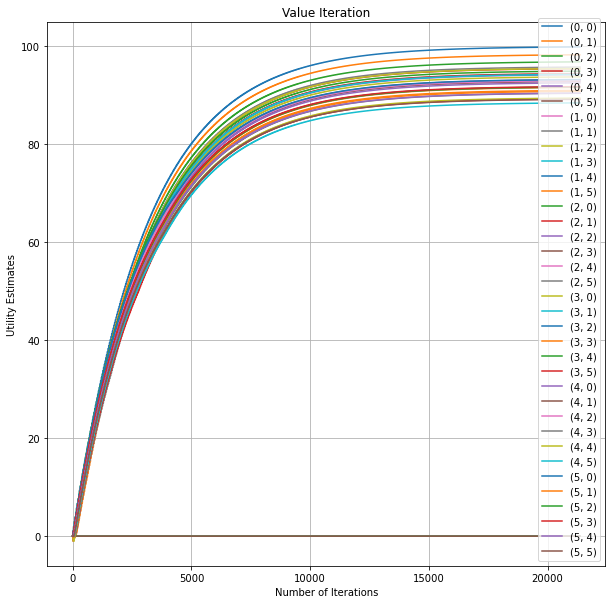

In [47]:
from matplotlib.pyplot import figure
x = [i for i in range(iterations)]

fig, ax = plt.subplots()
ax.plot(x, hist_0_0)
ax.plot(x, hist_0_1)
ax.plot(x, hist_0_2)
ax.plot(x, hist_0_3)
ax.plot(x, hist_0_4)
ax.plot(x, hist_0_5)

ax.plot(x, hist_1_0)
ax.plot(x, hist_1_1)
ax.plot(x, hist_1_2)
ax.plot(x, hist_1_3)
ax.plot(x, hist_1_4)
ax.plot(x, hist_1_5)

ax.plot(x, hist_2_0)
ax.plot(x, hist_2_1)
ax.plot(x, hist_2_2)
ax.plot(x, hist_2_3)
ax.plot(x, hist_2_4)
ax.plot(x, hist_2_5)

ax.plot(x, hist_3_0)
ax.plot(x, hist_3_1)
ax.plot(x, hist_3_2)
ax.plot(x, hist_3_3)
ax.plot(x, hist_3_4)
ax.plot(x, hist_3_5)

ax.plot(x, hist_4_0)
ax.plot(x, hist_4_1)
ax.plot(x, hist_4_2)
ax.plot(x, hist_4_3)
ax.plot(x, hist_4_4)
ax.plot(x, hist_4_5)

ax.plot(x, hist_5_0)
ax.plot(x, hist_5_1)
ax.plot(x, hist_5_2)
ax.plot(x, hist_5_3)
ax.plot(x, hist_5_4)
ax.plot(x, hist_5_5)

plt.legend(list_of_tuples, loc ="lower right")

plt.rcParams["figure.figsize"]=10,10

ax.set(xlabel='Number of Iterations', ylabel='Utility Estimates', title='Value Iteration')
ax.grid()

fig.savefig("test.png")
plt.show()

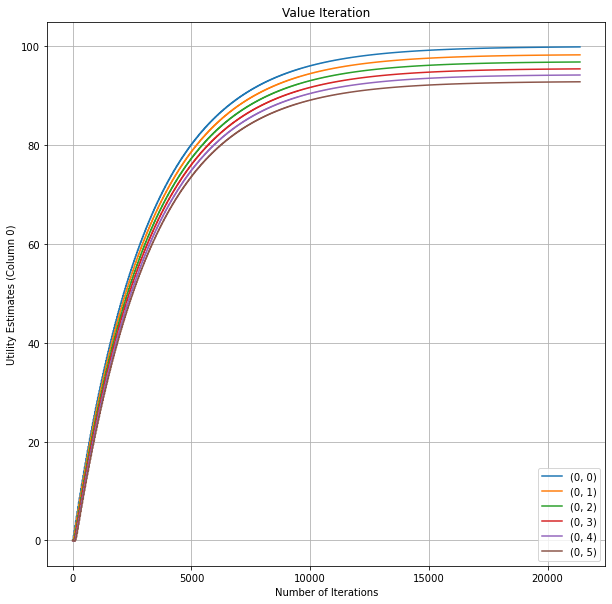

In [48]:
#Column 0

fig, ax = plt.subplots()
ax.plot(x, hist_0_0)
ax.plot(x, hist_0_1)
ax.plot(x, hist_0_2)
ax.plot(x, hist_0_3)
ax.plot(x, hist_0_4)
ax.plot(x, hist_0_5)

plt.legend(list_of_tuples, loc ="lower right")

ax.set(xlabel='Number of Iterations', ylabel='Utility Estimates (Column 0)', title='Value Iteration')
ax.grid()

fig.savefig("test.png")
plt.show()

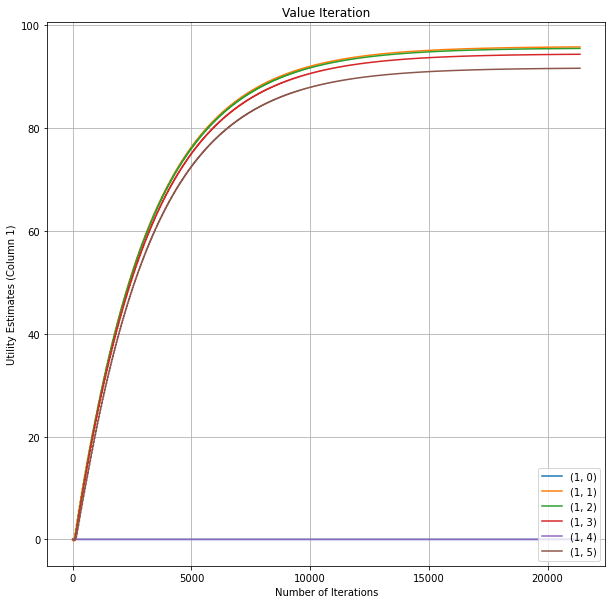

In [49]:
#Column 1

fig, ax = plt.subplots()
ax.plot(x, hist_1_0)
ax.plot(x, hist_1_1)
ax.plot(x, hist_1_2)
ax.plot(x, hist_1_3)
ax.plot(x, hist_1_4)
ax.plot(x, hist_1_5)

plt.legend(list_of_tuples[6:12], loc ="lower right")

ax.set(xlabel='Number of Iterations', ylabel='Utility Estimates (Column 1)', title='Value Iteration')
ax.grid()

fig.savefig("test.png")
plt.show()

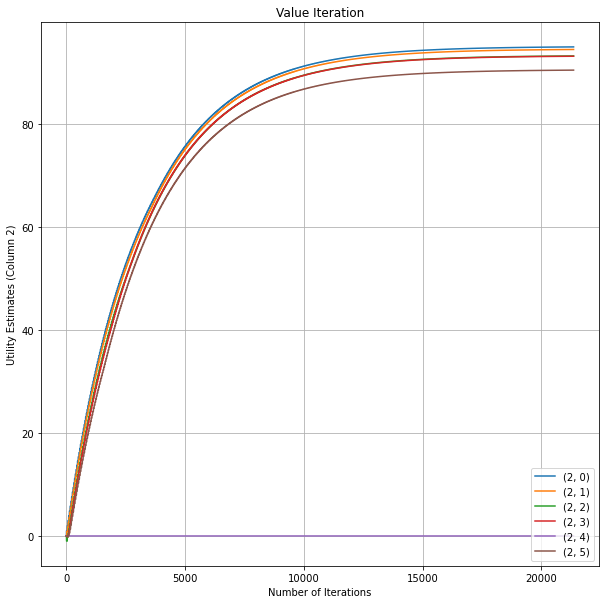

In [50]:
#Column 2

fig, ax = plt.subplots()
ax.plot(x, hist_2_0)
ax.plot(x, hist_2_1)
ax.plot(x, hist_2_2)
ax.plot(x, hist_2_3)
ax.plot(x, hist_2_4)
ax.plot(x, hist_2_5)

plt.legend(list_of_tuples[12:18], loc ="lower right")

ax.set(xlabel='Number of Iterations', ylabel='Utility Estimates (Column 2)', title='Value Iteration')
ax.grid()

fig.savefig("test.png")
plt.show()

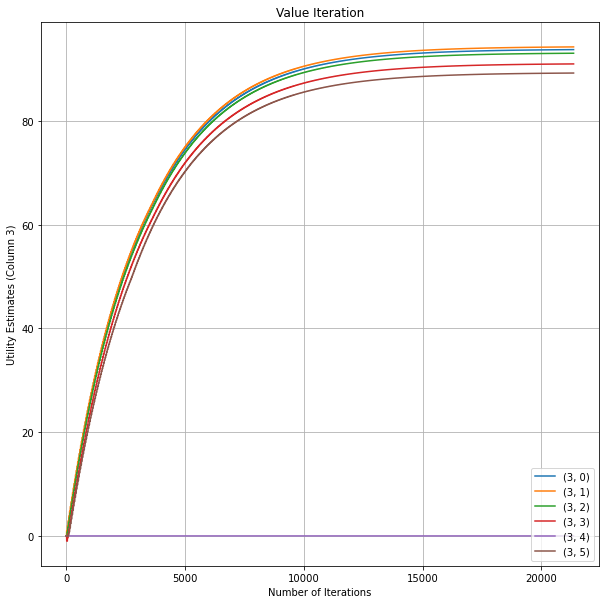

In [51]:
#Column 3

fig, ax = plt.subplots()
ax.plot(x, hist_3_0)
ax.plot(x, hist_3_1)
ax.plot(x, hist_3_2)
ax.plot(x, hist_3_3)
ax.plot(x, hist_3_4)
ax.plot(x, hist_3_5)

plt.legend(list_of_tuples[18:24], loc ="lower right")

ax.set(xlabel='Number of Iterations', ylabel='Utility Estimates (Column 3)', title='Value Iteration')
ax.grid()

fig.savefig("test.png")
plt.show()

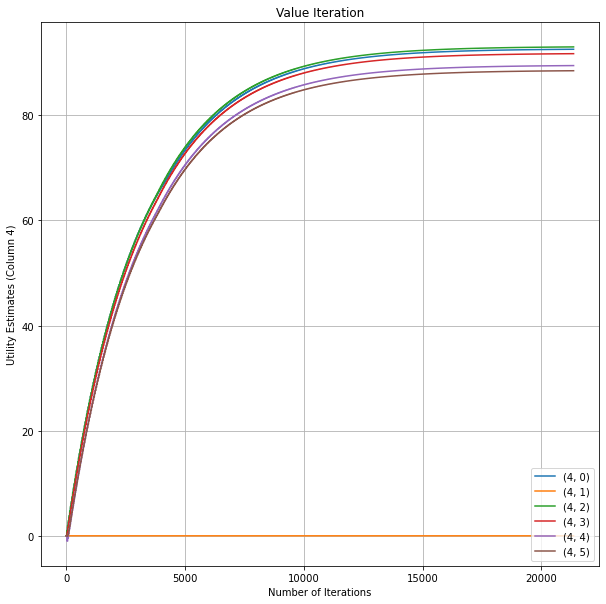

In [52]:
#Column 4

fig, ax = plt.subplots()
ax.plot(x, hist_4_0)
ax.plot(x, hist_4_1)
ax.plot(x, hist_4_2)
ax.plot(x, hist_4_3)
ax.plot(x, hist_4_4)
ax.plot(x, hist_4_5)

plt.legend(list_of_tuples[24:30], loc ="lower right")

ax.set(xlabel='Number of Iterations', ylabel='Utility Estimates (Column 4)', title='Value Iteration')
ax.grid()

fig.savefig("test.png")
plt.show()

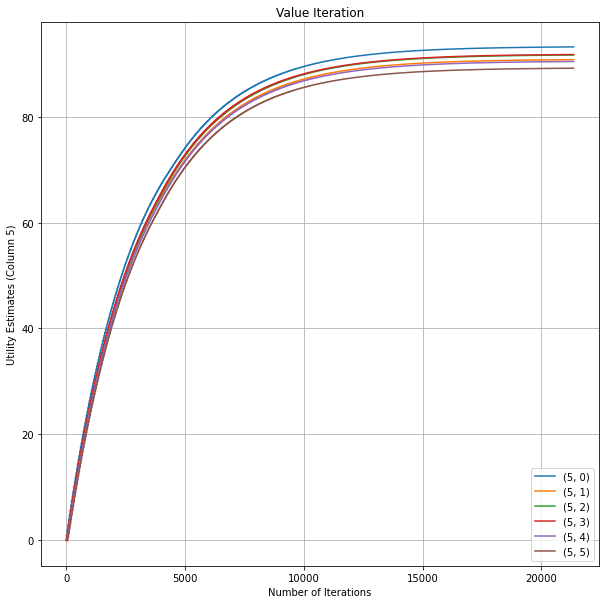

In [53]:
#Column 5

fig, ax = plt.subplots()
ax.plot(x, hist_5_0)
ax.plot(x, hist_5_1)
ax.plot(x, hist_5_2)
ax.plot(x, hist_5_3)
ax.plot(x, hist_5_4)
ax.plot(x, hist_5_5)

plt.legend(list_of_tuples[30:36], loc ="lower right")

ax.set(xlabel='Number of Iterations', ylabel='Utility Estimates (Column 5)', title='Value Iteration')
ax.grid()

fig.savefig("test.png")
plt.show()